# Optimal Classification Tree

This notebook document is a **python** implementation for two new methods of Optimal Classification Trees proposed by Enhao Liu and Theodore Allen: (1) Modified-Optimal Classification Tree (M-OCT) and (2) BinaryNodePenalty-Optimal Classification Tree (BNP-OCT)

Contact: Enhao Liu (liu.5045@osu.edu), Theodre Allen (allen.515@osu.edu)

In [24]:
pip install appdirs==1.4.3 appnope==0.1.0 astroid==2.3.3 attrs==19.3.0 autopep8==1.5 backcall==0.1.0 certifi==2019.11.28 chardet==3.0.4 Click==7.0 black==19.10b0 cplex==12.10.0.0 cycler==0.10.0 decorator==4.4.1 dill==0.3.3 docloud==1.0.375 docplex==2.12.182 future==0.18.2 glpk==0.4.5 graphviz==0.13.2 idna==2.9 imbalanced-learn==0.7.0 importlib-metadata==3.4.0 interpretableai==2.3.0 ipykernel==5.1.4 ipython==7.12.0 ipython-genutils==0.2.0 isort==4.3.21 jedi==0.16.0 joblib==0.14.1 jsonschema==3.2.0 julia==0.5.6 jupyter-client==6.0.0 jupyter-core==4.6.3 kiwisolver==1.1.0 lazy-object-proxy==1.4.3 matplotlib==3.1.3 mccabe==0.6.1 mpmath==1.1.0 nbformat==5.1.2 networkx==2.4 nose==1.3.7 numpy==1.18.1 orloge==0.17 pandas==1.0.1 parso==0.6.2 pathspec==0.7.0 pexpect==4.8.0 pickleshare==0.7.5 plotly==4.14.3 ply==3.11 prompt-toolkit==3.0.3 ptyprocess==0.6.0 pycodestyle==2.5.0 pylint==2.4.4 Pyomo==5.6.8 pyparsing==2.4.6 pyrsistent==0.17.3 python-dateutil==2.8.1 pytz==2019.3 PyUtilib==5.7.3 pyzmq==19.0.0 regex==2020.2.20 requests==2.23.0 retrying==1.3.3 rope==0.16.0 scikit-learn==0.24.1 scipy==1.4.1 seaborn==0.11.1 six==1.14.0 sympy==1.5.1 threadpoolctl==2.1.0 toml==0.10.0 tornado==6.0.3 tqdm==4.58.0 traitlets==4.3.3 typed-ast==1.4.1 typing-extensions==3.7.4.3 urllib3==1.25.8 wcwidth==0.1.8 wrapt==1.11.2 xgboost==1.4.1 zipp==3.4.0


  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
    Preparing wheel metadata: started
    Preparing wheel metadata: finished with status 'done'
  Running setup.py clean for glpk
Failed to build glpk
  Stored in directory: C:\Users\huten\AppData\Local\pip\Cache\wheels\2b\dc\d5\e4bc37df332b7a88022bc79d6cdccb79068fdc1620d86afc3a
  Stored in directory: C:\Users\huten\AppData\Local\pip\Cache\wheels\4e\24\19\9b0e57545d7543ecec35c5faff78c058bf0c2506369c8b1d31
  Stored in directory: C:\Users\huten\AppData\Local\pip\Cache\wheels\9b\ef\71\204f676be3eae44c121c5b779077bd06f573d86cc6524aecc8
  Stored in directory: C:\Users\huten\AppData\Local\pip\Cache\wheels\8b\99\a0\81daf51dcd359a9377b110a8a886b3895921802d2fc1b2397e
  Stored in directory: C:\Users\huten\AppData\Local\pip\Cache\wheels\ed\39\87\7117dcbe1bc574d75ba97066345332961608528

  ERROR: Complete output from command 'C:\Users\huten\Anaconda3\python.exe' 'C:\Users\huten\Anaconda3\lib\site-packages\pip\_vendor\pep517\_in_process.py' build_wheel 'C:\Users\huten\AppData\Local\Temp\tmp0qxge8dv':
  ERROR: running bdist_wheel
  running build
  running build_ext
  building 'glpk' extension
  error: Microsoft Visual C++ 14.0 or greater is required. Get it with "Microsoft C++ Build Tools": https://visualstudio.microsoft.com/visual-cpp-build-tools/
  ----------------------------------------
  ERROR: Failed building wheel for glpk
ERROR: Could not build wheels for glpk which use PEP 517 and cannot be installed directly


# Library Settings

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image

from OCT_tree import OptimalTreeClassifier ## M-OCT propsed by Liu & Allen
#from lsopt.tree import BinNodePenaltyOptimalTreeClassifier ## BNP-OCT propsed by Liu & Allen
# from lsoct.tree import OldOptimalTreeClassifier ## OCT proposed by Bertsimas & Dunn
from OCT_base import _get_epsilon
from OCT_base import _transform_X

from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn import tree 

import graphviz

%load_ext autoreload
%autoreload 2

C:\Users\huten\Anaconda3\lib\site-packages\setuptools\_importlib.py:23: UserWarning: `importlib-metadata` version is incompatible with `setuptools`.
This problem is likely to be solved by installing an updated version of `importlib-metadata`.
  warnings.warn(msg)  # Ensure a descriptive message is shown.


# Optimal Classification Tree

## Example: Iris Dataset

In [2]:
data_path ="C:\\Users\\huten\\OCT\\dataset\\Iris.csv"
iris_data = pd.read_csv(data_path)
iris_data.drop(columns=["Id"], inplace=True)
data_path ="C:\\Users\\huten\\OCT\\dataset\\abalone.data"
abalone_data = pd.read_csv(data_path)
abalone_data['M'] = abalone_data['M'].replace(['M'],'0')
abalone_data['M'] = abalone_data['M'].replace(['F'],'1')
abalone_data['M'] = abalone_data['M'].replace(['I'],'2')
data_path ="C:\\Users\\huten\\OCT\\dataset\\winequality-white1.txt"
white_wine_data = pd.read_csv(data_path,sep=";")
data_path ="C:\\Users\\huten\\OCT\\dataset\\winequality-red1.txt"
red_wine_data = pd.read_csv(data_path,sep=";")
data_path ="C:\\Users\\huten\\OCT\\dataset\\rasin.csv"
rasin_data = pd.read_csv(data_path)
data_path ="C:\\Users\\huten\\OCT\\dataset\\drybean.csv"
drybean_data = pd.read_csv(data_path)
data_path ="C:\\Users\\huten\\OCT\\dataset\\breast-cancer-wisconsin.data"
breastcancerwisconsin = pd.read_csv(data_path)
breastcancerwisconsin.drop(columns=['1000025'],inplace=True)
index = breastcancerwisconsin[ (breastcancerwisconsin['5'] == '?') | (breastcancerwisconsin['1'] == '?') \
                                |(breastcancerwisconsin['1.1'] == '?')|(breastcancerwisconsin['1.2'] == '?')\
                                |(breastcancerwisconsin['2'] == '?')|(breastcancerwisconsin['1.3'] == '?')\
                                |(breastcancerwisconsin['3'] == '?')|(breastcancerwisconsin['1.4'] == '?')\
                                |(breastcancerwisconsin['1.5'] == '?')|(breastcancerwisconsin['2.1'] == '?')].index
breastcancerwisconsin.drop(index , inplace=True)
data_path ="C:\\Users\\huten\\OCT\\dataset\\car.data"
car = pd.read_csv(data_path)
car['vhigh'].replace(['high', 'low','med','vhigh'],
                        [0, 1,2,3], inplace=True)
car['vhigh.1'].replace(['high', 'low','med','vhigh'],
                        [0, 1,2,3], inplace=True)
car['2'].replace(['2', '3','4','5more'],
                        [0, 1,2,3], inplace=True)
car['2.1'].replace(['2','4','more'],
                        [0, 1,2], inplace=True)
car['small'].replace(['small','med','big'],
                        [0, 1,2], inplace=True)
car['low'].replace(['low','med','high'],
                        [0, 1,2], inplace=True)
car['unacc'].replace(['unacc','acc','good','vgood'],
                        [0, 1,2,3], inplace=True)



C:\Users\huten\Anaconda3\lib\site-packages\pandas\core\ops.py:1649: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  result = method(y)


In [3]:
data_list = [iris_data,abalone_data,white_wine_data,red_wine_data,rasin_data,drybean_data,breastcancerwisconsin,\
            car]

In [4]:
xy_list = []
for data in data_list:
    xy_list.append([data.iloc[:,0:len(data.columns)-1].to_numpy(),data[data.columns[len(data.columns)-1]].to_numpy()])

In [5]:
import random
n=200
data_set = 3
samples = [[],[]]
for t in range(n):

    random_number=random.randint(0,len(xy_list[data_set][0]))
    samples[0].append(xy_list[data_set][0][random_number])
    samples[1].append(xy_list[data_set][1][random_number])

### M-OCT

The M-OCT is a modified version of the original OCT formulation (Bertsimas & Dunn, 2017). In the M-OCT formulation, we consider new leaf-branch-interaction constraints to ensure valid tree structure when learning the optimal trees.

In [8]:
from OCT_tree import OptimalTreeClassifier ## M-OCT propsed by Liu & Allen
from OCT_base import solve_oct_MILP
#from lsopt.tree import BinNodePenaltyOptimalTreeClassifier ## BNP-OCT propsed by Liu & Allen

# OCT parameters
max_depth = 3
min_samples_leaf = 1
alpha = 0.01
time_limit = 5  # minute
mip_gap_tol = 0.01  # optimal gap percentage
mip_focus = 'optimal'
mip_polish_time = None
warm_start = False
log_file = None

#model, run_time, solution_condition = solve_oct_MILP(X_transformed, y_transformed, L_hat, epsilons,
#                   alpha=0.01, max_depth=2, min_samples_leaf=1, small_number = 0.0000001,
#                   solver="gurobi", small_epsilon=False,epsilon_version=False,verbose=False, log_file=None)

# Construct OCT classifier
oct_model = OptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  small_epsilon=True,
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )

In [9]:
# Fit
oct_model.fit(X, y)

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpe3xs_sgl.pyomo.lp
Reading time = 0.06 seconds
x1796: 6765 rows, 1795 columns, 72531 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6765 rows, 1795 columns and 72531 nonzeros
Model fingerprint: 0xc90edc51
Variable types: 64 continuous, 1731 integer (1731 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6753 rows, 1786 columns, 69471 nonzeros
Variable types: 7 continuous, 1779 integer (1731 binary)
Found heuristic solution: obje

In [7]:
from OCT_tree import OptimalTreeClassifier
from OCT_tree import MOptimalTreeClassifier

total_run = 50
count = 0
max_depth = 3
min_samples_leaf = 1
alpha = 0.01
time_limit = 5  # minute
mip_gap_tol = 0.01  # optimal gap percentage
mip_focus = 'optimal'
mip_polish_time = None
warm_start = False
log_file = None

while count < total_run:
    n=200
    data_set = 7
    samples = [[],[]]
    for t in range(n):
        random_number=random.randint(0,len(xy_list[data_set][0])-1)
        samples[0].append(xy_list[data_set][0][random_number])
        samples[1].append(xy_list[data_set][1][random_number])
    
    X = samples[0]
    y = samples[1]

    max_depth = 3
    min_samples_leaf = 1
    alpha = 0.01
    time_limit = 5  # minute
    mip_gap_tol = 0.01  # optimal gap percentage
    mip_focus = 'optimal'
    mip_polish_time = None
    warm_start = False
    log_file = None

#model, run_time, solution_condition = solve_oct_MILP(X_transformed, y_transformed, L_hat, epsilons,
#                   alpha=0.01, max_depth=2, min_samples_leaf=1, small_number = 0.0000001,
#                   solver="gurobi", small_epsilon=False,epsilon_version=False,verbose=False, log_file=None)

# Construct OCT classifier
    oct_model = OptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    oct_model = OptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  epsilon_version = True,
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    
    oct_model = MOptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    
    oct_model = MOptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  epsilon_version = True,
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    
    
    
    print('*****************************************************************************')
    
    
    count=count+1





Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpsy994lpe.pyomo.lp
Reading time = 0.04 seconds
x1745: 6741 rows, 1744 columns, 48416 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6741 rows, 1744 columns and 48416 nonzeros
Model fingerprint: 0x266252fc
Variable types: 56 continuous, 1688 integer (1688 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 4 rows and 1 columns
Presolve time: 0.12s
Presolved: 6737 rows, 1743 columns, 45348 nonzeros
Variable types: 7 continuous, 1736 integer (1688 binary)
Found heuristic solution: objec

     0     0    0.01000    0  484    0.56556    0.01000  98.2%     -    0s
H    0     0                       0.5285185    0.01000  98.1%     -    0s
     0     0    0.01000    0  477    0.52852    0.01000  98.1%     -    0s
H    0     0                       0.4359259    0.01000  97.7%     -    1s
H    0     0                       0.1396296    0.01000  92.8%     -    1s
H    0     0                       0.1211111    0.01000  91.7%     -    1s
H    0     0                       0.1025926    0.01000  90.3%     -    1s
     0     0    0.01000    0  110    0.10259    0.01000  90.3%     -    1s
     0     0    0.01000    0  112    0.10259    0.01000  90.3%     -    1s
H    0     0                       0.0840741    0.01000  88.1%     -    2s
H    0     0                       0.0655556    0.01000  84.7%     -    2s
H    0     0                       0.0470370    0.01000  78.7%     -    2s
H    0     0                       0.0100000    0.01000  0.00%     -    2s
     0     0    0.01000  

    containing a solution
Solver running time: 300.356737613678
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpjbl_1l98.pyomo.lp
Reading time = 0.04 seconds
x1745: 6755 rows, 1744 columns, 48448 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6755 rows, 1744 columns and 48448 nonzeros
Model fingerprint: 0x21861308
Variable types: 56 continuous, 1688 integer (1688 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.19s
Presolved: 674

Presolve removed 234 rows and 10 columns
Presolve time: 0.20s
Presolved: 6507 rows, 1734 columns, 44792 nonzeros
Variable types: 7 continuous, 1727 integer (1679 binary)
Found heuristic solution: objective 0.9575362
Root relaxation presolve removed 3 rows and 0 columns
Root relaxation presolved: 6504 rows, 1737 columns, 44783 nonzeros


Root relaxation: objective 1.000000e-02, 53 iterations, 0.02 seconds (0.03 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   62    0.95754    0.01000  99.0%     -    0s
     0     0    0.01000    0  232    0.95754    0.01000  99.0%     -    0s
H    0     0                       0.8705797    0.01000  98.9%     -    1s
H    0     0                       0.7836232    0.01000  98.7%     -    2s
     0     0    0.01000    0  126    0.78362    0.01000  98.7%     -    2s
     0     0    0.01000    0  192    0.78362   

H    0     0                       0.5027536    0.01000  98.0%     -    0s
H    0     0                       0.1694203    0.01000  94.1%     -    0s
H    0     0                       0.0100000    0.01000  0.00%     -    0s
     0     0    0.01000    0  189    0.01000    0.01000  0.00%     -    0s

Cutting planes:
  Learned: 28
  Gomory: 75
  Lift-and-project: 112
  Cover: 131
  Implied bound: 262
  Clique: 197
  MIR: 29
  StrongCG: 15
  Flow cover: 92
  GUB cover: 5
  RLT: 5
  Relax-and-lift: 126

Explored 1 nodes (2726 simplex iterations) in 0.96 seconds (0.76 work units)
Thread count was 8 (of 8 available processors)

Solution count 6: 0.01 0.16942 0.502754 ... 0.662174

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver running time: 1.1982243061065674
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set param

Presolve removed 255 rows and 17 columns
Presolve time: 0.35s
Presolved: 6500 rows, 1727 columns, 46179 nonzeros
Variable types: 7 continuous, 1720 integer (1672 binary)
Found heuristic solution: objective 1.0200000
Found heuristic solution: objective 1.0100000
Root relaxation presolve removed 3 rows and 0 columns
Root relaxation presolved: 6497 rows, 1730 columns, 46170 nonzeros


Root relaxation: objective 1.000000e-02, 233 iterations, 0.03 seconds (0.05 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   38    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  263    1.01000    0.01000  99.0%     -    1s
     0     0    0.01000    0  263    1.01000    0.01000  99.0%     -    1s
     0     0    0.01000    0  213    1.01000    0.01000  99.0%     -    2s
     0     0    0.01000    0  170    1.01000    0.01000  99.0%     -    3s


H    0     0                       0.9992308    0.01000  99.0%     -    2s
     0     0    0.01000    0  222    0.99923    0.01000  99.0%     -    2s
H    0     0                       0.9530769    0.01000  99.0%     -    2s
     0     0    0.01000    0  253    0.95308    0.01000  99.0%     -    2s
     0     0    0.01000    0   45    0.95308    0.01000  99.0%     -    4s
     0     0    0.01000    0   40    0.95308    0.01000  99.0%     -    4s
     0     2    0.01000    0   36    0.95308    0.01000  99.0%     -    4s
     3     8    0.01000    2  288    0.95308    0.01000  99.0%   450    5s
H   29    32                       0.9376923    0.01000  98.9%   394    5s
   300   228    0.05000   44  372    0.93769    0.01000  98.9%  98.8   10s
   975   464 infeasible   14         0.93769    0.01000  98.9%  76.7   15s
  1215   581    0.89615   21   70    0.93769    0.01000  98.9%  89.7   21s
  1390   681    0.04000   36   10    0.93769    0.01000  98.9%   107   25s
  1701   792    0.17736  

Solver running time: 2.3907554149627686
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp34w32mlk.pyomo.lp
Reading time = 0.04 seconds
x1745: 6755 rows, 1744 columns, 48448 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6755 rows, 1744 columns and 48448 nonzeros
Model fingerprint: 0x8b27e8b4
Variable types: 56 continuous, 1688 integer (1688 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve remo

Presolve removed 12 rows and 5 columns
Presolve time: 0.24s
Presolved: 6743 rows, 1739 columns, 46880 nonzeros
Variable types: 7 continuous, 1732 integer (1684 binary)
Found heuristic solution: objective 1.0100000
Root relaxation presolve removed 16 rows and 0 columns
Root relaxation presolved: 6727 rows, 1755 columns, 46832 nonzeros


Root relaxation: objective 1.000000e-02, 531 iterations, 0.03 seconds (0.04 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    4    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  419    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  221    1.01000    0.01000  99.0%     -    1s
     0     0    0.01000    0  221    1.01000    0.01000  99.0%     -    2s
     0     0    0.01000    0  203    1.01000    0.01000  99.0%     -    3s
     0     0    0.01000    0  124    1.01000   

   182   147    0.01000   23  221    1.01000    0.01000  99.0%  70.1    5s
   709   490    0.27490   36   36    1.01000    0.01000  99.0%  62.9   10s
*  947   550              33       1.0100000    0.01000  99.0%  80.0   12s
  1072   628 infeasible   14         1.01000    0.01000  99.0%  84.4   16s
H 1126   628                       0.9379592    0.01000  98.9%  82.7   16s
  1269   669 infeasible   33         0.93796    0.01000  98.9%   107   20s
H 1356   651                       0.8359184    0.01167  98.6%   111   24s
  1369   682    0.65233   67  174    0.83592    0.01333  98.4%   112   25s
H 1470   705                       0.8051020    0.01333  98.3%   111   28s
  1576   747    0.05329   50  426    0.80510    0.01333  98.3%   113   30s
* 1803   793              49       0.7238776    0.02000  97.2%   125   34s
  1881   835    0.03000   19  412    0.72388    0.02000  97.2%   123   35s
  2162   868    0.27490    5  177    0.72388    0.02000  97.2%   122   42s
  2165   870    0.06041  

Presolve removed 24 rows and 8 columns
Presolve time: 0.24s
Presolved: 6731 rows, 1736 columns, 46641 nonzeros
Variable types: 7 continuous, 1729 integer (1681 binary)
Found heuristic solution: objective 1.0200000
Found heuristic solution: objective 1.0100000
Root relaxation presolve removed 16 rows and 0 columns
Root relaxation presolved: 6715 rows, 1752 columns, 46593 nonzeros


Root relaxation: objective 1.000000e-02, 526 iterations, 0.03 seconds (0.04 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    4    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  420    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  177    1.01000    0.01000  99.0%     -    2s
     0     0    0.01000    0  166    1.01000    0.01000  99.0%     -    3s
     0     0    0.01000    0   10    1.01000    0.01000  99.0%     -    4s
 

     0     0    0.01000    0  206    1.01000    0.01000  99.0%     -    6s
     0     0    0.01000    0  123    1.01000    0.01000  99.0%     -    6s
     0     2    0.01000    0  122    1.01000    0.01000  99.0%     -    7s
   150   129    0.02000   25  184    1.01000    0.01000  99.0%   222   10s
   598   354    0.03000    9   55    1.01000    0.01217  98.8%   106   15s
* 1091   570               9       1.0100000    0.02000  98.0%  89.8   19s
  1132   616    0.93109    9    3    1.01000    0.02000  98.0%  91.9   21s
  1362   705    0.61184   37  123    1.01000    0.02000  98.0%  91.0   25s
  1366   708    0.57561   25  578    1.01000    0.02000  98.0%  90.7   31s
  1367   708    0.53020   12  539    1.01000    0.02000  98.0%  90.6   36s
H 1367   672                       0.9687755    0.02000  97.9%  90.6   39s
  1368   673    0.05000   92  555    0.96878    0.02000  97.9%  90.6   40s
  1369   674    0.59061   30  576    0.96878    0.02000  97.9%  90.5   47s
  1372   679    0.02000  

  1204   717    0.06000   19  754    0.84667    0.02000  97.6%  61.1   60s
  1207   719    0.03000   27  646    0.84667    0.02000  97.6%  60.9   65s
H 1207   682                       0.6800000    0.02000  97.1%  60.9   69s
  1208   682    0.06000   35  691    0.68000    0.02000  97.1%  60.9   70s
H 1209   649                       0.6466667    0.02000  96.9%  60.8   75s
  1212   651    0.02000   30  806    0.64667    0.02000  96.9%  60.7   81s
  1213   652    0.03000   29  803    0.64667    0.02000  96.9%  60.6   86s
  1215   653    0.06000   51  745    0.64667    0.02000  96.9%  60.5   94s
  1216   654    0.03000   21 1141    0.64667    0.02000  96.9%  60.5  100s
  1218   655    0.04000   92 1053    0.64667    0.02000  96.9%  60.4  108s
  1219   656    0.03000   46 1065    0.64667    0.02000  96.9%  60.3  112s
  1220   656    0.02000   79 1084    0.64667    0.02000  96.9%  60.3  116s
  1222   658    0.06000   50  843    0.64667    0.02000  96.9%  60.2  121s
  1223   658    0.64667  

     0     2    0.01000    0   94    1.01000    0.01000  99.0%     -    4s
     1     4    0.01000    1  152    1.01000    0.01000  99.0%   245    5s
H  253   182                       0.7866667    0.01000  98.7%   114    8s
H  255   182                       0.7133333    0.01000  98.6%   113    8s
   425   310 infeasible   65         0.71333    0.01000  98.6%   103   12s
   706   452    0.69588   10  143    0.71333    0.02000  97.2%  93.8   15s
  1404   623    0.02144   25  698    0.71333    0.02000  97.2%   104   20s
  1639   723    0.03822   13  468    0.71333    0.02000  97.2%   132   25s
* 1775   776              27       0.6900000    0.02000  97.1%   136   27s
  1929   881    0.21964   26  345    0.69000    0.02000  97.1%   140   30s
  2050   883    0.02397   11  174    0.69000    0.02000  97.1%   137   36s
  2052   885    0.03000    6  716    0.69000    0.02000  97.1%   137   42s
  2053   885    0.03000   25 1184    0.69000    0.02000  97.1%   137   45s
  2055   887    0.03212  

     0     0    0.01340    0  909    0.68000    0.01340  98.0%     -   13s
     0     0    0.01368    0  847    0.68000    0.01368  98.0%     -   14s
     0     0    0.01377    0 1296    0.68000    0.01377  98.0%     -   15s
     0     0    0.01391    0 1125    0.68000    0.01391  98.0%     -   17s
     0     0    0.01397    0  669    0.68000    0.01397  97.9%     -   17s
     0     0    0.01465    0  669    0.68000    0.01465  97.8%     -   18s
     0     0    0.01500    0  675    0.68000    0.01500  97.8%     -   18s
     0     0    0.01582    0  690    0.68000    0.01582  97.7%     -   20s
     0     0    0.01582    0  703    0.68000    0.01582  97.7%     -   20s
     0     0    0.02000    0 1122    0.68000    0.02000  97.1%     -   22s
     0     0    0.02000    0 1155    0.68000    0.02000  97.1%     -   22s
     0     0    0.02000    0 1192    0.68000    0.02000  97.1%     -   24s
     0     0    0.02000    0 1400    0.68000    0.02000  97.1%     -   24s
     0     0    0.02000  

  2013   954 infeasible   19         1.01000    0.01000  99.0%   188   65s
  2106   957    0.03000   63  209    1.01000    0.01000  99.0%   190   70s
  2108   958    0.25690   48  330    1.01000    0.01000  99.0%   189   78s
  2109   959    0.02000   17  528    1.01000    0.01113  98.9%   189   82s
  2110   960    0.76424   47  959    1.01000    0.01154  98.9%   189   85s
  2111   960    0.05952   96  825    1.01000    0.01248  98.8%   189   90s
  2113   962    0.05358   42  827    1.01000    0.01322  98.7%   189   97s
H 2113   913                       0.9637931    0.01322  98.6%   189  102s
H 2114   867                       0.9293103    0.02000  97.8%   189  105s
H 2115   825                       0.9193103    0.02000  97.8%   189  111s
H 2116   784                       0.7224138    0.02000  97.2%   189  116s
  2118   785    0.46379   62  670    0.72241    0.02000  97.2%   189  125s
H 2118   746                       0.7051724    0.02000  97.2%   189  128s
  2119   747    0.03000  

     0     0    0.01000    0  411    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  411    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0   74    1.01000    0.01000  99.0%     -    2s
     0     0    0.01000    0   76    1.01000    0.01000  99.0%     -    2s
     0     0    0.01000    0  179    1.01000    0.01000  99.0%     -    2s
     0     0    0.01000    0  220    1.01000    0.01000  99.0%     -    3s
H    0     0                       0.9610345    0.01000  99.0%     -    3s
     0     0    0.01000    0   69    0.96103    0.01000  99.0%     -    4s
     0     0    0.01000    0   67    0.96103    0.01000  99.0%     -    4s
     0     2    0.01000    0   67    0.96103    0.01000  99.0%     -    4s
     3     8    0.01000    2  293    0.96103    0.01000  99.0%   419    5s
   328   160    0.02000    4  428    0.96103    0.01000  99.0%   125   10s
H  531   233                       0.9437931    0.01105  98.8%   115   14s
   563   269    0.02000  

H    0     0                       0.9610345    0.01243  98.7%     -   13s
     0     0    0.01243    0  901    0.96103    0.01243  98.7%     -   13s
     0     0    0.01269    0  862    0.96103    0.01269  98.7%     -   14s
     0     0    0.01328    0  605    0.96103    0.01328  98.6%     -   15s
H    0     0                       0.9437931    0.01410  98.5%     -   16s
     0     0    0.01410    0  806    0.94379    0.01410  98.5%     -   16s
     0     0    0.01432    0  664    0.94379    0.01432  98.5%     -   18s
H    0     0                       0.6851724    0.01432  97.9%     -   18s
     0     0    0.01434    0  673    0.68517    0.01434  97.9%     -   18s
     0     0    0.01456    0  863    0.68517    0.01456  97.9%     -   19s
     0     0    0.01463    0  864    0.68517    0.01463  97.9%     -   19s
     0     0    0.02000    0  787    0.68517    0.02000  97.1%     -   21s
     0     0    0.02000    0 1290    0.68517    0.02000  97.1%     -   22s
     0     0    0.02000  

Found heuristic solution: objective 1.0100000
Root relaxation presolve removed 32 rows and 0 columns
Root relaxation presolved: 6705 rows, 1775 columns, 45252 nonzeros


Root relaxation: objective 1.000000e-02, 669 iterations, 0.05 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  392    1.01000    0.01000  99.0%     -    0s
H    0     0                       0.9654545    0.01000  99.0%     -    0s
     0     0    0.01000    0   65    0.96545    0.01000  99.0%     -    1s
     0     0    0.01000    0   65    0.96545    0.01000  99.0%     -    1s
     0     0    0.01000    0   90    0.96545    0.01000  99.0%     -    2s
H    0     0                       0.9309091    0.01000  98.9%     -    2s
     0     0    0.01000    0  215    0.93091    0.01000  98.9%     -    2s
H    0     0                       0.9209091    0.01000  98.9%   


Cutting planes:
  Learned: 7
  Gomory: 128
  Lift-and-project: 137
  Cover: 124
  Implied bound: 19
  Projected implied bound: 1
  Clique: 45
  MIR: 22
  StrongCG: 11
  Flow cover: 152
  GUB cover: 130
  Mod-K: 2
  RLT: 8
  Relax-and-lift: 18

Explored 1 nodes (4946 simplex iterations) in 1.96 seconds (1.31 work units)
Thread count was 8 (of 8 available processors)

Solution count 6: 0.01 0.0281818 0.155455 ... 0.846364

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver running time: 2.190300941467285
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpgmi4wdyp.pyomo.lp
Reading time = 0.04 seconds
x1745: 6755 rows, 1744 columns, 48448 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to 

Presolve removed 12 rows and 5 columns
Presolve time: 0.19s
Presolved: 6743 rows, 1739 columns, 46784 nonzeros
Variable types: 7 continuous, 1732 integer (1684 binary)
Found heuristic solution: objective 1.0100000
Root relaxation presolve removed 32 rows and 0 columns
Root relaxation presolved: 6711 rows, 1771 columns, 46688 nonzeros


Root relaxation: objective 1.000000e-02, 541 iterations, 0.03 seconds (0.03 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    4    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  418    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  297    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  219    1.01000    0.01000  99.0%     -    1s
     0     0    0.01000    0  228    1.01000    0.01000  99.0%     -    1s
H    0     0                       0.9654545   

     0     0    0.01000    0   71    1.01000    0.01000  99.0%     -    5s
     0     0    0.01000    0  245    1.01000    0.01000  99.0%     -    5s
     0     0    0.01000    0  278    1.01000    0.01000  99.0%     -    7s
     0     0    0.01000    0   52    1.01000    0.01000  99.0%     -    8s
     0     2    0.01000    0   49    1.01000    0.01000  99.0%     -    8s
     3     8    0.01000    2  191    1.01000    0.01000  99.0%   328   10s
   130   105    0.01021    7 1087    1.01000    0.01000  99.0%   270   15s
H  147   109                       0.9949123    0.01000  99.0%   242   17s
   383   230    0.02000   22  347    0.99491    0.01000  99.0%   124   20s
   437   238 infeasible   25         0.99491    0.01000  99.0%   118   25s
H  879   415                       0.9247368    0.01000  98.9%   106   30s
  1038   504    0.10018   63  268    0.92474    0.01000  98.9%   119   35s
  1041   506    0.05000   90  255    0.92474    0.01000  98.9%   119   40s
  1044   508    0.04050  

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpz8_6h0t4.pyomo.lp
Reading time = 0.04 seconds
x1745: 6755 rows, 1744 columns, 48448 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6755 rows, 1744 columns and 48448 nonzeros
Model fingerprint: 0xda56df76
Variable types: 56 continuous, 1688 integer (1688 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.20s
Presolved: 6743 rows, 1739 columns, 46700 nonzeros
Variable types: 7 continuous, 1732 integer (1684 binary)
Found heuristic solution: obje

     0     0    0.01000    0  196    1.01000    0.01000  99.0%     -    3s
     0     0    0.01000    0  196    1.01000    0.01000  99.0%     -    4s
     0     2    0.01000    0   53    1.01000    0.01000  99.0%     -    4s
     1     4    0.01000    1   51    1.01000    0.01000  99.0%  1565    5s
H   59    59                       0.9949123    0.01033  99.0%   325    7s
H  225   143                       0.9773684    0.01104  98.9%   169    9s
   298   202    0.04000   35  172    0.97737    0.01104  98.9%   147   10s
H  421   236                       0.7943860    0.01368  98.3%   125   10s
H  534   280                       0.6089474    0.01560  97.4%   113   12s
   796   416    0.02287    6  248    0.60895    0.02000  96.7%   106   15s
  1543   713    0.02423   15  533    0.60895    0.02000  96.7%   111   20s
  1901   882    0.19520   25  288    0.60895    0.02000  96.7%   121   25s
  2062   910    0.26807   17  196    0.60895    0.02000  96.7%   126   30s
  2065   912    0.03000  

  2071   858    0.03000   22  560    0.79000    0.02000  97.5%   162   70s
  2073   859    0.48000   35  561    0.79000    0.02000  97.5%   162   79s
  2074   860    0.04000   14  567    0.79000    0.02000  97.5%   162   83s
  2075   860    0.07106   24  627    0.79000    0.02000  97.5%   162   89s
  2076   861    0.05017   10  547    0.79000    0.02000  97.5%   161   93s
  2077   862    0.49000   20  707    0.79000    0.02000  97.5%   161   97s
  2078   862    0.60000   57  720    0.79000    0.02000  97.5%   161  101s
  2079   863    0.03667   65  551    0.79000    0.02000  97.5%   161  105s
  2081   864    0.40000   20  660    0.79000    0.02000  97.5%   161  113s
  2082   865    0.40000   20  683    0.79000    0.02000  97.5%   161  117s
  2083   866    0.03000   18  665    0.79000    0.02000  97.5%   161  125s
  2084   866    0.03000   22  688    0.79000    0.02000  97.5%   161  133s
  2085   867    0.06000   33  984    0.79000    0.02000  97.5%   161  140s
  2087   868    0.03000  

H    0     0                       0.9500000    0.01000  98.9%     -    0s
     0     0    0.01000    0  420    0.95000    0.01000  98.9%     -    0s
     0     0    0.01000    0   25    0.95000    0.01000  98.9%     -    1s
     0     0    0.01000    0   19    0.95000    0.01000  98.9%     -    1s
     0     0    0.01000    0  144    0.95000    0.01000  98.9%     -    2s
     0     0    0.01000    0  174    0.95000    0.01000  98.9%     -    2s
H    0     0                       0.9400000    0.01000  98.9%     -    3s
H    0     0                       0.9300000    0.01000  98.9%     -    3s
     0     0    0.01000    0  163    0.93000    0.01000  98.9%     -    3s
     0     0    0.01000    0  124    0.93000    0.01000  98.9%     -    3s
     0     2    0.01000    0  124    0.93000    0.01000  98.9%     -    4s
    15    20    0.01000    5  222    0.93000    0.01000  98.9%   485    5s
H   29    34                       0.8700000    0.01000  98.9%   359    5s
H  126   100             

  1027   532    0.02000   35  238    0.79000    0.01529  98.1%   100   25s
  1029   534    0.02000   11  573    0.79000    0.01529  98.1%   100   30s
  1031   535    0.02000   22  579    0.79000    0.01529  98.1%   100   36s
  1032   536    0.61362   10  687    0.79000    0.01529  98.1%   100   40s
  1034   537    0.36000   48  933    0.79000    0.01529  98.1%   100   48s
  1035   538    0.03000  102 1276    0.79000    0.01529  98.1%   100   50s
  1036   538    0.04000    6  806    0.79000    0.01529  98.1%  99.5   55s
  1038   540    0.21000   25  542    0.79000    0.01529  98.1%  99.3   64s
  1039   540    0.22000   32 1011    0.79000    0.01529  98.1%  99.2   68s
  1040   541    0.03000    8 1136    0.79000    0.01680  97.9%  99.1   72s
  1041   542    0.40000    8  993    0.79000    0.01694  97.9%  99.0   75s
  1043   543    0.43000   23  561    0.79000    0.02000  97.5%  98.8   82s
  1044   544    0.02000   36  729    0.79000    0.02000  97.5%  98.7   87s
  1045   544    0.02000  

  2507   940    0.11792   46  437    0.85353    0.02000  97.7%   212  151s
  2528   951    0.02367   21  715    0.85353    0.02000  97.7%   221  155s
  2567   964    0.03000   26  448    0.85353    0.02000  97.7%   230  160s
  2629   963    0.08882   36  362    0.85353    0.02000  97.7%   239  166s
  2647   970    0.19525   41  418    0.85353    0.02000  97.7%   244  171s
  2672   964    0.37189   53  404    0.85353    0.02000  97.7%   250  182s
  2676   996    0.39619   54  403    0.85353    0.02104  97.5%   254  186s
  2749  1017    0.03000   20  433    0.85353    0.02104  97.5%   261  193s
  2796  1031    0.02662   22  689    0.85353    0.02104  97.5%   262  197s
  2847  1053    0.02306   23  743    0.85353    0.02104  97.5%   262  200s
  2901  1050    0.03000   24  352    0.85353    0.02104  97.5%   268  218s
  2920  1095    0.03000   25  350    0.85353    0.02104  97.5%   269  222s
  2987  1103    0.03000   27  343    0.85353    0.02104  97.5%   273  227s
  3046  1107    0.03000  

* 1646   717              55       0.9027451    0.02000  97.8%  80.7   16s
H 1696   726                       0.8735294    0.02000  97.7%  83.8   17s
H 1808   739                       0.8539216    0.02000  97.7%  86.4   19s
  1823   747    0.03908   18  525    0.85392    0.02000  97.7%  90.0   20s
  2087   897    0.03038   26   60    0.85392    0.02000  97.7%  99.0   26s
  2090   899    0.05339   25  270    0.85392    0.02000  97.7%  98.8   30s
  2092   900    0.08961   43  559    0.85392    0.02000  97.7%  98.7   35s
  2094   902    0.03339    8  529    0.85392    0.02000  97.7%  98.6   45s
  2097   907    0.02000   13  516    0.85392    0.02000  97.7%   110   56s
  2099   910    0.02000   14  679    0.85392    0.02000  97.7%   112   65s
  2107   915    0.02000   15  625    0.85392    0.02000  97.7%   119   71s
  2119   925    0.03050   17  762    0.85392    0.02000  97.7%   128   75s
  2149   946    0.03054   21  726    0.85392    0.02000  97.7%   141   80s
H 2157   904             

  1327   704    0.11894   36  480    0.97118    0.02000  97.9%   201   75s
  1472   708    0.05320   19  657    0.97118    0.02125  97.8%   196   80s
  1517   727    0.07043   22  271    0.97118    0.02125  97.8%   198   85s
  1605   751 infeasible   51         0.97118    0.02137  97.8%   198   90s
  1782   811    0.07148   29  368    0.97118    0.02393  97.5%   200   97s
  1866   797    0.04577   21  854    0.97118    0.02480  97.4%   204  101s
  2009   828    0.05136   27  568    0.97118    0.02480  97.4%   200  107s
  2041   888    0.05523   32  480    0.97118    0.02480  97.4%   204  110s
  2253   909    0.04000   28  195    0.97118    0.02646  97.3%   204  116s
  2492  1025    0.05000   38  323    0.97118    0.02847  97.1%   199  120s
  2608  1011    0.04992   20  639    0.97118    0.02910  97.0%   199  125s
  2885  1326    0.14273   41  493    0.97118    0.03000  96.9%   198  131s
  3218  1321    0.03808   31  414    0.97118    0.03000  96.9%   195  137s
  3264  1364    0.17250  

H 2477   779                       0.6693443    0.02000  97.0%   198  143s
  2484   787    0.06104   29  546    0.66934    0.02000  97.0%   201  145s
H 2510   744                       0.6629508    0.02000  97.0%   205  148s
  2533   739 infeasible   36         0.66295    0.02000  97.0%   207  150s
  2550   735    0.03000   21  456    0.66295    0.02000  97.0%   215  156s
  2559   747    0.03041   23  408    0.66295    0.02000  97.0%   223  160s
  2610   759 infeasible   37         0.66295    0.02000  97.0%   232  165s
  2669   753    0.15797   34  380    0.66295    0.02000  97.0%   242  173s
  2685   754 infeasible   34         0.66295    0.02000  97.0%   248  176s
  2708   766    0.05889   22  298    0.66295    0.02000  97.0%   256  180s
  2773   753    0.05639   24  391    0.66295    0.02052  96.9%   268  189s
  2804   758    0.11307   34  326    0.66295    0.02053  96.9%   272  198s
  2825   768    0.13197   44  328    0.66295    0.02053  96.9%   278  203s
  2866   766 infeasible  

  1198   557    0.05000   56  234    0.90246    0.02000  97.8%  81.2   20s
  1200   559    0.57098   26 1060    0.90246    0.02000  97.8%  81.0   27s
  1201   559    0.05000   34 1229    0.90246    0.02000  97.8%  81.0   32s
  1203   561    0.05000   38  836    0.90246    0.02000  97.8%  80.8   36s
H 1203   532                       0.8988525    0.02000  97.8%  80.8   37s
  1205   533    0.05000   86 1415    0.89885    0.02000  97.8%  80.7   44s
  1206   534    0.13059    8 1038    0.89885    0.02000  97.8%  80.6   46s
H 1206   507                       0.8596721    0.02000  97.7%  80.6   48s
H 1206   482                       0.8232787    0.02000  97.6%  80.6   48s
H 1206   458                       0.7840984    0.02000  97.4%  80.6   49s
  1207   458    0.05000   19 1018    0.78410    0.02000  97.4%  80.5   52s
  1210   463    0.02000   11  825    0.78410    0.02000  97.4%   105   65s
  1216   469    0.02000   13  821    0.78410    0.02000  97.4%   112   71s
  1239   487    0.04000  

  1264   558    0.02000   18  564    0.63656    0.02000  96.9%   142   95s
  1285   569    0.03000   21  398    0.63656    0.02000  96.9%   152  100s
  1306   580    0.05755   23  494    0.63656    0.02000  96.9%   170  105s
  1352   593    0.09171   31  305    0.63656    0.02000  96.9%   177  110s
  1423   597    0.02000   19  310    0.63656    0.02000  96.9%   197  115s
  1450   613    0.10909   22  309    0.63656    0.02000  96.9%   208  120s
  1479   613 infeasible   26         0.63656    0.02000  96.9%   210  125s
  1534   619    0.12171   29  399    0.63656    0.02000  96.9%   225  131s
  1564   615    0.18115   41  340    0.63656    0.02000  96.9%   234  138s
  1571   620    0.18115   42  340    0.63656    0.02000  96.9%   240  140s
  1643   619 infeasible   24         0.63656    0.02000  96.9%   256  146s
  1697   617 infeasible   28         0.63656    0.02000  96.9%   268  152s
  1714   630    0.02388   23  323    0.63656    0.02000  96.9%   274  155s
  1780   629 infeasible  

  3058  1069    0.07297   30  475    0.67286    0.02000  97.0%   283  221s
  3075  1086    0.05630   30  577    0.67286    0.02000  97.0%   285  226s
  3126  1093    0.06231   34  428    0.67286    0.02000  97.0%   289  232s
  3171  1132    0.06382   35  483    0.67286    0.02000  97.0%   292  238s
  3267  1142    0.02217   19  624    0.67286    0.02038  97.0%   293  247s
  3323  1162    0.02479   19  497    0.67286    0.02038  97.0%   298  253s
  3406  1176    0.02526   21  615    0.67286    0.02038  97.0%   301  259s
  3461  1245    0.08035   22  485    0.67286    0.02038  97.0%   305  265s
  3608  1257    0.08120   23  462    0.67286    0.02137  96.8%   303  270s
  3731  1389    0.05190   20  519    0.67286    0.02180  96.8%   305  275s
  3953  1329    0.04786   21  261    0.67286    0.02209  96.7%   300  282s
  4003  1354    0.03786   17  282    0.67286    0.02212  96.7%   306  290s
  4092  1479    0.11929   32  344    0.67286    0.02227  96.7%   310  295s
  4345  1434    0.16857  

  2060   855    0.05786   68 1177    0.67286    0.02000  97.0%   113   78s
  2061   856    0.36143   30 1167    0.67286    0.02000  97.0%   113   81s
  2063   860    0.02000   13 1144    0.67286    0.02000  97.0%   128  120s
  2069   866    0.02000   15  638    0.67286    0.02000  97.0%   134  126s
  2085   879    0.02000   17  374    0.67286    0.02000  97.0%   142  132s
  2099   883    0.02285   19  584    0.67286    0.02000  97.0%   149  135s
  2128   902    0.03000   21  462    0.67286    0.02000  97.0%   160  140s
  2173   923    0.04000   25  212    0.67286    0.02000  97.0%   170  145s
  2203   914 infeasible   28         0.67286    0.02000  97.0%   175  150s
  2221   922    0.02230   19  423    0.67286    0.02000  97.0%   184  155s
  2272   924    0.24429   27  121    0.67286    0.02000  97.0%   192  161s
  2302   940 infeasible   32         0.67286    0.02000  97.0%   197  167s
  2337   962    0.05107   20  517    0.67286    0.02000  97.0%   213  171s
  2381   977    0.27077  

  2187  1026    0.12052   25  468    0.67500    0.02027  97.0%   312  213s
  2245  1020 infeasible   32         0.67500    0.02223  96.7%   311  216s
  2289  1020    0.06911   27  461    0.67500    0.02223  96.7%   312  220s
  2364  1102    0.09121   37  473    0.67500    0.02267  96.6%   311  228s
  2501  1085    0.03921   22  812    0.67500    0.02316  96.6%   310  232s
  2536  1274    0.05999   29  573    0.67500    0.02319  96.6%   311  235s
  2900  1355    0.20526   56  322    0.67500    0.02379  96.5%   293  243s
  3048  1384    0.10476   27  493    0.67500    0.02386  96.5%   292  247s
  3098  1405    0.04911   24  567    0.67500    0.02386  96.5%   297  258s
  3130  1463    0.07927   31  503    0.67500    0.02386  96.5%   299  262s
  3208  1633    0.11430   46  678    0.67500    0.02386  96.5%   301  267s
  3404  1733    0.43437   86  363    0.67500    0.02548  96.2%   294  272s
  3571  1977    0.29356   30  455    0.67500    0.02639  96.1%   292  277s
  3929  2002 infeasible  

  2146   800    0.19518   24  390    0.78214    0.02061  97.4%   612  273s
  2196   809    0.20492   27  478    0.78214    0.02061  97.4%   616  281s
  2240   823    0.43294   31  436    0.78214    0.02468  96.8%   624  288s
  2306   842    0.03254   28  400    0.78214    0.02543  96.7%   624  295s
  2367   841    0.15417   30  440    0.78214    0.02543  96.7%   629  300s

Cutting planes:
  Learned: 2
  Gomory: 5
  Cover: 650
  Implied bound: 50
  Projected implied bound: 2
  Clique: 289
  MIR: 73
  StrongCG: 10
  Flow cover: 315
  GUB cover: 31
  Inf proof: 1
  Zero half: 4
  RLT: 34
  Relax-and-lift: 21

Explored 2410 nodes (1521891 simplex iterations) in 300.02 seconds (502.01 work units)
Thread count was 8 (of 8 available processors)

Solution count 7: 0.782143 0.8 0.815714 ... 1.01

Time limit reached
Best objective 7.821428571429e-01, best bound 2.571428571429e-02, gap 96.7123%
    containing a solution
Solver running time: 300.3713216781616
Solver termination condition: maxTimeL

  2750  1035    0.03444   24  579    0.81571    0.02135  97.4%   283  181s
  2769  1048    0.03625   26  520    0.81571    0.02135  97.4%   286  185s
  2834  1046 infeasible   31         0.81571    0.02175  97.3%   296  193s
  2886  1039 infeasible   19         0.81571    0.02205  97.3%   299  197s
  2913  1025    0.04435   21  477    0.81571    0.02205  97.3%   306  201s
  2929  1022 infeasible   22         0.81571    0.02211  97.3%   312  205s
  2960  1009    0.05284   32  471    0.81571    0.02211  97.3%   319  211s
  2999  1015    0.02754   24  455    0.81571    0.02240  97.3%   327  218s
  3036  1038 infeasible   27         0.81571    0.02304  97.2%   338  223s
  3087  1043    0.06104   25  505    0.81571    0.02312  97.2%   341  228s
  3113  1053    0.24079   33  342    0.81571    0.02392  97.1%   340  232s
  3163  1075    0.31734   26  529    0.81571    0.02392  97.1%   343  237s
  3228  1076    0.32235   34  430    0.81571    0.02392  97.1%   345  243s
  3300  1089    0.63090  

  1214   553    0.63714   12  824    0.63714    0.02516  96.1%   254  269s
  1215   553    0.26429   88  897    0.63714    0.02525  96.0%   254  275s
  1216   554    0.03077   18  597    0.63714    0.02550  96.0%   254  284s
  1217   555    0.56546    7  575    0.63714    0.02565  96.0%   254  291s

Cutting planes:
  Cover: 12
  Implied bound: 6
  Clique: 37
  MIR: 37
  Flow cover: 113
  GUB cover: 16
  Zero half: 5
  RLT: 5
  Relax-and-lift: 4

Explored 1217 nodes (372777 simplex iterations) in 300.09 seconds (272.24 work units)
Thread count was 8 (of 8 available processors)

Solution count 6: 0.637143 0.672857 0.797857 ... 1.01

Time limit reached
Best objective 6.371428571429e-01, best bound 2.642857142857e-02, gap 95.8520%
    containing a solution
Solver running time: 300.43322253227234
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercia

Found heuristic solution: objective 0.7896610
Root relaxation presolve removed 16 rows and 0 columns
Root relaxation presolved: 6721 rows, 1759 columns, 45308 nonzeros


Root relaxation: objective 1.000000e-02, 584 iterations, 0.04 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  125    0.78966    0.01000  98.7%     -    0s
H    0     0                       0.6879661    0.01000  98.5%     -    0s
H    0     0                       0.0608475    0.01000  83.6%     -    0s
H    0     0                       0.0438983    0.01000  77.2%     -    0s
H    0     0                       0.0100000    0.01000  0.00%     -    0s
     0     0    0.01000    0  314    0.01000    0.01000  0.00%     -    1s

Cutting planes:
  Learned: 184
  Gomory: 77
  Lift-and-project: 109
  Cover: 130
  Implied bound: 375
  Projected implied bound: 1
  Clique

    containing a solution
Solver running time: 300.3795886039734
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp6gje6ejv.pyomo.lp
Reading time = 0.04 seconds
x1745: 6755 rows, 1744 columns, 48448 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6755 rows, 1744 columns and 48448 nonzeros
Model fingerprint: 0x86898aae
Variable types: 56 continuous, 1688 integer (1688 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 24 rows and 8 columns
Presolve time: 0.24s
Presolved: 67

Found heuristic solution: objective 1.0100000
Root relaxation presolve removed 32 rows and 0 columns
Root relaxation presolved: 6705 rows, 1775 columns, 45276 nonzeros


Root relaxation: objective 1.000000e-02, 527 iterations, 0.04 seconds (0.05 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   23    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  504    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  348    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  163    1.01000    0.01000  99.0%     -    1s
     0     0    0.01000    0  206    1.01000    0.01000  99.0%     -    1s
     0     0    0.01000    0   39    1.01000    0.01000  99.0%     -    3s
     0     0    0.01000    0   38    1.01000    0.01000  99.0%     -    3s
     0     2    0.01000    0   23    1.01000    0.01000  99.0%   

Solver running time: 1.4094977378845215
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp8si6o3ep.pyomo.lp
Reading time = 0.04 seconds
x1745: 6755 rows, 1744 columns, 48448 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6755 rows, 1744 columns and 48448 nonzeros
Model fingerprint: 0xbc06dae1
Variable types: 56 continuous, 1688 integer (1688 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve remo


     0     0    0.01000    0    4    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  421    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  421    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  237    1.01000    0.01000  99.0%     -    2s
H    0     0                       0.9442857    0.01000  98.9%     -    3s
     0     0    0.01000    0  216    0.94429    0.01000  98.9%     -    3s
     0     0    0.01000    0  214    0.94429    0.01000  98.9%     -    4s
     0     0    0.01000    0  143    0.94429    0.01000  98.9%     -    4s
     0     0    0.01000    0  111    0.94429    0.01000  98.9%     -    5s
     0     0    0.01000    0   78    0.94429    0.01000  98.9%     -    6s
     0     2    0.01000    0   38    0.94429    0.01000  98.9%     -    6s
   154   133 infeasible   25         0.94429    0.01004  98.9%   194   10s
   775   432    0.24857    9  217    0.94429    0.01052  98.9%  77.1   16s
  1242   656    0.04000 

  1807   870    0.01100    7  675    0.98000    0.01000  99.0%  64.7   20s
  2053   956    0.03000   58  184    0.98000    0.01000  99.0%  74.5   26s
  2057   959    0.03000   16  341    0.98000    0.01000  99.0%  74.3   30s
  2059   960    0.03000    9  721    0.98000    0.01077  98.9%  74.3   36s
  2061   961    0.02000   35  901    0.98000    0.01226  98.7%  74.2   44s
  2062   962    0.06000   20  927    0.98000    0.01272  98.7%  74.1   49s
  2063   963    0.55333   60  779    0.98000    0.01274  98.7%  74.1   52s
  2064   963    0.02333   67  523    0.98000    0.01301  98.7%  74.1   57s
  2065   964    0.21667   11  552    0.98000    0.01303  98.7%  74.0   62s
  2066   965    0.12000   13  898    0.98000    0.01337  98.6%  74.0   67s
  2067   965    0.88000   42  804    0.98000    0.01348  98.6%  74.0   71s
  2068   966    0.05000   49  523    0.98000    0.01372  98.6%  73.9   75s
  2070   967    0.05000   12  678    0.98000    0.02000  98.0%  73.9   80s
  2072   969    0.10092  

Presolve removed 12 rows and 5 columns
Presolve time: 0.19s
Presolved: 6743 rows, 1739 columns, 46764 nonzeros
Variable types: 7 continuous, 1732 integer (1684 binary)
Found heuristic solution: objective 1.0100000
Root relaxation presolve removed 32 rows and 0 columns
Root relaxation presolved: 6711 rows, 1771 columns, 46668 nonzeros


Root relaxation: objective 1.000000e-02, 526 iterations, 0.04 seconds (0.03 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    4    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  417    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  128    1.01000    0.01000  99.0%     -    2s
     0     0    0.01000    0  125    1.01000    0.01000  99.0%     -    2s
     0     0    0.01000    0   46    1.01000    0.01000  99.0%     -    3s
     0     0    0.01000    0  127    1.01000   

     0     0    0.01000    0   92    0.98000    0.01000  99.0%     -    4s
     0     0    0.01000    0  194    0.98000    0.01000  99.0%     -    5s
     0     0    0.01000    0  194    0.98000    0.01000  99.0%     -    5s
     0     2    0.01000    0  194    0.98000    0.01000  99.0%     -    6s
H   29    33                       0.9633333    0.01012  98.9%   344    7s
H   59    61                       0.9133333    0.01012  98.9%   273    8s
H  193   135                       0.8633333    0.01012  98.8%   124    9s
   312   174     cutoff   57         0.86333    0.01012  98.8%  94.9   10s
  1365   652    0.31667   42   54    0.86333    0.02000  97.7%  72.7   15s
H 1558   704                       0.8133333    0.02000  97.5%  78.0   16s
  2029   953    0.02058    6  496    0.81333    0.02000  97.5%  79.7   20s
  2104   956    0.05667   35  468    0.81333    0.02000  97.5%  79.5   25s
  2106   957    0.04000   17  536    0.81333    0.02000  97.5%  79.4   31s
  2107   958    0.47000  

  2147   944    0.02000    8  581    0.98918    0.01123  98.9%   141   66s
  2149   946    0.60143   86  686    0.98918    0.01180  98.8%   140   72s
  2150   946    0.05000   43  531    0.98918    0.01192  98.8%   140   75s
  2152   948    0.02000   14  895    0.98918    0.01227  98.8%   140   83s
H 2152   900                       0.9783673    0.01227  98.7%   140   87s
H 2152   855                       0.9579592    0.01227  98.7%   140   87s
  2154   856    0.05000   85 1094    0.95796    0.02000  97.9%   140   93s
H 2154   813                       0.9479592    0.02000  97.9%   140   96s
H 2155   773                       0.9279592    0.02000  97.8%   140  100s
H 2156   734                       0.8663265    0.02000  97.7%   140  105s
H 2156   697                       0.8463265    0.02000  97.6%   140  105s
  2158   699    0.03000   71  689    0.84633    0.02000  97.6%   140  110s
H 2159   663                       0.8055102    0.02000  97.5%   140  119s
  2160   664    0.03856  


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    4    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  421    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  420    1.01000    0.01000  99.0%     -    1s
     0     0    0.01000    0  103    1.01000    0.01000  99.0%     -    2s
H    0     0                       0.8975510    0.01000  98.9%     -    2s
     0     0    0.01000    0  161    0.89755    0.01000  98.9%     -    2s
     0     0    0.01000    0   32    0.89755    0.01000  98.9%     -    3s
     0     0    0.01000    0  177    0.89755    0.01000  98.9%     -    3s
     0     0    0.01000    0  212    0.89755    0.01000  98.9%     -    4s
     0     0    0.01000    0  210    0.89755    0.01000  98.9%     -    5s
H    0     2                       0.7851020    0.01000  98.7%     -    5s
     0     2    0.01000

  1538   751    0.04110   25  399    1.01000    0.02000  98.0%   107   25s
  2064   853    0.63184   55  286    1.01000    0.02000  98.0%   112   31s
  2067   855    0.71347   57  289    1.01000    0.02000  98.0%   112   35s
  2069   856    0.02000   24  593    1.01000    0.02000  98.0%   112   40s
  2071   858    0.96918   54  593    1.01000    0.02000  98.0%   112   49s
  2072   858    0.03000    5  590    1.01000    0.02000  98.0%   112   51s
  2074   863    0.02000   12  802    1.01000    0.02000  98.0%   124   63s
  2076   866    0.02000   13  684    1.01000    0.02000  98.0%   126   71s
  2092   876    0.02314   15  497    1.01000    0.02000  98.0%   132   76s
  2107   887    0.03000   17  211    1.01000    0.02000  98.0%   138   80s
  2159   911    0.14053   23  251    1.01000    0.02000  98.0%   147   85s
  2224   916 infeasible   34         1.01000    0.02000  98.0%   150   90s
  2279   929    0.02989   21  444    1.01000    0.02000  98.0%   157   95s
  2393   943 infeasible  

H 1112   605                       0.6440351    0.02000  96.9%  62.7   77s
  1114   606    0.02000   40  890    0.64404    0.02000  96.9%  62.6   81s
  1115   607    0.02000   53  773    0.64404    0.02000  96.9%  62.6   85s
  1117   608    0.05000   57  679    0.64404    0.02000  96.9%  62.5   93s
  1118   609    0.03000   80  571    0.64404    0.02000  96.9%  62.4   96s
  1119   609    0.05000   35  591    0.64404    0.02000  96.9%  62.3  101s
  1121   611    0.05000   39  789    0.64404    0.02000  96.9%  62.2  108s
  1122   611    0.02000  120  850    0.64404    0.02000  96.9%  62.2  113s
  1123   612    0.02000    8  816    0.64404    0.02000  96.9%  62.1  116s
  1124   613    0.04000   52  951    0.64404    0.02000  96.9%  62.1  121s
  1125   613    0.03000    6  500    0.64404    0.02000  96.9%  62.0  127s
  1126   614    0.02000   25 1075    0.64404    0.02000  96.9%  62.0  134s
  1127   615    0.05000   10 1236    0.64404    0.02000  96.9%  61.9  141s
  1128   615    0.02000  

Presolve removed 12 rows and 5 columns
Presolve time: 0.19s
Presolved: 6743 rows, 1739 columns, 46800 nonzeros
Variable types: 7 continuous, 1732 integer (1684 binary)
Found heuristic solution: objective 1.0100000
Root relaxation presolve removed 32 rows and 0 columns
Root relaxation presolved: 6711 rows, 1771 columns, 46704 nonzeros


Root relaxation: objective 1.000000e-02, 496 iterations, 0.03 seconds (0.03 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    4    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  420    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  420    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0   64    1.01000    0.01000  99.0%     -    2s
     0     0    0.01000    0   62    1.01000    0.01000  99.0%     -    2s
     0     0    0.01000    0   23    1.01000   

     0     0    0.01000    0  170    1.01000    0.01000  99.0%     -    3s
     0     0    0.01000    0  170    1.01000    0.01000  99.0%     -    4s
     0     2    0.01000    0  170    1.01000    0.01000  99.0%     -    4s
     3     8    0.01000    2  217    1.01000    0.01000  99.0%  1239    5s
H   93    86                       0.9773684    0.01000  99.0%   220    7s
H  110    92                       0.9071930    0.01000  98.9%   189    7s
H  293   189                       0.7317544    0.01000  98.6%   121    9s
   294   203    0.03000   76  172    0.73175    0.01000  98.6%   121   10s
   870   428    0.03931   42  145    0.73175    0.01302  98.2%  76.2   15s
  1886   708 infeasible   61         0.73175    0.02000  97.3%  78.3   20s
  2076   783    0.28811   17  259    0.73175    0.02000  97.3%  82.5   26s
  2078   784    0.06754   89  589    0.73175    0.02000  97.3%  82.4   33s
  2079   785    0.60895   19  542    0.73175    0.02000  97.3%  82.4   35s
  2080   786    0.03000  

  1778   942    0.03000   24  627    0.71657    0.01026  98.6%   123   47s
  1779   942    0.03000   16  594    0.71657    0.01070  98.5%   123   50s
  1780   943    0.05000   31  895    0.71657    0.01184  98.3%   123   55s
  1782   944    0.06253  168  883    0.71657    0.02000  97.2%   123   61s
  1784   946    0.04000   66  674    0.71657    0.02000  97.2%   122   69s
  1785   946    0.03000   44  885    0.71657    0.02000  97.2%   122   73s
  1786   947    0.04056   89  718    0.71657    0.02000  97.2%   122   77s
H 1786   899                       0.6917910    0.02000  97.1%   122   78s
  1787   900    0.03000   13  888    0.69179    0.02000  97.1%   122   80s
  1789   901    0.03000   43  775    0.69179    0.02000  97.1%   122   87s
  1790   902    0.02000   37 1096    0.69179    0.02000  97.1%   122   93s
  1791   902    0.02333   57  742    0.69179    0.02000  97.1%   122  100s
  1793   904    0.03003   60 1049    0.69179    0.02000  97.1%   122  109s
  1794   904    0.05000  

     0     0    0.01000    0  418    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  138    1.01000    0.01000  99.0%     -    1s
     0     0    0.01000    0  138    1.01000    0.01000  99.0%     -    1s
     0     0    0.01000    0   16    1.01000    0.01000  99.0%     -    2s
     0     0    0.01000    0   29    1.01000    0.01000  99.0%     -    2s
     0     0    0.01000    0  218    1.01000    0.01000  99.0%     -    4s
     0     0    0.01000    0  218    1.01000    0.01000  99.0%     -    4s
     0     2    0.01000    0  161    1.01000    0.01000  99.0%     -    5s
H  104    86                       0.8707463    0.01000  98.9%   156    6s
H  142   108                       0.7165672    0.01000  98.6%   127    7s
   392   225    0.02037   54  165    0.71657    0.01000  98.6%   136   10s
H  468   237                       0.6120896    0.01000  98.4%   145   12s
   539   243 infeasible   33         0.61209    0.01000  98.4%   182   15s
   585   248 infeasible  

  1879   828    0.02068   13  501    0.71657    0.02000  97.2%   108   25s
  2260   966    0.66179  107  240    0.71657    0.02000  97.2%   108   31s
  2263   968    0.06000   71  334    0.71657    0.02000  97.2%   108   35s
  2264   969    0.65345   13  568    0.71657    0.02000  97.2%   107   40s
  2265   969    0.60214   41  529    0.71657    0.02000  97.2%   107   45s
  2267   971    0.02177   15 1183    0.71657    0.02000  97.2%   107   53s
  2268   971    0.05333   75 1360    0.71657    0.02000  97.2%   107   58s
  2269   972    0.03000   20  978    0.71657    0.02000  97.2%   107   71s
  2272   977    0.02000   13  559    0.71657    0.02000  97.2%   128   84s
  2274   978    0.02000   14  798    0.71657    0.02000  97.2%   131   94s
  2278   981    0.02000   15  632    0.71657    0.02000  97.2%   135   95s
  2315  1010    0.03089   20  498    0.71657    0.02000  97.2%   144  100s
  2368  1042    0.07672   25  559    0.71657    0.02000  97.2%   155  105s
  2457  1054 infeasible  

  2541   787    0.02027   25  558    0.81471    0.02000  97.5%   205  139s
  2548   798    0.04475   26  598    0.81471    0.02000  97.5%   208  141s
H 2556   759                       0.8050980    0.02000  97.5%   209  141s
  2589   756 infeasible   23         0.80510    0.02000  97.5%   216  147s
H 2590   723                       0.7950980    0.02000  97.5%   216  147s
  2622   729    0.08902   30  340    0.79510    0.02000  97.5%   231  151s
  2642   729    0.08922   31  453    0.79510    0.02000  97.5%   238  155s
  2679   731    0.03000   21  434    0.79510    0.02000  97.5%   246  161s
  2736   749    0.03173   26  513    0.79510    0.02000  97.5%   252  172s
  2748   769    0.04400   27  171    0.79510    0.02000  97.5%   257  175s
  2814   781    0.04694   25  943    0.79510    0.02006  97.5%   264  183s
  2840   779    0.06670   26 1193    0.79510    0.02006  97.5%   269  188s
  2852   788 infeasible   27         0.79510    0.02006  97.5%   275  194s
  2889   777    0.07364  

  2021   870    0.02000   14  230    0.83392    0.02000  97.6%   141   40s
  2064   871    0.04000   28  195    0.83392    0.02000  97.6%   144   46s
  2066   872    0.03000   14  226    0.83392    0.02000  97.6%   144   50s
  2067   873    0.03000    8  256    0.83392    0.02000  97.6%   144   55s
  2068   874    0.04000   16  561    0.83392    0.02000  97.6%   144   62s
  2069   874    0.03000   14  564    0.83392    0.02000  97.6%   143   73s
  2070   875    0.03000   10  581    0.83392    0.02000  97.6%   143   78s
  2071   876    0.50382   16 1501    0.83392    0.02000  97.6%   143   87s
  2072   876    0.44216   44  979    0.83392    0.02000  97.6%   143   93s
  2073   877    0.03721    4 1112    0.83392    0.02000  97.6%   143  108s
  2074   878    0.02811   15  687    0.83392    0.02000  97.6%   143  114s
  2075   878    0.04000   16  876    0.83392    0.02000  97.6%   143  118s
  2076   879    0.20647   14  716    0.83392    0.02000  97.6%   143  131s
H 2076   834             

  1102   524    0.03074    7  881    0.71627    0.02091  97.1%  88.9  272s
  1103   525    0.30451   51  795    0.71627    0.02092  97.1%  88.8  276s
  1105   526    0.03000   48  803    0.71627    0.02092  97.1%  88.7  281s
  1107   528    0.03000   43  794    0.71627    0.02092  97.1%  88.5  287s
  1108   528    0.03000   53  806    0.71627    0.02092  97.1%  88.4  291s
  1110   530    0.02500   15  768    0.71627    0.02092  97.1%  88.3  295s

Cutting planes:
  Learned: 11
  Cover: 85
  Implied bound: 7
  Projected implied bound: 1
  Clique: 74
  MIR: 14
  StrongCG: 6
  Flow cover: 202
  GUB cover: 33
  Inf proof: 2
  Zero half: 9
  RLT: 29
  Relax-and-lift: 5

Explored 1111 nodes (290112 simplex iterations) in 300.04 seconds (182.97 work units)
Thread count was 8 (of 8 available processors)

Solution count 5: 0.716275 0.863137 0.902353 ... 1.01

Time limit reached
Best objective 7.162745098039e-01, best bound 2.092179784103e-02, gap 97.0791%
    containing a solution
Solver running

Presolve removed 4 rows and 1 columns
Presolve time: 0.17s
Presolved: 6737 rows, 1743 columns, 45348 nonzeros
Variable types: 7 continuous, 1736 integer (1688 binary)
Found heuristic solution: objective 0.6134483
Root relaxation presolve removed 16 rows and 0 columns
Root relaxation presolved: 6721 rows, 1759 columns, 45300 nonzeros


Root relaxation: objective 1.000000e-02, 599 iterations, 0.06 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  123    0.61345    0.01000  98.4%     -    0s
H    0     0                       0.5789655    0.01000  98.3%     -    0s
H    0     0                       0.5617241    0.01000  98.2%     -    1s
H    0     0                       0.0444828    0.01000  77.5%     -    1s
H    0     0                       0.0272414    0.01000  63.3%     -    1s
     0     0    0.01000    0  271    0.02724    

  3731  1283    0.05198   27  525    0.62345    0.02000  96.8%   252  299s
  3777  1270    0.17256   38  317    0.62345    0.02000  96.8%   255  300s

Cutting planes:
  Learned: 23
  Cover: 393
  Implied bound: 223
  Projected implied bound: 7
  Clique: 150
  MIR: 78
  Flow cover: 292
  GUB cover: 141
  Inf proof: 5
  Zero half: 12
  RLT: 127
  Relax-and-lift: 35

Explored 3779 nodes (980902 simplex iterations) in 300.10 seconds (345.65 work units)
Thread count was 8 (of 8 available processors)

Solution count 7: 0.623448 0.736897 0.864828 ... 1.01

Time limit reached
Best objective 6.234482758621e-01, best bound 2.000000000000e-02, gap 96.7920%
    containing a solution
Solver running time: 300.5138907432556
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp92twbvsf.pyomo.lp
Reading time = 0.06 seconds
x1745: 6755 rows

Presolve removed 4 rows and 1 columns
Presolve time: 0.15s
Presolved: 6737 rows, 1743 columns, 45388 nonzeros
Variable types: 7 continuous, 1736 integer (1688 binary)
Found heuristic solution: objective 1.0100000
Root relaxation presolve removed 32 rows and 0 columns
Root relaxation presolved: 6705 rows, 1775 columns, 45292 nonzeros


Root relaxation: objective 1.000000e-02, 740 iterations, 0.08 seconds (0.09 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  101    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  129    1.01000    0.01000  99.0%     -    1s
     0     0    0.01000    0  128    1.01000    0.01000  99.0%     -    1s
     0     0    0.01000    0   81    1.01000    0.01000  99.0%     -    2s
     0     0    0.01000    0   93    1.01000    0.01000  99.0%     -    2s
     0     0    0.01000    0  195    1.01000    

Solver running time: 1.9799084663391113
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpksi2ipwn.pyomo.lp
Reading time = 0.08 seconds
x1745: 6755 rows, 1744 columns, 48448 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6755 rows, 1744 columns and 48448 nonzeros
Model fingerprint: 0x8039c133
Variable types: 56 continuous, 1688 integer (1688 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve remo

     0     0    0.01000    0  264    1.01000    0.01000  99.0%     -   10s
     0     0    0.01000    0   90    1.01000    0.01000  99.0%     -   10s
     0     2    0.01000    0   43    1.01000    0.01000  99.0%     -   11s
   105    86    0.02000   19  110    1.01000    0.01242  98.8%   170   15s
   414   245    0.04000   97   23    1.01000    0.01242  98.8%  81.2   20s
  1092   522    0.10415   94  308    1.01000    0.02000  98.0%  79.7   25s
  1262   500    0.39242   66  392    1.01000    0.02000  98.0%   147   30s
  1537   561 infeasible   34         1.01000    0.02000  98.0%   174   35s
* 1875   677              89       1.0096970    0.02000  98.0%   163   39s
  1902   682 infeasible   33         1.00970    0.02000  98.0%   162   42s
H 1926   674                       0.9893939    0.02000  98.0%   161   42s
* 1959   588              14       0.8330303    0.02000  97.6%   161   43s
  2073   612    0.50970   69   90    0.83303    0.02000  97.6%   164   48s
  2075   613    0.03000  

  1263   686    0.01720   13  627    0.64375    0.01000  98.4%   184   60s
  1343   709 infeasible   31         0.64375    0.01000  98.4%   200   66s
  1399   737    0.04043   19  344    0.64375    0.01000  98.4%   211   71s
  1451   774    0.02000   18  334    0.64375    0.01000  98.4%   229   75s
  1580   802    0.02000   20  563    0.64375    0.01000  98.4%   230   81s
  1642   886 infeasible   25         0.64375    0.01000  98.4%   236   88s
H 1817   886                       0.6225000    0.01000  98.4%   218   88s
  1826   889 infeasible   93         0.62250    0.01000  98.4%   222   91s
  1904   930    0.01683    6  664    0.62250    0.01000  98.4%   225   95s
  1961   935    0.20132    8  443    0.62250    0.01000  98.4%   228  101s
H 1971   934                       0.6125000    0.01000  98.4%   230  101s
  2005   941    0.40937   80  304    0.61250    0.01000  98.4%   238  109s
  2028   981    0.04000   15  304    0.61250    0.01000  98.4%   237  114s
  2138   982    0.03000  

   183   171    0.35812   41   66    0.67625    0.01000  98.5%   107   10s
   450   304    0.57806    6  335    0.67625    0.01000  98.5%  98.8   16s
   682   373    0.08704    8  513    0.67625    0.01000  98.5%   103   21s
   877   464    0.02000   11  315    0.67625    0.01000  98.5%   124   25s
  1062   507    0.20027    9  551    0.67625    0.01000  98.5%   143   30s
  1191   563    0.02000    7  279    0.67625    0.02000  97.0%   145   35s
  1449   690    0.26882   30  171    0.67625    0.02000  97.0%   157   40s
  1792   852    0.03000   10  338    0.67625    0.02000  97.0%   163   45s
  2055   904    0.04000   26  178    0.67625    0.02000  97.0%   160   51s
  2057   905    0.02522   11  189    0.67625    0.02000  97.0%   160   55s
  2058   906    0.03000   20  573    0.67625    0.02000  97.0%   160   60s
  2059   907    0.06563   52  556    0.67625    0.02000  97.0%   160   65s
  2060   907    0.33990   37  542    0.67625    0.02000  97.0%   160   72s
  2061   908    0.03000  

  2221   960    0.60688   36   65    0.62813    0.02000  96.8%   147  175s
  2233   958    0.42269   17  350    0.62813    0.02000  96.8%   153  183s
  2237   964    0.57854   18  292    0.62813    0.02000  96.8%   160  187s
  2244   969    0.59248   19  113    0.62813    0.02000  96.8%   166  198s
  2264   972 infeasible   21         0.62813    0.02000  96.8%   171  200s
  2295   984    0.03000   21  377    0.62813    0.02000  96.8%   174  211s
  2327  1001    0.03028   32  500    0.62813    0.02000  96.8%   179  220s
  2385   992    0.11557   41  439    0.62813    0.02000  96.8%   182  225s
  2435   989     cutoff   47         0.62813    0.02000  96.8%   187  233s
  2470   986    0.18489   45  334    0.62813    0.02000  96.8%   191  239s
  2483   986 infeasible   52         0.62813    0.02000  96.8%   191  242s
  2524   989    0.02000   18  719    0.62813    0.02000  96.8%   192  247s
  2557  1000    0.02000   20  637    0.62813    0.02000  96.8%   195  251s
  2608  1014    0.04500  

  2522   619    0.07798   26  240    0.62895    0.02610  95.8%   266  246s
  2581   611    0.03277   20  479    0.62895    0.02638  95.8%   271  252s
H 2586   582                       0.6289473    0.02638  95.8%   271  252s
  2599   589    0.03543   25  618    0.62895    0.02638  95.8%   275  255s
  2626   586    0.06031   28  399    0.62895    0.02638  95.8%   279  261s
H 2637   556                       0.6214035    0.02638  95.8%   280  261s
  2652   553 infeasible   30         0.62140    0.02661  95.7%   284  265s
  2698   563    0.28133   24  368    0.62140    0.02661  95.7%   297  272s
  2728   554 infeasible   28         0.62140    0.02679  95.7%   299  278s
H 2744   524                       0.6214035    0.02679  95.7%   302  278s
  2745   537    0.02695   26  731    0.62140    0.02679  95.7%   303  281s
  2762   541    0.02712   30  734    0.62140    0.02679  95.7%   309  287s
  2788   554    0.03259   33  589    0.62140    0.02712  95.6%   312  292s
  2838   549    0.17904  

     0     0    0.01419    0  542    0.99491    0.01419  98.6%     -   25s
     0     0    0.01419    0  716    0.99491    0.01419  98.6%     -   26s
     0     0    0.02000    0  556    0.99491    0.02000  98.0%     -   27s
     0     0    0.02000    0  467    0.99491    0.02000  98.0%     -   27s
     0     0    0.02000    0  770    0.99491    0.02000  98.0%     -   28s
H    0     0                       0.9673684    0.02000  97.9%     -   28s
     0     0    0.02000    0  628    0.96737    0.02000  97.9%     -   28s
     0     0    0.02000    0  686    0.96737    0.02000  97.9%     -   29s
     0     0    0.02000    0  634    0.96737    0.02000  97.9%     -   30s
     0     0    0.02000    0  629    0.96737    0.02000  97.9%     -   31s
     0     0    0.02000    0  944    0.96737    0.02000  97.9%     -   31s
     0     0    0.02000    0  970    0.96737    0.02000  97.9%     -   33s
     0     0    0.02000    0  842    0.96737    0.02000  97.9%     -   33s
     0     0    0.02000  

  1129   541    0.62649   12  623    0.69667    0.01368  98.0%   100   64s
  1130   542    0.66073   62  696    0.69667    0.01396  98.0%   100   68s
  1131   543    0.50368   16  983    0.69667    0.01432  97.9%   100   76s
  1132   543    0.03000   17  728    0.69667    0.01440  97.9%   100   81s
  1133   544    0.43351   26  965    0.69667    0.01505  97.8%   100   87s
  1134   545    0.43105   10  671    0.69667    0.01516  97.8%   100   91s
  1135   545    0.20035  117  854    0.69667    0.01565  97.8%   100   96s
H 1135   517                       0.6815789    0.01565  97.7%   100   98s
  1137   519    0.03250   71 1235    0.68158    0.01602  97.7%   100  106s
  1138   519    0.52624   44  874    0.68158    0.01631  97.6%   100  110s
  1139   520    0.03000   24 1237    0.68158    0.01668  97.6%  99.4  115s
  1140   521    0.43351   26 1069    0.68158    0.01677  97.5%  99.4  120s
  1141   521    0.49199   25  847    0.68158    0.02000  97.1%  99.3  127s
  1142   522    0.38673  

  2453  1025    0.02000   16  696    0.85609    0.02000  97.7%   209  180s
  2495  1035    0.03000   21  330    0.85609    0.02000  97.7%   216  186s
  2531  1041    0.03000   16  285    0.85609    0.02000  97.7%   224  194s
  2559  1046    0.04449   19  264    0.85609    0.02000  97.7%   227  199s
  2578  1051    0.27211   26  367    0.85609    0.02000  97.7%   234  204s
  2605  1064    0.03000   18  352    0.85609    0.02000  97.7%   237  207s
  2639  1082    0.04449   27  354    0.85609    0.02000  97.7%   239  211s
  2682  1076 infeasible   34         0.85609    0.02000  97.7%   243  215s
  2745  1096    0.02400   26  371    0.85609    0.02000  97.7%   248  222s
  2763  1114    0.09797   29  242    0.85609    0.02000  97.7%   248  227s
H 2797  1133                       0.7456522    0.02000  97.3%   250  231s
  2899  1164    0.02553   20  602    0.74565    0.02000  97.3%   248  235s
  3136  1199 infeasible   74         0.74565    0.02000  97.3%   245  245s
  3175  1233    0.02257  

  2255  1001 infeasible   45         0.92855    0.02000  97.8%   190  144s
  2279   998    0.02000   22  576    0.92855    0.02000  97.8%   192  146s
  2294  1000    0.02321   21  654    0.92855    0.02000  97.8%   196  150s
  2324  1020    0.03677   28  838    0.92855    0.02000  97.8%   205  155s
  2354  1019    0.03501   30  421    0.92855    0.02000  97.8%   213  160s
  2371  1030    0.03477   30  817    0.92855    0.02000  97.8%   225  167s
  2382  1027    0.03479   32  719    0.92855    0.02000  97.8%   228  173s
  2402  1039    0.03482   33  625    0.92855    0.02000  97.8%   231  175s
H 2451  1005                       0.9140580    0.02000  97.8%   237  182s
H 2467   945                       0.7256522    0.02000  97.2%   243  184s
  2485   952    0.03910   39  571    0.72565    0.02000  97.2%   246  188s
  2514   954    0.03910   40  571    0.72565    0.02000  97.2%   245  192s
  2536   960    0.03977   44  716    0.72565    0.02000  97.2%   248  197s
  2574   956    0.04008  

  2810   755    0.56623   33   79    0.71116    0.02000  97.2%   254  249s
  2858   756    0.02000   27  438    0.71116    0.02000  97.2%   256  254s
  2885   759    0.02000   27  411    0.71116    0.02000  97.2%   265  267s
  2897   762    0.10041   28  490    0.71116    0.02000  97.2%   273  271s
  2916   773    0.17095   28  541    0.71116    0.02000  97.2%   283  275s
  2944   795    0.10089   30  685    0.71116    0.02000  97.2%   284  280s
  2989   806    0.11590   38  961    0.71116    0.02000  97.2%   287  285s
  3036   813    0.11775   52  649    0.71116    0.02000  97.2%   288  292s
  3073   836    0.11853   55  593    0.71116    0.02000  97.2%   294  298s
  3113   827    0.15031   64  500    0.71116    0.02000  97.2%   296  300s

Cutting planes:
  Learned: 10
  Gomory: 3
  Lift-and-project: 1
  Cover: 242
  Implied bound: 35
  Clique: 89
  MIR: 57
  StrongCG: 7
  Flow cover: 205
  GUB cover: 47
  Inf proof: 1
  Zero half: 8
  RLT: 42
  Relax-and-lift: 16

Explored 3117 nodes

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpy54k33tz.pyomo.lp
Reading time = 0.13 seconds
x1745: 6741 rows, 1744 columns, 48416 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6741 rows, 1744 columns and 48416 nonzeros
Model fingerprint: 0x106470f8
Variable types: 56 continuous, 1688 integer (1688 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 4 rows and 1 columns
Presolve time: 0.54s
Presolved: 6737 rows, 1743 columns, 45316 nonzeros
Variable types: 7 continuous, 1736 integer (1688 binary)
Found heuristic solution: objec

    containing a solution
Solver running time: 301.0897057056427
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp5a_kvees.pyomo.lp
Reading time = 0.13 seconds
x1745: 6755 rows, 1744 columns, 48448 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6755 rows, 1744 columns and 48448 nonzeros
Model fingerprint: 0xcd68baf6
Variable types: 56 continuous, 1688 integer (1688 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.69s
Presolved: 67

     0     0    0.01000    0  338    1.01000    0.01000  99.0%     -    2s
     0     0    0.01000    0  298    1.01000    0.01000  99.0%     -    2s
     0     0    0.01000    0   49    1.01000    0.01000  99.0%     -    4s
     0     0    0.01000    0  131    1.01000    0.01000  99.0%     -    4s
H    0     0                       1.0018310    0.01000  99.0%     -    6s
     0     0    0.01000    0  123    1.00183    0.01000  99.0%     -    6s
     0     0    0.01000    0  123    1.00183    0.01000  99.0%     -    6s
     0     2    0.01000    0  123    1.00183    0.01000  99.0%     -    7s
H   27    32                       0.9132394    0.01000  98.9%   357    9s
    46    52    0.01000    8   90    0.91324    0.01000  98.9%   250   10s
H  367   190                       0.7683099    0.01000  98.7%  67.1   11s
H  424   216                       0.7483099    0.01000  98.7%  69.9   18s
   435   218    0.02297   11  485    0.74831    0.01000  98.7%  72.0   20s
H  436   218             

Presolve removed 24 rows and 8 columns
Presolve time: 0.68s
Presolved: 6731 rows, 1736 columns, 46749 nonzeros
Variable types: 7 continuous, 1729 integer (1681 binary)
Found heuristic solution: objective 1.0200000
Found heuristic solution: objective 1.0100000
Root relaxation presolve removed 16 rows and 0 columns
Root relaxation presolved: 6715 rows, 1752 columns, 46701 nonzeros


Root relaxation: objective 1.000000e-02, 535 iterations, 0.09 seconds (0.04 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    4    1.01000    0.01000  99.0%     -    1s
     0     0    0.01000    0  421    1.01000    0.01000  99.0%     -    1s
     0     0    0.01000    0  421    1.01000    0.01000  99.0%     -    1s
     0     0    0.01000    0  115    1.01000    0.01000  99.0%     -    3s
H    0     0                       0.9595775    0.01000  99.0%     -    3s
 

H    0     0                       0.9695775    0.01000  99.0%     -    5s
     0     0    0.01000    0  116    0.96958    0.01000  99.0%     -    5s
     0     0    0.01000    0  185    0.96958    0.01000  99.0%     -    5s
H    0     0                       0.8791549    0.01000  98.9%     -    6s
     0     0    0.01000    0  203    0.87915    0.01000  98.9%     -    6s
     0     0    0.01000    0  203    0.87915    0.01000  98.9%     -    7s
H    0     0                       0.8046479    0.01000  98.8%     -    7s
     0     2    0.01000    0  189    0.80465    0.01000  98.8%     -    8s
H   32    33                       0.7623944    0.01000  98.7%   324    9s
    88    67 infeasible   15         0.76239    0.01000  98.7%   182   10s
H   97    67                       0.6638028    0.01000  98.5%   169   10s
   465   241    0.03118   15  402    0.66380    0.01000  98.5%   122   15s
   634   338    0.49887   13  169    0.66380    0.01122  98.3%   119   20s
   900   421    0.02558  

  2050   897    0.05393   27  211    0.71797    0.02000  97.2%   151   52s
  2052   898    0.03000   31  173    0.71797    0.02000  97.2%   151   55s
  2053   899    0.53847   33  257    0.71797    0.02000  97.2%   151   60s
  2055   900    0.03000    8  717    0.71797    0.02000  97.2%   151   70s
  2056   901    0.04500   18  719    0.71797    0.02000  97.2%   151   75s
  2057   902    0.42593   34  371    0.71797    0.02000  97.2%   151   84s
  2058   902    0.60627   25  371    0.71797    0.02000  97.2%   151   86s
  2060   907    0.02000   11  626    0.71797    0.02000  97.2%   169  123s
  2062   908 infeasible   12         0.71797    0.02000  97.2%   174  134s
  2066   911    0.02008   13  526    0.71797    0.02000  97.2%   178  138s
  2074   916    0.03000   14  418    0.71797    0.02000  97.2%   181  141s
  2078   919    0.02139   15  738    0.71797    0.02000  97.2%   182  147s
  2089   928    0.03000   18  298    0.71797    0.02000  97.2%   187  150s
  2119   950    0.05000  

  1032   544    0.19559   70  528    0.67407    0.01154  98.3%   117   27s
  1033   545    0.16559   14  700    0.67407    0.01154  98.3%   116   30s
  1035   546    0.02000   11  951    0.67407    0.01173  98.3%   116   38s
  1036   547    0.25034   17  956    0.67407    0.01207  98.2%   116   41s
  1038   548    0.18315   14 1468    0.67407    0.01235  98.2%   116   49s
  1039   549    0.25876   72  774    0.67407    0.01241  98.2%   116   51s
  1041   550    0.19949   18  737    0.67407    0.01296  98.1%   116   59s
  1042   551    0.02167   33  738    0.67407    0.02000  97.0%   115   67s
  1044   552    0.19559   72  727    0.67407    0.02000  97.0%   115   70s
  1045   556    0.02000   14  625    0.67407    0.02000  97.0%   177   80s
  1047   559    0.02000   15  614    0.67407    0.02000  97.0%   182   88s
  1059   567    0.02000   17  338    0.67407    0.02000  97.0%   195   93s
  1074   577    0.02106   18  546    0.67407    0.02000  97.0%   217   96s
  1086   588    0.04444  

  2341   978    0.58536   21  477    0.75186    0.02000  97.3%   162  126s
  2407   995    0.15941   36  421    0.75186    0.02000  97.3%   166  131s
  2467   981    0.52815   51  386    0.75186    0.02000  97.3%   165  137s
  2485   985    0.02000   16  755    0.75186    0.02000  97.3%   169  140s
  2550  1011    0.04500   24  443    0.75186    0.02000  97.3%   183  146s
  2597  1028    0.18640   53  367    0.75186    0.02000  97.3%   189  150s
H 2648   996                       0.7418644    0.02000  97.3%   195  155s
  2702  1006    0.03000   21  297    0.74186    0.02000  97.3%   203  172s
  2706  1041    0.03000   22  298    0.74186    0.02000  97.3%   207  175s
  2762  1026    0.52457   36  309    0.74186    0.02000  97.3%   210  195s
  2796  1038 infeasible   21         0.74186    0.02000  97.3%   215  201s
  2832  1028 infeasible   28         0.74186    0.02000  97.3%   219  205s
  2914  1058 infeasible   33         0.74186    0.02000  97.3%   223  211s
  3009  1071    0.03000  

  2983   950    0.07955   26  255    0.62375    0.02088  96.7%   345  225s
  3024   948    0.25247   37  383    0.62375    0.02091  96.6%   348  231s
  3064   949    0.02436   20  658    0.62375    0.02099  96.6%   355  243s
  3112   963    0.02472   21  676    0.62375    0.02099  96.6%   355  248s
  3154   970    0.05000   35  338    0.62375    0.02211  96.5%   361  252s
  3193   977 infeasible   25         0.62375    0.02254  96.4%   362  257s
  3248  1004    0.59188   27  239    0.62375    0.02256  96.4%   371  263s
  3365   995    0.07390   39  418    0.62375    0.02392  96.2%   372  270s
  3454  1022    0.04000   26   34    0.62375    0.02396  96.2%   374  277s
  3529  1038    0.30000   41   30    0.62375    0.02472  96.0%   378  283s
  3638  1050    0.04998   30  647    0.62375    0.02540  95.9%   378  291s
  3763  1054    0.09398   43  420    0.62375    0.03000  95.2%   380  299s
  3838  1036    0.03022   25  493    0.62375    0.03000  95.2%   386  300s

Cutting planes:
  Learne

  2134   854    0.06085   20  404    0.70750    0.02000  97.2%   165  101s
  2151   863    0.10687   22  189    0.70750    0.02000  97.2%   171  105s
H 2156   820                       0.5456250    0.02000  96.3%   172  105s
  2184   818    0.03000   16  392    0.54563    0.02000  96.3%   182  111s
  2201   835    0.03000   20  408    0.54563    0.02000  96.3%   191  116s
  2224   849    0.03000   23  393    0.54563    0.02000  96.3%   199  120s
  2276   872    0.03977   28  452    0.54563    0.02000  96.3%   210  126s
  2300   869    0.05000   28  408    0.54563    0.02000  96.3%   215  131s
  2329   877    0.05000   30  344    0.54563    0.02000  96.3%   220  135s
  2380   890    0.11613   34  455    0.54563    0.02000  96.3%   231  141s
  2449   912    0.21073   50  172    0.54563    0.02000  96.3%   233  145s
  2488   899    0.25750   65  150    0.54563    0.02000  96.3%   234  150s
  2573   918    0.05370   32  611    0.54563    0.02000  96.3%   243  157s
  2592   917    0.07994  

  2897   996    0.03000   24  445    0.62375    0.02000  96.8%   225  202s
  2938   986    0.04281   29  392    0.62375    0.02000  96.8%   229  206s
  2961  1007 infeasible   36         0.62375    0.02000  96.8%   233  211s
  3027  1001 infeasible   42         0.62375    0.02000  96.8%   234  223s
  3087   998    0.02000   21  648    0.62375    0.02000  96.8%   233  228s
  3118  1011    0.02710   26  503    0.62375    0.02000  96.8%   238  233s
  3149  1043    0.13867   34  304    0.62375    0.02000  96.8%   242  238s
  3233  1049    0.02213   25  762    0.62375    0.02000  96.8%   242  245s
  3310  1067    0.03874   32  439    0.62375    0.02000  96.8%   248  254s
  3352  1063    0.05404   45  455    0.62375    0.02000  96.8%   249  269s
  3370  1082    0.14484   47  488    0.62375    0.02000  96.8%   250  277s
  3444  1083    0.03436   23  956    0.62375    0.02023  96.8%   256  282s
  3485  1111    0.03920   28  632    0.62375    0.02028  96.7%   258  290s
  3557  1145    0.04762  

  2079   945    0.26388   63  281    0.55746    0.02012  96.4%   274  295s
  2115   942    0.02012   37  416    0.55746    0.02012  96.4%   278  300s

Cutting planes:
  Lift-and-project: 1
  Cover: 268
  Implied bound: 3
  Projected implied bound: 2
  Clique: 200
  MIR: 54
  StrongCG: 3
  Flow cover: 247
  GUB cover: 17
  Zero half: 8
  RLT: 20
  Relax-and-lift: 41
  BQP: 1

Explored 2128 nodes (609414 simplex iterations) in 300.06 seconds (358.83 work units)
Thread count was 8 (of 8 available processors)

Solution count 9: 0.557463 0.567463 0.582239 ... 1.01

Time limit reached
Best objective 5.574626865672e-01, best bound 2.014925373134e-02, gap 96.3855%
    containing a solution
Solver running time: 300.5022282600403
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmplvxxcf_e.pyomo.lp
Reading time = 0.04 seconds
x1745

  2346   891    0.02322   17  375    0.57731    0.02132  96.3%   222  162s
  2372   907    0.06731   24  353    0.57731    0.02132  96.3%   230  166s
  2412   909    0.07198   30  539    0.57731    0.02132  96.3%   232  172s
  2447   909 infeasible   34         0.57731    0.02132  96.3%   235  175s
  2489   924 infeasible   39         0.57731    0.02132  96.3%   242  181s
  2569   938     cutoff   52         0.57731    0.02132  96.3%   241  189s
  2614   941    0.37110   56  352    0.57731    0.02132  96.3%   243  192s
  2646   937    0.42687   67  332    0.57731    0.02325  96.0%   244  196s
  2702   956    0.08125   21  478    0.57731    0.02325  96.0%   252  203s
  2744   961    0.09080   24  716    0.57731    0.02325  96.0%   253  207s
  2779   957 infeasible   29         0.57731    0.02325  96.0%   256  211s
  2803   973 infeasible   28         0.57731    0.02325  96.0%   259  215s
  2900   983    0.15448   29  169    0.57731    0.02396  95.9%   265  225s
  2936   983 infeasible  

  1912   799    0.06493   31  449    0.58224    0.02237  96.2%   394  227s
  1932   816    0.06493   34  495    0.58224    0.02237  96.2%   401  231s
  1970   816    0.07985   39  477    0.58224    0.02237  96.2%   410  235s
  2055   827    0.07985   45  448    0.58224    0.02237  96.2%   414  256s
  2074   852    0.33845   45  417    0.58224    0.02237  96.2%   417  262s
  2120   860    0.07985   51  407    0.58224    0.02237  96.2%   422  267s
  2160   858    0.30195   54  438    0.58224    0.02237  96.2%   422  282s
  2187   879    0.08207   56  532    0.58224    0.02237  96.2%   423  289s
  2250   887    0.12140   63  401    0.58224    0.02237  96.2%   426  296s
  2297   869 infeasible   76         0.58224    0.02237  96.2%   432  300s

Cutting planes:
  Learned: 11
  Cover: 328
  Implied bound: 75
  Clique: 126
  MIR: 79
  StrongCG: 14
  Flow cover: 330
  GUB cover: 209
  Inf proof: 2
  Zero half: 1
  RLT: 69
  Relax-and-lift: 14

Explored 2306 nodes (1021122 simplex iterations) i

    containing a solution
Solver running time: 300.2811300754547
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpbw7rci18.pyomo.lp
Reading time = 0.04 seconds
x1745: 6741 rows, 1744 columns, 48416 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6741 rows, 1744 columns and 48416 nonzeros
Model fingerprint: 0xeba3c141
Variable types: 56 continuous, 1688 integer (1688 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 4 rows and 1 columns
Presolve time: 0.12s
Presolved: 673

  3391  1044    0.55385   43  107    0.69154    0.02190  96.8%   266  230s
  3475  1073    0.07703   16  424    0.69154    0.02210  96.8%   272  235s
  3582  1065    0.11115   34  375    0.69154    0.02210  96.8%   273  240s
  3643  1096    0.04000   25  452    0.69154    0.02210  96.8%   278  246s
  3702  1295    0.15120   46  569    0.69154    0.02304  96.7%   279  252s
  4008  1230    0.03130   18  659    0.69154    0.02322  96.6%   270  258s
  4065  1266    0.03440   27  644    0.69154    0.02322  96.6%   273  263s
  4160  1264    0.03445   28  640    0.69154    0.02382  96.6%   274  269s
  4242  1272    0.09013   27  565    0.69154    0.02386  96.6%   278  276s
  4343  1393    0.04500   22  300    0.69154    0.02393  96.5%   279  282s
  4640  1432    0.38462   42  173    0.69154    0.02411  96.5%   273  289s
  4799  1540    0.05538   24  280    0.69154    0.02458  96.4%   274  298s
  5001  1539    0.04970   20  497    0.69154    0.02458  96.4%   273  300s

Cutting planes:
  Learne

    containing a solution
Solver running time: 300.32154297828674
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpgcv09hnm.pyomo.lp
Reading time = 0.04 seconds
x1745: 6741 rows, 1744 columns, 48416 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6741 rows, 1744 columns and 48416 nonzeros
Model fingerprint: 0x29753c13
Variable types: 56 continuous, 1688 integer (1688 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2

Variable types: 7 continuous, 1728 integer (1688 binary)
Found heuristic solution: objective 0.8753846
Found heuristic solution: objective 0.6830769
Root relaxation presolve removed 16 rows and 0 columns
Root relaxation presolved: 6713 rows, 1751 columns, 45268 nonzeros


Root relaxation: objective 1.000000e-02, 576 iterations, 0.04 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  113    0.68308    0.01000  98.5%     -    0s
H    0     0                       0.6446154    0.01000  98.4%     -    0s
H    0     0                       0.2215385    0.01000  95.5%     -    0s
H    0     0                       0.1638462    0.01000  93.9%     -    0s
H    0     0                       0.0676923    0.01000  85.2%     -    0s
H    0     0                       0.0100000    0.01000  0.00%     -    0s
     0     0    0.01000    0   13    

  4458  1301    0.09519   37  370    0.53000    0.03053  94.2%   314  298s
  4543  1302    0.05471   34  639    0.53000    0.03053  94.2%   318  300s

Cutting planes:
  Learned: 18
  Gomory: 1
  Cover: 621
  Implied bound: 242
  Projected implied bound: 1
  Clique: 143
  MIR: 71
  StrongCG: 3
  Flow cover: 393
  GUB cover: 156
  Inf proof: 4
  Zero half: 11
  RLT: 27
  Relax-and-lift: 17

Explored 4554 nodes (1458048 simplex iterations) in 300.02 seconds (474.19 work units)
Thread count was 8 (of 8 available processors)

Solution count 8: 0.53 0.54 0.55 ... 1.02

Time limit reached
Best objective 5.300000000000e-01, best bound 3.076923076923e-02, gap 94.1945%
    containing a solution
Solver running time: 300.43554854393005
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpdxsxmv8m.pyomo.lp
Reading time = 0.04 seconds
x

Found heuristic solution: objective 1.0100000
Root relaxation presolve removed 32 rows and 0 columns
Root relaxation presolved: 6705 rows, 1775 columns, 45244 nonzeros


Root relaxation: objective 1.000000e-02, 666 iterations, 0.05 seconds (0.08 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  318    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  430    1.01000    0.01000  99.0%     -    1s
     0     0    0.01000    0  414    1.01000    0.01000  99.0%     -    1s
     0     0    0.01000    0   69    1.01000    0.01000  99.0%     -    3s
     0     0    0.01000    0   68    1.01000    0.01000  99.0%     -    3s
     0     0    0.01000    0   22    1.01000    0.01000  99.0%     -    3s
     0     0    0.01000    0   37    1.01000    0.01000  99.0%     -    3s
H    0     0                       1.0061017    0.01000  99.0%   

Solver running time: 1.538071632385254
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp2v2prqjw.pyomo.lp
Reading time = 0.05 seconds
x1745: 6755 rows, 1744 columns, 48448 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6755 rows, 1744 columns and 48448 nonzeros
Model fingerprint: 0xc543aef9
Variable types: 56 continuous, 1688 integer (1688 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 

     0     0    0.01000    0  421    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0   28    1.01000    0.01000  99.0%     -    3s
     0     0    0.01000    0  118    1.01000    0.01000  99.0%     -    3s
     0     0    0.01000    0   10    1.01000    0.01000  99.0%     -    3s
     0     0    0.01000    0   12    1.01000    0.01000  99.0%     -    3s
     0     0    0.01000    0  176    1.01000    0.01000  99.0%     -    5s
     0     0    0.01000    0  175    1.01000    0.01000  99.0%     -    5s
     0     2    0.01000    0  162    1.01000    0.01000  99.0%     -    6s
   290   223    0.15864   45   10    1.01000    0.01000  99.0%   108   11s
H  434   284                       0.9961017    0.01000  99.0%  90.6   12s
   896   582    0.03695   10  105    0.99610    0.01222  98.8%   100   15s
  1039   619    0.02000    5  271    0.99610    0.01222  98.8%  98.5   20s
  1041   620    0.02000   28  560    0.99610    0.01222  98.8%  98.3   25s
  1043   621    0.03000  

  1265   663    0.02333   55  715    1.01000    0.01278  98.7%   123   53s
  1266   664    0.68295   69  699    1.01000    0.01283  98.7%   123   55s
  1268   665    0.02000   11  790    1.01000    0.01348  98.7%   123   60s
  1270   667    0.01373    3  801    1.01000    0.01373  98.6%   123   65s
  1272   668    0.04000   96 1057    1.01000    0.01399  98.6%   122   75s
  1274   669    0.60738   44 1114    1.01000    0.01429  98.6%   122   83s
  1275   670    0.03000   22 1049    1.01000    0.01455  98.6%   122   87s
  1276   671    0.05000   41 1162    1.01000    0.02000  98.0%   122   91s
H 1276   637                       0.6137705    0.02000  96.7%   122   94s
  1277   637    0.60738   51  627    0.61377    0.02000  96.7%   122   95s
  1279   639    0.61377   70  690    0.61377    0.02000  96.7%   122  101s
H 1279   606                       0.6037705    0.02000  96.7%   122  105s
  1282   608    0.05000   57  801    0.60377    0.02000  96.7%   122  113s
  1283   608    0.02667  

     0     0    0.01000    0  418    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  418    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  131    1.01000    0.01000  99.0%     -    2s
     0     0    0.01000    0  119    1.01000    0.01000  99.0%     -    2s
     0     0    0.01000    0   15    1.01000    0.01000  99.0%     -    2s
     0     0    0.01000    0   49    1.01000    0.01000  99.0%     -    3s
     0     0    0.01000    0  177    1.01000    0.01000  99.0%     -    3s
     0     0    0.01000    0  177    1.01000    0.01000  99.0%     -    4s
     0     2    0.01000    0  177    1.01000    0.01000  99.0%     -    4s
     1     4    0.01000    1  311    1.01000    0.01000  99.0%   777    5s
*  292   163              40       0.8104918    0.01000  98.8%  85.9    7s
H  365   195                       0.7285246    0.01000  98.6%  91.5    7s
H  421   221                       0.6957377    0.01000  98.6%  92.0    9s
   482   223 infeasible  

  1375   675    0.02000   15  166    1.01000    0.02000  98.0%   109   30s
  1378   677    0.04639   16  570    1.01000    0.02000  98.0%   108   37s
  1379   678    0.75770   45  760    1.01000    0.02000  98.0%   108   41s
  1381   679    0.03089   16  715    1.01000    0.02000  98.0%   108   45s
H 1381   644                       0.9944262    0.02000  98.0%   108   49s
H 1381   612                       0.8304918    0.02000  97.6%   108   49s
  1382   613    0.03000   24  735    0.83049    0.02000  97.6%   108   53s
  1383   614    0.39705   41  735    0.83049    0.02000  97.6%   108   55s
  1385   618    0.02000   12  664    0.83049    0.02000  97.6%   125   65s
  1395   627    0.02000   14  924    0.83049    0.02000  97.6%   137   73s
  1407   637    0.02000   16  295    0.83049    0.02000  97.6%   142   75s
H 1446   629                       0.8204918    0.02000  97.6%   152   80s
  1507   652    0.14383   27  346    0.82049    0.02000  97.6%   158   85s
H 1580   642             

  2142   950    0.04000   59  653    0.60224    0.01607  97.3%   119   52s
  2144   952    0.05000   18  618    0.60224    0.01631  97.3%   119   55s
  2146   953    0.03000   94  623    0.60224    0.01879  96.9%   119   60s
  2148   954    0.03000   13  712    0.60224    0.02051  96.6%   119   66s
  2150   956    0.06493   41  629    0.60224    0.02071  96.6%   119   70s
  2151   956    0.07493   37  629    0.60224    0.02099  96.5%   119   76s
  2154   961    0.02173   13  708    0.60224    0.02173  96.4%   137   89s
  2156   965    0.02206   14  715    0.60224    0.02174  96.4%   139   97s
  2160   967    0.02288   15  598    0.60224    0.02252  96.3%   140  100s
  2176   979    0.08291   17  507    0.60224    0.02328  96.1%   148  105s
  2205   990 infeasible   20         0.60224    0.02328  96.1%   162  110s
  2252  1009    0.03452   18  495    0.60224    0.02364  96.1%   170  115s
  2297  1021    0.11955   23  327    0.60224    0.02416  96.0%   176  120s
  2355  1038    0.03094  


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   56    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  281    1.01000    0.01000  99.0%     -    1s
     0     0    0.01000    0  279    1.01000    0.01000  99.0%     -    1s
     0     0    0.01000    0  150    1.01000    0.01000  99.0%     -    2s
     0     0    0.01000    0   99    1.01000    0.01000  99.0%     -    2s
     0     0    0.01000    0   20    1.01000    0.01000  99.0%     -    3s
     0     0    0.01000    0   54    1.01000    0.01000  99.0%     -    3s
     0     0    0.01000    0  203    1.01000    0.01000  99.0%     -    4s
     0     0    0.01000    0  151    1.01000    0.01000  99.0%     -    4s
     0     2    0.01000    0   67    1.01000    0.01000  99.0%     -    4s
     2     4    0.01000    1  239    1.01000    0.01000  99.0%   589    5s
H   63    59           

  2107   927    0.07493   49  155    0.75149    0.02000  97.3%   101   26s
  2110   929    0.04826  109  465    0.75149    0.02000  97.3%   100   31s
  2112   930    0.05985   10  625    0.75149    0.02000  97.3%   100   35s
  2114   932    0.02000   20  618    0.75149    0.02000  97.3%   100   40s
  2119   935    0.03493   11  685    0.75149    0.02049  97.3%   100   49s
  2120   936    0.63701   35  685    0.75149    0.02049  97.3%   100   50s
  2122   940    0.02061   12  576    0.75149    0.02061  97.3%   112   57s
  2124   943    0.02135   13  669    0.75149    0.02135  97.2%   113   67s
  2128   946    0.04096   14  455    0.75149    0.02135  97.2%   117   70s
  2144   959    0.04119   16  518    0.75149    0.02327  96.9%   123   76s
  2162   976    0.04120   17  515    0.75149    0.02327  96.9%   129   80s
  2202   985 infeasible   21         0.75149    0.02327  96.9%   143   87s
  2237  1000 infeasible   22         0.75149    0.02327  96.9%   152   90s
  2311  1015 infeasible  

  1169   540    0.03000   10  820    0.57632    0.02000  96.5%   122  103s
  1170   540    0.05000   16  953    0.57632    0.02000  96.5%   122  107s
  1171   541    0.44351   41  697    0.57632    0.02000  96.5%   122  111s
  1172   542    0.06000   19  685    0.57632    0.02000  96.5%   122  117s
  1173   542    0.03720   12  725    0.57632    0.02000  96.5%   122  124s
  1174   543    0.02000   30 1099    0.57632    0.02000  96.5%   121  128s
  1175   544    0.03000   22 1159    0.57632    0.02000  96.5%   121  132s
H 1175   516                       0.5763158    0.02000  96.5%   121  135s
  1178   518    0.02437   12 1043    0.57632    0.02000  96.5%   121  143s
  1179   518    0.03754   17  765    0.57632    0.02000  96.5%   121  149s
  1180   519    0.45105   34  757    0.57632    0.02000  96.5%   121  154s
  1181   520    0.44355   33  699    0.57632    0.02000  96.5%   121  159s
  1182   520    0.03000   19  623    0.57632    0.02000  96.5%   121  165s
  1183   521    0.03000  

     0     0    0.01000    0   18    1.01000    0.01000  99.0%     -    1s
H    0     0                       0.9622807    0.01000  99.0%     -    2s
     0     0    0.01000    0  159    0.96228    0.01000  99.0%     -    2s
H    0     0                       0.8219298    0.01000  98.8%     -    2s
     0     0    0.01000    0  210    0.82193    0.01000  98.8%     -    2s
     0     0    0.01000    0   74    0.82193    0.01000  98.8%     -    4s
     0     0    0.01000    0   68    0.82193    0.01000  98.8%     -    4s
     0     2    0.01000    0    5    0.82193    0.01000  98.8%     -    5s
H  138   118                       0.7692982    0.01087  98.6%   232    8s
H  172   146                       0.5763158    0.01087  98.1%   208    8s
   231   169    0.09326    9  294    0.57632    0.01530  97.3%   219   10s
   708   366    0.02268    9  503    0.57632    0.02000  96.5%   153   15s
  1061   541    0.02510    9  357    0.57632    0.02000  96.5%   166   20s
  1208   597 infeasible  

  2205   919    0.03217   20  522    0.81947    0.02000  97.6%   116   80s
  2228   931    0.06343   23  569    0.81947    0.02000  97.6%   126   85s
  2282   949    0.31995   32  169    0.81947    0.02000  97.6%   132   90s
H 2323   897                       0.6615789    0.02000  97.0%   136   93s
  2345   905    0.05758   22  617    0.66158    0.02000  97.0%   138   95s
  2382   907 infeasible   28         0.66158    0.02000  97.0%   145  103s
  2411   927    0.05957   20  504    0.66158    0.02000  97.0%   151  106s
  2487   934    0.22740   36  402    0.66158    0.02000  97.0%   155  111s
H 2509   888                       0.6464912    0.02000  96.9%   159  114s
  2515   893    0.48270   46  380    0.64649    0.02000  96.9%   162  118s
  2541   893    0.08768   20  671    0.64649    0.02000  96.9%   169  120s
H 2593   850                       0.6289474    0.02000  96.8%   174  124s
  2607   863    0.04216   21  518    0.62895    0.02000  96.8%   176  126s
  2637   868    0.04811  

  3081   990    0.02000   11  647    0.73769    0.02000  97.3%   159  147s
  3082   990    0.03000   40  661    0.73769    0.02000  97.3%   159  151s
  3083   991    0.02000   73  717    0.73769    0.02000  97.3%   159  159s
  3084   992    0.03000    4  840    0.73769    0.02000  97.3%   159  166s
  3085   992    0.05000   32  817    0.73769    0.02000  97.3%   158  173s
  3086   993    0.02000   28 1120    0.73769    0.02000  97.3%   158  180s
  3087   994    0.70154   82 1144    0.73769    0.02000  97.3%   158  185s
  3088   994    0.02000   87 1212    0.73769    0.02000  97.3%   158  190s
  3089   995    0.05000   27 1014    0.73769    0.02000  97.3%   158  195s
  3090   996    0.47654   82 1221    0.73769    0.02000  97.3%   158  200s
  3091   996    0.03236   85  962    0.73769    0.02000  97.3%   158  207s
  3092   997    0.03000  133 1030    0.73769    0.02000  97.3%   158  213s
  3093   998    0.03000   35  949    0.73769    0.02000  97.3%   158  218s
  3094   998    0.03000  

* 1638   677              32       0.8761538    0.02000  97.7%  79.1   17s
  1859   750 infeasible   16         0.87615    0.02000  97.7%  82.7   20s
  2094   824    0.59923   49   44    0.87615    0.02000  97.7%  95.4   26s
H 2095   783                       0.7938462    0.02000  97.5%  95.3   28s
  2097   784    0.03000   15  332    0.79385    0.02000  97.5%  95.3   30s
  2099   785    0.03000   15  553    0.79385    0.02000  97.5%  95.2   38s
  2100   786    0.59923   47  852    0.79385    0.02000  97.5%  95.1   41s
  2101   787    0.04000    8 1058    0.79385    0.02000  97.5%  95.1   47s
  2102   787    0.23128   39 1151    0.79385    0.02000  97.5%  95.0   53s
  2103   788    0.17385   34 1397    0.79385    0.02000  97.5%  95.0   64s
  2104   789    0.44788   18 1387    0.79385    0.02000  97.5%  94.9   65s
  2106   793    0.02000   14  598    0.79385    0.02000  97.5%   113   76s
  2108   796    0.02000   15 1115    0.79385    0.02000  97.5%   117   88s
  2116   802    0.03000  

  1469   641    0.06590   20  407    0.76846    0.02000  97.4%   263  110s
  1589   693    0.34397   27  153    0.76846    0.02000  97.4%   263  130s
  1694   691 infeasible   22         0.76846    0.02000  97.4%   262  135s
  1792   711    0.05548   16  387    0.76846    0.02000  97.4%   275  142s
  1833   733    0.23286   26  387    0.76846    0.02000  97.4%   275  145s
  2026   798 infeasible   60         0.76846    0.02003  97.4%   277  152s
  2086   803    0.04134   19  452    0.76846    0.02003  97.4%   283  155s
  2249   824    0.03000   18  353    0.76846    0.02017  97.4%   279  161s
  2310  1042    0.05000   26  245    0.76846    0.02017  97.4%   294  166s
  2699  1066    0.08377   19  563    0.76846    0.02222  97.1%   273  172s
  2905  1173    0.12731   30  447    0.76846    0.02222  97.1%   273  181s
  2993  1227    0.05538   19  498    0.76846    0.02222  97.1%   279  188s
  3028  1380    0.09468   27  481    0.76846    0.02277  97.0%   283  192s
  3284  1395    0.02681  

  1879   866    0.68183   96 1244    0.74154    0.02000  97.3%   166  209s
  1880   867    0.02000   22 1354    0.74154    0.02000  97.3%   166  215s
  1881   868    0.04000   11  953    0.74154    0.02000  97.3%   166  223s
  1882   868    0.66462   19 1146    0.74154    0.02000  97.3%   165  228s
  1883   869    0.68462   78  888    0.74154    0.02000  97.3%   165  234s
  1884   870    0.03111   39  887    0.74154    0.02000  97.3%   165  239s
  1885   870    0.49274   10  904    0.74154    0.02000  97.3%   165  244s
  1886   871    0.67462   30  901    0.74154    0.02000  97.3%   165  247s
  1887   872    0.04000   19  922    0.74154    0.02000  97.3%   165  251s
  1888   872    0.03333   61 1211    0.74154    0.02000  97.3%   165  255s
  1889   873    0.04000   83  774    0.74154    0.02028  97.3%   165  261s
  1890   874    0.71026  106  875    0.74154    0.02761  96.3%   165  268s
  1891   874    0.05923   20  817    0.74154    0.02978  96.0%   165  274s
  1892   875    0.03000  

   858   433 infeasible   15         0.78000    0.02000  97.4%  93.7   15s
  1511   640    0.04008   24  396    0.78000    0.02000  97.4%  98.5   20s
  1920   756    0.08846   26  377    0.78000    0.02000  97.4%  98.9   25s
  2071   778    0.03923   26  141    0.78000    0.02000  97.4%   103   30s
  2074   780    0.05000   23  531    0.78000    0.02000  97.4%   102   35s
  2076   781    0.07256   40  689    0.78000    0.02000  97.4%   102   43s
  2077   782    0.03000   36  874    0.78000    0.02000  97.4%   102   46s
  2078   783    0.06846   20 1307    0.78000    0.02000  97.4%   102   55s
  2081   788    0.02000   14 1092    0.78000    0.02000  97.4%   118   69s
  2083   790    0.02000   15  825    0.78000    0.02000  97.4%   119   77s
  2087   793    0.02000   16  784    0.78000    0.02000  97.4%   125   81s
  2099   801    0.02000   17  407    0.78000    0.02000  97.4%   137   85s
  2120   817    0.02000   19  599    0.78000    0.02000  97.4%   149   90s
  2149   835    0.02000  

H 2486   837                       0.8476923    0.02000  97.6%   166   93s
  2509   853 infeasible   21         0.84769    0.02000  97.6%   171   96s
  2560   863    0.05923   26  196    0.84769    0.02000  97.6%   175  100s
H 2586   815                       0.8376923    0.02000  97.6%   177  100s
  2615   838    0.18574   32  419    0.83769    0.02000  97.6%   182  105s
  2672   841    0.03209   21  403    0.83769    0.02000  97.6%   192  112s
  2695   846    0.21581   34  345    0.83769    0.02000  97.6%   198  115s
  2751   876    0.26228   24  398    0.83769    0.02000  97.6%   207  120s
  2817   883    0.04542   20  681    0.83769    0.02000  97.6%   216  126s
  2907   902    0.05803   22  435    0.83769    0.02000  97.6%   218  133s
  2933   908    0.05256   22  395    0.83769    0.02000  97.6%   223  135s
  2997   935    0.05923   23  371    0.83769    0.02000  97.6%   230  142s
  3049   951    0.30666   27  359    0.83769    0.02000  97.6%   234  145s
  3169   946    0.03923  

  2899   954    0.02667   21  377    0.67500    0.02000  97.0%   224  160s
  2928   951    0.04954   28  728    0.67500    0.02000  97.0%   230  165s
  2993  1007    0.02000   21  326    0.67500    0.02000  97.0%   237  173s
  3080   987    0.02000   23  314    0.67500    0.02000  97.0%   238  181s
  3089  1012    0.02000   24  332    0.67500    0.02000  97.0%   240  186s
  3127  1006    0.02036   25  465    0.67500    0.02000  97.0%   245  193s
  3134  1029 infeasible   27         0.67500    0.02000  97.0%   246  200s
  3185  1023    0.07571   31  196    0.67500    0.02000  97.0%   249  212s
  3196  1036 infeasible   36         0.67500    0.02000  97.0%   252  216s
  3224  1045    0.03000   25  356    0.67500    0.02000  97.0%   254  221s
  3260  1058    0.12929   36   64    0.67500    0.02000  97.0%   260  225s
  3312  1120    0.20286   44  314    0.67500    0.02000  97.0%   267  231s
  3450  1101 infeasible   50         0.67500    0.02000  97.0%   268  235s
  3505  1091    0.03000  

  2129   939    0.25444   53 1136    0.81571    0.02000  97.5%   102   49s
  2130   940    0.18286   24 1136    0.81571    0.02000  97.5%   102   51s
  2132   943    0.02000   14  789    0.81571    0.02000  97.5%   115   61s
  2134   945    0.02000   15  626    0.81571    0.02000  97.5%   118   67s
  2137   948    0.02000   16  747    0.81571    0.02000  97.5%   120   70s
  2158   962    0.03045   19  415    0.81571    0.02000  97.5%   132   76s
  2174   976    0.03009   21  490    0.81571    0.02000  97.5%   139   80s
  2200   985    0.16010   26  323    0.81571    0.02000  97.5%   147   85s
  2270  1003    0.47643   39  244    0.81571    0.02000  97.5%   158   90s
  2320  1019    0.12299   27  396    0.81571    0.02000  97.5%   168   96s
  2367  1034    0.25787   38  375    0.81571    0.02000  97.5%   175  100s
H 2381   982                       0.6907143    0.02000  97.1%   175  100s
  2420   984    0.02723   26  302    0.69071    0.02000  97.1%   183  105s
  2455   991    0.06786  

  2463   963    0.31048   36  256    0.94071    0.02000  97.9%   204  126s
  2514   961    0.17380   25  475    0.94071    0.02000  97.9%   208  131s
H 2540   913                       0.9328571    0.02000  97.9%   210  133s
  2570   913    0.02108   17  566    0.93286    0.02000  97.9%   212  135s
H 2586   882                       0.9228571    0.02000  97.8%   216  137s
  2618   897    0.05786   23  290    0.92286    0.02000  97.8%   219  143s
  2628   914    0.05996   24  407    0.92286    0.02000  97.8%   220  145s
  2671   934    0.05786   27  196    0.92286    0.02000  97.8%   222  150s
  2719   956    0.54214   34  116    0.92286    0.02000  97.8%   225  155s
H 2745   899                       0.8535714    0.02000  97.7%   224  155s
  2801   906    0.32357   23  321    0.85357    0.02000  97.7%   231  162s
  2843   907    0.52300   29  313    0.85357    0.02000  97.7%   232  165s
  2911   936 infeasible   27         0.85357    0.02000  97.7%   236  172s
H 2939   880             

  2317   965    0.32074   20  279    0.46077    0.02000  95.7%   241  162s
  2368   965    0.22291   25  120    0.46077    0.02000  95.7%   243  167s
  2390   964    0.02109   20  710    0.46077    0.02000  95.7%   246  170s
  2428   982    0.02601   21  691    0.46077    0.02000  95.7%   254  176s
  2501   990    0.12963   29  245    0.46077    0.02000  95.7%   261  184s
  2537  1005    0.04822   21  439    0.46077    0.02000  95.7%   268  189s
  2588   987 infeasible   29         0.46077    0.02000  95.7%   274  194s
  2615   989    0.20538   28  271    0.46077    0.02000  95.7%   283  200s
  2636   990    0.02307   18  478    0.46077    0.02000  95.7%   290  206s
  2650  1001    0.02382   19  522    0.46077    0.02000  95.7%   292  211s
  2666  1011    0.02660   22  370    0.46077    0.02000  95.7%   298  218s
  2693  1027    0.10997   29  286    0.46077    0.02000  95.7%   305  223s
  2751  1024    0.04000   25  379    0.46077    0.02000  95.7%   311  228s
  2803  1016    0.07000  

   505   217    0.03006   10  326    0.69154    0.02000  97.1%   173   15s
  1061   416    0.03120    9  265    0.69154    0.02000  97.1%   145   20s
H 1137   376                       0.4607692    0.02000  95.7%   144   20s
  1581   609 infeasible    7         0.46077    0.02000  95.7%   138   25s
  1844   690    0.03015   15  479    0.46077    0.02000  95.7%   149   30s
  2050   754    0.05538   29  211    0.46077    0.02000  95.7%   151   37s
  2053   756    0.10692   42  527    0.46077    0.02000  95.7%   151   42s
  2054   757    0.22276   23  597    0.46077    0.02000  95.7%   151   45s
  2056   758    0.02464    6  675    0.46077    0.02000  95.7%   151   51s
  2057   759    0.10692   17  824    0.46077    0.02000  95.7%   151   55s
  2058   759    0.05101   10  766    0.46077    0.02000  95.7%   151   60s
  2059   760    0.10692   17 1212    0.46077    0.02000  95.7%   151   65s
  2061   761    0.10692   24  848    0.46077    0.02000  95.7%   151   87s
  2063   763    0.03077  

  2760  1029    0.02256   26  681    0.59846    0.02000  96.7%   187  130s
  2798  1052    0.27308   37  224    0.59846    0.02000  96.7%   195  136s
  2828  1102    0.02689   23  617    0.59846    0.02000  96.7%   199  140s
  2998  1068 infeasible   33         0.59846    0.02000  96.7%   193  149s
  3014  1075    0.06685   22  515    0.59846    0.02000  96.7%   200  152s
  3032  1097    0.08154   23  301    0.59846    0.02000  96.7%   204  155s
  3106  1096 infeasible   39         0.59846    0.02000  96.7%   212  162s
  3134  1094    0.03067   22  704    0.59846    0.02049  96.6%   219  167s
  3152  1116    0.03328   23  828    0.59846    0.02049  96.6%   221  171s
  3206  1113    0.04000   30  304    0.59846    0.02049  96.6%   225  175s
  3291  1111    0.19923   26  235    0.59846    0.02107  96.5%   234  183s
  3336  1100    0.04880   26  355    0.59846    0.02107  96.5%   239  188s
  3354  1111    0.05880   29  426    0.59846    0.02148  96.4%   245  193s
  3397  1122    0.03295  

  3180   963    0.03500   20  454    0.59364    0.02394  96.0%   305  233s
  3229   959    0.05782   25  544    0.59364    0.02400  96.0%   307  238s
  3255   977    0.03000   29  381    0.59364    0.02400  96.0%   313  244s
  3289   994    0.03000   31  335    0.59364    0.02400  96.0%   321  250s
  3343  1009    0.06802   35  523    0.59364    0.02400  96.0%   327  256s
  3440   983 infeasible   40         0.59364    0.02400  96.0%   329  264s
  3484  1008 infeasible   46         0.59364    0.02432  95.9%   333  283s
  3554  1023    0.03500   22  432    0.59364    0.02444  95.9%   336  290s
  3611  1043 infeasible   34         0.59364    0.02466  95.8%   345  298s
  3672  1027    0.05604   36  521    0.59364    0.02466  95.8%   354  300s

Cutting planes:
  Learned: 12
  Gomory: 6
  Cover: 895
  Implied bound: 43
  Projected implied bound: 2
  Clique: 320
  MIR: 67
  StrongCG: 1
  Flow cover: 377
  GUB cover: 26
  Inf proof: 8
  Zero half: 8
  RLT: 40
  Relax-and-lift: 77

Explored 36

  2225  1044    0.21238   26  190    0.61182    0.02000  96.7%   184   97s
  2255  1046     cutoff   33         0.61182    0.02000  96.7%   192  100s
  2290  1066    0.07636   31  157    0.61182    0.02000  96.7%   200  106s
  2314  1052 infeasible   35         0.61182    0.02000  96.7%   201  115s
  2348  1056    0.02529   27  401    0.61182    0.02000  96.7%   210  121s
  2405  1059 infeasible   43         0.61182    0.02000  96.7%   215  125s
  2468  1069    0.03056   26  316    0.61182    0.02000  96.7%   229  131s
H 2512  1034                       0.5936364    0.02000  96.6%   239  139s
  2526  1051    0.28748   32  247    0.59364    0.02000  96.6%   240  142s
  2570  1054 infeasible   38         0.59364    0.02000  96.6%   241  146s
  2633  1065    0.12182   40  273    0.59364    0.02000  96.6%   247  163s
  2677  1051    0.34909   46  221    0.59364    0.02000  96.6%   247  168s
  2691  1070    0.03042   25  725    0.59364    0.02000  96.6%   251  172s
  2715  1100    0.03043  

  3507  1005    0.43446   24  454    0.52273    0.02139  95.9%   215  258s
  3548  1006    0.05152   41  430    0.52273    0.02348  95.5%   217  264s
  3603  1030    0.14106   23  459    0.52273    0.02356  95.5%   221  270s
  3683  1048    0.08021   36  454    0.52273    0.02419  95.4%   225  276s
  3770  1054    0.03600   28  415    0.52273    0.02483  95.3%   228  281s
  3809  1072    0.05086   34  480    0.52273    0.02483  95.3%   236  289s
  3892  1092    0.20204   44  408    0.52273    0.02483  95.3%   244  300s

Cutting planes:
  Learned: 3
  Gomory: 2
  Cover: 278
  Implied bound: 32
  Clique: 138
  MIR: 90
  StrongCG: 14
  Flow cover: 264
  GUB cover: 52
  Inf proof: 7
  Zero half: 3
  RLT: 58
  Relax-and-lift: 15

Explored 3968 nodes (998946 simplex iterations) in 300.06 seconds (517.77 work units)
Thread count was 8 (of 8 available processors)

Solution count 7: 0.522727 0.577273 0.593636 ... 1.01

Time limit reached
Best objective 5.227272727273e-01, best bound 2.545454545

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmppkczf0ly.pyomo.lp
Reading time = 0.04 seconds
x1745: 6741 rows, 1744 columns, 48416 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6741 rows, 1744 columns and 48416 nonzeros
Model fingerprint: 0x00e89e7d
Variable types: 56 continuous, 1688 integer (1688 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 4 rows and 1 columns
Presolve time: 0.11s
Presolved: 6737 rows, 1743 columns, 45356 nonzeros
Variable types: 7 continuous, 1736 integer (1688 binary)
Found heuristic solution: objec

  2724   820    0.03375   25  326    0.54231    0.02214  95.9%   294  266s
  2773   816    0.02553   23  686    0.54231    0.02276  95.8%   299  271s
  2800   830    0.02554   24  684    0.54231    0.02276  95.8%   300  275s
  2837   822    0.02868   27  387    0.54231    0.02276  95.8%   304  294s
  2852   838    0.02868   28  385    0.54231    0.02276  95.8%   305  299s
  2881   832    0.11753   40  404    0.54231    0.02276  95.8%   309  300s

Cutting planes:
  Learned: 1
  Cover: 587
  Implied bound: 40
  Clique: 110
  MIR: 71
  StrongCG: 3
  Flow cover: 353
  GUB cover: 105
  Inf proof: 1
  Zero half: 12
  RLT: 55
  Relax-and-lift: 28

Explored 2892 nodes (907239 simplex iterations) in 300.02 seconds (517.80 work units)
Thread count was 8 (of 8 available processors)

Solution count 6: 0.542308 0.553077 0.583846 ... 1.01

Time limit reached
Best objective 5.423076923077e-01, best bound 2.307692307692e-02, gap 95.7447%
    containing a solution
Solver running time: 300.3445291519165

Root relaxation presolve removed 32 rows and 0 columns
Root relaxation presolved: 6705 rows, 1775 columns, 45332 nonzeros


Root relaxation: objective 1.000000e-02, 539 iterations, 0.04 seconds (0.05 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    4    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  458    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  456    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  185    1.01000    0.01000  99.0%     -    2s
     0     0    0.01000    0  196    1.01000    0.01000  99.0%     -    2s
     0     0    0.01000    0  144    1.01000    0.01000  99.0%     -    3s
     0     0    0.01000    0  155    1.01000    0.01000  99.0%     -    3s
     0     2    0.01000    0   16    1.01000    0.01000  99.0%     -    3s
   149   144    0.03000   25  338   

Solver running time: 2.1764283180236816
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmprgidd01w.pyomo.lp
Reading time = 0.04 seconds
x1745: 6755 rows, 1744 columns, 48448 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6755 rows, 1744 columns and 48448 nonzeros
Model fingerprint: 0xfa52bedb
Variable types: 56 continuous, 1688 integer (1688 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and

Presolve removed 12 rows and 5 columns
Presolve time: 0.22s
Presolved: 6743 rows, 1739 columns, 46876 nonzeros
Variable types: 7 continuous, 1732 integer (1684 binary)
Found heuristic solution: objective 1.0100000
Root relaxation presolve removed 16 rows and 0 columns
Root relaxation presolved: 6727 rows, 1755 columns, 46828 nonzeros


Root relaxation: objective 1.000000e-02, 510 iterations, 0.03 seconds (0.03 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    4    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  417    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  419    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  130    1.01000    0.01000  99.0%     -    1s
     0     0    0.01000    0   96    1.01000    0.01000  99.0%     -    2s
     0     0    0.01000    0  132    1.01000   

     0     0    0.01000    0  318    1.01000    0.01000  99.0%     -    2s
     0     0    0.01000    0   92    1.01000    0.01000  99.0%     -    3s
     0     0    0.01000    0   92    1.01000    0.01000  99.0%     -    3s
     0     2    0.01000    0   92    1.01000    0.01000  99.0%     -    3s
    43    61    0.01000   11  158    1.01000    0.01000  99.0%   168    5s
H  213   197                       0.9633333    0.01000  99.0%  80.2    5s
H  677   446                       0.9466667    0.01000  98.9%  55.7    8s
   804   479    0.22589   28  439    0.94667    0.01000  98.9%  66.2   10s
  1027   570    0.02000   83   92    0.94667    0.01000  98.9%  82.9   15s
  1032   573    0.03000   53  413    0.94667    0.01258  98.7%  82.5   22s
H 1032   544                       0.8466667    0.01258  98.5%  82.5   24s
  1033   545    0.03000   20  618    0.84667    0.01295  98.5%  82.4   25s
  1035   546    0.35089   50  822    0.84667    0.01498  98.2%  82.2   32s
  1036   547    0.04000  

Presolve removed 255 rows and 17 columns
Presolve time: 0.36s
Presolved: 6500 rows, 1727 columns, 46147 nonzeros
Variable types: 7 continuous, 1720 integer (1672 binary)
Found heuristic solution: objective 1.0200000
Found heuristic solution: objective 1.0100000
Root relaxation presolve removed 3 rows and 0 columns
Root relaxation presolved: 6497 rows, 1730 columns, 46138 nonzeros


Root relaxation: objective 1.000000e-02, 220 iterations, 0.03 seconds (0.04 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   38    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  302    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  107    1.01000    0.01000  99.0%     -    2s
     0     0    0.01000    0  100    1.01000    0.01000  99.0%     -    2s
     0     0    0.01000    0   26    1.01000    0.01000  99.0%     -    3s


     0     0    0.01000    0   84    1.01000    0.01000  99.0%     -    2s
     0     0    0.01000    0   82    1.01000    0.01000  99.0%     -    2s
     0     0    0.01000    0  117    1.01000    0.01000  99.0%     -    3s
H    0     0                       0.9966667    0.01000  99.0%     -    3s
     0     0    0.01000    0   74    0.99667    0.01000  99.0%     -    3s
     0     0    0.01000    0   51    0.99667    0.01000  99.0%     -    4s
     0     0    0.01000    0   51    0.99667    0.01000  99.0%     -    4s
     0     2    0.01000    0   19    0.99667    0.01000  99.0%     -    5s
   391   291    0.02322   54  338    0.99667    0.01000  99.0%   105   10s
H  573   359                       0.9866667    0.01000  99.0%  90.9   12s
H  589   364                       0.7966667    0.01000  98.7%  92.7   12s
   870   525    0.23000   47  229    0.79667    0.01000  98.7%  76.8   15s
  1084   675    0.52000   27   51    0.79667    0.01133  98.6%  82.4   20s
  1088   678    0.52000  

H 1032   539                       0.9328571    0.01000  98.9%  74.8   14s
H 1036   536                       0.9228571    0.01000  98.9%  77.2   14s
  1049   554    0.02000   22  329    0.92286    0.01000  98.9%  79.2   15s
  1320   659    0.03497    9  475    0.92286    0.01000  98.9%   120   20s
  1329   664    0.31786   50   13    0.92286    0.01000  98.9%   122   25s
  1506   760    0.04786   22  326    0.92286    0.01333  98.6%   142   30s
H 1588   732                       0.6907143    0.01333  98.1%   139   31s
  1671   744    0.06000   39  323    0.69071    0.01333  98.1%   144   36s
  1865   868    0.05000   32  195    0.69071    0.02000  97.1%   141   40s
  2051   870    0.05000   39   81    0.69071    0.02000  97.1%   136   45s
  2052   871    0.16286   10  579    0.69071    0.02000  97.1%   136   50s
  2054   872    0.02250   82  545    0.69071    0.02000  97.1%   136   55s
  2056   874    0.03000   45  645    0.69071    0.02000  97.1%   136   64s
  2057   874    0.04786  


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   72    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  268    1.01000    0.01000  99.0%     -    1s
     0     0    0.01000    0  268    1.01000    0.01000  99.0%     -    1s
     0     0    0.01000    0  212    1.01000    0.01000  99.0%     -    2s
H    0     0                       0.9942857    0.01000  99.0%     -    2s
     0     0    0.01000    0  210    0.99429    0.01000  99.0%     -    2s
     0     0    0.01000    0   66    0.99429    0.01000  99.0%     -    3s
     0     0    0.01000    0  115    0.99429    0.01000  99.0%     -    3s
     0     0    0.01000    0  162    0.99429    0.01000  99.0%     -    4s
     0     0    0.01000    0  162    0.99429    0.01000  99.0%     -    4s
     0     2    0.01000    0   69    0.99429    0.01000  99.0%     -    5s
   293   169    0.02000

  1081   577    0.59571   56  695    0.75429    0.02000  97.3%  77.7   35s
H 1082   548                       0.7107143    0.02000  97.2%  77.6   39s
  1084   550    0.07119   33  603    0.71071    0.02012  97.2%  77.5   41s
  1085   550    0.03000   10  552    0.71071    0.02099  97.0%  77.4   45s
  1087   552    0.02228   39  835    0.71071    0.02228  96.9%  77.3   54s
  1088   552    0.04000    8  830    0.71071    0.02228  96.9%  77.2   56s
H 1088   524                       0.6928571    0.02235  96.8%  77.2   57s
  1090   529    0.02247   16  669    0.69286    0.02238  96.8%   111   64s
  1092   532    0.02348   17  684    0.69286    0.02348  96.6%   115   67s
  1100   537    0.02556   18  737    0.69286    0.02412  96.5%   124   70s
  1112   547    0.03146   20  474    0.69286    0.02556  96.3%   141   75s
  1130   561    0.03786   23  365    0.69286    0.02556  96.3%   163   81s
  1151   569    0.04983   25  436    0.69286    0.02556  96.3%   194   86s
  1161   586    0.05010  

  1085   558    0.02000   10 1227    0.64290    0.02000  96.9%  85.5   98s
  1086   559    0.03000   11 1278    0.64290    0.02000  96.9%  85.4  101s
  1087   559    0.05000   21 1318    0.64290    0.02000  96.9%  85.4  105s
  1089   561    0.04000   48 1332    0.64290    0.02000  96.9%  85.2  112s
  1090   561    0.51774   32 1272    0.64290    0.02000  96.9%  85.1  116s
  1092   563    0.06613   38 1035    0.64290    0.02000  96.9%  85.0  121s
  1093   563    0.02000   35 1060    0.64290    0.02000  96.9%  84.9  126s
  1094   564    0.53774   61  932    0.64290    0.02000  96.9%  84.8  133s
  1095   565    0.02000   20 1081    0.64290    0.02000  96.9%  84.7  140s
  1097   566    0.04000   48 1340    0.64290    0.02000  96.9%  84.6  149s
  1098   567    0.06000   31  948    0.64290    0.02000  96.9%  84.5  151s
  1100   568    0.02000   54 1233    0.64290    0.02000  96.9%  84.4  156s
  1102   569    0.02333   43  967    0.64290    0.02000  96.9%  84.2  161s
  1104   571    0.04000  

    34    41    0.01000    9  166    0.88484    0.01000  98.9%   395    5s
H  269   187                       0.7074194    0.01000  98.6%   139    8s
   403   238    0.03000   22  334    0.70742    0.01000  98.6%   129   10s
   614   287    0.03168   17  284    0.70742    0.01133  98.4%   148   15s
H  626   293                       0.6145161    0.01133  98.2%   148   15s
   880   405    0.03165   12  132    0.61452    0.02000  96.7%   158   20s
  1415   604    0.02310   21  255    0.61452    0.02000  96.7%   151   25s
  1821   755     cutoff   15         0.61452    0.02000  96.7%   149   30s
  2092   808    0.17903   49  105    0.61452    0.02000  96.7%   150   35s
  2095   810    0.53613   14  465    0.61452    0.02000  96.7%   150   43s
  2096   811    0.03000   25  564    0.61452    0.02000  96.7%   149   46s
  2097   811    0.07613   63  575    0.61452    0.02000  96.7%   149   53s
  2098   812    0.03000   11  718    0.61452    0.02000  96.7%   149   57s
  2099   813    0.03000  

  2124   863    0.02000   13  699    0.69129    0.02000  97.1%   116   85s
  2132   869    0.02037   14  491    0.69129    0.02000  97.1%   123   90s
  2140   876    0.02103   15  841    0.69129    0.02000  97.1%   130   95s
  2166   894    0.02098   17  624    0.69129    0.02000  97.1%   142  101s
  2192   910    0.02099   20  486    0.69129    0.02000  97.1%   147  105s
  2228   927    0.02388   22  675    0.69129    0.02000  97.1%   158  110s
  2265   935 infeasible   25         0.69129    0.02000  97.1%   165  115s
  2293   944    0.02000   15  564    0.69129    0.02000  97.1%   169  120s
H 2332   919                       0.6306452    0.02000  96.8%   175  123s
  2345   941    0.04496   28  479    0.63065    0.02000  96.8%   177  125s
  2425   951    0.12060   45  427    0.63065    0.02000  96.8%   178  131s
  2468   949    0.37296   50  339    0.63065    0.02000  96.8%   183  136s
  2513   958    0.02591   22  419    0.63065    0.02000  96.8%   187  143s
  2555   953    0.03000  

  1134   566    0.04563   78  607    0.60813    0.02000  96.7%   202  146s
  1135   567    0.05000   51  670    0.60813    0.02000  96.7%   202  150s
  1136   567    0.05000   47  738    0.60813    0.02000  96.7%   202  157s
  1138   569    0.04000   19  828    0.60813    0.02000  96.7%   202  163s
  1139   569    0.02000   16  814    0.60813    0.02000  96.7%   202  168s
  1140   570    0.04000   18  910    0.60813    0.02000  96.7%   201  171s
  1141   571    0.04563   95  674    0.60813    0.02000  96.7%   201  181s
  1143   572    0.03000   22  674    0.60813    0.02000  96.7%   201  186s
  1144   576    0.02000   22  673    0.60813    0.02000  96.7%   240  196s
  1146   579    0.02025   23  565    0.60813    0.02000  96.7%   242  203s
  1150   582    0.02327   24  490    0.60813    0.02000  96.7%   247  205s
  1166   592    0.07058   26  457    0.60813    0.02014  96.7%   264  211s
  1222   631     cutoff   35         0.60813    0.02121  96.5%   287  215s
  1292   634    0.04000  

   706   396 infeasible    6         0.61813    0.01209  98.0%   121   15s
  1429   687 infeasible   28         0.61813    0.02000  96.8%   117   20s
  2101   889    0.48052   10   57    0.61813    0.02000  96.8%   109   27s
H 2102   845                       0.6081250    0.02000  96.7%   109   29s
  2104   846    0.06125   11  733    0.60813    0.02000  96.7%   109   33s
  2105   847    0.06000   31  872    0.60813    0.02000  96.7%   109   36s
  2107   848    0.04000   34  878    0.60813    0.02000  96.7%   109   42s
  2108   849    0.14813   79  639    0.60813    0.02000  96.7%   109   46s
  2109   849    0.47188   30  898    0.60813    0.02000  96.7%   109   50s
  2110   850    0.47188   26 1010    0.60813    0.02000  96.7%   109   68s
  2111   851    0.47284   49 1007    0.60813    0.02000  96.7%   108   70s
  2113   855    0.02000   12  955    0.60813    0.02000  96.7%   124  103s
  2115   858    0.02000   13  653    0.60813    0.02000  96.7%   126  105s
  2119   861    0.02000  

  2074   869    0.02656   14  242    0.63938    0.02656  95.8%   194  112s
  2088   879    0.02656   16  377    0.63938    0.02656  95.8%   200  115s
  2105   891    0.02656   17  223    0.63938    0.02656  95.8%   204  120s
  2153   911    0.40510   20  315    0.63938    0.02656  95.8%   211  126s
  2189   917    0.13498   22  475    0.63938    0.02656  95.8%   214  130s
  2221   916 infeasible   24         0.63938    0.02656  95.8%   220  135s
H 2239   871                       0.6293750    0.02656  95.8%   221  136s
  2259   887    0.15075   26  287    0.62938    0.02656  95.8%   222  140s
H 2277   841                       0.6081250    0.02656  95.6%   221  140s
  2305   850    0.15174   30  283    0.60813    0.02656  95.6%   230  146s
  2337   867    0.53049   40  134    0.60813    0.02656  95.6%   233  150s
  2431   869    0.11278   21  492    0.60813    0.02656  95.6%   239  160s
  2461   882 infeasible   24         0.60813    0.02656  95.6%   240  165s
  2518   880 infeasible  

  1148   596    0.02000   54  553    0.52296    0.02000  96.2%   193  206s
  1149   597    0.03000   90  753    0.52296    0.02000  96.2%   192  213s
  1150   597    0.02000   87  529    0.52296    0.02000  96.2%   192  223s
  1151   598    0.03000   80  529    0.52296    0.02000  96.2%   192  225s
  1153   602    0.02001   24  694    0.52296    0.02000  96.2%   243  247s
  1155   606    0.11365   25  326    0.52296    0.02000  96.2%   244  258s
  1159   608    0.11722   26  280    0.52296    0.02000  96.2%   249  263s
  1167   612    0.11838   27  253    0.52296    0.02033  96.1%   266  268s
  1171   614    0.12268   27  235    0.52296    0.02033  96.1%   269  274s
  1175   615 infeasible   28         0.52296    0.02034  96.1%   284  275s
  1192   618 infeasible   30         0.52296    0.02054  96.1%   299  282s
  1199   624    0.03000   28  322    0.52296    0.02118  95.9%   311  285s
  1218   637    0.03000   32  305    0.52296    0.02187  95.8%   332  292s
  1243   635    0.03000  

  2068   822    0.17085   19  616    0.52296    0.02000  96.2%   123   76s
  2069   823    0.48070   11  649    0.52296    0.02000  96.2%   123   83s
  2070   824    0.42437   28  805    0.52296    0.02000  96.2%   123   92s
  2071   824    0.03000   29  834    0.52296    0.02000  96.2%   123   98s
  2072   825    0.03091   38  969    0.52296    0.02000  96.2%   123  119s
  2073   826    0.17826   21  961    0.52296    0.02000  96.2%   123  122s
  2075   829    0.02000   16 1163    0.52296    0.02000  96.2%   163  170s
  2084   837    0.02000   19  757    0.52296    0.02000  96.2%   168  175s
  2134   866    0.04053   24  331    0.52296    0.02000  96.2%   180  180s
  2166   871    0.05466   27  302    0.52296    0.02000  96.2%   189  185s
  2213   886    0.12042   31  115    0.52296    0.02000  96.2%   198  190s
  2277   903    0.27215   40  241    0.52296    0.02000  96.2%   204  197s
  2315   913    0.02000   23  861    0.52296    0.02000  96.2%   216  200s
  2355   922    0.02050  

  1235   469    0.03000    7 1013    0.54113    0.02000  96.3%   185  180s
  1237   471    0.52296   13 1139    0.54113    0.02000  96.3%   185  189s
H 1237   447                       0.5229577    0.02000  96.2%   185  190s
  1239   448    0.03000   20 1258    0.52296    0.02000  96.2%   184  209s
  1240   449    0.03000   56 1248    0.52296    0.02000  96.2%   184  212s
  1242   453    0.02000   27 1032    0.52296    0.02000  96.2%   216  235s
  1252   462    0.03000   29  439    0.52296    0.02000  96.2%   224  240s
  1298   490    0.02030   34  443    0.52296    0.02000  96.2%   244  245s
  1351   490    0.03000   38  342    0.52296    0.02000  96.2%   247  250s
  1446   499    0.04408   44  259    0.52296    0.02000  96.2%   248  255s
  1513   494     cutoff   49         0.52296    0.03000  94.3%   246  260s
  1643   466    0.03000   40  328    0.52296    0.03000  94.3%   248  266s
  1738   444    0.03000   44  336    0.52296    0.03000  94.3%   247  271s
  1818   423     cutoff  

  4896  1813    0.02293   25  817    0.56226    0.02231  96.0%   258  266s
  5184  1835    0.03583   34  458    0.56226    0.02231  96.0%   254  271s
  5228  1856    0.05682   47  395    0.56226    0.02236  96.0%   256  277s
  5287  1900    0.03000   24  269    0.56226    0.02236  96.0%   262  284s
  5352  2093    0.04723   33  453    0.56226    0.02267  96.0%   264  291s
  5669  2120    0.05000   34  359    0.56226    0.02316  95.9%   260  297s
  5719  2140    0.08291   50  418    0.56226    0.02316  95.9%   263  300s

Cutting planes:
  Learned: 4
  Gomory: 2
  Cover: 685
  Implied bound: 164
  Projected implied bound: 2
  Clique: 309
  MIR: 92
  StrongCG: 1
  Flow cover: 422
  GUB cover: 52
  Inf proof: 13
  Zero half: 4
  RLT: 2
  Relax-and-lift: 135

Explored 5748 nodes (1526796 simplex iterations) in 300.02 seconds (450.77 work units)
Thread count was 8 (of 8 available processors)

Solution count 8: 0.562258 0.646774 0.775806 ... 1.01

Time limit reached
Best objective 5.622580645

  2518   888    0.25067   30  331    0.65903    0.02000  97.0%   228  132s
  2593   891    0.09815   22  423    0.65903    0.02000  97.0%   235  138s
  2627   886    0.21092   24  588    0.65903    0.02000  97.0%   240  141s
  2652   911    0.23109   24  492    0.65903    0.02000  97.0%   248  145s
H 2676   859                       0.5622580    0.02000  96.4%   247  145s
  2715   884    0.02932   21  405    0.56226    0.02000  96.4%   256  151s
  2774   914    0.05774   27  358    0.56226    0.02000  96.4%   260  157s
  2838   907    0.20677   30  507    0.56226    0.02000  96.4%   259  160s
  2900   938    0.10984   32  498    0.56226    0.02000  96.4%   265  167s
  2950   960    0.25839   52  324    0.56226    0.02000  96.4%   268  173s
  3032   947 infeasible   22         0.56226    0.02000  96.4%   270  177s
  3073   946    0.27537   26  294    0.56226    0.02000  96.4%   274  181s
  3085   959 infeasible   26         0.56226    0.02000  96.4%   277  186s
  3164  1021    0.53945  

  3166  1200    0.02408   17  918    0.71742    0.02364  96.7%   201  174s
  3289  1179    0.03778   18  483    0.71742    0.02364  96.7%   198  176s
  3426  1352    0.04638   27  545    0.71742    0.02395  96.7%   201  182s
  3746  1485    0.17590   79  447    0.71742    0.02410  96.6%   198  186s
  3958  1541    0.04833   24  528    0.71742    0.02411  96.6%   197  192s
  4149  1486    0.03808   22  464    0.71742    0.02463  96.6%   196  195s
  4202  1698 infeasible   27         0.71742    0.02463  96.6%   202  200s
  4602  1819    0.14458   19  374    0.71742    0.02895  96.0%   199  206s
  4897  1983 infeasible   62         0.71742    0.03000  95.8%   204  213s
  5069  2010    0.04000   19  230    0.71742    0.03000  95.8%   204  216s
H 5092  2006                       0.6951613    0.03000  95.7%   204  216s
H 5101  2004                       0.6467742    0.03000  95.4%   204  216s
  5108  2103    0.14825   38  322    0.64677    0.03000  95.4%   204  220s
  5497  2370    0.34450  

  1149   571    0.05000   14  794    0.69071    0.02198  96.8%   211  257s
  1150   572    0.05000   99 1181    0.69071    0.02212  96.8%   211  263s
  1151   573    0.05000  136  806    0.69071    0.02216  96.8%   211  270s
  1152   573    0.03000   10 1010    0.69071    0.02234  96.8%   211  278s
  1153   574    0.02239    5  815    0.69071    0.02239  96.8%   211  282s
  1154   575    0.04000   49  826    0.69071    0.02240  96.8%   211  286s
  1156   576    0.03000   66  993    0.69071    0.02242  96.8%   210  290s
  1158   577    0.02253   44 1087    0.69071    0.02253  96.7%   210  298s

Cutting planes:
  Learned: 17
  Gomory: 3
  Cover: 703
  Implied bound: 27
  Projected implied bound: 2
  Clique: 263
  MIR: 120
  StrongCG: 9
  Flow cover: 274
  GUB cover: 32
  Inf proof: 1
  Zero half: 12
  RLT: 33
  Relax-and-lift: 83
  BQP: 1
  PSD: 3

Explored 1158 nodes (351266 simplex iterations) in 300.02 seconds (287.65 work units)
Thread count was 8 (of 8 available processors)

Solutio

  2688  1049    0.64250   29  205    0.69071    0.02000  97.1%   223  179s
  2710  1049    0.02441   21  557    0.69071    0.02000  97.1%   226  183s
  2721  1068    0.04000   21  193    0.69071    0.02000  97.1%   229  185s
  2783  1066    0.02000   25  737    0.69071    0.02000  97.1%   233  191s
  2800  1070    0.03239   27  709    0.69071    0.02000  97.1%   236  197s
  2814  1079    0.03262   30  601    0.69071    0.02000  97.1%   237  200s
  2878  1119    0.06940   39  536    0.69071    0.02000  97.1%   241  207s
  2927  1142    0.13854   53  468    0.69071    0.02000  97.1%   244  211s
  2978  1148    0.45923   72  322    0.69071    0.02000  97.1%   244  215s
  3061  1141    0.05130   26  607    0.69071    0.02000  97.1%   246  221s
  3090  1154    0.06697   28  491    0.69071    0.02000  97.1%   248  226s
  3144  1157    0.13242   29  515    0.69071    0.02000  97.1%   250  230s
  3235  1174     cutoff   42         0.69071    0.02000  97.1%   258  239s
  3283  1177    0.29139  

  3901  1752    0.05627   31  568    0.69071    0.03000  95.7%   288  265s
  4346  1643 infeasible   50         0.69071    0.03000  95.7%   274  270s
  4442  1774    0.09536   29  398    0.69071    0.03000  95.7%   276  279s
  4716  1706    0.44436   25  202    0.69071    0.03000  95.7%   271  285s
  4770  1710    0.08571   31  226    0.69071    0.03000  95.7%   275  291s
  4831  1708    0.03599   18  835    0.69071    0.03000  95.7%   279  296s
  4852  1737    0.05786   21  279    0.69071    0.03000  95.7%   283  300s

Cutting planes:
  Learned: 4
  Gomory: 1
  Cover: 213
  Implied bound: 31
  Clique: 115
  MIR: 116
  StrongCG: 15
  Flow cover: 489
  GUB cover: 72
  Inf proof: 5
  Zero half: 53
  RLT: 53
  Relax-and-lift: 34

Explored 4892 nodes (1415001 simplex iterations) in 300.02 seconds (472.72 work units)
Thread count was 8 (of 8 available processors)

Solution count 3: 0.690714 1.01 1.02 

Time limit reached
Best objective 6.907142857143e-01, best bound 3.000000000000e-02, gap 

In [8]:
from OCT_tree import OptimalTreeClassifier
from OCT_tree import MOptimalTreeClassifier

total_run = 50
count = 0
max_depth = 3
min_samples_leaf = 1
alpha = 0.01
time_limit = 5  # minute
mip_gap_tol = 0.01  # optimal gap percentage
mip_focus = 'optimal'
mip_polish_time = None
warm_start = False
log_file = None

while count < total_run:
    n=200
    data_set = 6
    samples = [[],[]]
    for t in range(n):
        random_number=random.randint(0,len(xy_list[data_set][0])-1)
        samples[0].append(xy_list[data_set][0][random_number])
        samples[1].append(xy_list[data_set][1][random_number])
    
    X = samples[0]
    y = samples[1]

    max_depth = 3
    min_samples_leaf = 1
    alpha = 0.01
    time_limit = 5  # minute
    mip_gap_tol = 0.01  # optimal gap percentage
    mip_focus = 'optimal'
    mip_polish_time = None
    warm_start = False
    log_file = None

#model, run_time, solution_condition = solve_oct_MILP(X_transformed, y_transformed, L_hat, epsilons,
#                   alpha=0.01, max_depth=2, min_samples_leaf=1, small_number = 0.0000001,
#                   solver="gurobi", small_epsilon=False,epsilon_version=False,verbose=False, log_file=None)

# Construct OCT classifier
    oct_model = OptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    oct_model = OptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  epsilon_version = True,
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    
    oct_model = MOptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    
    oct_model = MOptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  epsilon_version = True,
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    
    
    
    print('*****************************************************************************')
    
    
    count=count+1





C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp7__p14sa.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x5299656e
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

  2727   829    0.11294   51  108    0.13219    0.02503  81.1%   242  231s
  3015   863    0.09479   32  149    0.13219    0.02842  78.5%   233  235s
  3317   994    0.03477   28  403    0.13219    0.03000  77.3%   232  243s
  3501  1109    0.08551   33  176    0.13219    0.03000  77.3%   234  247s
  3802  1245    0.04216   36  128    0.13219    0.03000  77.3%   230  252s
  4078  1366    0.07370   61  128    0.13219    0.03000  77.3%   230  256s
  4375  1448    0.05370   30  345    0.13219    0.03000  77.3%   228  261s
* 4537  1440              37       0.1258904    0.03000  76.2%   226  261s
* 4558  1436              47       0.1221918    0.03000  75.4%   225  261s
  4582  1572    0.04370   31  289    0.12219    0.03000  75.4%   225  266s
  4912  1697 infeasible   43         0.12219    0.03000  75.4%   223  272s
* 5023  1626              27       0.1121918    0.03000  73.3%   222  272s
  5289  1699    0.07744   31  171    0.11219    0.03000  73.3%   220  277s
H 5371  1551             

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpygn7cqlf.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xe9c1706f
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpfa6uh0gm.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x3b8bc806
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.14s
Presolved: 6687 rows, 1720 columns, 60129 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpqe6hh9z7.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x1c64d32d
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60129 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpsbw87tzj.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xd337f37b
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp7lf3vz28.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x34065fb1
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp9ys70fy1.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xf5ec20a2
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.14s
Presolved: 6687 rows, 1720 columns, 60021 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpa3wu4x67.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xe5872d0f
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60021 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpga5x2w4f.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x9be3dbbf
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.16s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpgpqsgnyw.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x0d66715a
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp3njplt7o.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x9d878157
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.17s
Presolved: 6687 rows, 1720 columns, 60133 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpo5ksncng.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x72f7f175
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.15s
Presolved: 6687 rows, 1720 columns, 60133 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpm3ut9xhn.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x7fd5e4ca
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.12s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpyxh55kwh.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x08590ebe
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpwukf6u8b.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x948c2c24
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.15s
Presolved: 6687 rows, 1720 columns, 60081 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

    containing a solution
Solver running time: 300.3323063850403
Solver termination condition: maxTimeLimit
Valid Tree : Yes


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpgm629hqb.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x90592d7c
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60081 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

    containing a solution
Solver running time: 300.3693404197693
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpjcy4b0na.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xe01b6da3
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp1aivo_78.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x23178586
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.12s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpj63stru5.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x7ee166ca
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60109 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpa9_mgsy8.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x9cab1630
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60109 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpm3b64hvt.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x1ad88442
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpiscwvdf7.pyomo.lp
Reading time = 0.08 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x6aba3c67
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.12s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp92kde1gb.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x3f363e5c
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.13s
Presolved: 6687 rows, 1720 columns, 60209 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpfuu5z44h.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xfc7f6e37
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.13s
Presolved: 6687 rows, 1720 columns, 60209 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpmh083z4v.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x037a0309
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpuji62ehl.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x9e491eba
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpasfzkrdz.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xc8506921
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.15s
Presolved: 6687 rows, 1720 columns, 59965 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpd2ud6kaw.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x4be8e137
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 59965 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpxgmn_63k.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x55fc1697
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

    containing a solution
Solver running time: 300.51917028427124
Solver termination condition: maxTimeLimit
Valid Tree : Yes


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpkyypyjp0.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xf6171b6f
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmphgojhfo0.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x47bd3fb5
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.18s
Presolved: 6687 rows, 1720 columns, 60185 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpzxwc5fj9.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x506d4cf4
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.16s
Presolved: 6687 rows, 1720 columns, 60185 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpafwjd8ib.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x7be95aa8
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmphdzp66t_.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x952b86e3
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp8kb_6z1c.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x921b8082
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.14s
Presolved: 6687 rows, 1720 columns, 60133 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmplv6iywwo.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x48679790
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60133 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpk4cnlf46.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x04a9df29
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.12s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

  5901   639 infeasible   26         0.05235    0.03000  42.7%   249  287s
  5987   618    0.04000   21  288    0.05235    0.03000  42.7%   250  290s
  6185   612    0.05072   19  198    0.05235    0.03000  42.7%   254  299s
  6224   620 infeasible   19         0.05235    0.03000  42.7%   255  300s

Cutting planes:
  Learned: 6
  Gomory: 5
  Lift-and-project: 3
  Cover: 883
  Implied bound: 24
  Clique: 99
  MIR: 175
  StrongCG: 13
  Flow cover: 1348
  GUB cover: 18
  Inf proof: 9
  Zero half: 10
  RLT: 15
  Relax-and-lift: 120
  PSD: 1

Explored 6271 nodes (1640039 simplex iterations) in 300.04 seconds (419.70 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.0523457 0.0546912 0.0646914 ... 0.190494

Time limit reached
Best objective 5.234567901235e-02, best bound 3.000000000000e-02, gap 42.6887%
    containing a solution
Solver running time: 300.34151244163513
Solver termination condition: maxTimeLimit
Valid Tree : Yes


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp39bgqvmu.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xa54c3d20
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpbkjm8p0a.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xe968cebb
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.13s
Presolved: 6687 rows, 1720 columns, 60161 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpfmleyo9u.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xfc8269cb
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60161 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp28mj6acg.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xd630ee2b
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.14s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

    containing a solution
Solver running time: 300.38513827323914
Solver termination condition: maxTimeLimit
Valid Tree : Yes


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmponprfzw4.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x86b75e35
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpprhavxk3.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xceb1d6b1
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.15s
Presolved: 6687 rows, 1720 columns, 60101 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpw5976c66.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x30f33079
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60101 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp6bx0eo4j.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xc24a2151
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp0xwvan7k.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x2c010f9d
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpjfzpv4_u.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x43ba107f
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.16s
Presolved: 6687 rows, 1720 columns, 60217 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpkhcnf6em.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xa39d3131
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60217 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpn2g0eef7.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x18b384ac
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpqadfobo2.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x324eb1e3
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpbbvb06gp.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x5efa5335
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.13s
Presolved: 6687 rows, 1720 columns, 60141 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpewf_dphf.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x655d1696
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60141 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp7yylt4aa.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x53033f2d
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp6dvnvcoc.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x8ebdb8d8
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpejwtulxq.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xea97ea2f
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 59957 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpxnugpemu.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x5ce75aa6
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 59957 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

    containing a solution
Solver running time: 300.3929727077484
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp9xk69l3l.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xf5bf36b9
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp0nsxtlxy.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x58a008f5
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp8gh5tnbg.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x9619a967
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.13s
Presolved: 6687 rows, 1720 columns, 60109 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp1nc6nv3a.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x7843b97d
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60109 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpqmwq50jd.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x2d5aba6b
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpc196x1c4.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x72f42cf6
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp7heic4c2.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x1196870d
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.13s
Presolved: 6687 rows, 1720 columns, 60245 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp5reoyp60.pyomo.lp
Reading time = 0.07 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x7edda19a
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.14s
Presolved: 6687 rows, 1720 columns, 60245 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp_ixjrphk.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xa5a8049e
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpy5fneh4r.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x1a27db30
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp9raoj24j.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x23470c07
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.13s
Presolved: 6687 rows, 1720 columns, 60093 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpt869v7_p.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x758cba6b
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60093 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpmeheslsl.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x8568bb3d
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpav73f2s0.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x304d6c27
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp0dhmcuaj.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xa308e4d9
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.13s
Presolved: 6687 rows, 1720 columns, 60009 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpo1d9e050.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x1cbd55f2
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.13s
Presolved: 6687 rows, 1720 columns, 60009 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp85zsly9z.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xac428f76
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

  6390    97    0.03000   39  124    0.04000    0.03000  25.0%   232  259s
  6672    72 infeasible   28         0.04000    0.03000  25.0%   230  263s
  6839    39 infeasible   38         0.04000    0.03000  25.0%   232  268s
  7089    43    0.03000   28  231    0.04000    0.03000  25.0%   232  273s
  7158     6 infeasible   34         0.04000    0.03000  25.0%   233  278s

Cutting planes:
  Learned: 60
  Gomory: 12
  Cover: 1014
  Implied bound: 29
  Projected implied bound: 1
  Clique: 161
  MIR: 115
  StrongCG: 17
  Flow cover: 1070
  GUB cover: 6
  Inf proof: 29
  Zero half: 19
  RLT: 17
  Relax-and-lift: 79
  BQP: 1

Explored 7280 nodes (1743378 simplex iterations) in 278.73 seconds (420.02 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.04 0.0428205 0.0528205 ... 0.289231

Optimal solution found (tolerance 1.00e-02)
Best objective 4.000000000000e-02, best bound 4.000000000000e-02, gap 0.0000%
Solver running time: 279.0226695537567
Solver terminatio

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp5ax31r8m.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x792eb42c
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp_gh340ge.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xe6bcc3d0
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60109 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpzzem4aah.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xa7fbf244
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60109 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpbh6_yzma.pyomo.lp
Reading time = 0.07 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x9814b89d
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpk06pk7eq.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x71f94a3c
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmplipx2clj.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x0fb1d150
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.13s
Presolved: 6687 rows, 1720 columns, 59977 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpjhkxf7e4.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xd147cd82
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.11s
Presolved: 6687 rows, 1720 columns, 59977 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp4opqr6jo.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xc6c39125
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.12s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpzwjnlwad.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xfc24f653
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp3dn78rlh.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x9a917994
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.13s
Presolved: 6687 rows, 1720 columns, 60129 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmphyytr3l1.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xbb176f8f
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60129 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp9o580euu.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xdb4287b9
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpwdt_u6po.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x8828ec1f
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmprr4go1w_.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x2897b711
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.18s
Presolved: 6687 rows, 1720 columns, 60089 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmprqp4yult.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x5882d471
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.16s
Presolved: 6687 rows, 1720 columns, 60089 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp40w4gi0b.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x7cd3b53a
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpa9nnh1na.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x4d322686
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp3u1zl8hw.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xf2ab2834
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.18s
Presolved: 6687 rows, 1720 columns, 60141 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp9t23a3ms.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x0396ca72
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.15s
Presolved: 6687 rows, 1720 columns, 60141 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

    containing a solution
Solver running time: 300.3937544822693
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpiozzjp4q.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xf2eafe44
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmplqxrrmeh.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x0b3b5dbe
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmplrwhpkc7.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x94b89d0a
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.17s
Presolved: 6687 rows, 1720 columns, 60277 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmps4_rc7lp.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xd433e0eb
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.16s
Presolved: 6687 rows, 1720 columns, 60277 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp7aot5hz0.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xa1d7c2aa
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.12s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpc3g0w_at.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xc65bb1df
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpofdt08ss.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x8b0b33a9
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.13s
Presolved: 6687 rows, 1720 columns, 60037 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpwjgs575w.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x1931e1d1
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60037 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpc8ro1m3r.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x7e03b2cb
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmppl5llck3.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x8342d1e6
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpibctmu20.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x1f94734d
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.13s
Presolved: 6687 rows, 1720 columns, 60089 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpj4zsi3p_.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xf077b5b2
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60089 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp5d33vnbf.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xf23a67d4
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.14s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

    containing a solution
Solver running time: 300.36886501312256
Solver termination condition: maxTimeLimit
Valid Tree : Yes


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpl8layuw8.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x61f85ed3
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp3v24jtpa.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x0ee2ad17
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.13s
Presolved: 6687 rows, 1720 columns, 60033 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpeflyqw6u.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xc28214af
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.11s
Presolved: 6687 rows, 1720 columns, 60033 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpld_xfge_.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xe73f00c0
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.12s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpnt0xuvg2.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x95ef53e4
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpkvu5lzzf.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x49e1c8e1
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.14s
Presolved: 6687 rows, 1720 columns, 60081 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpfmxz04be.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x25c2c5f8
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.13s
Presolved: 6687 rows, 1720 columns, 60081 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpg05l3kc6.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x8c8d6937
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

  3710  1155    0.04429   26  228    0.10143    0.02329  77.0%   243  251s
H 3788  1081                       0.0971429    0.02340  75.9%   241  251s
  3952  1137    0.06429   61   82    0.09714    0.02376  75.5%   237  256s
  4079  1202     cutoff   41         0.09714    0.02500  74.3%   238  260s
  4232  1173    0.06390   23  376    0.09714    0.02502  74.2%   235  265s
  4417  1348    0.07517   46  220    0.09714    0.02703  72.2%   234  271s
  4901  1534    0.06889   36  160    0.09714    0.02917  70.0%   224  276s
  5297  1677    0.06809   44   89    0.09714    0.03000  69.1%   212  282s
  5767  1919     cutoff   39         0.09714    0.03000  69.1%   207  287s
  6469  2016 infeasible   30         0.09714    0.03000  69.1%   197  292s
  6761  2099    0.04741   33  161    0.09714    0.03000  69.1%   197  297s
  7029  2142    0.05643   33  186    0.09714    0.03000  69.1%   199  300s

Cutting planes:
  Learned: 8
  Gomory: 10
  Cover: 749
  Implied bound: 14
  Clique: 66
  MIR: 129


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmptcxjg4i1.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xe349d674
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpr2nax8bs.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x4e013037
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60077 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpse5clje_.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x0ba4bcf8
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60077 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp81vzucaz.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xd96cfad5
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpb4ck0l0a.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xc3ff6ade
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp93rn_mob.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x12b3f960
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.13s
Presolved: 6687 rows, 1720 columns, 60185 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpn8v19k2n.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x9da37006
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60185 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp5tesnhlw.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xa04e947e
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpx11z0cqe.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xf18f9ced
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpmcezmbdi.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xe514ef23
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 59909 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp9rer0yye.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x237a87bc
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.11s
Presolved: 6687 rows, 1720 columns, 59909 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmph6_7imam.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x3598380e
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpupnm55o9.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x52de758f
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpxjqqv9q9.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xcfc74ca9
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.13s
Presolved: 6687 rows, 1720 columns, 60105 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpu94mg_wu.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xac58af7e
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.14s
Presolved: 6687 rows, 1720 columns, 60105 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

Solver running time: 208.71188187599182
Solver termination condition: optimal
Valid Tree : Yes
*****************************************************************************


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmptebwnm7g.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x22de9c2f
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp7ilysuv9.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xdd148bd3
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp9_y_t9o1.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xbc71640d
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.13s
Presolved: 6687 rows, 1720 columns, 60169 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpds1xbfh7.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xfea77ad2
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.16s
Presolved: 6687 rows, 1720 columns, 60169 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpahote82j.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x2d708f64
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpw1swbefa.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x58da799d
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpu9qyz8gg.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xd3544bf8
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 59929 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpgefi58v2.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x470b47b9
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.11s
Presolved: 6687 rows, 1720 columns, 59929 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

    containing a solution
Solver running time: 300.5392243862152
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpe4nwyqq8.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xd61e3162
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmphzcydu9s.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x3fc785a3
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp0e_ybmyb.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x9762fe06
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 59993 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpvnk8l937.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x01bf57de
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 59993 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpsadhmyn1.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xa91846b6
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpxcsml9z2.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x2f2cac4d
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpzjv7boe6.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xf2b3f27d
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60017 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp2smyrbbq.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x735a3cf0
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.11s
Presolved: 6687 rows, 1720 columns, 60017 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp7qv6_cx6.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x4e461499
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp88qjn9to.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x22231056
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp7xxy5axq.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x8ef73721
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60053 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpsuzdbxea.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x30cbed03
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60053 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmphfslibyt.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xccd50e12
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmphp34sfzu.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xcd58a302
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpsipgna14.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x7749b0d6
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.14s
Presolved: 6687 rows, 1720 columns, 60081 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp3wp6_02l.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xc2d2ccb6
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.13s
Presolved: 6687 rows, 1720 columns, 60081 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

  1580   723    0.04000   24  144    0.06000    0.02000  66.7%   227  155s
  1628   724    0.03278   29   96    0.06000    0.02000  66.7%   230  165s
  1703   717     cutoff   42         0.06000    0.02000  66.7%   230  171s
  1729   710    0.02077   18  327    0.06000    0.02034  66.1%   235  178s
  1761   716    0.03000   20  201    0.06000    0.02034  66.1%   238  182s
  1830   732    0.04139   24  313    0.06000    0.02034  66.1%   235  187s
  1899   757    0.03000   23  102    0.06000    0.02104  64.9%   235  190s
  2212   764    0.02394   23  540    0.06000    0.02241  62.7%   225  195s
  2397   729     cutoff   29         0.06000    0.02340  61.0%   223  204s
  2442   751    0.02667   30  406    0.06000    0.02389  60.2%   222  206s
* 2492   686              33       0.0577778    0.02391  58.6%   221  206s
  2673   717 infeasible   36         0.05778    0.02431  57.9%   218  210s
  3026   656    0.03628   24  345    0.05778    0.02556  55.8%   208  217s
  3149   697    0.04000  

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp9v5halxk.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x93dba51e
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp7z14rdgr.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x4ea5b050
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp656gysdt.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xcf5e7375
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.13s
Presolved: 6687 rows, 1720 columns, 60105 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmph6ffko9g.pyomo.lp
Reading time = 0.07 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xfd961740
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.14s
Presolved: 6687 rows, 1720 columns, 60105 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpxsr9x6p4.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x45ae42dd
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpz9fopvi9.pyomo.lp
Reading time = 0.07 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x9a5cd62e
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpd3rcptxo.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x26c5328f
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60125 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp2limueuu.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xff5fe29d
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60125 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmponafheid.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x9a7b4ac9
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp62lrxepn.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xa76d5465
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpw84g_m31.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xf1cabe5d
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.13s
Presolved: 6687 rows, 1720 columns, 60125 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpaotjfvwu.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x49eb6494
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60125 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

 13878  4868    0.05579   41  287    0.06703    0.03000  55.2%   134  275s
 14693  5090 infeasible   37         0.06703    0.03005  55.2%   134  283s
 14800  5131    0.04786   33  381    0.06703    0.03007  55.1%   134  287s
 15029  5191    0.03109   28  192    0.06703    0.03011  55.1%   134  290s
 16161  5507    0.04461   34  134    0.06703    0.03031  54.8%   131  298s
 16408  5621    0.03365   34  203    0.06703    0.03034  54.7%   131  300s

Cutting planes:
  Learned: 11
  Gomory: 1
  Cover: 409
  Implied bound: 93
  Projected implied bound: 1
  Clique: 29
  MIR: 200
  StrongCG: 23
  Flow cover: 910
  GUB cover: 387
  Inf proof: 12
  Zero half: 10
  RLT: 45
  Relax-and-lift: 62

Explored 16732 nodes (2208882 simplex iterations) in 300.04 seconds (389.13 work units)
Thread count was 8 (of 8 available processors)

Solution count 6: 0.067027 0.0705405 0.0740541 ... 0.28027

Time limit reached
Best objective 6.702702702703e-02, best bound 3.040247428970e-02, gap 54.6415%
    containin

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpb6y5df8i.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x7ab16661
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp1rf5wwh1.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xf1c32d63
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpk901k4ue.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x28c78a94
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.14s
Presolved: 6687 rows, 1720 columns, 60157 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpqgw8m_x4.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x4ccdfd6c
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60157 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp8klva3dr.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x4d943302
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmphsigk8ik.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x7be0c484
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp9gvpgh7a.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x4046e687
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.14s
Presolved: 6687 rows, 1720 columns, 60057 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp_hvna9up.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x51ba9e3b
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60057 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpydyvuhcq.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xde2330a4
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpzagn3x5a.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x30524e5c
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpd3c69akj.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xe3aff657
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.14s
Presolved: 6687 rows, 1720 columns, 60149 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpdha67zgm.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x2110900f
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.13s
Presolved: 6687 rows, 1720 columns, 60149 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

  3032  1020    0.03000   24  139    0.09024    0.02133  76.4%   272  241s
  3106  1052    0.03000   21  147    0.09024    0.02145  76.2%   273  245s
  3327  1054    0.03000   25  119    0.09024    0.02250  75.1%   277  251s
  3521  1093    0.02500   26  363    0.09024    0.02311  74.4%   284  257s
  3630  1145    0.05000   31  131    0.09024    0.02353  73.9%   285  260s
  4030  1303    0.03516   37  243    0.09024    0.02620  71.0%   277  267s
  4244  1399    0.05266   28  542    0.09024    0.02648  70.7%   272  272s
  4419  1505    0.04000   33  209    0.09024    0.02649  70.6%   271  275s
  4783  1704    0.03000   30  184    0.09024    0.02786  69.1%   267  283s
  5082  1740    0.04478   30  231    0.09024    0.03000  66.8%   261  287s
  5214  1944 infeasible   35         0.09024    0.03000  66.8%   259  296s
  5707  2058    0.03072   21  479    0.09024    0.03000  66.8%   255  300s

Cutting planes:
  Learned: 25
  Gomory: 2
  Lift-and-project: 1
  Cover: 75
  Implied bound: 49
  P

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp3v0oxrcz.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xa444d3ea
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

    containing a solution
Solver running time: 300.45154881477356
Solver termination condition: maxTimeLimit
Valid Tree : Yes


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmppkn4wgy0.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x6048e62f
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp_tx51jb0.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x0b135244
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.14s
Presolved: 6687 rows, 1720 columns, 60021 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmppqnv0yto.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x4c89ddb5
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.14s
Presolved: 6687 rows, 1720 columns, 60021 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpvyz455a5.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x66e5be72
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

    containing a solution
Solver running time: 300.45753931999207
Solver termination condition: maxTimeLimit
Valid Tree : Yes


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp75ochtg_.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x125666f6
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmppyv7wvvf.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x5cb91a7c
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.14s
Presolved: 6687 rows, 1720 columns, 59973 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpkng72ie9.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x39af2aa3
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 59973 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpktae48bj.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xc5817e48
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp3invxgwg.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x22426942
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp9sf7f1l3.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x28312f99
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60073 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

  8664  4109    0.03500   32  346    0.11692    0.02667  77.2%   180  272s
  9250  4140    0.03006   32  592    0.11692    0.02786  76.2%   175  277s
  9339  4247    0.04627   35  275    0.11692    0.02908  75.1%   177  282s
  9599  5134    0.11115   47  180    0.11692    0.03000  74.3%   176  290s
 11136  5279    0.04699   29  366    0.11692    0.03000  74.3%   164  300s
*11339  5205              32       0.1069231    0.03000  71.9%   165  300s

Cutting planes:
  Learned: 90
  Gomory: 2
  Lift-and-project: 2
  Cover: 1567
  Implied bound: 70
  Projected implied bound: 3
  Clique: 98
  MIR: 206
  StrongCG: 20
  Flow cover: 994
  GUB cover: 76
  Inf proof: 23
  Zero half: 17
  RLT: 97
  Relax-and-lift: 64

Explored 11511 nodes (1950243 simplex iterations) in 300.07 seconds (398.01 work units)
Thread count was 8 (of 8 available processors)

Solution count 9: 0.106923 0.116923 0.126923 ... 0.348462

Time limit reached
Best objective 1.069230769231e-01, best bound 3.000000000000e-02, gap 7

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpgksaia7w.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xeb55cebb
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 60073 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp9ulm1el7.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xb893dc66
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.12s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpu0b53twx.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xce94d47d
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpx5tcy195.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x2287dc3f
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 59845 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpqyhg2a16.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x3db38142
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.11s
Presolved: 6687 rows, 1720 columns, 59845 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmptj3c8r6y.pyomo.lp
Reading time = 0.07 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x95b4ff87
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.14s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpweuc0urd.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xdfa79857
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpd6gidkbp.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x19413842
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.13s
Presolved: 6687 rows, 1720 columns, 60237 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpaaqb248f.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x6ed0d2e5
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.13s
Presolved: 6687 rows, 1720 columns, 60237 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

    containing a solution
Solver running time: 300.4018032550812
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpet_raoho.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xf56ab5b0
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpw_8pqfhh.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xa8aed175
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpuavrz_h6.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xe1c4503b
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 59941 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpti2wuefc.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x08c2fe86
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 59941 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

  2621   838    0.02705   10  550    0.04000    0.02000  50.0%   288  162s
  2701   862    0.03012   16  366    0.04000    0.02000  50.0%   288  166s
  2761   867    0.03431   16  450    0.04000    0.02000  50.0%   289  170s
  2932   940    0.02231   15  524    0.04000    0.02000  50.0%   291  188s
  2988   941    0.03000   27   53    0.04000    0.02000  50.0%   291  191s
  2992   944    0.03000   14  289    0.04000    0.02000  50.0%   290  195s
  2995   946    0.03000   14   51    0.04000    0.02000  50.0%   290  201s
  2997   947    0.03000   10   86    0.04000    0.02000  50.0%   290  206s
  2999   948    0.03000   19  113    0.04000    0.02000  50.0%   290  212s
  3001   950    0.03000   32  172    0.04000    0.02000  50.0%   290  217s
  3003   951    0.03000   19  117    0.04000    0.02000  50.0%   289  222s
  3005   952    0.03000   18   61    0.04000    0.02000  50.0%   289  226s
  3007   954    0.03000   17  102    0.04000    0.02000  50.0%   289  231s
  3009   955    0.03000  

In [9]:
from OCT_tree import OptimalTreeClassifier
from OCT_tree import MOptimalTreeClassifier

total_run = 50
count = 0
max_depth = 3
min_samples_leaf = 1
alpha = 0.01
time_limit = 5  # minute
mip_gap_tol = 0.01  # optimal gap percentage
mip_focus = 'optimal'
mip_polish_time = None
warm_start = False
log_file = None

while count < total_run:
    n=200
    data_set = 5
    samples = [[],[]]
    for t in range(n):
        random_number=random.randint(0,len(xy_list[data_set][0])-1)
        samples[0].append(xy_list[data_set][0][random_number])
        samples[1].append(xy_list[data_set][1][random_number])
    
    X = samples[0]
    y = samples[1]

    max_depth = 3
    min_samples_leaf = 1
    alpha = 0.01
    time_limit = 5  # minute
    mip_gap_tol = 0.01  # optimal gap percentage
    mip_focus = 'optimal'
    mip_polish_time = None
    warm_start = False
    log_file = None

#model, run_time, solution_condition = solve_oct_MILP(X_transformed, y_transformed, L_hat, epsilons,
#                   alpha=0.01, max_depth=2, min_samples_leaf=1, small_number = 0.0000001,
#                   solver="gurobi", small_epsilon=False,epsilon_version=False,verbose=False, log_file=None)

# Construct OCT classifier
    oct_model = OptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    oct_model = OptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  epsilon_version = True,
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    
    oct_model = MOptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    
    oct_model = MOptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  epsilon_version = True,
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    
    
    
    print('*****************************************************************************')
    
    
    count=count+1





Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpn9ofw6px.pyomo.lp
Reading time = 0.10 seconds
x1863: 6813 rows, 1862 columns, 96726 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6813 rows, 1862 columns and 96726 nonzeros
Model fingerprint: 0x5ace050d
Variable types: 80 continuous, 1782 integer (1782 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [7e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 4 rows and 1 columns
Presolve time: 0.13s
Presolved: 6809 rows, 1861 columns, 93898 nonzeros
Variable types: 7 continuous, 1854 integer (1782 binary)
Found heuristic solution: objec

H    0     0                       0.5026471    0.01000  98.0%     -    2s
     0     2    0.01000    0   55    0.50265    0.01000  98.0%     -    2s
H   31    40                       0.4658824    0.01000  97.9%  63.8    3s
H   38    40                       0.4070588    0.01000  97.5%  71.2    3s
H   84   134                       0.3997059    0.01000  97.5%  91.5    3s
H  113   134                       0.3850000    0.01000  97.4%  80.1    3s
H  113   134                       0.3408824    0.01000  97.1%  80.1    3s
H  171   201                       0.2820588    0.01000  96.5%  78.3    3s
H  195   201                       0.2747059    0.01000  96.4%  82.0    3s
H  250   285                       0.2526471    0.01000  96.0%  77.2    4s
H  250   285                       0.2452941    0.01000  95.9%  77.2    4s
H  358   285                       0.2379412    0.01000  95.8%  69.3    4s
   431   279     cutoff   31         0.23794    0.01000  95.8%  69.0    5s
H  435   272             

  1717   692    0.07676   57  440    0.28324    0.04340  84.7%   225  166s
  1719   693    0.04402   29  500    0.28324    0.04402  84.5%   225  174s
  1720   694    0.04411   36  426    0.28324    0.04411  84.4%   225  178s
  1721   695    0.04447   14  444    0.28324    0.04447  84.3%   225  183s
  1722   695    0.04464   26  517    0.28324    0.04464  84.2%   225  186s
  1723   696    0.04735   39  439    0.28324    0.04476  84.2%   225  190s
  1725   697    0.22118   61  562    0.28324    0.04522  84.0%   224  197s
  1726   698    0.04533    6  582    0.28324    0.04533  84.0%   224  200s
  1730   701    0.04582   33  492    0.28324    0.04582  83.8%   224  205s
  1733   703    0.04616   22  510    0.28324    0.04616  83.7%   223  211s
  1735   704    0.04646   13  370    0.28324    0.04646  83.6%   223  216s
  1737   705    0.04665   12  380    0.28324    0.04665  83.5%   223  220s
  1740   707    0.04690   30  480    0.28324    0.04690  83.4%   222  226s
  1742   709    0.04781  

  1098   415    0.03213   67  616    0.26118    0.03213  87.7%   223  185s
  1099   416    0.06941   34  630    0.26118    0.03271  87.5%   223  191s
  1100   417    0.03295    9  401    0.26118    0.03295  87.4%   223  196s
  1101   417    0.03341   38  430    0.26118    0.03341  87.2%   223  202s
  1102   418    0.14500   47  495    0.26118    0.03361  87.1%   222  208s
  1103   419    0.06842   37  453    0.26118    0.03428  86.9%   222  215s
  1105   420    0.05735   40  536    0.26118    0.03482  86.7%   222  224s
  1106   421    0.26118   76  533    0.26118    0.03568  86.3%   222  230s
  1107   421    0.05700   61  706    0.26118    0.03612  86.2%   221  236s
  1109   423    0.13849   53  263    0.26118    0.03676  85.9%   221  243s
  1110   423    0.14029   61  448    0.26118    0.03694  85.9%   221  248s
  1111   424    0.08147   52  446    0.26118    0.03724  85.7%   221  252s
  1112   425    0.03735   67  479    0.26118    0.03735  85.7%   220  255s
  1114   426    0.09618  

  1408   549    0.03354   21  535    0.33815    0.03354  90.1%  76.5  171s
  1411   551    0.03393    4  551    0.33815    0.03393  90.0%  76.4  177s
  1413   552    0.03393   38  545    0.33815    0.03393  90.0%  76.3  180s
  1416   554    0.03419   16  648    0.33815    0.03419  89.9%  76.1  187s
  1418   556    0.03465   23  556    0.33815    0.03465  89.8%  76.0  191s
  1422   558    0.04325   29  534    0.33815    0.03466  89.8%  75.8  196s
  1424   560    0.33815   55  533    0.33815    0.03468  89.7%  75.7  200s
  1426   561    0.03468   53  543    0.33815    0.03468  89.7%  75.6  206s
  1428   562    0.03468   36  555    0.33815    0.03468  89.7%  75.5  210s
  1433   567    0.03468   13  831    0.33815    0.03468  89.7%   238  215s
  1435   569    0.03468   33  676    0.33815    0.03468  89.7%   238  220s
  1436   569    0.33815  126  364    0.33815    0.03471  89.7%   238  225s
  1438   571    0.03544   20  414    0.33815    0.03544  89.5%   237  235s
  1439   571    0.03581  

  4954   132 infeasible   23         0.01662    0.01000  39.8%  83.2   80s
  5272   126 infeasible   36         0.01662    0.01000  39.8%  85.9   85s
  5859   138 infeasible   43         0.01662    0.01000  39.8%  85.7   92s
  6079   121 infeasible   23         0.01662    0.01000  39.8%  88.3   96s
  6117   137    0.01000   24  203    0.01662    0.01000  39.8%  89.7  100s
  6331   220 infeasible   27         0.01662    0.01000  39.8%  93.0  106s
  6854   245 infeasible   41         0.01662    0.01000  39.8%  93.4  123s
  6898   229 infeasible   38         0.01662    0.01000  39.8%  94.1  126s
  7140   240 infeasible   55         0.01662    0.01000  39.8%  96.3  132s
  7283   273    0.01000   28  257    0.01662    0.01000  39.8%  97.4  136s
  7608   308    0.01000   26  102    0.01662    0.01000  39.8%   102  142s
  7753   311    0.01000   27  117    0.01662    0.01000  39.8%   104  146s
  7866   309 infeasible   23         0.01662    0.01000  39.8%   106  150s
  8172   320     cutoff  

  1066   459    0.02307   12  760    0.33152    0.02307  93.0%   118   77s
  1067   460    0.02337   15  642    0.33152    0.02337  93.0%   118   80s
  1072   464    0.05000   16  249    0.33152    0.02337  93.0%   180   85s
  1074   466    0.02493   10  519    0.33152    0.02493  92.5%   180   90s
  1076   467    0.03662   24  457    0.33152    0.02604  92.1%   179   95s
  1078   468    0.04325   41  542    0.33152    0.02615  92.1%   179  105s
  1081   473    0.02630   23  404    0.33152    0.02630  92.1%   207  116s
  1083   477    0.02670   24  473    0.33152    0.02670  91.9%   211  127s
  1087   479    0.02688   25  438    0.33152    0.02688  91.9%   215  132s
  1103   492    0.02749   27  379    0.33152    0.02749  91.7%   218  136s
  1133   535    0.03000   30  332    0.33152    0.03000  91.0%   227  142s
  1195   563    0.26216   42  284    0.33152    0.03000  91.0%   236  148s
  1239   577    0.30612   49  226    0.33152    0.03000  91.0%   239  152s
  1323   573    0.03402  

  1076   523    0.03000   29  566    0.30503    0.02746  91.0%   146   82s
H 1076   497                       0.2984106    0.02746  90.8%   146   83s
  1077   498    0.02794   13  552    0.29841    0.02794  90.6%   146   85s
  1079   499    0.18360   41  490    0.29841    0.02902  90.3%   146   91s
  1080   500    0.03003   10  612    0.29841    0.03003  89.9%   146   96s
  1081   500    0.04000   39  731    0.29841    0.03053  89.8%   146  100s
  1083   502    0.03153   28  562    0.29841    0.03153  89.4%   145  105s
  1084   502    0.07347   77  406    0.29841    0.03203  89.3%   145  110s
  1086   504    0.12613   73  436    0.29841    0.03243  89.1%   145  116s
  1088   505    0.03299   14  344    0.29841    0.03299  88.9%   145  121s
  1089   506    0.03662   20  438    0.29841    0.03381  88.7%   145  125s
  1091   507    0.03497   22  497    0.29841    0.03497  88.3%   144  133s
  1094   509    0.03499   18  545    0.29841    0.03499  88.3%   144  136s
  1097   511    0.03499  

  1557   893 infeasible   49         0.06405    0.01000  84.4%  79.0   35s
H 1900   775                       0.0572973    0.01000  82.5%  78.1   36s
H 2049   714                       0.0505405    0.01000  80.2%  77.3   38s
  2266   693    0.03703   37  142    0.05054    0.01000  80.2%  76.5   41s
  2516   732    0.03703   43  128    0.05054    0.01000  80.2%  78.5   46s
  2886   703     cutoff   51         0.05054    0.01000  80.2%  85.7   50s
  3149   670    0.01676   43  102    0.05054    0.01000  80.2%  89.6   55s
H 3295   627                       0.0437838    0.01000  77.2%  91.8   55s
  3491   714    0.03703   30  120    0.04378    0.01000  77.2%  96.8   61s
  4020   864    0.01000   42  124    0.04378    0.01000  77.2%   104   67s
  4393   875    0.03281   42  165    0.04378    0.01000  77.2%   102   70s
  5021   960    0.03092   50  229    0.04378    0.01000  77.2%   108   76s
  5209  1007     cutoff   40         0.04378    0.01000  77.2%   111   80s
  5866  1173    0.03676  

H 1525   497                       0.1654054    0.01000  94.0%  33.0    8s
H 1593   443                       0.1383784    0.01000  92.8%  33.0    8s
  2374   809    0.01000   66   81    0.13838    0.01000  92.8%  31.0   10s
  2380   813    0.02351   95  223    0.13838    0.01000  92.8%  31.0   15s
H 2382   773                       0.0708108    0.01000  85.9%  30.9   17s
H 2383   735                       0.0572973    0.01000  82.5%  30.9   18s
H 2383   698                       0.0505405    0.01000  80.2%  30.9   18s
H 2383   663                       0.0302703    0.01000  67.0%  30.9   19s
H 2384   630                       0.0235135    0.01000  57.5%  30.9   20s
  2391   634    0.01676   53  149    0.02351    0.01000  57.5%  30.8   26s
  2421   659    0.01000   18  153    0.02351    0.01000  57.5%  40.6   30s
  2577   712 infeasible   21         0.02351    0.01000  57.5%  46.4   35s
  2779   673    0.01000   25   70    0.02351    0.01000  57.5%  60.1   40s
  2991   614    0.01000  

H 1118   582                       0.4656757    0.02177  95.3%   127   65s
  1120   583    0.13162   36  472    0.46568    0.02277  95.1%   126   74s
  1121   584    0.04000   35  646    0.46568    0.02356  94.9%   126   80s
  1122   585    0.03000   19  590    0.46568    0.02409  94.8%   126   85s
  1124   586    0.04351   44  508    0.46568    0.02463  94.7%   126   90s
  1125   587    0.03000   14  508    0.46568    0.02586  94.4%   126   95s
  1127   588    0.05000   50  521    0.46568    0.02663  94.3%   126  101s
  1129   589    0.04000   46  778    0.46568    0.02810  94.0%   125  107s
  1130   590    0.02821   17  502    0.46568    0.02821  93.9%   125  110s
  1132   591    0.07027   83  560    0.46568    0.02926  93.7%   125  120s
H 1132   561                       0.4386486    0.02926  93.3%   125  122s
  1134   563    0.39556   15  578    0.43865    0.03001  93.2%   125  126s
H 1134   534                       0.4318919    0.03001  93.1%   125  129s
  1135   534    0.03112  

  1055   387    0.02230   15  566    0.39811    0.02230  94.4%  95.6   45s
H 1055   368                       0.3643243    0.02347  93.6%  95.6   48s
  1058   370    0.02461    4  543    0.36432    0.02461  93.2%  95.3   53s
  1059   370    0.02467   21  482    0.36432    0.02467  93.2%  95.2   55s
  1060   371    0.02562   29  848    0.36432    0.02562  93.0%  95.1   62s
  1061   372    0.03000   47  583    0.36432    0.02596  92.9%  95.0   66s
  1062   372    0.02636   12  510    0.36432    0.02636  92.8%  94.9   70s
  1064   374    0.36432   14  850    0.36432    0.02722  92.5%  94.7   78s
  1066   375    0.02737    6  452    0.36432    0.02737  92.5%  94.6   81s
  1068   376    0.04426   11  535    0.36432    0.02754  92.4%  94.4   87s
  1070   378    0.17958   10  745    0.36432    0.02771  92.4%  94.2   91s
  1072   379    0.04000   24  572    0.36432    0.02909  92.0%  94.0   97s
  1073   380    0.05353   29  459    0.36432    0.03019  91.7%  94.0  101s
  1075   381    0.03351  

  5670   994     cutoff   72         0.06755    0.01000  85.2%  72.9   66s
  6180  1057    0.01719   42  152    0.06755    0.01000  85.2%  79.5   71s
H 6398  1070                       0.0603597    0.01000  83.4%  82.9   74s
  6430  1094 infeasible   31         0.06036    0.01000  83.4%  84.5   83s
  6541  1126     cutoff   37         0.06036    0.01000  83.4%  87.0   86s
  7085  1251    0.01000   34   78    0.06036    0.01000  83.4%  93.9   92s
  7321  1256    0.02664   41   95    0.06036    0.01000  83.4%  94.7   95s
  7890  1383    0.01000   38  104    0.06036    0.01000  83.4%   103  102s
  8129  1592    0.01000   71  225    0.06036    0.01000  83.4%   106  105s
  8892  1677    0.01719   39  117    0.06036    0.01000  83.4%   108  113s
  9116  1760     cutoff   51         0.06036    0.01000  83.4%   110  117s
  9415  1951    0.01000   19  191    0.06036    0.01000  83.4%   112  120s
  9996  1982    0.01000   44  160    0.06036    0.01000  83.4%   115  131s
 10143  2083 infeasible  

  5114  1414    0.01000   25   98    0.05317    0.01000  81.2%  82.9   65s
  6518  1723    0.03246   52  116    0.05317    0.01000  81.2%  80.2   70s
  7091  1902 infeasible   56         0.05317    0.01000  81.2%  81.9   76s
  8042  2121    0.02439   58  215    0.05317    0.01000  81.2%  84.1   81s
  8710  2358    0.03878   32   73    0.05317    0.01000  81.2%  90.9   87s
  9123  2393     cutoff   48         0.05317    0.01000  81.2%  94.8   96s
  9289  2511    0.02439   46  107    0.05317    0.01000  81.2%  95.5  100s
 10192  2710    0.01000   30  104    0.05317    0.01000  81.2%  95.7  108s
 10637  2861    0.01971   35  141    0.05317    0.01000  81.2%  97.5  113s
 11302  3005    0.01000   23  122    0.05317    0.01000  81.2%  99.3  117s
 11967  3081 infeasible   36         0.05317    0.01000  81.2%   101  121s
 12253  3392    0.04126   41   96    0.05317    0.01000  81.2%   102  126s
 13752  3445 infeasible   42         0.05317    0.01000  81.2%   101  130s
 14265  3547    0.02622  

  1085   505    0.03000   29  433    0.36216    0.02652  92.7%   131   73s
  1086   506    0.04000   27  524    0.36216    0.02728  92.5%   131   78s
  1087   507    0.04719   63  528    0.36216    0.02790  92.3%   131   83s
  1088   507    0.03000   25  535    0.36216    0.02828  92.2%   131   85s
  1091   509    0.13318   31  447    0.36216    0.02848  92.1%   130   90s
H 1094   485                       0.3549640    0.02859  91.9%   130   99s
H 1094   460                       0.3477698    0.02859  91.8%   130   99s
H 1094   436                       0.3405755    0.02859  91.6%   130   99s
H 1094   414                       0.3333813    0.02859  91.4%   130   99s
H 1094   393                       0.3261871    0.02859  91.2%   130   99s
H 1094   372                       0.3189928    0.02859  91.0%   130   99s
  1095   373    0.09032   17  332    0.31899    0.02894  90.9%   130  100s
H 1095   354                       0.3046043    0.02894  90.5%   130  105s
H 1096   337             

  1126   705    0.02000    9  168    0.53640    0.01000  98.1%   131   26s
H 1126   669                       0.4932374    0.01000  98.0%   131   29s
  1127   670    0.04000   56  824    0.49324    0.01048  97.9%   131   31s
H 1128   638                       0.4860432    0.01397  97.1%   131   36s
  1131   640    0.17112   31  508    0.48604    0.01656  96.6%   130   40s
  1134   642    0.03000   29  721    0.48604    0.01909  96.1%   130   45s
H 1136   610                       0.4844604    0.02014  95.8%   130   58s
H 1136   579                       0.4628777    0.02014  95.6%   130   58s
H 1136   550                       0.4484892    0.02014  95.5%   130   58s
H 1136   523                       0.4341007    0.02091  95.2%   130   60s
H 1137   497                       0.2974101    0.02091  93.0%   130   62s
  1139   498    0.03000   22  322    0.29741    0.02146  92.8%   130   71s
  1141   499    0.03000   35  682    0.29741    0.02305  92.2%   129   78s
  1142   500    0.03000  

H  221   248                       0.4700000    0.01000  97.9%  37.4    4s
H  263   248                       0.4233333    0.01000  97.6%  37.2    4s
H  424   329                       0.4100000    0.01000  97.6%  30.3    5s
H  424   329                       0.3566667    0.01000  97.2%  30.3    5s
H  472   329                       0.3366667    0.01000  97.0%  29.7    5s
*  578   329              54       0.2633333    0.01000  96.2%  27.9    5s
H  656   349                       0.2366667    0.01000  95.8%  27.1    6s
H  718   384                       0.2300000    0.01000  95.7%  26.3    6s
H 1289   586                       0.2166667    0.01000  95.4%  24.7    7s
H 1662   770                       0.1966667    0.01000  94.9%  22.1    8s
H 2090   778                       0.1900000    0.01000  94.7%  19.9    8s
  2219   780    0.18333   49  113    0.19000    0.01000  94.7%  20.4   10s
H 2222   742                       0.1766667    0.01000  94.3%  20.4   13s
H 2223   706             

H 1306   480                       0.1500000    0.01000  93.3%  49.3   12s
  2079   733    0.13422   55    4    0.15000    0.01000  93.3%  52.1   16s
H 2080   731                       0.1433333    0.01000  93.0%  52.0   16s
  2825   968    0.07667   55  212    0.14333    0.01000  93.0%  49.1   20s
H 2826   920                       0.1366667    0.01000  92.7%  49.1   21s
  2830   923    0.08333   65  188    0.13667    0.01000  92.7%  49.0   25s
  2834   925    0.02585   85  152    0.13667    0.01000  92.7%  48.9   30s
H 2835   879                       0.0833333    0.01000  88.0%  48.9   33s
H 2835   835                       0.0766667    0.01000  87.0%  48.9   33s
H 2835   793                       0.0700000    0.01000  85.7%  48.9   33s
H 2836   754                       0.0633333    0.01000  84.2%  48.9   34s
H 2836   716                       0.0366667    0.01000  72.7%  48.9   35s
H 2836   680                       0.0300000    0.01000  66.7%  48.9   35s
H 2837   646             

  1078   498    0.20333   35  617    0.55667    0.02000  96.4%   105   47s
  1080   499    0.02667   13  489    0.55667    0.02000  96.4%   105   54s
  1081   500    0.28667   50  501    0.55667    0.02000  96.4%   105   55s
H 1082   475                       0.5000000    0.02040  95.9%   105   60s
H 1083   451                       0.4933333    0.02040  95.9%   105   69s
  1084   452    0.02086    9  399    0.49333    0.02086  95.8%   105   70s
  1086   453    0.05000   63  622    0.49333    0.02127  95.7%   105   76s
  1087   454    0.04667   35  508    0.49333    0.02140  95.7%   105   80s
H 1087   431                       0.4866667    0.02140  95.6%   105   86s
  1089   432    0.02211   12  497    0.48667    0.02211  95.5%   104   91s
  1090   433    0.06871   31  621    0.48667    0.02240  95.4%   104   95s
  1091   433    0.03000   23  511    0.48667    0.02275  95.3%   104  102s
  1093   435    0.03667   32  507    0.48667    0.02306  95.3%   104  107s
  1094   435    0.05667  

  1051   496    0.03010   36  344    0.33000    0.02000  93.9%   113   36s
  1053   497    0.20333  116  270    0.33000    0.02000  93.9%   113   40s
  1056   499    0.03000   38  315    0.33000    0.02000  93.9%   113   49s
  1057   500    0.02000   14  315    0.33000    0.02000  93.9%   113   51s
  1061   503    0.12667   66  283    0.33000    0.02000  93.9%   163   57s
  1062   504    0.02000   13  208    0.33000    0.02000  93.9%   163   60s
  1064   505    0.02093   11  623    0.33000    0.02093  93.7%   163   65s
  1066   507    0.02276   15  532    0.33000    0.02276  93.1%   163   71s
  1067   507    0.04000   28  953    0.33000    0.02280  93.1%   162   75s
  1068   508    0.04700   33  653    0.33000    0.02460  92.5%   162   81s
H 1068   482                       0.3133333    0.02460  92.1%   162   84s
  1069   483    0.12667   68  612    0.31333    0.02463  92.1%   162   85s
H 1069   459                       0.2866667    0.02463  91.4%   162   90s
  1071   460    0.03000  

H 1050   548                       0.7902740    0.01000  98.7%  84.6   15s
H 1054   523                       0.7523288    0.01000  98.7%  84.3   21s
  1057   525    0.02014   51  140    0.75233    0.01000  98.7%  84.1   25s
  1061   528    0.10708   81  107    0.75233    0.01000  98.7%  83.8   30s
  1065   530    0.01174   12  935    0.75233    0.01174  98.4%  83.4   39s
H 1065   504                       0.7454795    0.01174  98.4%  83.4   43s
  1067   506    0.01473   17  741    0.74548    0.01473  98.0%  83.3   49s
  1068   506    0.01685   27  672    0.74548    0.01486  98.0%  83.2   50s
  1070   508    0.01719   24  942    0.74548    0.01719  97.7%  83.0   56s
  1072   509    0.01814   20  573    0.74548    0.01814  97.6%  82.9   63s
  1073   510    0.01842   37  554    0.74548    0.01842  97.5%  82.8   67s
  1074   510    0.01871   44  602    0.74548    0.01871  97.5%  82.7   71s
  1075   511    0.02000   68  692    0.74548    0.01893  97.5%  82.7   76s
  1076   512    0.01900  

H    0     0                       0.4415068    0.01000  97.7%     -    3s
H    0     0                       0.4346575    0.01000  97.7%     -    3s
H    0     2                       0.4209589    0.01000  97.6%     -    3s
     0     2    0.01000    0  116    0.42096    0.01000  97.6%     -    3s
H   31    41                       0.3798630    0.01000  97.4%  31.4    3s
H   69    93                       0.3113699    0.01000  96.8%  26.3    3s
H   92   192                       0.3045205    0.01000  96.7%  25.8    4s
H   95   192                       0.2908219    0.01000  96.6%  25.0    4s
H  202   245                       0.2497260    0.01000  96.0%  25.5    4s
H  326   291                       0.2428767    0.01000  95.9%  27.2    4s
H  439   363                       0.2291781    0.01000  95.6%  25.4    4s
   564   432    0.15549   61   25    0.22918    0.01000  95.6%  27.5    5s
H 1144   574                       0.2223288    0.01000  95.5%  24.5    7s
  2230   953    0.01685  

H    0     0                       0.7460274    0.01000  98.7%     -    0s
     0     0    0.01000    0  136    0.74603    0.01000  98.7%     -    0s
     0     0    0.01000    0  130    0.74603    0.01000  98.7%     -    1s
H    0     0                       0.7323288    0.01000  98.6%     -    1s
     0     0    0.01000    0   69    0.73233    0.01000  98.6%     -    1s
     0     0    0.01000    0  155    0.73233    0.01000  98.6%     -    2s
     0     0    0.01000    0   70    0.73233    0.01000  98.6%     -    3s
H    0     0                       0.6843836    0.01000  98.5%     -    3s
     0     0    0.01000    0   74    0.68438    0.01000  98.5%     -    3s
     0     0    0.01000    0   19    0.68438    0.01000  98.5%     -    4s
     0     0    0.01000    0  106    0.68438    0.01000  98.5%     -    4s
H    0     0                       0.6806849    0.01000  98.5%     -    4s
H    0     0                       0.6464384    0.01000  98.5%     -    5s
     0     0    0.01000  

     0     0    0.01000    0   60    0.79082    0.01000  98.7%     -    2s
     0     0    0.01000    0  103    0.79082    0.01000  98.7%     -    2s
H    0     0                       0.7802740    0.01000  98.7%     -    3s
     0     0    0.01000    0    5    0.78027    0.01000  98.7%     -    3s
H    0     0                       0.7597260    0.01000  98.7%     -    3s
     0     0    0.01000    0   17    0.75973    0.01000  98.7%     -    3s
H    0     0                       0.5847945    0.01000  98.3%     -    3s
     0     0    0.01000    0   38    0.58479    0.01000  98.3%     -    4s
     0     0    0.01000    0   33    0.58479    0.01000  98.3%     -    4s
H    0     0                       0.5331507    0.01000  98.1%     -    4s
     0     0    0.01000    0   51    0.53315    0.01000  98.1%     -    5s
     0     0    0.01000    0   48    0.53315    0.01000  98.1%     -    5s
H    0     0                       0.5126027    0.01000  98.0%     -    5s
H    0     2             

     0     0    0.01000    0   60          -    0.01000      -     -    1s
     0     0    0.01000    0   58          -    0.01000      -     -    1s
     0     0    0.01000    0   66          -    0.01000      -     -    2s
     0     0    0.01000    0   86          -    0.01000      -     -    2s
     0     0    0.01000    0   39          -    0.01000      -     -    2s
     0     0    0.01000    0   46          -    0.01000      -     -    2s
     0     0    0.01000    0   70          -    0.01000      -     -    3s
     0     0    0.01000    0   95          -    0.01000      -     -    3s
     0     0    0.01000    0   41          -    0.01000      -     -    3s
H    0     0                       1.0100000    0.01000  99.0%     -    4s
     0     0    0.01000    0   35    1.01000    0.01000  99.0%     -    4s
H    0     0                       0.9882609    0.01000  99.0%     -    4s
     0     2    0.01000    0   34    0.98826    0.01000  99.0%     -    4s
    23    30    0.01000  


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  103    0.91580    0.01000  98.9%     -    0s
     0     0    0.01000    0  149    0.91580    0.01000  98.9%     -    0s
     0     0    0.01000    0  109    0.91580    0.01000  98.9%     -    1s
H    0     0                       0.9085507    0.01000  98.9%     -    1s
     0     0    0.01000    0   84    0.90855    0.01000  98.9%     -    1s
H    0     0                       0.9013043    0.01000  98.9%     -    1s
     0     0    0.01000    0  122    0.90130    0.01000  98.9%     -    2s
H    0     0                       0.8288406    0.01000  98.8%     -    2s
H    0     0                       0.8071014    0.01000  98.8%     -    2s
     0     0    0.01000    0  110    0.80710    0.01000  98.8%     -    2s
H    0     0                       0.7853623    0.01000  98.7%     -    2s
H    0     0           

Presolve removed 12 rows and 5 columns
Presolve time: 0.14s
Presolved: 6815 rows, 1857 columns, 93822 nonzeros
Variable types: 7 continuous, 1850 integer (1778 binary)
Found heuristic solution: objective 1.0027536
Found heuristic solution: objective 0.9955072
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6759 rows, 1913 columns, 93654 nonzeros


Root relaxation: objective 1.000000e-02, 656 iterations, 0.05 seconds (0.08 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   29    0.99551    0.01000  99.0%     -    0s
H    0     0                       0.9302899    0.01000  98.9%     -    0s
     0     0    0.01000    0  167    0.93029    0.01000  98.9%     -    0s
     0     0    0.01000    0  167    0.93029    0.01000  98.9%     -    0s
H    0     0                       0.8940580    0.01000  98.9%     -    1s
 

Presolve removed 12 rows and 5 columns
Presolve time: 0.14s
Presolved: 6815 rows, 1857 columns, 93822 nonzeros
Variable types: 7 continuous, 1850 integer (1778 binary)
Found heuristic solution: objective 1.0027536
Found heuristic solution: objective 0.9955072
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6759 rows, 1913 columns, 93654 nonzeros


Root relaxation: objective 1.000000e-02, 602 iterations, 0.05 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   51    0.99551    0.01000  99.0%     -    0s
H    0     0                       0.9302899    0.01000  98.9%     -    0s
     0     0    0.01000    0  123    0.93029    0.01000  98.9%     -    0s
H    0     0                       0.7563768    0.01000  98.7%     -    0s
     0     0    0.01000    0  121    0.75638    0.01000  98.7%     -    0s
H

Presolve removed 4 rows and 1 columns
Presolve time: 0.14s
Presolved: 6809 rows, 1861 columns, 93762 nonzeros
Variable types: 7 continuous, 1854 integer (1782 binary)
Found heuristic solution: objective 1.0266667
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6753 rows, 1917 columns, 93594 nonzeros


Root relaxation: objective 1.000000e-02, 569 iterations, 0.05 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   65    1.02667    0.01000  99.0%     -    0s
H    0     0                       1.0166667    0.01000  99.0%     -    0s
     0     0    0.01000    0  105    1.01667    0.01000  99.0%     -    0s
H    0     0                       0.9966667    0.01000  99.0%     -    1s
H    0     0                       0.9900000    0.01000  99.0%     -    1s
H    0     0                       0.9766667    

Presolve removed 4 rows and 1 columns
Presolve time: 0.13s
Presolved: 6809 rows, 1861 columns, 93762 nonzeros
Variable types: 7 continuous, 1854 integer (1782 binary)
Found heuristic solution: objective 0.8833333
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6753 rows, 1917 columns, 93594 nonzeros


Root relaxation: objective 1.000000e-02, 577 iterations, 0.08 seconds (0.08 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   34    0.88333    0.01000  98.9%     -    0s
     0     0    0.01000    0  129    0.88333    0.01000  98.9%     -    0s
     0     0    0.01000    0  115    0.88333    0.01000  98.9%     -    0s
H    0     0                       0.7766667    0.01000  98.7%     -    0s
H    0     0                       0.7633333    0.01000  98.7%     -    0s
H    0     0                       0.7166667    

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmptr7ce62t.pyomo.lp
Reading time = 0.09 seconds
x1863: 6827 rows, 1862 columns, 96758 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6827 rows, 1862 columns and 96758 nonzeros
Model fingerprint: 0x013cf5e0
Variable types: 80 continuous, 1782 integer (1782 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [7e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.14s
Presolved: 6815 rows, 1857 columns, 93774 nonzeros
Variable types: 7 continuous, 1850 integer (1778 binary)
Found heuristic solution: obje

  1133   468    0.04676   25  561    0.29667    0.04676  84.2%   159  256s
  1135   469    0.04684   11  586    0.29667    0.04684  84.2%   159  261s
  1137   470    0.09667   52  468    0.29667    0.04691  84.2%   159  269s
  1138   471    0.04694   13  581    0.29667    0.04694  84.2%   158  272s
  1139   472    0.04714   16  583    0.29667    0.04714  84.1%   158  276s
  1140   472    0.04717   27  638    0.29667    0.04717  84.1%   158  280s
  1142   474    0.04722    4  623    0.29667    0.04722  84.1%   158  287s
  1143   474    0.04723   13  603    0.29667    0.04723  84.1%   158  290s
  1145   476    0.04724   33  607    0.29667    0.04724  84.1%   158  296s

Cutting planes:
  Cover: 73
  Implied bound: 8
  Projected implied bound: 3
  Clique: 2
  MIR: 248
  StrongCG: 10
  Flow cover: 349
  GUB cover: 742
  Zero half: 19
  RLT: 10
  Relax-and-lift: 6

Explored 1145 nodes (520958 simplex iterations) in 300.06 seconds (265.51 work units)
Thread count was 8 (of 8 available process

  1122   360    0.04755   12  552    0.26000    0.04755  81.7%   277  277s
  1123   361    0.18372   37  517    0.26000    0.04781  81.6%   277  280s
  1124   362    0.04817   11  440    0.26000    0.04817  81.5%   277  285s
  1126   363    0.04842   55  419    0.26000    0.04842  81.4%   276  292s
  1128   364    0.18333   37  461    0.26000    0.04879  81.2%   276  299s

Cutting planes:
  Cover: 18
  Projected implied bound: 5
  Clique: 4
  MIR: 211
  StrongCG: 31
  Flow cover: 299
  GUB cover: 250
  Zero half: 18
  RLT: 6
  Relax-and-lift: 9

Explored 1128 nodes (438185 simplex iterations) in 300.03 seconds (256.18 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.26 0.273333 0.28 ... 0.476667

Time limit reached
Best objective 2.600000000000e-01, best bound 5.000000000000e-02, gap 80.7692%
    containing a solution
Solver running time: 300.43233251571655
Solver termination condition: maxTimeLimit
Valid Tree : Yes
**************************************

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpbnwpqeh7.pyomo.lp
Reading time = 0.10 seconds
x1863: 6813 rows, 1862 columns, 96726 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6813 rows, 1862 columns and 96726 nonzeros
Model fingerprint: 0x6352eb42
Variable types: 80 continuous, 1782 integer (1782 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [7e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 4 rows and 1 columns
Presolve time: 0.19s
Presolved: 6809 rows, 1861 columns, 93786 nonzeros
Variable types: 7 continuous, 1854 integer (1782 binary)
Found heuristic solution: objec

 11543  1509 infeasible   49         0.02333    0.01000  57.1%   165  270s
 11765  1451     cutoff   54         0.02333    0.01000  57.1%   165  275s
 11953  1399 infeasible   34         0.02333    0.01000  57.1%   167  280s
 12095  1368    0.01000   30  260    0.02333    0.01000  57.1%   172  287s
 12159  1370    0.01000   36  277    0.02333    0.01000  57.1%   175  290s
 12239  1373 infeasible   42         0.02333    0.01000  57.1%   177  296s
 12330  1359 infeasible   49         0.02333    0.01000  57.1%   179  300s

Cutting planes:
  Learned: 1
  Gomory: 2
  Cover: 703
  Projected implied bound: 14
  Clique: 5
  MIR: 247
  StrongCG: 25
  Flow cover: 533
  GUB cover: 147
  Inf proof: 3
  Zero half: 6
  Relax-and-lift: 10

Explored 12451 nodes (2265667 simplex iterations) in 300.05 seconds (355.36 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.0233333 0.05 0.0966667 ... 0.196667

Time limit reached
Best objective 2.333333333333e-02, best bound 1.0000

  1110   616    0.04259   12  573    0.33333    0.04259  87.2%   135  225s
  1113   618    0.07006   47  606    0.33333    0.04269  87.2%   134  231s
  1115   620    0.04269   21  602    0.33333    0.04269  87.2%   134  237s
  1116   620    0.04289   39  579    0.33333    0.04289  87.1%   134  240s
  1118   622    0.04302   40  588    0.33333    0.04302  87.1%   134  245s
  1120   623    0.04306   42  449    0.33333    0.04306  87.1%   133  251s
H 1120   591                       0.3000000    0.04306  85.6%   133  253s
  1122   592    0.19144   26  468    0.30000    0.04308  85.6%   133  259s
  1123   593    0.04308   25  542    0.30000    0.04308  85.6%   133  260s
H 1123   562                       0.2733333    0.04350  84.1%   133  264s
  1125   563    0.04350   10  565    0.27333    0.04350  84.1%   133  267s
  1127   565    0.04351   12  494    0.27333    0.04351  84.1%   133  271s
  1129   566    0.04351   10  506    0.27333    0.04351  84.1%   132  275s
  1131   567    0.04374  

  1212   812    0.04930   23  481    0.26333    0.04930  81.3%   287  205s
  1214   813    0.05051   10  290    0.26333    0.05051  80.8%   286  214s
  1215   814    0.05060   24  357    0.26333    0.05060  80.8%   286  217s
  1216   815    0.05076   27  498    0.26333    0.05076  80.7%   286  221s
  1218   816    0.05095   47  315    0.26333    0.05095  80.7%   285  229s
  1219   817    0.05100   25  475    0.26333    0.05100  80.6%   285  230s
  1222   819    0.05164   24  471    0.26333    0.05164  80.4%   284  237s
  1224   820    0.05204   25  451    0.26333    0.05204  80.2%   284  241s
  1226   821    0.05219   11  491    0.26333    0.05219  80.2%   283  246s
  1228   823    0.05225   26  495    0.26333    0.05225  80.2%   283  251s
  1230   824    0.05245   31  476    0.26333    0.05245  80.1%   282  255s
  1233   826    0.08333   95  539    0.26333    0.05269  80.0%   282  261s
  1235   827    0.05286   35  577    0.26333    0.05286  79.9%   281  267s
  1236   828    0.05296  

  7702  1044 infeasible   44         0.02290    0.01000  56.3%   112  171s
  8040  1083    0.01049   35  113    0.02290    0.01000  56.3%   117  179s
  8163  1126     cutoff   50         0.02290    0.01000  56.3%   118  187s
  8427  1144 infeasible   60         0.02290    0.01000  56.3%   122  195s
  8720  1115    0.01013   43  127    0.02290    0.01000  56.3%   125  203s
  9039  1139    0.01000   46  138    0.02290    0.01000  56.3%   129  220s
  9211  1142     cutoff   53         0.02290    0.01000  56.3%   131  230s
  9541  1203    0.01000   49  229    0.02290    0.01000  56.3%   136  239s
  9925  1228    0.01528   38  188    0.02290    0.01000  56.3%   139  249s
 10413  1229    0.01000   53   26    0.02290    0.01000  56.3%   141  251s
 10418  1232    0.01000   71  159    0.02290    0.01000  56.3%   141  255s
 10422  1235    0.01000   49  197    0.02290    0.01000  56.3%   140  261s
 10425  1237    0.01000   41  166    0.02290    0.01000  56.3%   140  266s
 10428  1239    0.01000  

  5232   813    0.01000   25  157    0.02290    0.01000  56.3%   145  128s
  5384   763    0.01000   32  190    0.02290    0.01000  56.3%   151  136s
  5582   803    0.01000   21  110    0.02290    0.01000  56.3%   157  143s
  5748   832     cutoff   32         0.02290    0.01000  56.3%   163  150s
  6062   891    0.01119   28  283    0.02290    0.01000  56.3%   169  158s
  6469   887    0.01000   36  134    0.02290    0.01000  56.3%   175  167s
  6692   894    0.01000   34  175    0.02290    0.01000  56.3%   181  175s
  6788   880     cutoff   36         0.02290    0.01000  56.3%   184  184s
  7032   913    0.01000   24  133    0.02290    0.01000  56.3%   189  194s
  7317   929     cutoff   29         0.02290    0.01000  56.3%   193  203s
  7611   948    0.01034   40   76    0.02290    0.01000  56.3%   192  215s
  7872  1010    0.01000   40  195    0.02290    0.01000  56.3%   195  224s
  8232  1010    0.01000   21  131    0.02290    0.01000  56.3%   197  225s
  8351  1104     cutoff  

  1094   292    0.23774   30  533    0.23774    0.04517  81.0%   233  165s
  1095   293    0.04547    5  427    0.23774    0.04547  80.9%   233  170s
H 1096   278                       0.2312903    0.04614  80.1%   232  180s
  1098   280    0.06645   39  447    0.23129    0.04688  79.7%   232  188s
  1099   280    0.04732   19  364    0.23129    0.04732  79.5%   232  192s
  1101   282    0.04840   14  468    0.23129    0.04840  79.1%   231  195s
  1103   283    0.04883    5  287    0.23129    0.04883  78.9%   231  200s
  1106   285    0.04983   19  518    0.23129    0.04983  78.5%   230  207s
  1108   286    0.05030   37  529    0.23129    0.05030  78.3%   230  211s
  1110   288    0.06226   28  480    0.23129    0.05074  78.1%   229  217s
  1111   288    0.05101   39  296    0.23129    0.05101  77.9%   229  222s
  1113   290    0.05158   37  474    0.23129    0.05158  77.7%   229  227s
  1115   291    0.05220   11  437    0.23129    0.05220  77.4%   228  232s
  1116   292    0.05238  

  1620   647    0.05000   19  376    0.23419    0.02606  88.9%   256  165s
  1657   668    0.05000   45  259    0.23419    0.02606  88.9%   257  171s
  1710   703    0.02991   18  803    0.23419    0.02627  88.8%   264  177s
  1792   745    0.05596   23  384    0.23419    0.02627  88.8%   262  181s
  1864   758    0.12918   27  153    0.23419    0.02627  88.8%   262  194s
  1886   766    0.16281   30  113    0.23419    0.02634  88.8%   265  199s
  1917   806    0.02634   20  784    0.23419    0.02634  88.8%   263  201s
  2017   827    0.08503   33  229    0.23419    0.02634  88.8%   265  208s
  2061   837    0.03191   24  429    0.23419    0.02634  88.8%   268  212s
  2088   861    0.03353   28  401    0.23419    0.02634  88.8%   272  217s
  2143   859    0.03000   23  262    0.23419    0.02634  88.8%   275  220s
  2159   868    0.03538   28  281    0.23419    0.02634  88.8%   281  226s
  2222   898    0.08845   37  248    0.23419    0.02634  88.8%   283  233s
  2250   905     cutoff  

  1179   278    0.02533   32  571    0.24065    0.02533  89.5%  93.4  125s
  1181   279    0.02536   12  614    0.24065    0.02536  89.5%  93.3  132s
  1183   281    0.02551   12  594    0.24065    0.02551  89.4%  93.1  135s
  1186   283    0.02552   15  632    0.24065    0.02552  89.4%  92.9  141s
  1189   285    0.02555    5  601    0.24065    0.02555  89.4%  92.7  145s
  1193   287    0.02556    4  616    0.24065    0.02556  89.4%  92.4  150s
  1195   289    0.13757   56  638    0.24065    0.02556  89.4%  92.2  155s
  1199   291    0.02556   45  480    0.24065    0.02556  89.4%  91.9  160s
  1202   293    0.04686   40  637    0.24065    0.02560  89.4%  91.7  165s
  1205   295    0.02560   13  463    0.24065    0.02560  89.4%  91.4  170s
  1208   297    0.02561   20  646    0.24065    0.02561  89.4%  91.2  175s
  1213   301    0.03000   17  643    0.24065    0.02561  89.4%  90.8  182s
  1218   305    0.04000   32  656    0.24065    0.02561  89.4%   231  186s
  1221   307    0.02982  

Solver running time: 72.02521562576294
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp60kmwe5k.pyomo.lp
Reading time = 0.10 seconds
x1863: 6827 rows, 1862 columns, 96758 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6827 rows, 1862 columns and 96758 nonzeros
Model fingerprint: 0x1fb8bda4
Variable types: 80 continuous, 1782 integer (1782 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve remov

    containing a solution
Solver running time: 300.368328332901
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp5c5ubr5g.pyomo.lp
Reading time = 0.08 seconds
x1863: 6827 rows, 1862 columns, 96758 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6827 rows, 1862 columns and 96758 nonzeros
Model fingerprint: 0x6a72c0ed
Variable types: 80 continuous, 1782 integer (1782 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.15s
Presolved: 681

Presolve removed 4 rows and 1 columns
Presolve time: 0.14s
Presolved: 6809 rows, 1861 columns, 93674 nonzeros
Variable types: 7 continuous, 1854 integer (1782 binary)
Found heuristic solution: objective 1.0002649
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6753 rows, 1917 columns, 93506 nonzeros


Root relaxation: objective 1.000000e-02, 571 iterations, 0.06 seconds (0.09 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   73    1.00026    0.01000  99.0%     -    0s
H    0     0                       0.9902649    0.01000  99.0%     -    0s
     0     0    0.01000    0  162    0.99026    0.01000  99.0%     -    0s
H    0     0                       0.9571523    0.01000  99.0%     -    1s
     0     0    0.01000    0   17    0.95715    0.01000  99.0%     -    1s
H    0     0                       0.8843046    

    containing a solution
Solver running time: 300.6343538761139
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpfv39_3m7.pyomo.lp
Reading time = 0.09 seconds
x1863: 6813 rows, 1862 columns, 96726 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6813 rows, 1862 columns and 96726 nonzeros
Model fingerprint: 0x9dec4270
Variable types: 80 continuous, 1782 integer (1782 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [7e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 4 rows and 1 columns
Presolve time: 0.13s
Presolved: 680

H  518   384                       0.5796689    0.01000  98.3%   129   15s
   995   635    0.04662   46  305    0.57967    0.01000  98.3%   132   20s
H 1010   635                       0.5764238    0.01000  98.3%   135   20s
H 1062   606                       0.5631788    0.01000  98.2%   131   23s
H 1062   575                       0.5366887    0.01000  98.1%   131   23s
  1064   576    0.03000   14  651    0.53669    0.01077  98.0%   131   27s
H 1065   548                       0.5035762    0.01085  97.8%   131   33s
H 1065   521                       0.4903311    0.01085  97.8%   131   33s
  1067   522    0.47033   24  409    0.49033    0.01319  97.3%   130   35s
H 1068   496                       0.3546358    0.01560  95.6%   130   40s
  1070   497    0.08049   42  706    0.35464    0.01759  95.0%   130   45s
  1072   499    0.03000   11  570    0.35464    0.02029  94.3%   130   54s
  1073   499    0.35464   71  394    0.35464    0.02036  94.3%   130   59s
  1074   500    0.02206  

   482   330 infeasible   52         0.49033    0.01000  98.0%   117   11s
H  485   329                       0.4770861    0.01000  97.9%   117   11s
*  682   451             124       0.4704636    0.01000  97.9%   109   12s
H  762   494                       0.4505960    0.01000  97.8%   113   12s
H 1068   669                       0.4439735    0.01000  97.7%  96.3   13s
  1088   670    0.03000   21  135    0.44397    0.01000  97.7%  97.5   16s
H 1089   637                       0.4208609    0.01073  97.5%  97.4   20s
  1093   639    0.04325   30  388    0.42086    0.01515  96.4%  97.1   26s
  1095   641    0.11359   49  464    0.42086    0.01826  95.7%  96.9   31s
H 1096   609                       0.3612583    0.01871  94.8%  96.8   37s
  1098   611    0.04000   13  725    0.36126    0.02215  93.9%  96.6   40s
  1099   611    0.02352   15  569    0.36126    0.02352  93.5%  96.5   45s
  1101   613    0.02486    6  412    0.36126    0.02486  93.1%  96.4   50s
H 1103   583             

   510   462    0.01153   58  282    0.16686    0.01000  94.0%  54.8    5s
H  561   453                       0.1407190    0.01000  92.9%  53.0    5s
H  752   453                       0.1341830    0.01000  92.5%  43.9    5s
H  815   408                       0.1211111    0.01000  91.7%  42.9    6s
  1071   532    0.02307   38  191    0.12111    0.01000  91.7%  39.7   10s
H 1075   507                       0.1145752    0.01000  91.3%  39.5   14s
H 1075   481                       0.1080392    0.01000  90.7%  39.5   14s
H 1075   457                       0.1015033    0.01000  90.1%  39.5   14s
H 1075   434                       0.0753595    0.01000  86.7%  39.5   14s
H 1076   413                       0.0688235    0.01000  85.5%  39.5   15s
H 1076   392                       0.0622876    0.01000  83.9%  39.5   15s
H 1076   372                       0.0426797    0.01000  76.6%  39.5   15s
H 1076   354                       0.0361438    0.01000  72.3%  39.5   15s
  1083   359    0.02961  

     0     0    0.01000    0   22    0.44791    0.01000  97.8%     -    3s
H    0     0                       0.4348366    0.01000  97.7%     -    3s
H    0     0                       0.4152288    0.01000  97.6%     -    3s
     0     2    0.01000    0   22    0.41523    0.01000  97.6%     -    3s
H   33    37                       0.4086928    0.01000  97.6%  47.2    3s
H   72   105                       0.3171895    0.01000  96.8%  87.7    4s
H  183   217                       0.3106536    0.01000  96.8%  72.0    4s
H  214   217                       0.2845098    0.01000  96.5%  69.8    4s
   246   306    0.01000   11  154    0.28451    0.01000  96.5%  77.5    5s
H  263   306                       0.2649020    0.01000  96.2%  78.4    5s
H  341   306                       0.2518301    0.01000  96.0%  94.3    5s
H  367   489                       0.2060784    0.01000  95.1%  92.8    6s
H  454   489                       0.1995425    0.01000  95.0%  81.0    6s
H  758   489             

     0     0    0.01000    0  156    0.80739    0.01000  98.8%     -    2s
     0     0    0.01000    0  158    0.80739    0.01000  98.8%     -    3s
     0     0    0.01000    0  155    0.80739    0.01000  98.8%     -    3s
H    0     0                       0.5951634    0.01000  98.3%     -    4s
     0     0    0.01000    0   40    0.59516    0.01000  98.3%     -    4s
     0     0    0.01000    0  166    0.59516    0.01000  98.3%     -    5s
     0     0    0.01000    0  206    0.59516    0.01000  98.3%     -    6s
     0     0    0.01000    0  232    0.59516    0.01000  98.3%     -    6s
H    0     0                       0.5755556    0.01000  98.3%     -    6s
H    0     0                       0.5724837    0.01000  98.3%     -    7s
     0     0    0.01000    0  204    0.57248    0.01000  98.3%     -    7s
     0     0    0.01000    0  122    0.57248    0.01000  98.3%     -    7s
     0     2    0.01000    0  122    0.57248    0.01000  98.3%     -    8s
H   29    33             

H    0     0                       0.7943137    0.01000  98.7%     -    1s
H    0     0                       0.7877778    0.01000  98.7%     -    1s
     0     0    0.01000    0   50    0.78778    0.01000  98.7%     -    2s
     0     0    0.01000    0  145    0.78778    0.01000  98.7%     -    2s
     0     0    0.01000    0  106    0.78778    0.01000  98.7%     -    2s
H    0     0                       0.7816340    0.01000  98.7%     -    4s
H    0     0                       0.7358824    0.01000  98.6%     -    4s
     0     0    0.01000    0    6    0.73588    0.01000  98.6%     -    4s
     0     0    0.01000    0  106    0.73588    0.01000  98.6%     -    4s
H    0     0                       0.6705229    0.01000  98.5%     -    5s
     0     0    0.01000    0   59    0.67052    0.01000  98.5%     -    5s
H    0     0                       0.6639869    0.01000  98.5%     -    5s
     0     0    0.01000    0  247    0.66399    0.01000  98.5%     -    5s
H    0     0             

H  862   483                       0.2152980    0.01000  95.4%  62.3    8s
H  862   483                       0.2086755    0.01000  95.2%  62.3    8s
  1359   757    0.01000   41  285    0.20868    0.01000  95.2%  55.4   10s
  2187  1025    0.02012   43  113    0.20868    0.01000  95.2%  53.2   15s
  2191  1028    0.01000   30  199    0.20868    0.01000  95.2%  53.1   20s
  2195  1030    0.01662   35  191    0.20868    0.01000  95.2%  53.0   25s
  2198  1032    0.01002   35   86    0.20868    0.01000  95.2%  52.9   30s
  2201  1034    0.01662   26   92    0.20868    0.01000  95.2%  52.8   36s
  2214  1048    0.01000   14   93    0.20868    0.01000  95.2%  63.4   40s
H 2409  1181                       0.2020530    0.01000  95.1%  64.1   44s
H 2557  1083                       0.1556954    0.01000  93.6%  62.4   44s
H 2659   996                       0.1159603    0.01000  91.4%  61.2   45s
H 2684   942                       0.1093377    0.01000  90.9%  61.6   45s
H 2750   839             

  8083  2207 infeasible   64         0.05636    0.01000  82.3%   146  166s
H 8123  2087                       0.0497351    0.01000  79.9%   147  166s
  8230  2255    0.01662   53  193    0.04974    0.01000  79.9%   148  178s
H 8424  2039                       0.0364901    0.01000  72.6%   151  178s
  8656  2130    0.01000   32  240    0.03649    0.01000  72.6%   153  185s
H 8851  2030                       0.0298675    0.01000  66.5%   154  185s
  9029  2051    0.01424   55  254    0.02987    0.01000  66.5%   157  195s
  9173  2115    0.01000   22  164    0.02987    0.01000  66.5%   160  203s
  9646  2216     cutoff   45         0.02987    0.01000  66.5%   163  211s
 10119  2384 infeasible   42         0.02987    0.01000  66.5%   167  220s
 10779  2388    0.01662   39  137    0.02987    0.01000  66.5%   168  226s
 10782  2390    0.01060   58  246    0.02987    0.01000  66.5%   168  230s
 10785  2392    0.01000   41  168    0.02987    0.01000  66.5%   168  235s
 10788  2394    0.01790  

  1071   518    0.17570   17  586    0.32828    0.03558  89.2%  94.2  175s
  1074   520    0.18894   24  653    0.32828    0.03594  89.1%  93.9  180s
  1077   522    0.12285   65  704    0.32828    0.03597  89.0%  93.7  185s
  1079   523    0.08812   69  631    0.32828    0.03615  89.0%  93.5  193s
  1080   524    0.03638   15  480    0.32828    0.03638  88.9%  93.4  196s
  1082   525    0.05000   33  468    0.32828    0.03714  88.7%  93.2  202s
  1084   527    0.04000   30  442    0.32828    0.03789  88.5%  93.1  207s
  1085   527    0.03913   12  610    0.32828    0.03913  88.1%  93.0  211s
  1087   529    0.05000   45  632    0.32828    0.04194  87.2%  92.8  216s
  1089   530    0.07329   69  536    0.32828    0.04275  87.0%  92.6  221s
  1092   532    0.04509   20  535    0.32828    0.04509  86.3%  92.4  227s
  1094   533    0.04623    7  490    0.32828    0.04623  85.9%  92.2  233s
  1095   534    0.04638   13  573    0.32828    0.04638  85.9%  92.1  235s
  1097   535    0.14626  

  2238  1013    0.04000   26  139    0.24219    0.02000  91.7%   223  178s
  2395  1069    0.04000   28  149    0.24219    0.02000  91.7%   223  181s
  2571  1101    0.03000   33  146    0.24219    0.02000  91.7%   227  187s
  2659  1221    0.09332   47  321    0.24219    0.02000  91.7%   229  191s
  2832  1309    0.03184   45  289    0.24219    0.02000  91.7%   228  195s
  3156  1628     cutoff   52         0.24219    0.02000  91.7%   235  205s
  3483  1736    0.21447   91  233    0.24219    0.02000  91.7%   225  210s
  3828  1974    0.04087   58  350    0.24219    0.02000  91.7%   230  221s
  4022  2121    0.03000   41  242    0.24219    0.02000  91.7%   232  226s
  4292  2201    0.20392   46  197    0.24219    0.02000  91.7%   230  232s
  4440  2278    0.04936   64  296    0.24219    0.02000  91.7%   231  260s
  4540  2381    0.07805   89  263    0.24219    0.02000  91.7%   233  265s
  4706  2584    0.03000   33  274    0.24219    0.02000  91.7%   233  272s
  5047  2667    0.02016  

  6261   242 infeasible   34         0.01649    0.01000  39.4%   159  146s
  6517   252    0.01000   22  234    0.01649    0.01000  39.4%   166  155s
  6707   270    0.01000   33  201    0.01649    0.01000  39.4%   173  164s
  6856   293    0.01000   20  225    0.01649    0.01000  39.4%   176  172s
  7126   304    0.01000   26  183    0.01649    0.01000  39.4%   184  182s
  7312   328 infeasible   31         0.01649    0.01000  39.4%   189  193s
  7532   354 infeasible   29         0.01649    0.01000  39.4%   194  204s
  7780   367 infeasible   30         0.01649    0.01000  39.4%   199  215s
  8113   355    0.01000   26  194    0.01649    0.01000  39.4%   206  226s
  8355   356    0.01000   28  222    0.01649    0.01000  39.4%   214  238s
  8618   374    0.01000   34  268    0.01649    0.01000  39.4%   220  251s
  8848   384 infeasible   35         0.01649    0.01000  39.4%   228  264s
  9154   403 infeasible   29         0.01649    0.01000  39.4%   233  277s
  9473   432    0.01000  

 16862  6261    0.01000   28  273    0.06195    0.01000  83.9%  88.4  197s
H17276  4757                       0.0424675    0.01000  76.5%  90.3  202s
 17597  4783    0.01000   29  209    0.04247    0.01000  76.5%  91.1  206s
 18002  4849    0.01000   28  163    0.04247    0.01000  76.5%  93.3  211s
 18176  4959    0.01851   32  244    0.04247    0.01000  76.5%  94.0  216s
 18676  5017     cutoff   41         0.04247    0.01000  76.5%  95.0  222s
H18786  4459                       0.0359740    0.01000  72.2%  95.6  222s
 18873  4486    0.02147   44  268    0.03597    0.01000  72.2%  96.1  227s
 19195  4485    0.01000   41  113    0.03597    0.01000  72.2%  98.1  233s
H19269  3250                       0.0229870    0.01000  56.5%  98.7  233s
 19372  3286    0.01000   19  204    0.02299    0.01000  56.5%   100  241s
H19399  2440                       0.0164935    0.01000  39.4%   100  241s
 19603  2417    0.01000   28  157    0.01649    0.01000  39.4%   102  247s
 19749  2332     cutoff  

  1157   476    0.04656   23  556    0.27429    0.04656  83.0%   225  227s
  1158   477    0.04683   17  588    0.27429    0.04683  82.9%   225  231s
  1159   477    0.04704   16  484    0.27429    0.04704  82.8%   225  235s
  1161   479    0.14043   64  506    0.27429    0.04732  82.7%   224  241s
  1163   480    0.27429   29  585    0.27429    0.04786  82.6%   224  248s
  1164   481    0.04815    9  559    0.27429    0.04815  82.4%   224  251s
  1165   481    0.13442   44  558    0.27429    0.04897  82.1%   224  256s
  1166   482    0.16130   74  513    0.27429    0.04927  82.0%   223  260s
  1168   483    0.04952   30  531    0.27429    0.04952  81.9%   223  266s
  1170   485    0.04987   38  530    0.27429    0.04987  81.8%   223  273s
  1171   485    0.05013   21  393    0.27429    0.05013  81.7%   223  277s
  1173   487    0.05129   35  517    0.27429    0.05129  81.3%   222  282s
  1174   487    0.05133    8  617    0.27429    0.05133  81.3%   222  285s
  1176   489    0.05142  

  1126   448    0.04529   18  372    0.22234    0.04529  79.6%   344  246s
  1128   449    0.22234   29  400    0.22234    0.04529  79.6%   343  254s
  1129   450    0.04649   49  495    0.22234    0.04529  79.6%   343  258s
  1130   451    0.04529   32  463    0.22234    0.04529  79.6%   342  263s
  1131   451    0.04529   15  592    0.22234    0.04529  79.6%   342  268s
  1132   452    0.04556   24  438    0.22234    0.04556  79.5%   342  278s
  1133   453    0.04556   17  438    0.22234    0.04556  79.5%   341  281s
  1135   457    0.09013   23  345    0.22234    0.04581  79.4%   377  291s
  1137   460    0.10048   24  367    0.22234    0.04601  79.3%   378  300s

Cutting planes:
  Gomory: 1
  Implied bound: 2
  Clique: 2
  MIR: 35
  Flow cover: 78
  GUB cover: 13
  Zero half: 1
  RLT: 5
  Relax-and-lift: 3

Explored 1141 nodes (443650 simplex iterations) in 300.08 seconds (274.94 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.222338 0.248312 0.2577


     0     0    0.01000    0    7    0.74203    0.01000  98.7%     -    0s
H    0     0                       0.6309150    0.01000  98.4%     -    0s
     0     0    0.01000    0  262    0.63092    0.01000  98.4%     -    0s
H    0     0                       0.6243791    0.01000  98.4%     -    0s
     0     0    0.01000    0  218    0.62438    0.01000  98.4%     -    1s
     0     0    0.01000    0  349    0.62438    0.01000  98.4%     -    1s
H    0     0                       0.6047712    0.01000  98.3%     -    2s
H    0     0                       0.5982353    0.01000  98.3%     -    2s
H    0     0                       0.4805882    0.01000  97.9%     -    2s
H    0     0                       0.4544444    0.01000  97.8%     -    2s
H    0     0                       0.4152288    0.01000  97.6%     -    2s
H    0     0                       0.3825490    0.01000  97.4%     -    2s
H    0     0                       0.3237255    0.01000  96.9%     -    2s
     0     0    0.01000 

     0     0    0.01000    0  128    0.78778    0.01000  98.7%     -    0s
     0     0    0.01000    0  113    0.78778    0.01000  98.7%     -    1s
H    0     0                       0.7812418    0.01000  98.7%     -    1s
     0     0    0.01000    0  108    0.78124    0.01000  98.7%     -    1s
H    0     0                       0.7681699    0.01000  98.7%     -    2s
     0     0    0.01000    0  131    0.76817    0.01000  98.7%     -    2s
     0     0    0.01000    0  131    0.76817    0.01000  98.7%     -    2s
     0     0    0.01000    0   14    0.76817    0.01000  98.7%     -    3s
     0     0    0.01000    0   73    0.76817    0.01000  98.7%     -    3s
     0     0    0.01000    0   95    0.76817    0.01000  98.7%     -    4s
     0     0    0.01000    0  134    0.76817    0.01000  98.7%     -    4s
     0     0    0.01000    0  162    0.76817    0.01000  98.7%     -    5s
     0     0    0.01000    0  162    0.76817    0.01000  98.7%     -    5s
     0     2    0.01000  

     0     0    0.01000    0   49    0.79431    0.01000  98.7%     -    0s
H    0     0                       0.7681699    0.01000  98.7%     -    1s
     0     0    0.01000    0   42    0.76817    0.01000  98.7%     -    1s
     0     0    0.01000    0   52    0.76817    0.01000  98.7%     -    1s
     0     0    0.01000    0   63    0.76817    0.01000  98.7%     -    1s
     0     0    0.01000    0  112    0.76817    0.01000  98.7%     -    2s
     0     0    0.01000    0  112    0.76817    0.01000  98.7%     -    2s
     0     2    0.01000    0  112    0.76817    0.01000  98.7%     -    3s
    48    77    0.01000   16  157    0.76817    0.01000  98.7%   293    5s
H   80   113                       0.6770588    0.01000  98.5%   234    5s
H  130   174                       0.6705229    0.01000  98.5%   188    6s
H  272   226                       0.6251634    0.01000  98.4%   136    6s
H  369   246                       0.5990196    0.01000  98.3%   134    7s
H  423   268             

     0     0    0.01000    0  158    0.81667    0.01000  98.8%     -    0s
     0     0    0.01000    0  159    0.81667    0.01000  98.8%     -    0s
H    0     0                       0.7966667    0.01000  98.7%     -    1s
     0     0    0.01000    0  152    0.79667    0.01000  98.7%     -    1s
H    0     0                       0.7700000    0.01000  98.7%     -    1s
     0     0    0.01000    0  212    0.77000    0.01000  98.7%     -    1s
H    0     0                       0.7566667    0.01000  98.7%     -    1s
H    0     0                       0.6700000    0.01000  98.5%     -    1s
H    0     0                       0.6033333    0.01000  98.3%     -    1s
H    0     0                       0.5633333    0.01000  98.2%     -    1s
     0     0    0.01000    0  137    0.56333    0.01000  98.2%     -    2s
H    0     0                       0.5366667    0.01000  98.1%     -    2s
     0     0    0.01000    0  130    0.53667    0.01000  98.1%     -    2s
H    0     0             

Presolve removed 4 rows and 1 columns
Presolve time: 0.13s
Presolved: 6809 rows, 1861 columns, 93762 nonzeros
Variable types: 7 continuous, 1854 integer (1782 binary)
Found heuristic solution: objective 0.8900000
Found heuristic solution: objective 0.8833333
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6753 rows, 1917 columns, 93594 nonzeros


Root relaxation: objective 1.000000e-02, 596 iterations, 0.06 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   93    0.88333    0.01000  98.9%     -    0s
H    0     0                       0.8500000    0.01000  98.8%     -    0s
     0     0    0.01000    0  201    0.85000    0.01000  98.8%     -    0s
     0     0    0.01000    0  185    0.85000    0.01000  98.8%     -    0s
     0     0    0.01000    0  150    0.85000    0.01000  98.8%     -    1s
H 

Presolve removed 12 rows and 5 columns
Presolve time: 0.13s
Presolved: 6815 rows, 1857 columns, 93774 nonzeros
Variable types: 7 continuous, 1850 integer (1778 binary)
Found heuristic solution: objective 0.9900000
Found heuristic solution: objective 0.9833333
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6759 rows, 1913 columns, 93606 nonzeros


Root relaxation: objective 1.000000e-02, 669 iterations, 0.06 seconds (0.08 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   41    0.98333    0.01000  99.0%     -    0s
H    0     0                       0.9766667    0.01000  99.0%     -    0s
     0     0    0.01000    0  129    0.97667    0.01000  99.0%     -    0s
     0     0    0.01000    0   98    0.97667    0.01000  99.0%     -    1s
H    0     0                       0.8566667    0.01000  98.8%     -    1s
 


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   83    0.98333    0.01000  99.0%     -    0s
H    0     0                       0.9766667    0.01000  99.0%     -    0s
H    0     0                       0.8700000    0.01000  98.9%     -    0s
     0     0    0.01000    0  155    0.87000    0.01000  98.9%     -    0s
H    0     0                       0.8633333    0.01000  98.8%     -    0s
     0     0    0.01000    0  173    0.86333    0.01000  98.8%     -    1s
H    0     0                       0.8566667    0.01000  98.8%     -    1s
     0     0    0.01000    0  125    0.85667    0.01000  98.8%     -    1s
     0     0    0.01000    0   77    0.85667    0.01000  98.8%     -    2s
     0     0    0.01000    0  133    0.85667    0.01000  98.8%     -    2s
H    0     0                       0.8500000    0.01000  98.8%     -    3s
H    0     0           


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   40    0.94919    0.01000  98.9%     -    0s
H    0     0                       0.9424324    0.01000  98.9%     -    0s
H    0     0                       0.8208108    0.01000  98.8%     -    0s
     0     0    0.01000    0   82    0.82081    0.01000  98.8%     -    0s
     0     0    0.01000    0  126    0.82081    0.01000  98.8%     -    1s
H    0     0                       0.8140541    0.01000  98.8%     -    1s
     0     0    0.01000    0  124    0.81405    0.01000  98.8%     -    1s
H    0     0                       0.6654054    0.01000  98.5%     -    1s
H    0     0                       0.6518919    0.01000  98.5%     -    1s
H    0     0                       0.5775676    0.01000  98.3%     -    1s
H    0     0                       0.5572973    0.01000  98.2%     -    1s
H    0     0           

     0     0    0.01000    0  206    0.94919    0.01000  98.9%     -    0s
H    0     0                       0.8275676    0.01000  98.8%     -    0s
     0     0    0.01000    0  184    0.82757    0.01000  98.8%     -    1s
     0     0    0.01000    0  163    0.82757    0.01000  98.8%     -    1s
H    0     0                       0.8072973    0.01000  98.8%     -    1s
H    0     0                       0.7735135    0.01000  98.7%     -    1s
H    0     0                       0.7127027    0.01000  98.6%     -    2s
H    0     0                       0.6586486    0.01000  98.5%     -    2s
H    0     0                       0.6316216    0.01000  98.4%     -    2s
     0     0    0.01000    0   35    0.63162    0.01000  98.4%     -    2s
H    0     0                       0.6248649    0.01000  98.4%     -    2s
     0     0    0.01000    0   43    0.62486    0.01000  98.4%     -    2s
H    0     0                       0.5910811    0.01000  98.3%     -    2s
H    0     0             


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   41    0.98973    0.01000  99.0%     -    0s
H    0     0                       0.9829730    0.01000  99.0%     -    0s
H    0     0                       0.9694595    0.01000  99.0%     -    0s
     0     0    0.01000    0  152    0.96946    0.01000  99.0%     -    0s
     0     0    0.01000    0  194    0.96946    0.01000  99.0%     -    1s
     0     0    0.01000    0  194    0.96946    0.01000  99.0%     -    1s
H    0     0                       0.9286486    0.01000  98.9%     -    1s
H    0     0                       0.8140541    0.01000  98.8%     -    2s
     0     0    0.01000    0   18    0.81405    0.01000  98.8%     -    2s
     0     0    0.01000    0   18    0.81405    0.01000  98.8%     -    2s
     0     0    0.01000    0  130    0.81405    0.01000  98.8%     -    3s
H    0     0           


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   88    0.98973    0.01000  99.0%     -    0s
H    0     0                       0.9694595    0.01000  99.0%     -    0s
     0     0    0.01000    0  132    0.96946    0.01000  99.0%     -    1s
H    0     0                       0.8410811    0.01000  98.8%     -    2s
     0     0    0.01000    0  112    0.84108    0.01000  98.8%     -    2s
H    0     0                       0.8275676    0.01000  98.8%     -    2s
H    0     0                       0.8140541    0.01000  98.8%     -    2s
H    0     0                       0.8072973    0.01000  98.8%     -    2s
     0     0    0.01000    0  152    0.80730    0.01000  98.8%     -    2s
     0     0    0.01000    0   29    0.80730    0.01000  98.8%     -    3s
H    0     0                       0.7159459    0.01000  98.6%     -    3s
     0     0    0.01000

H    0     0                       0.8269935    0.01000  98.8%     -    0s
     0     0    0.01000    0   15    0.82699    0.01000  98.8%     -    0s
     0     0    0.01000    0   22    0.82699    0.01000  98.8%     -    0s
H    0     0                       0.7616340    0.01000  98.7%     -    1s
     0     0    0.01000    0   23    0.76163    0.01000  98.7%     -    1s
     0     0    0.01000    0   23    0.76163    0.01000  98.7%     -    1s
H    0     0                       0.6962745    0.01000  98.6%     -    1s
     0     0    0.01000    0   40    0.69627    0.01000  98.6%     -    2s
H    0     0                       0.6570588    0.01000  98.5%     -    2s
     0     0    0.01000    0   44    0.65706    0.01000  98.5%     -    2s
H    0     0                       0.5394118    0.01000  98.1%     -    2s
H    0     0                       0.5328758    0.01000  98.1%     -    2s
H    0     0                       0.5263399    0.01000  98.1%     -    2s
H    0     0             

* 3085  1319              76       0.1276471    0.01000  92.2%  65.0   46s
H 3087  1260                       0.1145752    0.01000  91.3%  65.0   46s
H 3088  1203                       0.1080392    0.01000  90.7%  64.9   46s
H 3124  1116                       0.0949673    0.01000  89.5%  64.4   48s
H 3138  1061                       0.0884314    0.01000  88.7%  65.0   48s
H 3264   972                       0.0622876    0.01000  83.9%  64.3   48s
H 3266   925                       0.0557516    0.01000  82.1%  64.3   48s
  3296   884    0.01654   34  156    0.05575    0.01000  82.1%  64.3   50s
H 3297   841                       0.0361438    0.01000  72.3%  64.3   50s
H 3513   739                       0.0296078    0.01000  66.2%  66.2   52s
  3659   665     cutoff   41         0.02961    0.01000  66.2%  68.0   55s
  4195   459     cutoff   23         0.02961    0.01000  66.2%  76.1   60s
  4623   314    0.01000   26  193    0.02961    0.01000  66.2%  82.5   66s
  4643   328     cutoff  

H 1103   445                       0.2918301    0.02827  90.3%   141   93s
H 1105   424                       0.2852941    0.02940  89.7%   141   98s
  1107   425    0.03000   34  533    0.28529    0.02978  89.6%   141  100s
H 1108   404                       0.2822222    0.03039  89.2%   141  107s
  1110   405    0.03943   27  788    0.28222    0.03187  88.7%   141  110s
H 1111   385                       0.2691503    0.03231  88.0%   140  116s
  1114   387    0.03654   27  341    0.26915    0.03232  88.0%   140  122s
H 1114   367                       0.2626144    0.03232  87.7%   140  126s
  1116   368    0.03428   19  475    0.26261    0.03428  86.9%   140  131s
  1117   369    0.03474   98  511    0.26261    0.03474  86.8%   140  136s
  1119   370    0.03736   16  708    0.26261    0.03736  85.8%   139  142s
  1121   371    0.03749    3  504    0.26261    0.03749  85.7%   139  145s
  1124   373    0.03750   48  477    0.26261    0.03750  85.7%   139  150s
H 1125   355             

H 1044   490                       0.3314379    0.02413  92.7%   152   62s
  1047   492    0.02565   16  478    0.33144    0.02565  92.3%   151   72s
  1048   493    0.26938   59  933    0.33144    0.02576  92.2%   151   76s
  1050   494    0.03000   19  601    0.33144    0.02722  91.8%   151   80s
  1053   496    0.03654   35  422    0.33144    0.02890  91.3%   151   89s
H 1053   471                       0.2922222    0.02890  90.1%   151   91s
  1056   473    0.03016   17  549    0.29222    0.03016  89.7%   150   97s
  1057   474    0.03058   11  441    0.29222    0.03058  89.5%   150  101s
  1059   475    0.26997   37  530    0.29222    0.03220  89.0%   150  108s
  1060   476    0.03251   15  550    0.29222    0.03251  88.9%   150  111s
H 1060   452                       0.2856863    0.03251  88.6%   150  114s
  1061   452    0.20686   61  497    0.28569    0.03351  88.3%   149  115s
  1063   454    0.03416   13  481    0.28569    0.03416  88.0%   149  122s
  1065   455    0.03632  

  1076   404    0.35969   78  622    0.42608    0.02106  95.1%   100   67s
  1077   405    0.02123   30  560    0.42608    0.02123  95.0%  99.5   70s
H 1077   385                       0.3891139    0.02123  94.5%  99.5   76s
H 1077   365                       0.3258228    0.02123  93.5%  99.5   76s
  1079   366    0.02163   36  449    0.32582    0.02163  93.4%  99.3   80s
H 1079   347                       0.2941772    0.02163  92.6%  99.3   82s
H 1079   329                       0.2878481    0.02171  92.5%  99.3   83s
  1081   331    0.02175   21  654    0.28785    0.02175  92.4%  99.1   85s
  1086   334    0.02202   39  495    0.28785    0.02202  92.4%  98.6   92s
H 1087   318                       0.2815190    0.02258  92.0%  98.5   95s
  1090   320    0.02488   69  732    0.28152    0.02488  91.2%  98.3  100s
  1097   324    0.28152   44  500    0.28152    0.02493  91.1%  97.6  105s
H 1102   312                       0.2598734    0.02493  90.4%   200  109s
  1104   313    0.02493  

H  237   363                       0.3327848    0.01000  97.0%  54.3    6s
H  237   363                       0.3137975    0.01000  96.8%  54.3    6s
H  589   365                       0.3011392    0.01000  96.7%  41.3    6s
H  612   343                       0.1808861    0.01000  94.5%  40.7    6s
H  711   448                       0.1618987    0.01000  93.8%  40.5    7s
H  834   448                       0.1555696    0.01000  93.6%  40.5    7s
H 1016   521                       0.1492405    0.01000  93.3%  40.1    8s
H 1037   521                       0.1429114    0.01000  93.0%  40.9    8s
H 1233   557                       0.1365823    0.01000  92.7%  39.2    9s
H 1233   556                       0.1302532    0.01000  92.3%  39.2    9s
H 1330   555                       0.1112658    0.01000  91.0%  39.1    9s
  1413   520     cutoff   49         0.11127    0.01000  91.0%  39.4   10s
H 1424   516                       0.1049367    0.01000  90.5%  39.9   10s
  2603   781    0.01000  

H  436   319                       0.3321519    0.01000  97.0%   129   16s
   674   427    0.02000   10  265    0.33215    0.01000  97.0%   144   20s
H  732   445                       0.3258228    0.01000  96.9%   150   20s
H  733   440                       0.3194937    0.01000  96.9%   150   20s
  1035   656    0.07228   51  156    0.31949    0.01000  96.9%   148   25s
  1038   658    0.03000   32  148    0.31949    0.02000  93.7%   147   30s
H 1041   626                       0.3131646    0.02000  93.6%   147   37s
  1043   627    0.27051   20  253    0.31316    0.02000  93.6%   147   40s
  1045   629    0.04633   53  601    0.31316    0.02136  93.2%   146   45s
  1046   629    0.03000    6  586    0.31316    0.02431  92.2%   146   50s
  1048   631    0.11063   86  416    0.31316    0.02540  91.9%   146   59s
  1049   631    0.02578    7  610    0.31316    0.02578  91.8%   146   66s
  1050   632    0.07266   72  595    0.31316    0.02640  91.6%   146   70s
H 1051   601             

   792   470    0.02000    6  312    0.58063    0.01000  98.3%   110   20s
  1054   596    0.04000   45   81    0.58063    0.01000  98.3%   127   25s
H 1058   569                       0.5679747    0.01000  98.2%   126   31s
H 1058   540                       0.5363291    0.01000  98.1%   126   31s
H 1058   513                       0.4856962    0.01000  97.9%   126   32s
H 1060   488                       0.4577215    0.01000  97.8%   126   36s
  1062   489    0.03000   41  394    0.45772    0.01381  97.0%   126   40s
H 1062   464                       0.4387342    0.01528  96.5%   126   41s
H 1063   442                       0.4107595    0.01540  96.3%   126   44s
  1065   443    0.03000   23  639    0.41076    0.01879  95.4%   125   47s
H 1066   422                       0.3537975    0.02100  94.1%   125   51s
  1069   424    0.04000   51  408    0.35380    0.02368  93.3%   125   57s
H 1070   403                       0.2968354    0.02529  91.5%   125   68s
H 1071   383             

     0     0    0.01000    0  162    0.32544    0.01000  96.9%     -    2s
H    0     0                       0.2918792    0.01000  96.6%     -    2s
H    0     0                       0.2448993    0.01000  95.9%     -    2s
     0     0    0.01000    0  168    0.24490    0.01000  95.9%     -    2s
H    0     0                       0.2381879    0.01000  95.8%     -    3s
     0     0    0.01000    0  173    0.23819    0.01000  95.8%     -    3s
     0     0    0.01000    0  173    0.23819    0.01000  95.8%     -    3s
     0     2    0.01000    0  144    0.23819    0.01000  95.8%     -    4s
   161   166    0.01000   28   23    0.23819    0.01000  95.8%  51.0    5s
H  835   533                       0.2314765    0.01000  95.7%  50.4    7s
  1281   687    0.01000   54   35    0.23148    0.01000  95.7%  49.2   10s
  1287   691    0.01000   89  158    0.23148    0.01000  95.7%  49.0   15s
  1292   695    0.01000  123  200    0.23148    0.01000  95.7%  48.8   20s
  1299   702    0.01000  

  3816  1612    0.01000   21  182    0.11738    0.01000  91.5%  59.4   50s
  3889  1798    0.01000   28  205    0.11738    0.01000  91.5%  61.1   56s
  4579  1943    0.01000   27  173    0.11738    0.01000  91.5%  62.5   62s
  5481  2026     cutoff   29         0.11738    0.01000  91.5%  65.0   70s
  5733  2343    0.01000   42  322    0.11738    0.01000  91.5%  68.3   76s
  6537  2781    0.01000   36  277    0.11738    0.01000  91.5%  76.5   82s
  6788  3252    0.01000   40  233    0.11738    0.01000  91.5%  78.4   85s
H 7419  2404                       0.0502685    0.01000  80.1%  80.3   85s
H 7422  2117                       0.0301342    0.01000  66.8%  80.2   85s
* 7443  1625              54       0.0167114    0.01000  40.2%  80.0   85s
  7702  1423 infeasible   32         0.01671    0.01000  40.2%  79.9   90s
  8099  1556    0.01000   29  204    0.01671    0.01000  40.2%  88.1   96s
  8513  1663 infeasible   40         0.01671    0.01000  40.2%  94.0  104s
  8583  1715    0.01000  

  1219   565    0.03933   44  276    0.41913    0.03933  90.6%   111  182s
  1221   567    0.03964  125  569    0.41913    0.03964  90.5%   110  190s
  1222   567    0.03975   57  344    0.41913    0.03975  90.5%   110  195s
  1223   568    0.03975   54  273    0.41913    0.03975  90.5%   110  201s
  1224   569    0.04443  106  432    0.41913    0.03975  90.5%   110  206s
  1225   569    0.04132   81  360    0.41913    0.04132  90.1%   110  211s
  1227   571    0.29377  113  344    0.41913    0.04212  89.9%   110  215s
  1229   572    0.04249  149  399    0.41913    0.04249  89.9%   110  221s
H 1230   543                       0.3821477    0.04278  88.8%   110  225s
  1233   545    0.04397   78  587    0.38215    0.04397  88.5%   109  232s
  1235   546    0.04422  105  510    0.38215    0.04422  88.4%   109  236s
  1237   547    0.04509   11  447    0.38215    0.04509  88.2%   109  242s
  1239   549    0.04537   29  514    0.38215    0.04537  88.1%   109  249s
  1240   549    0.04549  

  1091   426    0.03591   14  690    0.25463    0.03591  85.9%   110  196s
  1093   427    0.03596   67  395    0.25463    0.03596  85.9%   110  201s
  1095   429    0.06356   37  257    0.25463    0.03609  85.8%   109  207s
  1097   430    0.22463   69  288    0.25463    0.03611  85.8%   109  212s
  1098   431    0.03611   74  376    0.25463    0.03611  85.8%   109  215s
  1101   433    0.03611   16  353    0.25463    0.03611  85.8%   109  221s
  1103   434    0.20792   65  418    0.25463    0.03617  85.8%   109  227s
  1104   435    0.03639   24  433    0.25463    0.03639  85.7%   108  231s
  1105   435    0.03673   42  424    0.25463    0.03673  85.6%   108  236s
  1106   436    0.03678    3  402    0.25463    0.03678  85.6%   108  241s
  1107   437    0.03678   19  455    0.25463    0.03678  85.6%   108  245s
  1109   438    0.03742   56  632    0.25463    0.03742  85.3%   108  253s
  1110   439    0.05671   32  388    0.25463    0.03764  85.2%   108  257s
  1111   439    0.03827  

  1123   424    0.02375   17  914    0.40948    0.02375  94.2%  43.6  181s
  1126   426    0.34555   97  724    0.40948    0.02381  94.2%  43.4  186s
  1131   429    0.02382   41  754    0.40948    0.02382  94.2%  43.2  192s
  1133   430    0.37527  123  740    0.40948    0.03000  92.7%  43.2  195s
  1139   435    0.03000   40  872    0.40948    0.03000  92.7%   220  200s
  1141   437    0.25183   67  732    0.40948    0.03000  92.7%   220  206s
  1143   438    0.03000   40  787    0.40948    0.03000  92.7%   220  210s
  1145   439    0.03000   52  846    0.40948    0.03000  92.7%   219  216s
  1146   440    0.03000   39  885    0.40948    0.03000  92.7%   219  220s
  1147   441    0.03000    6  962    0.40948    0.03000  92.7%   219  225s
  1149   442    0.03000   12  856    0.40948    0.03000  92.7%   218  242s
  1151   443    0.25183   61  853    0.40948    0.03000  92.7%   218  246s
  1152   447    0.03000   25  443    0.40948    0.03000  92.7%   250  257s
  1154   448     cutoff  

 10414  1571    0.01000   30   58    0.02307    0.01000  56.7%   118  176s
 10714  1518    0.01000   33   70    0.02307    0.01000  56.7%   118  180s
 11002  1470    0.01654   50   43    0.02307    0.01000  56.7%   119  186s
 11316  1377    0.01755   46   98    0.02307    0.01000  56.7%   121  194s
 11389  1372    0.01000   33  195    0.02307    0.01000  56.7%   122  199s
 11426  1376    0.01000   38  177    0.02307    0.01000  56.7%   123  203s
 11486  1345 infeasible   51         0.02307    0.01000  56.7%   124  208s
 11565  1329    0.01654   42   48    0.02307    0.01000  56.7%   125  213s
 11693  1310     cutoff   43         0.02307    0.01000  56.7%   127  217s
 12001  1204 infeasible   47         0.02307    0.01000  56.7%   129  226s
 12069  1196    0.01000   40  137    0.02307    0.01000  56.7%   130  230s
 12268  1101 infeasible   50         0.02307    0.01000  56.7%   134  236s
 12446  1066     cutoff   42         0.02307    0.01000  56.7%   137  240s
 12600  1074    0.01000  

  1212   457    0.04281   27  479    0.26261    0.04281  83.7%   207  230s
  1214   458    0.04486   12  430    0.26261    0.04486  82.9%   207  235s
  1216   459    0.04599   24  478    0.26261    0.04599  82.5%   207  241s
  1218   461    0.04692   19  371    0.26261    0.04692  82.1%   206  246s
  1220   462    0.04838   12  540    0.26261    0.04838  81.6%   206  250s
  1222   463    0.04925    8  352    0.26261    0.04925  81.2%   206  256s
  1224   465    0.05096   35  377    0.26261    0.05096  80.6%   205  261s
  1226   466    0.05112    7  480    0.26261    0.05112  80.5%   205  265s
  1229   468    0.05152   48  427    0.26261    0.05152  80.4%   204  270s
  1232   470    0.10190   29  488    0.26261    0.05170  80.3%   204  276s
  1234   471    0.15458   36  466    0.26261    0.05211  80.2%   204  281s
  1236   473    0.05225   24  340    0.26261    0.05225  80.1%   203  287s
  1238   474    0.05242   31  345    0.26261    0.05242  80.0%   203  292s
  1240   475    0.05269  

  1201   778    0.04975   16  631    0.21686    0.04975  77.1%   137  255s
  1203   779    0.07066   25  542    0.21686    0.04976  77.1%   137  264s
  1204   780    0.04976   22  610    0.21686    0.04976  77.1%   137  266s
  1205   781    0.06000   40  503    0.21686    0.04989  77.0%   137  271s
  1207   782    0.04990   18  629    0.21686    0.04990  77.0%   137  275s
  1209   783    0.13539   23  633    0.21686    0.04990  77.0%   136  280s
  1211   785    0.05307   47  519    0.21686    0.04990  77.0%   136  288s
  1212   785    0.20033   89  593    0.21686    0.04990  77.0%   136  291s
  1216   789    0.04990   24   27    0.21686    0.04990  77.0%   456  296s

Cutting planes:
  Gomory: 4
  Cover: 164
  Implied bound: 1
  MIR: 160
  StrongCG: 66
  Flow cover: 162
  GUB cover: 227
  Zero half: 16
  RLT: 2
  Relax-and-lift: 56

Explored 1218 nodes (570862 simplex iterations) in 300.03 seconds (279.87 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.2


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    9    0.96484    0.01000  99.0%     -    0s
H    0     0                       0.9583871    0.01000  99.0%     -    0s
H    0     0                       0.8358065    0.01000  98.8%     -    0s
     0     0    0.01000    0  152    0.83581    0.01000  98.8%     -    0s
     0     0    0.01000    0  152    0.83581    0.01000  98.8%     -    0s
     0     0    0.01000    0  129    0.83581    0.01000  98.8%     -    1s
H    0     0                       0.6164516    0.01000  98.4%     -    1s
H    0     0                       0.6035484    0.01000  98.3%     -    1s
H    0     0                       0.5841935    0.01000  98.3%     -    1s
     0     0    0.01000    0  113    0.58419    0.01000  98.3%     -    1s
H    0     0                       0.4745161    0.01000  97.9%     -    2s
H    0     0           

Presolved: 6815 rows, 1857 columns, 93622 nonzeros
Variable types: 7 continuous, 1850 integer (1778 binary)
Found heuristic solution: objective 0.7325806
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6759 rows, 1913 columns, 93454 nonzeros


Root relaxation: objective 1.000000e-02, 752 iterations, 0.07 seconds (0.09 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   93    0.73258    0.01000  98.6%     -    0s
     0     0    0.01000    0  164    0.73258    0.01000  98.6%     -    1s
     0     0    0.01000    0  182    0.73258    0.01000  98.6%     -    1s
H    0     0                       0.7261290    0.01000  98.6%     -    1s
     0     0    0.01000    0  222    0.72613    0.01000  98.6%     -    1s
     0     0    0.01000    0   44    0.72613    0.01000  98.6%     -    2s
     0     0    0.01000    0  15

Presolve removed 12 rows and 5 columns
Presolve time: 0.14s
Presolved: 6815 rows, 1857 columns, 93622 nonzeros
Variable types: 7 continuous, 1850 integer (1778 binary)
Found heuristic solution: objective 0.7325806
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6759 rows, 1913 columns, 93454 nonzeros


Root relaxation: objective 1.000000e-02, 761 iterations, 0.07 seconds (0.10 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  101    0.73258    0.01000  98.6%     -    0s
     0     0    0.01000    0  186    0.73258    0.01000  98.6%     -    0s
     0     0    0.01000    0  111    0.73258    0.01000  98.6%     -    1s
H    0     0                       0.7261290    0.01000  98.6%     -    1s
     0     0    0.01000    0  150    0.72613    0.01000  98.6%     -    1s
     0     0    0.01000    0  110    0.72613   


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    7    0.90928    0.01000  98.9%     -    0s
     0     0    0.01000    0  219    0.90928    0.01000  98.9%     -    0s
H    0     0                       0.7078417    0.01000  98.6%     -    0s
     0     0    0.01000    0  150    0.70784    0.01000  98.6%     -    1s
     0     0    0.01000    0  143    0.70784    0.01000  98.6%     -    1s
     0     0    0.01000    0  151    0.70784    0.01000  98.6%     -    1s
     0     0    0.01000    0  172    0.70784    0.01000  98.6%     -    1s
H    0     0                       0.6287050    0.01000  98.4%     -    2s
H    0     0                       0.5999281    0.01000  98.3%     -    2s
H    0     0                       0.5927338    0.01000  98.3%     -    2s
     0     0    0.01000    0  108    0.59273    0.01000  98.3%     -    2s
     0     0    0.01000


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    7    0.90928    0.01000  98.9%     -    0s
     0     0    0.01000    0  225    0.90928    0.01000  98.9%     -    0s
H    0     0                       0.8589209    0.01000  98.8%     -    0s
H    0     0                       0.7941727    0.01000  98.7%     -    1s
H    0     0                       0.7582014    0.01000  98.7%     -    1s
     0     0    0.01000    0  154    0.75820    0.01000  98.7%     -    1s
H    0     0                       0.7150360    0.01000  98.6%     -    1s
     0     0    0.01000    0  176    0.71504    0.01000  98.6%     -    1s
H    0     0                       0.5855396    0.01000  98.3%     -    2s
     0     0    0.01000    0  154    0.58554    0.01000  98.3%     -    2s
     0     0    0.01000    0  155    0.58554    0.01000  98.3%     -    2s
H    0     0           

     0     0    0.01000    0  188    0.80137    0.01000  98.8%     -    2s
     0     0    0.01000    0  201    0.80137    0.01000  98.8%     -    2s
H    0     0                       0.7394245    0.01000  98.6%     -    3s
     0     0    0.01000    0  106    0.73942    0.01000  98.6%     -    3s
     0     0    0.01000    0   96    0.73942    0.01000  98.6%     -    3s
     0     2    0.01000    0   73    0.73942    0.01000  98.6%     -    4s
     7    12    0.01000    3  348    0.73942    0.01000  98.6%   805    5s
H   30    35                       0.7062590    0.01000  98.6%   343    5s
H   67    97                       0.6918705    0.01000  98.6%   274    6s
H   90    97                       0.6487050    0.01000  98.5%   236    6s
   417   351    0.03719   14  287    0.64871    0.01000  98.5%   133   10s
  1058   681    0.11677   94   96    0.64871    0.01000  98.5%   127   15s
  1063   684    0.04000   19  581    0.64871    0.01106  98.3%   127   20s
  1065   686    0.03719  

     0     0    0.01000    0  140    0.68468    0.01000  98.5%     -    3s
     0     0    0.01000    0  140    0.68468    0.01000  98.5%     -    3s
H    0     0                       0.6774820    0.01000  98.5%     -    3s
H    0     2                       0.6487050    0.01000  98.5%     -    4s
     0     2    0.01000    0  140    0.64871    0.01000  98.5%     -    4s
    19    24    0.01118    5  326    0.64871    0.01000  98.5%   494    5s
H   30    36                       0.6271223    0.01000  98.4%   394    5s
H   31    36                       0.6199281    0.01000  98.4%   384    5s
H  423   367                       0.5651799    0.01000  98.2%   105    8s
   590   499    0.04000   79   80    0.56518    0.01000  98.2%  95.1   10s
H 1050   677                       0.5220144    0.01000  98.1%  91.3   12s
H 1052   675                       0.5076259    0.01000  98.0%  91.7   12s
H 1068   675                       0.5004317    0.01000  98.0%  93.8   12s
H 1071   643             

     0     0    0.01000    0  165    0.34333    0.01000  97.1%     -    1s
H    0     0                       0.3297279    0.01000  97.0%     -    1s
H    0     0                       0.3229252    0.01000  96.9%     -    1s
H    0     0                       0.3161224    0.01000  96.8%     -    2s
H    0     0                       0.2548980    0.01000  96.1%     -    2s
     0     0    0.01000    0  177    0.25490    0.01000  96.1%     -    2s
H    0     0                       0.2480952    0.01000  96.0%     -    2s
     0     0    0.01000    0  175    0.24810    0.01000  96.0%     -    2s
H    0     0                       0.2276871    0.01000  95.6%     -    3s
H    0     0                       0.2208844    0.01000  95.5%     -    3s
H    0     0                       0.2004762    0.01000  95.0%     -    3s
     0     0    0.01000    0  178    0.20048    0.01000  95.0%     -    3s
     0     0    0.01000    0  178    0.20048    0.01000  95.0%     -    3s
     0     2    0.01000  

  3591   871     cutoff   48         0.02361    0.01000  57.6%  97.2   68s
  3813   904    0.01716   50  259    0.02361    0.01000  57.6%  98.7   72s
  4399   764 infeasible   55         0.02361    0.01000  57.6%   102   85s
* 5095   523              50       0.0168027    0.01000  40.5%   102   90s
H 5477    49                       0.0100000    0.01000  0.00%   101   93s

Cutting planes:
  Learned: 3
  Gomory: 8
  Cover: 259
  Implied bound: 2
  Projected implied bound: 13
  Clique: 5
  MIR: 351
  StrongCG: 65
  Flow cover: 650
  GUB cover: 315
  Inf proof: 8
  Zero half: 9
  RLT: 4
  Relax-and-lift: 35

Explored 5739 nodes (626223 simplex iterations) in 93.35 seconds (108.24 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.01 0.0168027 0.0236054 ... 0.112041

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver running time: 93.74622821807861
Solver termination condition: optim

    containing a solution
Solver running time: 300.5192494392395
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmptek6zxwn.pyomo.lp
Reading time = 0.08 seconds
x1863: 6827 rows, 1862 columns, 96758 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6827 rows, 1862 columns and 96758 nonzeros
Model fingerprint: 0x82aea865
Variable types: 80 continuous, 1782 integer (1782 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [7e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.14s
Presolved: 68

Presolve removed 4 rows and 1 columns
Presolve time: 0.14s
Presolved: 6809 rows, 1861 columns, 93794 nonzeros
Variable types: 7 continuous, 1854 integer (1782 binary)
Found heuristic solution: objective 0.9995918
Found heuristic solution: objective 0.9283673
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6753 rows, 1917 columns, 93626 nonzeros


Root relaxation: objective 1.000000e-02, 541 iterations, 0.05 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    7    0.92837    0.01000  98.9%     -    0s
H    0     0                       0.8603401    0.01000  98.8%     -    0s
H    0     0                       0.8195238    0.01000  98.8%     -    0s
     0     0    0.01000    0  173    0.81952    0.01000  98.8%     -    0s
H    0     0                       0.8127211    0.01000  98.8%     -    0s
H 

Presolve removed 4 rows and 1 columns
Presolve time: 0.14s
Presolved: 6809 rows, 1861 columns, 93794 nonzeros
Variable types: 7 continuous, 1854 integer (1782 binary)
Found heuristic solution: objective 1.0031973
Found heuristic solution: objective 0.9283673
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6753 rows, 1917 columns, 93626 nonzeros


Root relaxation: objective 1.000000e-02, 557 iterations, 0.06 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    5    0.92837    0.01000  98.9%     -    0s
H    0     0                       0.8195238    0.01000  98.8%     -    0s
     0     0    0.01000    0   20    0.81952    0.01000  98.8%     -    0s
     0     0    0.01000    0   11    0.81952    0.01000  98.8%     -    0s
H    0     0                       0.7991156    0.01000  98.7%     -    0s
H 

Presolve removed 12 rows and 5 columns
Presolve time: 0.13s
Presolved: 6815 rows, 1857 columns, 93806 nonzeros
Variable types: 7 continuous, 1850 integer (1778 binary)
Found heuristic solution: objective 1.0031973
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6759 rows, 1913 columns, 93638 nonzeros


Root relaxation: objective 1.000000e-02, 718 iterations, 0.06 seconds (0.09 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   69    1.00320    0.01000  99.0%     -    0s
     0     0    0.01000    0  168    1.00320    0.01000  99.0%     -    0s
H    0     0                       0.9963946    0.01000  99.0%     -    0s
H    0     0                       0.9691837    0.01000  99.0%     -    0s
     0     0    0.01000    0  168    0.96918    0.01000  99.0%     -    0s
H    0     0                       0.9079592   

Presolve removed 12 rows and 5 columns
Presolve time: 0.13s
Presolved: 6815 rows, 1857 columns, 93806 nonzeros
Variable types: 7 continuous, 1850 integer (1778 binary)
Found heuristic solution: objective 1.0031973
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6759 rows, 1913 columns, 93638 nonzeros


Root relaxation: objective 1.000000e-02, 682 iterations, 0.06 seconds (0.08 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   69    1.00320    0.01000  99.0%     -    0s
     0     0    0.01000    0  127    1.00320    0.01000  99.0%     -    0s
H    0     0                       0.9759864    0.01000  99.0%     -    0s
H    0     0                       0.8807483    0.01000  98.9%     -    1s
     0     0    0.01000    0   20    0.88075    0.01000  98.9%     -    1s
H    0     0                       0.8195238   


     0     0    0.01000    0  108    0.91604    0.01000  98.9%     -    0s
     0     0    0.01000    0  177    0.91604    0.01000  98.9%     -    0s
H    0     0                       0.9093289    0.01000  98.9%     -    1s
     0     0    0.01000    0   82    0.90933    0.01000  98.9%     -    1s
     0     0    0.01000    0  165    0.90933    0.01000  98.9%     -    1s
H    0     0                       0.4126846    0.01000  97.6%     -    1s
H    0     0                       0.3925503    0.01000  97.5%     -    2s
H    0     0                       0.3791275    0.01000  97.4%     -    2s
H    0     0                       0.3120134    0.01000  96.8%     -    2s
     0     0    0.01000    0  124    0.31201    0.01000  96.8%     -    2s
     0     0    0.01000    0  124    0.31201    0.01000  96.8%     -    2s
H    0     0                       0.2851678    0.01000  96.5%     -    2s
H    0     0                       0.2784564    0.01000  96.4%     -    2s
H    0     0            

  1492   597 infeasible   39         0.04356    0.01000  77.0%  42.2   10s
  2199   880    0.02342   43  253    0.04356    0.01000  77.0%  54.3   15s
  2204   884    0.01000   16  181    0.04356    0.01000  77.0%  54.2   20s
  2209   887    0.01895   75  164    0.04356    0.01000  77.0%  54.1   25s
H 2211   843                       0.0368456    0.01000  72.9%  54.0   29s
  2212   844    0.01000   15  252    0.03685    0.01000  72.9%  54.0   30s
  2217   850    0.01000   10  221    0.03685    0.01000  72.9%  62.4   36s
  2325  1007    0.01000   23  173    0.03685    0.01000  72.9%  65.7   41s
  3038   820    0.02342   39  160    0.03685    0.01000  72.9%  71.5   45s
  3142   813    0.02342   56  151    0.03685    0.01000  72.9%  74.4   52s
  3273   809    0.01189   26  101    0.03685    0.01000  72.9%  76.3   56s
  3334   811     cutoff   37         0.03685    0.01000  72.9%  76.8   63s
  3436   790     cutoff   36         0.03685    0.01000  72.9%  77.2   66s
  3761   819    0.02342  

  1079   464    0.16423   26  720    0.41584    0.02459  94.1%  72.2   54s
  1080   464    0.15409   78  621    0.41584    0.02489  94.0%  72.2   57s
  1081   465    0.16085   86  471    0.41584    0.02703  93.5%  72.1   60s
  1083   466    0.02759   18  530    0.41584    0.02759  93.4%  72.0   66s
  1084   467    0.03000   58  467    0.41584    0.02850  93.1%  71.9   71s
  1086   468    0.03000   19  578    0.41584    0.02964  92.9%  71.8   75s
  1090   471    0.03046   24  549    0.41584    0.03046  92.7%  71.5   80s
  1092   472    0.03082   53  785    0.41584    0.03082  92.6%  71.4   86s
  1094   474    0.03106   34  742    0.41584    0.03106  92.5%  71.2   92s
H 1094   449                       0.4124161    0.03173  92.3%  71.2   94s
  1095   449    0.29121   34  506    0.41242    0.03173  92.3%  71.2   95s
H 1095   426                       0.2916107    0.03196  89.0%  71.2  100s
H 1095   404                       0.2848993    0.03196  88.8%  71.2  100s
H 1097   386             

  1066   464    0.03000   10  510    0.28148    0.02573  90.9%   107   75s
  1068   465    0.07388   49  577    0.28148    0.02647  90.6%   106   82s
  1069   466    0.03000   16  806    0.28148    0.02759  90.2%   106   86s
  1071   467    0.05198   48  570    0.28148    0.02822  90.0%   106   92s
  1072   468    0.04000   21  532    0.28148    0.02864  89.8%   106   95s
H 1072   445                       0.2747651    0.02864  89.6%   106   98s
  1073   446    0.03671   22  413    0.27477    0.02930  89.3%   106  100s
  1077   448    0.05056   25  499    0.27477    0.02930  89.3%   106  105s
  1081   451    0.02980   18  503    0.27477    0.02980  89.2%   105  114s
  1082   452    0.07146   33  522    0.27477    0.03026  89.0%   105  117s
  1083   452    0.03148   18  606    0.27477    0.03148  88.5%   105  123s
H 1083   428                       0.2613423    0.03148  88.0%   105  125s
  1085   430    0.04342   10  713    0.26134    0.03188  87.8%   105  130s
  1088   432    0.26134  

H 1350   638                       0.1195890    0.01000  91.6%  28.9   11s
H 1351   606                       0.1058904    0.01000  90.6%  28.9   12s
H 1354   578                       0.0853425    0.01000  88.3%  28.8   14s
H 1354   549                       0.0716438    0.01000  86.0%  28.8   14s
  1355   550    0.02370   67  116    0.07164    0.01000  86.0%  28.8   15s
H 1356   523                       0.0647945    0.01000  84.6%  28.8   16s
H 1356   497                       0.0647945    0.01000  84.6%  28.8   16s
  1363   501    0.03055   77  172    0.06479    0.01000  84.6%  28.7   20s
  1420   578    0.01000   23  119    0.06479    0.01000  84.6%  48.3   25s
  1539   621     cutoff   34         0.06479    0.01000  84.6%  56.4   30s
  2394   746    0.01000   46   78    0.06479    0.01000  84.6%  66.6   36s
H 2530   710                       0.0442466    0.01000  77.4%  69.0   38s
  2619   776     cutoff   94         0.04425    0.01000  77.4%  70.4   40s
  2790   750    0.03398  

H  101   151                       0.5236986    0.01000  98.1%  42.5    3s
H  101   151                       0.5168493    0.01000  98.1%  42.5    3s
H  121   151                       0.5100000    0.01000  98.0%  44.3    3s
H  208   234                       0.4689041    0.01000  97.9%  38.3    4s
*  233   234              46       0.4141096    0.01000  97.6%  35.7    4s
*  313   234              45       0.3387671    0.01000  97.0%  31.5    4s
H  374   275                       0.2839726    0.01000  96.5%  29.4    4s
H  475   329                       0.2702740    0.01000  96.3%  28.3    4s
   527   376    0.01000   22   19    0.27027    0.01000  96.3%  29.5    5s
H  754   480                       0.2634247    0.01000  96.2%  31.2    5s
H 1120   708                       0.2565753    0.01000  96.1%  32.0    6s
  1126   712    0.03055   54  174    0.25658    0.01000  96.1%  31.8   11s
H 1130   679                       0.2428767    0.01000  95.9%  31.7   13s
H 1131   645             

H    0     0                       0.8387671    0.01000  98.8%     -    1s
H    0     0                       0.8319178    0.01000  98.8%     -    1s
     0     0    0.01000    0  113    0.83192    0.01000  98.8%     -    1s
     0     0    0.01000    0  158    0.83192    0.01000  98.8%     -    1s
     0     0    0.01000    0   56    0.83192    0.01000  98.8%     -    2s
H    0     0                       0.7908219    0.01000  98.7%     -    2s
     0     0    0.01000    0   59    0.79082    0.01000  98.7%     -    2s
     0     0    0.01000    0  100    0.79082    0.01000  98.7%     -    3s
     0     0    0.01000    0  100    0.79082    0.01000  98.7%     -    3s
H    0     2                       0.7117808    0.01000  98.6%     -    4s
     0     2    0.01000    0  100    0.71178    0.01000  98.6%     -    4s
     3     8    0.01000    2  112    0.71178    0.01000  98.6%   292    5s
H  162   131                       0.7049315    0.01000  98.6%   178    7s
H  164   136             

     0     0    0.01000    0  215    0.83192    0.01000  98.8%     -    2s
H    0     0                       0.8182192    0.01000  98.8%     -    2s
     0     0    0.01000    0  249    0.81822    0.01000  98.8%     -    2s
     0     0    0.01000    0  249    0.81822    0.01000  98.8%     -    2s
H    0     0                       0.7908219    0.01000  98.7%     -    3s
     0     0    0.01000    0  156    0.79082    0.01000  98.7%     -    3s
     0     0    0.01000    0   92    0.79082    0.01000  98.7%     -    3s
     0     2    0.01000    0   71    0.79082    0.01000  98.7%     -    4s
     7    12    0.01000    3   62    0.79082    0.01000  98.7%   805    5s
H   60    64                       0.6638356    0.01000  98.5%   258    7s
H  207   181                       0.6121918    0.01000  98.4%   160    9s
H  237   204                       0.5468493    0.01000  98.2%   150    9s
   273   230    0.03000    5  316    0.54685    0.01000  98.2%   159   10s
H  303   252             

H    0     0                       0.8441958    0.01000  98.8%     -    2s
     0     0    0.01000    0   35    0.84420    0.01000  98.8%     -    2s
H    0     0                       0.7602797    0.01000  98.7%     -    2s
     0     0    0.01000    0   35    0.76028    0.01000  98.7%     -    2s
     0     0    0.01000    0   37    0.76028    0.01000  98.7%     -    3s
     0     0    0.01000    0   37    0.76028    0.01000  98.7%     -    3s
H    0     0                       0.7073427    0.01000  98.6%     -    3s
     0     2    0.01000    0   31    0.70734    0.01000  98.6%     -    3s
H   60    91                       0.6723776    0.01000  98.5%   159    5s
H  123    91                       0.6583916    0.01000  98.5%   103    5s
H  443   361                       0.6544056    0.01000  98.5%  62.3    7s
H  546   361                       0.6234266    0.01000  98.4%  60.5    7s
H  639   446                       0.6164336    0.01000  98.4%  60.5    7s
  1115   726    0.02000  

H    0     0                       0.4435664    0.01000  97.7%     -    1s
     0     0    0.01000    0  216    0.44357    0.01000  97.7%     -    2s
H    0     0                       0.4225874    0.01000  97.6%     -    2s
     0     0    0.01000    0  216    0.42259    0.01000  97.6%     -    2s
H    0     0                       0.3946154    0.01000  97.5%     -    2s
H    0     0                       0.3666434    0.01000  97.3%     -    2s
     0     0    0.01000    0  109    0.36664    0.01000  97.3%     -    3s
H    0     0                       0.3596503    0.01000  97.2%     -    3s
     0     0    0.01000    0   56    0.35965    0.01000  97.2%     -    3s
H    0     0                       0.3316783    0.01000  97.0%     -    3s
     0     2    0.01000    0   30    0.33168    0.01000  97.0%     -    3s
H   31    40                       0.3246853    0.01000  96.9%  53.3    4s
H   35    40                       0.3106993    0.01000  96.8%  52.2    4s
H   36    40             

  1125   662    0.04871   27  612    0.22084    0.04871  77.9%   133  140s
  1132   668    0.04872   12   38    0.22084    0.04872  77.9%   288  146s
  1135   670    0.04872   25  259    0.22084    0.04872  77.9%   287  150s
  1137   671    0.18783   57  421    0.22084    0.04902  77.8%   287  156s
  1139   673    0.04991   13  410    0.22084    0.04991  77.4%   286  163s
  1140   673    0.05031   26  396    0.22084    0.05031  77.2%   286  166s
  1142   675    0.06399   14  475    0.22084    0.05086  77.0%   285  173s
  1143   675    0.05121   30  441    0.22084    0.05121  76.8%   285  177s
  1144   676    0.05140   21  470    0.22084    0.05140  76.7%   285  180s
  1146   677    0.05169   44  460    0.22084    0.05169  76.6%   284  187s
  1147   678    0.18783   57  370    0.22084    0.05183  76.5%   284  191s
  1149   679    0.06399   41  390    0.22084    0.05228  76.3%   284  198s
  1150   680    0.05233   41  461    0.22084    0.05233  76.3%   283  201s
  1151   681    0.05234  

  1075   591    0.06098   56  331    0.19287    0.03887  79.8%   266  166s
  1077   592    0.06098   83  432    0.19287    0.04009  79.2%   266  172s
  1078   593    0.13692  184  524    0.19287    0.04021  79.2%   265  175s
  1079   594    0.04097   27  545    0.19287    0.04097  78.8%   265  180s
  1081   595    0.06098   97  477    0.19287    0.04222  78.1%   265  189s
  1082   596    0.04256   11  509    0.19287    0.04256  77.9%   264  192s
  1083   596    0.07202   40  413    0.19287    0.04288  77.8%   264  197s
  1084   597    0.04333   12  569    0.19287    0.04333  77.5%   264  201s
  1085   598    0.04653   31  537    0.19287    0.04402  77.2%   264  207s
  1086   598    0.04448   13  594    0.19287    0.04448  76.9%   263  210s
  1087   599    0.18685   35  507    0.19287    0.04538  76.5%   263  215s
  1089   600    0.04648   13  544    0.19287    0.04648  75.9%   263  224s
  1090   601    0.13692  215  475    0.19287    0.04691  75.7%   263  228s
  1091   602    0.04720  

  1468   524    0.25121  199  835    0.25121    0.02988  88.1%   106  153s
  1469   524    0.03022   34  879    0.25121    0.03022  88.0%   106  156s
  1471   526    0.03137   18  864    0.25121    0.03137  87.5%   106  162s
  1472   526    0.03158   37  886    0.25121    0.03158  87.4%   106  166s
H 1472   499                       0.2444966    0.03158  87.1%   106  169s
H 1472   474                       0.2310738    0.03158  86.3%   106  169s
  1473   475    0.23107  114  538    0.23107    0.03171  86.3%   106  170s
  1475   476    0.03269   34  802    0.23107    0.03269  85.9%   106  178s
  1476   477    0.03361   54  769    0.23107    0.03361  85.5%   106  180s
  1478   478    0.23107  153  515    0.23107    0.03427  85.2%   106  187s
  1479   479    0.23107  103  759    0.23107    0.03454  85.1%   105  191s
  1480   480    0.11074   94  768    0.23107    0.03490  84.9%   105  195s
  1482   481    0.03614    8  534    0.23107    0.03614  84.4%   105  201s
  1484   482    0.23107  

  4426   816    0.16436   50   20    0.17779    0.01000  94.4%  53.0   45s
  6066  1015 infeasible   44         0.17779    0.01000  94.4%  52.4   50s
  6961  1109    0.12151   38   39    0.17779    0.01000  94.4%  52.5   55s
  8340  1300     cutoff   37         0.17779    0.01000  94.4%  54.1   60s
  9487  1506    0.16436   38   26    0.17779    0.01000  94.4%  54.1   65s
 10506  1699    0.01000   32   91    0.17779    0.01000  94.4%  53.3   70s
 11690  1772    0.05693   34   83    0.17779    0.01000  94.4%  54.1   76s
 12728  2143    0.01671   29   61    0.17779    0.01000  94.4%  54.5   80s
*13583  2051              50       0.1710738    0.01000  94.2%  54.4   83s
 13842  2318    0.14261   49   90    0.17107    0.01000  94.2%  54.4   85s
H14817  1406                       0.1643624    0.01000  93.9%  53.8   87s
H15347  1354                       0.1576510    0.01000  93.7%  53.8   89s
 15390  1533    0.05577   28   37    0.15765    0.01000  93.7%  53.7   90s
 17075  1647     cutoff  

H  534   313                       0.4528188    0.01000  97.8%   138   12s
   757   455    0.02783    7  272    0.45282    0.01000  97.8%   135   15s
H  855   442                       0.4158389    0.01000  97.6%   137   15s
H  904   444                       0.3889933    0.01000  97.4%   139   17s
H  904   443                       0.3688591    0.01000  97.3%   139   17s
H  925   436                       0.3554362    0.01000  97.2%   140   17s
H  926   436                       0.3487248    0.01000  97.1%   141   17s
H 1157   545                       0.3385906    0.01415  95.8%   133   21s
  1161   547    0.06342   29  602    0.33859    0.01806  94.7%   133   27s
  1163   549    0.02145   14 1008    0.33859    0.02000  94.1%   132   34s
  1164   549    0.04671   29 1042    0.33859    0.02000  94.1%   132   36s
  1166   551    0.28161   70  542    0.33859    0.02188  93.5%   132   40s
  1167   551    0.28832   77  391    0.33859    0.02322  93.1%   132   45s
H 1167   523             

   499   394    0.02676   25  383    0.62389    0.01000  98.4%   139   10s
H  554   394                       0.6171812    0.01000  98.4%   132   10s
*  958   595              89       0.5433557    0.01000  98.2%   106   14s
H 1009   587                       0.4895302    0.01000  98.0%   108   14s
  1036   588    0.21121   43  106    0.48953    0.01000  98.0%   109   16s
H 1039   560                       0.4358389    0.01117  97.4%   109   20s
H 1039   532                       0.4022819    0.01163  97.1%   109   20s
H 1040   506                       0.3955705    0.01410  96.4%   109   27s
  1043   508    0.05252   22  597    0.39557    0.01877  95.3%   108   31s
  1045   509    0.03000   11  646    0.39557    0.02061  94.8%   108   36s
  1047   510    0.03395   38  591    0.39557    0.02233  94.4%   108   43s
H 1047   484                       0.3754362    0.02233  94.1%   108   44s
  1049   486    0.03000    6  383    0.37544    0.03000  92.0%   108   50s
  1051   487    0.05000  

     0     2    0.01000    0   14    0.27712    0.01000  96.4%     -    4s
H   34    41                       0.2497260    0.01000  96.0%  79.7    4s
H   36    41                       0.2360274    0.01000  95.8%   115    4s
H   69    98                       0.2291781    0.01000  95.6%   124    5s
H   97    98                       0.2223288    0.01000  95.5%   111    5s
H  185   229                       0.2154795    0.01000  95.4%  82.2    5s
H  307   334                       0.1606849    0.01000  93.8%  80.1    6s
H  484   440                       0.1538356    0.01000  93.5%  85.1    7s
H  484   412                       0.0921918    0.01000  89.2%  85.1    7s
H  564   412                       0.0853425    0.01000  88.3%  77.6    7s
H  697   443                       0.0510959    0.01000  80.4%  78.2    8s
H  761   442                       0.0442466    0.01000  77.4%  83.3    8s
  1021   563    0.01004   49   14    0.04425    0.01000  77.4%  86.5   10s
  1028   568    0.01000  

     0     0    0.01000    0  154    0.43466    0.01000  97.7%     -    4s
H    0     0                       0.3798630    0.01000  97.4%     -    4s
H    0     0                       0.3524658    0.01000  97.2%     -    4s
     0     2    0.01000    0  154    0.35247    0.01000  97.2%     -    4s
H   31    51                       0.3456164    0.01000  97.1%  68.9    4s
H   34    51                       0.3387671    0.01000  97.0%  70.3    4s
H   70   136                       0.3319178    0.01000  97.0%  40.0    4s
H   91   136                       0.3182192    0.01000  96.9%  31.7    4s
   143   207    0.01000   32   22    0.31822    0.01000  96.9%  28.6    5s
H  183   207                       0.3113699    0.01000  96.8%  22.8    5s
H  276   312                       0.2976712    0.01000  96.6%  27.5    5s
H  331   312                       0.2908219    0.01000  96.6%  28.6    5s
H  379   312                       0.2702740    0.01000  96.3%  26.8    5s
H  502   393             

     0     0    0.01000    0  118    0.67068    0.01000  98.5%     -    4s
H    0     2                       0.6190411    0.01000  98.4%     -    5s
     0     2    0.01000    0   89    0.61904    0.01000  98.4%     -    5s
H   31    35                       0.6053425    0.01000  98.3%   405    6s
H  327   267                       0.5984932    0.01000  98.3%   113    7s
H  334   267                       0.5947945    0.01000  98.3%   116    7s
H  393   353                       0.5879452    0.01000  98.3%   112    8s
H  411   353                       0.5810959    0.01000  98.3%   108    8s
H  470   378                       0.5468493    0.01000  98.2%  97.2    9s
   652   514 infeasible   45         0.54685    0.01000  98.2%  94.0   10s
H  836   574                       0.5400000    0.01000  98.1%  86.9   11s
H  856   561                       0.4578082    0.01000  97.8%  86.6   11s
H  984   649                       0.4441096    0.01000  97.7%  86.7   12s
H  994   649             

     0     0    0.01000    0  119    0.81137    0.01000  98.8%     -    3s
     0     0    0.01000    0  116    0.81137    0.01000  98.8%     -    3s
H    0     2                       0.6432877    0.01000  98.4%     -    4s
     0     2    0.01000    0   96    0.64329    0.01000  98.4%     -    4s
    23    29    0.01000    7  146    0.64329    0.01000  98.4%   365    5s
H   28    33                       0.5847945    0.01000  98.3%   365    5s
H  247   224                       0.5331507    0.01000  98.1%   128    6s
H  299   303                       0.5194521    0.01000  98.1%   111    7s
H  435   360                       0.5020548    0.01000  98.0%  88.9    8s
H  666   505                       0.4746575    0.01000  97.9%  72.1    9s
H  713   505                       0.4609589    0.01000  97.8%  69.3    9s
   759   525    0.05667   24  442    0.46096    0.01000  97.8%  70.5   10s
H  777   421                       0.4335616    0.01000  97.7%  70.8   10s
H 1075   503             

H    0     0                       0.7189552    0.01000  98.6%     -    1s
H    0     0                       0.7040299    0.01000  98.6%     -    2s
     0     0    0.01000    0   75    0.70403    0.01000  98.6%     -    2s
H    0     0                       0.6667164    0.01000  98.5%     -    2s
H    0     0                       0.6070149    0.01000  98.4%     -    2s
H    0     0                       0.5697015    0.01000  98.2%     -    2s
H    0     0                       0.5473134    0.01000  98.2%     -    2s
     0     0    0.01000    0   74    0.54731    0.01000  98.2%     -    2s
H    0     0                       0.5249254    0.01000  98.1%     -    2s
H    0     0                       0.4950746    0.01000  98.0%     -    2s
H    0     0                       0.4876119    0.01000  97.9%     -    2s
H    0     0                       0.4726866    0.01000  97.9%     -    3s
     0     0    0.01000    0   82    0.47269    0.01000  97.9%     -    3s
H    0     0             

  1754   886    0.01000   34  155    0.01746    0.01000  42.7%  39.1   41s
  2038   855    0.01000   34  222    0.01746    0.01000  42.7%  68.8   46s
  2205   809    0.01000   36  174    0.01746    0.01000  42.7%  86.4   53s
  2453   722 infeasible   38         0.01746    0.01000  42.7%   102   56s
  2531   692    0.01000   40  175    0.01746    0.01000  42.7%   109   61s
  2621   656 infeasible   41         0.01746    0.01000  42.7%   121   65s
  2800   601 infeasible   34         0.01746    0.01000  42.7%   132   70s
  2858   577    0.01000   33  149    0.01746    0.01000  42.7%   137   77s
  2981   519 infeasible   36         0.01746    0.01000  42.7%   147   89s
  3045   504 infeasible   30         0.01746    0.01000  42.7%   159   93s
  3172   433 infeasible   40         0.01746    0.01000  42.7%   172   99s
  3285   386 infeasible   38         0.01746    0.01000  42.7%   185  103s
  3308   362    0.01000   37  173    0.01746    0.01000  42.7%   191  109s
  3363   336    0.01000  

  1228   516    0.05000   35  406    0.33612    0.03713  89.0%   209  182s
  1229   517    0.04000   17  397    0.33612    0.03754  88.8%   209  185s
  1231   518    0.04493   30  397    0.33612    0.03800  88.7%   209  191s
  1232   519    0.03865   30  382    0.33612    0.03865  88.5%   209  197s
  1233   520    0.03893   15  349    0.33612    0.03893  88.4%   208  206s
  1234   520    0.03950   28  420    0.33612    0.03950  88.2%   208  214s
  1235   521    0.04661   30  517    0.33612    0.03983  88.1%   208  220s
  1237   522    0.04070   13  503    0.33612    0.04070  87.9%   208  227s
  1238   523    0.04175   21  472    0.33612    0.04175  87.6%   208  231s
  1240   524    0.04384   30  468    0.33612    0.04384  87.0%   207  236s
  1242   526    0.04534   17  450    0.33612    0.04534  86.5%   207  243s
  1243   526    0.18799   65  493    0.33612    0.04546  86.5%   207  246s
  1245   528    0.04616   23  563    0.33612    0.04616  86.3%   206  252s
  1246   528    0.04712  

  1122   470    0.04000    9  342    0.24657    0.03608  85.4%   129  211s
  1124   472    0.04000   26  688    0.24657    0.03631  85.3%   128  217s
  1125   472    0.03634   11  719    0.24657    0.03634  85.3%   128  221s
  1126   473    0.03637   20  585    0.24657    0.03637  85.2%   128  225s
  1128   474    0.03648   56  385    0.24657    0.03648  85.2%   128  233s
  1129   475    0.18876   80  436    0.24657    0.03651  85.2%   128  237s
  1130   476    0.03656   49  405    0.24657    0.03656  85.2%   128  242s
  1131   476    0.03656   20  465    0.24657    0.03656  85.2%   128  247s
  1132   477    0.03665   16  651    0.24657    0.03665  85.1%   128  253s
  1133   478    0.24657   31  439    0.24657    0.03667  85.1%   127  255s
  1134   478    0.03677   18  405    0.24657    0.03677  85.1%   127  261s
  1135   479    0.03746   31  491    0.24657    0.03678  85.1%   127  265s
  1137   480    0.03680   14  468    0.24657    0.03680  85.1%   127  272s
  1138   481    0.03680  

 10035   577    0.01000   30  203    0.01625    0.01000  38.5%   182  215s
 10182   590    0.01000   42  215    0.01625    0.01000  38.5%   186  222s
 10317   596    0.01000   35  248    0.01625    0.01000  38.5%   190  228s
 10583   621    0.01000   22  242    0.01625    0.01000  38.5%   195  236s
 10767   625    0.01000   22  192    0.01625    0.01000  38.5%   199  241s
 10771   628    0.01275   44  199    0.01625    0.01000  38.5%   199  246s
 10780   637    0.01000   27  160    0.01625    0.01000  38.5%   194  250s
 10800   650    0.01000   30  243    0.01625    0.01000  38.5%   194  255s
 10838   664    0.01000   34  143    0.01625    0.01000  38.5%   194  263s
 10953   620 infeasible   37         0.01625    0.01000  38.5%   194  266s
 11142   557 infeasible   38         0.01625    0.01000  38.5%   194  270s
 11322   515    0.01000   42  213    0.01625    0.01000  38.5%   196  276s
 11526   428 infeasible   33         0.01625    0.01000  38.5%   197  282s
 11587   406 infeasible  

 14581  5780    0.01625   55  218    0.03500    0.01000  71.4%  97.8  150s
 15063  5905    0.01000   39  183    0.03500    0.01000  71.4%  99.3  157s
 15356  5990    0.01625   46   65    0.03500    0.01000  71.4%   100  162s
 15666  6309 infeasible   36         0.03500    0.01000  71.4%   101  167s
 16458  6554    0.01759   37  107    0.03500    0.01000  71.4%   102  172s
 16994  6756 infeasible   53         0.03500    0.01000  71.4%   104  177s
 17399  6868    0.01000   39  184    0.03500    0.01000  71.4%   104  187s
 17645  6994    0.01000   38   95    0.03500    0.01000  71.4%   105  192s
 18008  7345 infeasible   48         0.03500    0.01000  71.4%   106  197s
 18691  7611    0.01000   57  279    0.03500    0.01000  71.4%   108  202s
 19125  7628 infeasible   82         0.03500    0.01000  71.4%   108  212s
 19146  7770    0.02923   83  210    0.03500    0.01000  71.4%   108  217s
 19552  7977    0.01000   51  189    0.03500    0.01000  71.4%   109  224s
 19934  8170     cutoff  

  1119   322    0.04233   55  564    0.20375    0.04233  79.2%   100  165s
  1121   324    0.19006   93  572    0.20375    0.04312  78.8%   100  171s
  1122   324    0.05609   55  489    0.20375    0.04332  78.7%   100  175s
  1124   326    0.04352   15  566    0.20375    0.04352  78.6%   100  180s
  1126   327    0.04362   28  412    0.20375    0.04362  78.6%  99.5  188s
  1127   328    0.04362   12  562    0.20375    0.04362  78.6%  99.4  190s
  1129   329    0.04363   26  536    0.20375    0.04363  78.6%  99.2  195s
  1131   330    0.04371   50  575    0.20375    0.04371  78.5%  99.1  200s
  1132   331    0.09305   17  485    0.20375    0.04381  78.5%  99.0  205s
  1136   334    0.20375   67  445    0.20375    0.04383  78.5%  98.6  211s
  1139   336    0.04383    5  412    0.20375    0.04383  78.5%  98.4  215s
  1144   340    0.16125   56  401    0.20375    0.04383  78.5%   355  220s
  1146   341    0.04383   11  432    0.20375    0.04383  78.5%   354  227s
  1147   342    0.20375  

  1074   497    0.04500   12  485    0.28875    0.04234  85.3%   132  160s
  1076   499    0.18323   11  498    0.28875    0.04312  85.1%   131  165s
  1078   500    0.28875  126  457    0.28875    0.04318  85.0%   131  170s
  1080   501    0.28875   29  535    0.28875    0.04383  84.8%   131  176s
  1082   503    0.04432   22  514    0.28875    0.04432  84.7%   131  182s
  1084   504    0.28875   20  418    0.28875    0.04463  84.5%   130  189s
  1085   505    0.05001   49  533    0.28875    0.04470  84.5%   130  192s
  1086   505    0.04471   12  470    0.28875    0.04471  84.5%   130  198s
  1087   506    0.05560   15  539    0.28875    0.04484  84.5%   130  200s
  1089   507    0.04494   22  522    0.28875    0.04494  84.4%   130  205s
  1090   508    0.24005   33  463    0.28875    0.04494  84.4%   130  210s
  1092   509    0.04494   21  604    0.28875    0.04494  84.4%   130  215s
  1094   511    0.04494    7  608    0.28875    0.04494  84.4%   129  221s
  1096   512    0.04733  

  3067  1339    0.27694   20  183    0.42111    0.01467  96.5%   318  231s
  3157  1468    0.02000   15  191    0.42111    0.01467  96.5%   323  236s
  3338  1509     cutoff   36         0.42111    0.01727  95.9%   319  246s
  3462  1677    0.21361   29  142    0.42111    0.01851  95.6%   316  251s
  3736  2059    0.03000   33  204    0.42111    0.02000  95.3%   307  265s
  4344  2182    0.21750   29  368    0.42111    0.02000  95.3%   298  277s
  4572  2456    0.31588   40  207    0.42111    0.02000  95.3%   300  291s
  5078  2662    0.03125   26  251    0.42111    0.02000  95.3%   302  300s

Cutting planes:
  Learned: 5
  Gomory: 50
  Lift-and-project: 4
  Cover: 2442
  Implied bound: 47
  Projected implied bound: 7
  Clique: 4
  MIR: 541
  StrongCG: 238
  Flow cover: 736
  GUB cover: 607
  Inf proof: 2
  Zero half: 18
  Mod-K: 1
  RLT: 5
  Relax-and-lift: 16

Explored 5391 nodes (1639063 simplex iterations) in 300.04 seconds (520.30 work units)
Thread count was 8 (of 8 available pro

 10329  2208    0.01000   28  194    0.02389    0.01000  58.1%   116  145s
 10369  2231    0.01000   31   94    0.02389    0.01000  58.1%   116  150s
 10565  2256     cutoff   66         0.02389    0.01000  58.1%   117  156s
 11066  2124    0.01813   72  158    0.02389    0.01000  58.1%   117  160s
 11568  1936    0.01000   36  107    0.02389    0.01000  58.1%   118  165s
 11710  1900    0.01000   53  196    0.02389    0.01000  58.1%   120  174s
 11756  1877 infeasible   36         0.02389    0.01000  58.1%   121  178s
 11841  1848    0.01000   59  152    0.02389    0.01000  58.1%   122  184s
 11904  1828    0.01000   50  158    0.02389    0.01000  58.1%   124  187s
 11969  1818    0.01000   65  157    0.02389    0.01000  58.1%   125  190s
 12071  1782    0.01177   36  253    0.02389    0.01000  58.1%   127  196s
 12205  1739    0.01000   55  249    0.02389    0.01000  58.1%   130  202s
 12330  1702 infeasible   63         0.02389    0.01000  58.1%   132  205s
 12532  1638    0.01000  

  1072   398    0.03620   20  450    0.30306    0.03620  88.1%   131  136s
H 1072   377                       0.2991667    0.03620  87.9%   131  138s
  1074   379    0.03694   31  487    0.29917    0.03643  87.8%   131  142s
  1076   380    0.03651   16  491    0.29917    0.03651  87.8%   131  147s
  1078   381    0.03654   12  510    0.29917    0.03654  87.8%   130  152s
  1080   383    0.29917   35  488    0.29917    0.03654  87.8%   130  156s
H 1081   363                       0.2852778    0.03656  87.2%   130  161s
  1083   365    0.03683   34  610    0.28528    0.03683  87.1%   130  165s
  1086   367    0.03694   25  583    0.28528    0.03683  87.1%   129  170s
  1089   369    0.03683   27  606    0.28528    0.03683  87.1%   129  175s
  1094   373    0.03683   19  291    0.28528    0.03683  87.1%   292  181s
  1096   374    0.03683   38  767    0.28528    0.03683  87.1%   292  188s
  1097   375    0.03745   15  516    0.28528    0.03745  86.9%   291  194s
  1098   376    0.04694  

H 1133   567                       0.3377778    0.03657  89.2%   184  141s
H 1133   538                       0.3100000    0.03677  88.1%   184  143s
  1135   539    0.03767   15  458    0.31000    0.03767  87.8%   184  149s
H 1135   512                       0.2961111    0.03767  87.3%   184  153s
  1137   513    0.10285   57  586    0.29611    0.04001  86.5%   183  159s
  1138   514    0.16852   75  542    0.29611    0.04199  85.8%   183  163s
H 1138   487                       0.2852778    0.04300  84.9%   183  166s
  1141   489    0.04382   24  452    0.28528    0.04382  84.6%   183  176s
  1143   490    0.04694   34  470    0.28528    0.04532  84.1%   182  181s
  1145   492    0.04615   24  464    0.28528    0.04615  83.8%   182  185s
  1148   494    0.04616   15  568    0.28528    0.04616  83.8%   182  191s
  1151   496    0.04617   11  490    0.28528    0.04617  83.8%   181  197s
  1153   497    0.04617   15  509    0.28528    0.04617  83.8%   181  201s
  1158   501    0.04617  

  2144   804    0.10605   82  185    0.37579    0.01000  97.3%   214  144s
  2227   804    0.01000   19  146    0.37579    0.01000  97.3%   216  150s
  2402  1073    0.06000   89  202    0.37579    0.01000  97.3%   217  155s
  2687  1243    0.05271   35  314    0.37579    0.01000  97.3%   219  162s
  2814  1255    0.01010   21  769    0.37579    0.01000  97.3%   220  166s
  2933  1474    0.01032   25  586    0.37579    0.01000  97.3%   231  174s
  3119  1571    0.02000   30  173    0.37579    0.01000  97.3%   229  177s
  3232  1725    0.01000   30  179    0.37579    0.01000  97.3%   233  180s
  3632  1931    0.03000   24  327    0.37579    0.01000  97.3%   233  188s
H 3672  1926                       0.3428947    0.01000  97.1%   234  188s
  3689  1959    0.03000   38  304    0.34289    0.01000  97.1%   236  223s
  3734  1963    0.03000   39  294    0.34289    0.01000  97.1%   237  244s
H 3736  1953                       0.3100000    0.01000  96.8%   237  244s
  3738  2023    0.03000  

  8001  1324    0.01000   23  250    0.01658    0.01000  39.7%  97.3   81s
  8476  1356 infeasible   48         0.01658    0.01000  39.7%   106   88s
  8630  1357    0.01000   35  107    0.01658    0.01000  39.7%   110   93s
  8749  1355 infeasible   29         0.01658    0.01000  39.7%   114   97s
  8895  1369    0.01000   33  169    0.01658    0.01000  39.7%   117  103s
  8971  1353 infeasible   49         0.01658    0.01000  39.7%   119  107s
  9072  1352    0.01000   29  159    0.01658    0.01000  39.7%   122  111s
  9191  1366    0.01000   31  242    0.01658    0.01000  39.7%   125  118s
  9303  1396    0.01000   35  183    0.01658    0.01000  39.7%   128  123s
  9373  1434    0.01000   36  245    0.01658    0.01000  39.7%   130  127s
  9549  1405    0.01000   29  230    0.01658    0.01000  39.7%   134  131s
  9752  1399 infeasible   29         0.01658    0.01000  39.7%   138  137s
  9802  1418 infeasible   33         0.01658    0.01000  39.7%   139  142s
  9991  1395 infeasible  

  1086   513    0.18184  100  334    0.18184    0.03935  78.4%   124  123s
  1087   514    0.04037   15  478    0.18184    0.04037  77.8%   124  126s
  1088   514    0.04275   18  368    0.18184    0.04275  76.5%   124  132s
  1090   516    0.04374   13  460    0.18184    0.04374  75.9%   124  137s
  1092   517    0.04658   34  517    0.18184    0.04392  75.8%   123  142s
  1094   518    0.04393   39  545    0.18184    0.04393  75.8%   123  145s
  1098   521    0.04396   13  548    0.18184    0.04396  75.8%   123  152s
  1100   522    0.04658   13  511    0.18184    0.04397  75.8%   123  158s
  1102   524    0.04397   20  573    0.18184    0.04397  75.8%   122  160s
  1105   526    0.04397   29  605    0.18184    0.04397  75.8%   122  165s
  1108   528    0.05000   25  595    0.18184    0.04397  75.8%   122  171s
  1111   530    0.04397   17  604    0.18184    0.04397  75.8%   121  175s
  1117   535    0.04397   23  213    0.18184    0.04397  75.8%   296  180s
  1120   537    0.04422  

  1140   378    0.03674   12  682    0.19816    0.03674  81.5%   135  126s
  1141   378    0.03695   19  473    0.19816    0.03695  81.4%   135  131s
  1143   380    0.03750   12  432    0.19816    0.03750  81.1%   135  136s
  1145   381    0.06173   35  375    0.19816    0.03878  80.4%   134  144s
  1146   382    0.03980   12  413    0.19816    0.03980  79.9%   134  147s
  1147   382    0.04113   26  570    0.19816    0.04113  79.2%   134  151s
  1149   384    0.04158   16  550    0.19816    0.04158  79.0%   134  159s
  1150   384    0.04161   39  557    0.19816    0.04161  79.0%   134  161s
  1152   386    0.04237   19  568    0.19816    0.04237  78.6%   134  166s
  1154   387    0.04300   48  602    0.19816    0.04300  78.3%   133  170s
  1156   388    0.19816   46  609    0.19816    0.04301  78.3%   133  175s
  1159   390    0.04409   19  616    0.19816    0.04409  77.8%   133  181s
  1161   392    0.06000   41  592    0.19816    0.04413  77.7%   132  185s
  1163   393    0.04418  

  1487   493 infeasible   46         0.40135    0.01000  97.5%   152   87s
H 1505   469                       0.3945946    0.01000  97.5%   152   87s
  1523   484    0.03000   55   60    0.39459    0.01000  97.5%   153   93s
  1608   504    0.03000   17  125    0.39459    0.01000  97.5%   155   95s
H 1647   474                       0.3910811    0.01000  97.4%   156   95s
  1675   493    0.20892   24   83    0.39108    0.01000  97.4%   160  103s
  1761   530    0.35099   46  267    0.39108    0.01000  97.4%   161  105s
  1837   572    0.01000   17  261    0.39108    0.01000  97.4%   172  111s
  1976   615    0.04676   36  269    0.39108    0.01000  97.4%   183  120s
H 1999   593                       0.3843243    0.01000  97.4%   186  137s
  2003   631    0.05676   38  297    0.38432    0.01000  97.4%   187  140s
  2197   818    0.10289   75  128    0.38432    0.01000  97.4%   204  147s
  2369   854    0.01015   19 1044    0.38432    0.01000  97.4%   204  158s
  2441   887    0.01015  

Solver running time: 78.28393507003784
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpoc3ihvso.pyomo.lp
Reading time = 0.09 seconds
x1863: 6827 rows, 1862 columns, 96758 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6827 rows, 1862 columns and 96758 nonzeros
Model fingerprint: 0xe9a531c8
Variable types: 80 continuous, 1782 integer (1782 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [7e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve remov

Presolve removed 12 rows and 5 columns
Presolve time: 0.13s
Presolved: 6815 rows, 1857 columns, 93646 nonzeros
Variable types: 7 continuous, 1850 integer (1778 binary)
Found heuristic solution: objective 0.8343243
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6759 rows, 1913 columns, 93478 nonzeros


Root relaxation: objective 1.000000e-02, 691 iterations, 0.06 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   54    0.83432    0.01000  98.8%     -    0s
     0     0    0.01000    0  210    0.83432    0.01000  98.8%     -    0s
     0     0    0.01000    0  208    0.83432    0.01000  98.8%     -    0s
H    0     0                       0.7937838    0.01000  98.7%     -    1s
     0     0    0.01000    0   43    0.79378    0.01000  98.7%     -    2s
     0     0    0.01000    0   43    0.79378   

Presolve removed 4 rows and 1 columns
Presolve time: 0.14s
Presolved: 6809 rows, 1861 columns, 93938 nonzeros
Variable types: 7 continuous, 1854 integer (1782 binary)
Found heuristic solution: objective 1.0300000
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6753 rows, 1917 columns, 93770 nonzeros


Root relaxation: objective 1.000000e-02, 548 iterations, 0.06 seconds (0.08 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   83    1.03000    0.01000  99.0%     -    0s
H    0     0                       1.0100000    0.01000  99.0%     -    0s
     0     0    0.01000    0  133    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  133    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0   67    1.01000    0.01000  99.0%     -    1s
     0     0    0.01000    0   73    1.01000    

Presolve removed 4 rows and 1 columns
Presolve time: 0.14s
Presolved: 6809 rows, 1861 columns, 93938 nonzeros
Variable types: 7 continuous, 1854 integer (1782 binary)
Found heuristic solution: objective 0.9351701
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6753 rows, 1917 columns, 93770 nonzeros


Root relaxation: objective 1.000000e-02, 602 iterations, 0.06 seconds (0.08 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    9    0.93517    0.01000  98.9%     -    0s
     0     0    0.01000    0   21    0.93517    0.01000  98.9%     -    0s
     0     0    0.01000    0    9    0.93517    0.01000  98.9%     -    0s
H    0     0                       0.8195238    0.01000  98.8%     -    0s
     0     0    0.01000    0    9    0.81952    0.01000  98.8%     -    0s
     0     0    0.01000    0   58    0.81952    

     0     0    0.01000    0  100    0.87714    0.01000  98.9%     -    2s
H    0     0                       0.8739456    0.01000  98.9%     -    2s
H    0     0                       0.7751020    0.01000  98.7%     -    3s
     0     0    0.01000    0   27    0.77510    0.01000  98.7%     -    3s
H    0     0                       0.7578912    0.01000  98.7%     -    3s
     0     0    0.01000    0  106    0.75789    0.01000  98.7%     -    3s
     0     0    0.01000    0   25    0.75789    0.01000  98.7%     -    4s
     0     0    0.01000    0   56    0.75789    0.01000  98.7%     -    4s
     0     0    0.01000    0   19    0.75789    0.01000  98.7%     -    4s
     0     0    0.01000    0   19    0.75789    0.01000  98.7%     -    4s
H    0     0                       0.7442857    0.01000  98.7%     -    5s
     0     0    0.01000    0  121    0.74429    0.01000  98.7%     -    5s
     0     0    0.01000    0  134    0.74429    0.01000  98.7%     -    5s
H    0     0             

     0     0    0.01000    0  185    0.96238    0.01000  99.0%     -    1s
H    0     0                       0.9555782    0.01000  99.0%     -    1s
     0     0    0.01000    0  171    0.95558    0.01000  99.0%     -    1s
     0     0    0.01000    0  153    0.95558    0.01000  99.0%     -    1s
H    0     0                       0.8603401    0.01000  98.8%     -    2s
H    0     0                       0.8531293    0.01000  98.8%     -    2s
     0     0    0.01000    0  161    0.85313    0.01000  98.8%     -    2s
H    0     0                       0.8395238    0.01000  98.8%     -    3s
H    0     0                       0.6626531    0.01000  98.5%     -    3s
     0     0    0.01000    0   50    0.66265    0.01000  98.5%     -    3s
     0     0    0.01000    0  136    0.66265    0.01000  98.5%     -    3s
     0     0    0.01000    0   89    0.66265    0.01000  98.5%     -    4s
     0     0    0.01000    0   89    0.66265    0.01000  98.5%     -    4s
H    0     0             


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    7    0.93157    0.01000  98.9%     -    0s
H    0     0                       0.8335294    0.01000  98.8%     -    0s
H    0     0                       0.8269935    0.01000  98.8%     -    0s
     0     0    0.01000    0  156    0.82699    0.01000  98.8%     -    0s
     0     0    0.01000    0  101    0.82699    0.01000  98.8%     -    1s
H    0     0                       0.6178431    0.01000  98.4%     -    1s
H    0     0                       0.5720915    0.01000  98.3%     -    1s
     0     0    0.01000    0  101    0.57209    0.01000  98.3%     -    1s
H    0     0                       0.5655556    0.01000  98.2%     -    2s
H    0     0                       0.5067320    0.01000  98.0%     -    2s
H    0     0                       0.5001961    0.01000  98.0%     -    2s
     0     0    0.01000

Presolve removed 4 rows and 1 columns
Presolve time: 0.13s
Presolved: 6809 rows, 1861 columns, 93802 nonzeros
Variable types: 7 continuous, 1854 integer (1782 binary)
Found heuristic solution: objective 1.0100000
Found heuristic solution: objective 0.9315686
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6753 rows, 1917 columns, 93634 nonzeros


Root relaxation: objective 1.000000e-02, 493 iterations, 0.05 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    7    0.93157    0.01000  98.9%     -    0s
     0     0    0.01000    0  134    0.93157    0.01000  98.9%     -    0s
     0     0    0.01000    0  134    0.93157    0.01000  98.9%     -    0s
H    0     0                       0.8466013    0.01000  98.8%     -    1s
H    0     0                       0.6309150    0.01000  98.4%     -    1s
  

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp36vjzps2.pyomo.lp
Reading time = 0.09 seconds
x1863: 6827 rows, 1862 columns, 96758 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6827 rows, 1862 columns and 96758 nonzeros
Model fingerprint: 0x36609875
Variable types: 80 continuous, 1782 integer (1782 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [7e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.15s
Presolved: 6815 rows, 1857 columns, 93814 nonzeros
Variable types: 7 continuous, 1850 integer (1778 binary)
Found heuristic solution: obje

  1162   400    0.04844   50  560    0.20725    0.04844  76.6%  68.7  270s
  1164   402    0.04951   36  471    0.20725    0.04951  76.1%  68.6  275s
  1167   404    0.05039   46  464    0.20725    0.05039  75.7%  68.5  282s
  1169   405    0.05058   40  349    0.20725    0.05058  75.6%  68.3  285s
  1172   407    0.05124   10  436    0.20725    0.05124  75.3%  68.2  290s
  1174   408    0.05191    9  563    0.20725    0.05191  75.0%  68.0  295s

Cutting planes:
  Cover: 160
  Projected implied bound: 7
  MIR: 136
  StrongCG: 8
  Flow cover: 174
  GUB cover: 743
  Zero half: 24
  RLT: 1
  Relax-and-lift: 9

Explored 1176 nodes (488059 simplex iterations) in 300.06 seconds (273.58 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.207255 0.213791 0.223399 ... 0.471373

Time limit reached
Best objective 2.072549019608e-01, best bound 5.199003761646e-02, gap 74.9149%
    containing a solution
Solver running time: 300.52798676490784
Solver termination conditio

  1167   568    0.22780   37  492    0.30529    0.05012  83.6%   258  252s
  1168   568    0.05022   25  535    0.30529    0.05022  83.6%   258  255s
  1170   570    0.05058   63  523    0.30529    0.05058  83.4%   257  260s
  1172   571    0.05095   15  461    0.30529    0.05095  83.3%   257  267s
  1173   572    0.05104   27  450    0.30529    0.05104  83.3%   257  270s
  1175   573    0.06922   47  471    0.30529    0.05119  83.2%   256  277s
  1176   574    0.05176   24  437    0.30529    0.05176  83.0%   256  281s
  1178   575    0.05219   33  483    0.30529    0.05219  82.9%   256  286s
  1180   576    0.05253   14  530    0.30529    0.05253  82.8%   255  293s
  1181   577    0.05265   14  519    0.30529    0.05265  82.8%   255  295s

Cutting planes:
  Cover: 245
  Implied bound: 1
  Projected implied bound: 2
  Clique: 2
  MIR: 188
  StrongCG: 90
  Flow cover: 322
  GUB cover: 688
  Zero half: 3
  RLT: 5
  Relax-and-lift: 7

Explored 1182 nodes (439373 simplex iterations) in 300

  8035  1138    0.01119   39  251    0.02333    0.01000  57.1%   268  221s
  8232  1140 infeasible   43         0.02333    0.01000  57.1%   279  230s
  8301  1150 infeasible   41         0.02333    0.01000  57.1%   284  240s
  8403  1182    0.01074   41  204    0.02333    0.01000  57.1%   290  250s
  8640  1205    0.01125   34  268    0.02333    0.01000  57.1%   301  258s
  8872  1222    0.01000   32  283    0.02333    0.01000  57.1%   310  269s
  9071  1217 infeasible   38         0.02333    0.01000  57.1%   317  283s
  9092  1240 infeasible   44         0.02333    0.01000  57.1%   320  295s
  9403  1275 infeasible   39         0.02333    0.01000  57.1%   329  300s

Cutting planes:
  Learned: 3
  Gomory: 44
  Cover: 2497
  Implied bound: 1
  Projected implied bound: 12
  MIR: 582
  StrongCG: 71
  Flow cover: 1016
  GUB cover: 711
  Inf proof: 32
  Zero half: 24
  Relax-and-lift: 28

Explored 9545 nodes (3196325 simplex iterations) in 300.06 seconds (442.36 work units)
Thread count was

  7721  1053    0.01000   35  271    0.02333    0.01000  57.1%   197  211s
  8008  1100    0.01000   36  116    0.02333    0.01000  57.1%   202  221s
  8412  1125    0.01000   38  125    0.02333    0.01000  57.1%   206  232s
  8891  1109    0.01380   49   88    0.02333    0.01000  57.1%   206  243s
  9409  1133    0.01000   33  323    0.02333    0.01000  57.1%   209  253s
  9622  1129    0.01000   38  152    0.02333    0.01000  57.1%   213  280s
  9748  1144    0.01000   39  127    0.02333    0.01000  57.1%   214  290s
 10151  1147    0.01000   42  178    0.02333    0.01000  57.1%   220  300s

Cutting planes:
  Learned: 28
  Gomory: 50
  Lift-and-project: 6
  Cover: 2226
  Implied bound: 37
  Projected implied bound: 21
  Clique: 6
  MIR: 592
  StrongCG: 213
  Flow cover: 1062
  GUB cover: 1314
  Inf proof: 13
  Zero half: 17
  RLT: 9
  Relax-and-lift: 78

Explored 10414 nodes (2370285 simplex iterations) in 300.17 seconds (415.94 work units)
Thread count was 8 (of 8 available processo

  1106   305    0.04000   27  695    0.29667    0.03476  88.3%   250  191s
  1107   305    0.03584   14  388    0.29667    0.03584  87.9%   250  197s
  1108   306    0.03628    8  440    0.29667    0.03628  87.8%   249  204s
  1109   307    0.04000   39  325    0.29667    0.03646  87.7%   249  209s
  1110   307    0.29667   37  322    0.29667    0.03697  87.5%   249  211s
  1112   309    0.03870   30  453    0.29667    0.03870  87.0%   248  216s
  1114   310    0.04000   25  579    0.29667    0.03936  86.7%   248  221s
  1115   311    0.29667  119  612    0.29667    0.04037  86.4%   248  225s
  1117   312    0.04189   35  452    0.29667    0.04189  85.9%   247  230s
  1119   313    0.29667   27  459    0.29667    0.04321  85.4%   247  235s
  1121   315    0.29667   28  450    0.29667    0.04446  85.0%   246  241s
  1123   316    0.29667   24  495    0.29667    0.04638  84.4%   246  246s
  1125   317    0.29667  115  498    0.29667    0.04751  84.0%   246  251s
  1127   319    0.04783  

  1092   586    0.03610   58  471    0.28000    0.03610  87.1%   170  236s
  1094   588    0.03676   29  495    0.28000    0.03676  86.9%   170  241s
  1096   589    0.09667   76  507    0.28000    0.03859  86.2%   169  246s
  1098   590    0.03919   22  564    0.28000    0.03919  86.0%   169  253s
  1099   591    0.05364   18  524    0.28000    0.03932  86.0%   169  255s
  1101   592    0.03994    5  579    0.28000    0.03994  85.7%   169  260s
  1103   594    0.04031   11  510    0.28000    0.04031  85.6%   168  266s
  1105   595    0.04089   76  477    0.28000    0.04089  85.4%   168  271s
  1107   596    0.04204   24  584    0.28000    0.04204  85.0%   168  275s
  1109   598    0.09333   23  618    0.28000    0.04253  84.8%   167  280s
  1111   599    0.05005   38  547    0.28000    0.04288  84.7%   167  285s
  1114   601    0.06454   40  484    0.28000    0.04332  84.5%   167  292s
  1116   602    0.05667   52  497    0.28000    0.04335  84.5%   166  295s

Cutting planes:
  Cover:

 22050  5397    0.03706   50   65    0.05828    0.01000  82.8%   100  287s
 22532  5509    0.01000   41  149    0.05828    0.01000  82.8%   102  298s
 23310  5517    0.01950   37  105    0.05828    0.01000  82.8%   103  300s

Cutting planes:
  Gomory: 16
  Lift-and-project: 4
  Cover: 497
  Implied bound: 6
  Projected implied bound: 30
  MIR: 682
  StrongCG: 126
  Flow cover: 1237
  GUB cover: 763
  Inf proof: 75
  Zero half: 17
  RLT: 1
  Relax-and-lift: 50

Explored 23340 nodes (2425438 simplex iterations) in 300.04 seconds (344.13 work units)
Thread count was 8 (of 8 available processors)

Solution count 9: 0.0582759 0.0651724 0.072069 ... 0.961724

Time limit reached
Best objective 5.827586206897e-02, best bound 1.000000000000e-02, gap 82.8402%
    containing a solution
Solver running time: 300.54284858703613
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
A

  7871  1074    0.01000   44  216    0.02379    0.01000  58.0%   145  160s
  8231  1090    0.01000   43  134    0.02379    0.01000  58.0%   148  166s
  8601  1137    0.01050   48  259    0.02379    0.01000  58.0%   152  171s
  8880  1169    0.01003   49  252    0.02379    0.01000  58.0%   154  185s
  8956  1215    0.01055   50  193    0.02379    0.01000  58.0%   155  192s
  9306  1249     cutoff   39         0.02379    0.01000  58.0%   157  198s
  9736  1300    0.01000   48  120    0.02379    0.01000  58.0%   160  206s
 10473  1304    0.01690   43  204    0.02379    0.01000  58.0%   160  210s
 10477  1306    0.01000   49  175    0.02379    0.01000  58.0%   160  215s
 10480  1308    0.01000   38  223    0.02379    0.01000  58.0%   160  220s
 10483  1310    0.01000   40  180    0.02379    0.01000  58.0%   159  225s
 10487  1313    0.01000   77  165    0.02379    0.01000  58.0%   159  231s
 10495  1323    0.01000   27  340    0.02379    0.01000  58.0%   162  238s
 10507  1328    0.01000  

  1099   513    0.07292   15  428    0.22172    0.03809  82.8%   185  176s
  1100   514    0.22172   54  672    0.22172    0.03854  82.6%   184  182s
  1102   515    0.03981   24  392    0.22172    0.03981  82.0%   184  186s
  1103   516    0.04257   66  567    0.22172    0.04051  81.7%   184  190s
  1105   517    0.08235   85  556    0.22172    0.04187  81.1%   184  196s
  1107   518    0.07448   35  481    0.22172    0.04346  80.4%   183  200s
  1109   520    0.04353   43  502    0.22172    0.04353  80.4%   183  205s
  1112   522    0.22172   57  552    0.22172    0.04379  80.2%   182  211s
  1114   523    0.22172   71  439    0.22172    0.04379  80.2%   182  216s
  1117   525    0.04379   12  564    0.22172    0.04379  80.2%   182  220s
  1119   526    0.04399   18  525    0.22172    0.04399  80.2%   181  225s
  1122   528    0.04404    3  543    0.22172    0.04404  80.1%   181  230s
  1125   530    0.04439   39  454    0.22172    0.04439  80.0%   180  235s
  1127   532    0.22172  

  1091   473    0.04000   20  416    0.26690    0.03525  86.8%  88.7  155s
  1092   474    0.03551    4  412    0.26690    0.03551  86.7%  88.6  160s
  1094   475    0.10586   20  549    0.26690    0.03577  86.6%  88.4  165s
  1096   476    0.03661   28  539    0.26690    0.03661  86.3%  88.3  172s
  1097   477    0.26690   30  721    0.26690    0.03683  86.2%  88.2  175s
  1099   478    0.26690   58  404    0.26690    0.03693  86.2%  88.0  181s
  1101   480    0.03741   18  450    0.26690    0.03741  86.0%  87.9  187s
  1102   480    0.26690   72  456    0.26690    0.03783  85.8%  87.8  193s
  1103   481    0.19793   55  400    0.26690    0.03803  85.8%  87.7  195s
  1105   482    0.16345   78  458    0.26690    0.03823  85.7%  87.5  201s
  1106   483    0.20103  111  515    0.26690    0.03857  85.5%  87.5  206s
  1108   484    0.05379   37  334    0.26690    0.03911  85.3%  87.3  212s
  1110   486    0.26690   39  541    0.26690    0.03946  85.2%  87.1  217s
  1112   487    0.03973  

  1378   448    0.02796  100  796    0.29226    0.02796  90.4%   120  131s
  1379   448    0.29226   63  811    0.29226    0.02868  90.2%   120  135s
  1381   450    0.24356   43  975    0.29226    0.02942  89.9%   120  142s
  1382   450    0.29226   39  925    0.29226    0.03017  89.7%   119  147s
  1383   451    0.03082    8  547    0.29226    0.03082  89.5%   119  151s
  1384   452    0.25690   48  793    0.29226    0.03125  89.3%   119  155s
  1386   453    0.03180   25  592    0.29226    0.03180  89.1%   119  161s
  1387   454    0.03203   19  715    0.29226    0.03203  89.0%   119  165s
  1389   455    0.29226   45  851    0.29226    0.03299  88.7%   119  172s
  1390   456    0.26675   42  848    0.29226    0.03341  88.6%   119  176s
  1392   457    0.03485   87  594    0.29226    0.03485  88.1%   119  180s
H 1394   435                       0.2570968    0.03558  86.2%   118  188s
H 1394   412                       0.2377419    0.03558  85.0%   118  188s
  1396   414    0.03680  

  7222  2602    0.01000   38  162    0.06806    0.01000  85.3%   112   96s
  7580  2828    0.01000   33  158    0.06806    0.01000  85.3%   113  101s
  8179  2913    0.01000   45  138    0.06806    0.01000  85.3%   112  107s
  8417  3027 infeasible   60         0.06806    0.01000  85.3%   113  111s
  8901  3169 infeasible   38         0.06806    0.01000  85.3%   115  117s
H 9279  3205                       0.0616129    0.01000  83.8%   116  123s
  9490  3344    0.01000   52  252    0.06161    0.01000  83.8%   117  127s
  9911  3620    0.01000   43  131    0.06161    0.01000  83.8%   118  133s
 10583  3863    0.01000   49  104    0.06161    0.01000  83.8%   117  140s
 11434  4132    0.03645   51  136    0.06161    0.01000  83.8%   114  145s
 12268  4345    0.03793   51  105    0.06161    0.01000  83.8%   112  150s
 13260  4622    0.05573   48  172    0.06161    0.01000  83.8%   111  158s
 13707  4717 infeasible   65         0.06161    0.01000  83.8%   111  163s
 14271  4758    0.04349  

  1126   507    0.04107   49  465    0.33742    0.04107  87.8%   177  150s
  1129   509    0.21710   48  448    0.33742    0.04373  87.0%   177  156s
  1131   511    0.04476   19  464    0.33742    0.04476  86.7%   176  160s
  1133   512    0.04535   19  526    0.33742    0.04535  86.6%   176  167s
  1134   513    0.04650   22  522    0.33742    0.04650  86.2%   176  170s
  1136   514    0.04715    9  458    0.33742    0.04715  86.0%   176  178s
H 1137   489                       0.3116129    0.04915  84.2%   175  183s
  1139   490    0.04936   19  492    0.31161    0.04936  84.2%   175  185s
H 1139   465                       0.2664516    0.04936  81.5%   175  189s
  1140   466    0.05207   19  373    0.26645    0.05207  80.5%   175  190s
  1142   467    0.05325   14  342    0.26645    0.05325  80.0%   175  197s
  1143   468    0.05388   37  429    0.26645    0.05388  79.8%   174  200s
  1145   469    0.08402   23  508    0.26645    0.05434  79.6%   174  207s
  1146   470    0.26645  

  1122   487    0.10652   37  430    0.26000    0.03831  85.3%   109  120s
  1123   488    0.11161   34  447    0.26000    0.03843  85.2%   109  125s
  1125   489    0.04000   37  768    0.26000    0.03867  85.1%   109  130s
  1128   491    0.03867   30  731    0.26000    0.03867  85.1%   108  137s
  1130   493    0.03867   33  769    0.26000    0.03867  85.1%   108  141s
  1132   494    0.03867   37  741    0.26000    0.03867  85.1%   108  146s
  1134   495    0.03867   23  752    0.26000    0.03867  85.1%   108  151s
  1136   497    0.03867   30  723    0.26000    0.03867  85.1%   108  155s
  1141   501    0.03867   20  271    0.26000    0.03867  85.1%   258  160s
  1143   503    0.03867   22  412    0.26000    0.03867  85.1%   258  166s
  1144   503    0.03867   18  431    0.26000    0.03867  85.1%   257  172s
  1145   504    0.03867   26  674    0.26000    0.03867  85.1%   257  177s
  1146   505    0.06881   47  649    0.26000    0.04016  84.6%   257  184s
  1147   505    0.09391  

Presolve removed 4 rows and 1 columns
Presolve time: 0.13s
Presolved: 6809 rows, 1861 columns, 93810 nonzeros
Variable types: 7 continuous, 1854 integer (1782 binary)
Found heuristic solution: objective 1.0030556
Found heuristic solution: objective 0.9127778
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6753 rows, 1917 columns, 93642 nonzeros


Root relaxation: objective 1.000000e-02, 538 iterations, 0.06 seconds (0.08 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    7    0.91278    0.01000  98.9%     -    0s
H    0     0                       0.7808333    0.01000  98.7%     -    0s
     0     0    0.01000    0  287    0.78083    0.01000  98.7%     -    0s
H    0     0                       0.7600000    0.01000  98.7%     -    0s
H    0     0                       0.7461111    0.01000  98.7%     -    1s
  

  1062   477    0.04000   57  434    0.24750    0.02554  89.7%   109   40s
  1064   478    0.03771   28  506    0.24750    0.02765  88.8%   108   46s
  1065   479    0.03749   27  409    0.24750    0.02799  88.7%   108   51s
  1066   479    0.24750   29  720    0.24750    0.02883  88.4%   108   56s
  1068   481    0.03004   15  470    0.24750    0.03004  87.9%   108   63s
  1069   481    0.12872   52  504    0.24750    0.03053  87.7%   108   65s
  1070   482    0.04379   21  438    0.24750    0.03144  87.3%   108   70s
  1072   483    0.24750   31  742    0.24750    0.03324  86.6%   108   78s
  1073   484    0.03354   27  480    0.24750    0.03354  86.4%   108   80s
  1075   485    0.03694   30  496    0.24750    0.03369  86.4%   107   86s
  1078   487    0.03369   25  448    0.24750    0.03369  86.4%   107   91s
  1081   489    0.03370   12  502    0.24750    0.03370  86.4%   107   96s
  1082   490    0.03429   17  408    0.24750    0.03429  86.1%   107  100s
H 1082   465             

  1096   551    0.10250   61  609    0.25139    0.02138  91.5%   100   25s
  1098   552    0.05415   56  500    0.25139    0.02303  90.8%   100   31s
  1100   554    0.02495   15  477    0.25139    0.02495  90.1%   100   36s
  1101   554    0.04694   25  494    0.25139    0.02641  89.5%   100   40s
  1103   556    0.02805   78  438    0.25139    0.02805  88.8%   100   45s
  1106   558    0.02935   18  472    0.25139    0.02935  88.3%  99.2   52s
  1108   559    0.03000   18  528    0.25139    0.02980  88.1%  99.1   57s
  1109   560    0.04000   94  520    0.25139    0.03091  87.7%  99.0   63s
  1110   560    0.03100   79  453    0.25139    0.03100  87.7%  98.9   68s
  1111   561    0.03129   35  531    0.25139    0.03129  87.6%  98.8   71s
  1113   562    0.03271   47  465    0.25139    0.03271  87.0%  98.6   77s
  1114   563    0.19421   55  556    0.25139    0.03275  87.0%  98.5   80s
  1118   566    0.03694   17  531    0.25139    0.03276  87.0%  98.2   85s
  1121   568    0.03276  

H 1127   382                       0.3937415    0.02000  94.9%  85.1   34s
H 1128   364                       0.3865306    0.02000  94.8%  85.0   35s
H 1129   345                       0.3733333    0.02000  94.6%  84.9   37s
  1132   347    0.02023   25  561    0.37333    0.02023  94.6%  84.7   40s
H 1136   332                       0.3457143    0.02045  94.1%  84.4   44s
  1138   333    0.04361   47  591    0.34571    0.02059  94.0%  84.2   47s
  1140   335    0.02093   25  670    0.34571    0.02093  93.9%  84.1   51s
  1143   337    0.02113   27  700    0.34571    0.02113  93.9%  83.9   56s
H 1144   320                       0.3353061    0.02115  93.7%  83.8   58s
  1146   322    0.13584   75  709    0.33531    0.02117  93.7%  83.7   60s
H 1147   305                       0.3285034    0.02143  93.5%  83.6   66s
  1149   307    0.03000   26  791    0.32850    0.03000  90.9%  83.4   70s
  1151   308    0.03000   23  792    0.32850    0.03000  90.9%  83.3   75s
H 1151   292             

H  448   297                       0.2208844    0.01000  95.5%  39.2    5s
H  486   297                       0.2140816    0.01000  95.3%  39.0    5s
H  528   290                       0.1800680    0.01000  94.4%  36.8    5s
H  573   377                       0.1664626    0.01000  94.0%  35.6    6s
H  840   368                       0.1528571    0.01000  93.5%  32.2    7s
H  840   368                       0.1392517    0.01000  92.8%  32.2    7s
H  841   365                       0.1324490    0.01000  92.4%  32.5    7s
H  844   363                       0.1256463    0.01000  92.0%  32.8    7s
H  871   442                       0.1188435    0.01000  91.6%  32.2    7s
H 1098   499                       0.1052381    0.01000  90.5%  32.6    8s
  1649   829    0.01680   56  179    0.10524    0.01000  90.5%  30.7   10s
H 2118   861                       0.0984354    0.01000  89.8%  34.9   13s
  2121   863    0.02361   60  238    0.09844    0.01000  89.8%  34.9   15s
H 2125   823             

  1089   609    0.03000   36  220    0.65946    0.01000  98.5%   129   25s
H 1091   580                       0.6558503    0.01000  98.5%   129   30s
H 1093   552                       0.6490476    0.01359  97.9%   128   34s
  1095   554    0.03229   66  579    0.64905    0.01376  97.9%   128   35s
  1097   555    0.63445   72  622    0.64905    0.01636  97.5%   128   40s
  1100   557    0.06041   64  719    0.64905    0.01834  97.2%   128   47s
  1101   558    0.04992   52  743    0.64905    0.01836  97.2%   127   50s
H 1101   529                       0.5774150    0.01836  96.8%   127   53s
  1102   529    0.03000    5  539    0.57741    0.01852  96.8%   127   56s
  1104   531    0.06041   64  542    0.57741    0.01976  96.6%   127   61s
  1107   533    0.06721   91  534    0.57741    0.02020  96.5%   127   65s
  1108   533    0.57741   36  591    0.57741    0.02088  96.4%   127   70s
  1110   535    0.02137   10  468    0.57741    0.02137  96.3%   126   76s
H 1110   508             

   769   510    0.03000   16  266    0.64224    0.01000  98.4%  99.1   15s
H  993   625                       0.5910204    0.01000  98.3%   118   18s
H 1028   637                       0.5706122    0.01000  98.2%   117   19s
  1029   638    0.02000   54   24    0.57061    0.01000  98.2%   117   20s
H 1030   607                       0.5570068    0.01000  98.2%   117   21s
H 1033   578                       0.5297959    0.01083  98.0%   117   26s
  1035   579    0.03000   13  540    0.52980    0.01151  97.8%   117   30s
H 1035   550                       0.4889796    0.01404  97.1%   117   31s
  1038   552    0.02048   18  613    0.48898    0.01654  96.6%   116   37s
  1040   553    0.44478  127  496    0.48898    0.01785  96.3%   116   41s
  1042   555    0.04978   28  713    0.48898    0.01954  96.0%   116   47s
H 1043   527                       0.4821769    0.02019  95.8%   116   58s
H 1043   500                       0.4685714    0.02019  95.7%   116   58s
H 1044   476             

  1172   626    0.01024   22  635    0.62667    0.01000  98.4%   175   65s
H 1192   611                       0.5933333    0.01000  98.3%   180   68s
H 1195   583                       0.5866667    0.01000  98.3%   180   68s
  1226   604    0.03000   25  115    0.58667    0.01000  98.3%   182   70s
H 1227   578                       0.5733333    0.01000  98.3%   182   70s
H 1241   548                       0.5600000    0.01000  98.2%   181   70s
  1308   562    0.06290   36  212    0.56000    0.01000  98.2%   187   79s
H 1312   537                       0.5466667    0.01000  98.2%   189   79s
  1314   570    0.06333   37  170    0.54667    0.01000  98.2%   195   80s
  1388   566    0.07333   49  325    0.54667    0.01000  98.2%   197   92s
  1415   584    0.07365   54  311    0.54667    0.01000  98.2%   208   95s
  1426   587 infeasible   55         0.54667    0.01000  98.2%   211  100s
  1476   603    0.01346   16  641    0.54667    0.01000  98.2%   214  105s
H 1504   596             

H 4143  1138                       0.1233333    0.01000  91.9%  40.4   29s
H 4432  1172                       0.1166667    0.01000  91.4%  41.5   30s
H 4798  1155                       0.1100000    0.01000  90.9%  43.2   31s
H 4970  1140                       0.1033333    0.01000  90.3%  44.7   32s
H 5329  1112                       0.0900000    0.01000  88.9%  48.0   34s
H 5481  1117                       0.0833333    0.01000  88.0%  49.5   36s
  6321  1298    0.02099   39   18    0.08333    0.01000  88.0%  54.4   41s
  7065  1436 infeasible   40         0.08333    0.01000  88.0%  57.3   45s
  7329  1555     cutoff   48         0.08333    0.01000  88.0%  59.1   51s
  7672  1610    0.01000   28  114    0.08333    0.01000  88.0%  60.7   55s
  8179  1863    0.01000   41  175    0.08333    0.01000  88.0%  63.8   60s
  8640  2182    0.05757   49  177    0.08333    0.01000  88.0%  66.2   66s
  9305  2342    0.01442   43  129    0.08333    0.01000  88.0%  68.2   72s
  9376  2446    0.07149  

H  219   198                       0.4500000    0.01000  97.8%   206   12s
H  257   219                       0.4400000    0.01000  97.7%   196   13s
   286   232 infeasible   60         0.44000    0.01000  97.7%   187   16s
H  296   232                       0.4333333    0.01000  97.7%   183   16s
   751   535    0.01119    8  668    0.43333    0.01118  97.4%   168   20s
   991   689    0.03000   25  242    0.43333    0.01219  97.2%   164   28s
H  992   689                       0.4266667    0.01219  97.1%   164   28s
H 1000   686                       0.4066667    0.01219  97.0%   163   28s
H 1004   690                       0.3400000    0.01219  96.4%   163   28s
H 1012   689                       0.3366667    0.01219  96.4%   164   28s
  1046   707    0.23333   33   39    0.33667    0.01219  96.4%   166   30s
H 1047   672                       0.3266667    0.01452  95.6%   165   33s
  1049   673    0.04152   43  565    0.32667    0.01520  95.3%   165   35s
H 1049   639             

     0     2    0.01000    0  186    0.71667    0.01000  98.6%     -    4s
     3     8    0.01000    2  207    0.71667    0.01000  98.6%   502    5s
H   31    35                       0.7033333    0.01000  98.6%   221    5s
H   33    35                       0.6900000    0.01000  98.6%   223    5s
H   61    65                       0.6366667    0.01000  98.4%   163    6s
H  301   280                       0.5300000    0.01000  98.1%   105    8s
H  371   331                       0.5233333    0.01000  98.1%  99.0    9s
   498   383    0.04667   22  113    0.52333    0.01000  98.1%  98.7   10s
H  561   391                       0.4833333    0.01000  97.9%  97.2   11s
   840   558    0.03000   21  266    0.48333    0.01000  97.9%   113   15s
H  915   571                       0.4700000    0.01000  97.9%   113   15s
H 1027   617                       0.4666667    0.01000  97.9%   112   18s
H 1028   586                       0.4500000    0.01000  97.8%   112   21s
  1030   588    0.07667  

H    0     2                       0.8008497    0.01000  98.8%     -    3s
     0     2    0.01000    0   68    0.80085    0.01000  98.8%     -    3s
H   30    54                       0.7681699    0.01000  98.7%   121    4s
   177   301    0.01000   18  162    0.76817    0.01000  98.7%  67.4    5s
H  943   775                       0.7454902    0.01000  98.7%  53.2    7s
H 1269   738                       0.6574510    0.01000  98.5%  50.8   10s
H 1269   701                       0.6247712    0.01000  98.4%  50.8   10s
  1274   705    0.01000   35   43    0.62477    0.01000  98.4%  50.6   15s
  1277   707    0.01164   36  666    0.62477    0.01164  98.1%  50.5   20s
H 1277   671                       0.6182353    0.01164  98.1%  50.5   21s
H 1277   637                       0.6116993    0.01410  97.7%  50.5   22s
  1280   639    0.03614   96  577    0.61170    0.01565  97.4%  50.4   26s
  1282   640    0.02000   30  725    0.61170    0.02000  96.7%  50.3   33s
  1283   641    0.02000  

H    0     0                       0.4086928    0.01000  97.6%     -    3s
H    0     0                       0.3041176    0.01000  96.7%     -    3s
H    0     0                       0.2975817    0.01000  96.6%     -    3s
H    0     0                       0.2779739    0.01000  96.4%     -    3s
H    0     0                       0.2649020    0.01000  96.2%     -    3s
     0     0    0.01000    0  125    0.26490    0.01000  96.2%     -    4s
     0     0    0.01000    0  125    0.26490    0.01000  96.2%     -    4s
H    0     0                       0.2583660    0.01000  96.1%     -    4s
     0     2    0.01000    0  125    0.25837    0.01000  96.1%     -    4s
H   34    40                       0.2518301    0.01000  96.0%  53.2    4s
    39    90    0.01000   11   93    0.25183    0.01000  96.0%  51.8    5s
  1459  1050    0.01000  141  125    0.25183    0.01000  96.0%  26.3   10s
  1466  1055    0.01654   59   57    0.25183    0.01000  96.0%  26.1   15s
  1473  1060    0.01654  

H 1092   479                       0.4583007    0.01024  97.8%  76.2   23s
H 1093   456                       0.4517647    0.01348  97.0%  76.2   26s
  1096   458    0.02000    8  769    0.45176    0.01610  96.4%  76.0   30s
H 1097   435                       0.4421569    0.01626  96.3%  75.9   34s
  1098   436    0.02167   20  561    0.44216    0.01828  95.9%  75.8   35s
H 1099   415                       0.3964052    0.01858  95.3%  75.8   47s
H 1100   394                       0.3833333    0.02018  94.7%  75.7   51s
H 1100   374                       0.3702614    0.02018  94.5%  75.7   54s
H 1100   355                       0.3441176    0.02018  94.1%  75.7   54s
H 1100   337                       0.3375817    0.02018  94.0%  75.7   54s
  1101   338    0.14804   74  682    0.33758    0.02033  94.0%  75.6   55s
  1103   339    0.02195    8  519    0.33758    0.02195  93.5%  75.5   65s
  1104   340    0.02478    8  831    0.33758    0.02293  93.2%  75.4   70s
  1106   341    0.02370  

  1037   490    0.05110   57  688    0.47791    0.01846  96.1%  96.5   31s
  1039   492    0.02013   17  496    0.47791    0.02013  95.8%  96.3   37s
  1041   493    0.26861   97  722    0.47791    0.02108  95.6%  96.1   41s
  1043   494    0.26861   92  475    0.47791    0.02175  95.4%  95.9   45s
H 1043   469                       0.4648366    0.02175  95.3%  95.9   49s
H 1043   445                       0.4486928    0.02175  95.2%  95.9   49s
  1044   446    0.31090   64  921    0.44869    0.02288  94.9%  95.9   50s
H 1045   424                       0.4421569    0.02304  94.8%  95.8   59s
H 1045   403                       0.4290850    0.03000  93.0%  95.8   60s
H 1047   383                       0.4194771    0.03000  92.8%  95.6   67s
  1049   384    0.03000   41  749    0.41948    0.03000  92.8%  95.4   70s
H 1051   367                       0.4129412    0.03000  92.7%  95.2   75s
H 1052   348                       0.3998693    0.03000  92.5%  95.1   77s
  1054   350    0.03654  

  1046   680    0.01000   20  184    0.68667    0.01000  98.5%  79.6   15s
  1050   683    0.02333   37   37    0.68667    0.01000  98.5%  79.3   20s
H 1052   649                       0.6833333    0.01000  98.5%  79.1   22s
H 1053   617                       0.6633333    0.01186  98.2%  79.0   25s
H 1057   589                       0.6433333    0.01665  97.4%  78.7   29s
  1059   590    0.02000   44  603    0.64333    0.01675  97.4%  78.6   30s
H 1061   561                       0.6366667    0.01894  97.0%  78.5   37s
  1063   563    0.01917    6  715    0.63667    0.01917  97.0%  78.3   40s
H 1065   536                       0.6033333    0.01930  96.8%  78.2   47s
H 1065   508                       0.5366667    0.01930  96.4%  78.2   47s
  1068   510    0.01943   12 1109    0.53667    0.01943  96.4%  77.9   51s
  1070   511    0.01944   55  686    0.53667    0.01944  96.4%  77.8   56s
  1073   513    0.53667   78  705    0.53667    0.01944  96.4%  77.6   61s
  1074   514    0.01963  

   283   236     cutoff   24         0.19000    0.01000  94.7%  39.5    5s
H  351   236                       0.1833333    0.01000  94.5%  38.1    5s
*  593   346              47       0.1700000    0.01000  94.1%  33.3    5s
H  710   346                       0.1633333    0.01000  93.9%  30.7    7s
H 1022   710                       0.1500000    0.01000  93.3%  27.1    8s
  1384   705    0.02333   39  195    0.15000    0.01000  93.3%  23.8   10s
  1390   709    0.01000   60  124    0.15000    0.01000  93.3%  23.7   15s
H 1392   675                       0.0766667    0.01000  87.0%  23.7   17s
H 1392   641                       0.0700000    0.01000  85.7%  23.7   17s
  1395   643    0.03667   84  141    0.07000    0.01000  85.7%  23.6   20s
  1405   649    0.07000   51  119    0.07000    0.01000  85.7%  23.4   25s
  1534   773     cutoff   31         0.07000    0.01000  85.7%  46.5   30s
  2168   594     cutoff   27         0.07000    0.01000  85.7%  56.9   35s
  2276   608     cutoff  

H  487   366                       0.2733333    0.01000  96.3%   162   26s
   834   596 infeasible   46         0.27333    0.01000  96.3%   158   30s
* 1023   703             147       0.2666667    0.01000  96.2%   145   30s
  1053   705    0.20333  105  199    0.26667    0.01722  93.5%   145   36s
  1056   707    0.05000   43  337    0.26667    0.02131  92.0%   145   41s
  1058   709    0.04000   37  947    0.26667    0.02288  91.4%   144   48s
  1059   709    0.18341   88  566    0.26667    0.02301  91.4%   144   51s
  1061   711    0.03000    9  873    0.26667    0.02465  90.8%   144   57s
  1062   711    0.03000   11  864    0.26667    0.02604  90.2%   144   61s
  1064   713    0.13667   62  504    0.26667    0.02673  90.0%   144   66s
  1066   714    0.08000   45  437    0.26667    0.02810  89.5%   143   73s
  1068   715    0.03000   17  554    0.26667    0.02904  89.1%   143   77s
  1070   717    0.04000   33  349    0.26667    0.02993  88.8%   143   83s
  1071   717    0.06463  

  1071   642    0.08695   51  209    0.35333    0.02000  94.3%  97.3   27s
  1074   644    0.02000    7  395    0.35333    0.02000  94.3%  97.1   30s
  1075   645    0.06932   77  189    0.35333    0.02000  94.3%  97.0   37s
  1077   646    0.07524   43  201    0.35333    0.02000  94.3%  96.8   43s
  1078   647    0.05333   36  586    0.35333    0.02000  94.3%  96.7   45s
  1080   648    0.29176   44  645    0.35333    0.02093  94.1%  96.5   53s
  1081   649    0.02168   34  568    0.35333    0.02168  93.9%  96.4   57s
  1082   649    0.06314   33  997    0.35333    0.02289  93.5%  96.4   61s
  1083   650    0.05333   25  635    0.35333    0.02430  93.1%  96.3   67s
  1084   651    0.04520   39  647    0.35333    0.02448  93.1%  96.2   71s
  1086   652    0.02490   12  559    0.35333    0.02490  93.0%  96.0   75s
  1087   653    0.07833  144  484    0.35333    0.02604  92.6%  95.9   81s
  1089   654    0.04667   47  524    0.35333    0.02658  92.5%  95.7   86s
H 1090   621             

  1068   568    0.02045   44  474    0.40486    0.02045  94.9%   103   35s
  1071   570    0.02108   15  613    0.40486    0.02108  94.8%   103   42s
H 1071   541                       0.3337838    0.02108  93.7%   103   46s
  1073   542    0.03005   29  555    0.33378    0.02152  93.6%   103   53s
  1074   543    0.03000   12  467    0.33378    0.02172  93.5%   102   58s
  1075   544    0.02197   25  567    0.33378    0.02197  93.4%   102   63s
  1076   544    0.33378   79  523    0.33378    0.02230  93.3%   102   68s
H 1076   517                       0.2797297    0.02249  92.0%   102   74s
  1078   519    0.02285   96  563    0.27973    0.02285  91.8%   102   79s
  1079   519    0.03676   21  379    0.27973    0.03000  89.3%   102   83s
  1080   520    0.03000   38  538    0.27973    0.03000  89.3%   102   91s
  1081   521    0.03000   19  425    0.27973    0.03000  89.3%   102   96s
  1082   521    0.03000   25  542    0.27973    0.03000  89.3%   102  102s
  1083   522    0.04351  

  1356   820    0.01000   25  200    0.03703    0.01000  73.0%  73.4   36s
  1730   883    0.02415   63  138    0.03703    0.01000  73.0%  76.3   42s
  1862   920    0.01676   40  134    0.03703    0.01000  73.0%  83.5   53s
  2016   966     cutoff   41         0.03703    0.01000  73.0%  88.6   56s
  2566   915 infeasible   48         0.03703    0.01000  73.0%  95.4   63s
  2952   799    0.01676   50   46    0.03703    0.01000  73.0%  96.2   67s
  2998   847    0.01676   36   78    0.03703    0.01000  73.0%  97.5   70s
  3476  1007    0.01000   30  161    0.03703    0.01000  73.0%   105   78s
  3725  1039    0.02087   42  275    0.03703    0.01000  73.0%   110   86s
  3841  1189     cutoff   43         0.03703    0.01000  73.0%   112   90s
  4374  1314     cutoff   44         0.03703    0.01000  73.0%   114   95s
  5205  1415    0.01676   33   79    0.03703    0.01000  73.0%   113  105s
  5535  1478     cutoff   60         0.03703    0.01000  73.0%   114  110s
  6354  1556    0.01676  

  1094   568    0.04000   45  418    0.24243    0.03400  86.0%   139  125s
  1096   569    0.07767   51  312    0.24243    0.03415  85.9%   139  131s
H 1097   541                       0.2356757    0.03441  85.4%   139  137s
H 1098   514                       0.2289189    0.03487  84.8%   139  140s
  1101   516    0.18507   93  409    0.22892    0.03773  83.5%   138  146s
  1102   516    0.03827   11  298    0.22892    0.03827  83.3%   138  152s
  1103   517    0.18867  107  371    0.22892    0.03970  82.7%   138  156s
  1104   518    0.03987   19  462    0.22892    0.03987  82.6%   138  160s
  1106   519    0.05351   73  491    0.22892    0.04004  82.5%   138  165s
  1109   521    0.19189  114  542    0.22892    0.04005  82.5%   137  170s
  1111   522    0.04006   16  617    0.22892    0.04006  82.5%   137  176s
  1113   524    0.04014   11  643    0.22892    0.04014  82.5%   137  180s
  1114   524    0.04014   12  480    0.22892    0.04014  82.5%   137  185s
  1116   526    0.04014  

H 1055   426                       0.1916216    0.03534  81.6%   104  105s
  1057   428    0.03657   19  587    0.19162    0.03657  80.9%   104  110s
  1059   429    0.03714   42  418    0.19162    0.03714  80.6%   104  117s
  1061   430    0.03718   26  574    0.19162    0.03718  80.6%   104  122s
  1062   431    0.03718   73  631    0.19162    0.03718  80.6%   104  126s
  1064   432    0.03719   10  628    0.19162    0.03719  80.6%   103  130s
  1065   433    0.04351   64  427    0.19162    0.03792  80.2%   103  137s
  1066   434    0.06309   33  552    0.19162    0.03914  79.6%   103  142s
  1067   434    0.04080   29  423    0.19162    0.04080  78.7%   103  146s
  1069   436    0.04130   20  557    0.19162    0.04130  78.4%   103  151s
  1071   437    0.04135   26  578    0.19162    0.04135  78.4%   103  155s
  1074   439    0.04135   54  603    0.19162    0.04135  78.4%   102  160s
  1078   442    0.04135   64  592    0.19162    0.04135  78.4%   102  166s
  1080   443    0.04138  

Solver running time: 43.5541558265686
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp8lshtf9a.pyomo.lp
Reading time = 0.09 seconds
x1863: 6813 rows, 1862 columns, 96726 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6813 rows, 1862 columns and 96726 nonzeros
Model fingerprint: 0x7e05de61
Variable types: 80 continuous, 1782 integer (1782 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve remove

Solver running time: 217.5561134815216
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp1ugudayi.pyomo.lp
Reading time = 0.08 seconds
x1863: 6827 rows, 1862 columns, 96758 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6827 rows, 1862 columns and 96758 nonzeros
Model fingerprint: 0x8a39191e
Variable types: 80 continuous, 1782 integer (1782 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve remov

    containing a solution
Solver running time: 300.39034509658813
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpt4cr5b2o.pyomo.lp
Reading time = 0.10 seconds
x1863: 6827 rows, 1862 columns, 96758 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6827 rows, 1862 columns and 96758 nonzeros
Model fingerprint: 0x6f671e18
Variable types: 80 continuous, 1782 integer (1782 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.13s
Presolved: 6

Presolve removed 4 rows and 1 columns
Presolve time: 0.13s
Presolved: 6809 rows, 1861 columns, 93754 nonzeros
Variable types: 7 continuous, 1854 integer (1782 binary)
Found heuristic solution: objective 0.9433333
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6753 rows, 1917 columns, 93586 nonzeros


Root relaxation: objective 1.000000e-02, 590 iterations, 0.06 seconds (0.08 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   11    0.94333    0.01000  98.9%     -    0s
H    0     0                       0.9366667    0.01000  98.9%     -    0s
     0     0    0.01000    0  183    0.93667    0.01000  98.9%     -    0s
H    0     0                       0.7033333    0.01000  98.6%     -    1s
     0     0    0.01000    0  146    0.70333    0.01000  98.6%     -    1s
     0     0    0.01000    0  137    0.70333    

Presolve removed 4 rows and 1 columns
Presolve time: 0.15s
Presolved: 6809 rows, 1861 columns, 93754 nonzeros
Variable types: 7 continuous, 1854 integer (1782 binary)
Found heuristic solution: objective 1.0033333
Found heuristic solution: objective 0.9433333
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6753 rows, 1917 columns, 93586 nonzeros


Root relaxation: objective 1.000000e-02, 589 iterations, 0.07 seconds (0.08 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   12    0.94333    0.01000  98.9%     -    0s
H    0     0                       0.9366667    0.01000  98.9%     -    0s
     0     0    0.01000    0  133    0.93667    0.01000  98.9%     -    0s
H    0     0                       0.8500000    0.01000  98.8%     -    1s
H    0     0                       0.8366667    0.01000  98.8%     -    1s
H 

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpxzv0cggs.pyomo.lp
Reading time = 0.08 seconds
x1863: 6827 rows, 1862 columns, 96758 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6827 rows, 1862 columns and 96758 nonzeros
Model fingerprint: 0xfc84e567
Variable types: 80 continuous, 1782 integer (1782 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [7e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.13s
Presolved: 6815 rows, 1857 columns, 93766 nonzeros
Variable types: 7 continuous, 1850 integer (1778 binary)
Found heuristic solution: obje

    containing a solution
Solver running time: 300.39716029167175
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp0m0eqiz1.pyomo.lp
Reading time = 0.08 seconds
x1863: 6827 rows, 1862 columns, 96758 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6827 rows, 1862 columns and 96758 nonzeros
Model fingerprint: 0x74a2fd6c
Variable types: 80 continuous, 1782 integer (1782 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [7e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.14s
Presolved: 6

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp702liur0.pyomo.lp
Reading time = 0.11 seconds
x1863: 6813 rows, 1862 columns, 96726 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6813 rows, 1862 columns and 96726 nonzeros
Model fingerprint: 0x35321fdb
Variable types: 80 continuous, 1782 integer (1782 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [7e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 4 rows and 1 columns
Presolve time: 0.19s
Presolved: 6809 rows, 1861 columns, 93618 nonzeros
Variable types: 7 continuous, 1854 integer (1782 binary)
Found heuristic solution: objec

Presolve removed 4 rows and 1 columns
Presolve time: 0.14s
Presolved: 6809 rows, 1861 columns, 93618 nonzeros
Variable types: 7 continuous, 1854 integer (1782 binary)
Found heuristic solution: objective 1.0028571
Found heuristic solution: objective 0.9457143
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6753 rows, 1917 columns, 93450 nonzeros


Root relaxation: objective 1.000000e-02, 693 iterations, 0.07 seconds (0.10 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   66    0.94571    0.01000  98.9%     -    0s
H    0     0                       0.8314286    0.01000  98.8%     -    0s
     0     0    0.01000    0  130    0.83143    0.01000  98.8%     -    0s
H    0     0                       0.7600000    0.01000  98.7%     -    1s
H    0     0                       0.7457143    0.01000  98.7%     -    1s
H 

  1099   630    0.03082   16  440    0.52143    0.02352  95.5%   141   51s
H 1100   599                       0.5142857    0.02356  95.4%   141   56s
H 1100   569                       0.5000000    0.02386  95.2%   141   57s
H 1102   541                       0.3928571    0.02415  93.9%   141   63s
H 1102   514                       0.3571429    0.02415  93.2%   141   63s
H 1102   488                       0.3500000    0.02500  92.9%   141   64s
  1104   490    0.02522   14  485    0.35000    0.02522  92.8%   141   67s
  1105   490    0.03037   34  395    0.35000    0.02536  92.8%   141   70s
  1107   492    0.03000   34  544    0.35000    0.02673  92.4%   140   75s
H 1108   467                       0.3357143    0.02697  92.0%   140   80s
  1111   469    0.04450   10  474    0.33571    0.02931  91.3%   140   88s
  1113   471    0.02955    5  352    0.33571    0.02955  91.2%   140   91s
H 1114   447                       0.3242857    0.02955  90.9%   139   95s
H 1114   424             

  1034   629    0.03000   23  255    0.41857    0.02000  95.2%   143   35s
  1036   630    0.05000   37  382    0.41857    0.02000  95.2%   142   41s
  1038   632    0.26844   51  206    0.41857    0.02000  95.2%   142   50s
  1040   633    0.03000   34  412    0.41857    0.02000  95.2%   142   57s
H 1041   602                       0.2285714    0.02000  91.3%   142   63s
  1043   603    0.03765   34  525    0.22857    0.02158  90.6%   141   68s
H 1043   572                       0.2214286    0.02158  90.3%   141   74s
  1044   573    0.03000   20  632    0.22143    0.02326  89.5%   141   75s
H 1045   544                       0.1814286    0.02377  86.9%   141   85s
  1047   546    0.03000   21  468    0.18143    0.02526  86.1%   141   90s
  1049   547    0.18143   98  481    0.18143    0.02589  85.7%   141   95s
  1050   548    0.06714   26  519    0.18143    0.02721  85.0%   140  100s
  1052   549    0.03000   21  576    0.18143    0.02849  84.3%   140  107s
  1054   550    0.03000  

In [10]:
from OCT_tree import OptimalTreeClassifier
from OCT_tree import MOptimalTreeClassifier

total_run = 50
count = 0
max_depth = 3
min_samples_leaf = 1
alpha = 0.01
time_limit = 5  # minute
mip_gap_tol = 0.01  # optimal gap percentage
mip_focus = 'optimal'
mip_polish_time = None
warm_start = False
log_file = None

while count < total_run:
    n=200
    data_set = 4
    samples = [[],[]]
    for t in range(n):
        random_number=random.randint(0,len(xy_list[data_set][0])-1)
        samples[0].append(xy_list[data_set][0][random_number])
        samples[1].append(xy_list[data_set][1][random_number])
    
    X = samples[0]
    y = samples[1]

    max_depth = 3
    min_samples_leaf = 1
    alpha = 0.01
    time_limit = 5  # minute
    mip_gap_tol = 0.01  # optimal gap percentage
    mip_focus = 'optimal'
    mip_polish_time = None
    warm_start = False
    log_file = None

#model, run_time, solution_condition = solve_oct_MILP(X_transformed, y_transformed, L_hat, epsilons,
#                   alpha=0.01, max_depth=2, min_samples_leaf=1, small_number = 0.0000001,
#                   solver="gurobi", small_epsilon=False,epsilon_version=False,verbose=False, log_file=None)

# Construct OCT classifier
    oct_model = OptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    oct_model = OptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  epsilon_version = True,
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    
    oct_model = MOptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    
    oct_model = MOptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  epsilon_version = True,
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    
    
    
    print('*****************************************************************************')
    
    
    count=count+1





Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp61axdkxk.pyomo.lp
Reading time = 0.06 seconds
x1720: 6693 rows, 1719 columns, 53063 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1719 columns and 53063 nonzeros
Model fingerprint: 0xd45eb0c8
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.09s
Presolved: 6681 rows, 1710 columns, 49851 nonzeros
Variable types: 7 continuous, 1703 integer (1679 binary)
Found heuristic solution: obje

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpbb1861po.pyomo.lp
Reading time = 0.05 seconds
x1720: 6693 rows, 1719 columns, 53063 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1719 columns and 53063 nonzeros
Model fingerprint: 0x08625c2a
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.09s
Presolved: 6681 rows, 1710 columns, 49851 nonzeros
Variable types: 7 continuous, 1703 integer (1679 binary)
Found heuristic solution: obje

 10554  5601    0.04020   35  127    0.17224    0.02000  88.4%   166  193s
 10998  5796    0.04049   31  328    0.17224    0.02000  88.4%   168  200s
 11316  5991    0.02083   29  184    0.17224    0.02000  88.4%   171  207s
 11626  6165    0.03090   30  229    0.17224    0.02000  88.4%   172  215s
 11940  6214    0.03409   34  635    0.17224    0.02000  88.4%   177  222s
 12099  6384    0.04305   44  370    0.17224    0.02000  88.4%   181  231s
 12421  6547     cutoff   27         0.17224    0.02000  88.4%   185  240s
 12699  6832    0.03132   39  385    0.17224    0.02000  88.4%   188  250s
 13150  7174    0.02263   35  302    0.17224    0.02000  88.4%   191  260s
 13664  7781    0.04024   53  385    0.17224    0.02000  88.4%   194  270s
 14577  8368    0.02343   59  379    0.17224    0.02000  88.4%   192  277s
 15415  8614    0.05359   40  337    0.17224    0.02002  88.4%   190  285s
 15833  9104    0.04056   28  210    0.17224    0.02003  88.4%   191  291s
 16749  9140    0.06041  

 24437 14008    0.04148   43  491    0.19265    0.02026  89.5%   124  256s
 24648 14501 infeasible   44         0.19265    0.02029  89.5%   124  260s
 25622 15297    0.05000   42  366    0.19265    0.02033  89.4%   124  266s
 26579 15661 infeasible   42         0.19265    0.02035  89.4%   122  270s
 27461 16162    0.04118   46  263    0.19265    0.02039  89.4%   122  275s
 28692 16662    0.04033   28  595    0.19265    0.02042  89.4%   121  281s
 28796 16794    0.03080   37  329    0.19265    0.02046  89.4%   122  285s
 29348 17182    0.03031   28  298    0.19265    0.02052  89.4%   122  291s
 29953 17660    0.05020   41  203    0.19265    0.02055  89.3%   123  297s
 30611 17719 infeasible   40         0.19265    0.02060  89.3%   122  300s

Cutting planes:
  Gomory: 27
  Lift-and-project: 5
  Cover: 166
  Implied bound: 58
  Clique: 5
  MIR: 245
  StrongCG: 24
  Flow cover: 623
  GUB cover: 703
  Inf proof: 20
  Zero half: 9
  RLT: 21
  Relax-and-lift: 23

Explored 30733 nodes (3778174

  3559  1326    0.09082   50  341    0.25367    0.02000  92.1%   211  215s
  3654  1399    0.11143   62  234    0.25367    0.02000  92.1%   216  220s
  3880  1568    0.03161   44  497    0.25367    0.02000  92.1%   220  228s
  4022  1647    0.03163   45  492    0.25367    0.02016  92.1%   219  230s
  4236  1790    0.02023   36  579    0.25367    0.02018  92.0%   221  236s
  4508  1876    0.03000   43  332    0.25367    0.02018  92.0%   220  244s
  4560  1880    0.06000   53  253    0.25367    0.02018  92.0%   220  247s
  4564  1944 infeasible   54         0.25367    0.02027  92.0%   220  250s
  4706  1987    0.02059   39  517    0.25367    0.02027  92.0%   227  256s
  4758  2035    0.02094   43  697    0.25367    0.02027  92.0%   232  260s
  4972  2162    0.05565   52  442    0.25367    0.02027  92.0%   236  268s
  5085  2222 infeasible   74         0.25367    0.02041  92.0%   239  271s
  5184  2365    0.03000   40  242    0.25367    0.02041  92.0%   241  276s
  5419  2397    0.24347  

  2416   954    0.10183   56  215    0.30531    0.02000  93.4%   167  121s
  2463   964    0.12102   72  218    0.30531    0.02000  93.4%   175  131s
  2485   971    0.02000   17  865    0.30531    0.02000  93.4%   188  135s
  2526   981    0.02000   19  915    0.30531    0.02000  93.4%   193  141s
  2591  1009    0.03008   21  438    0.30531    0.02000  93.4%   199  146s
H 2592   964                       0.3048980    0.02000  93.4%   198  146s
  2689   972 infeasible   39         0.30490    0.02000  93.4%   197  151s
H 2692   929                       0.3046939    0.02000  93.4%   198  151s
  2742   959    0.02000   20  413    0.30469    0.02000  93.4%   201  156s
H 2789   902                       0.2740816    0.02000  92.7%   203  159s
  2835   916    0.02000   21  343    0.27408    0.02000  92.7%   205  161s
H 2890   870                       0.2640816    0.02000  92.4%   208  164s
  2904   916 infeasible   24         0.26408    0.02000  92.4%   208  167s
  3035   919 infeasible  

 15614  8519    0.05187   42  258    0.29469    0.02021  93.1%  83.2  161s
 15808  8638    0.12667   61  107    0.29469    0.02024  93.1%  83.2  167s
 16586  9089    0.09082   33  282    0.29469    0.02025  93.1%  84.0  171s
 17481  9824    0.02047   39  223    0.29469    0.02028  93.1%  83.1  176s
 18228 10070    0.02510   23  243    0.29469    0.02028  93.1%  83.2  181s
 18704 10341    0.03487   28  478    0.29469    0.02031  93.1%  83.6  185s
 19782 10835    0.04192   45  435    0.29469    0.02037  93.1%  83.5  192s
 20018 11261    0.07142   28  266    0.29469    0.02040  93.1%  84.5  197s
 20645 11744    0.05000   42  189    0.29469    0.02043  93.1%  84.9  201s
 21455 11836    0.03041   37  264    0.29469    0.02044  93.1%  84.0  205s
 21635 12728    0.03000   35  270    0.29469    0.02046  93.1%  84.6  212s
 23384 12741    0.02132   25  523    0.29469    0.02051  93.0%  84.1  217s
 23516 12984    0.04020   44  238    0.29469    0.02051  93.0%  84.3  221s
 24673 14000    0.10034  

  2413  1146    0.03020   38  325    0.24222    0.02000  91.7%   120  125s
  2644  1187    0.03111   32  208    0.24222    0.02000  91.7%   128  131s
  2726  1207 infeasible   43         0.24222    0.02000  91.7%   133  136s
  2822  1277    0.07444   64  241    0.24222    0.02000  91.7%   137  140s
  3085  1296    0.04222   42  160    0.24222    0.02000  91.7%   133  149s
  3159  1288    0.02281   44  402    0.24222    0.02000  91.7%   134  151s
  3318  1352    0.02042   43  385    0.24222    0.02000  91.7%   138  158s
  3415  1396    0.05222   66  195    0.24222    0.02000  91.7%   140  160s
  3621  1433    0.02000   39  286    0.24222    0.02000  91.7%   147  167s
  3759  1431    0.02201   41  469    0.24222    0.02000  91.7%   152  170s
  3961  1467    0.03111   38  216    0.24222    0.02000  91.7%   161  176s
  4140  1628    0.02000   40  250    0.24222    0.02000  91.7%   172  183s
  4343  1686    0.05222   48  220    0.24222    0.02000  91.7%   173  186s
  4589  1698    0.03111  

H    0     0                       0.6188889    0.01000  98.4%     -    1s
     0     0    0.01000    0  145    0.61889    0.01000  98.4%     -    1s
     0     0    0.01000    0  148    0.61889    0.01000  98.4%     -    1s
H    0     0                       0.5966667    0.01000  98.3%     -    2s
     0     0    0.01000    0  176    0.59667    0.01000  98.3%     -    3s
H    0     0                       0.5855556    0.01000  98.3%     -    3s
     0     0    0.01000    0  177    0.58556    0.01000  98.3%     -    3s
H    0     0                       0.4877778    0.01000  97.9%     -    4s
H    0     0                       0.4833333    0.01000  97.9%     -    5s
H    0     0                       0.3533333    0.01000  97.2%     -    5s
     0     0    0.01000    0  199    0.35333    0.01000  97.2%     -    5s
     0     0    0.01000    0  199    0.35333    0.01000  97.2%     -    5s
     0     2    0.01000    0  180    0.35333    0.01000  97.2%     -    6s
   165   136    0.03000  

H    0     0                       0.9655556    0.01000  99.0%     -    0s
     0     0    0.01000    0  212    0.96556    0.01000  99.0%     -    1s
H    0     0                       0.8211111    0.01000  98.8%     -    1s
     0     0    0.01000    0  202    0.82111    0.01000  98.8%     -    1s
H    0     0                       0.5988889    0.01000  98.3%     -    2s
H    0     0                       0.4422222    0.01000  97.7%     -    2s
     0     0    0.01000    0   88    0.44222    0.01000  97.7%     -    2s
     0     0    0.01000    0  132    0.44222    0.01000  97.7%     -    2s
H    0     0                       0.4300000    0.01000  97.7%     -    3s
     0     0    0.01000    0   99    0.43000    0.01000  97.7%     -    4s
     0     0    0.01000    0  124    0.43000    0.01000  97.7%     -    4s
H    0     0                       0.4077778    0.01000  97.5%     -    4s
     0     0    0.01000    0  220    0.40778    0.01000  97.5%     -    5s
     0     0    0.01000  

H    0     0                       0.0400000    0.01000  75.0%     -    0s
H    0     0                       0.0100000    0.01000  0.00%     -    0s

Cutting planes:
  Gomory: 5
  Lift-and-project: 6
  Cover: 18
  MIR: 1
  StrongCG: 4
  Flow cover: 6
  GUB cover: 18
  RLT: 2
  Relax-and-lift: 1

Explored 1 nodes (2009 simplex iterations) in 0.41 seconds (0.38 work units)
Thread count was 8 (of 8 available processors)

Solution count 6: 0.01 0.04 0.33 ... 0.87

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver running time: 0.784653902053833
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpgsufepd2.pyomo.lp
Reading time = 0.05 seconds
x1720: 6693 rows, 1719 

  2283   843    0.02000   19  389    0.14000    0.02000  85.7%   311  161s
  2428   887 infeasible   39         0.14000    0.02000  85.7%   320  167s
  2507   946    0.05000   38  212    0.14000    0.02000  85.7%   324  170s
  2647   919    0.03000   27  347    0.14000    0.02000  85.7%   317  175s
  2703   969    0.03000   30  327    0.14000    0.02000  85.7%   317  180s
  2785  1009    0.02084   23  386    0.14000    0.02000  85.7%   320  188s
  2858  1084    0.10189   39  250    0.14000    0.02000  85.7%   329  192s
  2997  1113    0.02000   26  401    0.14000    0.02000  85.7%   325  198s
  3044  1179    0.02011   27  412    0.14000    0.02000  85.7%   327  202s
  3141  1262    0.05000   39  377    0.14000    0.02000  85.7%   334  209s
  3277  1410    0.02000   24  654    0.14000    0.02000  85.7%   335  214s
  3478  1517    0.06000   61  284    0.14000    0.02000  85.7%   330  218s
  3645  1668    0.02501   25  800    0.14000    0.02000  85.7%   330  223s
  3872  1764    0.10093  

 16158  9610    0.08000   37  287    0.15000    0.02133  85.8%   103  205s
 16839  9743    0.05073   33  399    0.15000    0.02136  85.8%   105  212s
 16973  9878    0.06006   37  287    0.15000    0.02137  85.8%   105  215s
 17752 10279    0.05000   36  351    0.15000    0.02147  85.7%   105  224s
 17895 10679 infeasible   31         0.15000    0.02156  85.6%   105  228s
 18531 10762    0.05979   41  269    0.15000    0.02159  85.6%   104  233s
 18713 11152 infeasible   50         0.15000    0.02165  85.6%   105  237s
 19296 11238     cutoff   35         0.15000    0.02171  85.5%   103  241s
 19474 11374    0.05081   32  280    0.15000    0.02188  85.4%   104  245s
 19770 11805    0.04050   27  380    0.15000    0.02202  85.3%   104  250s
 20598 12278    0.07283   48  319    0.15000    0.02234  85.1%   104  260s
 21232 12323    0.08000   43  274    0.15000    0.02250  85.0%   104  265s
 21364 12457 infeasible   63         0.15000    0.02251  85.0%   105  271s
 21585 12997 infeasible  

  2752  1285    0.02000   36  265    0.16204    0.02000  87.7%   142  210s
  3634  1841    0.05041   97  201    0.16204    0.02000  87.7%   128  216s
  4495  2278    0.03500   44  214    0.16204    0.02000  87.7%   121  221s
  5037  2663    0.03090   34  303    0.16204    0.02000  87.7%   120  225s
  5842  3329     cutoff   40         0.16204    0.02000  87.7%   118  231s
  6701  3753 infeasible  103         0.16204    0.02000  87.7%   114  236s
  6847  3818    0.02000   31  296    0.16204    0.02000  87.7%   119  241s
  7469  4259    0.11510   46  224    0.16204    0.02000  87.7%   118  246s
  7870  4756    0.02025   38  355    0.16204    0.02000  87.7%   120  250s
  8509  5197    0.04020   34  193    0.16204    0.02000  87.7%   119  255s
  9111  5609    0.12305   36  139    0.16204    0.02000  87.7%   120  262s
  9801  5691 infeasible   32         0.16204    0.02000  87.7%   120  267s
  9875  5776    0.02074   35  329    0.16204    0.02000  87.7%   122  270s
 10572  6212 infeasible  

  1690   681    0.02000   18  675    0.17224    0.02000  88.4%   195  100s
H 1720   671                       0.1720408    0.02000  88.4%   196  102s
  1810   719    0.08168   50  255    0.17204    0.02000  88.4%   198  107s
  1858   719    0.02000   19  733    0.17204    0.02000  88.4%   202  114s
  1887   729    0.02000   20  731    0.17204    0.02000  88.4%   201  118s
  1928   728    0.02000   22  625    0.17204    0.02000  88.4%   208  128s
  1944   748    0.02000   23  600    0.17204    0.02000  88.4%   209  133s
  2001   793    0.03117   29  331    0.17204    0.02000  88.4%   215  136s
  2075   842    0.08041   58  241    0.17204    0.02000  88.4%   219  142s
  2228   819    0.02000   22  723    0.17204    0.02000  88.4%   226  148s
  2257   854    0.02000   24  300    0.17204    0.02000  88.4%   231  152s
  2330   869    0.03000   32  232    0.17204    0.02000  88.4%   232  157s
  2402   869    0.02333   23  374    0.17204    0.02000  88.4%   237  160s
  2570  1003    0.03000  

  1094   629    0.02000   28  112    0.17265    0.02000  88.4%   178  160s
  1111   642    0.02000   31  130    0.17265    0.02000  88.4%   181  166s
  1200   676    0.16628   45  238    0.17265    0.02000  88.4%   189  170s
  1364   747    0.05041   48  286    0.17265    0.02000  88.4%   188  177s
H 1437   691                       0.1722449    0.02000  88.4%   184  177s
  1539   840    0.07041   84  298    0.17224    0.02000  88.4%   179  181s
  1890   853    0.03135   30  238    0.17224    0.02000  88.4%   166  186s
  2074  1016    0.04068   31  370    0.17224    0.02000  88.4%   164  190s
  2405  1106    0.10102   76  284    0.17224    0.02000  88.4%   155  196s
  2568  1054    0.11122   84  277    0.17224    0.02000  88.4%   148  219s
  2572  1073 infeasible   85         0.17224    0.02000  88.4%   148  222s
  2661  1127    0.04020   35  245    0.17224    0.02000  88.4%   152  226s
  2746  1125    0.05020   37  271    0.17224    0.02000  88.4%   151  230s
H 2797  1107             

  1096   495    0.02000   22  299    0.22306    0.02000  91.0%   206  138s
  1098   497    0.02000   23  347    0.22306    0.02000  91.0%   206  140s
  1118   509    0.02046   26  326    0.22306    0.02000  91.0%   212  145s
  1247   575    0.03000   48  320    0.22306    0.02000  91.0%   208  150s
  1387   668    0.03020   28  249    0.22306    0.02000  91.0%   202  155s
  1654   702    0.02505   29  339    0.22306    0.02000  91.0%   189  160s
  1819   814    0.03020   33  279    0.22306    0.02000  91.0%   182  166s
H 1871   772                       0.2128571    0.02000  90.6%   180  166s
  1975   810    0.08041   47  150    0.21286    0.02000  90.6%   178  170s
  2109   884    0.04000   32  299    0.21286    0.02000  90.6%   176  176s
  2275   909    0.03005   43  365    0.21286    0.02000  90.6%   179  180s
  2584   971    0.04000   59  262    0.21286    0.02000  90.6%   169  185s
  2667  1074    0.04020   51  252    0.21286    0.02000  90.6%   174  195s
  2840  1145    0.02000  

H   60    61                       0.2953061    0.01488  95.0%   195   11s
H  255   181                       0.2851020    0.01488  94.8%  81.7   13s
   513   322    0.02000    4  288    0.28510    0.02000  93.0%  61.8   15s
H  514   322                       0.2442857    0.02000  91.8%  61.7   15s
H  615   344                       0.2340816    0.02000  91.5%  54.3   16s
  1345   749 infeasible   18         0.23408    0.02000  91.5%  66.1   20s
  1749   895    0.04000   44  221    0.23408    0.02000  91.5%  71.2   25s
  1754   898    0.02000    7  333    0.23408    0.02000  91.5%  71.0   31s
  1756   900    0.07385   46  299    0.23408    0.02000  91.5%  70.9   37s
  1758   901    0.03020    8  289    0.23408    0.02000  91.5%  70.8   41s
  1759   905    0.02000   11  252    0.23408    0.02000  91.5%  81.3   45s
  1761   907    0.02000   12  360    0.23408    0.02000  91.5%  82.1   54s
  1765   910    0.02000   13  581    0.23408    0.02000  91.5%  92.2   60s
  1769   912    0.02000  

   162   127    0.03000   33  234    0.26469    0.01023  96.1%   106   10s
H  220   158                       0.2544898    0.01023  96.0%  84.9   10s
H  221   157                       0.2442857    0.01023  95.8%  84.5   11s
   782   350    0.02000   13  344    0.24429    0.02000  91.8%  56.1   15s
H 1060   486                       0.2340816    0.02000  91.5%  56.1   19s
  1062   487    0.02000   21  209    0.23408    0.02000  91.5%  56.0   21s
  1064   488    0.03000   36  325    0.23408    0.02000  91.5%  55.8   25s
H 1065   464                       0.2236735    0.02000  91.1%  55.8   30s
  1067   465    0.17286   48  205    0.22367    0.02000  91.1%  55.7   36s
  1069   469    0.02000   12  166    0.22367    0.02000  91.1%  85.9   41s
  1071   470    0.02000   13  484    0.22367    0.02000  91.1%  89.3   55s
  1074   473    0.02000   14  523    0.22367    0.02000  91.1%   103   63s
  1078   475    0.02000   15  342    0.22367    0.02000  91.1%   115   68s
  1090   481    0.02000  

  1424   678    0.04007   53  456    0.27333    0.02000  92.7%  36.1   35s
  1425   678    0.02000   53  547    0.27333    0.02000  92.7%  36.1   41s
  1426   679    0.04000   41  577    0.27333    0.02000  92.7%  36.0   45s
  1428   680    0.02000   11  619    0.27333    0.02000  92.7%  36.0   51s
  1429   681    0.02000   19  430    0.27333    0.02000  92.7%  36.0   55s
  1431   682    0.04000   22  674    0.27333    0.02000  92.7%  35.9   61s
  1432   683    0.02000   45  708    0.27333    0.02000  92.7%  35.9   65s
  1434   684    0.05000   50 1041    0.27333    0.02000  92.7%  35.8   73s
  1435   685    0.02000    8  667    0.27333    0.02000  92.7%  35.8   79s
  1436   686    0.05333   38  737    0.27333    0.02000  92.7%  35.8   81s
  1438   687    0.20444  101  534    0.27333    0.02000  92.7%  35.7   85s
  1443   690    0.03970   25  133    0.27333    0.02000  92.7%  35.6   91s
  1445   692    0.19444  148  425    0.27333    0.02000  92.7%  35.6   95s
  1447   693    0.06111  

Presolve time: 0.12s
Presolved: 6687 rows, 1706 columns, 49863 nonzeros
Variable types: 7 continuous, 1699 integer (1675 binary)
Found heuristic solution: objective 1.0100000
Found heuristic solution: objective 0.8744444
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6679 rows, 1714 columns, 49839 nonzeros


Root relaxation: objective 1.000000e-02, 1385 iterations, 0.09 seconds (0.10 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   28    0.87444    0.01000  98.9%     -    0s
     0     0    0.01000    0  281    0.87444    0.01000  98.9%     -    0s
     0     0    0.01000    0  279    0.87444    0.01000  98.9%     -    0s
H    0     0                       0.7966667    0.01000  98.7%     -    1s
H    0     0                       0.6188889    0.01000  98.4%     -    2s
H    0     0                       0.552

H    0     0                       0.3744444    0.01000  97.3%     -    4s
H    0     0                       0.2977778    0.01000  96.6%     -    4s
     0     0    0.01000    0  101    0.29778    0.01000  96.6%     -    4s
     0     0    0.01000    0  132    0.29778    0.01000  96.6%     -    5s
H    0     0                       0.2966667    0.01000  96.6%     -    6s
     0     0    0.01000    0  241    0.29667    0.01000  96.6%     -    6s
     0     0    0.01000    0  259    0.29667    0.01000  96.6%     -    7s
     0     0    0.01000    0  162    0.29667    0.01000  96.6%     -    8s
     0     0    0.01000    0  303    0.29667    0.01000  96.6%     -    8s
     0     0    0.01000    0  292    0.29667    0.01000  96.6%     -   10s
     0     0    0.01000    0  292    0.29667    0.01000  96.6%     -   10s
     0     2    0.01000    0  258    0.29667    0.01000  96.6%     -   11s
    63    67    0.02002   11  422    0.29667    0.01000  96.6%   276   15s
   324   245    0.01333  

H    0     0                       0.2365217    0.01000  95.8%     -    5s
     0     2    0.01000    0   43    0.23652    0.01000  95.8%     -    5s
H  225   140                       0.2256522    0.01000  95.6%   113    8s
H  578   483                       0.2247826    0.01000  95.6%  86.8    9s
   790   551    0.01000    8  162    0.22478    0.01000  95.6%  68.1   12s
  1039   579    0.01000   48  122    0.22478    0.01000  95.6%  80.1   15s
  1042   581    0.01000   22  232    0.22478    0.01000  95.6%  79.9   22s
  1044   583    0.02000   32  324    0.22478    0.01000  95.6%  79.7   25s
  1047   585    0.03000   21  529    0.22478    0.02000  91.1%  79.5   36s
  1049   586    0.03000   55  565    0.22478    0.02000  91.1%  79.4   44s
  1050   587    0.03362  141  759    0.22478    0.02000  91.1%  79.3   48s
  1051   587    0.03001  135  902    0.22478    0.02000  91.1%  79.2   53s
  1052   588    0.03000  110  902    0.22478    0.02000  91.1%  79.1   57s
  1053   589    0.02000  


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  321    0.96652    0.01000  99.0%     -    0s
H    0     0                       0.7926087    0.01000  98.7%     -    0s
     0     0    0.01000    0   89    0.79261    0.01000  98.7%     -    0s
H    0     0                       0.5100000    0.01000  98.0%     -    0s
H    0     0                       0.3795652    0.01000  97.4%     -    2s
H    0     0                       0.3360870    0.01000  97.0%     -    2s
H    0     0                       0.2817391    0.01000  96.5%     -    2s
     0     0    0.01000    0  144    0.28174    0.01000  96.5%     -    2s
H    0     0                       0.2800000    0.01000  96.4%     -    4s
H    0     0                       0.2691304    0.01000  96.3%     -    4s
H    0     0                       0.2582609    0.01000  96.1%     -    4s
     0     0    0.01000

     0     0    0.01000    0  149    0.26652    0.01000  96.2%     -    7s
     0     0    0.01000    0  149    0.26652    0.01000  96.2%     -    7s
     0     2    0.01000    0  138    0.26652    0.01000  96.2%     -    8s
    30    32    0.01667    8  374    0.26652    0.01000  96.2%   562   10s
H  171   124                       0.2565217    0.01000  96.1%   137   11s
  1058   633    0.03002   20  149    0.25652    0.01500  94.2%  47.7   15s
  1062   636    0.03000   45  203    0.25652    0.01500  94.2%  47.5   20s
  1064   637    0.05174   86  331    0.25652    0.01500  94.2%  47.5   26s
  1065   638    0.04000   58  321    0.25652    0.01500  94.2%  47.4   34s
  1066   638    0.03000   78  257    0.25652    0.01500  94.2%  47.4   37s
  1068   643    0.01500   13  184    0.25652    0.01500  94.2%  87.7   40s
  1070   644    0.01500   14  578    0.25652    0.01500  94.2%  90.4   47s
  1074   647    0.02000   15  853    0.25652    0.01500  94.2%   103   54s
  1078   649    0.02000  

     0     0    0.01000    0  185    0.33928    0.01000  97.1%     -    3s
     0     0    0.01000    0  185    0.33928    0.01000  97.1%     -    3s
     0     2    0.01000    0   48    0.33928    0.01000  97.1%     -    3s
H   87   112                       0.2974227    0.01000  96.6%  92.1    4s
H  119   112                       0.2874227    0.01000  96.5%  74.2    4s
   129   164    0.01000   19  142    0.28742    0.01000  96.5%  69.9    5s
H  161   164                       0.2668042    0.01000  96.3%  59.8    5s
H  178   164                       0.2152577    0.01000  95.4%  54.6    5s
H  470   272                       0.1743299    0.01000  94.3%  37.2    6s
  1044   606    0.04000   39  129    0.17433    0.01000  94.3%  58.7   10s
  1049   610    0.09216   14  220    0.17433    0.01000  94.3%  58.4   15s
  1051   611    0.04031   57  464    0.17433    0.01108  93.6%  58.3   23s
  1052   612    0.02000   13  589    0.17433    0.01128  93.5%  58.2   27s
  1053   612    0.03000  

Found heuristic solution: objective 0.9996907
Found heuristic solution: objective 0.9475258
Found heuristic solution: objective 0.9378351
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6679 rows, 1714 columns, 49839 nonzeros


Root relaxation: objective 1.000000e-02, 1228 iterations, 0.06 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  409    0.93784    0.01000  98.9%     -    0s
H    0     0                       0.5151546    0.01000  98.1%     -    0s
     0     0    0.01000    0  299    0.51515    0.01000  98.1%     -    0s
H    0     0                       0.4532990    0.01000  97.8%     -    1s
H    0     0                       0.2471134    0.01000  96.0%     -    1s
     0     0    0.01000    0   67    0.24711    0.01000  96.0%     -    1s
     0     0    0.01000    0   86    0.24711    

H    0     0                       0.3914433    0.01000  97.4%     -    1s
     0     0    0.01000    0  245    0.39144    0.01000  97.4%     -    2s
H    0     0                       0.3598969    0.01000  97.2%     -    2s
H    0     0                       0.3498969    0.01000  97.1%     -    3s
H    0     0                       0.3289691    0.01000  97.0%     -    3s
H    0     0                       0.3186598    0.01000  96.9%     -    3s
H    0     0                       0.2977320    0.01000  96.6%     -    3s
     0     0    0.01000    0  202    0.29773    0.01000  96.6%     -    3s
     0     0    0.01000    0  222    0.29773    0.01000  96.6%     -    3s
     0     0    0.01000    0   91    0.29773    0.01000  96.6%     -    5s
H    0     0                       0.2255670    0.01000  95.6%     -    5s
     0     0    0.01000    0  167    0.22557    0.01000  95.6%     -    5s
     0     0    0.01000    0  179    0.22557    0.01000  95.6%     -    6s
     0     0    0.01000  

     0     0    0.01000    0   38    0.28000    0.01000  96.4%     -    3s
     0     0    0.01000    0   38    0.28000    0.01000  96.4%     -    3s
H    0     0                       0.2700000    0.01000  96.3%     -    3s
H    0     0                       0.2500000    0.01000  96.0%     -    3s
     0     2    0.01000    0   38    0.25000    0.01000  96.0%     -    3s
   292   272 infeasible   13         0.25000    0.01000  96.0%  41.5    5s
H  618   377                       0.2400000    0.01000  95.8%  42.0    5s
  1088   628    0.04000   32  161    0.24000    0.01000  95.8%  51.8   10s
  1092   631    0.04375   42  221    0.24000    0.01000  95.8%  51.6   15s
  1095   633    0.02000    8  406    0.24000    0.01271  94.7%  51.4   28s
  1096   633    0.03000   72  619    0.24000    0.02000  91.7%  51.4   32s
  1098   635    0.04000   37  514    0.24000    0.02000  91.7%  51.3   38s
H 1098   603                       0.2000000    0.02000  90.0%  51.3   42s
  1100   604    0.02000  

Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6679 rows, 1714 columns, 49839 nonzeros


Root relaxation: objective 1.000000e-02, 1236 iterations, 0.05 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  405    0.69000    0.01000  98.6%     -    0s
H    0     0                       0.6500000    0.01000  98.5%     -    0s
H    0     0                       0.5400000    0.01000  98.1%     -    0s
     0     0    0.01000    0  306    0.54000    0.01000  98.1%     -    0s
     0     0    0.01000    0   58    0.54000    0.01000  98.1%     -    1s
     0     0    0.01000    0   58    0.54000    0.01000  98.1%     -    1s
H    0     0                       0.3900000    0.01000  97.4%     -    2s
     0     0    0.01000    0   62    0.39000    0.01000  97.4%     -    2s
     0     0    0.01000    0   58   

H    0     0                       0.9700000    0.01000  99.0%     -    0s
H    0     0                       0.7100000    0.01000  98.6%     -    0s
H    0     0                       0.6100000    0.01000  98.4%     -    0s
     0     0    0.01000    0  169    0.61000    0.01000  98.4%     -    0s
     0     0    0.01000    0  157    0.61000    0.01000  98.4%     -    0s
H    0     0                       0.4900000    0.01000  98.0%     -    1s
     0     0    0.01000    0   79    0.49000    0.01000  98.0%     -    1s
H    0     0                       0.4100000    0.01000  97.6%     -    1s
H    0     0                       0.3700000    0.01000  97.3%     -    1s
     0     0    0.01000    0   79    0.37000    0.01000  97.3%     -    1s
H    0     0                       0.3500000    0.01000  97.1%     -    3s
H    0     0                       0.3300000    0.01000  97.0%     -    3s
     0     0    0.01000    0  252    0.33000    0.01000  97.0%     -    3s
     0     0    0.01000  

     0     0    0.01000    0   26    0.47878    0.01000  97.9%     -    1s
H    0     0                       0.4073469    0.01000  97.5%     -    1s
     0     0    0.01000    0   36    0.40735    0.01000  97.5%     -    1s
     0     0    0.01000    0   36    0.40735    0.01000  97.5%     -    2s
     0     0    0.01000    0   48    0.40735    0.01000  97.5%     -    2s
     0     0    0.01000    0  105    0.40735    0.01000  97.5%     -    2s
     0     0    0.01000    0   81    0.40735    0.01000  97.5%     -    2s
     0     0    0.01000    0   57    0.40735    0.01000  97.5%     -    3s
     0     0    0.01000    0   54    0.40735    0.01000  97.5%     -    3s
H    0     0                       0.3665306    0.01000  97.3%     -    3s
     0     2    0.01000    0   44    0.36653    0.01000  97.3%     -    3s
H   73   101                       0.3257143    0.01000  96.9%   104    4s
H  103   101                       0.3053061    0.01000  96.7%  95.1    4s
H  158   167             

Solver running time: 0.6663088798522949
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpygjyjysl.pyomo.lp
Reading time = 0.07 seconds
x1720: 6707 rows, 1719 columns, 53095 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1719 columns and 53095 nonzeros
Model fingerprint: 0x598c6b69
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and

Variable types: 7 continuous, 1699 integer (1675 binary)
Found heuristic solution: objective 1.0100000
Found heuristic solution: objective 0.9997959
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6679 rows, 1714 columns, 49839 nonzeros


Root relaxation: objective 1.000000e-02, 1194 iterations, 0.06 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  195    0.99980    0.01000  99.0%     -    0s
H    0     0                       0.9691837    0.01000  99.0%     -    0s
H    0     0                       0.8773469    0.01000  98.9%     -    0s
     0     0    0.01000    0  166    0.87735    0.01000  98.9%     -    0s
H    0     0                       0.8263265    0.01000  98.8%     -    1s
H    0     0                       0.7140816    0.01000  98.6%     -    1s
H    0     0                       0.

Found heuristic solution: objective 0.6012245
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6673 rows, 1718 columns, 49827 nonzeros


Root relaxation: objective 1.000000e-02, 550 iterations, 0.04 seconds (0.04 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    4    0.60122    0.01000  98.3%     -    0s
H    0     0                       0.5295918    0.01000  98.1%     -    0s
     0     0    0.01000    0   80    0.52959    0.01000  98.1%     -    0s
     0     0    0.01000    0   65    0.52959    0.01000  98.1%     -    0s
H    0     0                       0.5197959    0.01000  98.1%     -    1s
     0     0    0.01000    0  102    0.51980    0.01000  98.1%     -    1s
H    0     0                       0.4993878    0.01000  98.0%     -    1s
     0     0    0.01000    0   94    0.49939    0.01000  98.0%    

H    0     0                       0.2855102    0.01000  96.5%     -    0s
     0     0    0.01000    0  152    0.28551    0.01000  96.5%     -    0s
H    0     0                       0.1528571    0.01000  93.5%     -    0s
     0     0    0.01000    0  147    0.15286    0.01000  93.5%     -    0s
H    0     0                       0.0202041    0.01000  50.5%     -    0s
H    0     0                       0.0100000    0.01000  0.00%     -    0s

Cutting planes:
  Gomory: 80
  Lift-and-project: 16
  Cover: 169
  Implied bound: 4
  Projected implied bound: 1
  Clique: 2
  MIR: 80
  StrongCG: 23
  Flow cover: 155
  GUB cover: 165
  Zero half: 8
  Relax-and-lift: 1

Explored 1 nodes (2184 simplex iterations) in 0.68 seconds (0.53 work units)
Thread count was 8 (of 8 available processors)

Solution count 8: 0.01 0.0202041 0.152857 ... 0.856939

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver running time: 0.95

    containing a solution
Solver running time: 300.3804018497467
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp353t1og5.pyomo.lp
Reading time = 0.05 seconds
x1720: 6707 rows, 1719 columns, 53095 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1719 columns and 53095 nonzeros
Model fingerprint: 0xa1bdcd68
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.08s
Presolved: 6

Found heuristic solution: objective 0.6300000
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6673 rows, 1718 columns, 49827 nonzeros


Root relaxation: objective 1.000000e-02, 571 iterations, 0.03 seconds (0.04 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   76    0.63000    0.01000  98.4%     -    0s
H    0     0                       0.6200000    0.01000  98.4%     -    0s
     0     0    0.01000    0  185    0.62000    0.01000  98.4%     -    0s
     0     0    0.01000    0  185    0.62000    0.01000  98.4%     -    0s
H    0     0                       0.5900000    0.01000  98.3%     -    0s
H    0     0                       0.5700000    0.01000  98.2%     -    1s
     0     0    0.01000    0   41    0.57000    0.01000  98.2%     -    1s
     0     0    0.01000    0   45    0.57000    0.01000  98.2%    

Found heuristic solution: objective 0.8100000
Found heuristic solution: objective 0.8000000
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6673 rows, 1718 columns, 49827 nonzeros


Root relaxation: objective 1.000000e-02, 563 iterations, 0.03 seconds (0.04 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  153    0.80000    0.01000  98.8%     -    0s
H    0     0                       0.3500000    0.01000  97.1%     -    0s
H    0     0                       0.0300000    0.01000  66.7%     -    0s
H    0     0                       0.0200000    0.01000  50.0%     -    0s
H    0     0                       0.0100000    0.01000  0.00%     -    0s

Cutting planes:
  Gomory: 87
  Lift-and-project: 45
  Cover: 154
  Clique: 4
  MIR: 138
  StrongCG: 62
  Flow cover: 141
  GUB cover: 100

Explored 1 nodes (2685 simplex

 18312 10996    0.04085   36  348    0.19000    0.02114  88.9%   140  266s
 19374 11624    0.06011   49  332    0.19000    0.02125  88.8%   138  272s
 19681 11884 infeasible   41         0.19000    0.02128  88.8%   139  276s
 20055 11958 infeasible   85         0.19000    0.02131  88.8%   138  280s
 20413 12305    0.03476   29  213    0.19000    0.02136  88.8%   139  287s
 20771 12660    0.03000   33  210    0.19000    0.02143  88.7%   139  293s
 21361 12999    0.03000   47  225    0.19000    0.02150  88.7%   139  297s
 21945 13085 infeasible   38         0.19000    0.02157  88.6%   138  300s

Cutting planes:
  Learned: 35
  Gomory: 36
  Lift-and-project: 9
  Cover: 733
  Implied bound: 9
  Clique: 6
  MIR: 833
  StrongCG: 313
  Flow cover: 1644
  GUB cover: 1407
  Inf proof: 74
  Zero half: 27
  RLT: 37
  Relax-and-lift: 120

Explored 22098 nodes (3080141 simplex iterations) in 300.03 seconds (428.45 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.19 0

    containing a solution
Solver running time: 300.3339204788208
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp0g89151x.pyomo.lp
Reading time = 0.05 seconds
x1720: 6693 rows, 1719 columns, 53063 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1719 columns and 53063 nonzeros
Model fingerprint: 0x46d46afc
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e

Root relaxation presolved: 6673 rows, 1718 columns, 49827 nonzeros


Root relaxation: objective 1.000000e-02, 588 iterations, 0.03 seconds (0.04 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   89    0.69966    0.01000  98.6%     -    0s
H    0     0                       0.4352874    0.01000  97.7%     -    0s
H    0     0                       0.3893103    0.01000  97.4%     -    0s
H    0     0                       0.3088506    0.01000  96.8%     -    0s
     0     0    0.01000    0   89    0.30885    0.01000  96.8%     -    0s
H    0     0                       0.2858621    0.01000  96.5%     -    0s
H    0     0                       0.2283908    0.01000  95.6%     -    0s
H    0     0                       0.1824138    0.01000  94.5%     -    0s
H    0     0                       0.1709195    0.01000  94.1%     -    0s
H    0     0    

 21110 10720    0.14689   38  350    0.20943    0.02107  89.9%   120  263s
 21190 12333    0.05366   54  323    0.20943    0.02111  89.9%   121  284s
 24653 12366    0.06938   48  192    0.20943    0.02133  89.8%   118  287s
 24767 12639    0.04239   41  386    0.20943    0.02138  89.8%   118  290s
 25452 13026    0.06149   36  266    0.20943    0.02150  89.7%   118  295s
 26141 13213 infeasible   49         0.20943    0.02163  89.7%   118  300s

Cutting planes:
  Learned: 7
  Gomory: 38
  Cover: 155
  Implied bound: 48
  Clique: 7
  MIR: 518
  StrongCG: 140
  Flow cover: 763
  GUB cover: 850
  Inf proof: 19
  Zero half: 4
  RLT: 15
  Relax-and-lift: 140

Explored 26377 nodes (3123227 simplex iterations) in 300.04 seconds (390.48 work units)
Thread count was 8 (of 8 available processors)

Solution count 8: 0.209425 0.21092 0.222414 ... 1.01

Time limit reached
Best objective 2.094252873563e-01, best bound 2.165080851584e-02, gap 89.6618%
    containing a solution
Solver running time: 3

    containing a solution
Solver running time: 300.34231400489807
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpu_7mt2wd.pyomo.lp
Reading time = 0.06 seconds
x1720: 6693 rows, 1719 columns, 53063 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1719 columns and 53063 nonzeros
Model fingerprint: 0x317d6fc5
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2

Found heuristic solution: objective 0.8685859
Found heuristic solution: objective 0.7675758
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6673 rows, 1718 columns, 49827 nonzeros


Root relaxation: objective 1.000000e-02, 579 iterations, 0.04 seconds (0.04 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  107    0.76758    0.01000  98.7%     -    0s
H    0     0                       0.7271717    0.01000  98.6%     -    0s
H    0     0                       0.3736364    0.01000  97.3%     -    0s
H    0     0                       0.2019192    0.01000  95.0%     -    0s
     0     0    0.01000    0  206    0.20192    0.01000  95.0%     -    0s
H    0     0                       0.1716162    0.01000  94.2%     -    0s
     0     0    0.01000    0  206    0.17162    0.01000  94.2%     -    0s
H    0     0        

 14920  9214    0.07040   35  446    0.22162    0.02000  91.0%  99.0  246s
 15099  9433    0.16121   57  233    0.22162    0.02000  91.0%   100  252s
 15425  9745    0.02164   28  516    0.22162    0.02000  91.0%   102  257s
 15875  9890 infeasible   53         0.22162    0.02000  91.0%   102  264s
 16080 10187    0.11126   60  240    0.22162    0.02000  91.0%   103  270s
 16539 10769    0.02000   20  319    0.22162    0.02000  91.0%   104  275s
 17322 10894    0.16296   38  302    0.22162    0.02000  91.0%   103  280s
 17527 11272    0.16050   34  197    0.22162    0.02000  91.0%   104  285s
 18121 11343    0.06020   52  325    0.22162    0.02000  91.0%   105  290s
 18256 11469    0.02137   25  318    0.22162    0.02000  91.0%   105  295s
 18444 11718    0.02248   27  253    0.22162    0.02000  91.0%   106  300s

Cutting planes:
  Learned: 60
  Gomory: 36
  Lift-and-project: 18
  Cover: 731
  Implied bound: 20
  Clique: 4
  MIR: 537
  StrongCG: 123
  Flow cover: 1076
  GUB cover: 838


 16425  9393 infeasible   25         0.22152    0.02000  91.0%   137  284s
 16822  9718    0.11051   53  259    0.22152    0.02000  91.0%   138  291s
 17364  9895    0.04271   32  430    0.22152    0.02000  91.0%   139  300s

Cutting planes:
  Learned: 3
  Gomory: 8
  Cover: 68
  Implied bound: 31
  Clique: 5
  MIR: 176
  StrongCG: 14
  Flow cover: 356
  GUB cover: 575
  Inf proof: 9
  Zero half: 29
  RLT: 14
  Relax-and-lift: 41

Explored 17643 nodes (2483748 simplex iterations) in 300.06 seconds (411.69 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.221515 0.241717 0.251818 ... 0.363535

Time limit reached
Best objective 2.215151515152e-01, best bound 2.000000000000e-02, gap 90.9713%
    containing a solution
Solver running time: 300.3421654701233
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use onl

    containing a solution
Solver running time: 300.342556476593
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmptvu0tlyv.pyomo.lp
Reading time = 0.05 seconds
x1720: 6693 rows, 1719 columns, 53063 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1719 columns and 53063 nonzeros
Model fingerprint: 0xefef6413
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.08s
Presolved: 668

  6755  3957    0.05247   71  219    0.18830    0.02000  89.4%   171  191s
  7552  4298    0.03147   43  493    0.18830    0.02000  89.4%   166  198s
  7897  4717    0.14526   62  220    0.18830    0.02000  89.4%   165  203s
  8744  4765    0.03501   44  477    0.18830    0.02000  89.4%   159  208s
  8849  4829    0.04064   45  243    0.18830    0.02000  89.4%   162  211s
  8949  4928 infeasible   49         0.18830    0.02000  89.4%   165  216s
  9173  5061    0.04000   44  237    0.18830    0.02000  89.4%   167  220s
  9378  5146    0.03000   40  283    0.18830    0.02000  89.4%   169  225s
  9509  5199    0.02000   44  277    0.18830    0.02000  89.4%   172  230s
  9770  5367    0.04005   57  164    0.18830    0.02000  89.4%   179  239s
 10014  5682    0.03611   48  292    0.18830    0.02000  89.4%   181  245s
 10455  5780    0.03068   48  308    0.18830    0.02000  89.4%   183  252s
 10655  6744    0.02000   48  214    0.18830    0.02000  89.4%   185  266s
 12116  6760    0.02000  

 13569  7467    0.09593   49  221    0.17702    0.02000  88.7%   119  238s
 13823  7663    0.06401   46  197    0.17702    0.02000  88.7%   121  244s
 14170  7942    0.03242   38  382    0.17702    0.02000  88.7%   123  251s
 14666  8265    0.03136   33  447    0.17702    0.02011  88.6%   124  257s
 15244  8891    0.02046   32  326    0.17702    0.02011  88.6%   125  264s
 16219  9001 infeasible   29         0.17702    0.02011  88.6%   124  269s
 16430  9445    0.03248   43  457    0.17702    0.02013  88.6%   125  274s
 17042  9655    0.05064   31  331    0.17702    0.02015  88.6%   125  280s
 17350 10027    0.03574   50  360    0.17702    0.02015  88.6%   125  285s
 17918 10246    0.04000   42  347    0.17702    0.02016  88.6%   125  291s
 18236 10894    0.04130   37  279    0.17702    0.02016  88.6%   125  296s
 19252 10901    0.02743   34  522    0.17702    0.02017  88.6%   123  300s

Cutting planes:
  Gomory: 29
  Lift-and-project: 2
  Cover: 250
  Implied bound: 61
  Clique: 3
  M

  6183  3539    0.04118   34  369    0.09421    0.02000  78.8%   147  242s
  6338  3677    0.03118   36  383    0.09421    0.02007  78.7%   148  246s
  6570  4045    0.03000   35  313    0.09421    0.02017  78.6%   148  250s
  7348  4109    0.03000   41  323    0.09421    0.02021  78.5%   146  264s
  7363  4198    0.03018   42  374    0.09421    0.02046  78.3%   146  267s
  7529  4272    0.04000   38  191    0.09421    0.02067  78.1%   147  272s
  7695  4579     cutoff   58         0.09421    0.02072  78.0%   147  282s
  8165  4686 infeasible  117         0.09421    0.02087  77.9%   143  287s
  8348  4734    0.03000   41  277    0.09421    0.02101  77.7%   145  292s
  8432  5028    0.05053   49  272    0.09421    0.02101  77.7%   149  296s
  8865  5363    0.05053   47  373    0.09421    0.02121  77.5%   148  300s

Cutting planes:
  Learned: 7
  Gomory: 2
  Cover: 347
  Implied bound: 4
  Projected implied bound: 3
  Clique: 12
  MIR: 235
  StrongCG: 58
  Flow cover: 600
  GUB cover: 61

  1943   868    0.01500   19  385    0.29368    0.01261  95.7%   175  100s
  2081   886    0.06592   31  300    0.29368    0.01261  95.7%   173  111s
  2220   915    0.05140   25  259    0.29368    0.01262  95.7%   172  120s
  2284   900    0.02329   22  593    0.29368    0.01262  95.7%   181  125s
  2363   939    0.02330   24  589    0.29368    0.01262  95.7%   189  130s
  2419   962    0.02341   32  575    0.29368    0.01262  95.7%   195  135s
  2597  1047    0.01333   24  444    0.29368    0.01308  95.5%   192  141s
  2684  1021    0.01667   27  509    0.29368    0.01308  95.5%   204  149s
  2689  1090    0.01667   28  507    0.29368    0.01308  95.5%   204  155s
  2795  1094    0.03067   33  279    0.29368    0.01333  95.5%   209  160s
  2862  1086    0.01823   28  383    0.29368    0.01333  95.5%   216  169s
  2888  1107    0.02106   30  647    0.29368    0.01333  95.5%   226  173s
  2920  1134    0.06105   55  331    0.29368    0.01333  95.5%   231  177s
  2993  1153    0.02982  

  2451  1033    0.07211   65  171    0.26158    0.02000  92.4%   233  174s
H 2499   978                       0.2610526    0.02000  92.3%   238  174s
  2513  1015    0.17317   97   79    0.26105    0.02000  92.3%   240  180s
  2570  1008    0.02000   17  520    0.26105    0.02000  92.3%   246  185s
  2591  1022    0.02000   17  529    0.26105    0.02000  92.3%   254  191s
  2651  1046    0.03000   20  268    0.26105    0.02000  92.3%   262  200s
  2699  1086    0.03000   21  297    0.26105    0.02000  92.3%   270  208s
H 2712  1045                       0.2605263    0.02000  92.3%   270  208s
  2776  1072    0.09211   44  186    0.26053    0.02000  92.3%   271  216s
  2861  1056    0.02008   16  281    0.26053    0.02000  92.3%   276  222s
  2903  1055 infeasible   19         0.26053    0.02000  92.3%   283  235s
  2930  1095 infeasible   17         0.26053    0.02000  92.3%   298  243s
  3030  1094    0.22895   59  142    0.26053    0.02000  92.3%   300  253s
  3093  1127    0.02000  

  2101   787    0.02753   39  629    0.29138    0.02000  93.1%   239  180s
  2210   794    0.04968   35  524    0.29138    0.02000  93.1%   270  187s
  2315   795    0.05782   39  269    0.29138    0.02000  93.1%   286  195s
  2415   828    0.05312   49  310    0.29138    0.02000  93.1%   303  202s
  2544   825 infeasible   89         0.29138    0.02000  93.1%   313  213s
  2651   861    0.04181   38  779    0.29138    0.02000  93.1%   337  220s
  2735   951    0.04629   39  286    0.29138    0.02000  93.1%   350  228s
  2912  1086    0.03719   35  304    0.29138    0.02000  93.1%   344  236s
  3125  1198 infeasible   49         0.29138    0.02000  93.1%   354  245s
  3348  1237    0.03000   46  313    0.29138    0.02000  93.1%   363  256s
  3495  1287    0.12397   34  346    0.29138    0.02000  93.1%   383  271s
  3632  1319    0.02389   26  603    0.29138    0.02000  93.1%   405  282s
  3685  1431    0.04299   28  272    0.29138    0.02000  93.1%   421  294s
  3849  1528 infeasible  

  2224   891    0.04349   30  208    0.30287    0.02000  93.4%   188  116s
  2323   859    0.03000   30  309    0.30287    0.02000  93.4%   190  136s
  2352   929    0.04000   31  317    0.30287    0.02000  93.4%   196  142s
  2450   912    0.08892   34  326    0.30287    0.02000  93.4%   195  145s
  2594   935    0.03000   29  187    0.30287    0.02000  93.4%   194  150s
  2867  1107    0.02143   34  431    0.30287    0.02000  93.4%   194  156s
  2912  1151    0.03082   38  263    0.30287    0.02000  93.4%   196  160s
  3050  1183    0.02000   34  855    0.30287    0.02000  93.4%   202  166s
  3190  1330    0.03000   36  328    0.30287    0.02000  93.4%   208  172s
  3299  1371    0.05247   49  285    0.30287    0.02000  93.4%   207  176s
  3500  1468    0.12364   47  191    0.30287    0.02000  93.4%   208  182s
  3541  1732    0.06351   54  303    0.30287    0.02000  93.4%   211  185s
H 3890  1775                       0.3013793    0.02000  93.4%   201  188s
  3974  1903    0.08540  

 13522  8452    0.04429   31  270    0.28989    0.02000  93.1%  74.4  130s
 14413  9601    0.02088   31  529    0.28989    0.02000  93.1%  74.0  135s
 15507  9590 infeasible  110         0.28989    0.02000  93.1%  73.0  144s
 15528  9739    0.04000   36  292    0.28989    0.02000  93.1%  73.1  146s
 16040 10293    0.04015   33  209    0.28989    0.02000  93.1%  74.0  151s
 17083 10679 infeasible   43         0.28989    0.02000  93.1%  74.0  155s
 18639 11564    0.03012   36  416    0.28989    0.02000  93.1%  73.8  162s
 19273 12004    0.04500   32  344    0.28989    0.02000  93.1%  74.4  166s
 20173 12906    0.06149   54  324    0.28989    0.02000  93.1%  74.2  170s
 20967 14175    0.06507   40  304    0.28989    0.02000  93.1%  74.5  184s
 22856 14577    0.03162   26  375    0.28989    0.02000  93.1%  77.2  187s
 23429 14750    0.05248   31  270    0.28989    0.02000  93.1%  76.7  190s
 24982 16065    0.06518   37  282    0.28989    0.02000  93.1%  76.1  197s
 25886 17050    0.02243  

  3070  1313    0.02189   43  522    0.27000    0.02000  92.6%   155  150s
  3238  1432    0.02334   44  865    0.27000    0.02000  92.6%   163  159s
  3373  1491    0.02366   45  736    0.27000    0.02000  92.6%   163  163s
  3468  1574    0.03000   42  263    0.27000    0.02000  92.6%   170  167s
  3589  1650    0.03038   60  425    0.27000    0.02000  92.6%   177  172s
H 3637  1650                       0.2600000    0.02000  92.3%   179  172s
  3706  1733    0.04000   45  371    0.26000    0.02000  92.3%   185  176s
  3836  1838    0.03188   39  319    0.26000    0.02000  92.3%   189  183s
  4000  1894    0.02000   35  408    0.26000    0.02000  92.3%   195  188s
  4101  1944    0.04000   41  317    0.26000    0.02000  92.3%   198  194s
  4187  1981    0.03000   55  296    0.26000    0.02000  92.3%   201  199s
  4239  2047    0.03007   57  392    0.26000    0.02000  92.3%   203  206s
  4361  2115 infeasible   40         0.26000    0.02000  92.3%   211  212s
  4490  2122    0.02037  

  2096   854    0.03000   23  616    0.25000    0.02000  92.0%  84.5   50s
  2099   856    0.03000   12  579    0.25000    0.02000  92.0%  84.4   57s
  2100   856    0.03000   20  512    0.25000    0.02000  92.0%  84.3   61s
  2102   858    0.05000   40  557    0.25000    0.02000  92.0%  84.3   68s
  2103   858    0.06000   40  618    0.25000    0.02000  92.0%  84.2   72s
  2104   859    0.02000   15  436    0.25000    0.02000  92.0%  84.2   77s
  2105   860    0.13000   42  794    0.25000    0.02000  92.0%  84.1   80s
  2107   861    0.03020   27  782    0.25000    0.02000  92.0%  84.1   88s
  2108   862    0.05000   35  362    0.25000    0.02000  92.0%  84.0   90s
  2112   864    0.05000   62  501    0.25000    0.02000  92.0%  83.9   97s
  2113   865    0.03000   13  656    0.25000    0.02000  92.0%  83.8  100s
  2116   867    0.12000   52  161    0.25000    0.02000  92.0%  83.7  105s
  2120   870    0.04000   72  297    0.25000    0.02000  92.0%  83.5  112s
  2122   871    0.04000  

  1560   745    0.04000   46  251    0.27000    0.02000  92.6%   140  120s
H 1590   717                       0.2600000    0.02000  92.3%   140  124s
  1609   731    0.05000   51  258    0.26000    0.02000  92.3%   143  125s
  1829   799    0.03000   21  240    0.26000    0.02000  92.3%   139  130s
  2080   933    0.03000   37  196    0.26000    0.02000  92.3%   139  135s
  2337   979    0.02000   28  603    0.26000    0.02000  92.3%   132  140s
  2528  1064    0.23059   85  113    0.26000    0.02000  92.3%   132  145s
  2690  1079    0.05000   38  160    0.26000    0.02000  92.3%   131  150s
  2847  1150    0.02063   27  547    0.26000    0.02000  92.3%   133  155s
  2962  1196    0.20048   72  314    0.26000    0.02000  92.3%   137  160s
  3069  1226    0.02063   32  620    0.26000    0.02000  92.3%   143  166s
  3235  1429    0.08000   56  212    0.26000    0.02000  92.3%   143  176s
  3500  1482    0.02379   28  636    0.26000    0.02000  92.3%   139  181s
  3634  1609    0.04000  

  1160   612    0.07319   33  435    0.24149    0.02000  91.7%  80.1   70s
  1162   613    0.06000   36  470    0.24149    0.02000  91.7%  79.9   75s
  1164   615    0.12539   39  500    0.24149    0.02000  91.7%  79.8   82s
  1169   619    0.03000   16   96    0.24149    0.02000  91.7%   155   85s
  1172   621    0.04000   24  400    0.24149    0.02000  91.7%   155   92s
  1173   622    0.02000   24  537    0.24149    0.02000  91.7%   154   96s
  1174   623    0.03000    8  496    0.24149    0.02000  91.7%   154  100s
  1177   628    0.02000   24  513    0.24149    0.02000  91.7%   170  107s
  1179   629    0.02000   25  493    0.24149    0.02000  91.7%   171  110s
  1322   696    0.02000   42  236    0.24149    0.02000  91.7%   171  115s
  1626   765    0.02101   73  269    0.24149    0.02000  91.7%   157  120s
  1836   819 infeasible   34         0.24149    0.02000  91.7%   148  125s
H 2332   976                       0.2408511    0.02000  91.7%   134  128s
H 2451  1162             

H    0     0                       0.7095745    0.01000  98.6%     -    1s
H    0     0                       0.6989362    0.01000  98.6%     -    2s
     0     0    0.01000    0   38    0.69894    0.01000  98.6%     -    2s
     0     0    0.01000    0   40    0.69894    0.01000  98.6%     -    2s
H    0     0                       0.6776596    0.01000  98.5%     -    2s
H    0     0                       0.5606383    0.01000  98.2%     -    3s
     0     0    0.01000    0  167    0.56064    0.01000  98.2%     -    3s
     0     0    0.01000    0  154    0.56064    0.01000  98.2%     -    3s
     0     0    0.01000    0  243    0.56064    0.01000  98.2%     -    5s
     0     0    0.01000    0  187    0.56064    0.01000  98.2%     -    5s
     0     2    0.01000    0  167    0.56064    0.01000  98.2%     -    7s
H   59    48                       0.5287234    0.01000  98.1%   339    8s
H   61    48                       0.5074468    0.01000  98.0%   328    8s
H  157   128             

H    0     0                       0.9248936    0.01000  98.9%     -    1s
H    0     0                       0.5419149    0.01000  98.2%     -    1s
H    0     0                       0.3717021    0.01000  97.3%     -    1s
H    0     0                       0.2865957    0.01000  96.5%     -    1s
     0     0    0.01000    0  269    0.28660    0.01000  96.5%     -    1s
H    0     0                       0.2753191    0.01000  96.4%     -    2s
     0     0    0.01000    0  255    0.27532    0.01000  96.4%     -    2s
     0     0    0.01000    0   91    0.27532    0.01000  96.4%     -    3s
     0     0    0.01000    0   92    0.27532    0.01000  96.4%     -    4s
     0     0    0.01000    0  158    0.27532    0.01000  96.4%     -    5s
     0     0    0.01000    0  158    0.27532    0.01000  96.4%     -    5s
     0     2    0.01000    0  143    0.27532    0.01000  96.4%     -    6s
H  131   112                       0.2746809    0.01000  96.4%   200    9s
   307   269    0.03000  

     0     2    0.01000    0   85    0.24591    0.01000  95.9%     -    4s
    28    30    0.01109    7  365    0.24591    0.01000  95.9%   268    5s
H  175   122                       0.2118182    0.01000  95.3%  96.1    6s
H  793   492                       0.2004545    0.01000  95.0%  62.7    9s
   964   645    0.05136   74  209    0.20045    0.01027  94.9%  61.6   10s
  1030   649    0.07273   87  439    0.20045    0.01055  94.7%  60.5   16s
  1032   651    0.05136   68  495    0.20045    0.01136  94.3%  60.3   21s
  1035   653    0.03000   35  617    0.20045    0.01142  94.3%  60.2   28s
  1036   653    0.06136   60  604    0.20045    0.01152  94.3%  60.1   32s
  1037   654    0.06273   29  644    0.20045    0.01153  94.2%  60.0   35s
  1043   659    0.03000   32   12    0.20045    0.01155  94.2%  93.4   40s
  1045   661    0.03000   15  614    0.20045    0.01155  94.2%  93.3   45s
  1048   663    0.04000   24  659    0.20045    0.01188  94.1%  93.0   51s
  1050   664    0.05136  

Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6679 rows, 1714 columns, 49839 nonzeros


Root relaxation: objective 1.000000e-02, 1219 iterations, 0.06 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   22    0.98727    0.01000  99.0%     -    0s
H    0     0                       0.4531818    0.01000  97.8%     -    0s
H    0     0                       0.4304545    0.01000  97.7%     -    0s
     0     0    0.01000    0  191    0.43045    0.01000  97.7%     -    0s
     0     0    0.01000    0   46    0.43045    0.01000  97.7%     -    1s
     0     0    0.01000    0   44    0.43045    0.01000  97.7%     -    1s
H    0     0                       0.3395455    0.01000  97.1%     -    1s
H    0     0                       0.3168182    0.01000  96.8%     -    2s
     0     0    0.01000    0  138   

     0     0    0.01000    0  161    0.27136    0.01000  96.3%     -    1s
     0     0    0.01000    0  159    0.27136    0.01000  96.3%     -    1s
     0     0    0.01000    0   83    0.27136    0.01000  96.3%     -    3s
     0     0    0.01000    0   80    0.27136    0.01000  96.3%     -    3s
     0     0    0.01000    0  222    0.27136    0.01000  96.3%     -    4s
     0     0    0.01000    0  309    0.27136    0.01000  96.3%     -    4s
H    0     0                       0.2686364    0.01000  96.3%     -    6s
     0     0    0.01000    0  127    0.26864    0.01000  96.3%     -    6s
     0     0    0.01000    0  188    0.26864    0.01000  96.3%     -    6s
     0     0    0.01000    0  260    0.26864    0.01000  96.3%     -    8s
     0     0    0.01000    0  260    0.26864    0.01000  96.3%     -    8s
     0     2    0.01000    0  236    0.26864    0.01000  96.3%     -    9s
    30    33    0.02000    6  201    0.26864    0.01500  94.4%   384   10s
H   31    33             

H    0     0                       0.3529167    0.01000  97.2%     -    2s
     0     0    0.01000    0  137    0.35292    0.01000  97.2%     -    3s
     0     0    0.01000    0  137    0.35292    0.01000  97.2%     -    3s
H    0     0                       0.3320833    0.01000  97.0%     -    4s
     0     2    0.01000    0  137    0.33208    0.01000  97.0%     -    4s
H   37    36                       0.3008333    0.01000  96.7%   165    4s
H  107   138                       0.2904167    0.01000  96.6%  73.9    5s
H  272   247                       0.2800000    0.01000  96.4%  46.3    5s
H  643   377                       0.2795833    0.01000  96.4%  50.2    6s
H  654   376                       0.2479167    0.01000  96.0%  52.9    7s
  1138   649    0.02206    5  643    0.24792    0.01000  96.0%  55.0   10s
H 1432   665                       0.2475000    0.01000  96.0%  52.8   11s
  1782   848    0.21750   30   46    0.24750    0.01000  96.0%  58.1   15s
  1786   851    0.04042  

Variable types: 7 continuous, 1699 integer (1675 binary)
Found heuristic solution: objective 1.0100000
Found heuristic solution: objective 0.9995833
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6679 rows, 1714 columns, 49839 nonzeros


Root relaxation: objective 1.000000e-02, 1262 iterations, 0.07 seconds (0.08 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  368    0.99958    0.01000  99.0%     -    0s
H    0     0                       0.7183333    0.01000  98.6%     -    0s
H    0     0                       0.4787500    0.01000  97.9%     -    1s
H    0     0                       0.4266667    0.01000  97.7%     -    1s
H    0     0                       0.4058333    0.01000  97.5%     -    1s
     0     0    0.01000    0  301    0.40583    0.01000  97.5%     -    1s
H    0     0                       0.

H   63    60                       0.3112500    0.01000  96.8%   214    5s
H   95    86                       0.3004167    0.01000  96.7%   163    6s
H   97    86                       0.2691667    0.01000  96.3%   160    6s
   420   256    0.02000    5  288    0.26917    0.01000  96.3%  73.9   10s
  1057   639    0.02000   20  189    0.26917    0.01000  96.3%  77.5   15s
H 1057   607                       0.2687500    0.01000  96.3%  77.5   17s
H 1059   578                       0.2387500    0.01000  95.8%  77.4   21s
  1062   580    0.11333   63  287    0.23875    0.01000  95.8%  77.2   27s
  1064   581    0.12375   17  391    0.23875    0.01000  95.8%  77.0   32s
H 1064   552                       0.2275000    0.01000  95.6%  77.0   41s
H 1064   524                       0.2170833    0.01000  95.4%  77.0   41s
  1066   525    0.03000   70  529    0.21708    0.01092  95.0%  76.9   45s
  1069   527    0.03000   31  512    0.21708    0.02000  90.8%  76.7   51s
  1072   529    0.02000  

H  221   159                       0.3228283    0.01000  96.9%  43.2    6s
H  407   276                       0.3126263    0.01000  96.8%  40.2    7s
H  480   300                       0.3125253    0.01000  96.8%  41.8    7s
   891   502    0.02252   12  444    0.31253    0.01000  96.8%  44.1   10s
  1109   602    0.03000   21  251    0.31253    0.01000  96.8%  45.2   15s
H 1109   571                       0.2923232    0.01000  96.6%  45.2   16s
  1112   573    0.02000   26  281    0.29232    0.01000  96.6%  45.1   21s
H 1113   545                       0.2822222    0.01000  96.5%  45.0   26s
  1116   547    0.03000   24  649    0.28222    0.01068  96.2%  44.9   31s
H 1117   520                       0.2622222    0.01075  95.9%  44.9   36s
  1120   522    0.04000   81  487    0.26222    0.02000  92.4%  44.8   42s
  1121   523    0.05237   48  577    0.26222    0.02000  92.4%  44.7   45s
  1123   524    0.03000   33  775    0.26222    0.02000  92.4%  44.6   50s
  1125   525    0.05000  

Solver running time: 1.861023187637329
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpb7wnmeqi.pyomo.lp
Reading time = 0.05 seconds
x1720: 6707 rows, 1719 columns, 53095 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1719 columns and 53095 nonzeros
Model fingerprint: 0xc1b8c91b
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 

  6052  3476    0.02812   25  654    0.26222    0.02000  92.4%   174  271s
  6282  4009    0.04000   40  427    0.26222    0.02000  92.4%   177  277s
  7020  4052    0.02897   23  887    0.26222    0.02000  92.4%   170  284s
  7091  4157    0.03326   27  367    0.26222    0.02000  92.4%   174  290s
  7246  4506    0.03000   36  409    0.26222    0.02000  92.4%   176  296s
  7715  4561    0.02000   26  368    0.26222    0.02000  92.4%   173  300s

Cutting planes:
  Learned: 1
  Gomory: 3
  Cover: 1407
  Implied bound: 34
  Projected implied bound: 1
  Clique: 14
  MIR: 313
  StrongCG: 198
  Flow cover: 816
  GUB cover: 187
  Inf proof: 2
  Zero half: 27
  RLT: 38
  Relax-and-lift: 85

Explored 7780 nodes (1413743 simplex iterations) in 300.02 seconds (399.82 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.262222 0.272323 0.292626 ... 0.575657

Time limit reached
Best objective 2.622222222222e-01, best bound 2.000000000000e-02, gap 92.3729%
    containing

    containing a solution
Solver running time: 300.3820939064026
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpyc20_ic7.pyomo.lp
Reading time = 0.05 seconds
x1720: 6693 rows, 1719 columns, 53063 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1719 columns and 53063 nonzeros
Model fingerprint: 0x2c55ffa3
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp5ynsvdt6.pyomo.lp
Reading time = 0.05 seconds
x1720: 6693 rows, 1719 columns, 53063 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1719 columns and 53063 nonzeros
Model fingerprint: 0xa3b96cb4
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.08s
Presolved: 6681 rows, 1710 columns, 49851 nonzeros
Variable types: 7 continuous, 1703 integer (1679 binary)
Found heuristic solution: obje

  9284  5187    0.05500   46  285    0.20129    0.02007  90.0%   161  247s
  9496  5372    0.06029   94  200    0.20129    0.02007  90.0%   163  253s
  9830  5516    0.08151   46  282    0.20129    0.02014  90.0%   164  258s
 10068  5725 infeasible   26         0.20129    0.02017  90.0%   166  265s
 10361  5899    0.05247   60  264    0.20129    0.02021  90.0%   167  275s
 10651  6124    0.03111   28  210    0.20129    0.02025  89.9%   169  286s
 11005  6618    0.03000   52  398    0.20129    0.02028  89.9%   169  298s
 11758  6716    0.07075   67  202    0.20129    0.02031  89.9%   168  300s

Cutting planes:
  Learned: 85
  Gomory: 59
  Cover: 1714
  Implied bound: 20
  Clique: 4
  MIR: 548
  StrongCG: 282
  Flow cover: 975
  GUB cover: 145
  Inf proof: 22
  Zero half: 32
  RLT: 26
  Relax-and-lift: 91

Explored 11951 nodes (2015922 simplex iterations) in 300.03 seconds (439.59 work units)
Thread count was 8 (of 8 available processors)

Solution count 8: 0.20129 0.212043 0.213548 ... 

    containing a solution
Solver running time: 300.38948345184326
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpu5emvmyb.pyomo.lp
Reading time = 0.05 seconds
x1720: 6693 rows, 1719 columns, 53063 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1719 columns and 53063 nonzeros
Model fingerprint: 0x986e81d0
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2

Found heuristic solution: objective 0.7600000
Found heuristic solution: objective 0.7495833
Found heuristic solution: objective 0.7391667
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6673 rows, 1718 columns, 49827 nonzeros


Root relaxation: objective 1.000000e-02, 547 iterations, 0.03 seconds (0.03 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

H    0     0                       0.0100000    0.01000  0.00%     -    0s
     0     0    0.01000    0   33    0.01000    0.01000  0.00%     -    0s

Explored 1 nodes (1311 simplex iterations) in 0.25 seconds (0.25 work units)
Thread count was 8 (of 8 available processors)

Solution count 4: 0.01 0.739167 0.749583 0.76 

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver running time: 0.6063425540924072
Solver termin

    containing a solution
Solver running time: 300.4194014072418
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpta6yogcs.pyomo.lp
Reading time = 0.07 seconds
x1720: 6707 rows, 1719 columns, 53095 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1719 columns and 53095 nonzeros
Model fingerprint: 0x91abdfe7
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.11s
Presolved: 6

H    0     0                       0.6100000    0.01000  98.4%     -    0s
     0     0    0.01000    0   45    0.61000    0.01000  98.4%     -    0s
     0     0    0.01000    0   30    0.61000    0.01000  98.4%     -    0s
H    0     0                       0.4400000    0.01000  97.7%     -    0s
H    0     0                       0.3600000    0.01000  97.2%     -    1s
H    0     0                       0.3100000    0.01000  96.8%     -    1s
     0     0    0.01000    0   36    0.31000    0.01000  96.8%     -    1s
     0     0    0.01000    0   36    0.31000    0.01000  96.8%     -    1s
H    0     0                       0.3000002    0.01000  96.7%     -    2s
     0     0    0.01000    0  128    0.30000    0.01000  96.7%     -    2s
     0     0    0.01000    0  241    0.30000    0.01000  96.7%     -    2s
H    0     0                       0.3000000    0.01000  96.7%     -    3s
H    0     0                       0.2700001    0.01000  96.3%     -    3s
     0     0    0.01000  

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpen_62l5w.pyomo.lp
Reading time = 0.08 seconds
x1720: 6707 rows, 1719 columns, 53095 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1719 columns and 53095 nonzeros
Model fingerprint: 0x73399ef6
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.09s
Presolved: 6687 rows, 1706 columns, 49863 nonzeros
Variable types: 7 continuous, 1699 integer (1675 binary)
Found heuristic solution: obj

Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6679 rows, 1714 columns, 49839 nonzeros


Root relaxation: objective 1.000000e-02, 1226 iterations, 0.06 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  121    0.96000    0.01000  99.0%     -    0s
H    0     0                       0.8600000    0.01000  98.8%     -    0s
     0     0    0.01000    0  134    0.86000    0.01000  98.8%     -    0s
H    0     0                       0.8400000    0.01000  98.8%     -    0s
H    0     0                       0.6000000    0.01000  98.3%     -    1s
H    0     0                       0.4600000    0.01000  97.8%     -    1s
H    0     0                       0.4400000    0.01000  97.7%     -    1s
H    0     0                       0.4100000    0.01000  97.6%     -    1s
     0     0    0.01000    0  168   

Solver running time: 0.9116270542144775
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmprexvf30l.pyomo.lp
Reading time = 0.05 seconds
x1720: 6693 rows, 1719 columns, 53063 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1719 columns and 53063 nonzeros
Model fingerprint: 0x17ff650e
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve remo

  3352  1402    0.03000   35  360    0.23085    0.02000  91.3%   237  200s
  3628  1506    0.02592   37  572    0.23085    0.02000  91.3%   237  207s
  3704  1582    0.18702   59  351    0.23085    0.02000  91.3%   244  210s
  3957  1696    0.02213   22  182    0.23085    0.02000  91.3%   246  218s
  4045  1859    0.03000   44  361    0.23085    0.02000  91.3%   246  223s
  4289  1985    0.13045   37  329    0.23085    0.02000  91.3%   249  229s
  4534  2212     cutoff   48         0.23085    0.02000  91.3%   251  235s
  4926  2412    0.06995   36  288    0.23085    0.02000  91.3%   248  242s
  5239  2982    0.02027   28  347    0.23085    0.02000  91.3%   246  247s
  6045  3132    0.03193   34  350    0.23085    0.02000  91.3%   232  252s
  6309  3322    0.09191   50  245    0.23085    0.02000  91.3%   233  258s
  6665  3630    0.05000   38  325    0.23085    0.02000  91.3%   233  264s
  7179  3767 infeasible   74         0.23085    0.02000  91.3%   226  269s
  7415  4067    0.03559  

  5771  2931    0.02174   34  444    0.20894    0.02000  90.4%   151  268s
  5815  3097    0.05357   50  284    0.20894    0.02000  90.4%   152  271s
  6061  3383    0.02000   36  462    0.20894    0.02000  90.4%   151  275s
  6476  3416    0.03137   48  398    0.20894    0.02000  90.4%   149  280s
  6740  3700    0.02001   35  554    0.20894    0.02000  90.4%   154  288s
  6973  3817    0.05000   44  206    0.20894    0.02000  90.4%   153  293s
  7172  3910    0.02134   36  540    0.20894    0.02000  90.4%   154  298s
  7334  3974    0.05067   45  342    0.20894    0.02000  90.4%   156  300s

Cutting planes:
  Gomory: 10
  Cover: 89
  Implied bound: 4
  Clique: 2
  MIR: 227
  StrongCG: 27
  Flow cover: 612
  GUB cover: 614
  Inf proof: 2
  Zero half: 17
  RLT: 20
  Relax-and-lift: 73

Explored 7420 nodes (1184329 simplex iterations) in 300.02 seconds (331.58 work units)
Thread count was 8 (of 8 available processors)

Solution count 9: 0.208936 0.210213 0.221489 ... 0.999362

Time limi

  5495  2641 infeasible   89         0.27649    0.02000  92.8%   186  258s
  5548  2688    0.14326   40  280    0.27649    0.02000  92.8%   191  262s
  5660  2739    0.03108   39  394    0.27649    0.02000  92.8%   193  266s
  5869  2852    0.02195   35  451    0.27649    0.02000  92.8%   198  274s
  5951  2898    0.04031   39  256    0.27649    0.02000  92.8%   200  278s
  6038  2925    0.06593   41  251    0.27649    0.02000  92.8%   203  282s
  6081  2978    0.02111   32  454    0.27649    0.02000  92.8%   207  287s
  6187  3039    0.04324   53  315    0.27649    0.02000  92.8%   209  292s
  6298  3106    0.03031   30  309    0.27649    0.02000  92.8%   209  296s
  6400  3268    0.03253   38  409    0.27649    0.02000  92.8%   212  300s

Cutting planes:
  Learned: 8
  Gomory: 2
  Cover: 847
  Implied bound: 22
  Projected implied bound: 1
  Clique: 7
  MIR: 159
  StrongCG: 83
  Flow cover: 412
  GUB cover: 80
  Inf proof: 7
  Zero half: 11
  RLT: 5
  Relax-and-lift: 45

Explored 666

  1188   553    0.15139   47  598    0.32866    0.02000  93.9%  89.8   53s
  1189   554    0.06062   26  558    0.32866    0.02000  93.9%  89.7   55s
  1191   558    0.02000   11  512    0.32866    0.02000  93.9%   122   63s
  1193   562    0.02000   12  719    0.32866    0.02000  93.9%   124   67s
  1221   582    0.02014   16  365    0.32866    0.02000  93.9%   138   70s
H 1258   571                       0.3283505    0.02000  93.9%   139   71s
  1368   600 infeasible   37         0.32835    0.02000  93.9%   139   75s
  1503   637    0.04000   40  178    0.32835    0.02000  93.9%   137   80s
  1575   660    0.16371   50  110    0.32835    0.02000  93.9%   138   85s
H 1675   662                       0.3283505    0.02000  93.9%   140   88s
  1708   657    0.06204   29  293    0.32835    0.02000  93.9%   139   90s
  1834   688    0.02000   17  713    0.32835    0.02000  93.9%   142   95s
  2051   747 infeasible   24         0.32835    0.02000  93.9%   151  103s
  2103   753    0.04000  

H 1239   616                       0.3177320    0.02000  93.7%   111   58s
  1274   615 infeasible   40         0.31773    0.02000  93.7%   112   60s
H 1289   582                       0.3077320    0.02000  93.5%   111   60s
  1358   612    0.03007   42  246    0.30773    0.02000  93.5%   118   65s
  1476   635    0.04031   24  271    0.30773    0.02000  93.5%   131   70s
  1555   649 infeasible   35         0.30773    0.02000  93.5%   135   76s
  1713   685    0.03210   27  450    0.30773    0.02000  93.5%   137   80s
  2036   707 infeasible   51         0.30773    0.02000  93.5%   135   86s
  2225   765    0.07124   37  232    0.30773    0.02000  93.5%   148   91s
  2382   772    0.02000   50  228    0.30773    0.02000  93.5%   155   97s
  2888  1193    0.19464   49   97    0.30773    0.02000  93.5%   145  101s
  3923  1544 infeasible   44         0.30773    0.02000  93.5%   129  106s
  4231  1765 infeasible   28         0.30773    0.02000  93.5%   132  110s
  5084  2319    0.03071  

  1069   661    0.03000   50  479    0.22000    0.02000  90.9%  69.9   82s
H 1069   627                       0.2075000    0.02000  90.4%  69.9   84s
  1070   628    0.02000    9  623    0.20750    0.02000  90.4%  69.8   86s
  1073   630    0.02250   21  522    0.20750    0.02000  90.4%  69.6   91s
  1075   631    0.03000   20  571    0.20750    0.02000  90.4%  69.5   95s
  1078   633    0.05250   65  463    0.20750    0.02000  90.4%  69.3  101s
  1081   635    0.03000   33  550    0.20750    0.02000  90.4%  69.1  106s
  1083   637    0.02000   19  375    0.20750    0.02000  90.4%  69.0  110s
  1089   642    0.05707   48  494    0.20750    0.02000  90.4%   191  115s
  1091   643    0.03037   28  531    0.20750    0.02000  90.4%   191  123s
  1092   644    0.02000    7  476    0.20750    0.02000  90.4%   191  127s
  1093   644    0.03000   28  882    0.20750    0.02000  90.4%   191  131s
  1094   645    0.03000   38  600    0.20750    0.02000  90.4%   190  136s
  1095   646    0.03000  

H    0     0                       0.6850000    0.01000  98.5%     -    0s
     0     0    0.01000    0  131    0.68500    0.01000  98.5%     -    0s
     0     0    0.01000    0  163    0.68500    0.01000  98.5%     -    0s
H    0     0                       0.2975000    0.01000  96.6%     -    1s
H    0     0                       0.2850000    0.01000  96.5%     -    1s
H    0     0                       0.2725000    0.01000  96.3%     -    1s
H    0     0                       0.2350000    0.01000  95.7%     -    1s
     0     0    0.01000    0   97    0.23500    0.01000  95.7%     -    1s
     0     0    0.01000    0   93    0.23500    0.01000  95.7%     -    1s
     0     0    0.01000    0  109    0.23500    0.01000  95.7%     -    2s
     0     0    0.01000    0  170    0.23500    0.01000  95.7%     -    2s
     0     0    0.01000    0  244    0.23500    0.01000  95.7%     -    3s
     0     0    0.01000    0  244    0.23500    0.01000  95.7%     -    4s
     0     2    0.01000  

     0     0    0.01000    0  185    0.23500    0.01000  95.7%     -    2s
     0     0    0.01000    0  219    0.23500    0.01000  95.7%     -    2s
H    0     0                       0.2300000    0.01000  95.7%     -    3s
     0     0    0.01000    0  236    0.23000    0.01000  95.7%     -    3s
     0     0    0.01000    0  236    0.23000    0.01000  95.7%     -    4s
     0     2    0.01000    0  190    0.23000    0.01000  95.7%     -    5s
H   29    31                       0.2175000    0.01321  93.9%   502    6s
   451   286    0.04250   29  243    0.21750    0.02000  90.8%   102   10s
  1089   540    0.02685   19  420    0.21750    0.02000  90.8%  87.1   17s
  1514   728    0.03250   12  312    0.21750    0.02000  90.8%  91.0   20s
  1819   879    0.04250   27  211    0.21750    0.02000  90.8%   104   25s
  2052   951    0.03000   31  199    0.21750    0.02000  90.8%   104   30s
  2055   953    0.05250   15  297    0.21750    0.02000  90.8%   104   37s
  2057   955    0.03000  

     0     0    0.01000    0   21    0.22875    0.01000  95.6%     -    5s
     0     0    0.01000    0   21    0.22875    0.01000  95.6%     -    5s
     0     2    0.01000    0   21    0.22875    0.01000  95.6%     -    5s
  1168   739    0.04083   37  210    0.22875    0.01000  95.6%  35.8   10s
  1172   742    0.08401   54  253    0.22875    0.01000  95.6%  35.6   15s
  1174   743    0.05004   32  357    0.22875    0.01000  95.6%  35.6   20s
H 1174   705                       0.2275000    0.01000  95.6%  35.6   26s
H 1174   670                       0.1962500    0.01000  94.9%  35.6   26s
  1176   671    0.01077   40  457    0.19625    0.01077  94.5%  35.5   31s
  1178   673    0.01103    8  575    0.19625    0.01103  94.4%  35.5   35s
  1180   674    0.03000   22  493    0.19625    0.01200  93.9%  35.4   40s
  1182   675    0.01210   34  594    0.19625    0.01210  93.8%  35.3   46s
  1184   677    0.02000   16  193    0.19625    0.02000  89.8%  35.3   52s
  1187   679    0.02000  

Found heuristic solution: objective 0.9995833
Found heuristic solution: objective 0.9891667
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6679 rows, 1714 columns, 49839 nonzeros


Root relaxation: objective 1.000000e-02, 1215 iterations, 0.07 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   18    0.98917    0.01000  99.0%     -    0s
H    0     0                       0.9683333    0.01000  99.0%     -    0s
H    0     0                       0.4787500    0.01000  97.9%     -    0s
H    0     0                       0.4683333    0.01000  97.9%     -    0s
     0     0    0.01000    0  209    0.46833    0.01000  97.9%     -    0s
H    0     0                       0.4162500    0.01000  97.6%     -    1s
H    0     0                       0.3016667    0.01000  96.7%     -    1s
     0     0    0.0

H    0     0                       0.6445833    0.01000  98.4%     -    1s
H    0     0                       0.5100000    0.01000  98.0%     -    1s
H    0     0                       0.2704167    0.01000  96.3%     -    1s
     0     0    0.01000    0   56    0.27042    0.01000  96.3%     -    1s
     0     0    0.01000    0   56    0.27042    0.01000  96.3%     -    1s
     0     0    0.01000    0  107    0.27042    0.01000  96.3%     -    2s
     0     0    0.01000    0  107    0.27042    0.01000  96.3%     -    3s
     0     0    0.01000    0  205    0.27042    0.01000  96.3%     -    4s
     0     0    0.01000    0  194    0.27042    0.01000  96.3%     -    4s
     0     2    0.01000    0  194    0.27042    0.01000  96.3%     -    4s
     1     4    0.01000    1  200    0.27042    0.01000  96.3%  1921    5s
H  182   144                       0.2591667    0.01000  96.1%   146    8s
H  184   144                       0.2383333    0.01000  95.8%   144    8s
   275   200    0.02000  

   383   253    0.02000   25  117    0.34915    0.01000  97.1%  29.2    5s
*  419   253              10       0.0100000    0.01000  0.00%  30.0    5s

Cutting planes:
  Gomory: 4
  Lift-and-project: 2
  Cover: 13
  Implied bound: 3
  Projected implied bound: 1
  MIR: 13
  StrongCG: 9
  Flow cover: 38
  GUB cover: 8
  Inf proof: 1
  Zero half: 1
  RLT: 1
  Relax-and-lift: 6

Explored 469 nodes (23894 simplex iterations) in 6.02 seconds (4.09 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.01 0.349149 0.369149 ... 0.688298

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver running time: 6.410268783569336
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\hu

  8241  4586    0.03000   27  354    0.22021    0.02000  90.9%   137  183s
  8559  4616    0.10389   53  295    0.22021    0.02000  90.9%   139  186s
  8613  4688    0.02046   23  481    0.22021    0.02000  90.9%   143  192s
  8715  4702    0.02253   26  464    0.22021    0.02000  90.9%   147  205s
  8912  4872    0.11447   47  141    0.22021    0.02000  90.9%   152  212s
  9045  4887    0.03064   28  295    0.22021    0.02000  90.9%   154  217s
  9080  4954    0.03064   29  301    0.22021    0.02000  90.9%   155  222s
  9171  5085    0.12383   74  233    0.22021    0.02000  90.9%   158  226s
  9403  5253    0.02000   23  774    0.22021    0.02000  90.9%   161  230s
  9716  5310    0.06164   56  283    0.22021    0.02000  90.9%   163  235s
 10031  5565 infeasible   41         0.22021    0.02000  90.9%   165  244s
 10262  5838    0.02010   27  244    0.22021    0.02000  90.9%   167  250s
 10813  5916    0.03991   27  382    0.22021    0.02000  90.9%   172  257s
 10940  6375    0.06315  

 10333  5797    0.04071   30  291    0.21957    0.02200  90.0%   124  204s
 10753  6686    0.02500   28  419    0.21957    0.02200  90.0%   125  209s
 11885  6711    0.07193   57  345    0.21957    0.02215  89.9%   120  212s
 11958  6779    0.11657   75  394    0.21957    0.02222  89.9%   120  216s
 12681  7696    0.04000   42  270    0.21957    0.02251  89.7%   119  221s
 13596  7836    0.03219   41  382    0.21957    0.02309  89.5%   116  226s
 13856  8046    0.08366   62  256    0.21957    0.02328  89.4%   118  232s
 14062  8144    0.06128   47  314    0.21957    0.02333  89.4%   118  235s
 14669  8579    0.04746   31  374    0.21957    0.02333  89.4%   118  241s
 15131  8990    0.03519   32  607    0.21957    0.02333  89.4%   118  247s
 15425  9000    0.03335   29  334    0.21957    0.02333  89.4%   118  260s
 15525  9165    0.06000   45  186    0.21957    0.02333  89.4%   119  266s
 15913  9599    0.08819   43  417    0.21957    0.02340  89.3%   120  273s
 16343  9748    0.04152  

  1968   853 infeasible   31         0.23000    0.02000  91.3%   223  227s
  2067   863    0.03174   29  474    0.23000    0.02000  91.3%   225  230s
  2295   922 infeasible   44         0.23000    0.02000  91.3%   218  236s
  2550  1044    0.04153   43  251    0.23000    0.02000  91.3%   214  242s
  2751  1065 infeasible   83         0.23000    0.02000  91.3%   207  248s
  2917  1079 infeasible   26         0.23000    0.02000  91.3%   205  252s
  3047  1177    0.21000   41  205    0.23000    0.02000  91.3%   202  256s
  3182  1314    0.04032   41  319    0.23000    0.02000  91.3%   203  260s
  3418  1354 infeasible   69         0.23000    0.02000  91.3%   197  267s
  3517  1495    0.03000   32  303    0.23000    0.02000  91.3%   198  271s
  3753  1619    0.04034   39  252    0.23000    0.02000  91.3%   194  275s
  4201  1805    0.04000   32  251    0.23000    0.02000  91.3%   190  290s
H 4243  1805                       0.2200000    0.02000  90.9%   190  290s
  4314  1930    0.04000  

  1176   615    0.02000   15  256    0.25000    0.02000  92.0%   163  100s
  1184   621    0.02000   16  221    0.25000    0.02000  92.0%   164  105s
  1199   633    0.02000   18  176    0.25000    0.02000  92.0%   174  110s
  1283   699    0.02064   27  141    0.25000    0.02000  92.0%   186  116s
  1523   763 infeasible   67         0.25000    0.02000  92.0%   175  121s
  1739   818    0.06500   27  281    0.25000    0.02000  92.0%   173  125s
  1835   883 infeasible   21         0.25000    0.02000  92.0%   175  131s
  2011   887    0.05040   25  324    0.25000    0.02000  92.0%   174  138s
  2072   943    0.09000   26  167    0.25000    0.02000  92.0%   174  141s
  2303  1040    0.23000   42  130    0.25000    0.02000  92.0%   167  145s
  2449  1087    0.03035   31  324    0.25000    0.02000  92.0%   170  151s
  2778  1088    0.03853   24  480    0.25000    0.02000  92.0%   169  156s
  2859  1132    0.18342   61  298    0.25000    0.02000  92.0%   178  163s
  2908  1212    0.03000  

  3149  1265 infeasible   23         0.24000    0.02000  91.7%   218  167s
  3242  1370    0.04653   25  303    0.24000    0.02000  91.7%   221  170s
  3556  1525    0.03006   22  578    0.24000    0.02000  91.7%   220  175s
  3829  1745    0.08000   40  228    0.24000    0.02000  91.7%   223  181s
  4090  1875    0.08000   24  258    0.24000    0.02000  91.7%   226  186s
  4310  2031    0.03071   27  538    0.24000    0.02000  91.7%   230  193s
  4470  2060    0.06040   38  344    0.24000    0.02000  91.7%   232  198s
  4526  2174    0.03000   27  401    0.24000    0.02000  91.7%   232  201s
  4742  2230    0.03000   27  477    0.24000    0.02000  91.7%   230  205s
  4917  2464    0.03000   17  386    0.24000    0.02000  91.7%   231  212s
  5134  2579    0.07051   48  126    0.24000    0.02000  91.7%   229  216s
  5320  2590    0.02000   27  258    0.24000    0.02000  91.7%   228  220s
  5509  2790    0.02039   34  244    0.24000    0.02000  91.7%   232  229s
  5657  2961    0.05107  

Found heuristic solution: objective 0.9995833
Found heuristic solution: objective 0.9883333
Found heuristic solution: objective 0.9787500
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6679 rows, 1714 columns, 49839 nonzeros


Root relaxation: objective 1.000000e-02, 1176 iterations, 0.08 seconds (0.09 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  120    0.97875    0.01000  99.0%     -    0s
H    0     0                       0.9683333    0.01000  99.0%     -    0s
H    0     0                       0.3954167    0.01000  97.5%     -    0s
H    0     0                       0.2808333    0.01000  96.4%     -    1s
     0     0    0.01000    0  143    0.28083    0.01000  96.4%     -    1s
     0     0    0.01000    0  143    0.28083    0.01000  96.4%     -    1s
H    0     0                       0.2600000    

     0     0    0.01000    0  114    0.26000    0.01000  96.2%     -    2s
     0     0    0.01000    0  114    0.26000    0.01000  96.2%     -    3s
     0     0    0.01000    0  262    0.26000    0.01000  96.2%     -    4s
     0     0    0.01000    0  262    0.26000    0.01000  96.2%     -    4s
     0     2    0.01000    0  236    0.26000    0.01000  96.2%     -    5s
   393   259    0.03000   10  350    0.26000    0.01476  94.3%   106   10s
  1135   670    0.05000   51  157    0.26000    0.01531  94.1%  61.0   16s
  1137   671    0.06083   69  506    0.26000    0.01531  94.1%  60.9   22s
  1139   673    0.03042   67  450    0.26000    0.01531  94.1%  60.8   26s
  1141   674    0.03000   13  480    0.26000    0.01531  94.1%  60.7   30s
  1143   675    0.04000    7  454    0.26000    0.01531  94.1%  60.6   38s
  1146   680    0.01531   13  330    0.26000    0.01531  94.1%  92.7   47s
  1152   686    0.01531   15  460    0.26000    0.01531  94.1%   101   52s
  1168   700    0.01572  

H    0     2                       0.2343011    0.01000  95.7%     -    4s
     0     2    0.01000    0   52    0.23430    0.01000  95.7%     -    4s
    30    42    0.01000    8  215    0.23430    0.01000  95.7%   206    5s
H  523   395                       0.2327957    0.01000  95.7%  63.2    8s
   806   499    0.03000   17  211    0.23280    0.01000  95.7%  65.2   10s
  1068   612    0.05801   22  296    0.23280    0.01000  95.7%  68.5   16s
  1072   615    0.07000   75  221    0.23280    0.01000  95.7%  68.3   21s
  1074   616    0.06000   57  452    0.23280    0.01115  95.2%  68.2   28s
  1075   617    0.02000   17  490    0.23280    0.01117  95.2%  68.1   31s
  1077   618    0.03000   20  599    0.23280    0.01144  95.1%  68.0   36s
H 1077   586                       0.2227957    0.02000  91.0%  68.0   41s
  1079   587    0.08075   95  620    0.22280    0.02000  91.0%  67.8   45s
  1081   589    0.05151   29  602    0.22280    0.02000  91.0%  67.7   51s
  1082   589    0.02000  


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   10    0.98849    0.01000  99.0%     -    0s
H    0     0                       0.5046237    0.01000  98.0%     -    0s
     0     0    0.01000    0  112    0.50462    0.01000  98.0%     -    0s
     0     0    0.01000    0  102    0.50462    0.01000  98.0%     -    0s
     0     0    0.01000    0  109    0.50462    0.01000  98.0%     -    1s
H    0     0                       0.2895699    0.01000  96.5%     -    1s
     0     0    0.01000    0  167    0.28957    0.01000  96.5%     -    1s
     0     0    0.01000    0  185    0.28957    0.01000  96.5%     -    2s
     0     0    0.01000    0  182    0.28957    0.01000  96.5%     -    2s
     0     0    0.01000    0  280    0.28957    0.01000  96.5%     -    3s
     0     0    0.01000    0  266    0.28957    0.01000  96.5%     -    4s
     0     2    0.01000

     0     0    0.01000    0  228    0.28957    0.01000  96.5%     -    4s
     0     0    0.01000    0  210    0.28957    0.01000  96.5%     -    4s
H    0     0                       0.2888172    0.01000  96.5%     -    4s
H    0     0                       0.2780645    0.01000  96.4%     -    6s
     0     0    0.01000    0  264    0.27806    0.01000  96.4%     -    7s
H    0     0                       0.2350538    0.01000  95.7%     -    7s
     0     0    0.01000    0  264    0.23505    0.01000  95.7%     -    8s
     0     2    0.01000    0  264    0.23505    0.01000  95.7%     -    9s
H   29    33                       0.2243011    0.01249  94.4%   400    9s
    33    38    0.07174    8  102    0.22430    0.01292  94.2%   404   10s
H  125    87                       0.2227957    0.01480  93.4%   163   11s
   616   399 infeasible   45         0.22280    0.02000  91.0%  80.3   15s
   819   548    0.10527   72  201    0.22280    0.02000  91.0%  96.2   20s
H  954   556             

     0     0    0.01000    0   41    0.45304    0.01000  97.8%     -    2s
     0     0    0.01000    0  106    0.45304    0.01000  97.8%     -    3s
H    0     0                       0.3878261    0.01000  97.4%     -    3s
     0     0    0.01000    0  111    0.38783    0.01000  97.4%     -    3s
     0     0    0.01000    0  243    0.38783    0.01000  97.4%     -    4s
     0     0    0.01000    0  243    0.38783    0.01000  97.4%     -    4s
H    0     0                       0.3226087    0.01000  96.9%     -    4s
     0     2    0.01000    0  243    0.32261    0.01000  96.9%     -    5s
H  352   275                       0.3100000    0.01000  96.8%   145    8s
H  353   275                       0.2900000    0.01000  96.6%   147    8s
   454   357    0.02000   29  260    0.29000    0.01000  96.6%   131   12s
  1074   630    0.05000   38  243    0.29000    0.01000  96.6%  95.6   15s
  1080   634    0.02500   16  272    0.29000    0.01000  96.6%  95.0   20s
  1083   636    0.02500  

Found heuristic solution: objective 0.9321739
Found heuristic solution: objective 0.9230435
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6679 rows, 1714 columns, 49839 nonzeros


Root relaxation: objective 1.000000e-02, 1148 iterations, 0.05 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  343    0.92304    0.01000  98.9%     -    0s
H    0     0                       0.9213043    0.01000  98.9%     -    0s
     0     0    0.01000    0  145    0.92130    0.01000  98.9%     -    0s
H    0     0                       0.8904348    0.01000  98.9%     -    1s
H    0     0                       0.5969565    0.01000  98.3%     -    1s
H    0     0                       0.3578261    0.01000  97.2%     -    1s
     0     0    0.01000    0  121    0.35783    0.01000  97.2%     -    1s
     0     0    0.0

H    0     0                       0.9339130    0.01000  98.9%     -    0s
H    0     0                       0.9230435    0.01000  98.9%     -    0s
H    0     0                       0.9121739    0.01000  98.9%     -    0s
     0     0    0.01000    0  184    0.91217    0.01000  98.9%     -    0s
H    0     0                       0.4339130    0.01000  97.7%     -    1s
     0     0    0.01000    0  132    0.43391    0.01000  97.7%     -    1s
     0     0    0.01000    0  124    0.43391    0.01000  97.7%     -    1s
H    0     0                       0.4330435    0.01000  97.7%     -    2s
H    0     0                       0.3360870    0.01000  97.0%     -    2s
H    0     0                       0.3352174    0.01000  97.0%     -    2s
     0     0    0.01000    0  146    0.33522    0.01000  97.0%     -    2s
     0     0    0.01000    0  177    0.33522    0.01000  97.0%     -    2s
     0     0    0.01000    0  204    0.33522    0.01000  97.0%     -    4s
     0     0    0.01000  

     0     0    0.01000    0   66    0.38066    0.01000  97.4%     -    2s
     0     0    0.01000    0   66    0.38066    0.01000  97.4%     -    3s
     0     2    0.01000    0   25    0.38066    0.01000  97.4%     -    3s
H   37    39                       0.3696704    0.01000  97.3%   140    4s
   270   189    0.05000   63  293    0.36967    0.01000  97.3%  61.3    5s
H  285   189                       0.3247253    0.01000  96.9%  58.2    5s
H  318   243                       0.3137363    0.01000  96.8%  63.2    5s
H  470   325                       0.3027473    0.01000  96.7%  51.8    5s
H  648   391                       0.2917582    0.01000  96.6%  42.7    5s
H  928   554                       0.2817583    0.01000  96.5%  36.9    6s
H 1061   548                       0.2807692    0.01000  96.4%  36.7    8s
H 1062   520                       0.2587912    0.01000  96.1%  36.7    9s
  1063   521    0.01000   16  152    0.25879    0.01000  96.1%  36.6   10s
  1068   524    0.05000  

Found heuristic solution: objective 0.6983516
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6679 rows, 1714 columns, 49839 nonzeros


Root relaxation: objective 1.000000e-02, 1218 iterations, 0.06 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  359    0.69835    0.01000  98.6%     -    0s
H    0     0                       0.6873626    0.01000  98.5%     -    0s
     0     0    0.01000    0  375    0.68736    0.01000  98.5%     -    0s
     0     0    0.01000    0  196    0.68736    0.01000  98.5%     -    0s
H    0     0                       0.5774725    0.01000  98.3%     -    2s
H    0     0                       0.4805495    0.01000  97.9%     -    2s
H    0     0                       0.4475824    0.01000  97.8%     -    2s
H    0     0                       0.4365934    0.01000  97.7%   

  3651  1540    0.02138   23  398    0.22385    0.02000  91.1%   281  262s
  3686  1581    0.02733   24  374    0.22385    0.02000  91.1%   281  266s
  3755  1664    0.03117   37  384    0.22385    0.02000  91.1%   281  270s
  3909  1725    0.02000   23  307    0.22385    0.02000  91.1%   279  280s
  4007  1790    0.05210   36  345    0.22385    0.02000  91.1%   288  291s
  4139  1889    0.02738   25  528    0.22385    0.02000  91.1%   291  297s
  4302  1914    0.02886   25  396    0.22385    0.02006  91.0%   289  300s

Cutting planes:
  Gomory: 3
  Lift-and-project: 1
  Cover: 980
  Implied bound: 11
  Projected implied bound: 2
  Clique: 8
  MIR: 464
  StrongCG: 186
  Flow cover: 886
  GUB cover: 106
  Inf proof: 1
  Zero half: 45
  RLT: 63
  Relax-and-lift: 154

Explored 4336 nodes (1328638 simplex iterations) in 300.04 seconds (427.38 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.223846 0.235824 0.236813 ... 0.36967

Time limit reached
Best object

    containing a solution
Solver running time: 300.32741045951843
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpp06yckjy.pyomo.lp
Reading time = 0.05 seconds
x1720: 6693 rows, 1719 columns, 53063 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1719 columns and 53063 nonzeros
Model fingerprint: 0x0c947379
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2

    containing a solution
Solver running time: 300.3228142261505
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpxhfsm7vh.pyomo.lp
Reading time = 0.06 seconds
x1720: 6693 rows, 1719 columns, 53063 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1719 columns and 53063 nonzeros
Model fingerprint: 0x8d2682f8
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.08s
Presolved: 66

  8194  4781    0.11082  116  284    0.20265    0.02041  89.9%   135  198s
  8529  4967    0.11482   31  386    0.20265    0.02041  89.9%   135  202s
  8899  5613    0.04000   29  221    0.20265    0.02048  89.9%   135  207s
  9817  5870 infeasible   86         0.20265    0.02054  89.9%   128  213s
 10184  6211    0.12280   81  212    0.20265    0.02055  89.9%   127  217s
 10692  7096    0.03000   24  209    0.20265    0.02055  89.9%   125  224s
 11816  7147 infeasible  172         0.20265    0.02055  89.9%   120  227s
 12033  7338    0.09061   74  202    0.20265    0.02056  89.9%   121  233s
 12197  7741    0.06114   47  373    0.20265    0.02056  89.9%   121  236s
 12912  8013    0.04020   37  331    0.20265    0.02062  89.8%   120  242s
 13194  8525 infeasible   31         0.20265    0.02066  89.8%   120  246s
 13929  8670    0.02673   31  375    0.20265    0.02068  89.8%   117  250s
 14630  9094    0.02307   20  284    0.20265    0.02075  89.8%   117  256s
 14891  9520    0.15350  

 14413  8069    0.02135   30  323    0.20286    0.02000  90.1%  90.7  195s
 14664  8598    0.04000   36   95    0.20286    0.02000  90.1%  91.3  203s
 15420  8667 infeasible   53         0.20286    0.02000  90.1%  90.4  207s
 15612  8857    0.02135   28  391    0.20286    0.02000  90.1%  90.6  210s
 16787  9945    0.04002   29  256    0.20286    0.02000  90.1%  89.1  217s
 17638  9953    0.02003   28  242    0.20286    0.02000  90.1%  88.3  228s
 17652 10123    0.02078   29  233    0.20286    0.02000  90.1%  88.3  232s
 17926 10250 infeasible   48         0.20286    0.02003  90.1%  88.2  235s
 18356 10775    0.10118   58  316    0.20286    0.02004  90.1%  88.8  241s
 19556 11558    0.03000   31  179    0.20286    0.02006  90.1%  87.3  247s
 20476 11680    0.03226   27  284    0.20286    0.02006  90.1%  85.3  252s
 20741 12566    0.08108   54  233    0.20286    0.02008  90.1%  85.9  259s
 22253 12571    0.11232   70  247    0.20286    0.02010  90.1%  84.2  261s
 22389 12688    0.04225  

  2118   884    0.05000   58  304    0.17766    0.02000  88.7%   190  180s
  2254   898    0.07064   95  308    0.17766    0.02000  88.7%   190  185s
  2474  1010    0.02532   36  364    0.17766    0.02000  88.7%   190  190s
  2858  1133    0.05000   38  266    0.17766    0.02000  88.7%   181  198s
  3011  1244    0.03000   30  366    0.17766    0.02000  88.7%   178  200s
  3754  1673 infeasible   39         0.17766    0.02103  88.2%   161  206s
  4481  2286    0.04256   50  405    0.17766    0.02181  87.7%   147  211s
  5383  2545    0.13589   55  174    0.17766    0.02315  87.0%   137  216s
  5918  2953 infeasible   79         0.17766    0.02360  86.7%   133  220s
  7019  3691    0.02504   34  620    0.17766    0.02500  85.9%   124  226s
  7802  4023 infeasible   38         0.17766    0.02504  85.9%   121  232s
  8048  4329    0.09718   53  252    0.17766    0.02665  85.0%   121  236s
  8896  4675    0.04000   38  343    0.17766    0.02837  84.0%   119  242s
  9051  4946 infeasible  

  1170   695    0.05000   46  265    0.23149    0.02000  91.4%  62.6   21s
  1172   696    0.02000   26  703    0.23149    0.02000  91.4%  62.5   26s
  1174   698    0.04114   40  675    0.23149    0.02000  91.4%  62.4   34s
  1175   698    0.16766  133  675    0.23149    0.02000  91.4%  62.4   35s
  1177   703    0.02000   12  678    0.23149    0.02000  91.4%  79.7   46s
  1199   720    0.02000   16  415    0.23149    0.02000  91.4%  87.9   50s
  1357   765 infeasible   51         0.23149    0.02000  91.4%   103   55s
  1451   786    0.02500   26  224    0.23149    0.02000  91.4%   113   60s
H 1483   747                       0.2302128    0.02000  91.3%   115   62s
  1610   774    0.18792   80  111    0.23021    0.02000  91.3%   114   65s
  1792   829 infeasible   45         0.23021    0.02000  91.3%   117   70s
H 1815   786                       0.2189362    0.02000  90.9%   118   70s
H 1954   793                       0.2082979    0.02000  90.4%   124   74s
  1962   829    0.04070  

  1034   569    0.02000   10  223    0.21085    0.01255  94.0%  74.8   15s
  1040   573    0.13061    9  307    0.21085    0.01255  94.0%  74.4   21s
  1041   574    0.04557   54  255    0.21085    0.01255  94.0%  74.3   25s
  1044   579    0.01255   12  557    0.21085    0.01255  94.0%   101   40s
  1046   582    0.02000   13  539    0.21085    0.01255  94.0%   103   50s
  1054   586    0.02000   14  495    0.21085    0.01255  94.0%   131   55s
  1194   647    0.03070   30  495    0.21085    0.01255  94.0%   159   60s
H 1196   617                       0.2102128    0.01255  94.0%   159   60s
  1324   650    0.04064   38  230    0.21021    0.01255  94.0%   157   65s
  1493   664    0.05128   66  133    0.21021    0.01255  94.0%   152   70s
  1598   691    0.05128   89  132    0.21021    0.01255  94.0%   153   75s
H 1655   649                       0.1982979    0.01255  93.7%   162   77s
  1735   711    0.05128   32  216    0.19830    0.01255  93.7%   166   80s
  2034   756    0.01276  

  1950  1017    0.01000  108  171    0.16187    0.01000  93.8%  16.7   15s
  1954  1019    0.03000   35  350    0.16187    0.01000  93.8%  16.7   21s
  1956  1021    0.04000   67  514    0.16187    0.01034  93.6%  16.6   26s
  1958  1022    0.01127   50  530    0.16187    0.01127  93.0%  16.6   32s
  1960  1023    0.01173   55  533    0.16187    0.01173  92.8%  16.6   36s
  1962  1025    0.01205   46  938    0.16187    0.01205  92.6%  16.6   42s
  1964  1026    0.02000   31  488    0.16187    0.01393  91.4%  16.6   49s
  1965  1027    0.02099   25  594    0.16187    0.01483  90.8%  16.6   50s
  1968  1029    0.01938   25  445    0.16187    0.01938  88.0%  16.5   55s
  1972  1031    0.02000   51  303    0.16187    0.02000  87.6%  16.5   62s
  1974  1033    0.02000   32  342    0.16187    0.02000  87.6%  16.5   65s
  1980  1037    0.02000   35  170    0.16187    0.02000  87.6%  16.4   70s
  1990  1045    0.02000   87  131    0.16187    0.02000  87.6%  86.3   76s
  1993  1047    0.02000  

Found heuristic solution: objective 0.9990110
Found heuristic solution: objective 0.6983516
Found heuristic solution: objective 0.6913187
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6679 rows, 1714 columns, 49839 nonzeros


Root relaxation: objective 1.000000e-02, 1247 iterations, 0.06 seconds (0.08 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  409    0.69132    0.01000  98.6%     -    0s
H    0     0                       0.3286813    0.01000  97.0%     -    0s
     0     0    0.01000    0  269    0.32868    0.01000  97.0%     -    0s
H    0     0                       0.3067033    0.01000  96.7%     -    1s
     0     0    0.01000    0   46    0.30670    0.01000  96.7%     -    1s
     0     0    0.01000    0   50    0.30670    0.01000  96.7%     -    1s
H    0     0                       0.3057143    


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  174    0.88912    0.01000  98.9%     -    0s
H    0     0                       0.7352747    0.01000  98.6%     -    0s
     0     0    0.01000    0  284    0.73527    0.01000  98.6%     -    0s
H    0     0                       0.6583516    0.01000  98.5%     -    0s
H    0     0                       0.4495604    0.01000  97.8%     -    1s
H    0     0                       0.3836264    0.01000  97.4%     -    2s
H    0     0                       0.3716484    0.01000  97.3%     -    2s
H    0     0                       0.3386813    0.01000  97.0%     -    2s
H    0     0                       0.3276923    0.01000  96.9%     -    2s
H    0     0                       0.2937363    0.01000  96.6%     -    2s
     0     0    0.01000    0   80    0.29374    0.01000  96.6%     -    2s
     0     0    0.01000

H    0     0                       0.7013580    0.01000  98.6%     -    1s
H    0     0                       0.5408642    0.01000  98.2%     -    1s
H    0     0                       0.4791358    0.01000  97.9%     -    2s
     0     0    0.01000    0   22    0.47914    0.01000  97.9%     -    2s
     0     0    0.01000    0   29    0.47914    0.01000  97.9%     -    2s
     0     0    0.01000    0   77    0.47914    0.01000  97.9%     -    3s
     0     0    0.01000    0   77    0.47914    0.01000  97.9%     -    3s
     0     0    0.01000    0   20    0.47914    0.01000  97.9%     -    3s
     0     0    0.01000    0   20    0.47914    0.01000  97.9%     -    3s
     0     0    0.01000    0   28    0.47914    0.01000  97.9%     -    4s
     0     0    0.01000    0   28    0.47914    0.01000  97.9%     -    4s
     0     2    0.01000    0   28    0.47914    0.01000  97.9%     -    4s
    31    33    0.01000    9   54    0.47914    0.01000  97.9%   107    5s
* 1478   695             

Solver running time: 1.6965935230255127
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp66xr_mv_.pyomo.lp
Reading time = 0.05 seconds
x1720: 6707 rows, 1719 columns, 53095 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1719 columns and 53095 nonzeros
Model fingerprint: 0x826805c0
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve remo

Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6679 rows, 1714 columns, 49839 nonzeros


Root relaxation: objective 1.000000e-02, 1274 iterations, 0.06 seconds (0.08 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  409    1.01000    0.01000  99.0%     -    0s
H    0     0                       0.9976543    0.01000  99.0%     -    0s
H    0     0                       0.9606173    0.01000  99.0%     -    0s
     0     0    0.01000    0  108    0.96062    0.01000  99.0%     -    0s
     0     0    0.01000    0  108    0.96062    0.01000  99.0%     -    0s
H    0     0                       0.5408642    0.01000  98.2%     -    1s
H    0     0                       0.4050617    0.01000  97.5%     -    1s
     0     0    0.01000    0  152    0.40506    0.01000  97.5%     -    1s
H    0     0                       0

     0     0    0.01000    0   56    0.41298    0.01000  97.6%     -    3s
     0     0    0.01000    0   76    0.41298    0.01000  97.6%     -    3s
H    0     0                       0.3272340    0.01000  96.9%     -    4s
     0     0    0.01000    0   79    0.32723    0.01000  96.9%     -    4s
     0     0    0.01000    0  131    0.32723    0.01000  96.9%     -    4s
     0     0    0.01000    0   38    0.32723    0.01000  96.9%     -    4s
     0     0    0.01000    0   36    0.32723    0.01000  96.9%     -    4s
H    0     0                       0.3165957    0.01000  96.8%     -    5s
H    0     2                       0.3059574    0.01000  96.7%     -    5s
     0     2    0.01000    0   34    0.30596    0.01000  96.7%     -    5s
H   92   115                       0.2108511    0.01000  95.3%  48.0    6s
  1320   703    0.06191   49   55    0.21085    0.01000  95.3%  33.8   10s
  1325   707    0.05255   69  268    0.21085    0.01000  95.3%  33.7   15s
  1328   709    0.03000  

Solver running time: 1.3792963027954102
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpi8_yopz8.pyomo.lp
Reading time = 0.05 seconds
x1720: 6707 rows, 1719 columns, 53095 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1719 columns and 53095 nonzeros
Model fingerprint: 0x9bce2100
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp4_p00l81.pyomo.lp
Reading time = 0.05 seconds
x1720: 6707 rows, 1719 columns, 53095 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1719 columns and 53095 nonzeros
Model fingerprint: 0x62b423dc
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.09s
Presolved: 6687 rows, 1706 columns, 49863 nonzeros
Variable types: 7 continuous, 1699 integer (1675 binary)
Found heuristic solution: obj

Found heuristic solution: objective 0.9891837
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6673 rows, 1718 columns, 49827 nonzeros


Root relaxation: objective 1.000000e-02, 585 iterations, 0.04 seconds (0.04 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  408    0.98918    0.01000  99.0%     -    0s
H    0     0                       0.9793878    0.01000  99.0%     -    0s
H    0     0                       0.3667347    0.01000  97.3%     -    0s
     0     0    0.01000    0  435    0.36673    0.01000  97.3%     -    0s
H    0     0                       0.3055102    0.01000  96.7%     -    0s
H    0     0                       0.2953061    0.01000  96.6%     -    1s
     0     0    0.01000    0   58    0.29531    0.01000  96.6%     -    1s
H    0     0                       0.2851020    0.01000  96.5%    

Solver running time: 0.5533592700958252
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpujjg23x2.pyomo.lp
Reading time = 0.05 seconds
x1720: 6707 rows, 1719 columns, 53095 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1719 columns and 53095 nonzeros
Model fingerprint: 0xa810c6c4
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve remo

Found heuristic solution: objective 0.9891837
Found heuristic solution: objective 0.9691837
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6679 rows, 1714 columns, 49847 nonzeros


Root relaxation: objective 1.000000e-02, 1170 iterations, 0.07 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  409    0.96918    0.01000  99.0%     -    0s
H    0     0                       0.9181633    0.01000  98.9%     -    0s
H    0     0                       0.3467347    0.01000  97.1%     -    0s
     0     0    0.01000    0  302    0.34673    0.01000  97.1%     -    0s
H    0     0                       0.2855102    0.01000  96.5%     -    1s
     0     0    0.01000    0   12    0.28551    0.01000  96.5%     -    1s
H    0     0                       0.2548980    0.01000  96.1%     -    2s
H    0     0       

H    0     0                       0.3768421    0.01000  97.3%     -    1s
H    0     0                       0.3347368    0.01000  97.0%     -    1s
     0     0    0.01000    0   33    0.33474    0.01000  97.0%     -    1s
     0     0    0.01000    0   43    0.33474    0.01000  97.0%     -    1s
     0     0    0.01000    0   87    0.33474    0.01000  97.0%     -    2s
     0     0    0.01000    0  163    0.33474    0.01000  97.0%     -    2s
H    0     0                       0.2721053    0.01000  96.3%     -    3s
     0     0    0.01000    0   27    0.27211    0.01000  96.3%     -    3s
     0     0    0.01000    0   51    0.27211    0.01000  96.3%     -    3s
     0     0    0.01000    0  119    0.27211    0.01000  96.3%     -    4s
     0     0    0.01000    0  110    0.27211    0.01000  96.3%     -    4s
     0     0    0.01000    0   50    0.27211    0.01000  96.3%     -    5s
     0     0    0.01000    0   50    0.27211    0.01000  96.3%     -    5s
     0     2    0.01000  

Solver running time: 0.9202637672424316
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp37whzci8.pyomo.lp
Reading time = 0.05 seconds
x1720: 6707 rows, 1719 columns, 53095 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1719 columns and 53095 nonzeros
Model fingerprint: 0xe1347968
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve remo

Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6679 rows, 1714 columns, 49839 nonzeros


Root relaxation: objective 1.000000e-02, 1119 iterations, 0.05 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  187    0.99947    0.01000  99.0%     -    0s
H    0     0                       0.7152632    0.01000  98.6%     -    0s
     0     0    0.01000    0  306    0.71526    0.01000  98.6%     -    1s
H    0     0                       0.7047368    0.01000  98.6%     -    1s
H    0     0                       0.6415789    0.01000  98.4%     -    2s
H    0     0                       0.3573684    0.01000  97.2%     -    2s
H    0     0                       0.3363158    0.01000  97.0%     -    2s
     0     0    0.01000    0   78    0.33632    0.01000  97.0%     -    2s
H    0     0                       0

     0     0    0.01000    0  118    0.42560    0.01000  97.7%     -    1s
     0     0    0.01000    0   90    0.42560    0.01000  97.7%     -    1s
H    0     0                       0.3926374    0.01000  97.5%     -    2s
     0     0    0.01000    0   67    0.39264    0.01000  97.5%     -    2s
     0     0    0.01000    0  144    0.39264    0.01000  97.5%     -    2s
H    0     0                       0.3596704    0.01000  97.2%     -    3s
     0     0    0.01000    0   85    0.35967    0.01000  97.2%     -    3s
H    0     0                       0.3486814    0.01000  97.1%     -    3s
     0     0    0.01000    0  157    0.34868    0.01000  97.1%     -    3s
     0     0    0.01000    0  172    0.34868    0.01000  97.1%     -    4s
H    0     0                       0.3147253    0.01000  96.8%     -    4s
     0     0    0.01000    0  276    0.31473    0.01000  96.8%     -    4s
     0     0    0.01000    0  109    0.31473    0.01000  96.8%     -    5s
     0     0    0.01000  

Solver running time: 0.6898393630981445
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpojmaww0n.pyomo.lp
Reading time = 0.05 seconds
x1720: 6707 rows, 1719 columns, 53095 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1719 columns and 53095 nonzeros
Model fingerprint: 0xc8f94380
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve remo

Found heuristic solution: objective 0.9990110
Found heuristic solution: objective 0.9970330
Found heuristic solution: objective 0.9880220
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6679 rows, 1714 columns, 49839 nonzeros


Root relaxation: objective 1.000000e-02, 1185 iterations, 0.06 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   24    0.98802    0.01000  99.0%     -    0s
H    0     0                       0.5594505    0.01000  98.2%     -    0s
     0     0    0.01000    0  112    0.55945    0.01000  98.2%     -    0s
H    0     0                       0.3616484    0.01000  97.2%     -    0s
     0     0    0.01000    0   96    0.36165    0.01000  97.2%     -    0s
     0     0    0.01000    0   95    0.36165    0.01000  97.2%     -    0s
H    0     0                       0.2407692    

H    0     0                       0.9681443    0.01000  99.0%     -    0s
     0     0    0.01000    0  433    0.96814    0.01000  99.0%     -    0s
H    0     0                       0.9372165    0.01000  98.9%     -    1s
     0     0    0.01000    0  435    0.93722    0.01000  98.9%     -    1s
H    0     0                       0.9062887    0.01000  98.9%     -    1s
H    0     0                       0.8444330    0.01000  98.8%     -    2s
     0     0    0.01000    0   94    0.84443    0.01000  98.8%     -    2s
H    0     0                       0.8238144    0.01000  98.8%     -    2s
     0     0    0.01000    0  214    0.82381    0.01000  98.8%     -    2s
H    0     0                       0.8231959    0.01000  98.8%     -    2s
H    0     0                       0.6894846    0.01000  98.5%     -    3s
     0     0    0.01000    0   59    0.68948    0.01000  98.5%     -    3s
     0     0    0.01000    0  211    0.68948    0.01000  98.5%     -    3s
     0     0    0.01000  

Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6673 rows, 1718 columns, 49827 nonzeros


Root relaxation: objective 1.000000e-02, 554 iterations, 0.04 seconds (0.03 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    8    0.85536    0.01000  98.8%     -    0s
H    0     0                       0.5048454    0.01000  98.0%     -    0s
H    0     0                       0.4945361    0.01000  98.0%     -    0s
H    0     0                       0.0203093    0.01000  50.8%     -    0s
H    0     0                       0.0100000    0.01000  0.00%     -    0s

Cutting planes:
  Gomory: 1
  Cover: 3
  Projected implied bound: 1
  MIR: 2
  StrongCG: 3
  Flow cover: 4
  Mod-K: 2

Explored 1 nodes (1892 simplex iterations) in 0.38 seconds (0.36 work units)
Thread count was 8 (of 8 available processors)

Solution count 5:

    containing a solution
Solver running time: 300.38219475746155
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpke91v0oc.pyomo.lp
Reading time = 0.05 seconds
x1720: 6707 rows, 1719 columns, 53095 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1719 columns and 53095 nonzeros
Model fingerprint: 0xe554ce2e
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.08s
Presolved: 

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpdilygzu8.pyomo.lp
Reading time = 0.05 seconds
x1720: 6693 rows, 1719 columns, 53063 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1719 columns and 53063 nonzeros
Model fingerprint: 0x64af40b0
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.09s
Presolved: 6681 rows, 1710 columns, 49851 nonzeros
Variable types: 7 continuous, 1703 integer (1679 binary)
Found heuristic solution: obje

Found heuristic solution: objective 0.8079798
Found heuristic solution: objective 0.7978788
Found heuristic solution: objective 0.7877778
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6673 rows, 1718 columns, 49827 nonzeros


Root relaxation: objective 1.000000e-02, 556 iterations, 0.05 seconds (0.04 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

H    0     0                       0.0100000    0.01000  0.00%     -    0s
     0     0    0.01000    0   50    0.01000    0.01000  0.00%     -    0s

Explored 1 nodes (2064 simplex iterations) in 0.38 seconds (0.37 work units)
Thread count was 8 (of 8 available processors)

Solution count 4: 0.01 0.787778 0.797879 0.80798 

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver running time: 0.7147636413574219
Solver ter

 29523 17965    0.24201   81  249    0.27202    0.02143  92.1%  84.8  295s
 29955 18141    0.16127   41  420    0.27202    0.02144  92.1%  85.4  300s

Cutting planes:
  Learned: 71
  Gomory: 53
  Lift-and-project: 8
  Cover: 786
  Implied bound: 45
  Clique: 4
  MIR: 583
  StrongCG: 160
  Flow cover: 1154
  GUB cover: 763
  Inf proof: 100
  Zero half: 52
  RLT: 20
  Relax-and-lift: 84

Explored 29958 nodes (2576722 simplex iterations) in 300.02 seconds (361.46 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.27202 0.272121 0.272222 ... 0.363535

Time limit reached
Best objective 2.720202020202e-01, best bound 2.151515151515e-02, gap 92.0906%
    containing a solution
Solver running time: 300.4128932952881
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpp_gejfdo.pyomo.lp
Reading time = 0

    containing a solution
Solver running time: 300.39577531814575
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpvvnsj70t.pyomo.lp
Reading time = 0.05 seconds
x1720: 6693 rows, 1719 columns, 53063 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1719 columns and 53063 nonzeros
Model fingerprint: 0xbc1b9efa
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2

Found heuristic solution: objective 0.7651020
Found heuristic solution: objective 0.7548980
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6673 rows, 1718 columns, 49827 nonzeros


Root relaxation: objective 1.000000e-02, 553 iterations, 0.04 seconds (0.04 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  405    0.75490    0.01000  98.7%     -    0s
H    0     0                       0.3875510    0.01000  97.4%     -    0s
H    0     0                       0.3467347    0.01000  97.1%     -    0s
H    0     0                       0.3161224    0.01000  96.8%     -    0s
H    0     0                       0.1936735    0.01000  94.8%     -    0s
     0     0    0.01000    0  287    0.19367    0.01000  94.8%     -    0s
H    0     0                       0.0916327    0.01000  89.1%     -    0s
H    0     0        

 12226  7637    0.04020   33  179    0.21306    0.02048  90.4%   145  237s
 13569  7740    0.05020   30  297    0.21306    0.02055  90.4%   140  240s
 14300  8257 infeasible   47         0.21306    0.02064  90.3%   139  247s
 14972  8685    0.04072   37  337    0.21306    0.02068  90.3%   139  253s
 15115  8693    0.03270   35  452    0.21306    0.02073  90.3%   140  264s
 15125  8798    0.04521   38  370    0.21306    0.02073  90.3%   140  272s
H15274  8748                       0.2028571    0.02073  89.8%   140  272s
 15275  8830 infeasible   29         0.20286    0.02074  89.8%   140  275s
 15578  9015    0.07448   41  321    0.20286    0.02079  89.8%   142  283s
 15796  9410    0.09402   49  322    0.20286    0.02083  89.7%   143  286s
 16379  9524    0.03235   32  362    0.20286    0.02094  89.7%   142  290s
 17578 10545    0.03000   31  307    0.20286    0.02105  89.6%   140  298s
 18097 10595    0.06021   31  228    0.20286    0.02106  89.6%   139  300s

Cutting planes:
  Learne

 16491  9480 infeasible   51         0.19306    0.02000  89.6%   138  241s
 16825  9786    0.02225   29  427    0.19306    0.02000  89.6%   140  247s
 17248  9892    0.04020   33  258    0.19306    0.02000  89.6%   140  251s
 17784 10198    0.09305   31  178    0.19306    0.02000  89.6%   142  256s
 18526 10646    0.13452   56  240    0.19306    0.02000  89.6%   143  262s
 18720 11174     cutoff   51         0.19306    0.02000  89.6%   144  265s
 19656 11597    0.06106   53  338    0.19306    0.02000  89.6%   144  271s
 20266 11682    0.17327   45  140    0.19306    0.02000  89.6%   145  277s
 20358 11789    0.04561   40  457    0.19306    0.02000  89.6%   146  280s
 20835 12319    0.02947   25  384    0.19306    0.02002  89.6%   146  285s
 21382 12498 infeasible  130         0.19306    0.02003  89.6%   145  291s
 21705 13789    0.12321   49  196    0.19306    0.02003  89.6%   146  298s
 23465 13842 infeasible   32         0.19306    0.02004  89.6%   141  300s

Cutting planes:
  Learne

  4980  2445    0.08516   81  174    0.26879    0.02000  92.6%   147  191s
H 5111  2443                       0.2678022    0.02000  92.5%   146  191s
  5201  2657    0.02000   36  289    0.26780    0.02000  92.5%   149  196s
  5430  2819    0.04099   46  307    0.26780    0.02000  92.5%   150  201s
  5664  2891    0.02029   39  517    0.26780    0.02000  92.5%   152  208s
  5727  2950 infeasible   50         0.26780    0.02000  92.5%   156  212s
  5845  3013    0.05198   72  193    0.26780    0.02000  92.5%   158  215s
  5964  3095    0.07419   45   94    0.26780    0.02000  92.5%   160  221s
H 6059  3086                       0.2568132    0.02000  92.2%   163  221s
  6173  3185    0.16134   35  192    0.25681    0.02000  92.2%   165  229s
  6297  3236 infeasible   50         0.25681    0.02000  92.2%   167  234s
  6423  3291    0.03188   50  462    0.25681    0.02000  92.2%   170  238s
  6490  3363    0.04198   38  284    0.25681    0.02000  92.2%   174  242s
  6615  3382    0.02012  

  1093   710    0.01667   17  469    0.32374    0.01667  94.9%   196   88s
  1100   713    0.03099   18  214    0.32374    0.01667  94.9%   217   90s
  1138   717 infeasible   21         0.32374    0.01667  94.9%   228   96s
  1164   718    0.03182   17  322    0.32374    0.01667  94.9%   242  102s
  1231   747    0.06423   28  244    0.32374    0.01667  94.9%   240  105s
  1266   746    0.08198   37  232    0.32374    0.01667  94.9%   237  111s
  1311   774 infeasible   45         0.32374    0.01667  94.9%   250  115s
  1448   808 infeasible   34         0.32374    0.01667  94.9%   240  121s
H 1468   766                       0.3127473    0.01667  94.7%   238  121s
  1538   814    0.02579   24  291    0.31275    0.01667  94.7%   234  129s
H 1576   768                       0.3117582    0.01667  94.7%   229  129s
  1578   817    0.19996   33  240    0.31176    0.01667  94.7%   231  133s
H 1663   787                       0.3007692    0.01667  94.5%   230  134s
  1701   846    0.02000  

  2517   948    0.02000   17  471    0.26879    0.02000  92.6%   177  122s
H 2553   899                       0.2678022    0.02000  92.5%   179  125s
  2593   903    0.02000   23  716    0.26780    0.02000  92.5%   187  130s
  2598   942    0.02186   24  691    0.26780    0.02000  92.5%   191  143s
  2652   973    0.03549   30  240    0.26780    0.02000  92.5%   192  145s
  2791  1057    0.06099   83  284    0.26780    0.02000  92.5%   189  153s
  2862  1101    0.08198  114  208    0.26780    0.02000  92.5%   188  158s
  2957  1128    0.11396  153  156    0.26780    0.02000  92.5%   189  160s
  3054  1139    0.03000   15  378    0.26780    0.02000  92.5%   190  168s
  3127  1117    0.02000   16  333    0.26780    0.02000  92.5%   198  182s
  3132  1166    0.02000   16  452    0.26780    0.02000  92.5%   203  186s
  3275  1221    0.05950   31  248    0.26780    0.02000  92.5%   209  205s
  3349  1201    0.02000   19  621    0.26780    0.02000  92.5%   222  228s
  3358  1249    0.02049  


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  322    0.77289    0.01000  98.7%     -    0s
H    0     0                       0.6697938    0.01000  98.5%     -    0s
     0     0    0.01000    0  176    0.66979    0.01000  98.5%     -    0s
H    0     0                       0.6182474    0.01000  98.4%     -    1s
H    0     0                       0.3708247    0.01000  97.3%     -    1s
     0     0    0.01000    0  163    0.37082    0.01000  97.3%     -    1s
H    0     0                       0.2574227    0.01000  96.1%     -    1s
     0     0    0.01000    0  158    0.25742    0.01000  96.1%     -    1s
H    0     0                       0.2571134    0.01000  96.1%     -    2s
     0     0    0.01000    0  209    0.25711    0.01000  96.1%     -    2s
     0     0    0.01000    0  263    0.25711    0.01000  96.1%     -    3s
H    0     0           

H    0     0                       0.7625773    0.01000  98.7%     -    1s
H    0     0                       0.3398969    0.01000  97.1%     -    1s
H    0     0                       0.3295876    0.01000  97.0%     -    1s
H    0     0                       0.3292784    0.01000  97.0%     -    1s
H    0     0                       0.3086598    0.01000  96.8%     -    1s
     0     0    0.01000    0  107    0.30866    0.01000  96.8%     -    2s
     0     0    0.01000    0  156    0.30866    0.01000  96.8%     -    2s
H    0     0                       0.3083505    0.01000  96.8%     -    3s
     0     0    0.01000    0  146    0.30835    0.01000  96.8%     -    3s
     0     0    0.01000    0  162    0.30835    0.01000  96.8%     -    3s
     0     0    0.01000    0  187    0.30835    0.01000  96.8%     -    5s
     0     0    0.01000    0  187    0.30835    0.01000  96.8%     -    5s
H    0     0                       0.2571134    0.01000  96.1%     -    5s
H    0     0             

     0     0    0.01000    0   39    0.19000    0.01000  94.7%     -    2s
     0     0    0.01000    0   69    0.19000    0.01000  94.7%     -    2s
     0     0    0.01000    0   57    0.19000    0.01000  94.7%     -    3s
H    0     0                       0.1800000    0.01000  94.4%     -    3s
     0     0    0.01000    0   50    0.18000    0.01000  94.4%     -    3s
H    0     0                       0.1700000    0.01000  94.1%     -    3s
     0     2    0.01000    0   43    0.17000    0.01000  94.1%     -    3s
   319   241    0.01000    4  259    0.17000    0.01000  94.1%  53.5    5s
  1048   628    0.04000   61  226    0.17000    0.01000  94.1%  60.0   10s
  1051   630    0.02000   15  323    0.17000    0.01000  94.1%  59.8   15s
  1054   632    0.03000   33  431    0.17000    0.02000  88.2%  59.7   22s
  1055   633    0.06000   36  557    0.17000    0.02000  88.2%  59.6   26s
  1057   634    0.03000   33  585    0.17000    0.02000  88.2%  59.5   33s
  1058   635    0.02000  

H    0     0                       0.1700000    0.01000  94.1%     -    2s
     0     0    0.01000    0  111    0.17000    0.01000  94.1%     -    2s
     0     0    0.01000    0  123    0.17000    0.01000  94.1%     -    2s
     0     0    0.01000    0  224    0.17000    0.01000  94.1%     -    4s
     0     0    0.01000    0  220    0.17000    0.01000  94.1%     -    4s
     0     2    0.01000    0  206    0.17000    0.01000  94.1%     -    4s
     1     4    0.01000    1  292    0.17000    0.01000  94.1%  1776    5s
H  286   166                       0.1600000    0.01000  93.8%   146    8s
   458   265    0.06704   15  569    0.16000    0.01000  93.8%   117   11s
   695   387 infeasible   10         0.16000    0.01000  93.8%   107   18s
   905   535    0.02029    6  237    0.16000    0.01026  93.6%  98.4   20s
  1074   572    0.15000   57  282    0.16000    0.01058  93.4%  90.5   25s
  1076   573    0.03000   11  466    0.16000    0.01074  93.3%  90.4   30s
  1078   574    0.08000  

  1095   612    0.03000   37  427    0.16000    0.01622  89.9%  98.1   40s
  1098   614    0.05000   47  201    0.16000    0.02000  87.5%  97.8   45s
  1101   616    0.03000   11  142    0.16000    0.02000  87.5%  97.6   51s
  1104   618    0.02000    9  679    0.16000    0.02000  87.5%  97.3   56s
  1105   619    0.03000   55  273    0.16000    0.02000  87.5%  97.2   60s
  1111   624    0.02483    8   44    0.16000    0.02000  87.5%   153   65s
  1115   627    0.02000   24  154    0.16000    0.02000  87.5%   153   70s
  1118   629    0.02000    9  130    0.16000    0.02000  87.5%   152   75s
  1119   629    0.03000   23  184    0.16000    0.02000  87.5%   152   80s
  1132   640    0.02000   27  188    0.16000    0.02000  87.5%   175   85s
  1276   703 infeasible   44         0.16000    0.02000  87.5%   172   90s
H 1528   669                       0.1500000    0.02000  86.7%   155   92s
  1728   808    0.10000  113  135    0.15000    0.02000  86.7%   146   96s
  2178   838    0.03000  

In [11]:
from OCT_tree import OptimalTreeClassifier
from OCT_tree import MOptimalTreeClassifier

total_run = 50
count = 0
max_depth = 3
min_samples_leaf = 1
alpha = 0.01
time_limit = 5  # minute
mip_gap_tol = 0.01  # optimal gap percentage
mip_focus = 'optimal'
mip_polish_time = None
warm_start = False
log_file = None

while count < total_run:
    n=200
    data_set = 3
    samples = [[],[]]
    for t in range(n):
        random_number=random.randint(0,len(xy_list[data_set][0])-1)
        samples[0].append(xy_list[data_set][0][random_number])
        samples[1].append(xy_list[data_set][1][random_number])
    
    X = samples[0]
    y = samples[1]

    max_depth = 3
    min_samples_leaf = 1
    alpha = 0.01
    time_limit = 5  # minute
    mip_gap_tol = 0.01  # optimal gap percentage
    mip_focus = 'optimal'
    mip_polish_time = None
    warm_start = False
    log_file = None

#model, run_time, solution_condition = solve_oct_MILP(X_transformed, y_transformed, L_hat, epsilons,
#                   alpha=0.01, max_depth=2, min_samples_leaf=1, small_number = 0.0000001,
#                   solver="gurobi", small_epsilon=False,epsilon_version=False,verbose=False, log_file=None)

# Construct OCT classifier
    oct_model = OptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    oct_model = OptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  epsilon_version = True,
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    
    oct_model = MOptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    
    oct_model = MOptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  epsilon_version = True,
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    
    
    
    print('*****************************************************************************')
    
    
    count=count+1





Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp2090pb1c.pyomo.lp
Reading time = 0.06 seconds
x1812: 6789 rows, 1811 columns, 72611 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6789 rows, 1811 columns and 72611 nonzeros
Model fingerprint: 0xafcb4e54
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 17 columns
Presolve time: 0.12s
Presolved: 6769 rows, 1794 columns, 69519 nonzeros
Variable types: 7 continuous, 1787 integer (1739 binary)
Found heuristic solution: obj

     0     0    0.01000    0  252    0.59407    0.01000  98.3%     -    0s
H    0     0                       0.5763717    0.01000  98.3%     -    0s
H    0     0                       0.2843363    0.01000  96.5%     -    1s
H    0     0                       0.2400885    0.01000  95.8%     -    1s
H    0     0                       0.1161947    0.01000  91.4%     -    1s
H    0     0                       0.0896460    0.01000  88.8%     -    1s
     0     0    0.01000    0  224    0.08965    0.01000  88.8%     -    1s
H    0     0                       0.0630973    0.01000  84.2%     -    1s
H    0     0                       0.0542478    0.01000  81.6%     -    1s
     0     0    0.01000    0  194    0.05425    0.01000  81.6%     -    1s
H    0     0                       0.0453982    0.01000  78.0%     -    2s
H    0     0                       0.0365487    0.01000  72.6%     -    2s
     0     0    0.01000    0  176    0.03655    0.01000  72.6%     -    2s
     0     0    0.01000  

     0     0    0.01000    0   90    0.83301    0.01000  98.8%     -    3s
     0     0    0.01000    0  146    0.83301    0.01000  98.8%     -    3s
     0     0    0.01000    0   94    0.83301    0.01000  98.8%     -    4s
     0     0    0.01000    0   85    0.83301    0.01000  98.8%     -    5s
     0     2    0.01000    0   85    0.83301    0.01000  98.8%     -    5s
H  167   127                       0.7622124    0.01000  98.7%   119    8s
H  193   130                       0.7291150    0.01000  98.6%   126    9s
   208   150    0.03294    6   24    0.72912    0.01000  98.6%   126   10s
   756   444    0.01000    7  244    0.72912    0.01000  98.6%   103   15s
  1006   598    0.02000    8  104    0.72912    0.01000  98.6%   118   20s
  1033   601    0.02000   19  119    0.72912    0.01000  98.6%   123   25s
  1035   602    0.02770   21  397    0.72912    0.01083  98.5%   123   30s
  1037   604    0.05000   51  303    0.72912    0.01835  97.5%   123   35s
  1040   606    0.03000  

     0     2    0.01000    0   50    0.83301    0.01000  98.8%     -    4s
     3     8    0.01000    2  123    0.83301    0.01000  98.8%  1192    5s
H  131   127                       0.7291150    0.01000  98.6%   234    8s
   319   250    0.02000   21  368    0.72912    0.01000  98.6%   149   10s
   783   496    0.03885   58  132    0.72912    0.01000  98.6%   121   15s
   975   614    0.05254   15  472    0.72912    0.01000  98.6%   146   20s
H 1002   633                       0.7202655    0.01000  98.6%   149   20s
  1026   637    0.03885   14  146    0.72027    0.01000  98.6%   150   25s
  1029   639    0.03770   33  408    0.72027    0.01179  98.4%   150   31s
  1031   640    0.03000   14  604    0.72027    0.01246  98.3%   149   38s
  1032   641    0.06225   17  602    0.72027    0.01246  98.3%   149   40s
H 1032   608                       0.7114159    0.01246  98.2%   149   47s
  1034   609    0.02000   12  594    0.71142    0.01287  98.2%   149   52s
  1035   610    0.67949  

    19    24    0.01000    6  148    0.76729    0.01000  98.7%   797   10s
H   33    35                       0.7503390    0.01000  98.7%   671   11s
H   76    82                       0.7349153    0.01000  98.6%   528   12s
   303   268    0.02000   14  186    0.73492    0.01000  98.6%   248   15s
H  322   288                       0.6755932    0.01000  98.5%   237   15s
H  362   325                       0.6671186    0.01000  98.5%   219   16s
H  440   404                       0.6586441    0.01000  98.5%   197   18s
   692   572    0.02000    4   43    0.65864    0.01000  98.5%   151   21s
H  721   572                       0.6501695    0.01000  98.5%   146   21s
  1078   788    0.03000   12   44    0.65017    0.01000  98.5%   138   25s
  1082   791    0.08237  248  111    0.65017    0.01000  98.5%   138   30s
H 1082   751                       0.6247458    0.01000  98.4%   138   32s
  1085   753    0.07390   37  634    0.62475    0.01117  98.2%   138   36s
  1087   754    0.13164  

   308   313    0.01000   21   19    0.04390    0.01000  77.2%  25.1    5s
  1133   580    0.01847   40   50    0.04390    0.01000  77.2%  27.7   10s
  2123   827    0.01000   14  142    0.04390    0.01000  77.2%  33.3   15s
  2127   830    0.01847   30  101    0.04390    0.01000  77.2%  33.3   20s
H 2130   790                       0.0354237    0.01000  71.8%  33.2   27s
  2133   792    0.01000   22  160    0.03542    0.01000  71.8%  33.2   31s
  2135   793    0.01847   25  208    0.03542    0.01000  71.8%  33.1   35s
  2138   795    0.01000   35  197    0.03542    0.01000  71.8%  33.1   40s
H 2334   872                       0.0269492    0.01000  62.9%  46.6   45s
  2648   905    0.01000   26  139    0.02695    0.01000  62.9%  55.9   50s
  3059   789    0.01018   45  267    0.02695    0.01000  62.9%  72.0   57s
  3195   735    0.01856   42  124    0.02695    0.01000  62.9%  79.9   63s
  3312   696    0.01000   42  192    0.02695    0.01000  62.9%  86.5   66s
  3535   656 infeasible  

  1308   672    0.27448   40  212    0.60237    0.02000  96.7%   171   85s
H 1367   658                       0.5938983    0.02000  96.6%   175   87s
  1421   679     cutoff   60         0.59390    0.02000  96.6%   175   91s
  1481   695    0.03847   27  357    0.59390    0.02000  96.6%   185   97s
  1505   690    0.03847   38  314    0.59390    0.02000  96.6%   187  100s
  1542   721    0.06347   44  236    0.59390    0.02000  96.6%   194  105s
  1656   746    0.09249   38  180    0.59390    0.02000  96.6%   197  112s
  1681   745 infeasible   46         0.59390    0.02000  96.6%   196  115s
  1766   732    0.02192   21  414    0.59390    0.02000  96.6%   193  120s
  1836   755    0.03847   32  182    0.59390    0.02000  96.6%   194  127s
  1865   796    0.04847   38  184    0.59390    0.02000  96.6%   197  131s
  1932   809    0.06542   65  162    0.59390    0.02000  96.6%   198  135s
  2035   815    0.02000   22  182    0.59390    0.02000  96.6%   199  141s
  2145   864    0.02000  

  2324   890    0.02237   16  585    0.60932    0.02000  96.7%   215  133s
  2336   916    0.02309   17  983    0.60932    0.02000  96.7%   220  135s
  2449   996    0.03949   26  358    0.60932    0.02000  96.7%   223  140s
  2671  1086    0.03000   22  318    0.60932    0.02000  96.7%   218  145s
  2742  1130    0.02039   20  514    0.60932    0.02000  96.7%   226  155s
  2867  1226    0.04000   38  331    0.60932    0.02000  96.7%   227  161s
  2992  1327    0.07237   22  404    0.60932    0.02000  96.7%   229  167s
  3061  1395    0.09237   41  291    0.60932    0.02000  96.7%   229  170s
  3265  1498 infeasible   29         0.60932    0.02000  96.7%   233  177s
  3356  1549    0.02000   22  281    0.60932    0.02000  96.7%   241  180s
  3494  1657    0.34832   37  315    0.60932    0.02000  96.7%   253  187s
  3606  1686 infeasible   53         0.60932    0.02000  96.7%   255  192s
  3671  1731 infeasible   76         0.60932    0.02000  96.7%   258  196s
  3757  1821    0.02000  

  1843  1229    0.03000   44 1066    0.73093    0.01701  97.7%  79.8  202s
  1844  1230    0.03000  138 1101    0.73093    0.01701  97.7%  79.8  206s
  1846  1231    0.03000   16 1107    0.73093    0.01701  97.7%  79.7  214s
  1847  1232    0.03000   79 1091    0.73093    0.01701  97.7%  79.6  217s
  1852  1236    0.03000  156   97    0.73093    0.01701  97.7%   189  220s
  1854  1238    0.03000  197  742    0.73093    0.01701  97.7%   188  227s
  1855  1238    0.03000  116  662    0.73093    0.01701  97.7%   188  233s
  1856  1239    0.04000   82  724    0.73093    0.01715  97.7%   188  238s
  1857  1240    0.03000  112  615    0.73093    0.01735  97.6%   188  243s
  1858  1240    0.01739   95  528    0.73093    0.01739  97.6%   188  246s
  1859  1241    0.01745   74  720    0.73093    0.01745  97.6%   188  254s
  1860  1242    0.03000   77  679    0.73093    0.01755  97.6%   188  259s
  1861  1242    0.03000  184  648    0.73093    0.01786  97.6%   188  264s
  1862  1243    0.03000  

 16501  1595 infeasible   21         0.01935    0.01000  48.3%   160  248s
 16804  1573 infeasible   19         0.01935    0.01000  48.3%   164  255s
 17043  1589    0.01000   24  219    0.01935    0.01000  48.3%   168  262s
 17255  1602    0.01000   22  247    0.01935    0.01000  48.3%   171  271s
 17528  1610    0.01000   30  230    0.01935    0.01000  48.3%   175  280s
 17744  1605    0.01451   43  264    0.01935    0.01000  48.3%   179  300s

Cutting planes:
  Learned: 8
  Gomory: 108
  Lift-and-project: 9
  Cover: 1832
  Implied bound: 1
  Projected implied bound: 10
  Clique: 7
  MIR: 675
  StrongCG: 42
  Flow cover: 1347
  GUB cover: 930
  Inf proof: 40
  Zero half: 70
  Mod-K: 2
  RLT: 10
  Relax-and-lift: 353

Explored 17888 nodes (3244362 simplex iterations) in 300.12 seconds (380.53 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.0193458 0.0286916 0.0380374 ... 0.355794

Time limit reached
Best objective 1.934579439252e-02, best bound 1.00000

    containing a solution
Solver running time: 300.3523418903351
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp3d3z7fka.pyomo.lp
Reading time = 0.07 seconds
x1812: 6803 rows, 1811 columns, 72643 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6803 rows, 1811 columns and 72643 nonzeros
Model fingerprint: 0x264f45a2
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 28 rows and 21 columns
Presolve time: 0.11s
Presolved: 6

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmphpe6ovl6.pyomo.lp
Reading time = 0.08 seconds
x1812: 6789 rows, 1811 columns, 72611 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6789 rows, 1811 columns and 72611 nonzeros
Model fingerprint: 0x4960150c
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 17 columns
Presolve time: 0.11s
Presolved: 6769 rows, 1794 columns, 69511 nonzeros
Variable types: 7 continuous, 1787 integer (1739 binary)
Found heuristic solution: obj

Variable types: 7 continuous, 1787 integer (1739 binary)
Found heuristic solution: objective 0.9916514
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6721 rows, 1842 columns, 69359 nonzeros


Root relaxation: objective 1.000000e-02, 526 iterations, 0.05 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   41    0.99165    0.01000  99.0%     -    0s
H    0     0                       0.9641284    0.01000  99.0%     -    0s
H    0     0                       0.4778899    0.01000  97.9%     -    0s
     0     0    0.01000    0  186    0.47789    0.01000  97.9%     -    0s
H    0     0                       0.1109174    0.01000  91.0%     -    0s
     0     0    0.01000    0  176    0.11092    0.01000  91.0%     -    1s
H    0     0                       0.0925688    0.01000  89.2%     -    1s
     0  

     0     0    0.01000    0   64    0.97330    0.01000  99.0%     -    2s
H    0     0                       0.9549541    0.01000  99.0%     -    3s
     0     0    0.01000    0  202    0.95495    0.01000  99.0%     -    3s
H    0     0                       0.8356881    0.01000  98.8%     -    3s
     0     0    0.01000    0   85    0.83569    0.01000  98.8%     -    4s
     0     0    0.01000    0   85    0.83569    0.01000  98.8%     -    4s
     0     2    0.01000    0   65    0.83569    0.01000  98.8%     -    5s
H   30    41                       0.8181651    0.01000  98.8%   313    6s
H   39    41                       0.8098165    0.01000  98.8%   286    6s
   505   342    0.01186   11    9    0.80982    0.01000  98.8%   100   12s
   809   530    0.02000    5  167    0.80982    0.01000  98.8%   106   15s
  1070   687    0.01917   14  106    0.80982    0.01000  98.8%   106   20s
  1073   689    0.07997   53  212    0.80982    0.01000  98.8%   106   25s
H 1075   655             

H  798   457                       0.8556881    0.01000  98.8%   111   12s
   800   459 infeasible   53         0.85569    0.01000  98.8%   111   16s
H  825   490                       0.8289908    0.01000  98.8%   119   17s
  1131   614    0.16618   15  186    0.82899    0.01000  98.8%  97.2   21s
  1134   616    0.03000   26  204    0.82899    0.01000  98.8%  96.9   27s
  1136   618    0.55704   20  199    0.82899    0.01000  98.8%  96.8   31s
  1138   619    0.04000   61  662    0.82899    0.01123  98.6%  96.6   36s
  1139   620    0.03000   15  676    0.82899    0.01147  98.6%  96.5   41s
  1140   620    0.03022   19  438    0.82899    0.01244  98.5%  96.4   47s
  1141   621    0.03000   12  619    0.82899    0.01247  98.5%  96.4   51s
H 1141   589                       0.8198165    0.01247  98.5%  96.4   57s
  1143   590    0.02000   27  431    0.81982    0.01321  98.4%  96.2   63s
  1144   591    0.57128   24  750    0.81982    0.01364  98.3%  96.1   69s
  1145   592    0.81817  

     0     0    0.01000    0   72    0.84667    0.01000  98.8%     -    7s
     0     2    0.01000    0   72    0.84667    0.01000  98.8%     -    8s
   208   206    0.02000   32  342    0.84667    0.01000  98.8%  77.0   10s
   421   372    0.02000    5  302    0.84667    0.01000  98.8%  80.9   15s
   986   762    0.04161  162  417    0.84667    0.01000  98.8%  69.5   21s
H  989   762                       0.8050000    0.01000  98.8%  69.9   21s
  1032   783    0.02000   20  164    0.80500    0.01000  98.8%  73.3   26s
H 1032   743                       0.7800000    0.01000  98.7%  73.3   27s
  1035   745    0.02000   48  114    0.78000    0.01000  98.7%  73.1   30s
  1039   748    0.03000   54  740    0.78000    0.01049  98.7%  72.8   37s
  1040   749    0.03000    6  784    0.78000    0.01077  98.6%  72.7   42s
  1041   749    0.03000   61  678    0.78000    0.01202  98.5%  72.7   47s
  1043   751    0.03000   12  459    0.78000    0.01314  98.3%  72.5   53s
  1044   751    0.02000  

     0     2    0.01000    0   45    0.06833    0.01000  85.4%     -    3s
H  128   192                       0.0600000    0.01000  83.3%  34.1    4s
H  315   288                       0.0516667    0.01000  80.6%  26.5    4s
   710   483     cutoff   79         0.05167    0.01000  80.6%  24.4    5s
  1143   757    0.01000   25  208    0.05167    0.01000  80.6%  26.2   10s
  1148   761    0.02667   33  223    0.05167    0.01000  80.6%  26.1   15s
  1153   764    0.02667   32  127    0.05167    0.01000  80.6%  26.0   20s
  1188   792    0.01000   21  194    0.05167    0.01000  80.6%  45.4   25s
  1577  1080    0.01040   35  161    0.05167    0.01000  80.6%  59.5   32s
  2293  1109 infeasible   61         0.05167    0.01000  80.6%  70.9   36s
  2612  1091    0.03662   38  199    0.05167    0.01000  80.6%  79.5   40s
  2889  1062     cutoff   34         0.05167    0.01000  80.6%  86.6   46s
  3174  1068    0.01833   49  260    0.05167    0.01000  80.6%  91.7   52s
  3668  1096    0.04999  

  1061   599    0.07500   55  566    0.77333    0.01604  97.9%  84.9  103s
  1062   600    0.41333   68 1240    0.77333    0.01604  97.9%  84.8  107s
  1063   600    0.09833   15  556    0.77333    0.01617  97.9%  84.7  111s
  1065   602    0.04000   46  997    0.77333    0.01669  97.8%  84.6  117s
  1066   602    0.02000   12 1043    0.77333    0.01674  97.8%  84.5  124s
  1067   603    0.10833   60  539    0.77333    0.01737  97.8%  84.4  128s
  1068   604    0.02000    4  728    0.77333    0.01760  97.7%  84.3  132s
  1069   604    0.37167   24  814    0.77333    0.01790  97.7%  84.3  135s
  1071   606    0.03000   26  764    0.77333    0.01841  97.6%  84.1  141s
  1073   607    0.46389    8  940    0.77333    0.01843  97.6%  83.9  145s
  1077   610    0.03000   23  659    0.77333    0.01843  97.6%  83.6  150s
  1082   613    0.03000   36  707    0.77333    0.01844  97.6%  83.3  155s
  1089   619    0.09527   72  356    0.77333    0.01844  97.6%   211  162s
  1090   620    0.34500  

  1056   394    0.51333   18  450    0.68500    0.01511  97.8%  86.9  129s
  1057   395    0.51333   16  577    0.68500    0.01629  97.6%  86.8  133s
  1058   396    0.03223   28  550    0.68500    0.01663  97.6%  86.7  136s
  1060   397    0.02000   14  585    0.68500    0.01699  97.5%  86.5  142s
  1061   398    0.55833   50  512    0.68500    0.01714  97.5%  86.5  147s
  1063   399    0.43833   19  499    0.68500    0.01715  97.5%  86.3  152s
  1064   400    0.03667   17  706    0.68500    0.01715  97.5%  86.2  155s
  1066   401    0.61333   31  694    0.68500    0.01715  97.5%  86.0  162s
  1067   402    0.68500   30  687    0.68500    0.01715  97.5%  86.0  166s
  1069   403    0.02000   25  692    0.68500    0.01715  97.5%  85.8  172s
  1070   404    0.02000   21  731    0.68500    0.01715  97.5%  85.7  175s
  1072   405    0.02000    7  637    0.68500    0.01715  97.5%  85.6  180s
  1077   410    0.04667   19  280    0.68500    0.01715  97.5%   252  185s
  1079   411    0.04500  

  1572   973    0.02000   73  648    0.69602    0.02000  97.1%   234  183s
  1573   974    0.03000   86  552    0.69602    0.02000  97.1%   234  186s
  1574   975    0.05000   69  623    0.69602    0.02000  97.1%   234  192s
  1576   976    0.03885   26  696    0.69602    0.02000  97.1%   234  196s
  1578   977    0.04000   85  507    0.69602    0.02000  97.1%   234  204s
  1579   978    0.03000   56  713    0.69602    0.02000  97.1%   233  206s
  1581   979    0.03000   48  679    0.69602    0.02000  97.1%   233  214s
  1582   980    0.03000  109  592    0.69602    0.02000  97.1%   233  218s
  1583   981    0.02000   11  690    0.69602    0.02000  97.1%   233  225s
  1585   982    0.02000  130  680    0.69602    0.02000  97.1%   233  230s
  1586   986    0.02000   25  526    0.69602    0.02000  97.1%   268  236s
  1588   989    0.07811   26  218    0.69602    0.02000  97.1%   270  241s
  1600   995    0.09927   28  209    0.69602    0.02070  97.0%   274  247s
  1608   998    0.11656  

 17665  2613     cutoff   29         0.04540    0.01000  78.0%   108  215s
 18012  2628    0.01000   40  243    0.04540    0.01000  78.0%   111  224s
 18039  2656    0.03121   41  271    0.04540    0.01000  78.0%   111  227s
 18240  2659    0.01885   35  199    0.04540    0.01000  78.0%   112  230s
 18667  2753    0.01000   33  123    0.04540    0.01000  78.0%   114  240s
 18784  2818    0.01000   32  122    0.04540    0.01000  78.0%   114  245s
 19397  2817    0.01000   35  115    0.04540    0.01000  78.0%   115  255s
 19784  2873    0.01021   30  254    0.04540    0.01000  78.0%   116  263s
 19955  2937    0.02770   34  183    0.04540    0.01000  78.0%   117  266s
 20200  2961    0.02117   51  208    0.04540    0.01000  78.0%   119  270s
 20528  3055    0.01061   46  108    0.04540    0.01000  78.0%   120  278s
 20901  3070     cutoff   41         0.04540    0.01000  78.0%   120  285s
 21342  3109     cutoff   26         0.04540    0.01000  78.0%   122  294s
 21671  3137 infeasible  

    containing a solution
Solver running time: 300.4453444480896
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpzs9z6byk.pyomo.lp
Reading time = 0.07 seconds
x1812: 6803 rows, 1811 columns, 72643 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6803 rows, 1811 columns and 72643 nonzeros
Model fingerprint: 0x02c3a06f
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.10s
Presolved: 67

Variable types: 7 continuous, 1795 integer (1739 binary)
Found heuristic solution: objective 0.9273554
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6729 rows, 1850 columns, 69359 nonzeros


Root relaxation: objective 1.000000e-02, 636 iterations, 0.06 seconds (0.08 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  419    0.92736    0.01000  98.9%     -    0s
H    0     0                       0.9108264    0.01000  98.9%     -    0s
     0     0    0.01000    0   50    0.91083    0.01000  98.9%     -    0s
H    0     0                       0.8547107    0.01000  98.8%     -    1s
     0     0    0.01000    0  151    0.85471    0.01000  98.8%     -    1s
     0     0    0.01000    0  151    0.85471    0.01000  98.8%     -    1s
     0     0    0.01000    0  146    0.85471    0.01000  98.8%     -    2s
     0  

H    0     0                       0.0926446    0.01000  89.2%     -    1s
H    0     0                       0.0595868    0.01000  83.2%     -    1s
H    0     0                       0.0513223    0.01000  80.5%     -    2s
     0     0    0.01000    0   88    0.05132    0.01000  80.5%     -    2s
H    0     0                       0.0430579    0.01000  76.8%     -    2s
     0     0    0.01000    0  116    0.04306    0.01000  76.8%     -    2s
     0     0    0.01000    0  147    0.04306    0.01000  76.8%     -    2s
     0     0    0.01000    0  143    0.04306    0.01000  76.8%     -    2s
     0     0    0.01000    0  174    0.04306    0.01000  76.8%     -    3s
     0     0    0.01000    0  144    0.04306    0.01000  76.8%     -    3s
     0     0    0.01000    0  159    0.04306    0.01000  76.8%     -    4s
     0     0    0.01000    0  129    0.04306    0.01000  76.8%     -    4s
     0     2    0.01000    0  123    0.04306    0.01000  76.8%     -    4s
    74   152    0.01000  

H  718   407                       0.7655372    0.01000  98.7%   101   18s
   996   536    0.47297   18   63    0.76554    0.01000  98.7%   100   21s
  1175   617    0.03000   31   66    0.76554    0.01000  98.7%   102   25s
  1179   620    0.01000    7  258    0.76554    0.01000  98.7%   102   30s
  1181   621    0.04826   55  651    0.76554    0.01054  98.6%   101   37s
  1182   622    0.01240    7  644    0.76554    0.01240  98.4%   101   43s
  1183   623    0.03727   27  808    0.76554    0.01249  98.4%   101   48s
H 1183   591                       0.7342149    0.01249  98.3%   101   54s
  1184   591    0.02000   15  724    0.73421    0.01318  98.2%   101   56s
  1185   592    0.73421   38  593    0.73421    0.01343  98.2%   101   60s
  1186   593    0.68355   21  595    0.73421    0.01458  98.0%   101   65s
H 1186   563                       0.7211570    0.01458  98.0%   101   66s
  1188   564    0.03000   26  433    0.72116    0.01499  97.9%   101   72s
  1189   565    0.04826  

  1094   723    0.02138    7  829    0.74595    0.01286  98.3%  92.7   68s
  1095   724    0.24659   29  865    0.74595    0.01304  98.3%  92.6   73s
  1096   724    0.03069   61  951    0.74595    0.01315  98.2%  92.5   78s
  1097   725    0.02000   10  589    0.74595    0.01342  98.2%  92.4   81s
  1098   726    0.04826   33  645    0.74595    0.01401  98.1%  92.3   87s
H 1098   690                       0.7376860    0.01401  98.1%  92.3   92s
  1100   691    0.04898   38  414    0.73769    0.01521  97.9%  92.2   98s
  1101   692    0.04000   32  434    0.73769    0.01527  97.9%  92.1  100s
H 1101   657                       0.7294215    0.01527  97.9%  92.1  103s
  1102   657    0.34926  208  704    0.72942    0.01641  97.7%  92.0  105s
  1104   659    0.06187   42  549    0.72942    0.01656  97.7%  91.8  111s
  1106   660    0.02000   12  651    0.72942    0.01677  97.7%  91.7  117s
  1107   661    0.02000   83  575    0.72942    0.01683  97.7%  91.6  120s
  1109   662    0.02826  

  1053   666    0.03000   41  760    0.66870    0.01548  97.7%  90.4  117s
  1054   667    0.03000   41  686    0.66870    0.01555  97.7%  90.3  122s
  1055   668    0.02870   78  413    0.66870    0.01621  97.6%  90.2  126s
  1057   669    0.03000   17  678    0.66870    0.01653  97.5%  90.1  133s
  1058   670    0.04000   11  704    0.66870    0.01654  97.5%  90.0  136s
  1059   670    0.02000   92  650    0.66870    0.01679  97.5%  89.9  141s
  1061   672    0.02000   11  739    0.66870    0.01683  97.5%  89.7  147s
  1062   672    0.03000   21  750    0.66870    0.01683  97.5%  89.6  150s
  1064   674    0.03000   32  731    0.66870    0.01723  97.4%  89.5  159s
  1065   674    0.03000   32  681    0.66870    0.01758  97.4%  89.4  165s
  1066   675    0.05000  113  820    0.66870    0.01786  97.3%  89.3  172s
  1068   676    0.03000   20  776    0.66870    0.01800  97.3%  89.1  177s
  1070   678    0.03000   44  765    0.66870    0.01801  97.3%  89.0  180s
  1072   679    0.04000  

 10676  1333    0.02752   40  147    0.03609    0.01000  72.3%   128  181s
 11435  1435    0.01000   27  187    0.03609    0.01000  72.3%   129  187s
 11840  1550    0.01284   33  196    0.03609    0.01000  72.3%   131  193s
 12313  1612    0.01000   28  256    0.03609    0.01000  72.3%   134  205s
 12650  1661    0.01223   41  195    0.03609    0.01000  72.3%   134  213s
 13264  1688    0.01716   41  161    0.03609    0.01000  72.3%   136  220s
 13848  1723    0.01615   41  103    0.03609    0.01000  72.3%   139  229s
 14080  1778    0.01373   36  180    0.03609    0.01000  72.3%   140  242s
 14623  1807    0.02540   46  190    0.03609    0.01000  72.3%   142  251s
 15108  1889    0.02563   46  212    0.03609    0.01000  72.3%   143  260s
 15871  1914    0.01711   35  273    0.03609    0.01000  72.3%   145  272s
 16121  1916    0.01870   36  245    0.03609    0.01000  72.3%   146  287s
 16211  2032     cutoff   37         0.03609    0.01000  72.3%   147  298s
 16807  2036     cutoff  

  1643   836    0.04000   48  171    0.72087    0.02000  97.2%   242  260s
  1827   935    0.03000   54  320    0.72087    0.02000  97.2%   237  266s
  2074   930    0.37820   91  176    0.72087    0.02000  97.2%   220  271s
  2152  1055    0.04870   44  331    0.72087    0.02000  97.2%   221  275s
  2328  1150    0.03000   46  257    0.72087    0.02000  97.2%   216  291s
  2488  1148    0.03000   30  258    0.72087    0.02000  97.2%   210  296s
  2565  1142 infeasible   38         0.72087    0.02000  97.2%   215  300s

Cutting planes:
  Learned: 2
  Cover: 220
  Implied bound: 17
  Projected implied bound: 1
  Clique: 3
  MIR: 39
  StrongCG: 2
  Flow cover: 195
  GUB cover: 64
  Zero half: 28
  RLT: 63
  Relax-and-lift: 6

Explored 2577 nodes (563896 simplex iterations) in 300.02 seconds (299.50 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.72087 0.729565 0.738261 ... 1.0013

Time limit reached
Best objective 7.208695652174e-01, best bound 2.00000000

    containing a solution
Solver running time: 300.3765504360199
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp6kggsvax.pyomo.lp
Reading time = 0.07 seconds
x1812: 6789 rows, 1811 columns, 72611 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6789 rows, 1811 columns and 72611 nonzeros
Model fingerprint: 0xa64a6bd8
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e

    containing a solution
Solver running time: 300.4016275405884
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpycnyrqp1.pyomo.lp
Reading time = 0.07 seconds
x1812: 6789 rows, 1811 columns, 72611 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6789 rows, 1811 columns and 72611 nonzeros
Model fingerprint: 0x4e640954
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 28 rows and 25 columns
Presolve time: 0.10s
Presolved: 6

Presolve removed 36 rows and 29 columns
Presolve time: 0.12s
Presolved: 6767 rows, 1782 columns, 69523 nonzeros
Variable types: 7 continuous, 1775 integer (1735 binary)
Found heuristic solution: objective 1.0100000
Found heuristic solution: objective 1.0016667
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6719 rows, 1830 columns, 69355 nonzeros


Root relaxation: objective 1.000000e-02, 712 iterations, 0.06 seconds (0.09 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   35    1.00167    0.01000  99.0%     -    0s
H    0     0                       0.9966667    0.01000  99.0%     -    0s
     0     0    0.01000    0  134    0.99667    0.01000  99.0%     -    1s
     0     0    0.01000    0  132    0.99667    0.01000  99.0%     -    1s
H    0     0                       0.9766667    0.01000  99.0%     -    1s



    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   58    1.00167    0.01000  99.0%     -    0s
H    0     0                       0.9766667    0.01000  99.0%     -    0s
     0     0    0.01000    0  131    0.97667    0.01000  99.0%     -    0s
     0     0    0.01000    0  131    0.97667    0.01000  99.0%     -    0s
H    0     0                       0.9183333    0.01000  98.9%     -    1s
     0     0    0.01000    0   67    0.91833    0.01000  98.9%     -    1s
     0     0    0.01000    0   58    0.91833    0.01000  98.9%     -    1s
     0     0    0.01000    0  128    0.91833    0.01000  98.9%     -    2s
H    0     0                       0.9016667    0.01000  98.9%     -    2s
     0     0    0.01000    0  159    0.90167    0.01000  98.9%     -    2s
H    0     0                       0.8933333    0.01000  98.9%     -    3s
     0     0    0.01000

Presolve time: 0.12s
Presolved: 6761 rows, 1794 columns, 69455 nonzeros
Variable types: 7 continuous, 1787 integer (1731 binary)
Found heuristic solution: objective 0.9569027
Root relaxation presolve removed 40 rows and 0 columns
Root relaxation presolved: 6721 rows, 1834 columns, 69335 nonzeros


Root relaxation: objective 1.000000e-02, 564 iterations, 0.05 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  422    0.95690    0.01000  99.0%     -    0s
H    0     0                       0.8772566    0.01000  98.9%     -    0s
     0     0    0.01000    0   56    0.87726    0.01000  98.9%     -    1s
     0     0    0.01000    0  103    0.87726    0.01000  98.9%     -    1s
     0     0    0.01000    0   87    0.87726    0.01000  98.9%     -    1s
H    0     0                       0.8595575    0.01000  98.8%     -    1s
     0     

     0     0    0.01000    0  101    0.04540    0.01000  78.0%     -    2s
     0     0    0.01000    0  104    0.04540    0.01000  78.0%     -    2s
     0     0    0.01000    0   54    0.04540    0.01000  78.0%     -    3s
     0     0    0.01000    0   73    0.04540    0.01000  78.0%     -    3s
     0     0    0.01000    0   41    0.04540    0.01000  78.0%     -    4s
     0     0    0.01000    0   52    0.04540    0.01000  78.0%     -    4s
     0     0    0.01000    0   61    0.04540    0.01000  78.0%     -    4s
     0     0    0.01000    0   85    0.04540    0.01000  78.0%     -    4s
     0     0    0.01000    0   71    0.04540    0.01000  78.0%     -    5s
     0     0    0.01000    0   75    0.04540    0.01000  78.0%     -    5s
     0     0    0.01000    0  132    0.04540    0.01000  78.0%     -    6s
     0     0    0.01000    0   51    0.04540    0.01000  78.0%     -    6s
     0     2    0.01000    0   51    0.04540    0.01000  78.0%     -    6s
   923   695     cutoff  

   397   269    0.58752   28  165    0.74681    0.01000  98.7%   125   10s
H  456   294                       0.7379646    0.01000  98.6%   115   11s
H  458   292                       0.7302655    0.01000  98.6%   116   11s
H  733   451                       0.7125664    0.01000  98.6%  94.3   13s
   860   569    0.67372   13   24    0.71257    0.01000  98.6%  92.2   16s
  1044   625    0.02000   11   63    0.71257    0.01000  98.6%  84.0   20s
H 1044   593                       0.7037168    0.01000  98.6%  84.0   22s
  1047   595    0.03000   40  212    0.70372    0.01000  98.6%  83.7   25s
  1049   597    0.58752   33  339    0.70372    0.01179  98.3%  83.6   30s
H 1050   567                       0.6871681    0.01186  98.3%  83.5   34s
H 1050   539                       0.6860177    0.01186  98.3%  83.5   34s
  1051   540    0.04000   33  233    0.68602    0.01966  97.1%  83.4   36s
H 1052   513                       0.6352212    0.01966  96.9%  83.4   38s
  1053   513    0.02000  

  1078   500    0.01239   14  640    0.75681    0.01239  98.4%   106   62s
  1080   501    0.03000   39  464    0.75681    0.01301  98.3%   106   67s
  1081   502    0.03000   41  626    0.75681    0.01354  98.2%   106   74s
  1082   502    0.03000   30  770    0.75681    0.01413  98.1%   106   79s
  1083   503    0.04000   46  903    0.75681    0.01456  98.1%   106   85s
  1084   504    0.03972   20  644    0.75681    0.01458  98.1%   106   91s
  1085   504    0.03000   39  742    0.75681    0.01486  98.0%   106   98s
  1086   505    0.02000   16  807    0.75681    0.01499  98.0%   105  102s
  1087   506    0.39359   34  575    0.75681    0.01506  98.0%   105  108s
  1088   506    0.01788   15  664    0.75681    0.01526  98.0%   105  112s
  1089   507    0.03000   24  791    0.75681    0.01566  97.9%   105  118s
  1090   508    0.03000   17 1282    0.75681    0.01589  97.9%   105  125s
  1091   508    0.02009   18  767    0.75681    0.01632  97.8%   105  130s
  1093   510    0.03000  

  1147   714    0.02021    6  623    0.74565    0.01597  97.9%  68.4  166s
H 1147   677                       0.7282609    0.01597  97.8%  68.4  170s
H 1147   643                       0.7182609    0.01597  97.8%  68.4  170s
  1149   645    0.41800   92  638    0.71826    0.01597  97.8%  68.3  175s
H 1149   612                       0.6747826    0.01597  97.6%  68.3  178s
  1151   613    0.03000    4  626    0.67478    0.01597  97.6%  68.1  182s
  1152   614    0.01597    9  597    0.67478    0.01597  97.6%  68.1  185s
  1154   615    0.48348  137  611    0.67478    0.01597  97.6%  68.0  191s
  1159   619    0.05000   41  155    0.67478    0.01597  97.6%   225  197s
  1161   621    0.03000   29  600    0.67478    0.01597  97.6%   224  201s
  1163   622    0.02000    9  517    0.67478    0.01597  97.6%   224  212s
  1164   623    0.67478  101  974    0.67478    0.01599  97.6%   224  219s
  1165   623    0.02000   13  559    0.67478    0.01627  97.6%   223  224s
  1166   624    0.03000  

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp05sc_fir.pyomo.lp
Reading time = 0.06 seconds
x1796: 6779 rows, 1795 columns, 72563 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6779 rows, 1795 columns and 72563 nonzeros
Model fingerprint: 0x6e078bb6
Variable types: 64 continuous, 1731 integer (1731 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.11s
Presolved: 6767 rows, 1790 columns, 69543 nonzeros
Variable types: 7 continuous, 1783 integer (1727 binary)
Found heuristic solution: obje

Presolve time: 0.11s
Presolved: 6767 rows, 1790 columns, 69543 nonzeros
Variable types: 7 continuous, 1783 integer (1727 binary)
Found heuristic solution: objective 0.9839130
Root relaxation presolve removed 40 rows and 0 columns
Root relaxation presolved: 6727 rows, 1830 columns, 69423 nonzeros


Root relaxation: objective 1.000000e-02, 701 iterations, 0.06 seconds (0.08 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   67    0.98391    0.01000  99.0%     -    0s
     0     0    0.01000    0  173    0.98391    0.01000  99.0%     -    0s
H    0     0                       0.9491304    0.01000  98.9%     -    0s
     0     0    0.01000    0  153    0.94913    0.01000  98.9%     -    1s
H    0     0                       0.9330435    0.01000  98.9%     -    1s
     0     0    0.01000    0  150    0.93304    0.01000  98.9%     -    1s
H    0     

     0     0    0.01000    0   74    0.89596    0.01000  98.9%     -    3s
     0     0    0.01000    0   74    0.89596    0.01000  98.9%     -    3s
     0     0    0.01000    0   47    0.89596    0.01000  98.9%     -    4s
     0     0    0.01000    0  138    0.89596    0.01000  98.9%     -    4s
     0     0    0.01000    0  201    0.89596    0.01000  98.9%     -    4s
     0     0    0.01000    0  302    0.89596    0.01000  98.9%     -    4s
H    0     0                       0.8721053    0.01000  98.9%     -    6s
     0     0    0.01000    0   40    0.87211    0.01000  98.9%     -    6s
     0     0    0.01000    0  229    0.87211    0.01000  98.9%     -    7s
H    0     0                       0.8345614    0.01000  98.8%     -    8s
     0     0    0.01000    0  232    0.83456    0.01000  98.8%     -    8s
     0     0    0.01000    0  232    0.83456    0.01000  98.8%     -    8s
     0     2    0.01000    0  128    0.83456    0.01000  98.8%     -    9s
     7    12    0.01000  

H    0     0                       0.6064912    0.01000  98.4%     -    2s
H    0     0                       0.4398246    0.01000  97.7%     -    2s
H    0     0                       0.2468421    0.01000  95.9%     -    2s
H    0     0                       0.2380702    0.01000  95.8%     -    2s
H    0     0                       0.2029825    0.01000  95.1%     -    2s
H    0     0                       0.1503509    0.01000  93.3%     -    2s
H    0     0                       0.0977193    0.01000  89.8%     -    2s
H    0     0                       0.0889474    0.01000  88.8%     -    2s
     0     0    0.01000    0  140    0.08895    0.01000  88.8%     -    2s
H    0     0                       0.0626316    0.01000  84.0%     -    2s
     0     0    0.01000    0  122    0.06263    0.01000  84.0%     -    2s
H    0     0                       0.0538596    0.01000  81.4%     -    2s
H    0     0                       0.0450877    0.01000  77.8%     -    2s
H    0     0             

H    0     0                       0.8345614    0.01000  98.8%     -    3s
     0     0    0.01000    0   67    0.83456    0.01000  98.8%     -    3s
     0     0    0.01000    0  328    0.83456    0.01000  98.8%     -    3s
H    0     0                       0.8270175    0.01000  98.8%     -    4s
     0     0    0.01000    0   45    0.82702    0.01000  98.8%     -    5s
H    0     0                       0.7743860    0.01000  98.7%     -    5s
     0     0    0.01000    0  169    0.77439    0.01000  98.7%     -    5s
H    0     0                       0.7731579    0.01000  98.7%     -    7s
H    0     0                       0.7380702    0.01000  98.6%     -    7s
     0     0    0.01000    0  129    0.73807    0.01000  98.6%     -    7s
     0     0    0.01000    0  178    0.73807    0.01000  98.6%     -    8s
     0     0    0.01000    0   73    0.73807    0.01000  98.6%     -    9s
     0     0    0.01000    0   89    0.73807    0.01000  98.6%     -    9s
     0     2    0.01000  

     0     2    0.01000    0   82    0.83456    0.01000  98.8%     -    3s
H   28    32                       0.8282456    0.01000  98.8%   419    5s
H   29    32                       0.8182456    0.01000  98.8%   415    5s
   562   412    0.07108   16  183    0.81825    0.01000  98.8%   102   10s
H  574   410                       0.7943860    0.01000  98.7%   100   10s
H  932   564                       0.7029825    0.01000  98.6%  90.1   13s
H  993   632                       0.6954386    0.01000  98.6%  92.9   13s
  1069   633    0.03000   90   84    0.69544    0.01000  98.6%  90.0   15s
H 1072   603                       0.6778947    0.01000  98.5%  89.7   17s
H 1073   573                       0.6703509    0.01000  98.5%  89.6   21s
  1076   575    0.39268   65  225    0.67035    0.01000  98.5%  89.4   27s
H 1077   546                       0.6528070    0.01000  98.5%  89.3   34s
  1078   547    0.58386   72  419    0.65281    0.01234  98.1%  89.2   40s
H 1078   520             

H  920   763                       0.7992308    0.01000  98.7%  96.0   13s
  1064   784    0.04000   11   45    0.79923    0.01000  98.7%  92.6   15s
H 1065   745                       0.7821368    0.01000  98.7%  92.5   17s
H 1066   708                       0.7650427    0.01000  98.7%  92.4   20s
  1069   710    0.04000   51  180    0.76504    0.01000  98.7%  92.2   26s
H 1069   674                       0.6710256    0.01000  98.5%  92.2   26s
  1071   676    0.04000   44  526    0.67103    0.01049  98.4%  92.0   30s
  1074   678    0.04000  104  613    0.67103    0.01147  98.3%  91.8   37s
H 1074   644                       0.6624786    0.01147  98.3%  91.8   39s
  1075   644    0.02000   45  387    0.66248    0.01242  98.1%  91.7   42s
  1076   645    0.16650   55  802    0.66248    0.01245  98.1%  91.6   49s
H 1076   613                       0.6595726    0.01245  98.1%  91.6   54s
  1077   614    0.02000   69  789    0.65957    0.01291  98.0%  91.5   58s
  1078   614    0.02000  

  1183   549    0.01398   30   78    0.02709    0.01000  63.1%  39.6   10s
  1929   573    0.01000   24   58    0.02709    0.01000  63.1%  51.2   15s
  3037   904    0.01047   29   70    0.02709    0.01000  63.1%  70.1   20s
  3372   909    0.01855   32  211    0.02709    0.01000  63.1%  70.1   25s
  3376   912    0.01000   27  148    0.02709    0.01000  63.1%  70.0   31s
  3380   914    0.01855   26  221    0.02709    0.01000  63.1%  70.0   35s
  3382   916    0.01855   32  237    0.02709    0.01000  63.1%  69.9   41s
  3384   917    0.01855   35  181    0.02709    0.01000  63.1%  69.9   45s
  3456  1004    0.01018   21  189    0.02709    0.01000  63.1%  77.1   50s
  3912   975    0.01000   23  174    0.02709    0.01000  63.1%  83.2   55s
  4361   867    0.01000   28  238    0.02709    0.01000  63.1%  95.2   61s
  4552   823 infeasible   35         0.02709    0.01000  63.1%   103   66s
  4883   804    0.01000   33  185    0.02709    0.01000  63.1%   111   72s
  5050   811     cutoff  

  1079   682    0.03855   27  516    0.62829    0.01507  97.6%   128   95s
H 1079   647                       0.6111966    0.01507  97.5%   128  102s
H 1080   615                       0.5955556    0.01529  97.4%   127  106s
  1082   617    0.44923   27  707    0.59556    0.01566  97.4%   127  113s
H 1082   585                       0.5870085    0.01566  97.3%   127  122s
  1084   586    0.01636   12  374    0.58701    0.01636  97.2%   127  133s
  1085   587    0.02355    5  551    0.58701    0.01643  97.2%   127  138s
  1086   587    0.02216    4  679    0.58701    0.01689  97.1%   127  145s
  1087   588    0.03000   21  743    0.58701    0.01700  97.1%   127  151s
  1088   589    0.03855   15  658    0.58701    0.01740  97.0%   126  156s
  1089   589    0.03000   12  751    0.58701    0.01761  97.0%   126  162s
  1090   590    0.03855   15  515    0.58701    0.01792  96.9%   126  166s
  1091   591    0.58701   19  681    0.58701    0.01805  96.9%   126  170s
  1093   592    0.03000  

  1144   753    0.01773   41  841    0.57846    0.01773  96.9%   103  150s
  1146   754    0.02000   13 1238    0.57846    0.01792  96.9%   102  158s
  1147   755    0.03000   83  593    0.57846    0.01794  96.9%   102  161s
H 1148   718                       0.5728205    0.01794  96.9%   102  164s
  1149   718    0.02000   45  593    0.57282    0.01794  96.9%   102  165s
  1151   720    0.02105   51  604    0.57282    0.01794  96.9%   102  170s
  1154   722    0.03002   34  583    0.57282    0.01906  96.7%   102  175s
  1161   727    0.01928   36  221    0.57282    0.01928  96.6%   237  182s
  1162   728    0.03000   29  533    0.57282    0.01928  96.6%   236  187s
  1163   729    0.01928   30  560    0.57282    0.01928  96.6%   236  190s
  1165   730    0.02000   27  583    0.57282    0.01928  96.6%   236  199s
  1166   731    0.03000    7  677    0.57282    0.01928  96.6%   236  203s
  1167   731    0.04000   44  717    0.57282    0.01928  96.6%   235  207s
  1168   732    0.04000  

  1143   632    0.03000  109  545    0.64658    0.01631  97.5%   202  154s
  1144   632    0.01631   69  557    0.64658    0.01631  97.5%   201  161s
  1145   633    0.03000   34  548    0.64658    0.01631  97.5%   201  166s
  1146   634    0.05802   62  527    0.64658    0.01641  97.5%   201  172s
  1147   634    0.03000    4  507    0.64658    0.01690  97.4%   201  176s
  1148   635    0.03000   29  468    0.64658    0.01696  97.4%   201  181s
  1149   636    0.08604   95  523    0.64658    0.01700  97.4%   201  187s
  1150   636    0.05802   62  500    0.64658    0.01722  97.3%   200  193s
  1151   637    0.02901   41  543    0.64658    0.01726  97.3%   200  198s
H 1151   604                       0.6285586    0.01726  97.3%   200  204s
  1152   605    0.06901   53  465    0.62856    0.01727  97.3%   200  207s
  1153   605    0.03000  102  663    0.62856    0.01735  97.2%   200  211s
  1154   606    0.51847   55  596    0.62856    0.01750  97.2%   200  216s
  1155   607    0.05000  

 15206  3399 infeasible   34         0.02802    0.01000  64.3%   103  188s
 15538  3424     cutoff   23         0.02802    0.01000  64.3%   105  194s
 15933  3439    0.01901   32  256    0.02802    0.01000  64.3%   107  200s
 16137  3486    0.01000   25  126    0.02802    0.01000  64.3%   107  205s
*16536  1606              36       0.0190090    0.01000  47.4%   109  205s
H16630   194                       0.0100000    0.01000  0.00%   109  209s
 16658   194     cutoff   32         0.01000    0.01000  0.00%   109  210s

Cutting planes:
  Learned: 1
  Gomory: 97
  Lift-and-project: 7
  Cover: 1100
  Implied bound: 4
  Projected implied bound: 12
  Clique: 11
  MIR: 357
  StrongCG: 43
  Flow cover: 664
  GUB cover: 697
  Inf proof: 39
  Zero half: 8
  RLT: 8
  Relax-and-lift: 132

Explored 16724 nodes (1842784 simplex iterations) in 210.07 seconds (248.58 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.01 0.019009 0.028018 ... 0.154144

Optimal solution f

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmps42rwgyl.pyomo.lp
Reading time = 0.07 seconds
x1796: 6779 rows, 1795 columns, 72563 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6779 rows, 1795 columns and 72563 nonzeros
Model fingerprint: 0x7e3b121b
Variable types: 64 continuous, 1731 integer (1731 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6759 rows, 1782 columns, 69511 nonzeros
Variable types: 7 continuous, 1775 integer (1727 binary)
Found heuristic solution: obj

Presolve time: 0.11s
Presolved: 6769 rows, 1794 columns, 69487 nonzeros
Variable types: 7 continuous, 1787 integer (1739 binary)
Found heuristic solution: objective 0.8755462
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6721 rows, 1842 columns, 69343 nonzeros


Root relaxation: objective 1.000000e-02, 543 iterations, 0.05 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  421    0.87555    0.01000  98.9%     -    0s
     0     0    0.01000    0   61    0.87555    0.01000  98.9%     -    1s
     0     0    0.01000    0   71    0.87555    0.01000  98.9%     -    1s
H    0     0                       0.8367227    0.01000  98.8%     -    1s
H    0     0                       0.8335294    0.01000  98.8%     -    2s
     0     0    0.01000    0  421    0.83353    0.01000  98.8%     -    2s
     0     

     0     2    0.01000    0   77    0.03521    0.01000  71.6%     -    3s
H  103   131                       0.0268067    0.01000  62.7%  57.8    4s
   377   203    0.01000   20   30    0.02681    0.01000  62.7%  56.9    5s
  1346   403    0.01081   27   29    0.02681    0.01000  62.7%  49.7   10s
  2866   365    0.01010   28   55    0.02681    0.01000  62.7%  61.6   15s
  3190   456    0.01575   31   42    0.02681    0.01000  62.7%  63.3   20s
  4499   565    0.01000   13  119    0.02681    0.01000  62.7%  69.5   26s
  4503   568    0.01478   26  169    0.02681    0.01000  62.7%  69.4   30s
  4507   571    0.01111   44  170    0.02681    0.01000  62.7%  69.4   36s
  4510   573    0.01000   19  182    0.02681    0.01000  62.7%  69.3   41s
  4523   586    0.01000   18  162    0.02681    0.01000  62.7%  72.8   45s
  4720   675    0.01000   36  132    0.02681    0.01000  62.7%  73.9   50s
  5414   516 infeasible   35         0.02681    0.01000  62.7%  77.6   55s
  5886   377    0.01000  

  1112   507    0.06679   37  412    0.67185    0.01382  97.9%   135   77s
  1113   508    0.02000   12  602    0.67185    0.01445  97.8%   135   84s
  1114   509    0.02000   10  546    0.67185    0.01453  97.8%   135   87s
  1115   509    0.67185   44  492    0.67185    0.01474  97.8%   135   94s
  1116   510    0.03000   29  593    0.67185    0.01478  97.8%   135   98s
H 1116   484                       0.6650420    0.01478  97.8%   135  101s
H 1118   460                       0.6566387    0.01495  97.7%   135  108s
  1120   462    0.37622   21  562    0.65664    0.01532  97.7%   134  112s
  1121   462    0.02106   18  645    0.65664    0.01535  97.7%   134  117s
  1122   463    0.02231    6  639    0.65664    0.01537  97.7%   134  120s
  1124   464    0.03000   36  820    0.65664    0.01555  97.6%   134  131s
  1125   465    0.03000   33  544    0.65664    0.01556  97.6%   134  137s
  1126   466    0.01759    7  802    0.65664    0.01561  97.6%   134  144s
H 1126   443             

  1181   606    0.03000   69  518    0.68866    0.02000  97.1%   184  147s
H 1181   575                       0.6802521    0.02000  97.1%   184  153s
H 1182   547                       0.6718487    0.02000  97.0%   184  158s
  1184   548    0.40815   54  665    0.67185    0.02000  97.0%   184  163s
  1185   549    0.04000   55  661    0.67185    0.02000  97.0%   184  168s
  1186   549    0.02000   14  632    0.67185    0.02000  97.0%   184  174s
H 1186   522                       0.6482353    0.02000  96.9%   184  178s
  1188   524    0.02346   20  624    0.64824    0.02000  96.9%   183  184s
  1189   524    0.03650  114  589    0.64824    0.02000  96.9%   183  187s
H 1189   497                       0.6062185    0.02000  96.7%   183  193s
H 1189   472                       0.5473950    0.02000  96.3%   183  193s
  1190   473    0.02840   31  811    0.54739    0.02000  96.3%   183  196s
  1191   474    0.41655   31  748    0.54739    0.02000  96.3%   183  200s
  1192   474    0.02000  

  2674  1226    0.01087   26  539    0.68348    0.01076  98.4%   216  247s
  2739  1255    0.01087   33  536    0.68348    0.01076  98.4%   218  251s
  2820  1330    0.02001   37  243    0.68348    0.01078  98.4%   221  255s
H 2868  1280                       0.6747826    0.01078  98.4%   221  255s
  3095  1410    0.02000   37  219    0.67478    0.01078  98.4%   216  263s
  3231  1452 infeasible   76         0.67478    0.01078  98.4%   215  267s
  3290  1497    0.02000   26  284    0.67478    0.01081  98.4%   219  272s
  3373  1595    0.01107   32  530    0.67478    0.01081  98.4%   222  276s
  3518  1670    0.02000   27  274    0.67478    0.01082  98.4%   222  280s
  3621  1748    0.01165   29  543    0.67478    0.01083  98.4%   224  285s
  3727  1826    0.11696   55  267    0.67478    0.01087  98.4%   226  291s
  3837  1913    0.42000   38  110    0.67478    0.01088  98.4%   229  297s
  3956  1993    0.03000   38  367    0.67478    0.01088  98.4%   227  300s

Cutting planes:
  Learne

 16438  4425    0.01000   32  241    0.03609    0.01000  72.3%   140  300s

Cutting planes:
  Learned: 30
  Gomory: 112
  Lift-and-project: 1
  Cover: 1119
  Implied bound: 2
  Projected implied bound: 16
  Clique: 9
  MIR: 601
  StrongCG: 95
  Flow cover: 1174
  GUB cover: 957
  Inf proof: 26
  Zero half: 30
  Mod-K: 1
  RLT: 3
  Relax-and-lift: 104

Explored 16573 nodes (2353079 simplex iterations) in 300.07 seconds (372.61 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.036087 0.0447826 0.0534783 ... 0.175217

Time limit reached
Best objective 3.608695652174e-02, best bound 1.000000000000e-02, gap 72.2892%
    containing a solution
Solver running time: 300.4527053833008
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\hute

    containing a solution
Solver running time: 300.3828544616699
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpdtn6ebdn.pyomo.lp
Reading time = 0.07 seconds
x1812: 6803 rows, 1811 columns, 72643 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6803 rows, 1811 columns and 72643 nonzeros
Model fingerprint: 0x6eb6d190
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 28 rows and 21 columns
Presolve time: 0.10s
Presolved: 6

Found heuristic solution: objective 1.0100000
Root relaxation presolve removed 40 rows and 0 columns
Root relaxation presolved: 6713 rows, 1826 columns, 69335 nonzeros


Root relaxation: objective 1.000000e-02, 561 iterations, 0.05 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  422    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  311    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  297    1.01000    0.01000  99.0%     -    1s
H    0     0                       0.9913084    0.01000  99.0%     -    1s
     0     0    0.01000    0   48    0.99131    0.01000  99.0%     -    1s
H    0     0                       0.9819626    0.01000  99.0%     -    2s
     0     0    0.01000    0   32    0.98196    0.01000  99.0%     -    2s
H    0     0                       0.9352336    0.01000  98.9%   

H    0     0                       0.2623364    0.01000  96.2%     -    1s
H    0     0                       0.2529907    0.01000  96.0%     -    1s
H    0     0                       0.2062617    0.01000  95.2%     -    1s
H    0     0                       0.1969159    0.01000  94.9%     -    1s
     0     0    0.01000    0  164    0.19692    0.01000  94.9%     -    1s
     0     0    0.01000    0  153    0.19692    0.01000  94.9%     -    1s
H    0     0                       0.1408411    0.01000  92.9%     -    2s
H    0     0                       0.1314953    0.01000  92.4%     -    2s
H    0     0                       0.1221495    0.01000  91.8%     -    2s
H    0     0                       0.1034579    0.01000  90.3%     -    2s
H    0     0                       0.0847664    0.01000  88.2%     -    2s
H    0     0                       0.0660748    0.01000  84.9%     -    2s
     0     0    0.01000    0  124    0.06607    0.01000  84.9%     -    2s
H    0     0             

H  357   240                       0.6935514    0.01000  98.6%  84.2    9s
   472   277    0.01727   21  426    0.69355    0.01000  98.6%  82.4   10s
  1046   649    0.43187  110  145    0.69355    0.01000  98.6%  73.1   15s
  1050   652    0.02044   42  137    0.69355    0.01000  98.6%  72.8   20s
  1052   653    0.03000   11  209    0.69355    0.01000  98.6%  72.7   25s
  1054   654    0.02002    6  649    0.69355    0.01171  98.3%  72.5   31s
  1055   655    0.02000   22  551    0.69355    0.01248  98.2%  72.5   41s
H 1055   622                       0.6748598    0.01248  98.2%  72.5   46s
H 1056   591                       0.6568224    0.01252  98.1%  72.4   57s
  1058   592    0.11007   65  586    0.65682    0.01303  98.0%  72.3   62s
  1059   593    0.01361    8  397    0.65682    0.01361  97.9%  72.2   66s
  1061   594    0.03000   10  590    0.65682    0.01402  97.9%  72.1   70s
  1063   595    0.43187   73  566    0.65682    0.01488  97.7%  71.9   76s
  1064   596    0.02000  

  1036   518    0.06738   25  497    0.79701    0.01164  98.5%   117   57s
H 1036   492                       0.7689720    0.01164  98.5%   117   59s
  1037   493    0.03000   21  422    0.76897    0.01305  98.3%   117   60s
  1039   494    0.47794   32  961    0.76897    0.01393  98.2%   117   68s
H 1039   469                       0.7515888    0.01393  98.1%   117   71s
  1041   471    0.07804   22  743    0.75159    0.01413  98.1%   116   77s
  1042   471    0.05000   87  576    0.75159    0.01427  98.1%   116   80s
  1043   472    0.03000   28 1190    0.75159    0.01486  98.0%   116   86s
H 1043   448                       0.7422430    0.01486  98.0%   116   92s
  1045   449    0.04879   15  801    0.74224    0.01565  97.9%   116   98s
  1046   450    0.03935   31 1359    0.74224    0.01589  97.9%   116  104s
  1047   451    0.02153   47  795    0.74224    0.01597  97.8%   116  109s
  1048   451    0.02000    6  380    0.74224    0.01603  97.8%   116  115s
H 1048   428             

  1161   831    0.02000   32  416    0.73421    0.01510  97.9%  74.6  111s
  1164   833    0.01511  204  445    0.73421    0.01511  97.9%  74.5  115s
  1167   835    0.02000   49  452    0.73421    0.01511  97.9%  74.3  120s
H 1170   794                       0.7178947    0.01511  97.9%  74.1  123s
  1174   798    0.03000   62   91    0.71789    0.01511  97.9%   176  125s
  1177   800    0.02000   31  650    0.71789    0.01511  97.9%   175  130s
H 1177   759                       0.6915789    0.01511  97.8%   175  132s
H 1178   722                       0.6828070    0.01511  97.8%   175  137s
  1179   722    0.03000    9  423    0.68281    0.01511  97.8%   175  140s
  1180   723    0.03000   40  679    0.68281    0.01511  97.8%   175  145s
  1181   724    0.01541    5  422    0.68281    0.01541  97.7%   175  151s
  1183   725    0.03000   41  521    0.68281    0.01571  97.7%   174  161s
  1184   726    0.03000   44  553    0.68281    0.01580  97.7%   174  167s
  1185   726    0.03000  

  5050  1505    0.01000   28  182    0.04509    0.01000  77.8%  98.3  101s
  5397  1557    0.02556   45  244    0.04509    0.01000  77.8%   104  105s
  5530  1697    0.03777   48  175    0.04509    0.01000  77.8%   106  110s
  5876  1767    0.01000   23  175    0.04509    0.01000  77.8%   110  115s
  6470  1969     cutoff   28         0.04509    0.01000  77.8%   113  128s
  6660  2128    0.01073   28  188    0.04509    0.01000  77.8%   113  133s
  7106  2211    0.01635   41   97    0.04509    0.01000  77.8%   117  138s
  7449  2318    0.01877   25  141    0.04509    0.01000  77.8%   119  144s
  7823  2467    0.01000   22  201    0.04509    0.01000  77.8%   121  149s
  8330  2560    0.01122   31  144    0.04509    0.01000  77.8%   125  155s
  8677  2645    0.01011   23  121    0.04509    0.01000  77.8%   127  163s
  8976  2753    0.02254   33  210    0.04509    0.01000  77.8%   128  169s
* 9136  2573              37       0.0363158    0.01000  72.5%   130  169s
  9354  2724     cutoff  

  1066   484    0.44361   21  499    0.59509    0.01853  96.9%   105  168s
  1067   484    0.03000   17  574    0.59509    0.01853  96.9%   105  173s
  1068   485    0.02000    4 1062    0.59509    0.01859  96.9%   105  177s
  1069   486    0.03000   26  896    0.59509    0.01869  96.9%   105  181s
  1070   486    0.59386   51  588    0.59509    0.01870  96.9%   105  186s
  1071   487    0.02000    6  668    0.59509    0.01870  96.9%   105  190s
  1073   488    0.02836   23  677    0.59509    0.01870  96.9%   104  198s
  1074   489    0.40842   25  610    0.59509    0.01870  96.9%   104  202s
  1075   490    0.03000   11  653    0.59509    0.01870  96.9%   104  205s
  1076   490    0.03000   21  604    0.59509    0.01870  96.9%   104  210s
  1078   492    0.59386   55  603    0.59509    0.01870  96.9%   104  217s
  1079   492    0.04000   19  673    0.59509    0.01870  96.9%   104  221s
  1080   493    0.55991   32  587    0.59509    0.01870  96.9%   104  226s
  1085   497    0.02000  

  1109   444    0.03000    9  510    0.57877    0.02269  96.1%   181  218s
  1110   445    0.47743   66  457    0.57877    0.02270  96.1%   181  220s
  1112   446    0.57877   13  660    0.57877    0.02288  96.0%   180  229s
  1113   447    0.03000   34  399    0.57877    0.02295  96.0%   180  233s
  1114   447    0.21289   38  458    0.57877    0.02297  96.0%   180  237s
  1115   448    0.57877   28  462    0.57877    0.02306  96.0%   180  243s
  1116   449    0.35917   58  435    0.57877    0.02333  96.0%   180  249s
  1117   449    0.02358   28  447    0.57877    0.02358  95.9%   180  254s
  1118   450    0.02378   16  462    0.57877    0.02378  95.9%   179  257s
  1119   451    0.03877   35  555    0.57877    0.02412  95.8%   179  263s
  1120   451    0.03000   25  752    0.57877    0.02414  95.8%   179  266s
  1121   452    0.02440    9  507    0.57877    0.02440  95.8%   179  270s
  1123   453    0.47752   70  593    0.57877    0.02526  95.6%   179  280s
  1124   454    0.02547  

  1073   569    0.02000   11  652    0.56000    0.01862  96.7%   155  267s
  1074   569    0.02000   17  523    0.56000    0.01881  96.6%   155  274s
  1075   570    0.03000   33  576    0.56000    0.01885  96.6%   155  282s
  1076   571    0.03000   20  985    0.56000    0.01898  96.6%   154  289s
  1077   571    0.03000   18  869    0.56000    0.01918  96.6%   154  294s
  1078   572    0.04000   34  506    0.56000    0.01940  96.5%   154  299s

Cutting planes:
  Learned: 2
  Gomory: 5
  Cover: 515
  Implied bound: 23
  Projected implied bound: 3
  Clique: 49
  MIR: 147
  StrongCG: 19
  Flow cover: 625
  GUB cover: 73
  Zero half: 29
  RLT: 14
  Relax-and-lift: 63

Explored 1078 nodes (459421 simplex iterations) in 300.05 seconds (269.37 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.56 0.569259 0.578519 ... 0.854074

Time limit reached
Best objective 5.600000000000e-01, best bound 1.962962962963e-02, gap 96.4947%
    containing a solution
Solver runn

Variable types: 7 continuous, 1783 integer (1735 binary)
Found heuristic solution: objective 1.0100000
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6727 rows, 1838 columns, 69415 nonzeros


Root relaxation: objective 1.000000e-02, 739 iterations, 0.06 seconds (0.08 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   16    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  346    1.01000    0.01000  99.0%     -    0s
H    0     0                       0.9559259    0.01000  99.0%     -    1s
     0     0    0.01000    0   60    0.95593    0.01000  99.0%     -    2s
     0     0    0.01000    0   60    0.95593    0.01000  99.0%     -    2s
     0     0    0.01000    0  160    0.95593    0.01000  99.0%     -    3s
     0     0    0.01000    0  153    0.95593    0.01000  99.0%     -    3s
     0  

H    0     0                       0.8896296    0.01000  98.9%     -    1s
H    0     0                       0.8618519    0.01000  98.8%     -    1s
H    0     0                       0.7692593    0.01000  98.7%     -    1s
     0     0    0.01000    0   85    0.76926    0.01000  98.7%     -    1s
     0     0    0.01000    0  101    0.76926    0.01000  98.7%     -    1s
     0     0    0.01000    0  141    0.76926    0.01000  98.7%     -    2s
     0     0    0.01000    0  182    0.76926    0.01000  98.7%     -    2s
H    0     0                       0.7607407    0.01000  98.7%     -    3s
     0     0    0.01000    0   65    0.76074    0.01000  98.7%     -    3s
     0     0    0.01000    0   69    0.76074    0.01000  98.7%     -    4s
H    0     0                       0.7522222    0.01000  98.7%     -    4s
     0     2    0.01000    0   69    0.75222    0.01000  98.7%     -    4s
     1     4    0.01000    1   68    0.75222    0.01000  98.7%   654    5s
H   31    35             

     0     0    0.01000    0   32    0.86348    0.01000  98.8%     -    4s
     0     0    0.01000    0   67    0.86348    0.01000  98.8%     -    5s
     0     0    0.01000    0  440    0.86348    0.01000  98.8%     -    5s
     0     0    0.01000    0  438    0.86348    0.01000  98.8%     -    6s
     0     2    0.01000    0  398    0.86348    0.01000  98.8%     -    6s
H   85   119                       0.8386957    0.01000  98.8%   121    7s
   385   497    0.01000   55  149    0.83870    0.01000  98.8%  90.3   10s
H  512   666                       0.8213043    0.01000  98.8%  96.6   11s
   691   781    0.01000   89  149    0.82130    0.01000  98.8%  93.1   15s
H  994  1017                       0.7778261    0.01000  98.7%  84.5   16s
H 1077  1116                       0.7543478    0.01000  98.7%  81.7   17s
H 1079  1116                       0.7530435    0.01000  98.7%  82.1   17s
  1986  1402    0.05056  114  407    0.75304    0.01000  98.7%  66.2   20s
  2191  1404    0.03870  

H    0     0                       0.0621739    0.01000  83.9%     -    2s
     0     0    0.01000    0  161    0.06217    0.01000  83.9%     -    2s
H    0     0                       0.0534783    0.01000  81.3%     -    2s
     0     0    0.01000    0  145    0.05348    0.01000  81.3%     -    2s
H    0     0                       0.0360870    0.01000  72.3%     -    3s
     0     0    0.01000    0  158    0.03609    0.01000  72.3%     -    3s
     0     0    0.01000    0  158    0.03609    0.01000  72.3%     -    3s
     0     2    0.01000    0  158    0.03609    0.01000  72.3%     -    4s
   427   303     cutoff   14         0.03609    0.01000  72.3%  27.2    5s
  1043   554    0.01000   21  147    0.03609    0.01000  72.3%  24.1   10s
  1046   556    0.02739   25  229    0.03609    0.01000  72.3%  24.1   16s
  1050   559    0.01000   60  219    0.03609    0.01000  72.3%  24.0   20s
  1053   561    0.01000   19  219    0.03609    0.01000  72.3%  23.9   25s
  1056   563    0.02739  

  1051   566    0.03001   27  855    0.76913    0.01490  98.1%   135   98s
  1052   566    0.47348   17  573    0.76913    0.01511  98.0%   135  102s
  1053   567    0.01547   12  717    0.76913    0.01547  98.0%   135  108s
  1054   568    0.55043   12  746    0.76913    0.01554  98.0%   134  111s
  1055   568    0.03000   24  753    0.76913    0.01565  98.0%   134  116s
  1056   569    0.37043   75  891    0.76913    0.01575  98.0%   134  125s
  1057   570    0.04611   29  798    0.76913    0.01599  97.9%   134  131s
  1058   570    0.01604    8  644    0.76913    0.01604  97.9%   134  136s
  1059   571    0.03870   24  762    0.76913    0.01615  97.9%   134  140s
  1061   572    0.04000   35  533    0.76913    0.01670  97.8%   134  148s
  1062   573    0.03000   12  744    0.76913    0.01673  97.8%   133  153s
  1063   574    0.05044   31  540    0.76913    0.01722  97.8%   133  159s
  1064   574    0.01733   11  751    0.76913    0.01733  97.7%   133  164s
  1065   575    0.16174  

  1045   446    0.04000   34  386    0.65000    0.01587  97.6%   118  101s
  1046   447    0.02000   17  726    0.65000    0.01597  97.5%   118  105s
  1047   448    0.02178   15  533    0.65000    0.01640  97.5%   118  110s
  1049   449    0.03000   35  659    0.65000    0.01671  97.4%   118  116s
  1050   450    0.03000   60  399    0.65000    0.01682  97.4%   118  121s
H 1050   427                       0.6326087    0.01683  97.3%   118  125s
  1053   429    0.03000   53  678    0.63261    0.01714  97.3%   118  131s
  1055   430    0.02000   30  333    0.63261    0.01744  97.2%   117  139s
  1056   431    0.01747   14  415    0.63261    0.01747  97.2%   117  142s
  1057   431    0.06341   27  319    0.63261    0.01749  97.2%   117  146s
  1059   433    0.03000   13  496    0.63261    0.01788  97.2%   117  154s
  1060   433    0.02000   18  528    0.63261    0.01791  97.2%   117  155s
  1062   435    0.03000    5  532    0.63261    0.01795  97.2%   117  160s
  1064   436    0.02000  

  2003  1293    0.03000   23  333    0.67865    0.01016  98.5%   207  170s
  2190  1312    0.02000   22  344    0.67865    0.01023  98.5%   205  207s
  2195  1381    0.02000   23  290    0.67865    0.01023  98.5%   208  210s
H 2279  1338                       0.6726126    0.01023  98.5%   207  213s
  2350  1357    0.02000   44  214    0.67261    0.01023  98.5%   209  216s
H 2393  1362                       0.6455856    0.01023  98.4%   212  220s
H 2477  1343                       0.6365766    0.01023  98.4%   212  225s
  2676  1363    0.01182   25  603    0.63658    0.01031  98.4%   217  231s
  2776  1355    0.03000   26  326    0.63658    0.01031  98.4%   216  237s
  2844  1433    0.04901   31  298    0.63658    0.01031  98.4%   218  241s
H 2909  1363                       0.6275676    0.01031  98.4%   216  241s
  3070  1366    0.01033   26  694    0.62757    0.01032  98.4%   218  248s
  3139  1400    0.02910   29  558    0.62757    0.01032  98.4%   221  252s
  3210  1462    0.24878  

  7289  1450     cutoff   39         0.02802    0.01000  64.3%   140  152s
  7567  1457    0.01000   29   65    0.02802    0.01000  64.3%   143  164s
  7811  1519    0.01040   31  196    0.02802    0.01000  64.3%   145  170s
  8102  1543    0.01000   32  226    0.02802    0.01000  64.3%   147  175s
  8384  1563    0.01085   37  203    0.02802    0.01000  64.3%   147  180s
  8748  1577 infeasible   35         0.02802    0.01000  64.3%   149  198s
  8836  1629     cutoff   31         0.02802    0.01000  64.3%   150  203s
  9181  1647     cutoff   38         0.02802    0.01000  64.3%   153  210s
  9370  1692     cutoff   42         0.02802    0.01000  64.3%   154  218s
  9736  1711    0.01000   30  255    0.02802    0.01000  64.3%   155  224s
 10168  1773    0.01067   32  159    0.02802    0.01000  64.3%   157  231s
 10510  1775    0.01470   41  177    0.02802    0.01000  64.3%   159  236s
 10513  1777    0.02188   47  145    0.02802    0.01000  64.3%   158  240s
 10517  1780    0.01784  

  3589  1716     cutoff   76         0.62856    0.02000  96.8%   186  193s
  3754  1927    0.04000   60  322    0.62856    0.02000  96.8%   186  198s
  4046  1975    0.02633   48  350    0.62856    0.02000  96.8%   186  206s
  4132  2037    0.03000   49  271    0.62856    0.02000  96.8%   187  211s
  4224  2129    0.04000   53  156    0.62856    0.02000  96.8%   195  217s
  4346  2238    0.02000   50  141    0.62856    0.02000  96.8%   200  223s
  4469  2754    0.02000   59  214    0.62856    0.02000  96.8%   206  232s
  5122  2775    0.03848   68  396    0.62856    0.02000  96.8%   200  239s
  5154  2916    0.03000   70  295    0.62856    0.02000  96.8%   201  248s
H 5353  2915                       0.6195495    0.02000  96.8%   201  248s
  5397  3422    0.02107   50  617    0.61955    0.02000  96.8%   201  254s
  6155  3618    0.02000   63  228    0.61955    0.02000  96.8%   193  261s
  6449  3740    0.14108   97  201    0.61955    0.02000  96.8%   192  270s
  6639  3832    0.03642  

  1145   516    0.02000   32  276    0.61955    0.02000  96.8%   308  255s
  1177   538    0.02000   36  300    0.61955    0.02000  96.8%   303  260s
  1214   567    0.02095   40  382    0.61955    0.02000  96.8%   310  265s
  1254   598    0.02161   44  379    0.61955    0.02000  96.8%   319  270s
  1314   637    0.02000   51  233    0.61955    0.02000  96.8%   322  275s
  1361   675    0.02213   57  409    0.61955    0.02000  96.8%   322  285s
  1787   778 infeasible   55         0.61955    0.02000  96.8%   269  291s
  1881   752    0.34550   56  261    0.61955    0.02000  96.8%   270  300s

Cutting planes:
  Cover: 2
  Implied bound: 14
  MIR: 41
  Flow cover: 114
  GUB cover: 53
  Zero half: 19
  RLT: 36
  Relax-and-lift: 12

Explored 1936 nodes (530597 simplex iterations) in 300.13 seconds (312.75 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.61955 0.628559 0.636577 ... 0.740721

Time limit reached
Best objective 6.195495495495e-01, best bound 2.

  1096   418    0.02000   64  601    0.62652    0.01759  97.2%   209  275s
  1098   419    0.02000   14  739    0.62652    0.01779  97.2%   209  283s
  1099   420    0.04000   33  605    0.62652    0.01784  97.2%   209  287s
  1101   421    0.02000   26  585    0.62652    0.01814  97.1%   208  294s
  1102   422    0.02065   85  563    0.62652    0.01822  97.1%   208  297s

Cutting planes:
  Learned: 4
  Cover: 1349
  Implied bound: 24
  Projected implied bound: 1
  Clique: 26
  MIR: 76
  StrongCG: 12
  Flow cover: 576
  GUB cover: 400
  Inf proof: 1
  Zero half: 75
  RLT: 21
  Relax-and-lift: 24

Explored 1102 nodes (354022 simplex iterations) in 300.05 seconds (268.83 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.626522 0.633913 0.642609 ... 0.761739

Time limit reached
Best objective 6.265217391304e-01, best bound 1.869565217391e-02, gap 97.0160%
    containing a solution
Solver running time: 300.46244955062866
Solver termination condition: maxTimeL

Found heuristic solution: objective 1.0013043
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6727 rows, 1838 columns, 69375 nonzeros


Root relaxation: objective 1.000000e-02, 683 iterations, 0.05 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   26    1.00130    0.01000  99.0%     -    0s
H    0     0                       0.9952174    0.01000  99.0%     -    0s
     0     0    0.01000    0  154    0.99522    0.01000  99.0%     -    0s
H    0     0                       0.9765217    0.01000  99.0%     -    0s
     0     0    0.01000    0  177    0.97652    0.01000  99.0%     -    0s
     0     0    0.01000    0   55    0.97652    0.01000  99.0%     -    1s
H    0     0                       0.9330435    0.01000  98.9%     -    2s
     0     0    0.01000    0   45    0.93304    0.01000  98.9%   

H    0     0                       0.9317391    0.01000  98.9%     -    1s
H    0     0                       0.8795652    0.01000  98.9%     -    1s
     0     0    0.01000    0  103    0.87957    0.01000  98.9%     -    2s
     0     0    0.01000    0  103    0.87957    0.01000  98.9%     -    2s
     0     0    0.01000    0  104    0.87957    0.01000  98.9%     -    2s
     0     0    0.01000    0  126    0.87957    0.01000  98.9%     -    3s
     0     0    0.01000    0   49    0.87957    0.01000  98.9%     -    3s
     0     0    0.01000    0   49    0.87957    0.01000  98.9%     -    4s
     0     2    0.01000    0   49    0.87957    0.01000  98.9%     -    4s
     7    12    0.01000    3  365    0.87957    0.01000  98.9%   849    5s
H   64    74                       0.8026087    0.01000  98.8%   257    6s
H  115   109                       0.7691304    0.01000  98.7%   249    7s
H  525   334                       0.7617391    0.01000  98.7%   112   11s
H  538   328             

     0     0    0.01000    0  261    0.90474    0.01000  98.9%     -    5s
     0     0    0.01000    0  209    0.90474    0.01000  98.9%     -    5s
H    0     0                       0.8445614    0.01000  98.8%     -    7s
H    0     0                       0.8270175    0.01000  98.8%     -    7s
     0     0    0.01000    0   50    0.82702    0.01000  98.8%     -    7s
H    0     0                       0.7931579    0.01000  98.7%     -    8s
     0     0    0.01000    0   52    0.79316    0.01000  98.7%     -    8s
     0     0    0.01000    0   48    0.79316    0.01000  98.7%     -    8s
     0     0    0.01000    0   47    0.79316    0.01000  98.7%     -    8s
     0     2    0.01000    0   38    0.79316    0.01000  98.7%     -    9s
    29    33    0.01000    6  128    0.79316    0.01000  98.7%   199   11s
   294   283    0.03000   30   76    0.79316    0.01000  98.7%   148   15s
   835   653    0.01214   14  554    0.79316    0.01000  98.7%   118   20s
   888   656    0.03000  

H    0     0                       0.0538596    0.01000  81.4%     -    2s
     0     0    0.01000    0  171    0.05386    0.01000  81.4%     -    2s
H    0     0                       0.0363158    0.01000  72.5%     -    3s
     0     0    0.01000    0  169    0.03632    0.01000  72.5%     -    3s
     0     0    0.01000    0  157    0.03632    0.01000  72.5%     -    4s
     0     2    0.01000    0  157    0.03632    0.01000  72.5%     -    4s
   359   431    0.01877   27   37    0.03632    0.01000  72.5%  21.5    5s
  1202   782    0.01877   53  175    0.03632    0.01000  72.5%  20.9   11s
  1208   786    0.01877   51  187    0.03632    0.01000  72.5%  20.8   16s
  1214   790    0.02754   31  175    0.03632    0.01000  72.5%  20.6   20s
  1218   793    0.01877   56  223    0.03632    0.01000  72.5%  20.6   25s
  1223   799    0.01000   16  197    0.03632    0.01000  72.5%  39.5   30s
  1718   844     cutoff   46         0.03632    0.01000  72.5%  56.3   35s
  2093   812    0.02030  

H 1108   532                       0.6903509    0.01220  98.2%  84.4   39s
H 1108   506                       0.6652632    0.01220  98.2%  84.4   39s
  1109   507    0.04000   61  560    0.66526    0.01315  98.0%  84.3   40s
  1111   508    0.02000   23  532    0.66526    0.01392  97.9%  84.1   51s
  1112   509    0.46860   50  581    0.66526    0.01402  97.9%  84.1   57s
  1113   509    0.02000   10  789    0.66526    0.01421  97.9%  84.0   63s
  1114   510    0.04000   76  783    0.66526    0.01446  97.8%  83.9   68s
H 1114   484                       0.6477193    0.01446  97.8%  83.9   72s
  1116   485    0.28347   10  704    0.64772    0.01478  97.7%  83.7   75s
  1117   486    0.02000   32  529    0.64772    0.01496  97.7%  83.7   81s
  1118   487    0.03000   47  595    0.64772    0.01497  97.7%  83.6   85s
  1119   487    0.03000   15  616    0.64772    0.01506  97.7%  83.5   92s
  1120   488    0.03000   44  692    0.64772    0.01506  97.7%  83.5   99s
  1121   489    0.01551  

  1054   608    0.02368   16  857    0.88456    0.01316  98.5%   107   64s
  1055   609    0.03377   12  869    0.88456    0.01321  98.5%   107   66s
  1056   610    0.02877   26  865    0.88456    0.01368  98.5%   107   74s
  1057   610    0.02000   16  893    0.88456    0.01370  98.5%   107   76s
  1058   611    0.04950   79  819    0.88456    0.01416  98.4%   107   82s
  1059   612    0.02000   19  867    0.88456    0.01427  98.4%   107   86s
  1061   613    0.02990   10  815    0.88456    0.01458  98.4%   106   92s
H 1061   582                       0.8143860    0.01458  98.2%   106   96s
H 1061   552                       0.8056140    0.01458  98.2%   106   96s
  1063   553    0.02000   18  690    0.80561    0.01478  98.2%   106  101s
  1064   554    0.02877   19  771    0.80561    0.01480  98.2%   106  105s
  1066   555    0.01521   10  758    0.80561    0.01521  98.1%   106  114s
  1067   556    0.02000   39  840    0.80561    0.01531  98.1%   106  117s
  1068   557    0.02000  

  1072   645    0.03000   75  452    0.76795    0.01477  98.1%  74.2  105s
  1074   646    0.03000   17  773    0.76795    0.01481  98.1%  74.1  113s
  1075   647    0.03000   55  642    0.76795    0.01484  98.1%  74.0  117s
  1076   647    0.03000   57  616    0.76795    0.01500  98.0%  74.0  122s
  1077   648    0.05805   19  646    0.76795    0.01508  98.0%  73.9  127s
  1078   649    0.02000  101  624    0.76795    0.01511  98.0%  73.8  131s
  1080   650    0.03000   30  590    0.76795    0.01519  98.0%  73.7  135s
  1082   651    0.03000   35  616    0.76795    0.01522  98.0%  73.5  144s
H 1082   618                       0.7608547    0.01522  98.0%  73.5  148s
  1084   620    0.02000    6  660    0.76085    0.01523  98.0%  73.4  151s
  1086   621    0.03000   57  670    0.76085    0.01523  98.0%  73.3  155s
  1089   623    0.03000   27  671    0.76085    0.01523  98.0%  73.1  160s
  1095   628    0.66393  126  152    0.76085    0.01523  98.0%   198  166s
  1097   630    0.04000  

  4604   881    0.01000   38  212    0.02709    0.01000  63.1%   103   81s
  4890   967 infeasible   42         0.02709    0.01000  63.1%   106   85s
  5325   966 infeasible   35         0.02709    0.01000  63.1%   108   90s
  5662  1017    0.01601   37  215    0.02709    0.01000  63.1%   113   97s
  5900  1065    0.01037   38  247    0.02709    0.01000  63.1%   115  102s
  6295  1118    0.01068   32  242    0.02709    0.01000  63.1%   117  106s
  6694  1253 infeasible   38         0.02709    0.01000  63.1%   120  111s
  7215  1304    0.01000   24  180    0.02709    0.01000  63.1%   118  117s
  7555  1309     cutoff   41         0.02709    0.01000  63.1%   117  122s
  7767  1383    0.02656   40  181    0.02709    0.01000  63.1%   118  127s
  8258  1423    0.01000   32  201    0.02709    0.01000  63.1%   120  132s
  8699  1458     cutoff   36         0.02709    0.01000  63.1%   121  137s
  9000  1570     cutoff   42         0.02709    0.01000  63.1%   122  143s
  9380  1652    0.01000  

  1119   616    0.02000   55 1244    0.64265    0.01610  97.5%  78.7  163s
  1120   617    0.02000   25  712    0.64265    0.01641  97.4%  78.6  168s
  1121   618    0.03000   39  667    0.64265    0.01653  97.4%  78.5  172s
  1122   618    0.05000   30  714    0.64265    0.01675  97.4%  78.5  176s
  1123   619    0.03219  104  828    0.64265    0.01677  97.4%  78.4  180s
  1124   620    0.03000   69  762    0.64265    0.01685  97.4%  78.3  185s
  1125   620    0.02000   13  690    0.64265    0.01687  97.4%  78.2  191s
  1126   621    0.03000   33  622    0.64265    0.01689  97.4%  78.2  195s
  1128   622    0.50393   75  623    0.64265    0.01689  97.4%  78.0  200s
  1130   624    0.03000   85  622    0.64265    0.01689  97.4%  77.9  206s
  1132   625    0.01689    8  644    0.64265    0.01689  97.4%  77.8  210s
  1137   630    0.02000   10   62    0.64265    0.01689  97.4%   245  215s
  1140   632    0.06000   58  511    0.64265    0.01689  97.4%   244  223s
  1142   633    0.03000  

  1207   520    0.07274   25  653    0.69248    0.01687  97.6%   199  205s
  1209   521    0.01693   24  669    0.69248    0.01693  97.6%   198  214s
  1210   522    0.02855   19  391    0.69248    0.01695  97.6%   198  219s
  1211   523    0.04349   13  837    0.69248    0.01715  97.5%   198  226s
  1212   523    0.25077   44  477    0.69248    0.01736  97.5%   198  235s
  1213   524    0.33769   48  741    0.69248    0.01736  97.5%   198  240s
  1214   525    0.02855   15  499    0.69248    0.01739  97.5%   197  252s
  1215   525    0.25077   47  948    0.69248    0.01758  97.5%   197  258s
  1216   526    0.01767   11  568    0.69248    0.01767  97.4%   197  263s
  1217   527    0.25296   57  559    0.69248    0.01769  97.4%   197  267s
  1218   527    0.04982  150  560    0.69248    0.01816  97.4%   197  276s
  1219   528    0.03028   83  785    0.69248    0.01831  97.4%   197  280s
  1220   529    0.03000   20  638    0.69248    0.01904  97.3%   196  287s
  1221   529    0.05071  

  1368  1113    0.03000    5  821    0.62481    0.02102  96.6%   232  292s

Cutting planes:
  Gomory: 1
  Cover: 942
  Implied bound: 2
  Projected implied bound: 2
  Clique: 25
  MIR: 192
  StrongCG: 39
  Flow cover: 561
  GUB cover: 326
  Zero half: 8
  RLT: 8
  Relax-and-lift: 16

Explored 1368 nodes (410831 simplex iterations) in 300.08 seconds (264.07 work units)
Thread count was 8 (of 8 available processors)

Solution count 8: 0.624815 0.633333 0.651111 ... 0.898889

Time limit reached
Best objective 6.248148148148e-01, best bound 2.148148148148e-02, gap 96.5619%
    containing a solution
Solver running time: 300.45848536491394
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpzocz7wfy.pyomo.lp
Reading time = 0.07 seconds
x1812: 6789 rows, 1811 columns, 72611 nonzeros
Set parameter TimeLimit to value 300
Set param

    containing a solution
Solver running time: 300.4273536205292
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpt1_m3ipc.pyomo.lp
Reading time = 0.07 seconds
x1812: 6803 rows, 1811 columns, 72643 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6803 rows, 1811 columns and 72643 nonzeros
Model fingerprint: 0xa9cd1e6f
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range      

Variable types: 7 continuous, 1791 integer (1735 binary)
Found heuristic solution: objective 1.0007407
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6735 rows, 1846 columns, 69427 nonzeros


Root relaxation: objective 1.000000e-02, 722 iterations, 0.06 seconds (0.09 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  113    1.00074    0.01000  99.0%     -    0s
H    0     0                       0.9822222    0.01000  99.0%     -    0s
H    0     0                       0.9451852    0.01000  98.9%     -    0s
     0     0    0.01000    0  210    0.94519    0.01000  98.9%     -    1s
     0     0    0.01000    0  212    0.94519    0.01000  98.9%     -    1s
H    0     0                       0.9359259    0.01000  98.9%     -    2s
H    0     0                       0.9081481    0.01000  98.9%     -    2s
     0  

     0     0    0.01000    0  128    0.94519    0.01000  98.9%     -    1s
     0     0    0.01000    0  129    0.94519    0.01000  98.9%     -    1s
     0     0    0.01000    0   63    0.94519    0.01000  98.9%     -    2s
     0     0    0.01000    0  198    0.94519    0.01000  98.9%     -    2s
     0     0    0.01000    0  163    0.94519    0.01000  98.9%     -    3s
     0     0    0.01000    0  243    0.94519    0.01000  98.9%     -    3s
     0     0    0.01000    0   83    0.94519    0.01000  98.9%     -    4s
     0     0    0.01000    0   83    0.94519    0.01000  98.9%     -    4s
     0     2    0.01000    0   81    0.94519    0.01000  98.9%     -    5s
H   32    37                       0.9096296    0.01000  98.9%   157    5s
H  149   154                       0.8833333    0.01000  98.9%  80.1    7s
H  211   202                       0.8648148    0.01000  98.8%  75.0    7s
   541   666    0.01000  118   39    0.86481    0.01000  98.8%  71.2   10s
  1511  1232    0.04000  

H  585   438                       0.0377778    0.01000  73.5%  19.0    4s
H  620   414                       0.0285185    0.01000  64.9%  18.7    4s
   829   420     cutoff   44         0.02852    0.01000  64.9%  17.6    5s
  2405   834 infeasible   50         0.02852    0.01000  64.9%  26.2   10s
  3260  1013    0.01926   28  223    0.02852    0.01000  64.9%  34.2   17s
  3263  1015    0.01000   30  237    0.02852    0.01000  64.9%  34.2   20s
  3268  1018    0.01000   92  169    0.02852    0.01000  64.9%  34.1   25s
  3274  1022    0.01000   94  182    0.02852    0.01000  64.9%  34.1   30s
  3287  1036    0.01000   18  243    0.02852    0.01000  64.9%  40.5   35s
  3535  1016     cutoff   28         0.02852    0.01000  64.9%  46.9   40s
* 3577   964              32       0.0192593    0.01000  48.1%  47.6   41s
  3722   923    0.01000   20  280    0.01926    0.01000  48.1%  54.0   45s
  4065   825 infeasible   39         0.01926    0.01000  48.1%  59.7   50s
  4249   776    0.01000  

  1088   679    0.60556   45  702    0.60556    0.01784  97.1%   272  241s
  1089   680    0.02000   27  536    0.60556    0.01784  97.1%   272  248s
  1090   680    0.02021   42  543    0.60556    0.01793  97.0%   272  252s
  1091   681    0.03000    6  429    0.60556    0.02000  96.7%   271  260s
  1093   682    0.04000   36  739    0.60556    0.02000  96.7%   271  274s
  1094   683    0.03000   21 1040    0.60556    0.02000  96.7%   271  283s
  1095   684    0.04000   15  593    0.60556    0.02000  96.7%   270  292s
  1096   684    0.03000    8  575    0.60556    0.02000  96.7%   270  298s

Cutting planes:
  Learned: 1
  Cover: 408
  Implied bound: 10
  Projected implied bound: 1
  MIR: 98
  StrongCG: 32
  Flow cover: 375
  GUB cover: 195
  Zero half: 302
  RLT: 97
  Relax-and-lift: 2

Explored 1096 nodes (373978 simplex iterations) in 300.04 seconds (245.49 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.605556 0.614074 0.623333 ... 0.863333

Time l

  1099   496    0.02926   21  514    0.60556    0.01891  96.9%   231  246s
  1100   497    0.14996   16  482    0.60556    0.01895  96.9%   231  250s
  1102   498    0.02000   19  642    0.60556    0.01912  96.8%   230  255s
  1104   500    0.01921    7  536    0.60556    0.01921  96.8%   230  260s
  1106   501    0.02000   12  710    0.60556    0.01933  96.8%   230  265s
  1107   502    0.03000   12  696    0.60556    0.01942  96.8%   229  270s
  1109   503    0.02000   17  681    0.60556    0.01947  96.8%   229  277s
  1111   504    0.03926   22  422    0.60556    0.01964  96.8%   229  281s
  1113   506    0.02000   13  394    0.60556    0.01985  96.7%   228  289s
  1114   506    0.05000  109  852    0.60556    0.01988  96.7%   228  291s
  1115   507    0.02005   36  478    0.60556    0.02005  96.7%   228  295s

Cutting planes:
  Cover: 11
  Implied bound: 44
  Projected implied bound: 5
  Clique: 3
  MIR: 61
  StrongCG: 7
  Flow cover: 327
  GUB cover: 284
  Zero half: 159
  RLT: 12

H 1587  1084                       0.5991803    0.01998  96.7%   227  300s

Cutting planes:
  Learned: 2
  Gomory: 1
  Cover: 706
  Implied bound: 30
  Projected implied bound: 2
  Clique: 28
  MIR: 97
  StrongCG: 28
  Flow cover: 542
  GUB cover: 251
  Zero half: 33
  RLT: 8
  Relax-and-lift: 140
  PSD: 2

Explored 1587 nodes (457285 simplex iterations) in 300.04 seconds (279.77 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.59918 0.605574 0.611967 ... 0.919836

Time limit reached
Best objective 5.991803278689e-01, best bound 2.037025479303e-02, gap 96.6003%
    containing a solution
Solver running time: 300.3986096382141
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmptb11frbn.pyomo.lp
Reading time = 0.07 seconds
x1812: 6789 rows, 1811 columns, 72611 nonzeros
Set parameter TimeLimit

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpnnmv0r4z.pyomo.lp
Reading time = 0.07 seconds
x1812: 6803 rows, 1811 columns, 72643 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6803 rows, 1811 columns and 72643 nonzeros
Model fingerprint: 0x1e62371c
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.15s
Presolved: 6783 rows, 1798 columns, 69591 nonzeros
Variable types: 7 continuous, 1791 integer (1735 binary)
Found heuristic solution: obj

Variable types: 7 continuous, 1791 integer (1735 binary)
Found heuristic solution: objective 1.0018033
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6735 rows, 1846 columns, 69447 nonzeros


Root relaxation: objective 1.000000e-02, 694 iterations, 0.06 seconds (0.08 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   64    1.00180    0.01000  99.0%     -    0s
H    0     0                       0.9444262    0.01000  98.9%     -    0s
     0     0    0.01000    0  153    0.94443    0.01000  98.9%     -    0s
H    0     0                       0.9198361    0.01000  98.9%     -    2s
     0     0    0.01000    0  120    0.91984    0.01000  98.9%     -    2s
     0     0    0.01000    0  108    0.91984    0.01000  98.9%     -    2s
     0     0    0.01000    0  129    0.91984    0.01000  98.9%     -    3s
     0  


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  416    0.99214    0.01000  99.0%     -    0s
H    0     0                       0.9485714    0.01000  98.9%     -    0s
     0     0    0.01000    0  490    0.94857    0.01000  98.9%     -    0s
     0     0    0.01000    0  463    0.94857    0.01000  98.9%     -    0s
H    0     0                       0.9396429    0.01000  98.9%     -    2s
     0     0    0.01000    0   20    0.93964    0.01000  98.9%     -    2s
H    0     0                       0.9039286    0.01000  98.9%     -    2s
     0     0    0.01000    0   17    0.90393    0.01000  98.9%     -    2s
     0     0    0.01000    0  122    0.90393    0.01000  98.9%     -    3s
     0     0    0.01000    0   91    0.90393    0.01000  98.9%     -    3s
H    0     0                       0.8503571    0.01000  98.8%     -    3s
     0     0    0.01000

H    0     0                       0.1975000    0.01000  94.9%     -    1s
H    0     0                       0.0992857    0.01000  89.9%     -    1s
H    0     0                       0.0903571    0.01000  88.9%     -    1s
     0     0    0.01000    0  209    0.09036    0.01000  88.9%     -    1s
     0     0    0.01000    0  189    0.09036    0.01000  88.9%     -    1s
H    0     0                       0.0814286    0.01000  87.7%     -    1s
H    0     0                       0.0546429    0.01000  81.7%     -    1s
H    0     0                       0.0367857    0.01000  72.8%     -    2s
     0     0    0.01000    0  168    0.03679    0.01000  72.8%     -    2s
H    0     0                       0.0278571    0.01000  64.1%     -    2s
     0     0    0.01000    0  126    0.02786    0.01000  64.1%     -    2s
H    0     0                       0.0189286    0.01000  47.2%     -    3s
     0     0    0.01000    0  171    0.01893    0.01000  47.2%     -    3s
     0     0    0.01000  

  1082   463    0.01893    8  556    0.65036    0.01893  97.1%   283  233s
  1083   464    0.04000   21  350    0.65036    0.01893  97.1%   283  238s
  1084   465    0.03255   81  673    0.65036    0.01893  97.1%   283  244s
  1085   465    0.03220   91  556    0.65036    0.01893  97.1%   282  257s
  1087   467    0.02030   34  556    0.65036    0.01975  97.0%   282  260s
  1088   470    0.01975   23  638    0.65036    0.01975  97.0%   310  268s
  1090   474    0.10520   24  196    0.65036    0.02000  96.9%   311  270s
  1120   489    0.33869   29  174    0.65036    0.02000  96.9%   315  275s
  1137   497    0.37387   33  202    0.65036    0.02000  96.9%   317  281s
  1167   540    0.02711   30  322    0.65036    0.02000  96.9%   324  286s
  1301   577    0.03001   45  344    0.65036    0.02000  96.9%   308  291s
  1397   587    0.03000   32  345    0.65036    0.02000  96.9%   302  296s
  1458   598    0.03000   35  298    0.65036    0.02000  96.9%   302  300s

Cutting planes:
  Cover:

  1127   548    0.03893   84 1002    0.64036    0.01743  97.3%   238  267s
  1128   549    0.02929   93  553    0.64036    0.01744  97.3%   238  273s
  1129   550    0.01755    5  568    0.64036    0.01755  97.3%   237  279s
  1130   550    0.02004   14  572    0.64036    0.01756  97.3%   237  284s
  1131   551    0.59357   29  762    0.64036    0.01777  97.2%   237  292s
  1133   552    0.03000   41  714    0.64036    0.01817  97.2%   237  298s

Cutting planes:
  Cover: 168
  Implied bound: 77
  Clique: 4
  MIR: 204
  StrongCG: 39
  Flow cover: 563
  GUB cover: 506
  Zero half: 215
  RLT: 130
  Relax-and-lift: 62

Explored 1133 nodes (363315 simplex iterations) in 300.03 seconds (233.03 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.640357 0.649286 0.666071 ... 0.755357

Time limit reached
Best objective 6.403571428571e-01, best bound 1.821428571429e-02, gap 97.1556%
    containing a solution
Solver running time: 300.4112558364868
Solver termination c

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp9iqjnu86.pyomo.lp
Reading time = 0.06 seconds
x1812: 6789 rows, 1811 columns, 72611 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6789 rows, 1811 columns and 72611 nonzeros
Model fingerprint: 0x9d6a2a91
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6777 rows, 1802 columns, 69527 nonzeros
Variable types: 7 continuous, 1795 integer (1739 binary)
Found heuristic solution: obje

    containing a solution
Solver running time: 300.4725742340088
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp_uwpggba.pyomo.lp
Reading time = 0.07 seconds
x1812: 6803 rows, 1811 columns, 72643 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6803 rows, 1811 columns and 72643 nonzeros
Model fingerprint: 0x94982d16
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range      

Variable types: 7 continuous, 1791 integer (1735 binary)
Found heuristic solution: objective 0.8608772
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6735 rows, 1846 columns, 69427 nonzeros


Root relaxation: objective 1.000000e-02, 600 iterations, 0.05 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   55    0.86088    0.01000  98.8%     -    0s
H    0     0                       0.8345614    0.01000  98.8%     -    0s
     0     0    0.01000    0  153    0.83456    0.01000  98.8%     -    0s
     0     0    0.01000    0  155    0.83456    0.01000  98.8%     -    0s
H    0     0                       0.8257895    0.01000  98.8%     -    1s
     0     0    0.01000    0  165    0.82579    0.01000  98.8%     -    1s
     0     0    0.01000    0  151    0.82579    0.01000  98.8%     -    1s
     0  


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  417    1.00130    0.01000  99.0%     -    0s
H    0     0                       0.9430435    0.01000  98.9%     -    0s
     0     0    0.01000    0  482    0.94304    0.01000  98.9%     -    0s
H    0     0                       0.9343478    0.01000  98.9%     -    1s
H    0     0                       0.9143478    0.01000  98.9%     -    2s
     0     0    0.01000    0   26    0.91435    0.01000  98.9%     -    2s
H    0     0                       0.8621739    0.01000  98.8%     -    2s
     0     0    0.01000    0  188    0.86217    0.01000  98.8%     -    3s
     0     0    0.01000    0  187    0.86217    0.01000  98.8%     -    3s
     0     0    0.01000    0  210    0.86217    0.01000  98.8%     -    4s
     0     0    0.01000    0  210    0.86217    0.01000  98.8%     -    4s
     0     2    0.01000

H    0     0                       0.7926087    0.01000  98.7%     -    1s
H    0     0                       0.7839130    0.01000  98.7%     -    1s
     0     0    0.01000    0  136    0.78391    0.01000  98.7%     -    1s
H    0     0                       0.4795652    0.01000  97.9%     -    1s
H    0     0                       0.4360870    0.01000  97.7%     -    1s
H    0     0                       0.2447826    0.01000  95.9%     -    1s
H    0     0                       0.0447826    0.01000  77.7%     -    1s
H    0     0                       0.0360870    0.01000  72.3%     -    1s
     0     0    0.01000    0  165    0.03609    0.01000  72.3%     -    2s
     0     0    0.01000    0  160    0.03609    0.01000  72.3%     -    2s
H    0     0                       0.0273913    0.01000  63.5%     -    2s
     0     0    0.01000    0  140    0.02739    0.01000  63.5%     -    2s
     0     0    0.01000    0  164    0.02739    0.01000  63.5%     -    2s
     0     2    0.01000  

  1066   652    0.03000   51  624    0.79652    0.01143  98.6%   145   52s
  1067   653    0.04023  115  531    0.79652    0.01146  98.6%   145   56s
  1068   654    0.23729   52  633    0.79652    0.01198  98.5%   145   60s
  1069   654    0.02000   15  671    0.79652    0.01208  98.5%   145   65s
  1070   655    0.03000   26  496    0.79652    0.01233  98.5%   144   72s
  1071   656    0.04000   91  677    0.79652    0.01235  98.5%   144   77s
  1072   656    0.04000  101  598    0.79652    0.01304  98.4%   144   85s
H 1072   622                       0.7904348    0.01304  98.4%   144   93s
H 1072   591                       0.7295652    0.01304  98.2%   144   93s
H 1072   561                       0.7195652    0.01341  98.1%   144   94s
  1074   563    0.03000   44  443    0.71957    0.01377  98.1%   144   99s
  1075   563    0.03000   27  671    0.71957    0.01398  98.1%   144  104s
H 1075   535                       0.7108696    0.01398  98.0%   144  109s
H 1075   507             

  1063   533    0.55489   42  550    0.67609    0.01557  97.7%   126  102s
  1064   534    0.03000   12  401    0.67609    0.01564  97.7%   126  106s
  1065   534    0.60154   36  633    0.67609    0.01569  97.7%   126  111s
  1067   536    0.59285   35  907    0.67609    0.01584  97.7%   126  119s
  1068   536    0.02000   17 1325    0.67609    0.01599  97.6%   126  125s
  1069   537    0.07609   33  722    0.67609    0.01623  97.6%   126  131s
  1070   538    0.03000   18  757    0.67609    0.01638  97.6%   125  136s
  1071   538    0.01653   15  595    0.67609    0.01653  97.6%   125  145s
  1072   539    0.02000   12  748    0.67609    0.01657  97.5%   125  152s
  1073   540    0.01726    8 1044    0.67609    0.01726  97.4%   125  160s
  1075   541    0.02028   12  547    0.67609    0.01768  97.4%   125  171s
  1076   542    0.48187   23  651    0.67609    0.01813  97.3%   125  177s
  1077   542    0.20751   22  544    0.67609    0.01824  97.3%   125  181s
  1078   543    0.02000  

  2092  1039    0.02000  177  624    0.70793    0.01754  97.5%  62.0  166s
  2094  1040    0.03000  160  629    0.70793    0.01755  97.5%  62.0  172s
  2095  1041    0.03000  125  674    0.70793    0.01755  97.5%  62.0  175s
H 2095   988                       0.6906897    0.01755  97.5%  62.0  177s
  2097   989    0.04000  158  692    0.69069    0.01755  97.5%  61.9  180s
  2099   990    0.03000   43  677    0.69069    0.01755  97.5%  61.8  188s
  2100   991    0.02000  244  627    0.69069    0.01755  97.5%  61.8  193s
  2101   992    0.03000  173  694    0.69069    0.01755  97.5%  61.8  197s
  2102   992    0.02000  121  645    0.69069    0.01755  97.5%  61.7  201s
  2107   997    0.03000   22  146    0.69069    0.01755  97.5%   153  206s
  2108   998    0.03000  104  684    0.69069    0.01755  97.5%   153  210s
  2110   999    0.01755   19  672    0.69069    0.01755  97.5%   153  220s
  2112  1001    0.02000   37  645    0.69069    0.01781  97.4%   153  232s
  2113  1001    0.01840  

  8317   319    0.01000   38  126    0.01862    0.01000  46.3%   230  261s
  8617   324 infeasible   29         0.01862    0.01000  46.3%   239  270s
  8660   332    0.01000   30  349    0.01862    0.01000  46.3%   240  280s
  8992   338    0.01000   34  284    0.01862    0.01000  46.3%   247  291s
  9232   346 infeasible   25         0.01862    0.01000  46.3%   252  300s

Cutting planes:
  Learned: 94
  Gomory: 31
  Cover: 2552
  Projected implied bound: 6
  Clique: 8
  MIR: 863
  StrongCG: 159
  Flow cover: 1417
  GUB cover: 1305
  Inf proof: 22
  Zero half: 53
  RLT: 4
  Relax-and-lift: 200

Explored 9520 nodes (2453563 simplex iterations) in 300.20 seconds (401.61 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.0186207 0.0272414 0.0358621 ... 0.147931

Time limit reached
Best objective 1.862068965517e-02, best bound 1.000000000000e-02, gap 46.2963%
    containing a solution
Solver running time: 300.6309313774109
Solver termination condition: maxTime

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp5r637qra.pyomo.lp
Reading time = 0.08 seconds
x1796: 6779 rows, 1795 columns, 72563 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6779 rows, 1795 columns and 72563 nonzeros
Model fingerprint: 0x7b9bc75f
Variable types: 64 continuous, 1731 integer (1731 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.13s
Presolved: 6759 rows, 1782 columns, 69507 nonzeros
Variable types: 7 continuous, 1775 integer (1727 binary)
Found heuristic solution: obj

Presolved: 6769 rows, 1794 columns, 69463 nonzeros
Variable types: 7 continuous, 1787 integer (1739 binary)
Found heuristic solution: objective 1.0100000
Found heuristic solution: objective 1.0004762
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6721 rows, 1842 columns, 69319 nonzeros


Root relaxation: objective 1.000000e-02, 689 iterations, 0.07 seconds (0.09 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  421    1.00048    0.01000  99.0%     -    0s
H    0     0                       0.9814286    0.01000  99.0%     -    0s
     0     0    0.01000    0  341    0.98143    0.01000  99.0%     -    0s
H    0     0                       0.9719048    0.01000  99.0%     -    1s
     0     0    0.01000    0  381    0.97190    0.01000  99.0%     -    1s
     0     0    0.01000    0  167    0.97190    0.01000  99.0

H    0     0                       0.2861905    0.01000  96.5%     -    1s
H    0     0                       0.2576190    0.01000  96.1%     -    1s
H    0     0                       0.0290476    0.01000  65.6%     -    1s
H    0     0                       0.0195238    0.01000  48.8%     -    2s
     0     0    0.01000    0  161    0.01952    0.01000  48.8%     -    2s
     0     0    0.01000    0  233    0.01952    0.01000  48.8%     -    2s
     0     0    0.01000    0  203    0.01952    0.01000  48.8%     -    3s
     0     0    0.01000    0  203    0.01952    0.01000  48.8%     -    3s
     0     2    0.01000    0  153    0.01952    0.01000  48.8%     -    4s
   151    85    0.01000   16   12    0.01952    0.01000  48.8%  44.4    5s
  1827   119 infeasible   21         0.01952    0.01000  48.8%  41.5   10s
  3837   119    0.01000   11  274    0.01952    0.01000  48.8%  42.1   15s
  5079   204    0.01000   22  260    0.01952    0.01000  48.8%  47.8   20s
  5203   209    0.01000  

  1054   624    0.02000    5  427    0.75381    0.01148  98.5%   110   30s
  1055   625    0.38238   37  591    0.75381    0.01195  98.4%   110   39s
  1056   625    0.59095   15  441    0.75381    0.01196  98.4%   109   44s
  1057   626    0.03000   33  390    0.75381    0.01231  98.4%   109   49s
  1058   627    0.01295   10  633    0.75381    0.01243  98.4%   109   55s
  1059   627    0.01308    9  476    0.75381    0.01308  98.3%   109   61s
  1061   629    0.06905   77  503    0.75381    0.01353  98.2%   109   71s
  1062   629    0.02000   21  760    0.75381    0.01409  98.1%   109   76s
  1063   630    0.02000   20  403    0.75381    0.01442  98.1%   109   81s
  1065   631    0.03000   37  571    0.75381    0.01449  98.1%   109   89s
  1066   632    0.03000   30  998    0.75381    0.01470  98.1%   108   96s
  1067   633    0.03000    7  366    0.75381    0.01485  98.0%   108  104s
  1068   633    0.03000   15  765    0.75381    0.01487  98.0%   108  109s
  1069   634    0.04952  

  1092   511    0.21238  111  774    0.73619    0.01334  98.2%  85.3  100s
H 1092   485                       0.7266667    0.01334  98.2%  85.3  104s
  1094   486    0.52640   11  833    0.72667    0.01334  98.2%  85.2  108s
  1095   487    0.03090   28  810    0.72667    0.01334  98.2%  85.1  111s
  1097   488    0.03000   78  982    0.72667    0.01334  98.2%  84.9  117s
  1098   489    0.04952   53  405    0.72667    0.01444  98.0%  84.8  124s
  1099   490    0.03905   14  433    0.72667    0.01445  98.0%  84.8  127s
  1100   490    0.02000   37  624    0.72667    0.01448  98.0%  84.7  131s
  1101   491    0.69804  109  609    0.72667    0.01466  98.0%  84.6  136s
  1102   492    0.04000   24  360    0.72667    0.01468  98.0%  84.5  140s
  1104   493    0.04952   56  622    0.72667    0.01473  98.0%  84.4  146s
  1106   494    0.04952   85  603    0.72667    0.01473  98.0%  84.2  150s
  1108   496    0.03000   11  573    0.72667    0.01473  98.0%  84.1  155s
  1110   497    0.04952  

H 1955  1328                       0.6750000    0.01556  97.7%  50.0  106s
H 1955  1262                       0.6660714    0.01567  97.6%  50.0  112s
  1957  1263    0.04000  277 1145    0.66607    0.01585  97.6%  49.9  118s
  1958  1264    0.05000  265  695    0.66607    0.01615  97.6%  49.9  123s
  1959  1265    0.02000   70  720    0.66607    0.01620  97.6%  49.9  126s
  1961  1266    0.05092  322  738    0.66607    0.01624  97.6%  49.8  133s
  1962  1267    0.01624    6  779    0.66607    0.01624  97.6%  49.8  135s
  1964  1268    0.03000   18  696    0.66607    0.01648  97.5%  49.7  140s
  1966  1269    0.04000  234  528    0.66607    0.01670  97.5%  49.7  150s
H 1967  1205                       0.6582143    0.01675  97.5%  49.7  157s
  1968  1206    0.04000  250  552    0.65821    0.01677  97.5%  49.6  162s
  1969  1206    0.04000  163  720    0.65821    0.01678  97.5%  49.6  167s
H 1969  1145                       0.6571429    0.01678  97.4%  49.6  174s
  1971  1147    0.04000  

Variable types: 7 continuous, 1775 integer (1727 binary)
Found heuristic solution: objective 0.9564286
Root relaxation presolve removed 40 rows and 0 columns
Root relaxation presolved: 6719 rows, 1822 columns, 69343 nonzeros


Root relaxation: objective 1.000000e-02, 683 iterations, 0.05 seconds (0.08 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   27    0.95643    0.01000  99.0%     -    0s
     0     0    0.01000    0  163    0.95643    0.01000  99.0%     -    0s
     0     0    0.01000    0  153    0.95643    0.01000  99.0%     -    0s
H    0     0                       0.9475000    0.01000  98.9%     -    1s
H    0     0                       0.9385714    0.01000  98.9%     -    1s
     0     0    0.01000    0   48    0.93857    0.01000  98.9%     -    1s
     0     0    0.01000    0   41    0.93857    0.01000  98.9%     -    1s
     0  

     0     0    0.01000    0  163    0.92071    0.01000  98.9%     -    3s
     0     0    0.01000    0  159    0.92071    0.01000  98.9%     -    3s
     0     0    0.01000    0   79    0.92071    0.01000  98.9%     -    4s
     0     2    0.01000    0   79    0.92071    0.01000  98.9%     -    5s
H  153   123                       0.9117857    0.01000  98.9%   183    7s
H  230   179                       0.8682143    0.01000  98.8%   161   11s
H  231   179                       0.8235714    0.01000  98.8%   161   11s
*  240   234              22       0.7957143    0.01000  98.7%   159   12s
*  241   234              22       0.7867857    0.01000  98.7%   159   12s
  1065   607    0.03000   35   79    0.78679    0.01000  98.7%  85.3   15s
  1070   610    0.03000   28  186    0.78679    0.01000  98.7%  84.9   20s
  1073   612    0.19393   98  138    0.78679    0.01000  98.7%  84.7   25s
H 1074   582                       0.7710714    0.01000  98.7%  84.6   30s
H 1074   552             

H   60    64                       0.7317544    0.01000  98.6%   156    8s
H  225   247                       0.7229825    0.01000  98.6%  89.0    9s
   258   301    0.01000   23   85    0.72298    0.01000  98.6%  80.0   10s
H  408   357                       0.7154386    0.01000  98.6%  86.6   10s
H  478   429                       0.7078947    0.01000  98.6%  86.1   11s
H  535   461                       0.6991228    0.01000  98.6%  83.4   11s
  1127   823    0.04000   62   79    0.69912    0.01000  98.6%  68.4   15s
H 1128   782                       0.6815789    0.01000  98.5%  68.4   17s
H 1129   743                       0.6728070    0.01000  98.5%  68.3   19s
  1130   744    0.04000   72   95    0.67281    0.01000  98.5%  68.3   20s
  1133   746    0.05000   42  189    0.67281    0.01000  98.5%  68.1   25s
  1135   747    0.03000   82  645    0.67281    0.01162  98.3%  68.0   30s
  1136   748    0.03000   32  376    0.67281    0.01217  98.2%  67.9   36s
  1137   749    0.04000  

     0     0    0.01000    0  114    0.09772    0.01000  89.8%     -    3s
     0     0    0.01000    0  109    0.09772    0.01000  89.8%     -    3s
     0     2    0.01000    0  109    0.09772    0.01000  89.8%     -    3s
*   89    97              23       0.0626316    0.01000  84.0%  37.7    3s
H  111   160                       0.0275439    0.01000  63.7%  35.8    3s
H  165   160                       0.0187719    0.01000  46.7%  29.8    3s
H  192   138                       0.0100000    0.01000  0.00%  29.0    4s

Cutting planes:
  Gomory: 3
  Cover: 3
  Implied bound: 22
  Projected implied bound: 2
  Clique: 2
  MIR: 29
  StrongCG: 17
  Flow cover: 122
  GUB cover: 1
  Zero half: 1
  RLT: 1
  Relax-and-lift: 5

Explored 282 nodes (14800 simplex iterations) in 4.14 seconds (2.52 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.01 0.0187719 0.0275439 ... 0.211754

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best b


Cutting planes:
  Learned: 12
  Gomory: 2
  Cover: 914
  Implied bound: 41
  Clique: 7
  MIR: 80
  StrongCG: 17
  Flow cover: 240
  GUB cover: 105
  Zero half: 377
  RLT: 212
  Relax-and-lift: 7

Explored 1168 nodes (353801 simplex iterations) in 300.11 seconds (230.37 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.647719 0.656491 0.665263 ... 0.740526

Time limit reached
Best objective 6.477192982456e-01, best bound 2.068381500714e-02, gap 96.8067%
    containing a solution
Solver running time: 300.4305658340454
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp0cewwbra.pyomo.lp
Reading time = 0.07 seconds
x1780: 6755 rows, 1779 columns, 72483 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5

    containing a solution
Solver running time: 300.46081471443176
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpvao9msc7.pyomo.lp
Reading time = 0.06 seconds
x1796: 6765 rows, 1795 columns, 72531 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6765 rows, 1795 columns and 72531 nonzeros
Model fingerprint: 0xe9781678
Variable types: 64 continuous, 1731 integer (1731 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    7    1.01000    0.01000  99.0%     -    0s
H    0     0                       1.0013793    0.01000  99.0%     -    0s
H    0     0                       0.9237931    0.01000  98.9%     -    0s
H    0     0                       0.9151724    0.01000  98.9%     -    0s
H    0     0                       0.8548276    0.01000  98.8%     -    0s
     0     0    0.01000    0  182    0.85483    0.01000  98.8%     -    0s
H    0     0                       0.5272414    0.01000  98.1%     -    0s
H    0     0                       0.3375862    0.01000  97.0%     -    1s
H    0     0                       0.3289655    0.01000  97.0%     -    1s
H    0     0                       0.2427586    0.01000  95.9%     -    1s
     0     0    0.01000    0  135    0.24276    0.01000  95.9%     -    1s
     0     0    0.01000 

  1131   521    0.26417   38  742    0.64759    0.01933  97.0%   113  206s
  1132   521    0.02023   14  686    0.64759    0.01939  97.0%   113  210s
  1133   522    0.06586   35  744    0.64759    0.01957  97.0%   113  215s
  1139   526    0.03000   12  762    0.64759    0.01968  97.0%   113  220s
  1143   529    0.02043   14  762    0.64759    0.01968  97.0%   112  225s
  1148   533    0.03000   13   80    0.64759    0.01968  97.0%   270  230s
  1152   536    0.20517   24  429    0.64759    0.01968  97.0%   269  236s
  1153   536    0.03000   32  703    0.64759    0.01968  97.0%   269  243s
  1154   537    0.03000   43  606    0.64759    0.01968  97.0%   269  249s
  1155   538    0.03862   22  590    0.64759    0.01968  97.0%   269  256s
  1156   538    0.03000   22  523    0.64759    0.01968  97.0%   268  264s
  1157   539    0.02671    7  674    0.64759    0.01968  97.0%   268  270s
  1158   540    0.05388   18  721    0.64759    0.01968  97.0%   268  276s
  1159   540    0.06586  

  1438   667    0.03000  101  534    0.63034    0.02064  96.7%   217  250s
  1439   667    0.03862  121  497    0.63034    0.02085  96.7%   217  257s
  1440   668    0.03000   33  943    0.63034    0.02107  96.7%   216  264s
  1441   669    0.03000   10  529    0.63034    0.02128  96.6%   216  270s
  1443   670    0.03732   21  725    0.63034    0.02165  96.6%   216  283s
  1444   671    0.02166  103  447    0.63034    0.02166  96.6%   216  291s
  1445   671    0.02205   52  411    0.63034    0.02205  96.5%   216  299s

Cutting planes:
  Gomory: 1
  Cover: 16
  Implied bound: 9
  Projected implied bound: 1
  Clique: 2
  MIR: 108
  StrongCG: 32
  Flow cover: 247
  GUB cover: 223
  Zero half: 19
  RLT: 45
  Relax-and-lift: 8

Explored 1445 nodes (395311 simplex iterations) in 300.03 seconds (237.71 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.630345 0.646207 0.731034 ... 0.88069

Time limit reached
Best objective 6.303448275862e-01, best bound 2.206896

    containing a solution
Solver running time: 300.3926272392273
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpmzsdmij1.pyomo.lp
Reading time = 0.06 seconds
x1796: 6765 rows, 1795 columns, 72531 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6765 rows, 1795 columns and 72531 nonzeros
Model fingerprint: 0x2e975c91
Variable types: 64 continuous, 1731 integer (1731 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 67

H 1066   544                       0.7617117    0.01005  98.7%  89.6   38s
H 1066   516                       0.7446847    0.01005  98.7%  89.6   38s
  1068   517    0.03000   12  770    0.74468    0.01141  98.5%  89.4   49s
  1069   518    0.03901   37  618    0.74468    0.01154  98.5%  89.4   54s
  1070   519    0.02000   11  595    0.74468    0.01301  98.3%  89.3   64s
  1071   519    0.03044   30  474    0.74468    0.01312  98.2%  89.2   69s
  1072   520    0.04000   85  620    0.74468    0.01349  98.2%  89.1   75s
  1073   521    0.03000   35  471    0.74468    0.01379  98.1%  89.0   82s
  1074   521    0.02000   14  425    0.74468    0.01388  98.1%  88.9   89s
  1075   522    0.03000   50  737    0.74468    0.01424  98.1%  88.9   92s
  1076   523    0.45124  197  562    0.74468    0.01484  98.0%  88.8   98s
  1077   523    0.01490    8  627    0.74468    0.01490  98.0%  88.7  102s
  1078   524    0.02000   30 1326    0.74468    0.01554  97.9%  88.6  109s
H 1078   498             

  1071   647    0.03901   67  485    0.68261    0.01353  98.0%  88.3   66s
  1072   648    0.10649   51  550    0.68261    0.01399  98.0%  88.2   72s
  1073   649    0.68147  120  593    0.68261    0.01404  97.9%  88.1   76s
  1074   649    0.01488    6  684    0.68261    0.01488  97.8%  88.0   80s
  1076   651    0.02000   10  752    0.68261    0.01522  97.8%  87.8   89s
  1077   651    0.40536   58  773    0.68261    0.01530  97.8%  87.8   93s
  1078   652    0.02000    7  701    0.68261    0.01556  97.7%  87.7   96s
  1079   653    0.03000    6  593    0.68261    0.01561  97.7%  87.6  102s
  1080   653    0.01580    7  997    0.68261    0.01580  97.7%  87.5  105s
  1082   655    0.03000   13  646    0.68261    0.01611  97.6%  87.4  113s
  1083   655    0.08387   14  872    0.68261    0.01615  97.6%  87.3  116s
  1085   657    0.03000   16  777    0.68261    0.01619  97.6%  87.1  120s
  1087   658    0.62396    9  777    0.68261    0.01619  97.6%  87.0  126s
  1088   659    0.10306  

  1092   628    0.02000   50  578    0.60545    0.02000  96.7%  60.0  132s
  1093   629    0.03000   67  591    0.60545    0.02000  96.7%  60.0  135s
H 1093   597                       0.5576033    0.02000  96.4%  60.0  136s
  1095   598    0.03765   17  591    0.55760    0.02000  96.4%  59.9  140s
  1101   603    0.03000   62  195    0.55760    0.02000  96.4%   183  146s
  1103   605    0.02000   11  563    0.55760    0.02000  96.4%   182  151s
  1104   605    0.03000   43  458    0.55760    0.02000  96.4%   182  157s
  1106   607    0.03000   77  560    0.55760    0.02000  96.4%   182  165s
  1108   608    0.02000   18  540    0.55760    0.02000  96.4%   181  176s
  1109   609    0.04000   67  518    0.55760    0.02000  96.4%   181  182s
  1111   610    0.04000  111  516    0.55760    0.02000  96.4%   181  185s
  1112   614    0.02000   22  543    0.55760    0.02000  96.4%   213  190s
  1118   620    0.02000   24  323    0.55760    0.02000  96.4%   216  195s
  1147   641    0.02544  

  4194   468 infeasible   33         0.02653    0.01000  62.3%   131   76s
  4403   437    0.01049   37  223    0.02653    0.01000  62.3%   137   81s
  4766   483    0.01000   30  234    0.02653    0.01000  62.3%   142   85s
  4987   511    0.01018   31  188    0.02653    0.01000  62.3%   149   92s
  5102   569    0.01842   35  235    0.02653    0.01000  62.3%   152   97s
  5470   608    0.01000   37  207    0.02653    0.01000  62.3%   159  103s
  5972   644     cutoff   36         0.02653    0.01000  62.3%   163  109s
  6153   718     cutoff   29         0.02653    0.01000  62.3%   167  114s
  6429   723    0.01147   29  164    0.02653    0.01000  62.3%   174  126s
  6473   763 infeasible   38         0.02653    0.01000  62.3%   174  139s
  6700   791     cutoff   36         0.02653    0.01000  62.3%   175  146s
  7030   839 infeasible   41         0.02653    0.01000  62.3%   182  153s
  7230   879     cutoff   39         0.02653    0.01000  62.3%   186  159s
  7603   980    0.01000  

  1292   493    0.02000   18  721    0.66157    0.01954  97.0%  92.1  197s
  1293   494    0.05826   59  594    0.66157    0.01954  97.0%  92.0  201s
H 1293   468                       0.6302479    0.01954  96.9%  92.0  207s
  1295   469    0.03653   69  522    0.63025    0.02017  96.8%  91.9  213s
  1296   470    0.44975   52  646    0.63025    0.02026  96.8%  91.8  216s
H 1296   446                       0.6237190    0.02026  96.8%  91.8  219s
  1297   446    0.42669   34  544    0.62372    0.02029  96.7%  91.7  220s
H 1297   423                       0.5989256    0.02030  96.6%  91.7  223s
  1299   425    0.02479    8  741    0.59893    0.02033  96.6%  91.6  226s
  1300   425    0.03654   27  718    0.59893    0.02033  96.6%  91.5  230s
  1302   427    0.04653   19  572    0.59893    0.02037  96.6%  91.4  236s
  1304   428    0.04653   17  578    0.59893    0.02038  96.6%  91.2  241s
  1305   429    0.17462   16  587    0.59893    0.02038  96.6%  91.1  245s
  1307   430    0.21352  

  1093   660    0.03826   25  687    0.63198    0.02000  96.8%   133  231s
  1095   662    0.29140   76  676    0.63198    0.02000  96.8%   133  237s
  1096   662    0.02826    7  644    0.63198    0.02000  96.8%   133  240s
  1102   668    0.03826   25  815    0.63198    0.02000  96.8%   360  248s
  1103   669    0.03191   17  777    0.63198    0.02000  96.8%   359  252s
  1104   669    0.32752   40  636    0.63198    0.02000  96.8%   359  256s
  1106   671    0.07754   38  503    0.63198    0.02000  96.8%   358  262s
  1107   671    0.26140   53  576    0.63198    0.02000  96.8%   358  271s
  1109   673    0.02000   23  450    0.63198    0.02000  96.8%   357  280s
  1110   673    0.03000   10  889    0.63198    0.02000  96.8%   357  291s
  1112   675    0.03000   14  859    0.63198    0.02000  96.8%   356  296s
  1113   678    0.02000   29  688    0.63198    0.02000  96.8%   399  300s

Cutting planes:
  Cover: 1
  Implied bound: 5
  MIR: 6
  Flow cover: 70
  GUB cover: 68
  Zero half

    containing a solution
Solver running time: 300.38794589042664
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpzrex0h5q.pyomo.lp
Reading time = 0.08 seconds
x1796: 6765 rows, 1795 columns, 72531 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6765 rows, 1795 columns and 72531 nonzeros
Model fingerprint: 0x83f51dcb
Variable types: 64 continuous, 1731 integer (1731 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 4 rows and 1 columns
Presolve time: 0.12s
Presolved: 67

     0     0    0.01000    0  419    0.98345    0.01000  99.0%     -    0s
     0     0    0.01000    0   82    0.98345    0.01000  99.0%     -    1s
H    0     0                       0.9657522    0.01000  99.0%     -    1s
     0     0    0.01000    0   82    0.96575    0.01000  99.0%     -    1s
     0     0    0.01000    0   67    0.96575    0.01000  99.0%     -    1s
     0     0    0.01000    0  101    0.96575    0.01000  99.0%     -    2s
     0     0    0.01000    0   36    0.96575    0.01000  99.0%     -    2s
     0     0    0.01000    0   36    0.96575    0.01000  99.0%     -    2s
     0     2    0.01000    0   22    0.96575    0.01000  99.0%     -    3s
    52    63    0.01000   10   49    0.96575    0.01000  99.0%   400    5s
H   69    93                       0.9303540    0.01000  98.9%   356    5s
H   83    93                       0.8595575    0.01000  98.8%   306    5s
H  120   108                       0.8418584    0.01000  98.8%   228    6s
H  494   308             

     0     0    0.01000    0  153    0.84186    0.01000  98.8%     -    3s
     0     0    0.01000    0  153    0.84186    0.01000  98.8%     -    3s
H    0     2                       0.8164602    0.01000  98.8%     -    3s
     0     2    0.01000    0   11    0.81646    0.01000  98.8%     -    3s
    16    20    0.02000    4  391    0.81646    0.01000  98.8%   390    5s
H   29    35                       0.8087611    0.01000  98.8%   380    5s
   340   239    0.05659   23  248    0.80876    0.01000  98.8%   201   12s
   744   471 infeasible   74         0.80876    0.01000  98.8%   143   15s
  1336   730    0.05655   23  299    0.80876    0.01000  98.8%   118   20s
  1548   819    0.67982  110  227    0.80876    0.01000  98.8%   117   25s
  1551   821    0.75681  122  205    0.80876    0.01000  98.8%   117   30s
  1553   823    0.03000   41  218    0.80876    0.01000  98.8%   117   36s
  1555   824    0.67832   62  407    0.80876    0.01177  98.5%   116   44s
  1556   825    0.24239  

   427   527    0.01885   93  264    0.74566    0.01000  98.7%   111   10s
   567   653 infeasible  128         0.74566    0.01000  98.7%   106   15s
H  717   842                       0.7379646    0.01000  98.6%   101   16s
  2465  2005    0.02000  172   79    0.73796    0.01000  98.6%  64.7   20s
H 2467  1905                       0.7302655    0.01000  98.6%  64.6   25s
  2472  1909    0.01037   17  432    0.73027    0.01037  98.6%  64.5   34s
  2473  1909    0.03000  110  632    0.73027    0.01077  98.5%  64.4   39s
H 2473  1814                       0.7214159    0.01077  98.5%  64.4   49s
  2474  1815    0.04000  211  434    0.72142    0.01210  98.3%  64.4   50s
H 2474  1724                       0.7037168    0.01210  98.3%  64.4   51s
H 2475  1638                       0.6860177    0.01211  98.2%  64.4   57s
H 2475  1556                       0.6771681    0.01211  98.2%  64.4   57s
  2477  1557    0.03000  164  645    0.67717    0.01234  98.2%  64.3   64s
  2478  1558    0.01265  

  1718   858    0.02770   57  151    0.04540    0.01000  78.0%  28.2   21s
  1721   860    0.01000   25  178    0.04540    0.01000  78.0%  28.1   26s
  1723   861    0.02770   33  188    0.04540    0.01000  78.0%  28.1   30s
  1736   875    0.01000   15  192    0.04540    0.01000  78.0%  40.6   35s
  2049  1125    0.01000   29  113    0.04540    0.01000  78.0%  49.3   40s
H 2360   977                       0.0365487    0.01000  72.6%  50.8   40s
H 2463   884                       0.0276991    0.01000  63.9%  51.4   41s
H 2463   793                       0.0188496    0.01000  46.9%  51.4   41s
  3044   622 infeasible   37         0.01885    0.01000  46.9%  63.2   46s
  3354   552    0.01000   27  192    0.01885    0.01000  46.9%  74.8   50s
* 3362   386              34       0.0100000    0.01000  0.00%  74.9   50s

Cutting planes:
  Learned: 30
  Gomory: 25
  Cover: 184
  Implied bound: 1
  Projected implied bound: 5
  Clique: 7
  MIR: 255
  StrongCG: 50
  Flow cover: 508
  GUB cover: 4

  1130   494    0.02172   27  566    0.58212    0.02075  96.4%   326  300s

Cutting planes:
  Learned: 1
  Cover: 52
  Implied bound: 15
  MIR: 59
  StrongCG: 2
  Flow cover: 173
  GUB cover: 51
  Zero half: 47
  RLT: 45
  Relax-and-lift: 1

Explored 1134 nodes (386802 simplex iterations) in 300.16 seconds (283.75 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.582124 0.599823 0.608673 ... 0.762212

Time limit reached
Best objective 5.821238938053e-01, best bound 2.075065904992e-02, gap 96.4354%
    containing a solution
Solver running time: 300.5675585269928
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp7cio2c_w.pyomo.lp
Reading time = 0.06 seconds
x1796: 6779 rows, 1795 columns, 72563 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIP

    containing a solution
Solver running time: 300.31113386154175
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp91abrhh7.pyomo.lp
Reading time = 0.07 seconds
x1796: 6765 rows, 1795 columns, 72531 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6765 rows, 1795 columns and 72531 nonzeros
Model fingerprint: 0x7846ee88
Variable types: 64 continuous, 1731 integer (1731 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2

Variable types: 7 continuous, 1779 integer (1731 binary)
Found heuristic solution: objective 0.7896610
Root relaxation presolve removed 40 rows and 0 columns
Root relaxation presolved: 6713 rows, 1826 columns, 69271 nonzeros


Root relaxation: objective 1.000000e-02, 575 iterations, 0.05 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    7    0.78966    0.01000  98.7%     -    0s
H    0     0                       0.7811864    0.01000  98.7%     -    0s
     0     0    0.01000    0  447    0.78119    0.01000  98.7%     -    0s
H    0     0                       0.7218644    0.01000  98.6%     -    0s
H    0     0                       0.5015254    0.01000  98.0%     -    1s
H    0     0                       0.4761017    0.01000  97.9%     -    1s
H    0     0                       0.4083051    0.01000  97.6%     -    1s
H    0  

H 1080   471                       0.6855932    0.01646  97.6%   114   92s
H 1081   448                       0.6701695    0.01684  97.5%   114   97s
  1083   449    0.02345   22  594    0.67017    0.01728  97.4%   114  103s
  1084   450    0.03520   15  579    0.67017    0.01728  97.4%   114  105s
  1086   454    0.01737   12  577    0.67017    0.01737  97.4%   189  113s
  1088   458    0.01739   13  580    0.67017    0.01737  97.4%   189  117s
  1108   472    0.01745   16  521    0.67017    0.01739  97.4%   201  121s
  1119   480    0.01771   17  415    0.67017    0.01739  97.4%   211  127s
  1125   485    0.02277   18  478    0.67017    0.01739  97.4%   216  130s
  1185   534    0.13322   23  195    0.67017    0.01739  97.4%   222  135s
  1282   597    0.49915   37   91    0.67017    0.01739  97.4%   216  140s
  1375   620    0.01742   17  605    0.67017    0.01739  97.4%   212  145s
  1449   657    0.27936   31  348    0.67017    0.01739  97.4%   218  150s
  1529   676    0.60409  

  1060   571    0.37746   36  501    0.62932    0.01937  96.9%   100  135s
  1062   572    0.03000   40  486    0.62932    0.01951  96.9%   100  140s
  1065   574    0.03000   34  442    0.62932    0.01951  96.9%   100  145s
  1068   576    0.04000   24  497    0.62932    0.01951  96.9%  99.4  151s
  1071   578    0.44525   43  430    0.62932    0.01951  96.9%  99.1  156s
  1073   580    0.02000   22  491    0.62932    0.01951  96.9%  98.9  160s
  1079   585    0.01951    5  355    0.62932    0.01951  96.9%   241  168s
  1080   586    0.03000    8  479    0.62932    0.01951  96.9%   241  170s
  1082   587    0.04000   58  634    0.62932    0.01951  96.9%   240  177s
  1083   588    0.18797   11  585    0.62932    0.01951  96.9%   240  180s
  1085   589    0.02000   14  444    0.62932    0.01951  96.9%   240  189s
  1086   590    0.03000   17  467    0.62932    0.01959  96.9%   239  193s
  1087   590    0.03000   30  642    0.62932    0.02000  96.8%   239  201s
  1089   592    0.34368  

  1145   504    0.01658   35  364    0.55246    0.01658  97.0%   242  256s
  1146   505    0.03000   50  608    0.55246    0.01658  97.0%   242  262s
  1147   506    0.03000   18  453    0.55246    0.01672  97.0%   241  271s
  1148   506    0.03000   59  508    0.55246    0.01681  97.0%   241  278s
  1149   507    0.03000   20  468    0.55246    0.01696  96.9%   241  287s
  1150   508    0.03000   31  524    0.55246    0.01717  96.9%   241  294s

Cutting planes:
  Learned: 1
  Cover: 771
  Implied bound: 31
  Projected implied bound: 1
  Clique: 16
  MIR: 84
  StrongCG: 13
  Flow cover: 531
  GUB cover: 242
  Zero half: 36
  RLT: 5
  Relax-and-lift: 19

Explored 1150 nodes (339300 simplex iterations) in 300.04 seconds (201.01 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.552456 0.578772 0.595088 ... 0.790702

Time limit reached
Best objective 5.524561403509e-01, best bound 1.729728852054e-02, gap 96.8690%
    containing a solution
Solver running time:

   209   142 infeasible   31         0.89211    0.01000  98.9%  91.6   10s
H  214   142                       0.8370175    0.01000  98.8%  89.5   10s
H  249   153                       0.7492982    0.01000  98.7%   105   13s
*  332   237              35       0.7405263    0.01000  98.6%   103   13s
*  334   237              36       0.7229825    0.01000  98.6%   103   13s
*  373   257              39       0.7142105    0.01000  98.6%  96.7   13s
*  377   257              42       0.6966667    0.01000  98.6%  95.7   13s
   565   311 infeasible   25         0.69667    0.01000  98.6%  86.4   15s
H  717   388                       0.6878947    0.01000  98.5%   116   17s
H  725   396                       0.6803509    0.01000  98.5%   116   17s
   918   480    0.01002   11  764    0.68035    0.01000  98.5%   121   20s
   989   514    0.01877   13  185    0.68035    0.01000  98.5%   125   26s
  1032   536    0.02066   39  151    0.68035    0.01000  98.5%   124   31s
  1034   537    0.03000  

  1080   643    0.04119   18  194    0.64649    0.01000  98.5%   101   21s
H 1082   612                       0.6377193    0.01000  98.4%   101   25s
  1085   614    0.07263   27  215    0.63772    0.01000  98.4%   101   32s
  1087   615    0.02353   17  439    0.63772    0.01157  98.2%   101   40s
H 1088   585                       0.6214035    0.01173  98.1%   101   51s
  1090   586    0.01877   25  993    0.62140    0.01316  97.9%   100   61s
  1091   587    0.03006   57  733    0.62140    0.01379  97.8%   100   71s
  1092   587    0.03000   24  601    0.62140    0.01440  97.7%   100   77s
  1093   588    0.04000   68  563    0.62140    0.01459  97.7%   100   83s
  1094   589    0.03000   32  449    0.62140    0.01465  97.6%   100   89s
  1095   589    0.04000   15  543    0.62140    0.01499  97.6%   100   97s
  1096   590    0.03000   24  746    0.62140    0.01505  97.6%   100  103s
  1097   591    0.05077   37 1081    0.62140    0.01538  97.5%   100  111s
  1098   591    0.32825  

  1126   554    0.64504   40  583    0.64504    0.01484  97.7%  98.2  113s
  1127   554    0.02000   50  742    0.64504    0.01497  97.7%  98.1  122s
  1128   555    0.02000   31  731    0.64504    0.01509  97.7%  98.1  132s
  1129   556    0.03000   46  606    0.64504    0.01515  97.7%  98.0  137s
  1130   556    0.03000   46  538    0.64504    0.01534  97.6%  97.9  146s
  1131   557    0.03000   61  761    0.64504    0.01537  97.6%  97.8  152s
H 1131   529                       0.6219835    0.01537  97.5%  97.8  156s
  1133   530    0.03000   52  577    0.62198    0.01543  97.5%  97.6  162s
  1134   531    0.02826   78  391    0.62198    0.01629  97.4%  97.5  170s
  1136   532    0.02000   17  469    0.62198    0.01678  97.3%  97.4  179s
  1137   533    0.03000   57  541    0.62198    0.01685  97.3%  97.3  182s
  1138   534    0.03000   84  461    0.62198    0.01723  97.2%  97.2  189s
  1139   534    0.03000   21  541    0.62198    0.01724  97.2%  97.1  194s
  1140   535    0.03000  

 12482  2586    0.01163   32  179    0.03479    0.01000  71.3%   101  177s
*12669  2115              47       0.0265289    0.01000  62.3%   100  177s
 13346  2069     cutoff   40         0.02653    0.01000  62.3%  98.8  186s
H13347  1102                       0.0182645    0.01000  45.2%  98.8  186s
 13442  1047    0.01000   33  116    0.01826    0.01000  45.2%  98.7  192s
 13640  1006     cutoff   27         0.01826    0.01000  45.2%   101  198s
 13769   974    0.01000   24  210    0.01826    0.01000  45.2%   104  205s
 13942   952    0.01000   19  148    0.01826    0.01000  45.2%   107 3527s

Cutting planes:
  Learned: 6
  Gomory: 29
  Lift-and-project: 11
  Cover: 630
  Implied bound: 9
  Projected implied bound: 13
  Clique: 7
  MIR: 586
  StrongCG: 61
  Flow cover: 1209
  GUB cover: 917
  Inf proof: 26
  Zero half: 36
  RLT: 11
  Relax-and-lift: 125

Explored 14047 nodes (1543589 simplex iterations) in 3527.92 seconds (185.00 work units)
Thread count was 8 (of 8 available processor

    containing a solution
Solver running time: 300.60264325141907
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp7ebcftxx.pyomo.lp
Reading time = 0.09 seconds
x1812: 6803 rows, 1811 columns, 72643 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6803 rows, 1811 columns and 72643 nonzeros
Model fingerprint: 0x2c62f9da
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 28 rows and 21 columns
Presolve time: 0.16s
Presolved: 

Presolve removed 12 rows and 9 columns
Presolve time: 0.17s
Presolved: 6753 rows, 1786 columns, 69407 nonzeros
Variable types: 7 continuous, 1779 integer (1731 binary)
Found heuristic solution: objective 0.8372727
Root relaxation presolve removed 40 rows and 0 columns
Root relaxation presolved: 6713 rows, 1826 columns, 69287 nonzeros


Root relaxation: objective 1.000000e-02, 618 iterations, 0.07 seconds (0.08 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  421    0.83727    0.01000  98.8%     -    0s
     0     0    0.01000    0  126    0.83727    0.01000  98.8%     -    1s
     0     0    0.01000    0  410    0.83727    0.01000  98.8%     -    2s
     0     0    0.01000    0  418    0.83727    0.01000  98.8%     -    2s
     0     0    0.01000    0  121    0.83727    0.01000  98.8%     -    3s
     0     0    0.01000    0   72    0.83727   

H    0     0                       0.0554545    0.01000  82.0%     -    2s
     0     0    0.01000    0  163    0.05545    0.01000  82.0%     -    2s
H    0     0                       0.0463636    0.01000  78.4%     -    3s
     0     0    0.01000    0  141    0.04636    0.01000  78.4%     -    3s
     0     0    0.01000    0  129    0.04636    0.01000  78.4%     -    3s
H    0     0                       0.0372727    0.01000  73.2%     -    4s
H    0     0                       0.0281818    0.01000  64.5%     -    4s
     0     0    0.01000    0  125    0.02818    0.01000  64.5%     -    4s
     0     0    0.01000    0  120    0.02818    0.01000  64.5%     -    4s
H    0     0                       0.0190909    0.01000  47.6%     -    5s
     0     0    0.01000    0  167    0.01909    0.01000  47.6%     -    5s
     0     0    0.01000    0  159    0.01909    0.01000  47.6%     -    5s
     0     0    0.01000    0  150    0.01909    0.01000  47.6%     -    5s
     0     0    0.01000  

  1149   475    0.01792    9  624    0.65000    0.01792  97.2%  99.2  264s
  1150   475    0.03340   14  683    0.65000    0.01792  97.2%  99.2  270s
  1151   476    0.04909   66  629    0.65000    0.01792  97.2%  99.1  275s
  1157   481    0.27636   60  327    0.65000    0.01792  97.2%   290  287s
  1159   482    0.07721   23  524    0.65000    0.01792  97.2%   290  295s

Cutting planes:
  Learned: 1
  Gomory: 28
  Cover: 499
  Implied bound: 14
  Projected implied bound: 1
  Clique: 4
  MIR: 75
  StrongCG: 16
  Flow cover: 311
  GUB cover: 52
  Zero half: 64
  RLT: 63

Explored 1159 nodes (370113 simplex iterations) in 300.08 seconds (202.38 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.65 0.658182 0.666364 ... 0.820909

Time limit reached
Best objective 6.500000000000e-01, best bound 1.818181818182e-02, gap 97.2028%
    containing a solution
Solver running time: 300.5666093826294
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set param

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp63piiwla.pyomo.lp
Reading time = 0.14 seconds
x1812: 6789 rows, 1811 columns, 72611 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6789 rows, 1811 columns and 72611 nonzeros
Model fingerprint: 0x24b89d58
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 17 columns
Presolve time: 0.23s
Presolved: 6769 rows, 1794 columns, 69551 nonzeros
Variable types: 7 continuous, 1787 integer (1739 binary)
Found heuristic solution: obj

Presolve removed 20 rows and 17 columns
Presolve time: 0.15s
Presolved: 6769 rows, 1794 columns, 69551 nonzeros
Variable types: 7 continuous, 1787 integer (1739 binary)
Found heuristic solution: objective 0.9923009
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6721 rows, 1842 columns, 69375 nonzeros


Root relaxation: objective 1.000000e-02, 618 iterations, 0.12 seconds (0.08 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    8    0.99230    0.01000  99.0%     -    0s
     0     0    0.01000    0  482    0.99230    0.01000  99.0%     -    1s
H    0     0                       0.9746018    0.01000  99.0%     -    1s
H    0     0                       0.8949558    0.01000  98.9%     -    1s
H    0     0                       0.8418584    0.01000  98.8%     -    1s
H    0     0                       0.7533628  

     0     0    0.01000    0  158    1.00115    0.01000  99.0%     -    1s
     0     0    0.01000    0   27    1.00115    0.01000  99.0%     -    2s
H    0     0                       0.9657522    0.01000  99.0%     -    2s
     0     0    0.01000    0   31    0.96575    0.01000  99.0%     -    2s
H    0     0                       0.8949558    0.01000  98.9%     -    3s
     0     0    0.01000    0   92    0.89496    0.01000  98.9%     -    3s
     0     0    0.01000    0  203    0.89496    0.01000  98.9%     -    3s
     0     0    0.01000    0   84    0.89496    0.01000  98.9%     -    5s
     0     0    0.01000    0   82    0.89496    0.01000  98.9%     -    5s
     0     2    0.01000    0   61    0.89496    0.01000  98.9%     -    6s
H   30    35                       0.8784071    0.01000  98.9%   402    8s
H   31    35                       0.8695575    0.01000  98.8%   390    8s
   187   150    0.85940   43   18    0.86956    0.01000  98.8%   137   10s
   586   395    0.02885  

     0     2    0.01000    0  152    0.94150    0.01000  98.9%     -    5s
H   29    34                       0.9338053    0.01000  98.9%   394    7s
   318   224    0.02000   16  262    0.93381    0.01000  98.9%   143   10s
   902   533    0.04410   22  150    0.93381    0.01000  98.9%   110   15s
  1035   559    0.17389   49  152    0.93381    0.01000  98.9%   116   20s
  1040   562    0.02000   28  156    0.93381    0.01000  98.9%   116   25s
  1044   565    0.16189   30  187    0.93381    0.01000  98.9%   115   30s
  1047   567    0.04000   38  271    0.93381    0.01000  98.9%   115   36s
  1049   568    0.03885   40  721    0.93381    0.01043  98.9%   115   44s
  1050   569    0.05660   47  713    0.93381    0.01151  98.8%   115   51s
  1051   570    0.02000   19  706    0.93381    0.01151  98.8%   115   55s
  1052   570    0.03000   22  801    0.93381    0.01229  98.7%   115   63s
  1053   571    0.03000   24  827    0.93381    0.01229  98.7%   114   69s
  1054   572    0.03964  

  2667  2226    0.03000  228  668    0.65607    0.01053  98.4%  72.4   42s
  2668  2227    0.04000  315  742    0.65607    0.01065  98.4%  72.4   45s
  2670  2228    0.05000  260  689    0.65607    0.01174  98.2%  72.4   51s
H 2670  2117                       0.6114286    0.01174  98.1%  72.4   56s
H 2671  2012                       0.5935714    0.01286  97.8%  72.3   62s
  2673  2013    0.03000  303  620    0.59357    0.01328  97.8%  72.3   70s
H 2673  1912                       0.5846429    0.01351  97.7%  72.3   75s
  2675  1913    0.01379   87  745    0.58464    0.01379  97.6%  72.2   83s
  2676  1914    0.04000  253  600    0.58464    0.01380  97.6%  72.2   90s
H 2676  1818                       0.5767857    0.01380  97.6%  72.2   94s
  2677  1819    0.03000  103  580    0.57679    0.01393  97.6%  72.2   96s
  2678  1819    0.04099  237  615    0.57679    0.01394  97.6%  72.1  100s
  2680  1821    0.03000  135  599    0.57679    0.01565  97.3%  72.1  109s
  2681  1821    0.03000  

Presolve removed 20 rows and 13 columns
Presolve time: 0.44s
Presolved: 6783 rows, 1798 columns, 69579 nonzeros
Variable types: 7 continuous, 1791 integer (1735 binary)
Found heuristic solution: objective 1.0100000
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6735 rows, 1846 columns, 69435 nonzeros


Root relaxation: objective 1.000000e-02, 600 iterations, 0.08 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   63    1.01000    0.01000  99.0%     -    1s
     0     0    0.01000    0  134    1.01000    0.01000  99.0%     -    2s
H    0     0                       1.0010714    0.01000  99.0%     -    4s
     0     0    0.01000    0   50    1.00107    0.01000  99.0%     -    4s
H    0     0                       0.9653571    0.01000  99.0%     -    4s
     0     0    0.01000    0   33    0.96536  


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   35    1.01000    0.01000  99.0%     -    0s
H    0     0                       0.8671429    0.01000  98.8%     -    0s
     0     0    0.01000    0  188    0.86714    0.01000  98.8%     -    0s
H    0     0                       0.8146429    0.01000  98.8%     -    1s
     0     0    0.01000    0  115    0.81464    0.01000  98.8%     -    1s
H    0     0                       0.7967857    0.01000  98.7%     -    1s
     0     0    0.01000    0   99    0.79679    0.01000  98.7%     -    1s
     0     0    0.01000    0  126    0.79679    0.01000  98.7%     -    2s
     0     0    0.01000    0  112    0.79679    0.01000  98.7%     -    2s
     0     0    0.01000    0  103    0.79679    0.01000  98.7%     -    2s
     0     0    0.01000    0  103    0.79679    0.01000  98.7%     -    3s
H    0     2           

     0     0    0.01000    0   95    0.98321    0.01000  99.0%     -    1s
     0     0    0.01000    0   94    0.98321    0.01000  99.0%     -    1s
H    0     0                       0.8414286    0.01000  98.8%     -    1s
     0     0    0.01000    0   96    0.84143    0.01000  98.8%     -    2s
     0     0    0.01000    0   89    0.84143    0.01000  98.8%     -    2s
H    0     0                       0.8157143    0.01000  98.8%     -    3s
     0     0    0.01000    0   17    0.81571    0.01000  98.8%     -    3s
     0     0    0.01000    0   70    0.81571    0.01000  98.8%     -    3s
     0     0    0.01000    0   57    0.81571    0.01000  98.8%     -    4s
     0     0    0.01000    0   66    0.81571    0.01000  98.8%     -    4s
     0     2    0.01000    0   66    0.81571    0.01000  98.8%     -    4s
    23    29    0.03000    7  306    0.81571    0.01000  98.8%   185    5s
H   28    33                       0.8067857    0.01000  98.8%   159    5s
H   31    33             

H    0     0                       0.2064286    0.01000  95.2%     -    1s
H    0     0                       0.1707143    0.01000  94.1%     -    2s
H    0     0                       0.1617857    0.01000  93.8%     -    2s
H    0     0                       0.1350000    0.01000  92.6%     -    2s
H    0     0                       0.1171429    0.01000  91.5%     -    2s
     0     0    0.01000    0  231    0.11714    0.01000  91.5%     -    2s
H    0     0                       0.0725000    0.01000  86.2%     -    2s
H    0     0                       0.0546429    0.01000  81.7%     -    2s
     0     0    0.01000    0  224    0.05464    0.01000  81.7%     -    2s
     0     0    0.01000    0  223    0.05464    0.01000  81.7%     -    3s
     0     0    0.01000    0  190    0.05464    0.01000  81.7%     -    3s
     0     2    0.01000    0  183    0.05464    0.01000  81.7%     -    4s
   514   479    0.03679   27   17    0.05464    0.01000  81.7%  20.2    5s
H  725   504             

  1080   625    0.31571   19  584    0.75643    0.01734  97.7%   100  170s
  1082   626    0.02000    6  594    0.75643    0.01735  97.7%   100  175s
  1085   628    0.02169    5  585    0.75643    0.01735  97.7%  99.5  180s
  1088   630    0.02000   36  619    0.75643    0.01735  97.7%  99.2  186s
  1092   634    0.01735    5   66    0.75643    0.01735  97.7%   251  190s
  1095   636    0.49805   59  382    0.75643    0.01735  97.7%   250  197s
  1096   637    0.03000   18  370    0.75643    0.01735  97.7%   250  200s
  1097   637    0.75643   48  791    0.75643    0.01735  97.7%   250  208s
  1098   638    0.49429   55  701    0.75643    0.01735  97.7%   249  212s
  1099   639    0.03000   87  539    0.75643    0.01735  97.7%   249  220s
  1100   639    0.08335   19 1009    0.75643    0.01744  97.7%   249  227s
  1101   640    0.03000   32  562    0.75643    0.01780  97.6%   249  234s
  1102   641    0.04015   22  747    0.75643    0.01782  97.6%   249  239s
  1103   641    0.03022  

  1155   708    0.02080   15  620    0.79000    0.02080  97.4%   203  238s
  1156   709    0.02089   21  632    0.79000    0.02089  97.4%   203  243s
  1157   709    0.03000   22  555    0.79000    0.02152  97.3%   203  249s
  1158   710    0.03000  138  529    0.79000    0.02154  97.3%   203  252s
  1159   711    0.03000   30  447    0.79000    0.02180  97.2%   202  257s
  1160   711    0.03427  118  540    0.79000    0.02180  97.2%   202  260s
  1161   712    0.03000   36  714    0.79000    0.02212  97.2%   202  266s
  1162   713    0.02219    8  726    0.79000    0.02219  97.2%   202  270s
  1163   713    0.02252   38  462    0.79000    0.02252  97.1%   202  275s
  1165   715    0.19080   32  753    0.79000    0.02299  97.1%   201  285s
  1167   716    0.03000   70  571    0.79000    0.02326  97.1%   201  294s

Cutting planes:
  Gomory: 12
  Cover: 58
  Implied bound: 13
  Clique: 1
  MIR: 191
  StrongCG: 17
  Flow cover: 409
  GUB cover: 605
  Zero half: 20
  Mod-K: 2
  RLT: 40
  R

  1141   747    0.03000  115  682    0.64273    0.01708  97.3%   210  271s
  1143   748    0.02000   91  808    0.64273    0.01750  97.3%   210  279s
  1144   749    0.04000  127  567    0.64273    0.01754  97.3%   210  282s
  1145   749    0.03000   62  440    0.64273    0.01772  97.2%   210  289s
  1146   750    0.03000    5  478    0.64273    0.01777  97.2%   209  293s
  1147   751    0.09862  107  481    0.64273    0.01793  97.2%   209  298s

Cutting planes:
  Learned: 2
  Cover: 776
  Implied bound: 6
  Projected implied bound: 4
  Clique: 24
  MIR: 133
  StrongCG: 10
  Flow cover: 388
  GUB cover: 294
  Zero half: 3
  RLT: 5
  Relax-and-lift: 9

Explored 1147 nodes (375571 simplex iterations) in 300.06 seconds (257.20 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.642727 0.669091 0.677273 ... 0.873636

Time limit reached
Best objective 6.427272727273e-01, best bound 1.818181818182e-02, gap 97.1711%
    containing a solution
Solver running time: 3

Presolve removed 36 rows and 29 columns
Presolve time: 0.13s
Presolved: 6767 rows, 1782 columns, 69687 nonzeros
Variable types: 7 continuous, 1775 integer (1735 binary)
Found heuristic solution: objective 0.9827273
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6719 rows, 1830 columns, 69511 nonzeros


Root relaxation: objective 1.000000e-02, 763 iterations, 0.07 seconds (0.09 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   79    0.98273    0.01000  99.0%     -    0s
H    0     0                       0.9654545    0.01000  99.0%     -    0s
     0     0    0.01000    0  222    0.96545    0.01000  99.0%     -    1s
     0     0    0.01000    0  216    0.96545    0.01000  99.0%     -    1s
     0     0    0.01000    0  181    0.96545    0.01000  99.0%     -    2s
H    0     0                       0.8281818  

     0     0    0.01000    0  157    0.82818    0.01000  98.8%     -    2s
     0     0    0.01000    0  133    0.82818    0.01000  98.8%     -    2s
     0     0    0.01000    0  177    0.82818    0.01000  98.8%     -    2s
     0     0    0.01000    0  177    0.82818    0.01000  98.8%     -    3s
     0     2    0.01000    0   64    0.82818    0.01000  98.8%     -    3s
    44    60    0.01044   10  266    0.82818    0.01000  98.8%   406    5s
H   68    64                       0.8118182    0.01000  98.8%   306    5s
H   70    64                       0.8109091    0.01000  98.8%   304    5s
H  708   415                       0.8018182    0.01000  98.8%   103   10s
H  711   415                       0.7936364    0.01000  98.7%   103   10s
H 1020   532                       0.7854545    0.01000  98.7%  95.7   13s
  1155   606    0.56455   12  177    0.78545    0.01000  98.7%  88.8   15s
  1159   609    0.34293   11  460    0.78545    0.01045  98.7%  88.5   22s
  1160   609    0.51937  

  1198   831    0.03000   39  134    0.94578    0.01000  98.9%  79.2   25s
  1203   835    0.01000   44   97    0.94578    0.01000  98.9%  78.9   30s
H 1203   793                       0.9382569    0.01000  98.9%  78.9   31s
  1205   794    0.05000   34  229    0.93826    0.01000  98.9%  78.7   35s
  1208   796    0.03000   48  697    0.93826    0.01037  98.9%  78.6   40s
H 1209   757                       0.9290826    0.01091  98.8%  78.5   50s
H 1210   718                       0.9207339    0.01133  98.8%  78.4   63s
H 1210   682                       0.9107339    0.01133  98.8%  78.4   63s
H 1210   648                       0.9015596    0.01168  98.7%  78.4   64s
  1212   650    0.04000   56  701    0.90156    0.01189  98.7%  78.3   68s
H 1212   617                       0.8932110    0.01189  98.7%  78.3   75s
H 1212   586                       0.8840367    0.01222  98.6%  78.3   76s
  1214   587    0.03000   33  622    0.88404    0.01225  98.6%  78.2   80s
H 1214   557             

  4259   210    0.01183   34  116    0.01917    0.01000  47.8%   130   30s
  5746   283     cutoff   34         0.01917    0.01000  47.8%   109   36s
  5882   287    0.01000   33  201    0.01917    0.01000  47.8%   109   40s
  5887   291    0.01163   27  275    0.01917    0.01000  47.8%   109   45s
  5891   293    0.01000   26  231    0.01917    0.01000  47.8%   109   51s
  5903   306    0.01000   14  172    0.01917    0.01000  47.8%   3.3   56s
  5978   327    0.01000   23  220    0.01917    0.01000  47.8%   4.8   61s
  6188   338 infeasible   29         0.01917    0.01000  47.8%  11.9   66s
  6533   348    0.01000   25   78    0.01917    0.01000  47.8%  23.1   71s
  6829   324    0.01000   36  224    0.01917    0.01000  47.8%  30.7   75s
  7269   392    0.01000   27  148    0.01917    0.01000  47.8%  44.1   81s
  8085   407    0.01000   31  247    0.01917    0.01000  47.8%  50.4   85s
  8388   409    0.01000   28  263    0.01917    0.01000  47.8%  60.9   91s
  8623   434    0.01000  

  1093   642    0.45202   29  393    0.76560    0.01609  97.9%  75.7  156s
  1095   643    0.07899  144  701    0.76560    0.01623  97.9%  75.6  163s
  1096   644    0.07899  108  689    0.76560    0.01623  97.9%  75.5  166s
  1097   644    0.04917   35  737    0.76560    0.01625  97.9%  75.4  170s
  1098   645    0.02818   11  880    0.76560    0.01666  97.8%  75.3  178s
  1099   646    0.48037   51 1091    0.76560    0.01674  97.8%  75.3  183s
  1100   646    0.04000   41  595    0.76560    0.01687  97.8%  75.2  188s
  1101   647    0.48037   65  587    0.76560    0.01692  97.8%  75.1  190s
  1103   648    0.03000   51  556    0.76560    0.01692  97.8%  75.0  195s
  1105   650    0.71807   61  617    0.76560    0.01832  97.6%  74.9  202s
  1106   650    0.48037   62  485    0.76560    0.01917  97.5%  74.8  205s
  1108   652    0.04917   30  497    0.76560    0.01946  97.5%  74.7  210s
  1110   653    0.03251   61  485    0.76560    0.01949  97.5%  74.5  218s
  1111   654    0.02000  

  3664  1679    0.04068   45  254    0.69303    0.02000  97.1%   254  201s
  3727  1742    0.03917   52  136    0.69303    0.02000  97.1%   260  206s
  3838  1844    0.02041   36  428    0.69303    0.02000  97.1%   265  210s
  4133  2044    0.02141   38  391    0.69303    0.02000  97.1%   263  218s
  4254  2086    0.03927   46  294    0.69303    0.02000  97.1%   265  234s
  4311  2177    0.07670   55  194    0.69303    0.02000  97.1%   265  240s
  4458  2284    0.02000   40  709    0.69303    0.02000  97.1%   267  245s
  4681  2391    0.06670   63  242    0.69303    0.02000  97.1%   266  250s
  4884  2488    0.02917   43  371    0.69303    0.02000  97.1%   266  257s
  5050  2652    0.05917   52  183    0.69303    0.02000  97.1%   268  262s
  5350  2756    0.06752   59  183    0.69303    0.02000  97.1%   265  269s
  5534  2877    0.02000   43  569    0.69303    0.02000  97.1%   262  275s
  5731  2949    0.04074   55  234    0.69303    0.02000  97.1%   266  282s
  5836  3065    0.03000  

  6442  2944 infeasible   45         0.60913    0.02000  96.7%   155  264s
  6680  3034    0.06478   39  128    0.60913    0.02000  96.7%   157  272s
  6934  3182    0.03000   30  127    0.60913    0.02000  96.7%   161  280s
  7232  3318    0.09957   43  248    0.60913    0.02000  96.7%   162  288s
  7473  3472    0.03162   50  242    0.60913    0.02000  96.7%   163  296s
  7758  3521 infeasible   79         0.60913    0.02000  96.7%   163  300s

Cutting planes:
  Learned: 26
  Gomory: 34
  Cover: 3234
  Implied bound: 79
  Projected implied bound: 7
  Clique: 33
  MIR: 358
  StrongCG: 80
  Flow cover: 874
  GUB cover: 286
  Inf proof: 3
  Zero half: 14
  RLT: 1
  Relax-and-lift: 2147

Explored 7835 nodes (1289525 simplex iterations) in 300.04 seconds (446.78 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.60913 0.625217 0.641304 ... 0.790435

Time limit reached
Best objective 6.091304347826e-01, best bound 2.000000000000e-02, gap 96.7166%
    containin

Presolve time: 0.12s
Presolved: 6775 rows, 1790 columns, 69571 nonzeros
Variable types: 7 continuous, 1783 integer (1735 binary)
Found heuristic solution: objective 1.0013043
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6727 rows, 1838 columns, 69403 nonzeros


Root relaxation: objective 1.000000e-02, 727 iterations, 0.05 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    6    1.00130    0.01000  99.0%     -    0s
H    0     0                       0.9839130    0.01000  99.0%     -    0s
     0     0    0.01000    0  372    0.98391    0.01000  99.0%     -    0s
H    0     0                       0.9752174    0.01000  99.0%     -    2s
H    0     0                       0.8882609    0.01000  98.9%     -    2s
     0     0    0.01000    0   55    0.88826    0.01000  98.9%     -    2s
H    0     

H    0     0                       0.8795652    0.01000  98.9%     -    3s
     0     0    0.01000    0  116    0.87957    0.01000  98.9%     -    3s
     0     0    0.01000    0  106    0.87957    0.01000  98.9%     -    3s
H    0     0                       0.8721739    0.01000  98.9%     -    4s
     0     0    0.01000    0  192    0.87217    0.01000  98.9%     -    4s
H    0     0                       0.8634783    0.01000  98.8%     -    4s
     0     0    0.01000    0  166    0.86348    0.01000  98.8%     -    4s
     0     2    0.01000    0   52    0.86348    0.01000  98.8%     -    4s
     2     4    0.01000    1   48    0.86348    0.01000  98.8%   425    5s
H  111   122                       0.7343478    0.01000  98.6%   133    6s
H  468   345                       0.7282609    0.01000  98.6%  84.0    9s
H  470   343                       0.7195652    0.01000  98.6%  83.8    9s
   642   501 infeasible   61         0.71957    0.01000  98.6%  76.3   10s
H 1024   646             

     0     2    0.01000    0  142    0.87956    0.01000  98.9%     -    4s
    30    36    0.01000    7  326    0.87956    0.01000  98.9%   170    5s
H   34    36                       0.8541593    0.01000  98.8%   197    5s
H  707   723                       0.8453097    0.01000  98.8%  70.5    6s
H 1196  1222                       0.8099115    0.01000  98.8%  68.3    8s
H 1305  1222                       0.8010619    0.01000  98.8%  66.6    8s
  1827  1600    0.01000  102  151    0.80106    0.01000  98.8%  65.5   10s
  1830  1602    0.01000   70  157    0.80106    0.01000  98.8%  65.4   15s
  1832  1603    0.03000    9  197    0.80106    0.01000  98.8%  65.3   20s
H 1834  1524                       0.7845133    0.01000  98.7%  65.2   24s
  1835  1524    0.04770   38  197    0.78451    0.01000  98.7%  65.2   25s
H 1835  1448                       0.7768142    0.01000  98.7%  65.2   27s
  1837  1450    0.02000  135  277    0.77681    0.01000  98.7%  65.1   33s
  1838  1450    0.03000  

   472   360    0.01000   36   66    0.02770    0.01000  63.9%  34.1    5s
  1647   474 infeasible   59         0.02770    0.01000  63.9%  53.8   10s
  2444   574    0.01159   27   59    0.02770    0.01000  63.9%  66.5   15s
  3233   637 infeasible   35         0.02770    0.01000  63.9%  93.4   20s
  4163   687    0.02124   22  199    0.02770    0.01000  63.9%  96.5   26s
  5244   874    0.01885   18  189    0.02770    0.01000  63.9%  92.8   33s
  5247   876    0.01898   70  221    0.02770    0.01000  63.9%  92.7   37s
H 5247   832                       0.0188496    0.01000  46.9%  92.7   40s
  5251   835    0.01135   22  192    0.01885    0.01000  46.9%  92.7   45s
  5255   838    0.01885   36  222    0.01885    0.01000  46.9%  92.6   51s
  5258   840    0.01885   30  200    0.01885    0.01000  46.9%  92.5   55s
  5262   845    0.01000   11  159    0.01885    0.01000  46.9%  96.6   60s
  5297   869    0.01000   16  245    0.01885    0.01000  46.9%  97.0   65s
  5324   913    0.01000  

  1050   530    0.03000   14 1256    0.70602    0.01549  97.8%   139   89s
  1051   531    0.02885   29 1056    0.70602    0.01558  97.8%   138   92s
  1052   532    0.06540   28  616    0.70602    0.01560  97.8%   138   96s
  1054   533    0.03885   46  619    0.70602    0.01569  97.8%   138  101s
  1056   534    0.01594    5  561    0.70602    0.01594  97.7%   138  107s
  1057   535    0.01599    4  581    0.70602    0.01599  97.7%   138  112s
  1058   536    0.03000   13  767    0.70602    0.01604  97.7%   137  117s
  1059   536    0.03885   48  666    0.70602    0.01610  97.7%   137  120s
  1061   538    0.03000    8 1276    0.70602    0.01653  97.7%   137  129s
  1062   538    0.02000   13  772    0.70602    0.01683  97.6%   137  134s
  1063   539    0.66717   31  784    0.70602    0.01685  97.6%   137  136s
  1064   540    0.66717   27  685    0.70602    0.01718  97.6%   137  140s
  1066   541    0.01780   10  662    0.70602    0.01780  97.5%   136  148s
  1067   542    0.03885  

  1085   376    0.59637   15  544    0.67717    0.01669  97.5%  83.1  111s
  1087   377    0.02000    5  575    0.67717    0.01700  97.5%  83.0  116s
  1088   378    0.41283  101  530    0.67717    0.01704  97.5%  82.9  122s
  1089   379    0.05770   35  597    0.67717    0.01738  97.4%  82.8  126s
  1090   379    0.03770   21  512    0.67717    0.01753  97.4%  82.7  132s
  1092   381    0.03000   27  537    0.67717    0.01760  97.4%  82.6  136s
  1095   383    0.49905   20  580    0.67717    0.01760  97.4%  82.4  140s
  1097   384    0.05000   23  619    0.67717    0.01760  97.4%  82.2  149s
  1098   385    0.03885   11  518    0.67717    0.01760  97.4%  82.1  151s
  1100   386    0.40838  100  545    0.67717    0.01905  97.2%  82.0  157s
  1102   387    0.03500   26  890    0.67717    0.02000  97.0%  81.8  160s
  1107   392    0.03000   14   68    0.67717    0.02000  97.0%   241  165s
  1110   394    0.43823   89  350    0.67717    0.02000  97.0%   241  171s
  1112   395    0.03000  

In [12]:
from OCT_tree import OptimalTreeClassifier
from OCT_tree import MOptimalTreeClassifier

total_run = 50
count = 0
max_depth = 3
min_samples_leaf = 1
alpha = 0.01
time_limit = 5  # minute
mip_gap_tol = 0.01  # optimal gap percentage
mip_focus = 'optimal'
mip_polish_time = None
warm_start = False
log_file = None

while count < total_run:
    n=200
    data_set = 2
    samples = [[],[]]
    for t in range(n):
        random_number=random.randint(0,len(xy_list[data_set][0])-1)
        samples[0].append(xy_list[data_set][0][random_number])
        samples[1].append(xy_list[data_set][1][random_number])
    
    X = samples[0]
    y = samples[1]

    max_depth = 3
    min_samples_leaf = 1
    alpha = 0.01
    time_limit = 5  # minute
    mip_gap_tol = 0.01  # optimal gap percentage
    mip_focus = 'optimal'
    mip_polish_time = None
    warm_start = False
    log_file = None

#model, run_time, solution_condition = solve_oct_MILP(X_transformed, y_transformed, L_hat, epsilons,
#                   alpha=0.01, max_depth=2, min_samples_leaf=1, small_number = 0.0000001,
#                   solver="gurobi", small_epsilon=False,epsilon_version=False,verbose=False, log_file=None)

# Construct OCT classifier
    oct_model = OptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    oct_model = OptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  epsilon_version = True,
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    
    oct_model = MOptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    
    oct_model = MOptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  epsilon_version = True,
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    
    
    
    print('*****************************************************************************')
    
    
    count=count+1





Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmptfydkezy.pyomo.lp
Reading time = 0.08 seconds
x1796: 6765 rows, 1795 columns, 72531 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6765 rows, 1795 columns and 72531 nonzeros
Model fingerprint: 0x6f07eba1
Variable types: 64 continuous, 1731 integer (1731 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 4 rows and 1 columns
Presolve time: 0.11s
Presolved: 6761 rows, 1794 columns, 69495 nonzeros
Variable types: 7 continuous, 1787 integer (1731 binary)
Found heuristic solution: objec

H    0     0                       0.1486139    0.01000  93.3%     -    1s
H    0     0                       0.0991089    0.01000  89.9%     -    1s
H    0     0                       0.0793069    0.01000  87.4%     -    1s
     0     0    0.01000    0  115    0.07931    0.01000  87.4%     -    1s
     0     0    0.01000    0   86    0.07931    0.01000  87.4%     -    1s
     0     0    0.01000    0  197    0.07931    0.01000  87.4%     -    2s
     0     0    0.01000    0  200    0.07931    0.01000  87.4%     -    2s
     0     0    0.01000    0  111    0.07931    0.01000  87.4%     -    3s
     0     0    0.01000    0  110    0.07931    0.01000  87.4%     -    3s
     0     2    0.01000    0   94    0.07931    0.01000  87.4%     -    3s
   685   645    0.01000   11   81    0.07931    0.01000  87.4%  14.8    5s
  1152   739    0.01000   30  219    0.07931    0.01000  87.4%  17.9   12s
  1156   742    0.01000   25  162    0.07931    0.01000  87.4%  17.9   15s
  1166   748    0.01000  

     0     0    0.01000    0  199    0.95059    0.01000  98.9%     -    8s
     0     0    0.01000    0   25    0.95059    0.01000  98.9%     -    9s
     0     2    0.01000    0   25    0.95059    0.01000  98.9%     -   10s
H   30    34                       0.8913861    0.01000  98.9%   465   11s
H   61    61                       0.8715842    0.01000  98.9%   376   13s
   132   118 infeasible   35         0.87158    0.01000  98.9%   252   15s
H  134   118                       0.8616832    0.01000  98.8%   252   15s
   279   276    0.02001   23  126    0.86168    0.01000  98.8%   199   20s
H  662   463                       0.8419802    0.01000  98.8%   126   25s
   745   504 infeasible   17         0.84198    0.01000  98.8%   143   30s
   992   649    0.01095    9  515    0.84198    0.01000  98.8%   150   39s
  1015   675    0.02000   10  230    0.84198    0.01000  98.8%   150   40s
  1055   678    0.03000   37  173    0.84198    0.01000  98.8%   149   47s
  1057   679    0.03000  

H 1033   440                       0.8418812    0.01274  98.5%  95.3   53s
  1035   441    0.05000   22  478    0.84188    0.01275  98.5%  95.1   58s
  1036   442    0.05049   64  438    0.84188    0.01314  98.4%  95.0   64s
  1037   443    0.11634   31  483    0.84188    0.01318  98.4%  94.9   66s
H 1037   421                       0.8320792    0.01318  98.4%  94.9   71s
  1038   421    0.05000   38  615    0.83208    0.01385  98.3%  94.8   77s
  1039   422    0.04000   24  657    0.83208    0.01397  98.3%  94.7   80s
  1040   423    0.03000   35  583    0.83208    0.01430  98.3%  94.6   87s
H 1040   401                       0.8222772    0.01430  98.3%  94.6   89s
H 1040   381                       0.8123762    0.01430  98.2%  94.6   89s
  1041   381    0.66356   42  482    0.81238    0.01431  98.2%  94.5   92s
  1042   382    0.66356   40  659    0.81238    0.01471  98.2%  94.4   98s
  1043   383    0.74267    9  747    0.81238    0.01478  98.2%  94.3  101s
  1044   383    0.03000  

H 1958  1389                       0.7517391    0.01602  97.9%  50.3  106s
  1960  1390    0.03000   44  738    0.75174    0.01612  97.9%  50.2  112s
H 1960  1320                       0.7269565    0.01612  97.8%  50.2  118s
H 1960  1254                       0.7182609    0.01612  97.8%  50.2  118s
H 1960  1190                       0.7095652    0.01612  97.7%  50.2  118s
  1962  1192    0.01626   51  660    0.70957    0.01626  97.7%  50.2  121s
  1964  1193    0.03000   58  680    0.70957    0.01627  97.7%  50.1  125s
  1966  1194    0.04000  102  685    0.70957    0.01627  97.7%  50.1  131s
  1969  1196    0.03000   76  695    0.70957    0.01627  97.7%  50.0  137s
  1970  1197    0.02000  177  688    0.70957    0.01627  97.7%  50.0  140s
  1976  1202    0.03000   30 1462    0.70957    0.01627  97.7%   122  149s
  1977  1203    0.03000  178  366    0.70957    0.01627  97.7%   122  151s
  1978  1203    0.02000    9  403    0.70957    0.01627  97.7%   122  155s
  1979  1204    0.03000  

  6307   812     cutoff   37         0.02739    0.01000  63.5%  97.4   90s
  6549   855    0.01167   30  111    0.02739    0.01000  63.5%   100   98s
  6891   953    0.01198   33  148    0.02739    0.01000  63.5%  98.6  101s
  8310   951    0.01012   33  220    0.02739    0.01000  63.5%  93.8  105s
  8962  1044 infeasible   30         0.02739    0.01000  63.5%  95.8  111s
  9543  1119    0.01040   37  138    0.02739    0.01000  63.5%   100  118s
  9957  1198 infeasible   31         0.02739    0.01000  63.5%   101  121s
 10578  1200    0.01000   28  193    0.02739    0.01000  63.5%   102  127s
 10581  1202    0.01051   30  191    0.02739    0.01000  63.5%   102  130s
 10584  1204    0.01075   43  212    0.02739    0.01000  63.5%   102  136s
 10587  1206    0.01138   41  209    0.02739    0.01000  63.5%   102  141s
 10590  1208    0.01000   14  288    0.02739    0.01000  63.5%   102  145s
 10593  1210    0.01031   38  220    0.02739    0.01000  63.5%   102  150s
 10602  1221    0.01000  

  1058   555    0.01676    7  707    0.67609    0.01676  97.5%   129  154s
  1059   556    0.04000   26  731    0.67609    0.01708  97.5%   128  160s
  1062   558    0.17055   22  936    0.67609    0.01917  97.2%   128  167s
  1063   558    0.03000   63 1104    0.67609    0.01935  97.1%   128  171s
  1065   560    0.27478   32  677    0.67609    0.01935  97.1%   128  176s
  1067   561    0.04870   46  647    0.67609    0.01943  97.1%   127  181s
  1068   562    0.03894   35  631    0.67609    0.01957  97.1%   127  185s
  1069   562    0.02870   12  731    0.67609    0.02000  97.0%   127  190s
  1071   564    0.02000   15  596    0.67609    0.02000  97.0%   127  196s
  1073   565    0.03870   38  552    0.67609    0.02000  97.0%   127  201s
  1074   566    0.03000   19  711    0.67609    0.02000  97.0%   127  205s
  1076   567    0.03000   49  679    0.67609    0.02000  97.0%   126  213s
  1077   568    0.61049   52  774    0.67609    0.02000  97.0%   126  215s
  1079   569    0.03000  

  3143  1479    0.02000   30  241    0.69478    0.01869  97.3%   231  202s
  3235  1553    0.03870   41  342    0.69478    0.01869  97.3%   230  206s
  3339  1671    0.30092   79  222    0.69478    0.01869  97.3%   230  210s
  3658  1816    0.35088   73  318    0.69478    0.01869  97.3%   226  219s
  3722  1925    0.01869   38  621    0.69478    0.01869  97.3%   230  222s
  3867  2039    0.04739   42  278    0.69478    0.01869  97.3%   229  227s
  4035  2115    0.05739   54  326    0.69478    0.01869  97.3%   225  232s
  4192  2215    0.01869   39  638    0.69478    0.01869  97.3%   224  237s
  4312  2308    0.02873   42  118    0.69478    0.01869  97.3%   228  242s
  4459  2349    0.04739   52  186    0.69478    0.01869  97.3%   227  250s
  4540  2413 infeasible   52         0.69478    0.01869  97.3%   227  256s
  4626  2442    0.02000   45  293    0.69478    0.01869  97.3%   230  266s
  4671  2667    0.03000   46  146    0.69478    0.01869  97.3%   230  272s
  4989  2794    0.03870  

H 1101   416                       0.7952941    0.02005  97.5%   293  253s
H 1102   395                       0.7950980    0.02005  97.5%   293  261s
  1104   397    0.03000    8  531    0.79510    0.02043  97.4%   292  267s
  1105   397    0.59747   65  535    0.79510    0.02088  97.4%   292  276s
  1106   398    0.03000   17  494    0.79510    0.02097  97.4%   292  282s
  1107   399    0.02157   22  427    0.79510    0.02157  97.3%   291  293s
  1108   399    0.37141   13  773    0.79510    0.02185  97.3%   291  299s

Cutting planes:
  Learned: 3
  Cover: 745
  Implied bound: 11
  Projected implied bound: 1
  Clique: 37
  MIR: 78
  StrongCG: 16
  Flow cover: 419
  GUB cover: 259
  Zero half: 33
  RLT: 6
  Relax-and-lift: 15

Explored 1108 nodes (429544 simplex iterations) in 300.03 seconds (292.35 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.795098 0.795294 0.804902 ... 0.921961

Time limit reached
Best objective 7.950980392157e-01, best bound 2.19

    containing a solution
Solver running time: 300.4470889568329
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp7axd9fzy.pyomo.lp
Reading time = 0.07 seconds
x1812: 6803 rows, 1811 columns, 72643 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6803 rows, 1811 columns and 72643 nonzeros
Model fingerprint: 0xa6f463e1
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range      

Presolved: 6783 rows, 1798 columns, 69567 nonzeros
Variable types: 7 continuous, 1791 integer (1735 binary)
Found heuristic solution: objective 1.0100000
Found heuristic solution: objective 1.0001961
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6735 rows, 1846 columns, 69423 nonzeros


Root relaxation: objective 1.000000e-02, 584 iterations, 0.04 seconds (0.05 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   52    1.00020    0.01000  99.0%     -    0s
     0     0    0.01000    0  182    1.00020    0.01000  99.0%     -    0s
     0     0    0.01000    0   31    1.00020    0.01000  99.0%     -    1s
     0     0    0.01000    0   71    1.00020    0.01000  99.0%     -    1s
     0     0    0.01000    0  193    1.00020    0.01000  99.0%     -    2s
     0     0    0.01000    0  193    1.00020    0.01000  99.0

H    0     0                       0.9018182    0.01000  98.9%     -    2s
     0     0    0.01000    0  115    0.90182    0.01000  98.9%     -    2s
     0     0    0.01000    0  111    0.90182    0.01000  98.9%     -    2s
     0     0    0.01000    0   58    0.90182    0.01000  98.9%     -    3s
     0     0    0.01000    0   42    0.90182    0.01000  98.9%     -    3s
     0     2    0.01000    0   35    0.90182    0.01000  98.9%     -    3s
    11    16    0.01000    4   64    0.90182    0.01000  98.9%   404    5s
H   31    36                       0.8563636    0.01000  98.8%   300    5s
H   60    90                       0.8381818    0.01000  98.8%   314    7s
H   74    90                       0.8218182    0.01000  98.8%   269    7s
   565   609    0.01000   11  278    0.82182    0.01000  98.8%   151   10s
H  609   609                       0.8127273    0.01000  98.8%   150   10s
   948   852    0.04818   32   90    0.81273    0.01000  98.8%   121   16s
  1080   855    0.04909  

H    0     0                       0.1463636    0.01000  93.2%     -    2s
H    0     0                       0.1281818    0.01000  92.2%     -    2s
H    0     0                       0.0918182    0.01000  89.1%     -    2s
     0     0    0.01000    0  141    0.09182    0.01000  89.1%     -    3s
     0     0    0.01000    0  141    0.09182    0.01000  89.1%     -    3s
     0     2    0.01000    0  141    0.09182    0.01000  89.1%     -    3s
H   31    36                       0.0827273    0.01000  87.9%  76.6    3s
H  136   124                       0.0645455    0.01000  84.5%  38.4    3s
H  218   183                       0.0463636    0.01000  78.4%  33.6    4s
H  370   260                       0.0372727    0.01000  73.2%  29.7    4s
   713   372     cutoff   34         0.03727    0.01000  73.2%  27.5    5s
  2233   801    0.01909   22  198    0.03727    0.01000  73.2%  34.1   11s
  2235   803    0.01000   19  159    0.03727    0.01000  73.2%  34.1   15s
  2237   804    0.01909  

  1056   690    0.01000   16  140    0.84727    0.01000  98.8%   133   20s
  1060   693    0.74727   44  179    0.84727    0.01000  98.8%   133   27s
  1061   693    0.63909   41  468    0.84727    0.01113  98.7%   133   30s
H 1061   658                       0.8300000    0.01113  98.7%   133   34s
H 1061   625                       0.8036364    0.01113  98.6%   133   37s
  1063   627    0.34091   63  514    0.80364    0.01191  98.5%   132   45s
  1065   628    0.02000   20  663    0.80364    0.01269  98.4%   132   51s
  1066   629    0.41548   77  409    0.80364    0.01357  98.3%   132   56s
H 1066   597                       0.7945455    0.01357  98.3%   132   62s
H 1066   567                       0.7763636    0.01357  98.3%   132   62s
  1068   568    0.03000   32  871    0.77636    0.01453  98.1%   132   69s
  1069   569    0.75727   52  913    0.77636    0.01466  98.1%   132   73s
  1070   569    0.05000   32  613    0.77636    0.01479  98.1%   132   78s
  1071   570    0.77636  

  1109   686    0.03000   22  651    0.87727    0.01300  98.5%  92.4   60s
  1111   687    0.29364   40  861    0.87727    0.01305  98.5%  92.3   67s
  1113   689    0.03000   14  475    0.87727    0.01337  98.5%  92.1   73s
  1114   689    0.13142   39  411    0.87727    0.01381  98.4%  92.0   78s
  1115   690    0.52091   16  689    0.87727    0.01396  98.4%  91.9   82s
  1116   691    0.26636   35  436    0.87727    0.01403  98.4%  91.8   86s
  1117   691    0.51091   23  649    0.87727    0.01406  98.4%  91.8   90s
  1119   693    0.02000   52  633    0.87727    0.01539  98.2%  91.6   95s
  1122   695    0.51182   32  429    0.87727    0.01571  98.2%  91.3  105s
  1124   696    0.05727   50  566    0.87727    0.01614  98.2%  91.2  113s
  1125   697    0.36072   24  560    0.87727    0.01616  98.2%  91.1  118s
  1126   697    0.05727   47  403    0.87727    0.01617  98.2%  91.0  122s
  1127   698    0.61909   17  849    0.87727    0.01637  98.1%  90.9  127s
  1128   699    0.03000  

  1592  1118    0.03000   49  631    0.86000    0.01607  98.1%  72.3  136s
  1593  1118    0.05000  166  747    0.86000    0.01616  98.1%  72.2  140s
  1595  1120    0.56000  218  770    0.86000    0.01618  98.1%  72.1  147s
  1596  1120    0.04000  103  735    0.86000    0.01619  98.1%  72.1  150s
H 1596  1064                       0.8400000    0.01619  98.1%  72.1  153s
H 1597  1011                       0.8300000    0.02000  97.6%  72.0  155s
  1600  1013    0.02000   56  769    0.83000    0.02000  97.6%  71.9  160s
  1603  1015    0.04000  188  718    0.83000    0.02000  97.6%  71.8  167s
  1604  1016    0.04000   93  779    0.83000    0.02000  97.6%  71.7  171s
  1605  1016    0.03000   95  710    0.83000    0.02000  97.6%  71.7  175s
  1611  1022    0.03000   19  792    0.83000    0.02000  97.6%   183  185s
  1613  1023    0.03000    9  278    0.83000    0.02000  97.6%   183  194s
  1614  1024    0.02000  131  692    0.83000    0.02000  97.6%   183  199s
  1615  1025    0.03000  

  6265   809     cutoff   32         0.03000    0.01000  66.7%   106  101s
  6450   868    0.01000   29  182    0.03000    0.01000  66.7%   108  105s
  6643   876    0.01005   37  134    0.03000    0.01000  66.7%   113  114s
  6716   890    0.01000   36  191    0.03000    0.01000  66.7%   114  118s
  7114   970    0.01000   20  227    0.03000    0.01000  66.7%   116  122s
  7484  1020    0.01000   33   84    0.03000    0.01000  66.7%   119  126s
  7829  1063    0.02000   38  129    0.03000    0.01000  66.7%   123  131s
  7976  1100    0.02000   58  136    0.03000    0.01000  66.7%   123  135s
  8409  1130    0.01059   31  246    0.03000    0.01000  66.7%   125  140s
  8977  1258    0.01062   36  236    0.03000    0.01000  66.7%   128  149s
  9376  1374 infeasible   33         0.03000    0.01000  66.7%   132  154s
 10058  1403    0.01000   29   98    0.03000    0.01000  66.7%   132  161s
 10423  1405    0.01000   27  139    0.03000    0.01000  66.7%   133  165s
 10427  1408    0.01000  

  1159   547    0.07436   44  892    0.79000    0.02000  97.5%   103  145s
  1161   549    0.55000   52  585    0.79000    0.02000  97.5%   103  152s
  1162   549    0.04000   18  615    0.79000    0.02000  97.5%   103  156s
  1163   550    0.03000   19 1040    0.79000    0.02000  97.5%   103  160s
  1164   551    0.03000    4  510    0.79000    0.02000  97.5%   103  165s
  1165   551    0.32046   15  587    0.79000    0.02000  97.5%   102  170s
  1166   552    0.02000   12  597    0.79000    0.02000  97.5%   102  175s
  1168   553    0.04000   37  572    0.79000    0.02000  97.5%   102  183s
H 1168   524                       0.7800000    0.02000  97.4%   102  186s
H 1169   498                       0.7500000    0.02000  97.3%   102  190s
H 1170   474                       0.7400000    0.02000  97.3%   102  194s
  1172   475    0.04000   15  524    0.74000    0.02000  97.3%   102  200s
  1174   476    0.03023   27  588    0.74000    0.02000  97.3%   102  205s
  1176   478    0.20000  

  1138   581    0.65075    8  490    0.86000    0.01952  97.7%   250  226s
  1139   582    0.64824   37  519    0.86000    0.01953  97.7%   250  231s
  1140   582    0.04000   40  658    0.86000    0.01959  97.7%   250  236s
  1141   583    0.03000   10  679    0.86000    0.01961  97.7%   249  240s
  1142   584    0.02000   11  755    0.86000    0.01994  97.7%   249  247s
  1143   584    0.26000   37  735    0.86000    0.01999  97.7%   249  252s
  1144   585    0.02011   11  640    0.86000    0.02011  97.7%   249  256s
  1145   586    0.21000   21  897    0.86000    0.02018  97.7%   249  261s
  1146   586    0.03000   17  668    0.86000    0.02032  97.6%   248  268s
  1147   587    0.03000   18  472    0.86000    0.02034  97.6%   248  274s
  1148   588    0.51924   23  691    0.86000    0.02041  97.6%   248  278s
  1149   588    0.76273   48  524    0.86000    0.02058  97.6%   248  282s
  1150   589    0.10000   58  629    0.86000    0.02066  97.6%   248  286s
  1152   590    0.07750  

  1155   856    0.05000   41  599    0.85531    0.01638  98.1%   287  292s
  1156   857    0.03000   71  602    0.85531    0.01648  98.1%   286  297s

Cutting planes:
  Learned: 3
  Gomory: 1
  Cover: 615
  Implied bound: 21
  Clique: 94
  MIR: 77
  StrongCG: 18
  Flow cover: 284
  GUB cover: 136
  Zero half: 154
  RLT: 18
  Relax-and-lift: 5

Explored 1156 nodes (392269 simplex iterations) in 300.04 seconds (262.37 work units)
Thread count was 8 (of 8 available processors)

Solution count 8: 0.85531 0.880708 0.897257 ... 0.983451

Time limit reached
Best objective 8.553097345133e-01, best bound 1.696125828280e-02, gap 98.0169%
    containing a solution
Solver running time: 300.3728291988373
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp5cgtks0w.pyomo.lp
Reading time = 0.07 seconds
x1796: 6765 rows, 1795 columns, 72

H  190   138                       0.7745133    0.01000  98.7%   177   14s
   232   227    0.02000    8  235    0.77451    0.01000  98.7%   178   15s
   674   479 infeasible   54         0.77451    0.01000  98.7%  96.1   20s
  1033   630    0.01251    7   48    0.77451    0.01000  98.7%   116   25s
  1037   633    0.02274   10  186    0.77451    0.01000  98.7%   116   30s
  1039   634    0.08829   25  434    0.77451    0.01119  98.6%   116   37s
H 1039   602                       0.7568142    0.01119  98.5%   116   41s
  1041   603    0.01343   12  618    0.75681    0.01304  98.3%   115   52s
H 1041   572                       0.7479646    0.01304  98.3%   115   61s
  1043   574    0.68717   20  649    0.74796    0.01340  98.2%   115   68s
  1044   574    0.03000   17  923    0.74796    0.01382  98.2%   115   74s
  1045   575    0.01399    5  912    0.74796    0.01399  98.1%   115   78s
  1046   576    0.02508   14  648    0.74796    0.01449  98.1%   115   86s
  1047   576    0.08829  

  1152   536    0.02000   26  253    0.75796    0.01103  98.5%   168   95s
H 1192   535                       0.7414159    0.01103  98.5%   173   96s
  1265   570    0.02205   38  408    0.74142    0.01103  98.5%   176  100s
  1359   611    0.03143   51  266    0.74142    0.01103  98.5%   182  106s
  1422   633    0.05885   61  252    0.74142    0.01103  98.5%   185  110s
H 1526   672                       0.7337168    0.01103  98.5%   187  114s
  1538   712    0.06770   66  259    0.73372    0.01103  98.5%   186  116s
  1654   720    0.06770   73  245    0.73372    0.01103  98.5%   179  121s
  1701   741    0.19296   77  270    0.73372    0.01103  98.5%   180  125s
  1785   752    0.11310   87  134    0.73372    0.01103  98.5%   178  132s
  1860   826    0.27352  106  192    0.73372    0.01108  98.5%   177  136s
  1976   849    0.01111   25  640    0.73372    0.01108  98.5%   177  141s
  2049   907    0.03000   36  173    0.73372    0.01108  98.5%   179  146s
  2178   914    0.05000  

  3726  1611    0.11611   41  278    0.92288    0.02000  97.8%   185  192s
  3908  1671    0.04901   42  316    0.92288    0.02000  97.8%   190  201s
  4045  1731    0.33852   47  165    0.92288    0.02000  97.8%   196  209s
  4186  1796 infeasible   54         0.92288    0.02000  97.8%   203  221s
  4333  1929    0.02038   28  394    0.92288    0.02000  97.8%   207  232s
  4559  2072    0.02019   37  394    0.92288    0.02000  97.8%   208  242s
  4835  2073    0.34436   29  318    0.92288    0.02000  97.8%   208  255s
  4853  2228    0.06604   29  448    0.92288    0.02000  97.8%   210  264s
  5146  2453    0.04000   32  332    0.92288    0.02000  97.8%   212  274s
  5434  2570    0.05802   38  231    0.92288    0.02000  97.8%   214  286s
  5589  2901    0.05901   49  247    0.92288    0.02000  97.8%   215  297s
  6060  2952    0.02000   18  141    0.92288    0.02000  97.8%   211  300s

Cutting planes:
  Learned: 6
  Gomory: 58
  Lift-and-project: 1
  Cover: 2170
  Implied bound: 30
 

    containing a solution
Solver running time: 300.38376474380493
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp_t205i4b.pyomo.lp
Reading time = 0.07 seconds
x1812: 6803 rows, 1811 columns, 72643 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6803 rows, 1811 columns and 72643 nonzeros
Model fingerprint: 0x19fe3f88
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+0

Found heuristic solution: objective 1.0100000
Found heuristic solution: objective 1.0009910
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6735 rows, 1846 columns, 69447 nonzeros


Root relaxation: objective 1.000000e-02, 792 iterations, 0.06 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    6    1.00099    0.01000  99.0%     -    0s
     0     0    0.01000    0  354    1.00099    0.01000  99.0%     -    0s
     0     0    0.01000    0  129    1.00099    0.01000  99.0%     -    1s
     0     0    0.01000    0  113    1.00099    0.01000  99.0%     -    1s
H    0     0                       0.9919820    0.01000  99.0%     -    2s
H    0     0                       0.9739640    0.01000  99.0%     -    2s
     0     0    0.01000    0  161    0.97396    0.01000  99.0%     -    2s
     0     0    0.0

     0     0    0.01000    0   75    0.97190    0.01000  99.0%     -    3s
     0     0    0.01000    0   75    0.97190    0.01000  99.0%     -    3s
H    0     0                       0.9528571    0.01000  99.0%     -    4s
     0     0    0.01000    0   40    0.95286    0.01000  99.0%     -    4s
     0     0    0.01000    0   40    0.95286    0.01000  99.0%     -    4s
H    0     2                       0.9438095    0.01000  98.9%     -    5s
     0     2    0.01000    0   16    0.94381    0.01000  98.9%     -    5s
H   30    37                       0.9347619    0.01000  98.9%   280    6s
   493   471    0.01019   47  186    0.93476    0.01000  98.9%   123   11s
  1123   907    0.06000  112  215    0.93476    0.01000  98.9%  86.3   16s
  1126   909    0.03000   60   39    0.93476    0.01000  98.9%  86.1   21s
  1128   911    0.05000   26  110    0.93476    0.01000  98.9%  86.0   25s
  1131   913    0.03000   17  176    0.93476    0.01000  98.9%  85.7   30s
  1135   915    0.03000  

  1739   755     cutoff   29         0.03857    0.01000  74.1%  50.1   36s
  2113   863 infeasible   38         0.03857    0.01000  74.1%  56.5   41s
  2404   818     cutoff   35         0.03857    0.01000  74.1%  60.4   46s
  2568   763     cutoff   27         0.03857    0.01000  74.1%  62.3   56s
  2809   727    0.01000   38   71    0.03857    0.01000  74.1%  65.9   61s
  3271   604     cutoff   36         0.03857    0.01000  74.1%  76.3   67s
  3873   574    0.01952   33   65    0.03857    0.01000  74.1%  84.1   72s
  4026   582    0.01489   38  180    0.03857    0.01000  74.1%  85.8   75s
* 4443   574              37       0.0290476    0.01000  65.6%  88.9   77s
  4609   581    0.01000   34  167    0.02905    0.01000  65.6%  90.4   81s
  4976   590 infeasible   39         0.02905    0.01000  65.6%  95.5   87s
  5090   679     cutoff   35         0.02905    0.01000  65.6%  98.3   91s
  5684   699     cutoff   32         0.02905    0.01000  65.6%   101   95s
  6261   720     cutoff  

  1052   580    0.03000   23  521    0.75524    0.01411  98.1%  92.1   65s
  1054   582    0.26861   41  746    0.75524    0.01542  98.0%  91.9   71s
  1056   583    0.63000   32  606    0.75524    0.01567  97.9%  91.7   76s
  1057   584    0.04000   80  763    0.75524    0.01597  97.9%  91.6   81s
  1058   584    0.32750   58  799    0.75524    0.01601  97.9%  91.5   85s
  1060   586    0.04000   57  605    0.75524    0.01627  97.8%  91.4   90s
  1062   587    0.68923   29  502    0.75524    0.01663  97.8%  91.2   97s
  1063   588    0.63000   27  631    0.75524    0.01675  97.8%  91.1  105s
  1065   589    0.01952   19  720    0.75524    0.01698  97.8%  90.9  110s
  1066   590    0.66857   61 1305    0.75524    0.01700  97.7%  90.8  115s
  1069   592    0.02000   18  595    0.75524    0.01725  97.7%  90.6  124s
  1070   592    0.25905  150  636    0.75524    0.01728  97.7%  90.5  126s
  1072   594    0.03000    8  524    0.75524    0.01760  97.7%  90.3  132s
  1073   594    0.03000  

  1081   506    0.03000   25  689    0.77429    0.01595  97.9%   131  126s
  1082   507    0.46762   12  801    0.77429    0.01614  97.9%   131  132s
  1083   507    0.77429    9  578    0.77429    0.01617  97.9%   131  135s
  1085   509    0.02000   12  576    0.77429    0.01647  97.9%   131  142s
  1087   510    0.01952   15  570    0.77429    0.01647  97.9%   130  147s
  1088   511    0.08072   72  616    0.77429    0.01647  97.9%   130  150s
  1091   513    0.03211   36  578    0.77429    0.01647  97.9%   130  155s
  1093   514    0.03000   14  608    0.77429    0.01647  97.9%   130  160s
  1099   519    0.03952   11  570    0.77429    0.01647  97.9%   249  167s
  1101   520    0.02009   17  683    0.77429    0.01647  97.9%   249  174s
  1102   521    0.13571   76  788    0.77429    0.01647  97.9%   248  178s
  1103   522    0.19190   42  569    0.77429    0.01647  97.9%   248  183s
  1104   522    0.03952   12  572    0.77429    0.01650  97.9%   248  188s
  1105   523    0.01659  

  2475  1065    0.03000   39  224    0.73087    0.01000  98.6%   195  185s
  2697  1145    0.04198   51  436    0.73087    0.01000  98.6%   194  191s
  2769  1221 infeasible   51         0.73087    0.01046  98.6%   195  195s
  2997  1383    0.02000   21  295    0.73087    0.01046  98.6%   195  202s
  3091  1450    0.04000   54  246    0.73087    0.01046  98.6%   195  206s
  3167  1528    0.11087   68  270    0.73087    0.01046  98.6%   196  210s
  3298  1575 infeasible  106         0.73087    0.01098  98.5%   193  215s
  3498  1784    0.03000   32  219    0.73087    0.01098  98.5%   197  222s
  3660  1808 infeasible   60         0.73087    0.01202  98.4%   198  230s
  3738  1829 infeasible   30         0.73087    0.01203  98.4%   201  251s
  3771  1929    0.51291   15  129    0.73087    0.01205  98.4%   204  256s
  3960  1996    0.03000   25  112    0.73087    0.01332  98.2%   205  261s
  4117  2460    0.02000   36  122    0.73087    0.02000  97.3%   209  274s
  4770  2843    0.35565  

    containing a solution
Solver running time: 300.4170961380005
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp1je8j8yc.pyomo.lp
Reading time = 0.07 seconds
x1812: 6803 rows, 1811 columns, 72643 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6803 rows, 1811 columns and 72643 nonzeros
Model fingerprint: 0xae61cc8a
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02

Found heuristic solution: objective 1.0100000
Found heuristic solution: objective 1.0013043
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6727 rows, 1838 columns, 69439 nonzeros


Root relaxation: objective 1.000000e-02, 882 iterations, 0.07 seconds (0.08 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   12    1.00130    0.01000  99.0%     -    0s
H    0     0                       0.9578261    0.01000  99.0%     -    0s
     0     0    0.01000    0  114    0.95783    0.01000  99.0%     -    0s
     0     0    0.01000    0  202    0.95783    0.01000  99.0%     -    0s
H    0     0                       0.8795652    0.01000  98.9%     -    1s
     0     0    0.01000    0   55    0.87957    0.01000  98.9%     -    1s
     0     0    0.01000    0   61    0.87957    0.01000  98.9%     -    2s
     0     0    0.0

     0     0    0.01000    0  511    0.98414    0.01000  99.0%     -    1s
     0     0    0.01000    0   79    0.98414    0.01000  99.0%     -    1s
H    0     0                       0.8920690    0.01000  98.9%     -    2s
     0     0    0.01000    0   78    0.89207    0.01000  98.9%     -    2s
     0     0    0.01000    0  149    0.89207    0.01000  98.9%     -    2s
     0     0    0.01000    0  152    0.89207    0.01000  98.9%     -    2s
     0     0    0.01000    0  100    0.89207    0.01000  98.9%     -    3s
     0     0    0.01000    0   64    0.89207    0.01000  98.9%     -    3s
     0     2    0.01000    0   64    0.89207    0.01000  98.9%     -    4s
    29    34    0.01000    6  225    0.89207    0.01000  98.9%   168    5s
H   30    34                       0.8489655    0.01000  98.8%   163    5s
H  255   237                       0.8417241    0.01000  98.8%  86.2    6s
H 1289   966                       0.8331034    0.01000  98.8%  44.3   12s
H 1290   917             

   615   447    0.02724   27    2    0.07034    0.01000  85.8%  25.5    5s
H 1172   473                       0.0617241    0.01000  83.8%  29.8    6s
  2147   607     cutoff   27         0.06172    0.01000  83.8%  40.1   10s
  2699   798    0.01000   27  122    0.06172    0.01000  83.8%  39.8   16s
H 2702   759                       0.0444828    0.01000  77.5%  39.8   19s
H 2702   721                       0.0358621    0.01000  72.1%  39.8   19s
H 2702   685                       0.0272414    0.01000  63.3%  39.8   19s
H 2702   651                       0.0186207    0.01000  46.3%  39.8   19s
  2703   652    0.01862   30  111    0.01862    0.01000  46.3%  39.7   20s
  2708   655    0.01862   56  216    0.01862    0.01000  46.3%  39.7   25s
  2713   658    0.01862   57  202    0.01862    0.01000  46.3%  39.6   31s
  2762   704    0.01000   23  103    0.01862    0.01000  46.3%  48.3   35s
  2951   666    0.01000   24  221    0.01862    0.01000  46.3%  56.3   41s
  3056   630 infeasible  

  1081   468    0.04615   28  852    0.77276    0.01535  98.0%   142  125s
  1082   469    0.02184   20  623    0.77276    0.01544  98.0%   142  130s
  1083   470    0.01862   40  824    0.77276    0.01556  98.0%   141  138s
  1084   470    0.08038   49  761    0.77276    0.01580  98.0%   141  144s
H 1084   446                       0.7641379    0.01580  97.9%   141  147s
  1085   447    0.07812   17  787    0.76414    0.01587  97.9%   141  150s
H 1085   425                       0.7237931    0.01587  97.8%   141  155s
H 1086   404                       0.7151724    0.01587  97.8%   141  164s
  1087   404    0.03035   19  641    0.71517    0.01594  97.8%   141  166s
  1088   405    0.04000   55  617    0.71517    0.01649  97.7%   141  172s
  1089   406    0.04724   15  941    0.71517    0.01657  97.7%   141  180s
  1090   406    0.02000   24  717    0.71517    0.01708  97.6%   140  185s
  1092   408    0.02035   13  689    0.71517    0.01842  97.4%   140  195s
  1094   409    0.02000  

  1101   438    0.03000   24  581    0.71655    0.01852  97.4%   123  153s
  1102   439    0.03000    8  653    0.71655    0.01859  97.4%   123  155s
  1104   440    0.09172   35  709    0.71655    0.01869  97.4%   123  160s
  1106   441    0.03000   32  608    0.71655    0.01927  97.3%   123  167s
  1109   443    0.03000   18  605    0.71655    0.01927  97.3%   122  172s
  1113   446    0.03862   49  590    0.71655    0.01927  97.3%   122  175s
  1120   452    0.04724   53  170    0.71655    0.01927  97.3%   252  182s
  1121   453    0.04000   10  520    0.71655    0.01927  97.3%   251  185s
  1123   454    0.02632   16  637    0.71655    0.01927  97.3%   251  193s
  1124   455    0.03862   39  661    0.71655    0.01927  97.3%   251  196s
  1125   456    0.01935    6  406    0.71655    0.01935  97.3%   251  200s
  1127   457    0.03000   31  668    0.71655    0.01965  97.3%   250  209s
  1128   458    0.02000   26  682    0.71655    0.01973  97.2%   250  213s
  1129   458    0.03000  

  4726  2395    0.03000   25  225    0.84825    0.01252  98.5%   134  232s
  4886  2420    0.04000   69  256    0.84825    0.01261  98.5%   134  235s
  5142  2546    0.01267   27  796    0.84825    0.01267  98.5%   136  242s
  5292  2609    0.03000   38  357    0.84825    0.01267  98.5%   136  246s
  5438  2800 infeasible  114         0.84825    0.01278  98.5%   136  251s
  6020  3453    0.05000  194  314    0.84825    0.01279  98.5%   129  259s
  6382  3483    0.03000   49  275    0.84825    0.01279  98.5%   126  264s
  6440  3707    0.05000   50  335    0.84825    0.01279  98.5%   127  268s
  6693  3995    0.17404  112  205    0.84825    0.01283  98.5%   126  271s
  7014  4103    0.04877  109  249    0.84825    0.01284  98.5%   126  300s

Cutting planes:
  Learned: 3
  Gomory: 16
  Cover: 2152
  Implied bound: 66
  Projected implied bound: 6
  Clique: 39
  MIR: 312
  StrongCG: 72
  Flow cover: 819
  GUB cover: 277
  Inf proof: 3
  Zero half: 26
  RLT: 1
  Relax-and-lift: 1417

Explor

 25551  5102    0.01000   27  223    0.04509    0.01000  77.8%  88.6  250s
 25699  5154    0.01877   29  209    0.04509    0.01000  77.8%  89.1  256s
 25934  5160    0.01000   26   98    0.04509    0.01000  77.8%  90.0  261s
 25989  5170    0.01000   27  157    0.04509    0.01000  77.8%  90.2  266s
 26405  5275 infeasible   34         0.04509    0.01000  77.8%  91.0  271s
 27081  5335    0.01174   30  233    0.04509    0.01000  77.8%  92.9  276s
 27335  5395     cutoff   40         0.04509    0.01000  77.8%  93.5  282s
 27673  5497     cutoff   39         0.04509    0.01000  77.8%  94.7  286s
 28158  5560    0.01000   33  236    0.04509    0.01000  77.8%  96.5  292s
 28516  5770     cutoff   41         0.04509    0.01000  77.8%  97.7  297s
 29418  5809    0.01000   31  158    0.04509    0.01000  77.8%  98.4  300s

Cutting planes:
  Gomory: 87
  Lift-and-project: 2
  Cover: 873
  Implied bound: 6
  Projected implied bound: 20
  Clique: 9
  MIR: 828
  StrongCG: 121
  Flow cover: 1301
  G

  1480   789    0.02153    6  472    0.78930    0.02153  97.3%   166  264s
  1481   789    0.02175   12  495    0.78930    0.02175  97.2%   166  269s
  1482   790    0.39088   58  670    0.78930    0.02218  97.2%   166  274s
  1483   791    0.02221   12  502    0.78930    0.02221  97.2%   166  279s
  1484   791    0.60772   40  453    0.78930    0.02254  97.1%   166  283s
  1486   793    0.03877   24  612    0.78930    0.02302  97.1%   165  288s
  1487   793    0.05000   55  625    0.78930    0.02338  97.0%   165  292s
  1488   794    0.03577   19  574    0.78930    0.02368  97.0%   165  297s

Cutting planes:
  Learned: 1
  Cover: 206
  Implied bound: 7
  Projected implied bound: 4
  Clique: 3
  MIR: 46
  StrongCG: 3
  Flow cover: 162
  GUB cover: 77
  Zero half: 39
  RLT: 63
  Relax-and-lift: 3

Explored 1488 nodes (401640 simplex iterations) in 300.04 seconds (260.48 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.789298 0.805614 0.813158 ... 0.992456

  1127   538    0.11006   33  561    0.80561    0.01968  97.6%   218  285s
  1129   540    0.02326    6  656    0.80561    0.02040  97.5%   218  290s
  1131   541    0.36702   83  674    0.80561    0.02099  97.4%   217  296s

Cutting planes:
  Gomory: 13
  Cover: 23
  Implied bound: 9
  MIR: 192
  StrongCG: 26
  Flow cover: 700
  GUB cover: 426
  Zero half: 193
  Mod-K: 3
  RLT: 96
  Relax-and-lift: 15

Explored 1132 nodes (386594 simplex iterations) in 300.03 seconds (250.30 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.805614 0.82193 0.830702 ... 0.924737

Time limit reached
Best objective 8.056140350877e-01, best bound 2.137586963213e-02, gap 97.3466%
    containing a solution
Solver running time: 300.38351464271545
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpvusjru_a.pyomo.lp
Reading time = 0.06 seconds
x1812: 6789 rows, 1811 columns, 72611 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6789 rows, 1811 columns and 72611 nonzeros
Model fingerprint: 0xc5c3ba5f
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6777 rows, 1802 columns, 69551 nonzeros
Variable types: 7 continuous, 1795 integer (1739 binary)
Found heuristic solution: obje

Variable types: 7 continuous, 1791 integer (1735 binary)
Found heuristic solution: objective 1.0100000
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6735 rows, 1846 columns, 69467 nonzeros


Root relaxation: objective 1.000000e-02, 684 iterations, 0.05 seconds (0.08 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   80    1.01000    0.01000  99.0%     -    0s
H    0     0                       1.0007692    0.01000  99.0%     -    0s
     0     0    0.01000    0  186    1.00077    0.01000  99.0%     -    1s
     0     0    0.01000    0   54    1.00077    0.01000  99.0%     -    2s
H    0     0                       0.9907692    0.01000  99.0%     -    2s
     0     0    0.01000    0   40    0.99077    0.01000  99.0%     -    3s
H    0     0                       0.9811538    0.01000  99.0%     -    3s
     0  

     0     0    0.01000    0  176    0.97231    0.01000  99.0%     -    0s
     0     0    0.01000    0  122    0.97231    0.01000  99.0%     -    1s
H    0     0                       0.9338462    0.01000  98.9%     -    1s
     0     0    0.01000    0  101    0.93385    0.01000  98.9%     -    1s
     0     0    0.01000    0   41    0.93385    0.01000  98.9%     -    2s
     0     0    0.01000    0  336    0.93385    0.01000  98.9%     -    3s
     0     0    0.01000    0  202    0.93385    0.01000  98.9%     -    4s
     0     0    0.01000    0  202    0.93385    0.01000  98.9%     -    4s
     0     2    0.01000    0  202    0.93385    0.01000  98.9%     -    4s
     3     8    0.01000    2  200    0.93385    0.01000  98.9%   284    5s
H   29    34                       0.9242308    0.01000  98.9%   304    5s
H  569   386                       0.9146154    0.01000  98.9%   102    9s
   608   401 infeasible   15         0.91462    0.01000  98.9%   109   10s
H  609   401             

     0     0    0.01000    0   43    0.87294    0.01000  98.9%     -    2s
     0     0    0.01000    0   80    0.87294    0.01000  98.9%     -    3s
     0     0    0.01000    0   93    0.87294    0.01000  98.9%     -    3s
     0     0    0.01000    0  325    0.87294    0.01000  98.9%     -    3s
     0     0    0.01000    0  313    0.87294    0.01000  98.9%     -    4s
     0     0    0.01000    0  115    0.87294    0.01000  98.9%     -    5s
     0     0    0.01000    0   87    0.87294    0.01000  98.9%     -    5s
     0     2    0.01000    0   85    0.87294    0.01000  98.9%     -    6s
H  354   366                       0.8635294    0.01000  98.8%   129    9s
   501   524    0.01002   61  291    0.86353    0.01000  98.8%   115   10s
H  613   588                       0.8537255    0.01000  98.8%   117   11s
H 1204   913                       0.8441176    0.01000  98.8%  91.8   17s
H 1204   868                       0.8341176    0.01000  98.8%  91.8   17s
H 1205   824             

     0     0    0.01000    0   30    0.05902    0.01000  83.1%     -    2s
H    0     0                       0.0492157    0.01000  79.7%     -    2s
     0     0    0.01000    0   41    0.04922    0.01000  79.7%     -    2s
     0     0    0.01000    0   35    0.04922    0.01000  79.7%     -    3s
     0     0    0.01000    0   35    0.04922    0.01000  79.7%     -    3s
     0     2    0.01000    0   35    0.04922    0.01000  79.7%     -    3s
   512   331    0.01000   13   15    0.04922    0.01000  79.7%  22.8    5s
  2280   952    0.02961   50   35    0.04922    0.01000  79.7%  28.2   10s
  2284   955    0.03941   36  178    0.04922    0.01000  79.7%  28.2   15s
  2288   957    0.01000   26  178    0.04922    0.01000  79.7%  28.1   20s
  2293   961    0.01000   19  217    0.04922    0.01000  79.7%  28.1   25s
  2300   968    0.01000   11  121    0.04922    0.01000  79.7%  36.3   31s
  2437  1179    0.01000   23  178    0.04922    0.01000  79.7%  41.9   36s
  2961  1270    0.01000  

     0     0    0.01000    0  139    0.95137    0.01000  98.9%     -    6s
     0     0    0.01000    0   52    0.95137    0.01000  98.9%     -    6s
     0     2    0.01000    0   52    0.95137    0.01000  98.9%     -    6s
    80    80    0.03000   14  263    0.95137    0.01000  98.9%   245   10s
   615   435    0.03000   36  351    0.95137    0.01000  98.9%  93.6   15s
H  893   556                       0.9417647    0.01000  98.9%   107   19s
   895   587    0.01113    7  897    0.94176    0.01000  98.9%   107   20s
  1058   641    0.02000   18   33    0.94176    0.01000  98.9%   121   25s
H 1058   608                       0.9319608    0.01000  98.9%   121   26s
  1061   610    0.05961   54  193    0.93196    0.01000  98.9%   121   30s
  1065   613    0.75549   32  205    0.93196    0.01000  98.9%   120   38s
  1066   614    0.82414   33  310    0.93196    0.01000  98.9%   120   40s
  1069   616    0.04941   36  276    0.93196    0.01000  98.9%   120   52s
  1070   616    0.02260  

  1132   550    0.04055   35  660    0.80510    0.01284  98.4%   104   51s
  1133   551    0.03000   17  402    0.80510    0.01368  98.3%   104   57s
  1135   552    0.03000   44  563    0.80510    0.01448  98.2%   104   67s
  1136   553    0.03980   12  594    0.80510    0.01450  98.2%   104   70s
H 1136   525                       0.7952941    0.01450  98.2%   104   73s
  1138   526    0.05980   42  540    0.79529    0.01502  98.1%   104   76s
H 1138   499                       0.7950980    0.01502  98.1%   104   79s
  1140   501    0.42924   29  834    0.79510    0.01536  98.1%   104   83s
  1141   501    0.01577    6  587    0.79510    0.01577  98.0%   104   87s
  1143   503    0.03000   16  521    0.79510    0.01610  98.0%   103   93s
  1144   503    0.02000   19  557    0.79510    0.01625  98.0%   103   95s
H 1144   478                       0.7658824    0.01625  97.9%   103   98s
  1146   480    0.43762   31  592    0.76588    0.01637  97.9%   103  102s
  1147   480    0.05009  

  1202   639    0.05000   44  760    0.86000    0.01467  98.3%  93.3  109s
  1203   640    0.03000   74  607    0.86000    0.01477  98.3%  93.2  113s
  1204   640    0.29588   47  561    0.86000    0.01611  98.1%  93.1  118s
  1205   641    0.31667   64  689    0.86000    0.01618  98.1%  93.1  122s
  1206   642    0.62190  121  383    0.86000    0.01628  98.1%  93.0  126s
  1207   642    0.03000   29  603    0.86000    0.01646  98.1%  92.9  130s
  1209   644    0.01693   11  687    0.86000    0.01693  98.0%  92.8  137s
  1210   644    0.05000   22  583    0.86000    0.01704  98.0%  92.7  141s
  1211   645    0.03000   18  980    0.86000    0.01729  98.0%  92.6  146s
  1212   646    0.01746   18  577    0.86000    0.01746  98.0%  92.5  151s
  1214   647    0.05857   87 1108    0.86000    0.01995  97.7%  92.4  157s
  1215   648    0.02000   10  987    0.86000    0.02000  97.7%  92.3  160s
  1217   649    0.31667   68  668    0.86000    0.02000  97.7%  92.1  166s
  1218   650    0.03478  

  5136  1611    0.01000   24  112    0.07667    0.01000  87.0%  83.9   70s
  5255  1783    0.01000   36  211    0.07667    0.01000  87.0%  85.4   76s
  5711  1995    0.03229   44  154    0.07667    0.01000  87.0%  88.8   81s
  6449  2179    0.01371   35  245    0.07667    0.01000  87.0%  91.0   86s
  6956  2452    0.01000   36   88    0.07667    0.01000  87.0%  92.5   91s
  7500  2480    0.06168   37   92    0.07667    0.01000  87.0%  94.5   97s
  7612  2482 infeasible   38         0.07667    0.01000  87.0%  94.3  100s
  7918  2616    0.01000   30  207    0.07667    0.01000  87.0%  96.3  107s
  8227  2805    0.03930   32  118    0.07667    0.01000  87.0%  98.0  110s
  8896  2892    0.04481   47  237    0.07667    0.01000  87.0%   100  117s
  9086  3108    0.05157   44  107    0.07667    0.01000  87.0%   102  120s
 10250  3304    0.01000   39  127    0.07667    0.01000  87.0%   105  136s
 10451  4326    0.01069   40  148    0.07667    0.01000  87.0%   106  162s
 13947  4457    0.01000  

  2712  1166    0.26064   32  227    0.82143    0.01150  98.6%   263  184s
  2843  1255 infeasible   58         0.82143    0.01150  98.6%   265  189s
  2998  1359    0.02000   22  155    0.82143    0.01150  98.6%   262  194s
  3163  1449    0.23135   27  418    0.82143    0.01150  98.6%   258  200s
  3301  1552    0.02250   29  475    0.82143    0.01150  98.6%   261  206s
  3452  1636    0.03290   27  288    0.82143    0.01150  98.6%   261  211s
  3562  1723    0.01150   21  321    0.82143    0.01150  98.6%   265  217s
  3663  1815    0.06917   28  318    0.82143    0.01150  98.6%   265  223s
  3808  1887    0.02952   25  354    0.82143    0.01150  98.6%   268  230s
  3960  1940    0.01150   21  468    0.82143    0.01150  98.6%   269  238s
  4043  2114    0.09810   37  243    0.82143    0.01150  98.6%   271  244s
  4317  2138    0.06769   29  354    0.82143    0.01150  98.6%   268  254s
  4358  2326 infeasible   21         0.82143    0.01150  98.6%   270  262s
  4611  2499    0.02945  

  3160  1566    0.06952   67  301    0.80333    0.01952  97.6%   270  262s
  3309  1658    0.02000   25  406    0.80333    0.01952  97.6%   270  267s
  3440  1767    0.03000   26  271    0.80333    0.01952  97.6%   268  273s
H 3498  1764                       0.7938095    0.01952  97.5%   268  273s
  3615  1914    0.64829   24  163    0.79381    0.01952  97.5%   266  278s
  3806  1980 infeasible   75         0.79381    0.01952  97.5%   263  283s
  3930  2058    0.01952   28  974    0.79381    0.01952  97.5%   266  289s
  4034  2141    0.27810   59  126    0.79381    0.01952  97.5%   269  295s
  4167  2179    0.03401   29  545    0.79381    0.01952  97.5%   270  300s
H 4168  2173                       0.7842857    0.01952  97.5%   270  300s

Cutting planes:
  Learned: 6
  Gomory: 20
  Lift-and-project: 4
  Cover: 154
  Implied bound: 12
  Projected implied bound: 5
  Clique: 5
  MIR: 540
  StrongCG: 249
  Flow cover: 587
  GUB cover: 931
  Zero half: 5
  RLT: 7
  Relax-and-lift: 35

Exp


Cutting planes:
  Learned: 9
  Cover: 746
  Implied bound: 16
  Projected implied bound: 2
  Clique: 104
  MIR: 50
  StrongCG: 10
  Flow cover: 412
  GUB cover: 266
  Zero half: 74
  RLT: 13
  Relax-and-lift: 7
  PSD: 3

Explored 1446 nodes (334732 simplex iterations) in 300.03 seconds (249.21 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.686087 0.702174 0.71087 ... 0.795217

Time limit reached
Best objective 6.860869565217e-01, best bound 1.869565217391e-02, gap 97.2750%
    containing a solution
Solver running time: 300.3649125099182
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp0gnmjg3a.pyomo.lp
Reading time = 0.06 seconds
x1796: 6765 rows, 1795 columns, 72531 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Guro

 27586  9961    0.02087   36  137    0.03609    0.01000  72.3%   107  275s
 27989 10081    0.01900   29  142    0.03609    0.01000  72.3%   108  281s
 28398 10226    0.01078   27  206    0.03609    0.01000  72.3%   109  287s
 28931 10450    0.01000   35  237    0.03609    0.01000  72.3%   110  294s
 29644 10624    0.01000   32  157    0.03609    0.01000  72.3%   111  300s

Cutting planes:
  Gomory: 52
  Lift-and-project: 3
  Cover: 1601
  Implied bound: 1
  Projected implied bound: 6
  Clique: 10
  MIR: 432
  StrongCG: 49
  Flow cover: 861
  GUB cover: 771
  Inf proof: 23
  Zero half: 8
  RLT: 8
  Relax-and-lift: 83

Explored 30405 nodes (3376924 simplex iterations) in 300.19 seconds (340.32 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.036087 0.0447826 0.0534783 ... 0.14913

Time limit reached
Best objective 3.608695652174e-02, best bound 1.000000000000e-02, gap 72.2892%
    containing a solution
Solver running time: 300.5437185764313
Solver terminat

  1101   402    0.04870   21  525    0.67870    0.01933  97.2%   298  263s
  1102   403    0.02000   19  529    0.67870    0.01969  97.1%   298  270s
  1103   403    0.02000   12  501    0.67870    0.01971  97.1%   298  276s
  1104   404    0.02000   34  433    0.67870    0.01985  97.1%   298  283s
  1105   405    0.02022   21  529    0.67870    0.02022  97.0%   297  288s
  1106   405    0.02041   15  624    0.67870    0.02041  97.0%   297  296s

Cutting planes:
  Learned: 2
  Gomory: 1
  Cover: 743
  Implied bound: 1
  MIR: 176
  StrongCG: 35
  Flow cover: 338
  GUB cover: 178
  Zero half: 95
  RLT: 70
  Relax-and-lift: 7

Explored 1106 nodes (398277 simplex iterations) in 300.08 seconds (234.98 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.678696 0.687391 0.694783 ... 0.803913

Time limit reached
Best objective 6.786956521739e-01, best bound 2.086956521739e-02, gap 96.9250%
    containing a solution
Solver running time: 300.40471267700195
Solver ter

    containing a solution
Solver running time: 300.40133118629456
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpg0w5u1hh.pyomo.lp
Reading time = 0.06 seconds
x1812: 6789 rows, 1811 columns, 72611 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6789 rows, 1811 columns and 72611 nonzeros
Model fingerprint: 0x81273c61
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2

Found heuristic solution: objective 0.4544444
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6729 rows, 1850 columns, 69399 nonzeros


Root relaxation: objective 1.000000e-02, 507 iterations, 0.05 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   65    0.45444    0.01000  97.8%     -    0s
     0     0    0.01000    0  134    0.45444    0.01000  97.8%     -    0s
     0     0    0.01000    0  151    0.45444    0.01000  97.8%     -    0s
H    0     0                       0.4174074    0.01000  97.6%     -    1s
H    0     0                       0.3711111    0.01000  97.3%     -    1s
     0     0    0.01000    0  113    0.37111    0.01000  97.3%     -    1s
     0     0    0.01000    0   94    0.37111    0.01000  97.3%     -    1s
H    0     0                       0.1859259    0.01000  94.6%   

     0     0    0.01000    0   67    0.98222    0.01000  99.0%     -    3s
     0     0    0.01000    0   54    0.98222    0.01000  99.0%     -    3s
     0     0    0.01000    0   44    0.98222    0.01000  99.0%     -    3s
     0     0    0.01000    0   95    0.98222    0.01000  99.0%     -    3s
     0     0    0.01000    0  104    0.98222    0.01000  99.0%     -    4s
     0     0    0.01000    0   29    0.98222    0.01000  99.0%     -    4s
     0     2    0.01000    0   28    0.98222    0.01000  99.0%     -    5s
   169   148    0.01000    5  165    0.98222    0.01000  99.0%   149   10s
H  230   180                       0.9266667    0.01000  98.9%   194   15s
H  399   283                       0.9096296    0.01000  98.9%   208   18s
H  429   281                       0.9003704    0.01000  98.9%   201   18s
   723   460    0.03197   31  365    0.90037    0.01000  98.9%   177   20s
H 1131   652                       0.8918519    0.01000  98.9%   147   24s
H 1131   620             

H  243   227                       0.8277778    0.01000  98.8%   111    6s
H  294   227                       0.8185185    0.01000  98.8%   102    6s
H  589   493                       0.8100000    0.01000  98.8%  87.1    8s
H  664   498                       0.8007407    0.01000  98.8%  92.0    9s
   665   502    0.43072   16  137    0.80074    0.01000  98.8%  92.5   11s
  1072   774    0.03000   14  127    0.80074    0.01000  98.8%  79.0   15s
  1077   777    0.04386   22  166    0.80074    0.01000  98.8%  78.7   21s
  1081   780    0.02000   14  229    0.80074    0.01000  98.8%  78.4   27s
  1082   781    0.02000   11  312    0.80074    0.01000  98.8%  78.3   30s
H 1082   741                       0.7922222    0.01000  98.7%  78.3   32s
H 1083   704                       0.7914815    0.01027  98.7%  78.2   35s
  1085   706    0.03068  115  646    0.79148    0.01173  98.5%  78.1   41s
  1086   706    0.02000   11  614    0.79148    0.01179  98.5%  78.0   46s
H 1086   670             

H 1120   574                       0.8630081    0.01125  98.7%  74.3   56s
  1122   576    0.05000   59  452    0.86301    0.01184  98.6%  74.2   60s
  1124   577    0.04000   27  411    0.86301    0.01267  98.5%  74.1   67s
  1125   578    0.03000   79  663    0.86301    0.01302  98.5%  74.0   71s
  1127   579    0.52220   19  645    0.86301    0.01352  98.4%  73.9   79s
  1128   580    0.03977   24  588    0.86301    0.01394  98.4%  73.8   84s
  1129   580    0.03000   43  802    0.86301    0.01413  98.4%  73.7   88s
H 1129   550                       0.8592683    0.01413  98.4%  73.7   92s
H 1130   523                       0.8511382    0.01439  98.3%  73.7   96s
  1132   524    0.03000   74  956    0.85114    0.01511  98.2%  73.5  105s
  1133   525    0.01515    8  569    0.85114    0.01515  98.2%  73.5  110s
  1134   526    0.05000   86  952    0.85114    0.01516  98.2%  73.4  115s
H 1135   500                       0.8348780    0.01516  98.2%  73.3  121s
H 1135   474             

  1959   603    0.01000   31  246    0.03439    0.01000  70.9%  76.2   44s
  2007   614    0.01020   36  208    0.03439    0.01000  70.9%  79.1   45s
  2216   578    0.02697   47  186    0.03439    0.01000  70.9%  82.1   50s
  2394   572     cutoff   50         0.03439    0.01000  70.9%  84.7   55s
  2947   509 infeasible   34         0.03439    0.01000  70.9%  87.0   62s
  3043   604     cutoff   39         0.03439    0.01000  70.9%  88.4   65s
  3945   800    0.02478   52  165    0.03439    0.01000  70.9%  86.9   74s
  4136   875    0.01813   37  208    0.03439    0.01000  70.9%  88.4   77s
  4462  1071    0.01020   36   95    0.03439    0.01000  70.9%  91.0   81s
  5062  1083     cutoff   43         0.03439    0.01000  70.9%  92.9   85s
  5494  1276    0.01813   37  197    0.03439    0.01000  70.9%  97.0   91s
  5957  1377    0.01000   26  252    0.03439    0.01000  70.9%  96.9  102s
  6246  1407    0.01650   38  125    0.03439    0.01000  70.9%  99.4  105s
  6461  1468    0.01000  

  1061   517    0.02000   23  585    0.76732    0.01631  97.9%  94.9  106s
  1062   518    0.04000   30  742    0.76732    0.01640  97.9%  94.9  110s
  1064   519    0.02047   25  540    0.76732    0.01667  97.8%  94.7  119s
  1065   520    0.03626   17  407    0.76732    0.01669  97.8%  94.6  121s
  1067   521    0.42650   24  593    0.76732    0.01676  97.8%  94.4  126s
  1068   522    0.04000   34  706    0.76732    0.01678  97.8%  94.3  130s
  1070   523    0.32639   45  641    0.76732    0.01706  97.8%  94.2  138s
H 1070   496                       0.7591870    0.01706  97.8%  94.2  141s
  1072   498    0.02000   21  926    0.75919    0.01736  97.7%  94.0  145s
H 1072   473                       0.7510569    0.01736  97.7%  94.0  147s
  1074   474    0.73732   48  569    0.75106    0.01737  97.7%  93.8  150s
  1076   475    0.01737   17  576    0.75106    0.01737  97.7%  93.6  155s
H 1079   452                       0.7429268    0.01737  97.7%  93.4  159s
  1081   454    0.02001  

  1662   630    0.01407   16  285    0.79171    0.01000  98.7%   259  130s
  1681   628    0.01813   17  287    0.79171    0.01000  98.7%   268  135s
  1692   647    0.03813   19  251    0.79171    0.01000  98.7%   281  140s
  1844   791    0.50558   76  203    0.79171    0.01000  98.7%   282  147s
  1935   778     cutoff   89         0.79171    0.01000  98.7%   275  155s
  2033   815    0.01094   16  727    0.79171    0.01000  98.7%   276  161s
  2087   829    0.01094   17 1048    0.79171    0.01000  98.7%   272  165s
  2218   858    0.02813   27  257    0.79171    0.01000  98.7%   276  172s
  2248   896    0.04813   31  285    0.79171    0.01000  98.7%   277  175s
H 2347   873                       0.7854472    0.01000  98.7%   278  179s
  2348   923    0.08639   57  394    0.78545    0.01000  98.7%   279  183s
  2439   962    0.13998   67  276    0.78545    0.01000  98.7%   276  197s
  2494  1003 infeasible   87         0.78545    0.01000  98.7%   274  201s
H 2495   998             

  2422  1108    0.49614   51  123    0.77053    0.01000  98.7%   280  265s
  2573  1181    0.01099   24  704    0.77053    0.01000  98.7%   281  273s
  2656  1199    0.16158   36  128    0.77053    0.01009  98.7%   278  278s
  2713  1283    0.04000   27  194    0.77053    0.01015  98.7%   280  284s
  2824  1338    0.02000   22  242    0.77053    0.01015  98.7%   279  289s
  2945  1427    0.11018   36  248    0.77053    0.01020  98.7%   279  294s
  3052  1494    0.02000   22  311    0.77053    0.01020  98.7%   281  300s

Cutting planes:
  Learned: 2
  Gomory: 8
  Lift-and-project: 11
  Cover: 2338
  Implied bound: 26
  Projected implied bound: 9
  Clique: 31
  MIR: 142
  StrongCG: 58
  Flow cover: 867
  GUB cover: 212
  Zero half: 7
  RLT: 5
  Relax-and-lift: 1042

Explored 3145 nodes (910418 simplex iterations) in 300.03 seconds (466.32 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.770526 0.786842 0.795614 ... 1.00123

Time limit reached
Best objectiv

 18523  3628    0.01977   43  209    0.03632    0.01000  72.5%   126  203s
 18820  3640     cutoff   34         0.03632    0.01000  72.5%   127  208s
 19222  3662     cutoff   46         0.03632    0.01000  72.5%   130  214s
 19668  3670    0.01094   38  287    0.03632    0.01000  72.5%   131  222s
 19994  3672 infeasible   40         0.03632    0.01000  72.5%   133  228s
 20418  3708    0.01000   39  246    0.03632    0.01000  72.5%   134  234s
 20834  3720    0.01000   34  233    0.03632    0.01000  72.5%   137  241s
 20934  4035    0.01000   31  210    0.03632    0.01000  72.5%   137  275s
 24009  4068    0.01000   37  219    0.03632    0.01000  72.5%   145  283s
 24390  4153 infeasible   38         0.03632    0.01000  72.5%   145  290s
 24927  4199    0.01000   33  184    0.03632    0.01000  72.5%   147  297s
 25391  4209    0.02432   36  144    0.03632    0.01000  72.5%   148  300s

Cutting planes:
  Learned: 7
  Gomory: 73
  Lift-and-project: 3
  Cover: 1897
  Implied bound: 11
 

  3505  1689 infeasible   40         0.77175    0.01877  97.6%   292  282s
  3602  1778    0.02040   30  383    0.77175    0.01877  97.6%   295  295s
  3737  1855    0.02040   31  546    0.77175    0.01877  97.6%   292  300s

Cutting planes:
  Learned: 8
  Gomory: 43
  Lift-and-project: 1
  Cover: 1573
  Implied bound: 5
  Projected implied bound: 4
  Clique: 2
  MIR: 154
  StrongCG: 57
  Flow cover: 608
  GUB cover: 179
  Inf proof: 1
  Zero half: 1
  RLT: 3
  Relax-and-lift: 13

Explored 3830 nodes (1130485 simplex iterations) in 300.02 seconds (449.93 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.771754 0.780526 0.789298 ... 0.931053

Time limit reached
Best objective 7.717543859649e-01, best bound 1.877092982456e-02, gap 97.5678%
    containing a solution
Solver running time: 300.4145185947418
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read 

    containing a solution
Solver running time: 300.37615871429443
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp7c78yyuq.pyomo.lp
Reading time = 0.07 seconds
x1812: 6789 rows, 1811 columns, 72611 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6789 rows, 1811 columns and 72611 nonzeros
Model fingerprint: 0x11709773
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2

Variable types: 7 continuous, 1795 integer (1739 binary)
Found heuristic solution: objective 0.9998990
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6729 rows, 1850 columns, 69375 nonzeros


Root relaxation: objective 1.000000e-02, 513 iterations, 0.06 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   71    0.99990    0.01000  99.0%     -    0s
H    0     0                       0.9897980    0.01000  99.0%     -    0s
     0     0    0.01000    0  184    0.98980    0.01000  99.0%     -    0s
H    0     0                       0.6665657    0.01000  98.5%     -    0s
     0     0    0.01000    0  184    0.66657    0.01000  98.5%     -    0s
H    0     0                       0.4039394    0.01000  97.5%     -    1s
     0     0    0.01000    0  111    0.40394    0.01000  97.5%     -    1s
H    0  

     0     0    0.01000    0   94    0.96939    0.01000  99.0%     -    4s
     0     0    0.01000    0   94    0.96939    0.01000  99.0%     -    4s
     0     2    0.01000    0   94    0.96939    0.01000  99.0%     -    4s
     1     4    0.01000    1   93    0.96939    0.01000  99.0%   669    5s
H   28    33                       0.9592929    0.01000  99.0%   464    6s
H   31    33                       0.9289899    0.01000  98.9%   429    6s
H  333   280                       0.9086869    0.01000  98.9%   185    8s
H  366   317                       0.8985859    0.01000  98.9%   185    9s
   501   383    0.03000   18  118    0.89859    0.01000  98.9%   166   11s
H  549   383                       0.8984848    0.01000  98.9%   161   11s
H  649   444                       0.8681818    0.01000  98.8%   156   14s
   818   577    0.01082    9  647    0.86818    0.01000  98.8%   154   15s
  1058   611    0.05000   42  210    0.86818    0.01000  98.8%   140   22s
H 1059   581             

H  168   122                       0.9390909    0.01000  98.9%   158    7s
H  169   122                       0.9088889    0.01000  98.9%   157    7s
H  230   169                       0.9087879    0.01000  98.9%   142    7s
H  231   169                       0.8784848    0.01000  98.9%   141    7s
H  297   229                       0.8683838    0.01000  98.8%   136    8s
H  404   296                       0.8480808    0.01000  98.8%   121    8s
H  454   329                       0.8379798    0.01000  98.8%   116    9s
H  456   327                       0.8278788    0.01000  98.8%   116    9s
H  511   332                       0.8277778    0.01000  98.8%   107    9s
   556   367    0.03000    7  273    0.82778    0.01000  98.8%   108   10s
H  708   394                       0.8176768    0.01000  98.8%  94.8   13s
   985   543    0.05000   19  140    0.81768    0.01000  98.8%  97.4   15s
  1388   726    0.03000   49  159    0.81768    0.01000  98.8%  96.9   23s
  1389   727    0.39873  

     0     2    0.01000    0   35    0.91741    0.01000  98.9%     -    5s
H   65    68                       0.7892593    0.01000  98.7%   193    7s
H   66    68                       0.7792593    0.01000  98.7%   191    7s
   578   552    0.03000  143  125    0.77926    0.01000  98.7%  74.7   11s
  1499  1122    0.05000   18  157    0.77926    0.01000  98.7%  60.7   15s
H 1500  1066                       0.7614815    0.01000  98.7%  60.7   19s
  1502  1067    0.03000    9  167    0.76148    0.01000  98.7%  60.6   23s
  1503  1068    0.04000   86  188    0.76148    0.01000  98.7%  60.6   25s
  1506  1070    0.06000  119  146    0.76148    0.01000  98.7%  60.4   30s
  1510  1072    0.05000   52  697    0.76148    0.01092  98.6%  60.3   36s
  1513  1074    0.04000  149  495    0.76148    0.01152  98.5%  60.2   40s
  1516  1076    0.05000  149  801    0.76148    0.01367  98.2%  60.0   49s
  1517  1077    0.02000  115  764    0.76148    0.01368  98.2%  60.0   55s
H 1517  1023             

     0     0    0.01000    0  166    0.05630    0.01000  82.2%     -    3s
     0     0    0.01000    0  158    0.05630    0.01000  82.2%     -    3s
     0     2    0.01000    0   19    0.05630    0.01000  82.2%     -    3s
   688   474     cutoff   34         0.05630    0.01000  82.2%  20.2    5s
  1092   634    0.01926   57   81    0.05630    0.01000  82.2%  26.2   11s
  1096   637    0.02852   87  214    0.05630    0.01000  82.2%  26.1   15s
  1100   639    0.01927   42  166    0.05630    0.01000  82.2%  26.0   21s
  1103   641    0.01926   23  214    0.05630    0.01000  82.2%  25.9   25s
  1109   648    0.01000   13  163    0.05630    0.01000  82.2%  46.4   30s
  1332   826    0.01000   33  174    0.05630    0.01000  82.2%  56.9   35s
  2455  1059 infeasible   65         0.05630    0.01000  82.2%  66.2   41s
  2694  1053    0.02545   42  158    0.05630    0.01000  82.2%  66.2   45s
  2789  1055     cutoff   45         0.05630    0.01000  82.2%  68.2   51s
  2979  1049    0.04150  

  1087   620    0.02000   18  669    0.79074    0.01086  98.6%   108   43s
  1088   620    0.02030   20  935    0.79074    0.01174  98.5%   108   48s
  1089   621    0.03000   35  670    0.79074    0.01190  98.5%   108   51s
  1090   622    0.06852  133  621    0.79074    0.01291  98.4%   108   56s
  1092   623    0.03000   41  445    0.79074    0.01419  98.2%   108   63s
  1093   624    0.02104   18  473    0.79074    0.01421  98.2%   108   66s
  1095   625    0.02000   11  602    0.79074    0.01439  98.2%   108   73s
  1096   626    0.77717   33  754    0.79074    0.01452  98.2%   107   75s
  1098   627    0.03000   10  544    0.79074    0.01473  98.1%   107   82s
  1100   628    0.68741   22  437    0.79074    0.01485  98.1%   107   89s
  1101   629    0.02852   16  463    0.79074    0.01485  98.1%   107   91s
  1103   630    0.02852    7  465    0.79074    0.01501  98.1%   107   95s
  1105   632    0.05852   93  454    0.79074    0.01525  98.1%   107  101s
  1106   632    0.03000  

  1072   508    0.03000   15 1230    0.75370    0.01637  97.8%  95.7   99s
  1073   508    0.57556   17 1282    0.75370    0.01640  97.8%  95.6  103s
  1074   509    0.52649   20  778    0.75370    0.01641  97.8%  95.5  106s
  1076   510    0.04926   26  774    0.75370    0.01641  97.8%  95.3  110s
  1079   512    0.03000   18  777    0.75370    0.01641  97.8%  95.1  117s
  1080   513    0.03000   17  849    0.75370    0.01657  97.8%  95.0  122s
H 1080   487                       0.7444444    0.01657  97.8%  95.0  125s
  1082   488    0.02000   26  602    0.74444    0.01669  97.8%  94.8  130s
  1084   490    0.31557   21  600    0.74444    0.01678  97.7%  94.6  137s
  1085   490    0.04004   34  635    0.74444    0.01680  97.7%  94.5  141s
H 1085   465                       0.7359259    0.01680  97.7%  94.5  143s
  1087   467    0.02000   32  629    0.73593    0.01680  97.7%  94.4  145s
  1089   468    0.02000   55  621    0.73593    0.01680  97.7%  94.2  151s
  1091   469    0.12259  

  1220   783    0.02102  205 1215    0.86636    0.01581  98.2%  74.4  161s
  1222   785    0.40722  110 1233    0.86636    0.01581  98.2%  74.3  168s
  1223   785    0.01581   15  799    0.86636    0.01581  98.2%  74.2  171s
  1224   786    0.03000   54 1245    0.86636    0.01581  98.2%  74.2  176s
  1225   787    0.03000   19 1222    0.86636    0.01582  98.2%  74.1  180s
  1226   787    0.02214  130 1257    0.86636    0.01582  98.2%  74.0  185s
  1228   789    0.04000  128 1251    0.86636    0.01582  98.2%  73.9  191s
  1230   790    0.02212  157 1258    0.86636    0.01582  98.2%  73.8  195s
  1236   795    0.02224  109  132    0.86636    0.01582  98.2%   217  200s
  1238   797    0.09267   65  626    0.86636    0.01582  98.2%   217  208s
  1239   797    0.01582   76  562    0.86636    0.01582  98.2%   216  215s
  1240   798    0.40722  142  813    0.86636    0.01582  98.2%   216  222s
  1241   799    0.40434  102  611    0.86636    0.01585  98.2%   216  232s
  1242   799    0.06000  

 14307  2774     cutoff   42         0.03727    0.01000  73.2%   116  204s
 14599  2850    0.01000   32  162    0.03727    0.01000  73.2%   118  212s
 15195  2848     cutoff   46         0.03727    0.01000  73.2%   121  235s
 15204  2935 infeasible   44         0.03727    0.01000  73.2%   121  244s
 15682  3041     cutoff   45         0.03727    0.01000  73.2%   122  253s
 16285  3146     cutoff   45         0.03727    0.01000  73.2%   123  262s
 16690  3291    0.02658   33  149    0.03727    0.01000  73.2%   124  272s
 17595  3413    0.01000   38  164    0.03727    0.01000  73.2%   124  281s
 18120  3683 infeasible   49         0.03727    0.01000  73.2%   124  291s
 19318  3743    0.01000   41  151    0.03727    0.01000  73.2%   124  299s

Cutting planes:
  Learned: 35
  Gomory: 52
  Lift-and-project: 17
  Cover: 1610
  Implied bound: 3
  Projected implied bound: 12
  Clique: 12
  MIR: 629
  StrongCG: 136
  Flow cover: 1105
  GUB cover: 1300
  Inf proof: 62
  Zero half: 20
  RLT: 4
  

  1185   552    0.02909   20  682    0.76091    0.02195  97.1%   312  291s

Cutting planes:
  Learned: 2
  Cover: 26
  Clique: 3
  MIR: 24
  StrongCG: 4
  Flow cover: 120
  GUB cover: 14
  Inf proof: 1
  Zero half: 47
  RLT: 49
  Relax-and-lift: 1

Explored 1185 nodes (422995 simplex iterations) in 300.04 seconds (243.18 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.760909 0.787273 0.796364 ... 0.875455

Time limit reached
Best objective 7.609090909091e-01, best bound 2.272727272727e-02, gap 97.0131%
    containing a solution
Solver running time: 300.3641872406006
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp5eqdtp3g.pyomo.lp
Reading time = 0.09 seconds
x1796: 6779 rows, 1795 columns, 72563 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parame

Variable types: 7 continuous, 1803 integer (1747 binary)
Found heuristic solution: objective 1.0100000
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6737 rows, 1866 columns, 69447 nonzeros


Root relaxation: objective 1.000000e-02, 568 iterations, 0.05 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  423    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0   42    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0   44    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  110    1.01000    0.01000  99.0%     -    1s
     0     0    0.01000    0  108    1.01000    0.01000  99.0%     -    1s
H    0     0                       0.9559259    0.01000  99.0%     -    2s
     0     0    0.01000    0  262    0.95593    0.01000  99.0%     -    2s
     0  

H    0     0                       0.5192593    0.01000  98.1%     -    0s
     0     0    0.01000    0  120    0.51926    0.01000  98.1%     -    0s
H    0     0                       0.5007407    0.01000  98.0%     -    1s
H    0     0                       0.4451852    0.01000  97.8%     -    1s
     0     0    0.01000    0  146    0.44519    0.01000  97.8%     -    1s
     0     0    0.01000    0  144    0.44519    0.01000  97.8%     -    1s
H    0     0                       0.4266667    0.01000  97.7%     -    1s
H    0     0                       0.4174074    0.01000  97.6%     -    1s
H    0     0                       0.4081481    0.01000  97.5%     -    2s
H    0     0                       0.3896296    0.01000  97.4%     -    2s
     0     0    0.01000    0  206    0.38963    0.01000  97.4%     -    2s
H    0     0                       0.3803704    0.01000  97.4%     -    2s
H    0     0                       0.2044444    0.01000  95.1%     -    2s
     0     0    0.01000  

     0     0    0.01000    0  115    1.00074    0.01000  99.0%     -    1s
     0     0    0.01000    0   84    1.00074    0.01000  99.0%     -    1s
H    0     0                       0.9822222    0.01000  99.0%     -    2s
     0     0    0.01000    0  161    0.98222    0.01000  99.0%     -    2s
     0     0    0.01000    0  146    0.98222    0.01000  99.0%     -    2s
     0     0    0.01000    0   35    0.98222    0.01000  99.0%     -    3s
     0     0    0.01000    0   33    0.98222    0.01000  99.0%     -    3s
H    0     0                       0.9744444    0.01000  99.0%     -    3s
     0     2    0.01000    0   26    0.97444    0.01000  99.0%     -    4s
     7    12    0.01000    3  395    0.97444    0.01000  99.0%   830    5s
H   31    35                       0.9651852    0.01000  99.0%   357    6s
H   68    80                       0.9644444    0.01000  99.0%   259    7s
   255   189    0.05926   49  204    0.96444    0.01000  99.0%   137   10s
H  337   238             

   186   155    0.03000   31  161    0.95519    0.01000  99.0%   172   10s
H  189   155                       0.9281481    0.01000  98.9%   171   10s
   344   257    0.01000    7  283    0.92815    0.01000  98.9%   182   15s
   877   529    0.02000   16  225    0.92815    0.01000  98.9%   153   21s
  1054   650    0.52074   33   30    0.92815    0.01000  98.9%   149   25s
  1059   653    0.04240   32  191    0.92815    0.01000  98.9%   148   32s
  1061   655    0.17889   64  221    0.92815    0.01000  98.9%   148   36s
  1063   656    0.03926   44  112    0.92815    0.01000  98.9%   147   41s
  1065   657    0.01000   10  244    0.92815    0.01000  98.9%   147   45s
  1067   659    0.02000   29  679    0.92815    0.01114  98.8%   147   50s
  1069   660    0.03547   21  594    0.92815    0.01216  98.7%   146   60s
  1070   661    0.04000   38  665    0.92815    0.01228  98.7%   146   66s
  1071   661    0.02000   20  809    0.92815    0.01281  98.6%   146   70s
  1072   662    0.03000  

  1045   767    0.01000   14  147    0.92071    0.01000  98.9%   117   71s
  1057   775    0.01000   16  148    0.92071    0.01000  98.9%   128   75s
  1073   787    0.02000   18  176    0.92071    0.01000  98.9%   146   80s
H 1074   747                       0.9039286    0.01000  98.9%   146   80s
  1106   774    0.01421   21  424    0.90393    0.01000  98.9%   171   85s
  1139   799    0.02000   24  251    0.90393    0.01000  98.9%   182   90s
  1210   838    0.02000   28  175    0.90393    0.01000  98.9%   181   95s
  1292   847    0.38714   35   59    0.90393    0.01000  98.9%   190  111s
  1323   868    0.03000   36  272    0.90393    0.01000  98.9%   195  115s
  1446   919    0.04000   42  200    0.90393    0.01000  98.9%   191  120s
  1605   941    0.05000   54  184    0.90393    0.01000  98.9%   185  126s
  1720   958    0.33571   68  168    0.90393    0.01000  98.9%   186  148s
  1811  1000    0.46071   79  174    0.90393    0.01000  98.9%   189  151s
  1900  1022    0.01254  

 10657  3294     cutoff   36         0.05464    0.01000  81.7%   112  133s
 10940  3608    0.01000   40  105    0.05464    0.01000  81.7%   114  144s
 12175  3707    0.01665   46  245    0.05464    0.01000  81.7%   116  151s
 12451  3739     cutoff   42         0.05464    0.01000  81.7%   117  164s
 12732  3825     cutoff   39         0.05464    0.01000  81.7%   117  172s
 13279  3972    0.03723   43  244    0.05464    0.01000  81.7%   120  180s
 13815  4041    0.04417   36   76    0.05464    0.01000  81.7%   122  190s
 14279  4336    0.01050   39  258    0.05464    0.01000  81.7%   123  197s
 15858  4346    0.01893   34  153    0.05464    0.01000  81.7%   123  205s
 16107  4346 infeasible   42         0.05464    0.01000  81.7%   124  215s
 16118  4357    0.01000   38  179    0.05464    0.01000  81.7%   124  228s
 16221  4398    0.01000   39  166    0.05464    0.01000  81.7%   124  237s
 16570  4481    0.02899   39  193    0.05464    0.01000  81.7%   125  244s
 17011  4550    0.04419  

  1125   628    0.05000   29  711    0.86143    0.02000  97.7%   301  225s
  1128   630    0.03000   17  718    0.86143    0.02000  97.7%   300  232s
  1129   630    0.02822    5  684    0.86143    0.02000  97.7%   300  236s
  1131   632    0.06679   80  487    0.86143    0.02000  97.7%   300  244s
  1132   632    0.10308   54  614    0.86143    0.02000  97.7%   299  247s
  1133   633    0.05000   54  666    0.86143    0.02000  97.7%   299  255s
  1136   638    0.02000   28  442    0.86143    0.02000  97.7%   336  264s
  1138   641    0.02002   29  438    0.86143    0.02002  97.7%   336  268s
  1142   644    0.02024   30  609    0.86143    0.02024  97.7%   338  272s
  1154   652    0.02839   31  519    0.86143    0.02059  97.6%   337  275s
  1306   729    0.03155   44  237    0.86143    0.02839  96.7%   322  280s
  1365   733    0.04786   48  198    0.86143    0.02839  96.7%   318  285s
  1507   778    0.03067   33  322    0.86143    0.03000  96.5%   301  292s
  1694   738 infeasible  

  1108   476    0.02206   77  488    0.81786    0.02206  97.3%   192  250s
  1110   477    0.61714   21  469    0.81786    0.02218  97.3%   191  257s
  1111   478    0.02220   28  427    0.81786    0.02220  97.3%   191  261s
  1112   479    0.47643   24  461    0.81786    0.02230  97.3%   191  266s
  1113   479    0.03000   20  453    0.81786    0.02231  97.3%   191  273s
  1114   480    0.03100   44  527    0.81786    0.02234  97.3%   191  277s
  1115   481    0.03000   11  454    0.81786    0.02260  97.2%   191  282s
  1116   481    0.03000    8  738    0.81786    0.02287  97.2%   190  288s
  1117   482    0.04000   50  475    0.81786    0.02327  97.2%   190  296s

Cutting planes:
  Cover: 148
  Implied bound: 15
  Projected implied bound: 1
  Clique: 4
  MIR: 106
  StrongCG: 11
  Flow cover: 372
  GUB cover: 473
  Zero half: 79
  Mod-K: 2
  RLT: 71
  Relax-and-lift: 23

Explored 1117 nodes (389376 simplex iterations) in 300.12 seconds (250.02 work units)
Thread count was 8 (of 8 ava

    containing a solution
Solver running time: 300.4482192993164
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmptrisuxt0.pyomo.lp
Reading time = 0.06 seconds
x1812: 6789 rows, 1811 columns, 72611 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6789 rows, 1811 columns and 72611 nonzeros
Model fingerprint: 0x833e0a7f
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 67

Presolve time: 0.12s
Presolved: 6783 rows, 1798 columns, 69587 nonzeros
Variable types: 7 continuous, 1791 integer (1735 binary)
Found heuristic solution: objective 1.0100000
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6735 rows, 1846 columns, 69443 nonzeros


Root relaxation: objective 1.000000e-02, 629 iterations, 0.05 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   54    1.01000    0.01000  99.0%     -    0s
H    0     0                       0.9791837    0.01000  99.0%     -    0s
     0     0    0.01000    0  392    0.97918    0.01000  99.0%     -    1s
     0     0    0.01000    0  348    0.97918    0.01000  99.0%     -    1s
H    0     0                       0.9789796    0.01000  99.0%     -    2s
     0     0    0.01000    0   22    0.97898    0.01000  99.0%     -    2s
     0     

     0     0    0.01000    0  107    0.94837    0.01000  98.9%     -    3s
H    0     0                       0.9481633    0.01000  98.9%     -    4s
     0     0    0.01000    0  334    0.94816    0.01000  98.9%     -    4s
H    0     0                       0.9379592    0.01000  98.9%     -    4s
     0     0    0.01000    0  181    0.93796    0.01000  98.9%     -    5s
     0     0    0.01000    0  144    0.93796    0.01000  98.9%     -    5s
     0     2    0.01000    0   55    0.93796    0.01000  98.9%     -    6s
H   30    33                       0.9175510    0.01000  98.9%   379    8s
H  385   293                       0.9073469    0.01000  98.9%   101    9s
H  412   333                       0.8971429    0.01000  98.9%  96.8    9s
   479   397    0.04000  117  162    0.89714    0.01000  98.9%  88.3   10s
  1063   617    0.04000   85  144    0.89714    0.01000  98.9%  70.8   16s
  1066   619    0.03000   20  196    0.89714    0.01000  98.9%  70.6   21s
  1070   622    0.41796  

     0     2    0.01000    0  100    0.96162    0.01000  99.0%     -    4s
     3     8    0.01000    2  306    0.96162    0.01000  99.0%   210    5s
H   97   151                       0.9545299    0.01000  99.0%   183    7s
H  126   151                       0.9388889    0.01000  98.9%   171    7s
   582   639    0.01000   42  175    0.93889    0.01000  98.9%  84.3   11s
H  788   814                       0.9317949    0.01000  98.9%  77.4   12s
  1531  1234    0.02000   93  172    0.93179    0.01000  98.9%  67.3   16s
  1533  1236    0.03000   45  111    0.93179    0.01000  98.9%  67.3   20s
  1536  1238    0.06000  232  156    0.93179    0.01000  98.9%  67.1   25s
  1540  1240    0.06000  204  155    0.93179    0.01000  98.9%  66.9   31s
  1542  1242    0.03000   71  192    0.93179    0.01000  98.9%  66.9   35s
  1545  1247    0.01000   16  148    0.93179    0.01000  98.9%  88.4   52s
  1547  1250    0.01000   17  153    0.93179    0.01000  98.9%  91.1   69s
  1551  1253    0.01296  

  1071   773    0.01000    5  152    0.06128    0.01000  83.7%  24.5   15s
  1076   776    0.05274   21  237    0.06128    0.01000  83.7%  24.4   20s
  1081   779    0.01855   20  182    0.06128    0.01000  83.7%  24.3   25s
  1087   783    0.02709   32  223    0.06128    0.01000  83.7%  24.1   30s
  1233   936    0.01000   33  214    0.06128    0.01000  83.7%  49.8   36s
  2113  1006     cutoff   44         0.06128    0.01000  83.7%  52.3   42s
  2466  1073    0.04719   61   64    0.06128    0.01000  83.7%  49.2   47s
  2547  1220     cutoff   62         0.06128    0.01000  83.7%  48.7   50s
  3660  1415    0.01000   29  224    0.06128    0.01000  83.7%  47.1   56s
  3962  1437    0.02300   31  238    0.06128    0.01000  83.7%  49.2   61s
H 3996  1292                       0.0527350    0.01000  81.0%  49.3   61s
  4348  1599    0.01000   20  151    0.05274    0.01000  81.0%  53.0   65s
  5008  1632    0.01855   34  185    0.05274    0.01000  81.0%  54.3   71s
  5631  1813    0.04361  

  1155   618    0.02501    5  844    0.92744    0.01384  98.5%  79.9   62s
  1156   619    0.04855   39  642    0.92744    0.01392  98.5%  79.8   67s
H 1156   588                       0.9188889    0.01434  98.4%  79.8   74s
H 1157   558                       0.9174359    0.01434  98.4%  79.7   75s
H 1158   531                       0.9088889    0.01469  98.4%  79.7   83s
  1160   532    0.02000   20  421    0.90889    0.01514  98.3%  79.5   88s
  1161   533    0.02855   23  766    0.90889    0.01535  98.3%  79.5   95s
H 1161   506                       0.8747009    0.01535  98.2%  79.5   97s
  1162   507    0.03859   60  412    0.87470    0.01538  98.2%  79.4  100s
H 1163   481                       0.8192308    0.01570  98.1%  79.3  108s
  1165   483    0.43026   16  817    0.81923    0.01580  98.1%  79.2  111s
  1167   484    0.02000    5  391    0.81923    0.01599  98.0%  79.0  116s
  1168   485    0.03000   40  618    0.81923    0.01629  98.0%  79.0  123s
  1169   485    0.02047  

  1046   562    0.01528    3 1087    0.83923    0.01528  98.2%   105   84s
  1047   563    0.04865   15  624    0.83923    0.01548  98.2%   105   89s
  1048   564    0.06419   34  804    0.83923    0.01574  98.1%   105   94s
  1049   564    0.03000   34 1296    0.83923    0.01622  98.1%   105  100s
  1051   566    0.02000   26 1127    0.83923    0.01645  98.0%   105  107s
  1053   567    0.56282   58  778    0.83923    0.01671  98.0%   105  113s
  1054   568    0.02055   20  770    0.83923    0.01686  98.0%   105  116s
  1055   568    0.02000   17  650    0.83923    0.01709  98.0%   105  120s
  1057   570    0.57137   72  697    0.83923    0.01728  97.9%   104  126s
  1059   571    0.21094   30  497    0.83923    0.01871  97.8%   104  132s
  1060   572    0.03000   12  556    0.83923    0.01879  97.8%   104  135s
H 1060   543                       0.8135897    0.01879  97.7%   104  140s
H 1060   515                       0.8121368    0.01956  97.6%   104  141s
  1063   517    0.02006  

  1195   892    0.03000   81  620    0.80424    0.01648  98.0%  66.5  157s
  1196   893    0.02000  145  856    0.80424    0.01649  97.9%  66.4  162s
  1197   894    0.03000   57  893    0.80424    0.01650  97.9%  66.4  166s
  1199   895    0.03000   29  887    0.80424    0.01650  97.9%  66.3  170s
  1202   897    0.05000   92  610    0.80424    0.01651  97.9%  66.1  176s
  1203   898    0.05000  103  621    0.80424    0.01651  97.9%  66.0  183s
  1204   898    0.03000   95  610    0.80424    0.01651  97.9%  66.0  185s
  1206   900    0.01651   45  633    0.80424    0.01651  97.9%  65.9  192s
  1208   901    0.03000   23  912    0.80424    0.01652  97.9%  65.8  196s
  1210   902    0.01652   48  632    0.80424    0.01652  97.9%  65.7  201s
  1212   904    0.04000  101  636    0.80424    0.01652  97.9%  65.5  205s
  1214   905    0.03000   53  631    0.80424    0.01652  97.9%  65.4  210s
  1217   907    0.01653   38  643    0.80424    0.01653  97.9%  65.3  217s
  1219   908    0.04000  

 12444  3018    0.01959   44  247    0.03542    0.01000  71.8%   119  202s
 12734  3121     cutoff   45         0.03542    0.01000  71.8%   120  212s
 13218  3228     cutoff   34         0.03542    0.01000  71.8%   123  222s
 13766  3373    0.01918   30  271    0.03542    0.01000  71.8%   126  236s
 14242  3635 infeasible   45         0.03542    0.01000  71.8%   126  247s
 15052  3814    0.01847   75  121    0.03542    0.01000  71.8%   127  257s
 15827  3856     cutoff   28         0.03542    0.01000  71.8%   127  267s
 15982  4069     cutoff   38         0.03542    0.01000  71.8%   127  277s
 16806  4120    0.01000   30  154    0.03542    0.01000  71.8%   127  287s
 17019  4326    0.01000   44  180    0.03542    0.01000  71.8%   127  297s
 17823  4342 infeasible   37         0.03542    0.01000  71.8%   127  300s

Cutting planes:
  Learned: 71
  Gomory: 23
  Cover: 1870
  Implied bound: 32
  Projected implied bound: 5
  Clique: 9
  MIR: 728
  StrongCG: 140
  Flow cover: 1529
  GUB cove

    containing a solution
Solver running time: 300.4648172855377
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmph0p3qcda.pyomo.lp
Reading time = 0.07 seconds
x1796: 6779 rows, 1795 columns, 72563 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6779 rows, 1795 columns and 72563 nonzeros
Model fingerprint: 0x759723e1
Variable types: 64 continuous, 1731 integer (1731 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.11s
Presolved: 67

Variable types: 7 continuous, 1795 integer (1739 binary)
Found heuristic solution: objective 1.0100000
Found heuristic solution: objective 1.0003846
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6729 rows, 1850 columns, 69439 nonzeros


Root relaxation: objective 1.000000e-02, 524 iterations, 0.05 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  419    1.00038    0.01000  99.0%     -    0s
H    0     0                       0.9911538    0.01000  99.0%     -    0s
H    0     0                       0.9907692    0.01000  99.0%     -    1s
     0     0    0.01000    0  502    0.99077    0.01000  99.0%     -    1s
H    0     0                       0.9723077    0.01000  99.0%     -    1s
     0     0    0.01000    0  463    0.97231    0.01000  99.0%     -    1s
     0     0    0.01000    0   24    

H    0     0                       0.2407692    0.01000  95.8%     -    1s
H    0     0                       0.2215385    0.01000  95.5%     -    1s
H    0     0                       0.2119231    0.01000  95.3%     -    1s
H    0     0                       0.2023077    0.01000  95.1%     -    1s
     0     0    0.01000    0  157    0.20231    0.01000  95.1%     -    2s
H    0     0                       0.1830769    0.01000  94.5%     -    2s
     0     0    0.01000    0  157    0.18308    0.01000  94.5%     -    2s
H    0     0                       0.1734615    0.01000  94.2%     -    2s
H    0     0                       0.1350000    0.01000  92.6%     -    3s
     0     0    0.01000    0  166    0.13500    0.01000  92.6%     -    3s
     0     0    0.01000    0  166    0.13500    0.01000  92.6%     -    3s
     0     2    0.01000    0  166    0.13500    0.01000  92.6%     -    3s
H   32    43                       0.1157692    0.01000  91.4%  61.4    3s
H  445   279             

     0     0    0.01000    0  327    0.96269    0.01000  99.0%     -    3s
     0     0    0.01000    0  102    0.96269    0.01000  99.0%     -    4s
     0     0    0.01000    0   93    0.96269    0.01000  99.0%     -    4s
     0     2    0.01000    0   34    0.96269    0.01000  99.0%     -    4s
     3     8    0.01000    2  146    0.96269    0.01000  99.0%   231    5s
H   28    32                       0.9530769    0.01000  99.0%   324    5s
H  233   160                       0.9438462    0.01000  98.9%   108    7s
H  309   202                       0.9342308    0.01000  98.9%  91.4    7s
H  455   266                       0.8769231    0.01000  98.9%  79.4    9s
   467   277 infeasible   83         0.87692    0.01000  98.9%  79.0   10s
H  493   290                       0.8673077    0.01000  98.8%  81.9   10s
H  526   307                       0.8580769    0.01000  98.8%  81.6   12s
  1057   607    0.72231   40   93    0.85808    0.01000  98.8%  76.7   15s
  1063   611    0.03827  

H  748   439                       0.9626923    0.01000  99.0%   116   14s
   765   467    0.48154   18  116    0.96269    0.01000  99.0%   118   15s
H  800   467                       0.9053846    0.01000  98.9%   115   15s
H 1070   572                       0.8957692    0.01000  98.9%   121   20s
H 1073   546                       0.8765385    0.01000  98.9%   121   24s
  1075   547    0.03980   14  233    0.87654    0.01000  98.9%   121   27s
  1077   548    0.02000    7  232    0.87654    0.01000  98.9%   121   30s
H 1077   520                       0.8476923    0.01000  98.8%   121   34s
  1079   522    0.03962   23  331    0.84769    0.01000  98.8%   120   35s
  1081   523    0.61615   28  507    0.84769    0.01011  98.8%   120   40s
  1083   524    0.04962   39  673    0.84769    0.01148  98.6%   120   47s
  1084   525    0.61615   21  650    0.84769    0.01244  98.5%   120   51s
  1086   526    0.04999   46  575    0.84769    0.01332  98.4%   120   61s
  1087   527    0.04933  

  1137   931    0.01242  139  504    0.73067    0.01242  98.3%  80.5   40s
  1139   932    0.03000    9  667    0.73067    0.01389  98.1%  80.4   46s
H 1139   885                       0.7222689    0.01389  98.1%  80.4   52s
H 1140   841                       0.7138655    0.01419  98.0%  80.3   56s
  1142   842    0.03000   91  599    0.71387    0.01507  97.9%  80.2   61s
  1143   843    0.05000   93  751    0.71387    0.01516  97.9%  80.1   66s
  1144   844    0.03000   63  669    0.71387    0.01531  97.9%  80.0   72s
  1145   844    0.02015   66  600    0.71387    0.01552  97.8%  80.0   77s
  1146   845    0.03000   57  626    0.71387    0.01555  97.8%  79.9   83s
  1147   846    0.02000    6  570    0.71387    0.01564  97.8%  79.8   88s
  1148   846    0.03000   37  593    0.71387    0.01566  97.8%  79.8   93s
  1149   847    0.03000   63  751    0.71387    0.01592  97.8%  79.7  100s
  1150   848    0.04000   67  759    0.71387    0.01596  97.8%  79.6  105s
  1152   849    0.04000  

H  153   225                       0.0940336    0.01000  89.4%  27.8    4s
H  192   225                       0.0856303    0.01000  88.3%  28.7    4s
H  457   463                       0.0772269    0.01000  87.1%  21.2    4s
   738   656    0.04361   20   11    0.07723    0.01000  87.1%  19.6    5s
H  771   645                       0.0688235    0.01000  85.5%  20.1    5s
H  830   637                       0.0604202    0.01000  83.4%  19.9    5s
H  876   745                       0.0520168    0.01000  80.8%  20.0    5s
  1091   743    0.02681   24   78    0.05202    0.01000  80.8%  18.0   10s
  1097   747    0.01000   13  202    0.05202    0.01000  80.8%  17.9   15s
  1105   753    0.03521   56  180    0.05202    0.01000  80.8%  17.8   20s
  1116   765    0.01000   18  232    0.05202    0.01000  80.8%  38.7   25s
  1488  1036    0.02602   49  201    0.05202    0.01000  80.8%  53.0   32s
  2230  1134    0.01698   42  154    0.05202    0.01000  80.8%  65.7   35s
H 2379  1225             

   351   244 infeasible   15         0.82151    0.01000  98.8%  90.9   15s
H  815   490                       0.7894958    0.01000  98.7%  91.6   19s
   828   502 infeasible   27         0.78950    0.01000  98.7%  92.2   20s
H  842   502                       0.7810924    0.01000  98.7%  90.7   20s
  1049   593    0.02947   10  102    0.78109    0.01000  98.7%   119   25s
  1052   595    0.02000   58   51    0.78109    0.01000  98.7%   119   30s
  1056   598    0.05840   28  566    0.78109    0.01183  98.5%   118   37s
H 1056   568                       0.7726891    0.01183  98.5%   118   39s
  1057   568    0.03000    9  641    0.77269    0.01193  98.5%   118   41s
  1058   569    0.01425    8  453    0.77269    0.01336  98.3%   118   46s
  1059   570    0.02000    8  617    0.77269    0.01347  98.3%   118   52s
  1060   570    0.03000   11  581    0.77269    0.01419  98.2%   118   60s
  1061   571    0.02000   20  839    0.77269    0.01429  98.2%   118   65s
  1063   572    0.03000  

  1060   629    0.03000   12  170    0.80471    0.01000  98.8%   101   15s
H 1061   598                       0.7710924    0.01000  98.7%   101   18s
H 1062   568                       0.7626891    0.01000  98.7%   101   20s
  1066   571    0.04521   10  239    0.76269    0.01000  98.7%   100   25s
  1069   573    0.03000   25  206    0.76269    0.01000  98.7%   100   32s
H 1069   544                       0.7542857    0.01000  98.7%   100   33s
  1071   545    0.03000   10  452    0.75429    0.01126  98.5%   100   37s
  1072   546    0.09723   18  635    0.75429    0.01144  98.5%   100   40s
  1074   547    0.03000   25  614    0.75429    0.01321  98.2%   100   49s
  1075   548    0.03461   10  596    0.75429    0.01385  98.2%  99.4   58s
  1076   549    0.03000   11  583    0.75429    0.01402  98.1%  99.3   63s
  1077   549    0.02000   13  684    0.75429    0.01449  98.1%  99.3   69s
  1078   550    0.03025   32  975    0.75429    0.01457  98.1%  99.2   72s
  1079   551    0.03000  

  1224   899    0.02000   80  622    0.73298    0.01539  97.9%  29.4   78s
  1225   900    0.03000  103  604    0.73298    0.01539  97.9%  29.3   80s
  1227   901    0.01545    4  639    0.73298    0.01545  97.9%  29.3   85s
  1228   902    0.02000   32  628    0.73298    0.01545  97.9%  29.3   90s
  1230   903    0.04000  216  619    0.73298    0.01545  97.9%  29.2   95s
  1232   904    0.06000   65  631    0.73298    0.01545  97.9%  29.2  103s
  1233   905    0.03000   52  658    0.73298    0.01546  97.9%  29.1  105s
  1234   906    0.02000   35  667    0.73298    0.01546  97.9%  29.1  110s
  1236   907    0.02000  138  522    0.73298    0.01592  97.8%  29.1  118s
  1237   908    0.04000  207  735    0.73298    0.01615  97.8%  29.1  123s
  1238   908    0.01621   10  696    0.73298    0.01621  97.8%  29.0  126s
  1239   909    0.02000   57  620    0.73298    0.01634  97.8%  29.0  131s
  1241   910    0.01635   59  614    0.73298    0.01635  97.8%  29.0  135s
  1244   912    0.03000  

  4531  1023    0.01000   37  260    0.03632    0.01000  72.5%  74.7   65s
  4729  1098    0.01000   32  181    0.03632    0.01000  72.5%  77.1   70s
  5336  1431    0.02393   46  237    0.03632    0.01000  72.5%  81.9   77s
  5825  1527    0.01337   38  243    0.03632    0.01000  72.5%  83.2   82s
  6585  1736    0.01000   26  196    0.03632    0.01000  72.5%  86.8   86s
  6900  2041     cutoff   33         0.03632    0.01000  72.5%  89.2   92s
  7390  2124    0.01292   29  211    0.03632    0.01000  72.5%  88.1   96s
  7858  2197    0.03439   43  287    0.03632    0.01000  72.5%  91.2  102s
  8172  2263     cutoff   41         0.03632    0.01000  72.5%  92.5  106s
  8874  2428 infeasible   38         0.03632    0.01000  72.5%  94.5  112s
  9241  2480    0.01000   30  158    0.03632    0.01000  72.5%  96.8  116s
  9509  2522     cutoff   43         0.03632    0.01000  72.5%  98.7  120s
  9900  2589    0.01065   35  234    0.03632    0.01000  72.5%   103  129s
 10084  2650    0.03424  

  1085   435    0.38842   18  728    0.73667    0.01673  97.7%  96.7  153s
  1086   436    0.02004   30  711    0.73667    0.01709  97.7%  96.6  155s
  1087   437    0.04754   20  560    0.73667    0.01752  97.6%  96.5  162s
  1088   437    0.73667   30  762    0.73667    0.01787  97.6%  96.4  166s
  1089   438    0.02000   13  718    0.73667    0.01792  97.6%  96.3  171s
  1091   439    0.72165   77  730    0.73667    0.01794  97.6%  96.2  177s
  1093   441    0.04754   15  730    0.73667    0.01795  97.6%  96.0  180s
  1097   443    0.52877   19  744    0.73667    0.01796  97.6%  95.6  185s
  1103   447    0.01797    5  754    0.73667    0.01797  97.6%  95.1  194s
  1104   448    0.02000   22  738    0.73667    0.01797  97.6%  95.0  195s
  1110   453    0.72165   87  556    0.73667    0.01797  97.6%   252  202s
  1112   454    0.02000    9  647    0.73667    0.01797  97.6%   252  212s
  1113   455    0.04754   19  696    0.73667    0.01797  97.6%   251  217s
  1114   456    0.03000  

  1092   634    0.03000   42  677    0.77684    0.01833  97.6%   214  230s
H 1092   602                       0.7692982    0.01833  97.6%   214  235s
H 1092   572                       0.7617544    0.01833  97.6%   214  235s
  1094   573    0.02000    7  583    0.76175    0.01848  97.6%   214  242s
  1096   574    0.02027   60  578    0.76175    0.01858  97.6%   213  247s
H 1096   545                       0.7605263    0.01858  97.6%   213  251s
  1099   547    0.03877   17  664    0.76053    0.01889  97.5%   213  256s
  1101   549    0.02000    6  673    0.76053    0.01900  97.5%   212  263s
  1102   549    0.03000   19  711    0.76053    0.01902  97.5%   212  267s
  1104   551    0.02000   23  561    0.76053    0.01905  97.5%   212  271s
  1106   552    0.03000   22  601    0.76053    0.01922  97.5%   211  277s
H 1106   523                       0.7529825    0.01922  97.4%   211  281s
  1108   524    0.03877  126  630    0.75298    0.01934  97.4%   211  286s
  1110   526    0.02987  

    containing a solution
Solver running time: 300.37665915489197
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpvcd5mq33.pyomo.lp
Reading time = 0.07 seconds
x1812: 6789 rows, 1811 columns, 72611 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6789 rows, 1811 columns and 72611 nonzeros
Model fingerprint: 0x718dd26f
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpcw6438zp.pyomo.lp
Reading time = 0.07 seconds
x1812: 6803 rows, 1811 columns, 72643 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6803 rows, 1811 columns and 72643 nonzeros
Model fingerprint: 0xa4c97c45
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6783 rows, 1798 columns, 69575 nonzeros
Variable types: 7 continuous, 1791 integer (1735 binary)
Found heuristic solution: obj

H    0     0                       0.9749123    0.01000  99.0%     -    0s
     0     0    0.01000    0  220    0.97491    0.01000  99.0%     -    0s
H    0     0                       0.9661404    0.01000  99.0%     -    0s
H    0     0                       0.9222807    0.01000  98.9%     -    1s
     0     0    0.01000    0   65    0.92228    0.01000  98.9%     -    2s
     0     0    0.01000    0   78    0.92228    0.01000  98.9%     -    2s
     0     0    0.01000    0   88    0.92228    0.01000  98.9%     -    3s
     0     0    0.01000    0  315    0.92228    0.01000  98.9%     -    3s
     0     0    0.01000    0  148    0.92228    0.01000  98.9%     -    4s
     0     0    0.01000    0  148    0.92228    0.01000  98.9%     -    4s
     0     2    0.01000    0  130    0.92228    0.01000  98.9%     -    4s
     3     8    0.01000    2  350    0.92228    0.01000  98.9%   634    5s
H   88    86                       0.8896491    0.01000  98.9%   263    6s
H  181   172             

H    0     0                       0.9995918    0.01000  99.0%     -    1s
     0     0    0.01000    0  116    0.99959    0.01000  99.0%     -    1s
H    0     0                       0.9685714    0.01000  99.0%     -    2s
     0     0    0.01000    0   97    0.96857    0.01000  99.0%     -    2s
     0     0    0.01000    0   96    0.96857    0.01000  99.0%     -    2s
     0     0    0.01000    0   45    0.96857    0.01000  99.0%     -    4s
     0     0    0.01000    0  163    0.96857    0.01000  99.0%     -    4s
H    0     0                       0.9583673    0.01000  99.0%     -    5s
     0     0    0.01000    0   95    0.95837    0.01000  99.0%     -    5s
     0     0    0.01000    0   95    0.95837    0.01000  99.0%     -    6s
     0     2    0.01000    0   89    0.95837    0.01000  99.0%     -    6s
H   34    36                       0.9379592    0.01000  98.9%   156    7s
   219   213    0.01000   23  200    0.93796    0.01000  98.9%   113   10s
H  528   433             

     0     0    0.01000    0  186    0.08143    0.01000  87.7%     -    2s
     0     0    0.01000    0  176    0.08143    0.01000  87.7%     -    2s
     0     0    0.01000    0   96    0.08143    0.01000  87.7%     -    3s
     0     0    0.01000    0   32    0.08143    0.01000  87.7%     -    3s
     0     2    0.01000    0   32    0.08143    0.01000  87.7%     -    3s
   358   306     cutoff   29         0.08143    0.01000  87.7%  28.9    5s
  1276   779    0.01000    4  133    0.08143    0.01000  87.7%  24.9   10s
  1547   785    0.01000   14  198    0.08143    0.01000  87.7%  26.1   15s
  1555   790    0.01000   21  209    0.08143    0.01000  87.7%  25.9   22s
  1558   792    0.01000   76  194    0.08143    0.01000  87.7%  25.9   26s
  1634   885    0.01000   20  227    0.08143    0.01000  87.7%  41.1   30s
* 2221   869              29       0.0712245    0.01000  86.0%  47.8   33s
  2393   835    0.02657   24   21    0.07122    0.01000  86.0%  47.6   35s
H 3095   617             

H  679   444                       0.9479592    0.01000  98.9%   161   18s
   782   578    0.04000   19  346    0.94796    0.01000  98.9%   168   20s
H  796   578                       0.9477551    0.01000  98.9%   165   20s
  1086   729    0.03000   22  164    0.94776    0.01000  98.9%   142   25s
  1089   731    0.03001   16  212    0.94776    0.01000  98.9%   142   33s
  1091   732    0.03000   21  695    0.94776    0.01105  98.8%   141   40s
H 1092   696                       0.9375510    0.01112  98.8%   141   47s
  1093   696    0.04000   73  722    0.93755    0.01205  98.7%   141   51s
  1094   697    0.41755   68  745    0.93755    0.01214  98.7%   141   58s
  1095   698    0.61184   15  736    0.93755    0.01254  98.7%   141   63s
  1096   698    0.04000   22  784    0.93755    0.01256  98.7%   141   67s
  1097   699    0.41755   68  797    0.93755    0.01294  98.6%   141   71s
  1098   700    0.03000   25 1021    0.93755    0.01299  98.6%   140   77s
  1099   700    0.03000  

  1067   601    0.31766   56  437    0.94776    0.01486  98.4%   104   66s
  1069   602    0.26507   54  769    0.94776    0.01541  98.4%   104   70s
  1071   604    0.02000   18  612    0.94776    0.01586  98.3%   104   76s
  1073   605    0.03000   48  601    0.94776    0.01600  98.3%   103   80s
  1075   606    0.05149   40  848    0.94776    0.01626  98.3%   103   85s
H 1077   577                       0.9273469    0.01627  98.2%   103   88s
  1079   578    0.02000   95  565    0.92735    0.01653  98.2%   103   91s
  1081   579    0.61163   48  667    0.92735    0.01709  98.2%   103   96s
  1085   582    0.18337  104  657    0.92735    0.02000  97.8%   102  101s
  1089   585    0.03000   33  685    0.92735    0.02000  97.8%   102  105s
  1096   590    0.03000   36  136    0.92735    0.02000  97.8%   191  111s
  1098   592    0.02000    9  560    0.92735    0.02000  97.8%   191  115s
  1099   592    0.61163   53  773    0.92735    0.02000  97.8%   191  123s
  1100   593    0.75510  

  1622   869    0.03000   65  214    0.81068    0.01000  98.8%   164  105s
  1667   873    0.03000   69  206    0.81068    0.01000  98.8%   162  116s
  1730   875    0.03000   73  201    0.81068    0.01000  98.8%   162  121s
  1735   878 infeasible   73         0.81068    0.01000  98.8%   162  125s
  1757   880    0.03000   76  202    0.81068    0.01000  98.8%   168  131s
  1796   876    0.01360   18  702    0.81068    0.01007  98.8%   176  145s
  1824   904    0.02368   22  214    0.81068    0.01007  98.8%   182  150s
  1949   991    0.05000   64  151    0.81068    0.01037  98.7%   185  157s
  1991   991    0.01751   19  312    0.81068    0.01037  98.7%   185  180s
  2079  1044    0.52863   44   81    0.81068    0.01038  98.7%   184  185s
  2162  1057    0.02506   25  287    0.81068    0.01038  98.7%   189  192s
  2293  1127    0.06709   56  279    0.81068    0.01038  98.7%   190  198s
  2366  1148 infeasible   83         0.81068    0.01038  98.7%   189  203s
  2456  1198    0.15675  

  9674  2900    0.01000   48  197    0.05274    0.01000  81.0%   107  130s
 10396  3049    0.03120   50  204    0.05274    0.01000  81.0%   110  141s
 10956  3101     cutoff   40         0.05274    0.01000  81.0%   112  147s
 11310  3219    0.05121   48  121    0.05274    0.01000  81.0%   114  155s
 11920  3470     cutoff   50         0.05274    0.01000  81.0%   116  168s
 12921  3541     cutoff   48         0.05274    0.01000  81.0%   115  176s
 13265  3634     cutoff   29         0.05274    0.01000  81.0%   117  184s
 13808  4062    0.01972   31  199    0.05274    0.01000  81.0%   118  192s
 15793  4082     cutoff   34         0.05274    0.01000  81.0%   116  199s
 15986  4122    0.03438   36  199    0.05274    0.01000  81.0%   116  205s
 16293  4368    0.01318   29  267    0.05274    0.01000  81.0%   117  211s
 16982  5080    0.01053   33  208    0.05274    0.01000  81.0%   116  217s
 18560  5093    0.03793   55   85    0.05274    0.01000  81.0%   112  222s
 18794  5105     cutoff  

  1099   643    0.03000   25  582    0.81068    0.02059  97.5%   186  235s
  1101   644    0.03000   27  503    0.81068    0.02105  97.4%   186  241s
  1103   645    0.03000   33  476    0.81068    0.02127  97.4%   185  247s
  1104   646    0.03622   40  607    0.81068    0.02190  97.3%   185  251s
  1105   647    0.02204   19  481    0.81068    0.02204  97.3%   185  255s
  1107   648    0.41607   52  499    0.81068    0.02236  97.2%   185  261s
  1108   649    0.05000   56  535    0.81068    0.02244  97.2%   185  265s
  1110   650    0.02279   15  642    0.81068    0.02279  97.2%   184  271s
  1113   652    0.48590   68  470    0.81068    0.02333  97.1%   184  280s
  1115   653    0.02391   41  504    0.81068    0.02391  97.1%   183  289s
  1116   654    0.41462   72  873    0.81068    0.02424  97.0%   183  294s

Cutting planes:
  Cover: 136
  Implied bound: 13
  Projected implied bound: 1
  MIR: 79
  StrongCG: 4
  Flow cover: 221
  GUB cover: 220
  Zero half: 41
  RLT: 53
  Relax-and

  1189   471    0.03855   27  454    0.80359    0.02383  97.0%   189  277s
  1190   471    0.51573   14  402    0.80359    0.02430  97.0%   189  281s
  1192   473    0.02516   13  435    0.80359    0.02516  96.9%   188  287s
  1193   473    0.03000   12  449    0.80359    0.02534  96.8%   188  290s
  1194   474    0.03000   15  395    0.80359    0.02535  96.8%   188  295s
H 1194   450                       0.7864957    0.02535  96.8%   188  299s

Cutting planes:
  Gomory: 1
  Cover: 288
  Projected implied bound: 1
  Clique: 1
  MIR: 172
  StrongCG: 32
  Flow cover: 395
  GUB cover: 957
  Zero half: 30
  RLT: 17
  Relax-and-lift: 31

Explored 1194 nodes (394258 simplex iterations) in 300.06 seconds (247.40 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.786496 0.80359 0.820684 ... 0.883248

Time limit reached
Best objective 7.864957264957e-01, best bound 2.565025657655e-02, gap 96.7387%
    containing a solution
Solver running time: 300.482301235199
Sol

    containing a solution
Solver running time: 300.45000433921814
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpfqx_t0_f.pyomo.lp
Reading time = 0.06 seconds
x1796: 6765 rows, 1795 columns, 72531 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6765 rows, 1795 columns and 72531 nonzeros
Model fingerprint: 0x0df5d87f
Variable types: 64 continuous, 1731 integer (1731 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 17 columns
Presolve time: 0.10s
Presolved: 

     0     0    0.01000    0  150    0.89321    0.01000  98.9%     -    6s
     0     0    0.01000    0  118    0.89321    0.01000  98.9%     -    7s
     0     2    0.01000    0  113    0.89321    0.01000  98.9%     -    7s
   163   128 infeasible   38         0.89321    0.01000  98.9%   154   10s
H  216   149                       0.8923853    0.01000  98.9%   132   10s
H  244   166                       0.8832110    0.01000  98.9%   129   11s
H  546   374                       0.8756881    0.01000  98.9%   102   13s
   658   405    0.83737   66   56    0.87569    0.01000  98.9%  95.0   16s
H  659   405                       0.8573394    0.01000  98.8%  94.8   16s
H 1059   549                       0.8481651    0.01000  98.8%  89.8   21s
  1063   551    0.05000   77  192    0.84817    0.01000  98.8%  89.4   26s
  1065   553    0.03060   12  588    0.84817    0.01062  98.7%  89.3   31s
H 1065   525                       0.8306422    0.01062  98.7%  89.3   33s
  1066   525    0.03000  

H  101   100                       0.8373394    0.01000  98.8%   114    6s
H  219   159                       0.8365138    0.01000  98.8%  74.3    6s
   553   419    0.42615   57   75    0.83651    0.01000  98.8%  57.6   10s
H  713   493                       0.8281651    0.01000  98.8%  58.7   12s
  1090   741    0.42615   53  182    0.82817    0.01000  98.8%  69.1   15s
  1095   744    0.03917   24  183    0.82817    0.01000  98.8%  68.8   20s
  1099   747    0.05000   53  251    0.82817    0.01000  98.8%  68.5   26s
  1101   748    0.02917   19  216    0.82817    0.01000  98.8%  68.4   30s
H 1102   711                       0.8098165    0.01000  98.8%  68.4   36s
H 1102   675                       0.8006422    0.01000  98.8%  68.4   36s
  1104   676    0.02000   15  957    0.80064    0.01037  98.7%  68.2   41s
  1106   678    0.04000   42 1132    0.80064    0.01305  98.4%  68.1   50s
H 1106   644                       0.7914679    0.01305  98.4%  68.1   53s
H 1107   611             

H 1233   764                       0.8561224    0.01032  98.8%  74.4   34s
  1234   765    0.02000   42  764    0.85612    0.01125  98.7%  74.3   38s
H 1234   727                       0.8253061    0.01125  98.6%  74.3   43s
  1236   728    0.04000   74  707    0.82531    0.01158  98.6%  74.2   48s
  1237   729    0.03000   58  612    0.82531    0.01213  98.5%  74.1   51s
  1239   730    0.39832   95  634    0.82531    0.01240  98.5%  74.0   59s
  1240   731    0.02000   10  665    0.82531    0.01245  98.5%  74.0   63s
  1241   731    0.03000   49  710    0.82531    0.01310  98.4%  73.9   71s
  1242   732    0.14204   21  785    0.82531    0.01331  98.4%  73.8   76s
  1243   733    0.13622   53  629    0.82531    0.01340  98.4%  73.8   81s
H 1243   696                       0.8251020    0.01340  98.4%  73.8   86s
H 1243   661                       0.8046939    0.01340  98.3%  73.8   86s
  1245   662    0.02000   83  832    0.80469    0.01364  98.3%  73.7   93s
  1246   663    0.14204  

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpcyrbt7po.pyomo.lp
Reading time = 0.08 seconds
x1796: 6779 rows, 1795 columns, 72563 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6779 rows, 1795 columns and 72563 nonzeros
Model fingerprint: 0x0d807714
Variable types: 64 continuous, 1731 integer (1731 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6759 rows, 1782 columns, 69459 nonzeros
Variable types: 7 continuous, 1775 integer (1727 binary)
Found heuristic solution: obj

Variable types: 7 continuous, 1775 integer (1727 binary)
Found heuristic solution: objective 0.9997959
Root relaxation presolve removed 40 rows and 0 columns
Root relaxation presolved: 6719 rows, 1822 columns, 69331 nonzeros


Root relaxation: objective 1.000000e-02, 603 iterations, 0.05 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   40    0.99980    0.01000  99.0%     -    0s
H    0     0                       0.9485714    0.01000  98.9%     -    0s
     0     0    0.01000    0  184    0.94857    0.01000  98.9%     -    0s
     0     0    0.01000    0  234    0.94857    0.01000  98.9%     -    0s
     0     0    0.01000    0  187    0.94857    0.01000  98.9%     -    1s
H    0     0                       0.8975510    0.01000  98.9%     -    1s
H    0     0                       0.8875510    0.01000  98.9%     -    1s
     0  

     0     0    0.01000    0  186    0.86615    0.01000  98.8%     -    4s
     0     0    0.01000    0   80    0.86615    0.01000  98.8%     -    4s
     0     2    0.01000    0   74    0.86615    0.01000  98.8%     -    4s
     3     8    0.01000    2  155    0.86615    0.01000  98.8%   161    5s
H  181   178                       0.8376923    0.01000  98.8%   108    6s
H  183   178                       0.8373077    0.01000  98.8%   107    6s
H  184   178                       0.8284615    0.01000  98.8%   106    6s
   689   573    0.03162    8  327    0.82846    0.01000  98.8%  80.6   10s
H  912   688                       0.8188462    0.01000  98.8%  76.5   11s
  1090   812    0.56094   19  157    0.81885    0.01000  98.8%  71.7   17s
  1092   814    0.02000   14  153    0.81885    0.01000  98.8%  71.6   20s
  1095   816    0.06000  102  108    0.81885    0.01000  98.8%  71.4   25s
  1099   818    0.71231   19  573    0.81885    0.01230  98.5%  71.1   33s
  1100   819    0.03000  

     0     0    0.01000    0   56    0.05808    0.01000  82.8%     -    3s
H    0     0                       0.0484615    0.01000  79.4%     -    3s
     0     0    0.01000    0   74    0.04846    0.01000  79.4%     -    3s
     0     0    0.01000    0   74    0.04846    0.01000  79.4%     -    3s
     0     2    0.01000    0   74    0.04846    0.01000  79.4%     -    3s
   353   363 infeasible   33         0.04846    0.01000  79.4%  39.9    5s
  1511   905    0.02841   36   33    0.04846    0.01000  79.4%  35.8   10s
  2055  1021    0.01000   33  189    0.04846    0.01000  79.4%  39.5   17s
  2057  1022    0.01962   36  186    0.04846    0.01000  79.4%  39.5   20s
  2061  1025    0.01962   23  202    0.04846    0.01000  79.4%  39.4   27s
  2063  1026    0.01962   49  173    0.04846    0.01000  79.4%  39.4   32s
  2065  1028    0.01000   14  231    0.04846    0.01000  79.4%  39.3   38s
  2067  1029    0.01962   46  204    0.04846    0.01000  79.4%  39.3   43s
  2069  1030    0.01000  

  1261   680    0.05000   56  150    0.94346    0.01000  98.9%   103   20s
  1264   682    0.16595   53  164    0.94346    0.01000  98.9%   102   25s
  1267   684    0.03000    4  152    0.94346    0.01000  98.9%   102   31s
  1269   686    0.05000   42  317    0.94346    0.01000  98.9%   102   36s
  1271   687    0.02000   27  551    0.94346    0.01047  98.9%   102   42s
  1272   688    0.59769   31 1023    0.94346    0.01197  98.7%   102   47s
  1273   688    0.02000   18  698    0.94346    0.01203  98.7%   102   50s
  1275   690    0.03000   10  625    0.94346    0.01291  98.6%   101   57s
H 1275   655                       0.9242308    0.01291  98.6%   101   60s
  1278   657    0.02962   18  518    0.92423    0.01448  98.4%   101   67s
  1279   657    0.05000   56  390    0.92423    0.01523  98.4%   101   71s
  1280   658    0.02000   16  406    0.92423    0.01550  98.3%   101   77s
  1281   659    0.05846   27  452    0.92423    0.01557  98.3%   101   80s
  1283   660    0.09808  

  1067   457    0.03016   22  768    0.82808    0.01334  98.4%   106   65s
  1069   458    0.02000   12  733    0.82808    0.01356  98.4%   106   72s
  1070   459    0.03000    8  795    0.82808    0.01399  98.3%   106   77s
H 1070   436                       0.8188462    0.01399  98.3%   106   79s
  1071   437    0.02000   19  629    0.81885    0.01402  98.3%   105   80s
  1072   437    0.38615   52  999    0.81885    0.01470  98.2%   105   85s
  1074   439    0.38577   29  693    0.81885    0.01486  98.2%   105   93s
  1075   439    0.02000    9  412    0.81885    0.01525  98.1%   105   97s
  1076   440    0.02000   11  600    0.81885    0.01564  98.1%   105  102s
  1077   441    0.02000   19  962    0.81885    0.01569  98.1%   105  106s
  1078   441    0.04962   23  555    0.81885    0.01589  98.1%   105  110s
H 1078   418                       0.8096154    0.01589  98.0%   105  114s
  1079   419    0.01597    4  737    0.80962    0.01597  98.0%   105  115s
  1081   420    0.02962  

  1500  1122    0.06905   90  657    0.87762    0.01347  98.5%  69.7  103s
H 1500  1065                       0.8590476    0.01347  98.4%  69.7  104s
  1501  1065    0.03000   28  819    0.85905    0.01351  98.4%  69.7  107s
H 1501  1011                       0.8404762    0.01351  98.4%  69.7  107s
H 1502   961                       0.8119048    0.01351  98.3%  69.6  111s
  1504   962    0.03000   40  673    0.81190    0.01351  98.3%  69.5  116s
H 1504   914                       0.7933333    0.01351  98.3%  69.5  119s
  1505   915    0.03000  132  788    0.79333    0.01368  98.3%  69.5  121s
  1506   916    0.03952   72  839    0.79333    0.01391  98.2%  69.4  126s
  1507   916    0.03000  106  823    0.79333    0.01409  98.2%  69.4  132s
H 1507   869                       0.7842857    0.01409  98.2%  69.4  135s
  1509   871    0.05000   63  653    0.78429    0.01438  98.2%  69.3  142s
  1510   871    0.32619  160  715    0.78429    0.01440  98.2%  69.2  147s
  1511   872    0.03952  

  5234   765     cutoff   34         0.02905    0.01000  65.6%   122   97s
  5709   784 infeasible   39         0.02905    0.01000  65.6%   125  102s
  5867   898     cutoff   55         0.02905    0.01000  65.6%   127  107s
  6485   902    0.01317   43  263    0.02905    0.01000  65.6%   127  117s
  6610   902 infeasible   44         0.02905    0.01000  65.6%   129  121s
  6780  1000    0.01000   24  188    0.02905    0.01000  65.6%   132  131s
* 6952   695              43       0.0195238    0.01000  48.8%   133  131s
  7117   608 infeasible   36         0.01952    0.01000  48.8%   134  136s
  7321   583    0.01000   27  159    0.01952    0.01000  48.8%   138  141s
* 7398   188              33       0.0100000    0.01000  0.00%   139  141s

Cutting planes:
  Learned: 4
  Gomory: 39
  Lift-and-project: 2
  Cover: 1578
  Implied bound: 27
  Projected implied bound: 11
  Clique: 6
  MIR: 551
  StrongCG: 93
  Flow cover: 971
  GUB cover: 626
  Inf proof: 15
  Zero half: 6
  Relax-and-lift:

    containing a solution
Solver running time: 300.5098304748535
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp38qsqat_.pyomo.lp
Reading time = 0.07 seconds
x1796: 6779 rows, 1795 columns, 72563 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6779 rows, 1795 columns and 72563 nonzeros
Model fingerprint: 0xbccfaf4a
Variable types: 64 continuous, 1731 integer (1731 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.11s
Presolved: 67

Presolved: 6777 rows, 1802 columns, 69543 nonzeros
Variable types: 7 continuous, 1795 integer (1739 binary)
Found heuristic solution: objective 1.0008257
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6729 rows, 1850 columns, 69399 nonzeros


Root relaxation: objective 1.000000e-02, 518 iterations, 0.04 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  418    1.00083    0.01000  99.0%     -    0s
     0     0    0.01000    0  123    1.00083    0.01000  99.0%     -    1s
H    0     0                       0.9916514    0.01000  99.0%     -    1s
     0     0    0.01000    0  426    0.99165    0.01000  99.0%     -    1s
     0     0    0.01000    0   82    0.99165    0.01000  99.0%     -    2s
     0     0    0.01000    0   86    0.99165    0.01000  99.0%     -    2s
     0     0    0.01000    0  15

     0     0    0.01000    0  202    0.58798    0.01000  98.3%     -    1s
H    0     0                       0.5421101    0.01000  98.2%     -    1s
H    0     0                       0.5329358    0.01000  98.1%     -    1s
     0     0    0.01000    0  250    0.53294    0.01000  98.1%     -    1s
H    0     0                       0.3494495    0.01000  97.1%     -    1s
H    0     0                       0.0742202    0.01000  86.5%     -    1s
     0     0    0.01000    0  216    0.07422    0.01000  86.5%     -    2s
     0     0    0.01000    0  210    0.07422    0.01000  86.5%     -    2s
     0     0    0.01000    0  131    0.07422    0.01000  86.5%     -    3s
     0     0    0.01000    0  131    0.07422    0.01000  86.5%     -    3s
     0     2    0.01000    0  107    0.07422    0.01000  86.5%     -    3s
   241   187     cutoff   23         0.07422    0.01000  86.5%  41.0    5s
  1028   639    0.01917   60  198    0.07422    0.01000  86.5%  32.3   10s
  1032   642    0.01000  

   100   106    0.03000   25  247    0.92156    0.01000  98.9%   190   10s
H  267   207                       0.9132110    0.01000  98.9%   154   14s
   425   310    0.03000   28  195    0.91321    0.01000  98.9%   125   15s
  1036   588    0.02000    9   50    0.91321    0.01000  98.9%   111   21s
  1040   591    0.04717   31  198    0.91321    0.01000  98.9%   110   25s
  1043   593    0.03029   29   60    0.91321    0.01000  98.9%   110   30s
  1046   595    0.02328   15  338    0.91321    0.01000  98.9%   110   36s
  1047   595    0.01518   11  207    0.91321    0.01000  98.9%   109   40s
  1049   597    0.07753   42  285    0.91321    0.01000  98.9%   109   47s
  1051   598    0.05917   28  235    0.91321    0.01000  98.9%   109   51s
  1053   599    0.01144    8  857    0.91321    0.01144  98.7%   109   61s
  1054   600    0.88404   58  725    0.91321    0.01152  98.7%   109   67s
  1055   601    0.03917   33  411    0.91321    0.01317  98.6%   109   72s
  1056   601    0.43284  

  1164   684    0.01019   16  460    0.92073    0.01000  98.9%   141   80s
  1176   692    0.01021   17  448    0.92073    0.01020  98.9%   158   87s
  1187   702    0.01046   18  485    0.92073    0.01021  98.9%   169   90s
  1212   722    0.01053   21  488    0.92073    0.01021  98.9%   177   97s
  1235   738    0.03835   24  253    0.92073    0.01021  98.9%   188  100s
  1279   773    0.03902   29  457    0.92073    0.01021  98.9%   209  105s
  1393   844    0.05844   35  247    0.92073    0.01021  98.9%   221  111s
H 1399   808                       0.8940367    0.01021  98.9%   221  111s
  1479   839    0.08670   45  217    0.89404    0.01021  98.9%   221  115s
  1595   851 infeasible   60         0.89404    0.01021  98.9%   215  121s
H 1616   811                       0.8673394    0.01021  98.8%   213  121s
  1685   832 infeasible   68         0.86734    0.01042  98.8%   210  125s
H 1702   796                       0.8398165    0.01042  98.8%   212  125s
  1717   812    0.01578  

  1426   930    0.03000   55  643    0.90859    0.01519  98.3%  66.0  128s
  1427   931    0.15121   94  668    0.90859    0.01544  98.3%  66.0  134s
  1428   931    0.03000   24  822    0.90859    0.01609  98.2%  65.9  140s
  1429   932    0.03000   18  548    0.90859    0.01673  98.2%  65.9  146s
  1430   933    0.02000  107  556    0.90859    0.01685  98.1%  65.8  150s
  1432   934    0.04000  105  582    0.90859    0.01698  98.1%  65.7  156s
  1434   935    0.03000   63 1173    0.90859    0.01698  98.1%  65.6  161s
  1436   937    0.03000   66  684    0.90859    0.01701  98.1%  65.5  166s
  1437   937    0.15121  103  723    0.90859    0.01702  98.1%  65.5  170s
  1439   939    0.03000   86  726    0.90859    0.01702  98.1%  65.4  175s
  1443   941    0.01702   37  725    0.90859    0.01702  98.1%  65.2  182s
  1444   942    0.02000  164  710    0.90859    0.01702  98.1%  65.2  185s
  1450   947    0.03000   23  819    0.90859    0.01702  98.1%   196  190s
  1452   948    0.04000  

 10331  2437    0.01000   28  209    0.04030    0.01000  75.2%   116  145s
*10542  1893              48       0.0302020    0.01000  66.9%   117  145s
 10721  1917    0.02426   35  198    0.03020    0.01000  66.9%   118  153s
 11158  1960    0.01233   22  103    0.03020    0.01000  66.9%   123  164s
 11702  2162    0.01000   25  264    0.03020    0.01000  66.9%   125  174s
 12609  2250    0.01000   38  211    0.03020    0.01000  66.9%   129  183s
 12884  2406    0.01092   30  227    0.03020    0.01000  66.9%   131  192s
 13830  2420    0.01000   28  235    0.03020    0.01000  66.9%   134  204s
 13999  2491 infeasible   41         0.03020    0.01000  66.9%   134  214s
 14724  2549     cutoff   35         0.03020    0.01000  66.9%   136  222s
 15310  2560    0.01000   34  124    0.03020    0.01000  66.9%   137  231s
 15789  2591    0.01000   29  215    0.03020    0.01000  66.9%   138  240s
 16496  2647    0.02547   26  201    0.03020    0.01000  66.9%   140  248s
 17061  2764    0.01000  

  1099   487    0.02000   12  640    0.85788    0.02000  97.7%   298  220s
  1100   488    0.02000   18  613    0.85788    0.02000  97.7%   297  225s
  1102   489    0.33851  106  631    0.85788    0.02000  97.7%   297  234s
  1103   490    0.03000   29  581    0.85788    0.02000  97.7%   297  238s
  1104   491    0.73745   13  518    0.85788    0.02000  97.7%   296  242s
  1105   491    0.02000    9  535    0.85788    0.02000  97.7%   296  251s
  1107   493    0.03000   25  517    0.85788    0.02000  97.7%   296  255s
  1108   496    0.02000   23  581    0.85788    0.02000  97.7%   331  260s
  1114   502    0.02002   25  454    0.85788    0.02002  97.7%   334  269s
  1122   508    0.02010   26  501    0.85788    0.02010  97.7%   338  271s
  1152   534    0.02173   29  353    0.85788    0.02173  97.5%   345  275s
  1274   597    0.05267   49  239    0.85788    0.02462  97.1%   345  280s
  1321   623    0.02529   28  420    0.85788    0.02507  97.1%   343  285s
  1394   650    0.18885  

  1138   612    0.03800   14  516    0.86798    0.02300  97.3%   260  293s
  1139   613    0.81788   15  449    0.86798    0.02301  97.3%   260  296s

Cutting planes:
  Cover: 8
  Implied bound: 3
  Clique: 2
  MIR: 159
  StrongCG: 12
  Flow cover: 174
  GUB cover: 43
  Zero half: 76
  RLT: 32
  Relax-and-lift: 7

Explored 1139 nodes (403752 simplex iterations) in 300.04 seconds (263.24 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.86798 0.878081 0.888182 ... 0.979697

Time limit reached
Best objective 8.679797979798e-01, best bound 2.343434343434e-02, gap 97.3001%
    containing a solution
Solver running time: 300.460764169693
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpd1rozj5c.pyomo.lp
Reading time =

    containing a solution
Solver running time: 300.4087336063385
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpz1oblt7f.pyomo.lp
Reading time = 0.07 seconds
x1796: 6765 rows, 1795 columns, 72531 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6765 rows, 1795 columns and 72531 nonzeros
Model fingerprint: 0xb7805498
Variable types: 64 continuous, 1731 integer (1731 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 4 rows and 1 columns
Presolve time: 0.10s
Presolved: 676

    containing a solution
Solver running time: 300.3967046737671
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpuwtmt09g.pyomo.lp
Reading time = 0.07 seconds
x1796: 6779 rows, 1795 columns, 72563 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6779 rows, 1795 columns and 72563 nonzeros
Model fingerprint: 0x1827e6ea
Variable types: 64 continuous, 1731 integer (1731 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range      

Presolve time: 0.10s
Presolved: 6767 rows, 1790 columns, 69543 nonzeros
Variable types: 7 continuous, 1783 integer (1727 binary)
Found heuristic solution: objective 1.0100000
Root relaxation presolve removed 40 rows and 0 columns
Root relaxation presolved: 6727 rows, 1830 columns, 69423 nonzeros


Root relaxation: objective 1.000000e-02, 663 iterations, 0.05 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   22    1.01000    0.01000  99.0%     -    0s
H    0     0                       0.9841284    0.01000  99.0%     -    0s
H    0     0                       0.9641284    0.01000  99.0%     -    0s
     0     0    0.01000    0  176    0.96413    0.01000  99.0%     -    1s
     0     0    0.01000    0  174    0.96413    0.01000  99.0%     -    1s
H    0     0                       0.9382569    0.01000  98.9%     -    1s
     0     


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  422    0.99936    0.01000  99.0%     -    0s
H    0     0                       0.9448936    0.01000  98.9%     -    0s
H    0     0                       0.9355319    0.01000  98.9%     -    1s
H    0     0                       0.8923404    0.01000  98.9%     -    1s
     0     0    0.01000    0  147    0.89234    0.01000  98.9%     -    1s
     0     0    0.01000    0  149    0.89234    0.01000  98.9%     -    1s
H    0     0                       0.8491489    0.01000  98.8%     -    1s
     0     0    0.01000    0  129    0.84915    0.01000  98.8%     -    2s
     0     0    0.01000    0  127    0.84915    0.01000  98.8%     -    2s
     0     0    0.01000    0  373    0.84915    0.01000  98.8%     -    2s
     0     0    0.01000    0  280    0.84915    0.01000  98.8%     -    2s
     0     0    0.01000

     0     0    0.01000    0   90    0.99936    0.01000  99.0%     -    0s
H    0     0                       0.9780851    0.01000  99.0%     -    0s
H    0     0                       0.8610638    0.01000  98.8%     -    0s
     0     0    0.01000    0   28    0.86106    0.01000  98.8%     -    0s
H    0     0                       0.5631915    0.01000  98.2%     -    1s
H    0     0                       0.5419149    0.01000  98.2%     -    1s
H    0     0                       0.4780851    0.01000  97.9%     -    1s
     0     0    0.01000    0   34    0.47809    0.01000  97.9%     -    1s
H    0     0                       0.2440426    0.01000  95.9%     -    1s
H    0     0                       0.2121277    0.01000  95.3%     -    1s
H    0     0                       0.1802128    0.01000  94.5%     -    1s
H    0     0                       0.1270213    0.01000  92.1%     -    1s
H    0     0                       0.0951064    0.01000  89.5%     -    1s
     0     0    0.01000  

     0     0    0.01000    0   32    0.78660    0.01000  98.7%     -    2s
     0     0    0.01000    0   30    0.78660    0.01000  98.7%     -    3s
     0     2    0.01000    0   30    0.78660    0.01000  98.7%     -    3s
H   28    33                       0.7534043    0.01000  98.7%   454    5s
H  133   120                       0.7427660    0.01000  98.7%   218    6s
   408   343 infeasible   57         0.74277    0.01000  98.7%   134   10s
H  519   395                       0.7414894    0.01000  98.7%   114   11s
H  520   395                       0.7314894    0.01000  98.6%   114   11s
H  815   543                       0.7202128    0.01000  98.6%   112   15s
H  817   543                       0.7102128    0.01000  98.6%   113   15s
   878   596    0.01791    6  352    0.71021    0.01000  98.6%   115   20s
H 1025   631                       0.6989362    0.01000  98.6%   117   23s
  1028   633    0.03000   16  194    0.69894    0.01000  98.6%   116   26s
  1030   634    0.03000  

  1063   667    0.07064   25  148    0.70957    0.01000  98.6%   130   21s
  1066   669    0.15658   41  202    0.70957    0.01000  98.6%   129   26s
  1068   671    0.02000   17  202    0.70957    0.01000  98.6%   129   31s
  1070   672    0.03000   16  610    0.70957    0.01108  98.4%   129   37s
  1071   673    0.02000    9  988    0.70957    0.01118  98.4%   129   43s
  1072   673    0.03711   24  785    0.70957    0.01201  98.3%   129   47s
  1073   674    0.03000   14  939    0.70957    0.01211  98.3%   128   52s
  1074   675    0.03128   33  537    0.70957    0.01234  98.3%   128   59s
  1075   675    0.05000   74  465    0.70957    0.01278  98.2%   128   64s
  1076   676    0.03000   46  462    0.70957    0.01312  98.2%   128   72s
H 1076   641                       0.6982979    0.01312  98.1%   128   74s
  1077   642    0.02570   13  487    0.69830    0.01369  98.0%   128   75s
  1079   643    0.02000   20  738    0.69830    0.01439  97.9%   128   84s
  1080   644    0.08250  

  1259   960    0.04000   79  669    0.75477    0.01484  98.0%   114   61s
  1261   961    0.03000    9  563    0.75477    0.01513  98.0%   113   67s
  1263   963    0.03000   47  526    0.75477    0.01538  98.0%   113   74s
  1264   963    0.03001   44  567    0.75477    0.01541  98.0%   113   76s
H 1264   914                       0.7455963    0.01541  97.9%   113   81s
  1266   916    0.03000   50  771    0.74560    0.01558  97.9%   113   90s
  1267   916    0.03000   66  747    0.74560    0.01599  97.9%   113   96s
H 1267   870                       0.6997248    0.01599  97.7%   113   99s
  1268   871    0.03000   76  753    0.69972    0.01604  97.7%   113  100s
H 1268   827                       0.6913761    0.01604  97.7%   113  106s
  1270   828    0.03000   36  631    0.69138    0.01643  97.6%   113  113s
  1271   829    0.03000    7  735    0.69138    0.01647  97.6%   113  116s
H 1271   787                       0.6822018    0.01647  97.6%   113  120s
  1273   788    0.01986  

  3270   784    0.01979   22  129    0.02835    0.01000  64.7%  71.5   50s
  3605   673     cutoff   21         0.02835    0.01000  64.7%  78.9   57s
  3810   598    0.01207   28  137    0.02835    0.01000  64.7%  83.2   60s
  4443   428    0.01000   23  193    0.02835    0.01000  64.7%  90.0   65s
  4749   428    0.01804   22  214    0.02835    0.01000  64.7%  95.6   71s
  5080   439    0.01000   27  277    0.02835    0.01000  64.7%  98.8   77s
  5165   497     cutoff   29         0.02835    0.01000  64.7%   100   80s
  5642   592    0.01000   32  180    0.02835    0.01000  64.7%   105   86s
  5970   612    0.01000   18  201    0.02835    0.01000  64.7%   108   90s
  6381   707     cutoff   32         0.02835    0.01000  64.7%   113  102s
  6661   736    0.02111   31  214    0.02835    0.01000  64.7%   114  106s
  6751   776    0.01017   33  131    0.02835    0.01000  64.7%   115  112s
  6960   812    0.01000   25  121    0.02835    0.01000  64.7%   117  116s
  7278   832    0.01917  

  1670   783 infeasible   23         0.68303    0.02000  97.1%   157   90s
H 1695   759                       0.6738532    0.02000  97.0%   163   93s
  1733   777 infeasible   30         0.67385    0.02000  97.0%   165   95s
  1847   818 infeasible   48         0.67385    0.02000  97.0%   167  101s
H 1875   782                       0.6563303    0.02000  97.0%   170  102s
  1893   806    0.02000   19  537    0.65633    0.02000  97.0%   172  105s
  1950   823    0.03000   24  287    0.65633    0.02000  97.0%   179  110s
  1980   830    0.06752   34   82    0.65633    0.02000  97.0%   186  116s
  2022   833    0.02000   16  704    0.65633    0.02000  97.0%   190  128s
  2047   852    0.02000   19  850    0.65633    0.02000  97.0%   194  131s
  2061   862    0.02000   21  516    0.65633    0.02000  97.0%   196  137s
  2107   888    0.03000   25  329    0.65633    0.02000  97.0%   198  140s
  2243   945 infeasible   54         0.65633    0.02000  97.0%   199  146s
  2325   966    0.02000  

  1062   608    0.03000    4  756    0.66550    0.02000  97.0%   104  141s
  1063   609    0.16762   73  842    0.66550    0.02000  97.0%   104  147s
  1064   609    0.03917   28  541    0.66550    0.02000  97.0%   104  154s
  1065   610    0.03000   14  574    0.66550    0.02000  97.0%   104  159s
  1066   611    0.02000    6  558    0.66550    0.02000  97.0%   104  163s
  1067   611    0.02000    4 1121    0.66550    0.02000  97.0%   104  167s
  1068   612    0.02000   14  542    0.66550    0.02000  97.0%   104  172s
  1069   613    0.03000   10  586    0.66550    0.02000  97.0%   104  176s
  1070   613    0.52541   31  752    0.66550    0.02000  97.0%   103  181s
  1072   615    0.02000   10 1218    0.66550    0.02000  97.0%   103  187s
  1073   615    0.03000   13 1090    0.66550    0.02000  97.0%   103  190s
  1075   617    0.02000    8 1110    0.66550    0.02000  97.0%   103  198s
  1076   617    0.05000   50 1279    0.66550    0.02000  97.0%   103  202s
  1078   619    0.05000  

H 1083   555                       0.7406723    0.01740  97.7%  90.4  155s
  1086   557    0.03000   42  646    0.74067    0.01741  97.6%  90.2  160s
  1088   558    0.02000   16  662    0.74067    0.01741  97.6%  90.0  166s
  1090   559    0.03000   36  660    0.74067    0.01741  97.6%  89.8  171s
  1092   561    0.03000   69  672    0.74067    0.01741  97.6%  89.7  176s
  1098   566    0.02000  133  141    0.74067    0.01741  97.6%   222  182s
  1099   567    0.02000   89  846    0.74067    0.01741  97.6%   222  186s
  1101   568    0.09042  117  410    0.74067    0.01741  97.6%   222  192s
  1102   569    0.04000  123  727    0.74067    0.01741  97.6%   222  197s
  1103   570    0.04984   22  554    0.74067    0.01741  97.6%   221  205s
  1104   570    0.02000   17  766    0.74067    0.01741  97.6%   221  211s
  1105   571    0.38134   69  543    0.74067    0.01741  97.6%   221  216s
  1106   572    0.03000   81  608    0.74067    0.01777  97.6%   221  225s
  1108   573    0.02000  

 11765  3067    0.02179   45  171    0.03521    0.01000  71.6%   143  192s
 12500  3127     cutoff   43         0.03521    0.01000  71.6%   150  203s
 12936  3292    0.02824   50  189    0.03521    0.01000  71.6%   153  214s
 13707  3439    0.01321   40  142    0.03521    0.01000  71.6%   158  225s
 14508  3490 infeasible   44         0.03521    0.01000  71.6%   158  235s
 14894  3561    0.01900   63  194    0.03521    0.01000  71.6%   160  244s
 15361  3561    0.02197   44  229    0.03521    0.01000  71.6%   162  245s
 15459  3628    0.01000   40  164    0.03521    0.01000  71.6%   163  255s
 15827  3755     cutoff   47         0.03521    0.01000  71.6%   165  268s
 16534  3855    0.01000   30  155    0.03521    0.01000  71.6%   166  277s
 17368  4004    0.01840   37  140    0.03521    0.01000  71.6%   168  287s
 18081  4057     cutoff   43         0.03521    0.01000  71.6%   170  296s
 18482  4056     cutoff   52         0.03521    0.01000  71.6%   172  300s

Cutting planes:
  Learne

  1110   568    0.02136   85  345    0.75748    0.02136  97.2%   182  259s
  1111   569    0.03000   18  493    0.75748    0.02137  97.2%   182  263s
  1112   569    0.52892   45  450    0.75748    0.02164  97.1%   181  269s
  1113   570    0.05000   41  485    0.75748    0.02171  97.1%   181  273s
  1114   571    0.02197   45  416    0.75748    0.02197  97.1%   181  281s
  1115   571    0.03840   24  751    0.75748    0.02201  97.1%   181  285s
  1117   573    0.03000   23  479    0.75748    0.02267  97.0%   181  292s
H 1117   544                       0.7490756    0.02267  97.0%   181  296s
H 1117   516                       0.7406723    0.02267  96.9%   181  296s

Cutting planes:
  Learned: 4
  Gomory: 28
  Cover: 645
  Clique: 10
  MIR: 82
  StrongCG: 17
  Flow cover: 349
  GUB cover: 157
  Inf proof: 1
  Zero half: 208
  RLT: 29
  Relax-and-lift: 4

Explored 1118 nodes (355735 simplex iterations) in 300.04 seconds (244.95 work units)
Thread count was 8 (of 8 available processors)


  1395   514    0.02000   35  914    0.71546    0.01964  97.3%   218  297s

Cutting planes:
  Cover: 12
  Implied bound: 2
  Clique: 2
  MIR: 85
  StrongCG: 5
  Flow cover: 405
  GUB cover: 529
  Zero half: 71
  RLT: 157
  Relax-and-lift: 7

Explored 1395 nodes (384665 simplex iterations) in 300.02 seconds (237.48 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.715462 0.747479 0.755882 ... 0.811513

Time limit reached
Best objective 7.154621848739e-01, best bound 1.965736230604e-02, gap 97.2525%
    containing a solution
Solver running time: 300.4461200237274
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp9j1kb_90.pyomo.lp
Reading time = 0.07 seconds
x1812: 6789 rows, 1811 columns, 72611 nonzeros
Set paramet

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp82f93txf.pyomo.lp
Reading time = 0.06 seconds
x1812: 6789 rows, 1811 columns, 72611 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6789 rows, 1811 columns and 72611 nonzeros
Model fingerprint: 0x71a70aca
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 17 columns
Presolve time: 0.10s
Presolved: 6769 rows, 1794 columns, 69559 nonzeros
Variable types: 7 continuous, 1787 integer (1739 binary)
Found heuristic solution: obj

     0     0    0.01000    0  180    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  180    1.01000    0.01000  99.0%     -    0s
H    0     0                       0.9922222    0.01000  99.0%     -    1s
     0     0    0.01000    0   46    0.99222    0.01000  99.0%     -    1s
H    0     0                       0.9644444    0.01000  99.0%     -    2s
     0     0    0.01000    0   49    0.96444    0.01000  99.0%     -    2s
     0     0    0.01000    0   29    0.96444    0.01000  99.0%     -    2s
     0     0    0.01000    0   47    0.96444    0.01000  99.0%     -    2s
     0     0    0.01000    0  106    0.96444    0.01000  99.0%     -    3s
     0     0    0.01000    0  140    0.96444    0.01000  99.0%     -    3s
     0     0    0.01000    0  105    0.96444    0.01000  99.0%     -    4s
     0     0    0.01000    0   92    0.96444    0.01000  99.0%     -    5s
     0     0    0.01000    0   21    0.96444    0.01000  99.0%     -    5s
     0     0    0.01000  

     0     2    0.01000    0   94    0.99222    0.01000  99.0%     -    4s
    11    16    0.01000    4  125    0.99222    0.01000  99.0%   414    5s
H   32    34                       0.9837037    0.01000  99.0%   317    5s
H   66    68                       0.9729630    0.01000  99.0%   256    6s
H  301   237                       0.9644444    0.01000  99.0%   113    7s
H  406   259                       0.9366667    0.01000  98.9%  93.6    7s
H  456   285                       0.9281481    0.01000  98.9%  96.2    9s
   689   438    0.89081   32  156    0.92815    0.01000  98.9%  86.2   10s
H  714   447                       0.9188889    0.01000  98.9%  92.0   10s
H  720   470                       0.9011111    0.01000  98.9%  92.2   10s
H  889   553                       0.8740741    0.01000  98.9%  96.8   11s
H  956   587                       0.8648148    0.01000  98.8%   100   13s
  1044   648    0.34481   22   94    0.86481    0.01000  98.8%  95.7   15s
  1048   651    0.34481  

  1543  1289    0.07000  239   38    0.92091    0.01000  98.9%  81.8   20s
  1548  1292    0.03000   85  176    0.92091    0.01000  98.9%  81.5   25s
H 1548  1227                       0.9118182    0.01000  98.9%  81.5   28s
  1550  1229    0.47106  271  264    0.91182    0.01000  98.9%  81.4   30s
  1552  1230    0.02000    5  577    0.91182    0.01044  98.9%  81.3   36s
  1553  1231    0.04000  193  666    0.91182    0.01202  98.7%  81.2   40s
  1555  1232    0.03000   60  485    0.91182    0.01307  98.6%  81.1   50s
  1556  1233    0.03000   16 1004    0.91182    0.01309  98.6%  81.1   56s
H 1556  1171                       0.9036364    0.01309  98.6%  81.1   66s
H 1556  1112                       0.8945455    0.01309  98.5%  81.1   66s
H 1557  1056                       0.8681818    0.01343  98.5%  81.0   72s
  1559  1058    0.02000   27  755    0.86818    0.01505  98.3%  80.9   80s
  1561  1059    0.03000   11  634    0.86818    0.01526  98.2%  80.8   89s
  1562  1060    0.03000  

  1303   863    0.01022   26  160    0.09182    0.01000  89.1%  41.4   35s
  1911  1549    0.04941   88  207    0.09182    0.01000  89.1%  59.9   41s
  2936  1503    0.01000   37  163    0.09182    0.01000  89.1%  70.2   49s
  3056  1528    0.03065   60  206    0.09182    0.01000  89.1%  72.6   55s
H 3161  1297                       0.0827273    0.01000  87.9%  72.6   55s
  3597  1597    0.01000   37  184    0.08273    0.01000  87.9%  76.9   61s
  4108  1800    0.01000   33  152    0.08273    0.01000  87.9%  81.5   65s
  4694  2119    0.05545   66  119    0.08273    0.01000  87.9%  86.8   70s
  5331  2459    0.01909   42  217    0.08273    0.01000  87.9%  88.7   75s
  5689  2766    0.01000   28  176    0.08273    0.01000  87.9%  91.6   81s
  6360  3033    0.01000   39  159    0.08273    0.01000  87.9%  96.0   86s
  6649  3137    0.02374   45  208    0.08273    0.01000  87.9%  97.0   90s
  6886  3270    0.01000   31  144    0.08273    0.01000  87.9%   100   95s
  7392  3708    0.01000  

H 2027   859                       0.8509091    0.01207  98.6%   229  137s
  2084   878 infeasible   93         0.85091    0.01209  98.6%   230  141s
  2099   877    0.01449   22  666    0.85091    0.01209  98.6%   233  157s
  2136   920    0.15636   31  281    0.85091    0.01209  98.6%   235  161s
  2209   955    0.23868   52  353    0.85091    0.01209  98.6%   239  166s
  2308   977     cutoff   95         0.85091    0.01236  98.5%   240  174s
  2335  1011    0.02000   24  204    0.85091    0.01236  98.5%   244  176s
  2416  1024 infeasible   42         0.85091    0.01237  98.5%   247  181s
  2446  1054    0.01404   26  631    0.85091    0.01238  98.5%   250  185s
  2535  1079    0.01520   32  457    0.85091    0.01238  98.5%   250  192s
  2555  1103    0.03000   34  207    0.85091    0.01238  98.5%   254  195s
  2631  1160 infeasible   49         0.85091    0.01238  98.5%   258  201s
  2678  1197    0.15849   58  359    0.85091    0.01238  98.5%   258  225s
  2798  1274    0.24875  

H 1123   521                       0.8681818    0.01955  97.7%   216  216s
H 1124   495                       0.8590909    0.01981  97.7%   216  220s
  1126   496    0.03000   23  715    0.85909    0.01996  97.7%   216  228s
H 1126   471                       0.8509091    0.01996  97.7%   216  229s
  1128   473    0.07731   13  687    0.85091    0.02026  97.6%   215  232s
  1130   474    0.02067   16  620    0.85091    0.02067  97.6%   215  237s
  1131   475    0.85091   14  553    0.85091    0.02086  97.5%   215  240s
  1133   476    0.08364   17  546    0.85091    0.02118  97.5%   214  247s
  1134   477    0.05000   27  763    0.85091    0.02170  97.5%   214  252s
  1136   478    0.03000   22  453    0.85091    0.02195  97.4%   214  256s
  1137   479    0.03940   28  897    0.85091    0.02226  97.4%   214  261s
  1140   481    0.03059   30  450    0.85091    0.02319  97.3%   213  269s
  1141   481    0.02909   20  468    0.85091    0.02325  97.3%   213  273s
  1142   482    0.09859  

    containing a solution
Solver running time: 300.5603618621826
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp2yr99vkf.pyomo.lp
Reading time = 0.07 seconds
x1812: 6789 rows, 1811 columns, 72611 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6789 rows, 1811 columns and 72611 nonzeros
Model fingerprint: 0x8aec7dca
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 67

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp9m51yvq9.pyomo.lp
Reading time = 0.06 seconds
x1812: 6803 rows, 1811 columns, 72643 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6803 rows, 1811 columns and 72643 nonzeros
Model fingerprint: 0xb896dd0d
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.11s
Presolved: 6783 rows, 1798 columns, 69599 nonzeros
Variable types: 7 continuous, 1791 integer (1735 binary)
Found heuristic solution: obj

Presolve time: 0.11s
Presolved: 6783 rows, 1798 columns, 69599 nonzeros
Variable types: 7 continuous, 1791 integer (1735 binary)
Found heuristic solution: objective 1.0000000
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6735 rows, 1846 columns, 69455 nonzeros


Root relaxation: objective 1.000000e-02, 742 iterations, 0.06 seconds (0.09 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    6    1.00000    0.01000  99.0%     -    0s
H    0     0                       0.9900000    0.01000  99.0%     -    0s
     0     0    0.01000    0  190    0.99000    0.01000  99.0%     -    1s
     0     0    0.01000    0  153    0.99000    0.01000  99.0%     -    1s
     0     0    0.01000    0  116    0.99000    0.01000  99.0%     -    1s
     0     0    0.01000    0  213    0.99000    0.01000  99.0%     -    2s
     0     

     0     0    0.01000    0  105    0.87345    0.01000  98.9%     -    2s
H    0     0                       0.8562069    0.01000  98.8%     -    2s
     0     0    0.01000    0  105    0.85621    0.01000  98.8%     -    2s
H    0     0                       0.8475862    0.01000  98.8%     -    3s
     0     0    0.01000    0  174    0.84759    0.01000  98.8%     -    3s
     0     0    0.01000    0  370    0.84759    0.01000  98.8%     -    3s
     0     0    0.01000    0  376    0.84759    0.01000  98.8%     -    4s
     0     0    0.01000    0  372    0.84759    0.01000  98.8%     -    4s
     0     2    0.01000    0   68    0.84759    0.01000  98.8%     -    5s
H   65    68                       0.8144828    0.01000  98.8%  95.1    6s
   577   505    0.04862   97  296    0.81448    0.01000  98.8%  70.8   13s
H  589   505                       0.8072414    0.01000  98.8%  70.1   13s
H  649   520                       0.7913793    0.01000  98.7%  69.3   14s
   798   582    0.70241  

  1527   977    0.03458   38  279    0.06172    0.01000  83.8%  55.6   30s
  1715  1104    0.01000   21  170    0.06172    0.01000  83.8%  60.8   35s
  2712  1169 infeasible   27         0.06172    0.01000  83.8%  66.2   42s
  3057  1337    0.01000   28  290    0.06172    0.01000  83.8%  70.7   48s
  3371  1384    0.01000   29  189    0.06172    0.01000  83.8%  73.0   50s
* 4070  1734              48       0.0531034    0.01000  81.2%  77.3   52s
  4472  2148    0.01815   33  194    0.05310    0.01000  81.2%  78.1   57s
  5313  2486    0.02992   44  220    0.05310    0.01000  81.2%  78.6   63s
  5709  2806 infeasible   84         0.05310    0.01000  81.2%  77.9   65s
  6533  2948 infeasible   33         0.05310    0.01000  81.2%  79.0   72s
  6733  3022    0.03797   30   77    0.05310    0.01000  81.2%  79.6   75s
  7295  3554    0.01000   25  132    0.05310    0.01000  81.2%  82.3   80s
  8275  3794    0.03341   39  222    0.05310    0.01000  81.2%  84.1   86s
  8701  3820    0.01000  

H 1592   497                       0.7668966    0.01550  98.0%   109   83s
  1593   498    0.03000    9  736    0.76690    0.01582  97.9%   109   87s
  1594   499    0.02000   28  788    0.76690    0.01585  97.9%   108   91s
  1595   499    0.63345   17 1139    0.76690    0.01614  97.9%   108   97s
  1596   500    0.03000   12 1091    0.76690    0.01621  97.9%   108  103s
  1597   501    0.02000   10  789    0.76690    0.01662  97.8%   108  110s
  1598   501    0.03000   29 1094    0.76690    0.01666  97.8%   108  115s
  1599   502    0.03000   17 1085    0.76690    0.01719  97.8%   108  121s
  1601   503    0.73690   22 1178    0.76690    0.01740  97.7%   108  128s
  1602   504    0.02000   20  882    0.76690    0.01754  97.7%   108  132s
  1603   505    0.03000   20  665    0.76690    0.01761  97.7%   108  135s
  1604   505    0.03862   34  463    0.76690    0.01764  97.7%   108  140s
  1605   506    0.04862  122  677    0.76690    0.01794  97.7%   108  145s
  1607   507    0.03000  

  1055   434    0.01790   16  754    0.72517    0.01790  97.5%  81.9  107s
  1057   435    0.67069   84 1035    0.72517    0.01827  97.5%  81.7  115s
  1059   436    0.33310   56  601    0.72517    0.01839  97.5%  81.6  124s
  1060   437    0.02000   25  747    0.72517    0.01842  97.5%  81.5  127s
  1061   438    0.03862   13  536    0.72517    0.01869  97.4%  81.4  132s
  1062   438    0.03000   11  822    0.72517    0.01877  97.4%  81.3  136s
  1063   439    0.41207   72  527    0.72517    0.01898  97.4%  81.3  142s
  1064   440    0.02000   18  730    0.72517    0.01910  97.4%  81.2  146s
  1066   441    0.03862   26  518    0.72517    0.01955  97.3%  81.0  151s
  1068   442    0.35172   67  542    0.72517    0.01957  97.3%  80.9  156s
  1070   444    0.02000   12  554    0.72517    0.01958  97.3%  80.7  160s
  1072   445    0.01958    8  551    0.72517    0.01958  97.3%  80.6  166s
  1074   446    0.35172   68  552    0.72517    0.01958  97.3%  80.4  170s
  1076   448    0.01958  

H 1284   617                       0.8589908    0.01674  98.1%   122  155s
  1286   618    0.02000   65  495    0.85899    0.01708  98.0%   122  160s
  1287   619    0.02000   74  568    0.85899    0.01752  98.0%   122  167s
  1288   620    0.02086   14  753    0.85899    0.01771  97.9%   122  170s
  1289   620    0.02917   20  723    0.85899    0.01793  97.9%   122  175s
  1290   621    0.03000   20  554    0.85899    0.01815  97.9%   121  180s
  1292   622    0.03000  129  510    0.85899    0.01847  97.9%   121  187s
  1294   624    0.04000   54  758    0.85899    0.01863  97.8%   121  192s
  1296   625    0.03917   22  556    0.85899    0.01868  97.8%   121  197s
  1297   626    0.01868   22  541    0.85899    0.01868  97.8%   121  200s
  1299   627    0.03917   63  568    0.85899    0.01868  97.8%   121  205s
H 1300   595                       0.8489908    0.01868  97.8%   120  209s
  1301   595    0.03000   19  570    0.84899    0.01868  97.8%   120  210s
  1307   600    0.02000  

 16429  6001     cutoff   40         0.06505    0.01000  84.6%   102  167s
 16526  6200    0.01000   37  237    0.06505    0.01000  84.6%   103  173s
 17006  6667    0.01917   27  221    0.06505    0.01000  84.6%   104  178s
 18053  6843    0.01000   36  144    0.06505    0.01000  84.6%   103  184s
 18642  7481    0.01000   31  126    0.06505    0.01000  84.6%   102  190s
 20387  7763     cutoff   35         0.06505    0.01000  84.6%   100  195s
 21248  7848    0.04475   33  129    0.06505    0.01000  84.6%  99.1  201s
 21672  8508 infeasible   38         0.06505    0.01000  84.6%   100  209s
 23818  8629     cutoff   32         0.06505    0.01000  84.6%  97.5  212s
 24258  8854 infeasible   54         0.06505    0.01000  84.6%  97.4  215s
 25074  9238    0.02835   31  141    0.06505    0.01000  84.6%  96.9  221s
 26171  9604    0.01000   34  163    0.06505    0.01000  84.6%  96.5  227s
 26844  9606     cutoff   40         0.06505    0.01000  84.6%  96.0  230s
 27307  9954    0.01000  

  1100   474    0.03000   42  742    0.86817    0.01788  97.9%   199  180s
  1101   475    0.02000   17  721    0.86817    0.02000  97.7%   199  186s
  1102   475    0.03000   28  656    0.86817    0.02000  97.7%   199  191s
  1103   476    0.86817   29  760    0.86817    0.02000  97.7%   199  197s
  1104   477    0.02000   17  540    0.86817    0.02000  97.7%   199  201s
  1105   477    0.86817   23  651    0.86817    0.02000  97.7%   198  205s
  1107   479    0.03000   34  587    0.86817    0.02000  97.7%   198  215s
  1109   480    0.51129   61  615    0.86817    0.02000  97.7%   198  223s
  1110   481    0.04098   32  615    0.86817    0.02000  97.7%   198  229s
  1111   481    0.10425   16  653    0.86817    0.02000  97.7%   197  234s
  1112   482    0.03000   18  586    0.86817    0.02000  97.7%   197  238s
  1113   483    0.03000   51  538    0.86817    0.02000  97.7%   197  242s
  1114   483    0.04000   18  555    0.86817    0.02000  97.7%   197  245s
  1116   485    0.02569  

  1114   509    0.11422   78  575    0.81229    0.01765  97.8%   200  207s
  1115   510    0.05851   57  618    0.81229    0.01778  97.8%   200  210s
  1116   510    0.02553    6  543    0.81229    0.01807  97.8%   199  216s
  1117   511    0.72725   18  560    0.81229    0.01825  97.8%   199  221s
  1118   512    0.03948   30  960    0.81229    0.01837  97.7%   199  228s
  1119   512    0.81229   29  737    0.81229    0.01844  97.7%   199  232s
  1120   513    0.81229   28  570    0.81229    0.01847  97.7%   199  236s
  1122   514    0.04874   24  713    0.81229    0.01857  97.7%   198  241s
  1124   516    0.03000    9  704    0.81229    0.01869  97.7%   198  245s
  1126   517    0.57100   18  682    0.81229    0.01889  97.7%   198  250s
  1128   518    0.81229   32  680    0.81229    0.01905  97.7%   197  255s
  1131   520    0.05835   43  666    0.81229    0.01912  97.6%   197  260s
  1133   522    0.06408   15  502    0.81229    0.02043  97.5%   196  266s
  1134   522    0.04964  

  2892  1197    0.04909   34  266    0.75000    0.01000  98.7%   342  276s
  2901  1270    0.04909   37  274    0.75000    0.01000  98.7%   342  283s
  2992  1357    0.01009   19  541    0.75000    0.01000  98.7%   347  292s
  3132  1430    0.09545   53  189    0.75000    0.01000  98.7%   347  300s

Cutting planes:
  Learned: 5
  Gomory: 23
  Lift-and-project: 13
  Cover: 2453
  Implied bound: 43
  Projected implied bound: 3
  Clique: 66
  MIR: 219
  StrongCG: 89
  Flow cover: 710
  GUB cover: 220
  Inf proof: 1
  Zero half: 11
  Relax-and-lift: 789

Explored 3259 nodes (1125476 simplex iterations) in 300.04 seconds (496.89 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.75 0.759091 0.768182 ... 0.910909

Time limit reached
Best objective 7.500000000000e-01, best bound 1.000000000000e-02, gap 98.6667%
    containing a solution
Solver running time: 300.3906624317169
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academ

Presolve time: 0.11s
Presolved: 6775 rows, 1790 columns, 69555 nonzeros
Variable types: 7 continuous, 1783 integer (1735 binary)
Found heuristic solution: objective 1.0100000
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6727 rows, 1838 columns, 69395 nonzeros


Root relaxation: objective 1.000000e-02, 729 iterations, 0.06 seconds (0.09 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   92    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  186    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  151    1.01000    0.01000  99.0%     -    1s
H    0     0                       1.0009091    0.01000  99.0%     -    1s
     0     0    0.01000    0  151    1.00091    0.01000  99.0%     -    1s
     0     0    0.01000    0   18    1.00091    0.01000  99.0%     -    2s
     0     

     0     0    0.01000    0   63    0.95727    0.01000  99.0%     -    2s
     0     0    0.01000    0   50    0.95727    0.01000  99.0%     -    2s
H    0     0                       0.9472727    0.01000  98.9%     -    2s
     0     0    0.01000    0  157    0.94727    0.01000  98.9%     -    3s
     0     0    0.01000    0  164    0.94727    0.01000  98.9%     -    3s
     0     0    0.01000    0  199    0.94727    0.01000  98.9%     -    4s
     0     0    0.01000    0  199    0.94727    0.01000  98.9%     -    4s
     0     2    0.01000    0  138    0.94727    0.01000  98.9%     -    5s
H   28    33                       0.8927273    0.01000  98.9%   372    6s
H   57    67                       0.8763636    0.01000  98.9%   266    6s
H   61    67                       0.8572727    0.01000  98.8%   256    6s
   406   246    0.03000   46  329    0.85727    0.01000  98.8%   105   10s
H  833   453                       0.8300000    0.01000  98.8%   106   13s
H  887   527             

     0     2    0.01000    0   68    0.97364    0.01000  99.0%     -    4s
    15    20    0.02000    4  353    0.97364    0.01000  99.0%   363    5s
   288   384    0.01000   31  166    0.97364    0.01000  99.0%   120   10s
H  593   497                       0.9654545    0.01000  99.0%  85.8   10s
H  620   627                       0.9563636    0.01000  99.0%  86.1   11s
H  764   627                       0.9472727    0.01000  98.9%  78.2   11s
H 1993  1528                       0.9381818    0.01000  98.9%  59.6   15s
  1997  1531    0.03000   64  128    0.93818    0.01000  98.9%  59.5   20s
H 1998  1455                       0.9200000    0.01000  98.9%  59.5   21s
  2003  1458    0.05000   65  176    0.92000    0.01000  98.9%  59.3   26s
H 2004  1386                       0.9118182    0.01000  98.9%  59.3   28s
  2006  1387    0.05000   57  175    0.91182    0.01000  98.9%  59.2   30s
  2008  1388    0.05000  169  218    0.91182    0.01000  98.9%  59.2   35s
H 2009  1321             

H 1387   665                       0.0554545    0.01000  82.0%  31.4   15s
  1394   669    0.02818   37  212    0.05545    0.01000  82.0%  31.2   20s
  1589   817    0.02281   34  258    0.05545    0.01000  82.0%  47.4   25s
  1943   831     cutoff   54         0.05545    0.01000  82.0%  53.3   30s
  2789   682    0.01000   53  115    0.05545    0.01000  82.0%  68.4   36s
  2994   764    0.01946   44  200    0.05545    0.01000  82.0%  75.7   41s
  3401   733    0.01000   39  143    0.05545    0.01000  82.0%  84.3   46s
  3860   836    0.01074   29  202    0.05545    0.01000  82.0%  90.2   51s
  4399   971    0.04062   41  204    0.05545    0.01000  82.0%  93.4   56s
  4814  1102     cutoff   35         0.05545    0.01000  82.0%  97.2   62s
  5069  1119    0.01000   33  192    0.05545    0.01000  82.0%   101   65s
  5360  1504     cutoff   33         0.05545    0.01000  82.0%   103   71s
  6263  1708    0.05008   35  122    0.05545    0.01000  82.0%   103   78s
  6643  1807    0.04251  

H 1429   733                       0.8127273    0.01000  98.8%   108   30s
  1432   735    0.03000   38  469    0.81273    0.01000  98.8%   108   36s
  1433   736    0.03204   66  524    0.81273    0.01008  98.8%   107   43s
  1434   736    0.55727   35  448    0.81273    0.01108  98.6%   107   49s
  1435   737    0.22364  144  687    0.81273    0.01112  98.6%   107   55s
H 1435   700                       0.8045455    0.01112  98.6%   107   60s
  1437   701    0.03000   23  655    0.80455    0.01201  98.5%   107   67s
  1438   702    0.80455   21  680    0.80455    0.01280  98.4%   107   70s
  1440   703    0.56003   64  777    0.80455    0.01327  98.4%   107   80s
  1441   704    0.45385   28  798    0.80455    0.01339  98.3%   107   86s
  1442   705    0.05000   46  754    0.80455    0.01372  98.3%   107   92s
  1443   705    0.70940   22  647    0.80455    0.01381  98.3%   107   95s
  1444   706    0.03909   20  603    0.80455    0.01434  98.2%   107  100s
H 1444   670             

  1830   749    0.02000   38  206    0.84000    0.02000  97.6%   199  131s
  1949   822    0.02000   45  202    0.84000    0.02000  97.6%   210  136s
H 2026   824                       0.8218182    0.02000  97.6%   214  138s
  2054   822    0.03090   64  352    0.82182    0.02000  97.6%   215  140s
  2175   888    0.05894   38  348    0.82182    0.02000  97.6%   220  145s
  2293   922    0.02090   25  941    0.82182    0.02000  97.6%   227  151s
H 2341   962                       0.8045455    0.02000  97.5%   233  154s
  2350   965    0.08707   34  355    0.80455    0.02000  97.5%   234  174s
  2356  1003    0.02409   32  440    0.80455    0.02000  97.5%   236  177s
  2429  1076    0.02576   36  450    0.80455    0.02000  97.5%   241  182s
  2499  1100    0.02909   30  260    0.80455    0.02000  97.5%   246  185s
H 2544  1158                       0.7954545    0.02000  97.5%   252  189s
  2639  1187    0.58727   45   78    0.79545    0.02000  97.5%   249  192s
H 2673  1162             

H 1404   844                       0.8214286    0.01664  98.0%  87.9  162s
  1406   846    0.03000   61  577    0.82143    0.01705  97.9%  87.8  166s
  1408   847    0.03000   90  726    0.82143    0.01731  97.9%  87.6  175s
  1409   848    0.03000  120  525    0.82143    0.01742  97.9%  87.6  181s
  1410   848    0.01752   29  586    0.82143    0.01752  97.9%  87.5  185s
  1412   850    0.02000   77  564    0.82143    0.01753  97.9%  87.4  190s
  1415   852    0.02000   54  560    0.82143    0.01753  97.9%  87.2  199s
  1416   852    0.02000  104  606    0.82143    0.01753  97.9%  87.1  201s
  1417   853    0.28451  168  562    0.82143    0.01753  97.9%  87.1  205s
  1419   854    0.01753  101  547    0.82143    0.01753  97.9%  86.9  211s
  1421   856    0.02000   84  553    0.82143    0.01753  97.9%  86.8  217s
  1422   856    0.04000  149  627    0.82143    0.01753  97.9%  86.8  221s
H 1422   812                       0.8023810    0.01753  97.8%  86.8  224s
  1423   813    0.05000  

  9876  2123    0.01000   31  208    0.03857    0.01000  74.1%   144  185s
 10166  2165     cutoff   31         0.03857    0.01000  74.1%   147  202s
 10363  2391     cutoff   42         0.03857    0.01000  74.1%   149  212s
 10880  2451    0.01000   31  277    0.03857    0.01000  74.1%   150  223s
 11189  2680    0.01000   19  238    0.03857    0.01000  74.1%   151  236s
 12049  2777    0.01000   22  210    0.03857    0.01000  74.1%   154  246s
 12676  2911     cutoff   40         0.03857    0.01000  74.1%   156  256s
 13408  3010    0.01000   33  181    0.03857    0.01000  74.1%   157  265s
 13679  3161    0.01952   44  257    0.03857    0.01000  74.1%   158  276s
 14339  3400 infeasible   54         0.03857    0.01000  74.1%   158  286s
 15041  3396    0.02614   37  222    0.03857    0.01000  74.1%   158  300s

Cutting planes:
  Learned: 49
  Gomory: 138
  Cover: 1270
  Implied bound: 3
  Projected implied bound: 9
  Clique: 7
  MIR: 742
  StrongCG: 156
  Flow cover: 1652
  GUB cove

  1096   461    0.04000   33  621    0.73619    0.01958  97.3%   322  284s
  1097   462    0.65333   82  637    0.73619    0.01969  97.3%   321  288s
  1098   462    0.03000    8  479    0.73619    0.01974  97.3%   321  292s
  1099   463    0.04000   26  496    0.73619    0.01992  97.3%   321  296s

Cutting planes:
  Learned: 2
  Cover: 444
  Implied bound: 9
  Clique: 2
  MIR: 27
  StrongCG: 9
  Flow cover: 316
  GUB cover: 207
  Zero half: 465
  RLT: 26
  Relax-and-lift: 3

Explored 1099 nodes (410583 simplex iterations) in 300.08 seconds (255.99 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.73619 0.744762 0.754286 ... 0.857619

Time limit reached
Best objective 7.361904761905e-01, best bound 2.000000000000e-02, gap 97.2833%
    containing a solution
Solver running time: 300.35854387283325
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP for

In [13]:
from OCT_tree import OptimalTreeClassifier
from OCT_tree import MOptimalTreeClassifier

total_run = 50
count = 0
max_depth = 3
min_samples_leaf = 1
alpha = 0.01
time_limit = 5  # minute
mip_gap_tol = 0.01  # optimal gap percentage
mip_focus = 'optimal'
mip_polish_time = None
warm_start = False
log_file = None

while count < total_run:
    n=200
    data_set = 0
    samples = [[],[]]
    for t in range(n):
        random_number=random.randint(0,len(xy_list[data_set][0])-1)
        samples[0].append(xy_list[data_set][0][random_number])
        samples[1].append(xy_list[data_set][1][random_number])
    
    X = samples[0]
    y = samples[1]

    max_depth = 3
    min_samples_leaf = 1
    alpha = 0.01
    time_limit = 5  # minute
    mip_gap_tol = 0.01  # optimal gap percentage
    mip_focus = 'optimal'
    mip_polish_time = None
    warm_start = False
    log_file = None

#model, run_time, solution_condition = solve_oct_MILP(X_transformed, y_transformed, L_hat, epsilons,
#                   alpha=0.01, max_depth=2, min_samples_leaf=1, small_number = 0.0000001,
#                   solver="gurobi", small_epsilon=False,epsilon_version=False,verbose=False, log_file=None)

# Construct OCT classifier
    oct_model = OptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    oct_model = OptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  epsilon_version = True,
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    
    oct_model = MOptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    
    oct_model = MOptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  epsilon_version = True,
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    
    
    
    print('*****************************************************************************')
    
    
    count=count+1





Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmph3bq_7x6.pyomo.lp
Reading time = 0.05 seconds
x1715: 6717 rows, 1714 columns, 38722 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6717 rows, 1714 columns and 38722 nonzeros
Model fingerprint: 0xdc2b9178
Variable types: 48 continuous, 1666 integer (1666 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 4 rows and 1 columns
Presolve time: 0.10s
Presolved: 6713 rows, 1713 columns, 35550 nonzeros
Variable types: 7 continuous, 1706 integer (1666 binary)
Found heuristic solution: objec

Use crossover to convert LP symmetric solution to basic solution...

Root relaxation: objective 1.000000e-02, 484 iterations, 0.05 seconds (0.04 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    5    1.00200    0.01000  99.0%     -    0s
H    0     0                       0.9940000    0.01000  99.0%     -    0s
     0     0    0.01000    0  186    0.99400    0.01000  99.0%     -    0s
H    0     0                       0.8900000    0.01000  98.9%     -    0s
H    0     0                       0.8020000    0.01000  98.8%     -    0s
H    0     0                       0.6900000    0.01000  98.6%     -    0s
H    0     0                       0.1060000    0.01000  90.6%     -    0s
H    0     0                       0.0180000    0.01000  44.4%     -    0s
H    0     0                       0.0100000    0.01000  0.00%     -    0s
     0     0    

  8002  2805    0.05400   35   65    0.07200    0.03000  58.3%   221  275s
  9420  2992    0.03000   27  202    0.07200    0.03000  58.3%   204  285s
 10086  3491    0.04600   38   35    0.07200    0.03000  58.3%   201  294s
 11519  3565    0.05137   38  200    0.07200    0.03000  58.3%   186  300s

Cutting planes:
  Learned: 105
  Gomory: 7
  Lift-and-project: 11
  Cover: 990
  Implied bound: 140
  Projected implied bound: 3
  Clique: 16
  MIR: 234
  StrongCG: 33
  Flow cover: 963
  GUB cover: 213
  Inf proof: 16
  Zero half: 13
  RLT: 82
  Relax-and-lift: 67

Explored 11813 nodes (2226961 simplex iterations) in 300.04 seconds (448.77 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.072 0.112 0.12 ... 0.876

Time limit reached
Best objective 7.200000000000e-02, best bound 3.000000000000e-02, gap 58.3333%
    containing a solution
Solver running time: 300.42114663124084
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Ac

  6302  1655    0.03800   28  227    0.06600    0.02309  65.0%   259  284s
  6623  1717    0.04000   38   98    0.06600    0.02390  63.8%   259  292s
  6895  1803 infeasible   27         0.06600    0.02435  63.1%   259  300s

Cutting planes:
  Learned: 77
  Gomory: 3
  Lift-and-project: 21
  Cover: 309
  Implied bound: 189
  Projected implied bound: 3
  Clique: 11
  MIR: 155
  StrongCG: 27
  Flow cover: 330
  GUB cover: 485
  Inf proof: 17
  RLT: 207
  Relax-and-lift: 62

Explored 7131 nodes (1879167 simplex iterations) in 300.04 seconds (478.13 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.066 0.074 0.08 ... 0.406

Time limit reached
Best objective 6.600000000000e-02, best bound 2.600000000000e-02, gap 60.6061%
    containing a solution
Solver running time: 300.3552758693695
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license 

  4269   631    0.04000   40  312    0.05876    0.03000  48.9%   206  271s
  4379   647    0.04775   46  231    0.05876    0.03000  48.9%   207  275s
  4558   680     cutoff   49         0.05876    0.03000  48.9%   212  282s
  4674   698    0.04000   43  158    0.05876    0.03000  48.9%   216  286s
  4803   715 infeasible   46         0.05876    0.03000  48.9%   221  290s
  5039   799    0.04775   40   97    0.05876    0.03000  48.9%   226  298s
  5224   825 infeasible   51         0.05876    0.03000  48.9%   226  300s

Cutting planes:
  Learned: 16
  Gomory: 7
  Cover: 281
  Implied bound: 9
  Clique: 42
  MIR: 124
  StrongCG: 11
  Flow cover: 306
  GUB cover: 18
  Inf proof: 47
  Relax-and-lift: 28
  BQP: 1

Explored 5302 nodes (1199219 simplex iterations) in 300.02 seconds (340.97 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.0587597 0.0632558 0.0687597 ... 0.278062

Time limit reached
Best objective 5.875968992248e-02, best bound 3.000000000000e-0

  3731  1273 infeasible   27         0.05876    0.02000  66.0%   158  100s
  3804  1260    0.02000   25  194    0.05876    0.02000  66.0%   166  108s
  3892  1268    0.02000   26  420    0.05876    0.02000  66.0%   170  116s
  3981  1271    0.02000   27  324    0.05876    0.02000  66.0%   173  124s
  4081  1282 infeasible   46         0.05876    0.02000  66.0%   178  132s
  4178  1272 infeasible   44         0.05876    0.02000  66.0%   185  144s
  4255  1299    0.02000   22  319    0.05876    0.02000  66.0%   191  150s
  4370  1314    0.02127   33  423    0.05876    0.02000  66.0%   199  155s
  4500  1290    0.04892   37  374    0.05876    0.02000  66.0%   207  162s
  4575  1325 infeasible   36         0.05876    0.02000  66.0%   211  168s
  4705  1346    0.02059   38  574    0.05876    0.02000  66.0%   218  175s
  4906  1314    0.02775   31  115    0.05876    0.02000  66.0%   226  183s
  5021  1282    0.04841   30  139    0.05876    0.02000  66.0%   236  193s
  5033  1286    0.04841  

  3182   920    0.02012   33  486    0.06550    0.02000  69.5%   260  171s
  3312   956    0.02012   34  496    0.06550    0.02000  69.5%   263  175s
  3362  1049    0.04000   40  422    0.06550    0.02000  69.5%   271  180s
  3633  1089    0.03000   29  265    0.06550    0.02000  69.5%   283  189s
  3684  1110    0.02000   19  211    0.06550    0.02000  69.5%   290  194s
  3768  1152    0.03000   28  254    0.06550    0.02000  69.5%   298  199s
  3830  1223    0.03807   37  194    0.06550    0.02000  69.5%   300  205s
  3973  1437    0.03000   26  148    0.06550    0.02000  69.5%   307  211s
  4355  1516    0.03001   21  360    0.06550    0.02009  69.3%   298  216s
  4621  1535    0.05550   27  137    0.06550    0.02019  69.2%   296  222s
H 4713  1314                       0.0555039    0.02022  63.6%   299  222s
  4748  1312    0.03422   42  303    0.05550    0.02029  63.4%   300  228s
  4805  1345    0.02403   22  453    0.05550    0.02040  63.2%   306  234s
  4901  1394    0.03877  

  6105    94    0.03000   32  286    0.04000    0.03000  25.0%   172  165s
  6733    65 infeasible   29         0.04000    0.03000  25.0%   172  172s
  7048    18    0.03001   32   83    0.04000    0.03000  25.0%   171  176s
  7404    14    0.03000   21  301    0.04000    0.03000  25.0%   173  182s
  7531    19 infeasible   30         0.04000    0.03000  25.0%   173  185s

Cutting planes:
  Learned: 55
  Gomory: 13
  Lift-and-project: 2
  Cover: 568
  Implied bound: 47
  Projected implied bound: 4
  Clique: 78
  MIR: 126
  StrongCG: 14
  Flow cover: 465
  GUB cover: 52
  Inf proof: 10
  Zero half: 4
  RLT: 1
  Relax-and-lift: 123
  PSD: 5

Explored 7978 nodes (1381041 simplex iterations) in 189.41 seconds (275.31 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.04 0.0452672 0.0681679 ... 0.373511

Optimal solution found (tolerance 1.00e-02)
Best objective 4.000000000000e-02, best bound 4.000000000000e-02, gap 0.0000%
Solver running time: 189.792462110519

  2987   834 infeasible   28         0.04290    0.02000  53.4%   276  182s
  3022   835     cutoff   31         0.04290    0.02000  53.4%   286  186s
  3093   832    0.03056   27  375    0.04290    0.02000  53.4%   295  190s
  3157   819 infeasible   37         0.04290    0.02000  53.4%   302  195s
  3205   814    0.03000   20  428    0.04290    0.02000  53.4%   314  204s
  3222   822    0.03000   21  279    0.04290    0.02000  53.4%   316  208s
  3264   824    0.02139   29  528    0.04290    0.02000  53.4%   326  213s
  3322   809 infeasible   37         0.04290    0.02000  53.4%   334  219s
  3382   816 infeasible   35         0.04290    0.02000  53.4%   343  224s
  3464   789 infeasible   37         0.04290    0.02000  53.4%   351  265s
  3471   812 infeasible   38         0.04290    0.02000  53.4%   351  271s
  3566   793    0.03000   42  264    0.04290    0.02000  53.4%   360  276s
  3621   791    0.02500   34  438    0.04290    0.02000  53.4%   368  282s
  3657   812    0.02003  

    containing a solution
Solver running time: 300.3598418235779
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpqo3w9ivg.pyomo.lp
Reading time = 0.04 seconds
x1715: 6717 rows, 1714 columns, 38722 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6717 rows, 1714 columns and 38722 nonzeros
Model fingerprint: 0xb2fafe50
Variable types: 48 continuous, 1666 integer (1666 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e


Use crossover to convert LP symmetric solution to basic solution...

Root relaxation: objective 1.000000e-02, 1348 iterations, 0.09 seconds (0.09 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  104    0.97094    0.01000  99.0%     -    0s
H    0     0                       0.8771875    0.01000  98.9%     -    0s
H    0     0                       0.2600000    0.01000  96.2%     -    0s
H    0     0                       0.1193750    0.01000  91.6%     -    0s
H    0     0                       0.0490625    0.01000  79.6%     -    0s
H    0     0                       0.0256250    0.01000  61.0%     -    0s
H    0     0                       0.0178125    0.01000  43.9%     -    0s
H    0     0                       0.0100000    0.01000  0.00%     -    0s
     0     0    0.01000    0  180    0.01000    0.01000  0.00%     -    0s

Cutting plane

  3025   797    0.03000   42   80    0.07125    0.02206  69.0%   350  267s
  3140   809    0.03000   47  306    0.07125    0.02285  67.9%   349  271s
  3253   846    0.03900   46  254    0.07125    0.02380  66.6%   354  277s
  3390   858    0.03781   44  229    0.07125    0.02694  62.2%   355  283s
  3480   875    0.03781   52  292    0.07125    0.02761  61.2%   363  288s
  3593   892    0.05767   50  197    0.07125    0.02761  61.2%   374  294s
  3733   952    0.03000   57  286    0.07125    0.02781  61.0%   380  300s

Cutting planes:
  Learned: 78
  Gomory: 5
  Lift-and-project: 1
  Cover: 876
  Implied bound: 25
  Clique: 7
  MIR: 171
  StrongCG: 24
  Flow cover: 605
  GUB cover: 122
  Inf proof: 14
  Zero half: 13
  RLT: 59
  Relax-and-lift: 28

Explored 3925 nodes (1517081 simplex iterations) in 300.02 seconds (393.10 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.07125 0.0746875 0.08125 ... 0.459688

Time limit reached
Best objective 7.1250000000

  7975  2265    0.03000   29  299    0.06125    0.02507  59.1%   286  284s
  8225  2345 infeasible   31         0.06125    0.02520  58.9%   288  293s
  8616  2542    0.03781   36  358    0.06125    0.02545  58.4%   286  300s

Cutting planes:
  Learned: 65
  Gomory: 15
  Lift-and-project: 6
  Cover: 421
  Implied bound: 138
  Projected implied bound: 3
  Clique: 10
  MIR: 368
  StrongCG: 54
  Flow cover: 631
  GUB cover: 411
  Inf proof: 18
  Zero half: 8
  RLT: 40
  Relax-and-lift: 101

Explored 9213 nodes (2590869 simplex iterations) in 300.08 seconds (425.89 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.06125 0.07125 0.0846875 ... 0.54125

Time limit reached
Best objective 6.125000000000e-02, best bound 2.718750000000e-02, gap 55.6122%
    containing a solution
Solver running time: 300.41310238838196
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter


Use crossover to convert LP symmetric solution to basic solution...

Root relaxation: objective 1.000000e-02, 1299 iterations, 0.08 seconds (0.08 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    4    0.97063    0.01000  99.0%     -    0s
H    0     0                       0.5769291    0.01000  98.3%     -    0s
H    0     0                       0.5690551    0.01000  98.2%     -    0s
H    0     0                       0.5454331    0.01000  98.2%     -    0s
     0     0    0.01000    0    4    0.54543    0.01000  98.2%     -    0s
H    0     0                       0.5296850    0.01000  98.1%     -    0s
H    0     0                       0.5218110    0.01000  98.1%     -    0s
     0     0    0.01000    0   13    0.52181    0.01000  98.1%     -    0s
H    0     0                       0.4273228    0.01000  97.7%     -    0s
H    0     0  

  3966   707 infeasible   27         0.04787    0.02258  52.8%   291  161s
  4183   655    0.03000   22  198    0.04787    0.02417  49.5%   303  169s
  4289   640    0.03000   22  233    0.04787    0.02515  47.5%   310  173s
  4502   551 infeasible   26         0.04787    0.02787  41.8%   312  177s
  4746   521     cutoff   28         0.04787    0.03000  37.3%   311  182s
  5099   536    0.03227   41  267    0.04787    0.03000  37.3%   306  193s
  5445   573 infeasible   38         0.04787    0.03000  37.3%   314  205s
  6088   577 infeasible   33         0.04787    0.03000  37.3%   318  216s
  6442   648    0.03083   28  330    0.04787    0.03000  37.3%   328  228s
  6961   667    0.04000   38  169    0.04787    0.03000  37.3%   333  241s
  7615   666    0.03006   27  270    0.04787    0.03000  37.3%   335  253s
  7993   668    0.03000   52  239    0.04787    0.03000  37.3%   338  266s
  8533   671 infeasible   40         0.04787    0.03000  37.3%   342  279s
  9157   685     cutoff  

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpyc7la2bu.pyomo.lp
Reading time = 0.04 seconds
x1715: 6717 rows, 1714 columns, 38722 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6717 rows, 1714 columns and 38722 nonzeros
Model fingerprint: 0x5633d5dc
Variable types: 48 continuous, 1666 integer (1666 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 4 rows and 1 columns
Presolve time: 0.07s
Presolved: 6713 rows, 1713 columns, 35550 nonzeros
Variable types: 7 continuous, 1706 integer (1666 binary)
Found heuristic solution: objec

Root relaxation presolve removed 24 rows and 0 columns
Root relaxation presolved: 6689 rows, 1737 columns, 35478 nonzeros


Use crossover to convert LP symmetric solution to basic solution...

Root relaxation: objective 1.000000e-02, 1317 iterations, 0.11 seconds (0.11 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    5    0.96238    0.01000  99.0%     -    0s
H    0     0                       0.5179365    0.01000  98.1%     -    0s
H    0     0                       0.4465079    0.01000  97.8%     -    0s
     0     0    0.01000    0  207    0.44651    0.01000  97.8%     -    0s
H    0     0                       0.0100000    0.01000  0.00%     -    1s
     0     0    0.01000    0  124    0.01000    0.01000  0.00%     -    1s

Cutting planes:
  Gomory: 4
  Lift-and-project: 24
  Cover: 8
  Implied bound: 1
  MIR: 17
  StrongCG: 2
  Flow cov

  5303  1132    0.05000   35  189    0.06381    0.02256  64.6%   253  210s
  5397  1162    0.04039   19  580    0.06381    0.02293  64.1%   259  215s
  5505  1259    0.03000   31  209    0.06381    0.02296  64.0%   264  220s
  5748  1329    0.03000   32  418    0.06381    0.02306  63.9%   264  226s
  5968  1432    0.04050   36  340    0.06381    0.02333  63.4%   265  231s
  6230  1663    0.03358   30  294    0.06381    0.02415  62.2%   265  236s
  6814  1678    0.04000   38  179    0.06381    0.02441  61.7%   256  246s
  6888  1733 infeasible   44         0.06381    0.02484  61.1%   257  251s
  7035  1783    0.04000   30  223    0.06381    0.02500  60.8%   259  257s
  7215  1874    0.04656   28  407    0.06381    0.02521  60.5%   261  264s
  7494  2166    0.03208   29  423    0.06381    0.02598  59.3%   261  271s
  8113  2207    0.04190   27  169    0.06381    0.02668  58.2%   255  277s
  8297  2213    0.03205   31  731    0.06381    0.02790  56.3%   258  283s
  8351  2261    0.03294  

  4805  1143 infeasible   23         0.06381    0.02155  66.2%   311  259s
  4912  1219    0.03000   22  319    0.06381    0.02200  65.5%   317  266s
  5166  1278    0.03000   22  355    0.06381    0.02216  65.3%   316  273s
  5366  1513    0.04389   36  151    0.06381    0.02216  65.3%   317  279s
  5797  1531    0.02388   18  386    0.06381    0.02255  64.7%   311  287s
  5877  1572    0.03000   19  298    0.06381    0.02298  64.0%   310  294s
  6039  1613 infeasible   24         0.06381    0.02328  63.5%   314  300s

Cutting planes:
  Learned: 30
  Gomory: 11
  Lift-and-project: 1
  Cover: 154
  Implied bound: 138
  Projected implied bound: 1
  Clique: 1
  MIR: 241
  StrongCG: 42
  Flow cover: 578
  GUB cover: 536
  Inf proof: 3
  Zero half: 24
  RLT: 20
  Relax-and-lift: 79

Explored 6182 nodes (1966419 simplex iterations) in 300.04 seconds (428.15 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.0638095 0.0696825 0.0755556 ... 0.573492

Time limit r

  5535   900 infeasible   47         0.05586    0.03000  46.3%   313  292s
  5736   905    0.04000   49   78    0.05586    0.03000  46.3%   317  298s
  5952   917    0.04319   46  259    0.05586    0.03000  46.3%   321  300s

Cutting planes:
  Learned: 44
  Gomory: 24
  Cover: 668
  Implied bound: 60
  Clique: 65
  MIR: 158
  StrongCG: 28
  Flow cover: 341
  GUB cover: 33
  Inf proof: 29
  Zero half: 11
  RLT: 7
  Relax-and-lift: 71
  BQP: 2

Explored 5982 nodes (1934328 simplex iterations) in 300.03 seconds (378.97 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.0558621 0.0803448 0.0903448 ... 0.951034

Time limit reached
Best objective 5.586206896552e-02, best bound 3.000000000000e-02, gap 46.2963%
    containing a solution
Solver running time: 300.36566495895386
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\

  2927   951    0.02127   24   60    0.05586    0.02000  64.2%   213  113s
  3001   962    0.03000   21  379    0.05586    0.02000  64.2%   217  117s
  3113   960 infeasible   28         0.05586    0.02000  64.2%   218  121s
  3254   939    0.03373   35  297    0.05586    0.02000  64.2%   220  126s
  3451   968    0.03000   18  141    0.05586    0.02000  64.2%   228  132s
  3588   942    0.03041   30  345    0.05586    0.02000  64.2%   229  137s
  3655   941    0.03047   31  353    0.05586    0.02000  64.2%   230  140s
  3934   884    0.03000   20  159    0.05586    0.02069  63.0%   235  147s
  4073   891    0.03000   22  192    0.05586    0.02097  62.5%   238  151s
  4225   847    0.03000   31  313    0.05586    0.02143  61.6%   239  155s
  4395   849    0.03117   22  260    0.05586    0.02181  60.9%   247  163s
  4564   839    0.04000   28  267    0.05586    0.02218  60.3%   247  167s
  4778   829    0.04000   32  235    0.05586    0.02247  59.8%   248  171s
  4976   825    0.04862  

     0     0    0.01947    0  589    0.05586    0.01947  65.1%     -   43s
     0     0    0.02000    0  897    0.05586    0.02000  64.2%     -   47s
     0     0    0.02000    0  554    0.05586    0.02000  64.2%     -   49s
     0     0    0.02000    0  644    0.05586    0.02000  64.2%     -   53s
     0     0    0.02000    0  541    0.05586    0.02000  64.2%     -   54s
     0     2    0.02000    0  541    0.05586    0.02000  64.2%     -   55s
   226   123    0.03000   31  335    0.05586    0.02000  64.2%   106   60s
   435   239    0.03125   51  343    0.05586    0.02000  64.2%   117   65s
   633   322    0.04000   93  314    0.05586    0.02000  64.2%   134   71s
   890   516    0.03000   10  196    0.05586    0.02000  64.2%   139   75s
  1045   579    0.03000    9  541    0.05586    0.02000  64.2%   128   84s
  1047   580    0.04000   27  258    0.05586    0.02000  64.2%   127   85s
  1050   582    0.04000   71  272    0.05586    0.02000  64.2%   127   95s
  1052   584    0.04000  

  1104   683    0.03000   90  827    0.07937    0.02000  74.8%  37.3   71s
  1105   683    0.02000   24  898    0.07937    0.02000  74.8%  37.3   76s
  1106   684    0.03000   54  520    0.07937    0.02000  74.8%  37.3   81s
H 1106   649                       0.0751181    0.02000  73.4%  37.3   84s
  1107   650    0.02000  106  866    0.07512    0.02000  73.4%  37.2   85s
H 1107   617                       0.0657480    0.02000  69.6%  37.2   89s
  1108   617    0.04000   79  587    0.06575    0.02000  69.6%  37.2   92s
  1109   618    0.02000   40  625    0.06575    0.02000  69.6%  37.2   96s
  1110   619    0.03000   11  874    0.06575    0.02000  69.6%  37.1  100s
  1111   619    0.04000  153 1011    0.06575    0.02000  69.6%  37.1  107s
  1112   620    0.04000   61  496    0.06575    0.02000  69.6%  37.1  112s
  1113   621    0.03000   88  549    0.06575    0.02000  69.6%  37.0  115s
  1115   622    0.03089  103  451    0.06575    0.02000  69.6%  37.0  122s
  1116   623    0.02000  

     0     0    0.01000    0  416    0.98638    0.01000  99.0%     -    0s
     0     0    0.01000    0  416    0.98638    0.01000  99.0%     -    0s
H    0     0                       0.6971654    0.01000  98.6%     -    1s
H    0     0                       0.5848031    0.01000  98.3%     -    1s
     0     0    0.01000    0   46    0.58480    0.01000  98.3%     -    1s
H    0     0                       0.5690551    0.01000  98.2%     -    1s
     0     0    0.01000    0  119    0.56906    0.01000  98.2%     -    1s
     0     0    0.01000    0  187    0.56906    0.01000  98.2%     -    2s
H    0     0                       0.4058268    0.01000  97.5%     -    2s
H    0     0                       0.3370866    0.01000  97.0%     -    2s
     0     0    0.01000    0  190    0.33709    0.01000  97.0%     -    2s
H    0     0                       0.2819685    0.01000  96.5%     -    2s
     0     0    0.01000    0  176    0.28197    0.01000  96.5%     -    3s
     0     0    0.01000  

     0     2    0.01000    0   17    0.08512    0.01000  88.3%     -    4s
     3     7    0.01000    2  153    0.08512    0.01000  88.3%   347    5s
H  116   104                       0.0772441    0.01000  87.1%   233    6s
H  165   142                       0.0714961    0.01000  86.0%   178    7s
H  450   313                       0.0557480    0.01000  82.1%  91.1    9s
   476   314    0.01120    5  516    0.05575    0.01000  82.1%  91.6   10s
  1051   564    0.03000   89   91    0.05575    0.01021  81.7%  83.9   16s
  1054   566    0.04000   43   38    0.05575    0.02000  64.1%  83.6   20s
  1058   569    0.03000   11  218    0.05575    0.02000  64.1%  83.3   26s
  1063   573    0.02000   15  182    0.05575    0.02000  64.1%   104   30s
  1068   577    0.03000   48  325    0.05575    0.02000  64.1%   103   37s
  1071   582    0.02000   22  168    0.05575    0.02000  64.1%   114   40s
  1077   585    0.02000   24  221    0.05575    0.02000  64.1%   127   47s
  1093   588    0.03000  

  1032   570    0.02000    9  457    0.04308    0.01912  55.6%  88.3   30s
  1034   572    0.03000   17  795    0.04308    0.01958  54.6%  88.1   36s
  1036   573    0.02000   36  820    0.04308    0.02000  53.6%  88.0   42s
  1037   574    0.03000   24  797    0.04308    0.02000  53.6%  87.9   46s
  1042   578    0.02106   43  183    0.04308    0.02000  53.6%   126   50s
  1044   580    0.04000   46  405    0.04308    0.02000  53.6%   126   55s
  1047   582    0.03000   26  580    0.04308    0.02000  53.6%   125   66s
  1050   587    0.02000   24  458    0.04308    0.02000  53.6%   148   79s
  1056   591    0.02000   26  429    0.04308    0.02000  53.6%   150   81s
  1068   596    0.02000   27  291    0.04308    0.02000  53.6%   152   85s
  1128   618    0.02000   35  193    0.04308    0.02000  53.6%   182   90s
  1217   620    0.03000   43  250    0.04308    0.02000  53.6%   202   95s
  1412   643 infeasible   42         0.04308    0.02000  53.6%   206  101s
  1545   647    0.02000  

     0     0    0.01000    0  384    0.82231    0.01000  98.8%     -    0s
     0     0    0.01000    0  386    0.82231    0.01000  98.8%     -    0s
H    0     0                       0.6838462    0.01000  98.5%     -    1s
     0     0    0.01000    0  241    0.68385    0.01000  98.5%     -    1s
H    0     0                       0.5300000    0.01000  98.1%     -    1s
     0     0    0.01000    0  239    0.53000    0.01000  98.1%     -    1s
H    0     0                       0.1992308    0.01000  95.0%     -    2s
H    0     0                       0.1300000    0.01000  92.3%     -    2s
     0     0    0.01000    0   15    0.13000    0.01000  92.3%     -    2s
     0     0    0.01000    0  169    0.13000    0.01000  92.3%     -    2s
H    0     0                       0.1146154    0.01000  91.3%     -    2s
H    0     0                       0.0530769    0.01000  81.2%     -    2s
     0     0    0.01000    0  410    0.05308    0.01000  81.2%     -    3s
     0     0    0.01200  

H  562   268                       0.0430769    0.01020  76.3%   111   14s
   658   334    0.03000   16  448    0.04308    0.01126  73.9%   104   15s
  1115   613    0.04000   53   39    0.04308    0.02000  53.6%  80.8   20s
  1118   615    0.02000    9  173    0.04308    0.02000  53.6%  80.5   25s
  1121   620    0.02000   15  419    0.04308    0.02000  53.6%  95.2   35s
  1139   634    0.02046   18  326    0.04308    0.02000  53.6%   103   41s
  1261   661    0.03788   21   88    0.04308    0.02000  53.6%   111   45s
  1429   642     cutoff   22         0.04308    0.02000  53.6%   131   50s
  1465   633    0.02000   21  221    0.04308    0.02000  53.6%   138   55s
  1515   639    0.02000   21  253    0.04308    0.02000  53.6%   144   60s
  1678   591    0.02000   25  365    0.04308    0.02000  53.6%   175   69s
  1683   594    0.02000   26  359    0.04308    0.02000  53.6%   176   73s
  1695   602    0.03000   28  205    0.04308    0.02000  53.6%   177   79s
  1779   590     cutoff  

  1069   558    0.04000  174 1029    0.04550    0.02088  54.1%  46.6  116s
  1071   559    0.03024   50  996    0.04550    0.02141  53.0%  46.5  121s
  1073   561    0.02775   52  985    0.04550    0.02775  39.0%  46.4  127s
  1074   561    0.03000  118 1047    0.04550    0.02775  39.0%  46.4  130s
  1076   563    0.03000  153 1018    0.04550    0.02775  39.0%  46.3  135s
  1083   569    0.02808   95  553    0.04550    0.02808  38.3%   200  141s
  1086   571    0.03139   64  674    0.04550    0.02808  38.3%   199  148s
  1087   572    0.04000   65  687    0.04550    0.02808  38.3%   199  151s
  1089   573    0.02808  124  746    0.04550    0.02808  38.3%   199  158s
  1090   574    0.02808   48  676    0.04550    0.02808  38.3%   198  166s
  1092   575    0.02808   20  669    0.04550    0.02808  38.3%   198  173s
  1093   579    0.02808   23  409    0.04550    0.02808  38.3%   222  176s
  1095   582    0.02808   24  436    0.04550    0.02808  38.3%   224  180s
  1121   598    0.02808  

H    0     0                       0.9634884    0.01000  99.0%     -    0s
     0     0    0.01000    0   55    0.96349    0.01000  99.0%     -    0s
H    0     0                       0.6534109    0.01000  98.5%     -    0s
H    0     0                       0.6068992    0.01000  98.4%     -    0s
     0     0    0.01000    0   55    0.60690    0.01000  98.4%     -    0s
H    0     0                       0.5681395    0.01000  98.2%     -    0s
     0     0    0.01000    0   96    0.56814    0.01000  98.2%     -    1s
H    0     0                       0.5603876    0.01000  98.2%     -    1s
     0     0    0.01000    0   98    0.56039    0.01000  98.2%     -    1s
H    0     0                       0.5293798    0.01000  98.1%     -    1s
H    0     0                       0.5061240    0.01000  98.0%     -    1s
     0     0    0.01000    0  151    0.50612    0.01000  98.0%     -    2s
     0     0    0.01000    0  164    0.50612    0.01000  98.0%     -    2s
     0     0    0.01000  

     0     0    0.01000    0  152    0.07876    0.01000  87.3%     -    3s
     0     2    0.01000    0   28    0.07876    0.01000  87.3%     -    4s
     7    12    0.01066    3  553    0.07876    0.01000  87.3%   912    5s
   786   484    0.02087   58  272    0.07876    0.01162  85.2%  54.3   10s
  1046   588    0.04000   11  246    0.07876    0.02000  74.6%  50.4   15s
  1050   591    0.02000  112  314    0.07876    0.02000  74.6%  50.2   20s
  1054   593    0.04000   10  223    0.07876    0.02000  74.6%  50.0   27s
  1059   600    0.02000   14  179    0.07876    0.02000  74.6%  79.8   31s
  1066   602    0.02000   16  159    0.07876    0.02000  74.6%  83.4   35s
  1078   610    0.02000   17  165    0.07876    0.02000  74.6%  96.6   40s
  1106   637    0.02000   20  284    0.07876    0.02000  74.6%   108   45s
H 1153   613                       0.0765116    0.02000  73.9%   113   47s
H 1237   619                       0.0687597    0.02000  70.9%   123   51s
H 1313   610             

  1050   605    0.03000   21  783    0.10800    0.01493  86.2%  48.3   15s
  1052   606    0.02000   59  526    0.10800    0.02000  81.5%  48.2   20s
H 1052   575                       0.0640000    0.02000  68.8%  48.2   24s
  1053   576    0.06000   48  541    0.06400    0.02000  68.8%  48.2   25s
  1055   577    0.06200   45  429    0.06400    0.02000  68.8%  48.1   31s
H 1056   549                       0.0580000    0.02000  65.5%  48.0   37s
  1058   550    0.03000   21  847    0.05800    0.02000  65.5%  47.9   40s
  1060   552    0.04000   24  911    0.05800    0.02000  65.5%  47.9   46s
  1062   553    0.05800   68  687    0.05800    0.02000  65.5%  47.8   52s
H 1063   526                       0.0500000    0.02000  60.0%  47.7   57s
  1065   527    0.04017   21  543    0.05000    0.02000  60.0%  47.6   61s
H 1065   500                       0.0400000    0.02000  50.0%  47.6   62s
  1067   501    0.02024   62  628    0.04000    0.02000  50.0%  47.5   66s
  1069   503    0.02000  

     0     0    0.01000    0  138    0.15200    0.01000  93.4%     -    4s
H    0     0                       0.0800000    0.01000  87.5%     -    4s
     0     0    0.01075    0  468    0.08000    0.01075  86.6%     -    4s
     0     2    0.01080    0  428    0.08000    0.01080  86.5%     -    5s
H  472   264                       0.0700000    0.02000  71.4%  75.1    8s
H  734   336                       0.0540000    0.02000  63.0%  87.8    9s
   753   363    0.02000    9  253    0.05400    0.02000  63.0%  91.0   10s
  1241   614    0.03000   20   25    0.05400    0.02000  63.0%  87.9   16s
  1245   617    0.05000   53  117    0.05400    0.02000  63.0%  87.6   21s
  1248   622    0.02000   15  296    0.05400    0.02000  63.0%   103   26s
  1250   624    0.02000   16  289    0.05400    0.02000  63.0%   103   31s
  1262   631    0.02017   18  393    0.05400    0.02000  63.0%   111   36s
  1290   657    0.03125   21  394    0.05400    0.02000  63.0%   124   41s
  1352   695    0.04000  

H    0     0                       0.4992308    0.01000  98.0%     -    0s
     0     0    0.01000    0  425    0.49923    0.01000  98.0%     -    0s
H    0     0                       0.4915385    0.01000  98.0%     -    1s
     0     0    0.01000    0   26    0.49154    0.01000  98.0%     -    1s
H    0     0                       0.4069231    0.01000  97.5%     -    1s
     0     0    0.01000    0   33    0.40692    0.01000  97.5%     -    1s
H    0     0                       0.3453846    0.01000  97.1%     -    1s
     0     0    0.01000    0   26    0.34538    0.01000  97.1%     -    1s
     0     0    0.01000    0   26    0.34538    0.01000  97.1%     -    2s
     0     2    0.01000    0   26    0.34538    0.01000  97.1%     -    2s
H   64    70                       0.1861538    0.01000  94.6%   106    3s
H   94    98                       0.1807692    0.01000  94.5%  86.2    3s
H  393   376                       0.1292308    0.01000  92.3%  63.9    4s
   410   462    0.01000  

Solver running time: 1.9168751239776611
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp3sewrvyu.pyomo.lp
Reading time = 0.04 seconds
x1715: 6731 rows, 1714 columns, 38754 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6731 rows, 1714 columns and 38754 nonzeros
Model fingerprint: 0x203593f1
Variable types: 48 continuous, 1666 integer (1666 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve remo

     0     0    0.01000    0   36    0.54077    0.01000  98.2%     -    1s
     0     0    0.01000    0  418    0.54077    0.01000  98.2%     -    2s
     0     0    0.01000    0  418    0.54077    0.01000  98.2%     -    2s
H    0     0                       0.5276923    0.01000  98.1%     -    3s
H    0     0                       0.4607692    0.01000  97.8%     -    4s
     0     0    0.01000    0   69    0.46077    0.01000  97.8%     -    4s
     0     0    0.01011    0  447    0.46077    0.01011  97.8%     -    4s
     0     2    0.01769    0  447    0.46077    0.01769  96.2%     -    5s
H   31    39                       0.4530769    0.02000  95.6%   112    5s
H   31    39                       0.4146154    0.02000  95.2%   112    5s
H   73   107                       0.2684615    0.02000  92.6%  52.9    5s
H   85   107                       0.2346154    0.02000  91.5%  45.8    5s
H  131   147                       0.1961538    0.02000  89.8%  36.8    6s
H  243   201             

  1081   672    0.02000   70  595    0.04600    0.02000  56.5%  44.1   55s
  1083   673    0.02018  109  536    0.04600    0.02000  56.5%  44.0   61s
  1085   674    0.02000   72  531    0.04600    0.02000  56.5%  43.9   67s
  1087   676    0.03018   80  524    0.04600    0.02000  56.5%  43.9   72s
  1089   677    0.02000    6  703    0.04600    0.02000  56.5%  43.8   78s
  1090   678    0.02029  144  497    0.04600    0.02000  56.5%  43.7   81s
  1096   683    0.03000  154  513    0.04600    0.02000  56.5%   128   86s
  1098   684    0.02000   58  417    0.04600    0.02000  56.5%   128   91s
  1099   685    0.02000   28  565    0.04600    0.02000  56.5%   128   95s
  1101   686    0.02000  122  524    0.04600    0.02000  56.5%   128  101s
  1103   688    0.02000   29  477    0.04600    0.02000  56.5%   128  107s
  1104   688    0.02000   48  488    0.04600    0.02000  56.5%   127  110s
  1105   689    0.02000   78  533    0.04600    0.02000  56.5%   127  115s
H 1106   655             

     0     0    0.01000    0  145    0.37400    0.01000  97.3%     -    1s
H    0     0                       0.1380000    0.01000  92.8%     -    2s
     0     0    0.01000    0   48    0.13800    0.01000  92.8%     -    2s
H    0     0                       0.1340000    0.01000  92.5%     -    3s
H    0     0                       0.0700000    0.01000  85.7%     -    3s
     0     0    0.01000    0  134    0.07000    0.01000  85.7%     -    3s
     0     0    0.01111    0  612    0.07000    0.01111  84.1%     -    4s
     0     0    0.01115    0  619    0.07000    0.01115  84.1%     -    4s
     0     0    0.01250    0  518    0.07000    0.01250  82.1%     -    5s
     0     0    0.01268    0  490    0.07000    0.01268  81.9%     -    5s
H    0     0                       0.0640000    0.01268  80.2%     -    6s
     0     0    0.01304    0  478    0.06400    0.01304  79.6%     -    6s
H    0     0                       0.0540000    0.01304  75.9%     -    6s
     0     0    0.01304  

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpxhj7uj2h.pyomo.lp
Reading time = 0.04 seconds
x1715: 6731 rows, 1714 columns, 38754 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6731 rows, 1714 columns and 38754 nonzeros
Model fingerprint: 0x22ef168b
Variable types: 48 continuous, 1666 integer (1666 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.07s
Presolved: 6719 rows, 1709 columns, 35606 nonzeros
Variable types: 7 continuous, 1702 integer (1662 binary)
Found heuristic solution: obje


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  162    0.95400    0.01000  99.0%     -    0s
H    0     0                       0.9300000    0.01000  98.9%     -    0s
H    0     0                       0.7880000    0.01000  98.7%     -    0s
     0     0    0.01000    0  168    0.78800    0.01000  98.7%     -    0s
     0     0    0.01000    0  159    0.78800    0.01000  98.7%     -    0s
H    0     0                       0.7720000    0.01000  98.7%     -    1s
H    0     0                       0.5880000    0.01000  98.3%     -    1s
H    0     0                       0.5720000    0.01000  98.3%     -    1s
     0     0    0.01000    0  113    0.57200    0.01000  98.3%     -    1s
H    0     0                       0.5400000    0.01000  98.1%     -    1s
H    0     0                       0.4700000    0.01000  97.9%     -    1s
     0     0    0.01000

Root relaxation presolved: 6689 rows, 1737 columns, 35478 nonzeros


Use crossover to convert LP symmetric solution to basic solution...

Root relaxation: objective 1.000000e-02, 1555 iterations, 0.11 seconds (0.13 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    5    1.00200    0.01000  99.0%     -    0s
H    0     0                       0.9380000    0.01000  98.9%     -    0s
H    0     0                       0.9300000    0.01000  98.9%     -    0s
H    0     0                       0.8580000    0.01000  98.8%     -    0s
     0     0    0.01000    0   32    0.85800    0.01000  98.8%     -    0s
H    0     0                       0.8340000    0.01000  98.8%     -    0s
H    0     0                       0.7060000    0.01000  98.6%     -    0s
H    0     0                       0.6980000    0.01000  98.6%     -    0s
H    0     0         

  8391   871     cutoff   30         0.04800    0.03000  37.5%   220  195s
  8945   874    0.04300   23  130    0.04800    0.03000  37.5%   225  204s
  9507   895    0.03000   30  179    0.04800    0.03000  37.5%   227  212s
  9975   899 infeasible   31         0.04800    0.03000  37.5%   227  227s
 10343   914 infeasible   31         0.04800    0.03000  37.5%   229  236s
 10823   948 infeasible   27         0.04800    0.03000  37.5%   235  246s
 11381   938    0.03000   21  290    0.04800    0.03000  37.5%   240  255s
 11640   941    0.04000   33  206    0.04800    0.03000  37.5%   243  265s
 12275   947     cutoff   31         0.04800    0.03000  37.5%   247  278s
 12835   957    0.03096   32  437    0.04800    0.03000  37.5%   252  290s
 13364   961    0.04000   30  169    0.04800    0.03000  37.5%   257  300s

Cutting planes:
  Learned: 20
  Gomory: 7
  Lift-and-project: 14
  Cover: 1229
  Implied bound: 96
  Projected implied bound: 4
  Clique: 30
  MIR: 182
  StrongCG: 27
  Flow 

    containing a solution
Solver running time: 300.4068374633789
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp_8vljnw4.pyomo.lp
Reading time = 0.04 seconds
x1715: 6717 rows, 1714 columns, 38722 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6717 rows, 1714 columns and 38722 nonzeros
Model fingerprint: 0xb48a6da8
Variable types: 48 continuous, 1666 integer (1666 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e

Root relaxation presolve removed 24 rows and 0 columns
Root relaxation presolved: 6689 rows, 1737 columns, 35478 nonzeros


Use crossover to convert LP symmetric solution to basic solution...

Root relaxation: objective 1.000000e-02, 1547 iterations, 0.11 seconds (0.10 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   10    1.00225    0.01000  99.0%     -    0s
H    0     0                       0.8394574    0.01000  98.8%     -    0s
H    0     0                       0.7696899    0.01000  98.7%     -    0s
H    0     0                       0.7464341    0.01000  98.7%     -    0s
     0     0    0.01000    0  132    0.74643    0.01000  98.7%     -    0s
     0     0    0.01000    0   84    0.74643    0.01000  98.7%     -    0s
H    0     0                       0.7231783    0.01000  98.6%     -    0s
H    0     0                       0.6068

  2445   672    0.02252   24  536    0.06101    0.02000  67.2%   352  208s
  2504   695     cutoff   27         0.06101    0.02000  67.2%   360  213s
  2581   692    0.03585   35  413    0.06101    0.02028  66.8%   363  222s
  2647   701    0.03951   25  248    0.06101    0.02070  66.1%   370  228s
  2745   668 infeasible   33         0.06101    0.02126  65.1%   372  233s
  2767   697    0.03000   17  409    0.06101    0.02126  65.1%   376  239s
  2836   701    0.03001   21  449    0.06101    0.02129  65.1%   382  244s
  2917   725    0.03020   23  593    0.06101    0.02199  64.0%   383  249s
  3011   772    0.03000   30  241    0.06101    0.02224  63.6%   387  256s
  3115   822    0.02453   22  461    0.06101    0.02224  63.6%   392  263s
  3230   885    0.03310   28  289    0.06101    0.02242  63.2%   393  270s
  3381   921    0.03025   33  415    0.06101    0.02251  63.1%   393  277s
  3505   955    0.02286   22  536    0.06101    0.02258  63.0%   397  285s
  3630   987    0.02933  

  3009   996    0.03000   38  302    0.06101    0.02000  67.2%   299  260s
  3116  1007     cutoff   33         0.06101    0.02000  67.2%   311  269s
  3203  1018    0.03000   30  191    0.06101    0.02000  67.2%   313  280s
  3271  1006    0.04775   27  226    0.06101    0.02000  67.2%   319  285s
  3310  1001    0.03775   28  320    0.06101    0.02000  67.2%   325  300s

Cutting planes:
  Learned: 34
  Gomory: 36
  Lift-and-project: 13
  Cover: 214
  Implied bound: 216
  Projected implied bound: 12
  Clique: 15
  MIR: 219
  StrongCG: 41
  Flow cover: 741
  GUB cover: 828
  Zero half: 15
  RLT: 55
  Relax-and-lift: 45

Explored 3324 nodes (1119192 simplex iterations) in 300.03 seconds (410.79 work units)
Thread count was 8 (of 8 available processors)

Solution count 6: 0.0610078 0.518372 0.521628 ... 0.994496

Time limit reached
Best objective 6.100775193798e-02, best bound 2.000000000000e-02, gap 67.2173%
    containing a solution
Solver running time: 300.41214084625244
Solver termin

  3759   373    0.04000   53  210    0.04344    0.03000  30.9%   238  267s
  3875   380     cutoff   52         0.04344    0.03000  30.9%   243  271s
  4101   389    0.03138   48  391    0.04344    0.03000  30.9%   252  277s
  4264   409    0.03000   53   79    0.04344    0.03000  30.9%   254  287s
  4459   419    0.03000   54  247    0.04344    0.03000  30.9%   254  291s
  4628   409 infeasible   59         0.04344    0.03000  30.9%   256  296s
  4800   401    0.03824   37  337    0.04344    0.03000  30.9%   260  300s

Cutting planes:
  Learned: 4
  Gomory: 8
  Cover: 595
  Implied bound: 74
  Clique: 31
  MIR: 175
  StrongCG: 27
  Flow cover: 636
  GUB cover: 69
  Inf proof: 16
  Zero half: 95
  RLT: 10
  Relax-and-lift: 192

Explored 4924 nodes (1307201 simplex iterations) in 300.03 seconds (327.19 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.0434375 0.05125 0.0825 ... 0.47875

Time limit reached
Best objective 4.343750000000e-02, best bound 3.000

  1312   549    0.04000   10  318    0.04344    0.02000  54.0%   120   15s
  1636   604    0.02203   37  537    0.04344    0.02000  54.0%   133   20s
  1835   665    0.02394   39  561    0.04344    0.02000  54.0%   144   26s
  1898   685    0.03008   46  240    0.04344    0.02000  54.0%   158   30s
  2001   727    0.03000   51  287    0.04344    0.02000  54.0%   174   35s
  2050   730    0.03781   58  240    0.04344    0.02000  54.0%   177   41s
  2053   732    0.02630   52  373    0.04344    0.02000  54.0%   176   46s
  2055   733    0.03000   46   37    0.04344    0.02000  54.0%   176   50s
  2057   735    0.02742   49   68    0.04344    0.02000  54.0%   176   55s
  2064   739    0.02000   12  173    0.04344    0.02000  54.0%   188   62s
  2068   739    0.02000   13  287    0.04344    0.02000  54.0%   194   68s
  2076   742    0.02000   14  147    0.04344    0.02000  54.0%   196   70s
  2091   746    0.03000   16  129    0.04344    0.02000  54.0%   198   77s
  2113   760    0.03000  

  1792   515    0.02781   22  247    0.04344    0.02000  54.0%   245   69s
  1838   532    0.02505   20  636    0.04344    0.02000  54.0%   256   73s
  1946   508    0.02169   22  295    0.04344    0.02000  54.0%   280   78s
  2014   490    0.02110   25  455    0.04344    0.02000  54.0%   301   84s
  2111   486    0.02000   28  255    0.04344    0.02000  54.0%   311   91s
  2173   454     cutoff   37         0.04344    0.02000  54.0%   322   97s
  2263   418    0.03000   26  284    0.04344    0.02000  54.0%   346  105s
  2302   431    0.02000   21  239    0.04344    0.02000  54.0%   358  117s
  2376   412    0.04000   40  223    0.04344    0.02000  54.0%   362  123s
  2464   403 infeasible   17         0.04344    0.02000  54.0%   380  129s
  2577   377    0.03000   26  214    0.04344    0.02000  54.0%   387  139s
  2658   375    0.03000   20  304    0.04344    0.02000  54.0%   393  145s
  2740   369    0.02050   26  372    0.04344    0.02000  54.0%   405  153s
  2836   413    0.02000  

     0     0    0.01000    0  421    0.78344    0.01000  98.7%     -    0s
H    0     0                       0.5256250    0.01000  98.1%     -    0s
     0     0    0.01000    0  421    0.52563    0.01000  98.1%     -    0s
H    0     0                       0.1975000    0.01000  94.9%     -    0s
H    0     0                       0.0568750    0.01000  82.4%     -    0s
H    0     0                       0.0100000    0.01000  0.00%     -    0s
     0     0    0.01000    0   99    0.01000    0.01000  0.00%     -    0s

Cutting planes:
  Learned: 4
  Gomory: 16
  Lift-and-project: 11
  Cover: 4
  Implied bound: 1
  MIR: 7
  StrongCG: 2
  Flow cover: 15
  RLT: 5
  Relax-and-lift: 8

Explored 1 nodes (1678 simplex iterations) in 0.85 seconds (0.54 work units)
Thread count was 8 (of 8 available processors)

Solution count 7: 0.01 0.056875 0.1975 ... 1.00219

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver run

     0     0    0.01101    0  466    0.05781    0.01101  81.0%     -    4s
H    0     0                       0.0478125    0.01101  77.0%     -    5s
     0     0    0.01169    0  548    0.04781    0.01169  75.6%     -    5s
     0     0    0.01169    0  489    0.04781    0.01169  75.6%     -    5s
     0     0    0.01331    0  431    0.04781    0.01331  72.2%     -    6s
     0     0    0.01331    0  432    0.04781    0.01331  72.2%     -    6s
     0     0    0.01335    0  446    0.04781    0.01335  72.1%     -    7s
     0     0    0.01335    0  439    0.04781    0.01335  72.1%     -    7s
H    0     0                       0.0400000    0.01335  66.6%     -    7s
     0     0    0.01335    0  428    0.04000    0.01335  66.6%     -    7s
     0     0    0.01335    0  443    0.04000    0.01335  66.6%     -    7s
     0     0    0.01417    0  735    0.04000    0.01417  64.6%     -    8s
     0     0    0.01419    0  828    0.04000    0.01419  64.5%     -    9s
     0     0    0.01421  

  3046   956    0.02354   20  327    0.05600    0.02000  64.3%   175  125s
  3131   956 infeasible   30         0.05600    0.02001  64.3%   185  132s
  3167   979    0.04067   16  249    0.05600    0.02004  64.2%   191  135s
  3274   957    0.02884   18  375    0.05600    0.02020  63.9%   195  140s
  3412   934    0.05000   21  131    0.05600    0.02056  63.3%   200  145s
  3534   923    0.03000   20  250    0.05600    0.02136  61.9%   206  151s
  3725   901    0.04331   19  342    0.05600    0.02220  60.3%   211  156s
  3941   874    0.02808   21  464    0.05600    0.02281  59.3%   217  162s
  3996   885    0.02863   22  448    0.05600    0.02500  55.4%   217  165s
  4255   845     cutoff   27         0.05600    0.02819  49.7%   224  172s
  4367   836    0.03800   25  181    0.05600    0.02840  49.3%   225  175s
  4691   860 infeasible   26         0.05600    0.03000  46.4%   225  189s
  5450   883 infeasible   34         0.05600    0.03000  46.4%   218  197s
  5981   966    0.03911  

H    0     0                       0.4820000    0.01000  97.9%     -    1s
     0     0    0.01000    0  189    0.48200    0.01000  97.9%     -    1s
H    0     0                       0.4520000    0.01000  97.8%     -    2s
     0     0    0.01000    0  129    0.45200    0.01000  97.8%     -    2s
     0     0    0.01000    0  207    0.45200    0.01000  97.8%     -    2s
     0     0    0.01000    0  242    0.45200    0.01000  97.8%     -    3s
     0     0    0.01000    0  242    0.45200    0.01000  97.8%     -    4s
H    0     0                       0.4380000    0.01000  97.7%     -    4s
     0     2    0.01000    0    4    0.43800    0.01000  97.7%     -    4s
     5     8    0.01000    2  309    0.43800    0.01000  97.7%   615    5s
H   32    35                       0.1100000    0.01083  90.2%   358    5s
H   60    55                       0.0940000    0.01083  88.5%   242    6s
H  106    71                       0.0620000    0.01083  82.5%   158    6s
   871   421    0.02000  

H    0     0                       0.0800000    0.01229  84.6%     -    5s
     0     0    0.01280    0  504    0.08000    0.01280  84.0%     -    5s
     0     0    0.01286    0  476    0.08000    0.01286  83.9%     -    5s
     0     0    0.01318    0  495    0.08000    0.01318  83.5%     -    6s
     0     0    0.01318    0  473    0.08000    0.01318  83.5%     -    6s
     0     0    0.01329    0  466    0.08000    0.01329  83.4%     -    7s
     0     0    0.01329    0  476    0.08000    0.01329  83.4%     -    7s
     0     0    0.01413    0  779    0.08000    0.01413  82.3%     -    8s
     0     0    0.01414    0  764    0.08000    0.01414  82.3%     -    8s
H    0     0                       0.0680000    0.01420  79.1%     -    9s
     0     0    0.01420    0  788    0.06800    0.01420  79.1%     -    9s
H    0     0                       0.0600000    0.01420  76.3%     -   10s
     0     0    0.01423    0  802    0.06000    0.01423  76.3%     -   10s
     0     0    0.01477  

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   37    0.96455    0.01000  99.0%     -    0s
H    0     0                       0.9190909    0.01000  98.9%     -    0s
H    0     0                       0.8054545    0.01000  98.8%     -    0s
     0     0    0.01000    0  218    0.80545    0.01000  98.8%     -    0s
H    0     0                       0.5100000    0.01000  98.0%     -    0s
     0     0    0.01000    0  195    0.51000    0.01000  98.0%     -    0s
     0     0    0.01000    0  331    0.51000    0.01000  98.0%     -    1s
H    0     0                       0.4948485    0.01000  98.0%     -    1s
     0     0    0.01000    0  327    0.49485    0.01000  98.0%     -    1s
     0     0    0.01000    0  291    0.49485    0.01000  98.0%     -    2s
     0     0    0.01000    0  222    0.49485    0.01000  98.0%     -    2s
     0     2    0.01000 

H    0     0                       0.5175758    0.01000  98.1%     -    0s
H    0     0                       0.5100000    0.01000  98.0%     -    0s
H    0     0                       0.0100000    0.01000  0.00%     -    0s
     0     0    0.01000    0   98    0.01000    0.01000  0.00%     -    1s

Cutting planes:
  Gomory: 109
  Lift-and-project: 3
  Cover: 142
  Implied bound: 1
  Projected implied bound: 2
  Clique: 4
  MIR: 21
  StrongCG: 8
  Flow cover: 73
  GUB cover: 99
  Zero half: 4
  RLT: 1
  Relax-and-lift: 16

Explored 1 nodes (3340 simplex iterations) in 1.02 seconds (0.64 work units)
Thread count was 8 (of 8 available processors)

Solution count 8: 0.01 0.51 0.517576 ... 0.994848

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver running time: 1.3954212665557861
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter User

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpg3u8imir.pyomo.lp
Reading time = 0.04 seconds
x1715: 6731 rows, 1714 columns, 38754 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6731 rows, 1714 columns and 38754 nonzeros
Model fingerprint: 0x17a06505
Variable types: 48 continuous, 1666 integer (1666 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.07s
Presolved: 6719 rows, 1709 columns, 35622 nonzeros
Variable types: 7 continuous, 1702 integer (1662 binary)
Found heuristic solution: obje

Root relaxation presolve removed 24 rows and 0 columns
Root relaxation presolved: 6689 rows, 1737 columns, 35478 nonzeros


Use crossover to convert LP symmetric solution to basic solution...

Root relaxation: objective 1.000000e-02, 1268 iterations, 0.09 seconds (0.10 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    3    0.98541    0.01000  99.0%     -    0s
     0     0    0.01000    0  309    0.98541    0.01000  99.0%     -    0s
     0     0    0.01000    0  309    0.98541    0.01000  99.0%     -    0s
H    0     0                       0.9690164    0.01000  99.0%     -    0s
H    0     0                       0.8460656    0.01000  98.8%     -    1s
H    0     0                       0.7313115    0.01000  98.6%     -    1s
H    0     0                       0.6429508    0.01000  98.4%     -    1s
     0     0    0.01000    0  123    0.64

H    0     0                       0.0100000    0.01000  0.00%     -    0s

Cutting planes:
  Cover: 5
  GUB cover: 4
  RLT: 1
  Relax-and-lift: 1

Explored 1 nodes (2471 simplex iterations) in 0.46 seconds (0.38 work units)
Thread count was 8 (of 8 available processors)

Solution count 2: 0.01 1.01 

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver running time: 0.731454610824585
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpsffooe54.pyomo.lp
Reading time = 0.04 seconds
x1715: 6731 rows, 1714 columns, 38754 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 bu

  3304   942    0.02976   22  391    0.05639    0.02504  55.6%   327  236s
  3384   913    0.05459   34   88    0.05639    0.02553  54.7%   327  240s
  3489   894    0.04024   24  360    0.05639    0.02793  50.5%   329  247s
  3544   904    0.02963   19  532    0.05639    0.02846  49.5%   334  262s
  3615   897    0.03960   25  198    0.05639    0.02909  48.4%   336  266s
  3821   897    0.03000   17  417    0.05639    0.02934  48.0%   335  273s
  3897   904    0.03222   20  485    0.05639    0.02934  48.0%   335  278s
  4007   894 infeasible   24         0.05639    0.02940  47.9%   335  282s
  4117  1010    0.04000   36  187    0.05639    0.03000  46.8%   336  294s
  4739   846    0.03861   36  266    0.05639    0.03000  46.8%   324  300s

Cutting planes:
  Learned: 22
  Gomory: 2
  Cover: 509
  Implied bound: 63
  Clique: 9
  MIR: 190
  StrongCG: 17
  Flow cover: 828
  GUB cover: 74
  Inf proof: 4
  Zero half: 8
  RLT: 21
  Relax-and-lift: 99

Explored 4891 nodes (1633849 simplex ite

  1797   648    0.03420   36  454    0.05639    0.03000  46.8%   221  102s
  1837   645 infeasible   38         0.05639    0.03000  46.8%   228  105s
  1906   665    0.04164   38  286    0.05639    0.03000  46.8%   250  112s
  1980   691    0.03000   48  422    0.05639    0.03000  46.8%   257  117s
  2093   800 infeasible   50         0.05639    0.03000  46.8%   258  122s
  2316   801    0.04000   35  422    0.05639    0.03000  46.8%   248  143s
  2319   803    0.03000    7  398    0.05639    0.03000  46.8%   247  148s
  2320   804    0.03000    9  474    0.05639    0.03000  46.8%   247  151s
  2321   804    0.05000   42  327    0.05639    0.03000  46.8%   247  157s
  2323   806    0.03000   27  619    0.05639    0.03000  46.8%   247  164s
  2324   806    0.03000   38  651    0.05639    0.03000  46.8%   247  167s
  2325   807    0.04000   49  402    0.05639    0.03000  46.8%   247  177s
  2326   808    0.03000   34  322    0.05639    0.03000  46.8%   246  180s
  2327   808    0.03000  

  1653   551    0.05000   37   50    0.05362    0.02000  62.7%   226  106s
  1702   542    0.03000   26  159    0.05362    0.02000  62.7%   231  111s
  1817   567    0.03000   32  154    0.05362    0.02000  62.7%   232  117s
  1896   563    0.03097   30  320    0.05362    0.02094  61.0%   238  123s
  1969   558    0.03500   24  323    0.05362    0.02094  61.0%   242  125s
  2096   541    0.02323   25  469    0.05362    0.02188  59.2%   245  130s
  2204   519    0.03793   30  292    0.05362    0.02382  55.6%   257  135s
  2402   509 infeasible   63         0.05362    0.02502  53.3%   265  142s
  2524   517 infeasible   29         0.05362    0.03000  44.1%   269  152s
  2997   473    0.03862   39  198    0.05362    0.03000  44.1%   265  161s
  3364   515 infeasible   36         0.05362    0.03000  44.1%   266  170s
  3766   537 infeasible   32         0.05362    0.03000  44.1%   265  179s
  4115   596    0.04000   32  318    0.05362    0.03000  44.1%   262  187s
  4518   923    0.04011  

H    0     0                       0.1659843    0.01128  93.2%     -    4s
     0     0    0.01294    0  633    0.16598    0.01294  92.2%     -    4s
     0     0    0.01297    0  649    0.16598    0.01297  92.2%     -    5s
H    0     0                       0.1581102    0.01297  91.8%     -    5s
H    0     0                       0.1559843    0.01297  91.7%     -    5s
H    0     0                       0.1481102    0.01297  91.2%     -    5s
     0     0    0.02000    0  522    0.14811    0.02000  86.5%     -    5s
     0     0    0.02000    0  518    0.14811    0.02000  86.5%     -    6s
     0     0    0.02000    0  553    0.14811    0.02000  86.5%     -    6s
     0     0    0.02000    0  511    0.14811    0.02000  86.5%     -    6s
H    0     0                       0.1266142    0.02000  84.2%     -    7s
     0     0    0.02000    0  165    0.12661    0.02000  84.2%     -    7s
     0     0    0.02000    0  115    0.12661    0.02000  84.2%     -    7s
H    0     0             

H    0     0                       0.5711811    0.01000  98.2%     -    2s
H    0     0                       0.5633071    0.01000  98.2%     -    2s
H    0     0                       0.5575591    0.01000  98.2%     -    2s
     0     0    0.01000    0   57    0.55756    0.01000  98.2%     -    2s
H    0     0                       0.5396850    0.01000  98.1%     -    2s
H    0     0                       0.4809449    0.01000  97.9%     -    3s
     0     0    0.01000    0   94    0.48094    0.01000  97.9%     -    3s
     0     0    0.01000    0  210    0.48094    0.01000  97.9%     -    4s
     0     0    0.01000    0  111    0.48094    0.01000  97.9%     -    4s
     0     2    0.01000    0  111    0.48094    0.01000  97.9%     -    5s
H   29    28                       0.3549606    0.01000  97.2%   453    6s
H   67    67                       0.2153543    0.01000  95.4%   302    7s
H   74    67                       0.1817323    0.01000  94.5%   273    7s
H  101   104             

H    0     0                       0.6435878    0.01000  98.4%     -    1s
H    0     0                       0.5672519    0.01000  98.2%     -    1s
H    0     0                       0.5367176    0.01000  98.1%     -    1s
     0     0    0.01000    0   34    0.53672    0.01000  98.1%     -    1s
     0     0    0.01000    0   32    0.53672    0.01000  98.1%     -    1s
     0     0    0.01000    0   76    0.53672    0.01000  98.1%     -    2s
     0     0    0.01000    0   76    0.53672    0.01000  98.1%     -    2s
     0     2    0.01000    0   50    0.53672    0.01000  98.1%     -    2s
H   33    36                       0.5290840    0.01000  98.1%   146    3s
H  206   175                       0.4856489    0.01000  97.9%   102    4s
   274   301 infeasible   24         0.48565    0.01000  97.9%  85.7    5s
H  288   301                       0.0758015    0.01000  86.8%  81.8    5s
H  969   586                       0.0552672    0.01000  81.9%  52.4    8s
  1052   608    0.05000  

H    0     0                       0.1321374    0.01000  92.4%     -    1s
H    0     0                       0.0710687    0.01000  85.9%     -    1s
H    0     0                       0.0481679    0.01000  79.2%     -    1s
H    0     0                       0.0252672    0.01000  60.4%     -    1s
     0     0    0.01000    0   81    0.02527    0.01000  60.4%     -    1s
     0     0    0.01000    0   81    0.02527    0.01000  60.4%     -    1s
H    0     2                       0.0100000    0.01000  0.00%     -    2s
     0     2    0.01000    0   25    0.01000    0.01000  0.00%     -    2s

Cutting planes:
  Learned: 13
  Lift-and-project: 2
  MIR: 2
  Flow cover: 5
  GUB cover: 31
  Mod-K: 1
  Relax-and-lift: 4

Explored 1 nodes (4802 simplex iterations) in 2.10 seconds (1.24 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.01 0.0252672 0.0481679 ... 0.742824

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1

    containing a solution
Solver running time: 300.38960695266724
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpl8avt0tb.pyomo.lp
Reading time = 0.04 seconds
x1715: 6731 rows, 1714 columns, 38754 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6731 rows, 1714 columns and 38754 nonzeros
Model fingerprint: 0xf3531c38
Variable types: 48 continuous, 1666 integer (1666 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.07s
Presolved: 6

    containing a solution
Solver running time: 300.3470423221588
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp8f4lc9a_.pyomo.lp
Reading time = 0.04 seconds
x1715: 6717 rows, 1714 columns, 38722 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6717 rows, 1714 columns and 38722 nonzeros
Model fingerprint: 0x7d0239e6
Variable types: 48 continuous, 1666 integer (1666 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e

Root relaxation presolved: 6689 rows, 1737 columns, 35478 nonzeros


Use crossover to convert LP symmetric solution to basic solution...

Root relaxation: objective 1.000000e-02, 1237 iterations, 0.08 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   64    0.99450    0.01000  99.0%     -    0s
H    0     0                       0.6224031    0.01000  98.4%     -    0s
H    0     0                       0.5991473    0.01000  98.3%     -    0s
H    0     0                       0.5371318    0.01000  98.1%     -    0s
     0     0    0.01000    0  129    0.53713    0.01000  98.1%     -    0s
H    0     0                       0.5061240    0.01000  98.0%     -    0s
H    0     0                       0.3975969    0.01000  97.5%     -    0s
H    0     0                       0.3820930    0.01000  97.4%     -    0s
H    0     0         

  1532   672    0.02027   23  205    0.07651    0.02000  73.9%   142   76s
  1639   705    0.02067   17  277    0.07651    0.02000  73.9%   154   80s
  1729   715    0.03888   32  117    0.07651    0.02000  73.9%   155   90s
  1808   775    0.02530   23  305    0.07651    0.02000  73.9%   159   96s
  1956   775    0.04138   28  290    0.07651    0.02000  73.9%   163  101s
  2033   781    0.02775   18  253    0.07651    0.02000  73.9%   175  106s
  2111   799    0.05326   26  307    0.07651    0.02000  73.9%   183  111s
  2245   812    0.03775   24  270    0.07651    0.02000  73.9%   193  116s
  2358   801    0.05326   26  427    0.07651    0.02000  73.9%   211  122s
  2418   783    0.03006   25  228    0.07651    0.02000  73.9%   216  127s
  2445   793    0.03941   25  337    0.07651    0.02000  73.9%   221  130s
  2556   811    0.02155   24  422    0.07651    0.02000  73.9%   228  136s
  2660   818    0.02060   29  422    0.07651    0.02000  73.9%   238  143s
  2694   834    0.02066  

  2332   844    0.02000   28  324    0.10977    0.02000  81.8%   130   71s
  2508   847    0.03842   39  276    0.10977    0.02000  81.8%   136   76s
H 2520   806                       0.0942636    0.02000  78.8%   136   76s
  2642   850    0.02000   29  167    0.09426    0.02000  78.8%   147   82s
  2842   806    0.03775   34  179    0.09426    0.02000  78.8%   155   86s
  2920   804 infeasible   33         0.09426    0.02000  78.8%   161   90s
  3081   816    0.02525   35  354    0.09426    0.02000  78.8%   172   95s
  3195   778 infeasible   43         0.09426    0.02000  78.8%   174  104s
H 3199   740                       0.0897674    0.02000  77.7%   175  104s
  3201   771    0.02000   25  172    0.08977    0.02000  77.7%   175  112s
  3297   754    0.06101   30  180    0.08977    0.02000  77.7%   179  124s
  3403   766    0.03000   31  229    0.08977    0.02000  77.7%   184  129s
  3589   779    0.07095   18  315    0.08977    0.02000  77.7%   199  136s
  3904   709 infeasible  

  1216   795    0.03781  137  734    0.05344    0.02000  62.6%  86.3  141s
  1222   800    0.03375   33  217    0.05344    0.02000  62.6%   192  146s
  1224   801    0.02000   30  454    0.05344    0.02000  62.6%   192  152s
  1225   802    0.03000   73  595    0.05344    0.02000  62.6%   192  155s
  1227   803    0.02000   84  508    0.05344    0.02000  62.6%   192  161s
  1228   804    0.04000   25  513    0.05344    0.02000  62.6%   191  168s
  1229   805    0.03000  100  512    0.05344    0.02000  62.6%   191  170s
  1231   809    0.02000   27  471    0.05344    0.02000  62.6%   220  178s
  1233   811    0.02000   28  473    0.05344    0.02000  62.6%   222  185s
  1249   814    0.02000   30  300    0.05344    0.02000  62.6%   235  190s
  1261   823    0.02000   32  243    0.05344    0.02000  62.6%   248  196s
  1283   826 infeasible   35         0.05344    0.02000  62.6%   264  201s
  1327   837    0.04344   43   29    0.05344    0.02000  62.6%   275  205s
  1488   826    0.04000  

Found heuristic solution: objective 1.0021875
Found heuristic solution: objective 0.7096875
Root relaxation presolve removed 24 rows and 0 columns
Root relaxation presolved: 6695 rows, 1733 columns, 35534 nonzeros


Use crossover to convert LP symmetric solution to basic solution...

Root relaxation: objective 1.000000e-02, 2320 iterations, 0.15 seconds (0.20 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    2    0.70969    0.01000  98.6%     -    0s
H    0     0                       0.5178125    0.01000  98.1%     -    0s
     0     0    0.01000    0  278    0.51781    0.01000  98.1%     -    0s
     0     0    0.01000    0  270    0.51781    0.01000  98.1%     -    0s
     0     0    0.01000    0  114    0.51781    0.01000  98.1%     -    1s
     0     0    0.01000    0  154    0.51781    0.01000  98.1%     -    1s
H    0     0            

H    0     0                       0.0846875    0.01000  88.2%     -    3s
     0     0    0.01000    0   16    0.08469    0.01000  88.2%     -    3s
     0     0    0.01000    0  371    0.08469    0.01000  88.2%     -    3s
     0     0    0.01217    0  460    0.08469    0.01217  85.6%     -    4s
     0     0    0.01235    0  466    0.08469    0.01235  85.4%     -    5s
     0     0    0.01272    0  448    0.08469    0.01272  85.0%     -    5s
     0     0    0.01274    0  440    0.08469    0.01274  85.0%     -    5s
     0     0    0.01309    0  888    0.08469    0.01309  84.5%     -    6s
     0     0    0.01309    0  927    0.08469    0.01309  84.5%     -    6s
     0     0    0.01330    0  458    0.08469    0.01330  84.3%     -    7s
     0     0    0.01330    0  471    0.08469    0.01330  84.3%     -    7s
     0     0    0.01422    0  735    0.08469    0.01422  83.2%     -    8s
     0     0    0.01422    0  750    0.08469    0.01422  83.2%     -    8s
     0     0    0.01438  


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  415    0.97825    0.01000  99.0%     -    0s
H    0     0                       0.5876190    0.01000  98.3%     -    0s
     0     0    0.01000    0  420    0.58762    0.01000  98.3%     -    0s
     0     0    0.01000    0  412    0.58762    0.01000  98.3%     -    0s
H    0     0                       0.4288889    0.01000  97.7%     -    1s
H    0     0                       0.3653968    0.01000  97.3%     -    1s
H    0     0                       0.3595238    0.01000  97.2%     -    1s
     0     0    0.01000    0   30    0.35952    0.01000  97.2%     -    1s
     0     0    0.01000    0   32    0.35952    0.01000  97.2%     -    1s
H    0     0                       0.2384127    0.01000  95.8%     -    2s
H    0     0                       0.1749206    0.01000  94.3%     -    2s
H    0     0           

H    0     0                       0.5973016    0.01000  98.3%     -    0s
H    0     0                       0.5100000    0.01000  98.0%     -    1s
H    0     0                       0.3830159    0.01000  97.4%     -    1s
H    0     0                       0.2084127    0.01000  95.2%     -    1s
H    0     0                       0.0179365    0.01000  44.2%     -    1s
H    0     0                       0.0100000    0.01000  0.00%     -    1s
     0     0    0.01000    0   77    0.01000    0.01000  0.00%     -    1s

Cutting planes:
  Learned: 2
  Gomory: 32
  Lift-and-project: 39
  Cover: 24
  Implied bound: 1
  Projected implied bound: 3
  MIR: 119
  StrongCG: 14
  Flow cover: 133
  GUB cover: 30
  Zero half: 10
  Mod-K: 4

Explored 1 nodes (6763 simplex iterations) in 1.41 seconds (0.83 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.01 0.0179365 0.208413 ... 0.98619

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, b

  3499   747     cutoff   26         0.03794    0.02921  23.0%   284  241s

Cutting planes:
  Learned: 62
  Gomory: 9
  Lift-and-project: 17
  Cover: 501
  Implied bound: 46
  Projected implied bound: 1
  Clique: 12
  MIR: 133
  StrongCG: 21
  Flow cover: 637
  GUB cover: 121
  Inf proof: 10
  Zero half: 19
  RLT: 16
  Relax-and-lift: 49

Explored 3579 nodes (1039784 simplex iterations) in 242.91 seconds (353.47 work units)
Thread count was 8 (of 8 available processors)

Solution count 9: 0.0379365 0.051746 0.061746 ... 0.978254

Optimal solution found (tolerance 1.00e-02)
Best objective 3.793650793651e-02, best bound 3.793650793651e-02, gap 0.0000%
Solver running time: 243.30072379112244
Solver termination condition: optimal
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmptta2guai.pyomo.lp
Reading time = 0.04 seconds
x1715: 6731 rows, 1714 columns, 38754 nonz

H  821   500                       0.1448387    0.01000  93.1%  64.6    9s
   839   545    0.03000   28  251    0.14484    0.01000  93.1%  64.1   12s
H  846   545                       0.1387097    0.01000  92.8%  63.7   12s
  1066   665    0.04000   52  145    0.13871    0.01000  92.8%  54.8   15s
H 1068   633                       0.1064516    0.01109  89.6%  54.7   21s
  1071   635    0.05000   18  835    0.10645    0.01645  84.5%  54.5   25s
  1074   637    0.03000   31  483    0.10645    0.02000  81.2%  54.4   31s
  1076   638    0.03000   24  476    0.10645    0.02000  81.2%  54.3   36s
  1077   639    0.04000   62  324    0.10645    0.02000  81.2%  54.2   40s
H 1078   607                       0.0903226    0.02000  77.9%  54.2   46s
H 1079   577                       0.0803226    0.02000  75.1%  54.1   47s
  1081   578    0.03000   59  504    0.08032    0.02000  75.1%  54.0   51s
  1083   580    0.03000   54  521    0.08032    0.02000  75.1%  53.9   56s
  1084   580    0.05000  

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpz695zp9c.pyomo.lp
Reading time = 0.04 seconds
x1715: 6731 rows, 1714 columns, 38754 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6731 rows, 1714 columns and 38754 nonzeros
Model fingerprint: 0x53ea94ca
Variable types: 48 continuous, 1666 integer (1666 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.07s
Presolved: 6719 rows, 1709 columns, 35590 nonzeros
Variable types: 7 continuous, 1702 integer (1662 binary)
Found heuristic solution: obje

     0     0    0.01000    0  205    0.83258    0.01000  98.8%     -    0s
     0     0    0.01000    0  209    0.83258    0.01000  98.8%     -    0s
H    0     0                       0.6590323    0.01000  98.5%     -    1s
H    0     0                       0.6106452    0.01000  98.4%     -    1s
     0     0    0.01000    0   55    0.61065    0.01000  98.4%     -    1s
H    0     0                       0.4332258    0.01000  97.7%     -    1s
     0     0    0.01000    0   55    0.43323    0.01000  97.7%     -    1s
H    0     0                       0.3990323    0.01000  97.5%     -    2s
H    0     0                       0.3687097    0.01000  97.3%     -    2s
     0     0    0.01000    0   10    0.36871    0.01000  97.3%     -    2s
H    0     0                       0.3364516    0.01000  97.0%     -    2s
     0     0    0.01000    0   51    0.33645    0.01000  97.0%     -    2s
H    0     0                       0.1690323    0.01000  94.1%     -    3s
     0     0    0.01000  

     0     0    0.01000    0  187    0.49276    0.01000  98.0%     -    2s
     0     0    0.01000    0  157    0.49276    0.01000  98.0%     -    2s
     0     2    0.01000    0  150    0.49276    0.01000  98.0%     -    3s
H   70   108                       0.0975862    0.01000  89.8%   130    4s
H  134   145                       0.0817241    0.01000  87.8%  85.6    4s
   232   289    0.02000   49  236    0.08172    0.01000  87.8%  66.8    5s
  1035   634    0.03000   88  157    0.08172    0.01000  87.8%  60.1   10s
  1040   637    0.02000   30  328    0.08172    0.01000  87.8%  59.8   15s
  1043   639    0.01464   52  926    0.08172    0.01464  82.1%  59.6   21s
  1044   640    0.04000   53  291    0.08172    0.01852  77.3%  59.6   25s
  1046   641    0.02000   36  490    0.08172    0.02000  75.5%  59.5   31s
  1048   643    0.02000   86  526    0.08172    0.02000  75.5%  59.3   36s
  1050   644    0.02000   70  568    0.08172    0.02000  75.5%  59.2   41s
  1052   645    0.02000  

Solver running time: 2.0663936138153076
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpqyrfwwig.pyomo.lp
Reading time = 0.04 seconds
x1715: 6731 rows, 1714 columns, 38754 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6731 rows, 1714 columns and 38754 nonzeros
Model fingerprint: 0xea2297b3
Variable types: 48 continuous, 1666 integer (1666 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   13    0.96690    0.01000  99.0%     -    0s
H    0     0                       0.8117241    0.01000  98.8%     -    0s
     0     0    0.01000    0  187    0.81172    0.01000  98.8%     -    0s
H    0     0                       0.7600000    0.01000  98.7%     -    1s
H    0     0                       0.6479310    0.01000  98.5%     -    1s
H    0     0                       0.4927586    0.01000  98.0%     -    1s
     0     0    0.01000    0  149    0.49276    0.01000  98.0%     -    2s
     0     0    0.01000    0  127    0.49276    0.01000  98.0%     -    2s
H    0     0                       0.2541379    0.01000  96.1%     -    2s
H    0     0                       0.1434483    0.01000  93.0%     -    2s
     0     0    0.01000    0  193    0.14345    0.01000  93.0%     -    3s
     0     0    0.01000

   760   376    0.03000   33  307    0.03550    0.01000  71.8%   100   10s
  1215   568    0.03025    7  283    0.03550    0.01090  69.3%   114   15s
  2038   736 infeasible   17         0.03550    0.02000  43.7%   114   20s
  2504   798    0.02162    6  421    0.03550    0.02000  43.7%   135   25s
  2833   849    0.02500   17  313    0.03550    0.02000  43.7%   145   30s
  3074   838 infeasible   13         0.03550    0.02000  43.7%   158   35s
  3258   848    0.02000   15  391    0.03550    0.02000  43.7%   172   41s
  3389   859    0.03388   18  365    0.03550    0.02000  43.7%   178   45s
  3452   855    0.02775   14  318    0.03550    0.02000  43.7%   190   50s
  3559   845    0.02775   11  256    0.03550    0.02000  43.7%   195   55s
  3662   804    0.03000   12  395    0.03550    0.02000  43.7%   206   60s
  3868   804    0.03102   15  360    0.03550    0.02200  38.0%   211   65s
  4107   730    0.02775   15  330    0.03550    0.02259  36.4%   212   70s
  4366   646    0.03000  

  3149  1101    0.02000   20  168    0.03550    0.02000  43.7%   122   57s
  3169  1111    0.02775   23  269    0.03550    0.02000  43.7%   125   60s
  3246  1100    0.02010   25  217    0.03550    0.02000  43.7%   131   66s
  3355  1093    0.03224   25  302    0.03550    0.02000  43.7%   138   72s
  3401  1087    0.02116   28  270    0.03550    0.02000  43.7%   145   76s
  3460  1074    0.02778   31  526    0.03550    0.02000  43.7%   154   82s
  3502  1069    0.02262   31  492    0.03550    0.02000  43.7%   164   86s
  3523  1064 infeasible   36         0.03550    0.02000  43.7%   168   90s
  3601  1049    0.03000   29  176    0.03550    0.02000  43.7%   173   95s
  3715  1018    0.03000   31  166    0.03550    0.02000  43.7%   180  100s
  3784   997    0.03000   26  289    0.03550    0.02000  43.7%   188  106s
  3825   992    0.02214   26  626    0.03550    0.02000  43.7%   196  110s
  3953   939    0.03069   27  208    0.03550    0.02082  41.4%   207  117s
  4016   913     cutoff  

Found heuristic solution: objective 0.6177863
Root relaxation presolve removed 24 rows and 0 columns
Root relaxation presolved: 6689 rows, 1737 columns, 35478 nonzeros


Use crossover to convert LP symmetric solution to basic solution...

Root relaxation: objective 1.000000e-02, 1424 iterations, 0.08 seconds (0.10 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   33    0.61779    0.01000  98.4%     -    0s
H    0     0                       0.5185496    0.01000  98.1%     -    0s
     0     0    0.01000    0  423    0.51855    0.01000  98.1%     -    0s
     0     0    0.01000    0  437    0.51855    0.01000  98.1%     -    0s
     0     0    0.01000    0   94    0.51855    0.01000  98.1%     -    1s
H    0     0                       0.4345802    0.01000  97.7%     -    1s
     0     0    0.01000    0   88    0.43458    0.01000  97.7%     -  

     0     0    0.01000    0   91    0.50618    0.01000  98.0%     -    0s
H    0     0                       0.3687786    0.01000  97.3%     -    0s
     0     0    0.01000    0   91    0.36878    0.01000  97.3%     -    0s
H    0     0                       0.0176336    0.01000  43.3%     -    0s
H    0     0                       0.0100000    0.01000  0.00%     -    0s

Cutting planes:
  Learned: 1
  Gomory: 79
  Cover: 160
  Implied bound: 2
  Projected implied bound: 2
  Clique: 2
  MIR: 56
  StrongCG: 15
  Flow cover: 188
  GUB cover: 123
  RLT: 1
  Relax-and-lift: 19

Explored 1 nodes (1739 simplex iterations) in 0.72 seconds (0.42 work units)
Thread count was 8 (of 8 available processors)

Solution count 6: 0.01 0.0176336 0.368779 ... 1.00237

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver running time: 1.0900750160217285
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"inval

   536   384    0.03000   27  328    0.07580    0.02000  73.6%   439  114s
   616   400    0.02613   10  462    0.07580    0.02000  73.6%   423  118s
   648   416    0.03000   11  331    0.07580    0.02000  73.6%   416  122s
   689   478    0.03000   13  310    0.07580    0.02000  73.6%   404  128s
   820   483    0.02118   13  554    0.07580    0.02000  73.6%   386  135s
   831   546    0.02204   14  491    0.07580    0.02000  73.6%   404  140s
   968   642    0.02023    9  603    0.07580    0.02000  73.6%   404  152s
  1067   643    0.03000   14  566    0.07580    0.02000  73.6%   390  165s
  1071   646    0.03000   20  497    0.07580    0.02000  73.6%   388  171s
  1072   646    0.04000   25  409    0.07580    0.02000  73.6%   388  178s
  1073   647    0.03000    8  657    0.07580    0.02000  73.6%   388  182s
  1074   648    0.03000   29  127    0.07580    0.02000  73.6%   387  186s
  1076   649    0.04000   34  169    0.07580    0.02000  73.6%   387  192s
  1078   650    0.03000  

  2689   756 infeasible   43         0.06290    0.02000  68.2%   356  168s
  2783   749    0.03031   32  343    0.06290    0.02000  68.2%   359  171s
  2840   739    0.03215   35  191    0.06290    0.02000  68.2%   369  186s
  2900   737    0.04000   39  151    0.06290    0.02000  68.2%   374  198s
  2969   733 infeasible   42         0.06290    0.02000  68.2%   373  202s
  3064   731    0.02081   31  282    0.06290    0.02000  68.2%   383  205s
  3151   728    0.04763   35   95    0.06290    0.02000  68.2%   386  214s
  3214   765    0.02000   30  399    0.06290    0.02000  68.2%   385  219s
  3300   787    0.02066   33  570    0.06290    0.02000  68.2%   394  224s
  3373   816    0.02078   35  532    0.06290    0.02000  68.2%   400  228s
  3439   859    0.04752   37  184    0.06290    0.02000  68.2%   406  234s
  3559   881    0.05703   41  193    0.06290    0.02028  67.8%   411  239s
  3632   910    0.03000   33  269    0.06290    0.02054  67.4%   415  246s
  3739   935    0.03000  

  3422   191 infeasible   39         0.04802    0.03000  37.5%   237  208s
  3483   195    0.03000   39  230    0.04802    0.03000  37.5%   240  212s
  3550   180    0.04032   45  362    0.04802    0.03000  37.5%   244  216s
  3765   187     cutoff   62         0.04802    0.03000  37.5%   252  232s
  3878   212    0.03000   39  279    0.04802    0.03000  37.5%   257  236s
  4016   206    0.03000   45  183    0.04802    0.03000  37.5%   263  240s
H 4058   203                       0.0400000    0.03000  25.0%   264  240s
  4203   178    0.03511   45  294    0.04000    0.03000  25.0%   267  245s
  4480   162    0.03089   47  338    0.04000    0.03000  25.0%   267  250s
  5031   159    0.03167   38  267    0.04000    0.03000  25.0%   260  259s
  5278   172    0.03099   33  331    0.04000    0.03000  25.0%   256  264s
  5588   130    0.03901   43  197    0.04000    0.03000  25.0%   249  268s
  5881   130    0.03901   31  148    0.04000    0.03000  25.0%   247  273s
  5926   107 infeasible  

  1086   709    0.03000   62  360    0.05901    0.02000  66.1%   103   51s
  1089   711    0.02000   65  219    0.05901    0.02000  66.1%   103   58s
  1090   712    0.02000    5  219    0.05901    0.02000  66.1%   103   60s
  1094   717    0.02000   20  187    0.05901    0.02000  66.1%   144   66s
  1106   720    0.02000   22  174    0.05901    0.02000  66.1%   149   73s
  1114   726    0.02000   23  280    0.05901    0.02000  66.1%   157   75s
  1153   757    0.02000   27  174    0.05901    0.02000  66.1%   177   80s
  1227   838    0.02014   29  547    0.05901    0.02000  66.1%   198   89s
  1352   899    0.04000   33  332    0.05901    0.02000  66.1%   201   93s
  1505   880    0.02901   41  145    0.05901    0.02000  66.1%   203   97s
  1587   913     cutoff   46         0.05901    0.02000  66.1%   213  103s
  1680   906    0.03576   30  299    0.05901    0.02000  66.1%   231  110s
  1868   921    0.03051   32  432    0.05901    0.02000  66.1%   246  120s
  1966   896    0.02000  

  3353   913     cutoff   26         0.04000    0.02182  45.4%   179  110s
  3573   873    0.03060   30  104    0.04000    0.02403  39.9%   186  115s
  3891   757    0.02940   24  632    0.04000    0.02841  29.0%   199  121s
  3982   735     cutoff   25         0.04000    0.02841  29.0%   203  125s
  4202   671 infeasible   26         0.04000    0.02937  26.6%   205  130s
  4700   415     cutoff   26         0.04000    0.03000  25.0%   205  142s
  5615   249    0.03029   37  254    0.04000    0.03000  25.0%   191  147s
  6078   244    0.03210   32  405    0.04000    0.03000  25.0%   189  152s
  6517   228 infeasible   25         0.04000    0.03000  25.0%   188  156s
  6802   227    0.03922   17  116    0.04000    0.03000  25.0%   190  160s
  7207   176     cutoff   33         0.04000    0.03000  25.0%   195  167s
  7309   152    0.03101   28  451    0.04000    0.03000  25.0%   201  171s
  7587    28     cutoff   34         0.04000    0.03201  20.0%   205  177s
  7707     7 infeasible  

  4899   798    0.03000   43  178    0.04695    0.02038  56.6%   502  280s
  5007   794 infeasible   41         0.04695    0.02092  55.4%   504  289s
  5139   814    0.04000   41  223    0.04695    0.02104  55.2%   511  297s
  5303   812    0.02886   49  393    0.04695    0.02173  53.7%   517  300s

Cutting planes:
  Learned: 18
  Gomory: 30
  Cover: 1011
  Implied bound: 181
  Clique: 71
  MIR: 146
  StrongCG: 11
  Flow cover: 387
  GUB cover: 71
  Inf proof: 40
  Zero half: 4
  RLT: 7
  Relax-and-lift: 38

Explored 5356 nodes (2788129 simplex iterations) in 300.03 seconds (445.37 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.0469492 0.0538983 0.0638983 ... 0.580847

Time limit reached
Best objective 4.694915254237e-02, best bound 2.203389830508e-02, gap 53.0686%
    containing a solution
Solver running time: 300.42742013931274
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use

  3811   862    0.03000   24  134    0.04695    0.02000  57.4%   218  127s
  3922   855 infeasible   19         0.04695    0.02006  57.3%   222  130s
  4109   812    0.03000   25  259    0.04695    0.02009  57.2%   226  148s
  4121   830    0.03000   26  269    0.04695    0.02012  57.2%   226  152s
  4240   797    0.03000   22   21    0.04695    0.02025  56.9%   230  155s
  4465   779    0.03000   25  220    0.04695    0.02043  56.5%   236  162s
  4669   760    0.04000   37  327    0.04695    0.02064  56.0%   237  166s
  4936   816 infeasible   28         0.04695    0.02092  55.4%   243  174s
  5034   858    0.03000   33  254    0.04695    0.02120  54.9%   247  178s
  5223   891    0.02237   17  477    0.04695    0.02161  54.0%   251  182s
  5356   921    0.02332   20  462    0.04695    0.02171  53.8%   254  185s
  5498   932    0.03294   26  417    0.04695    0.02198  53.2%   259  191s
  5626   960    0.03098   28  511    0.04695    0.02226  52.6%   263  196s
  5745   999    0.03004  

  3365   868    0.02876   27  656    0.04695    0.02000  57.4%   344  202s
  3415   851    0.02955   30  667    0.04695    0.02000  57.4%   351  210s
  3472   846    0.03096   36  500    0.04695    0.02000  57.4%   364  219s
  3513   838 infeasible   38         0.04695    0.02009  57.2%   366  224s
  3617   813    0.03020   26  644    0.04695    0.02030  56.8%   374  227s
  3676   795 infeasible   29         0.04695    0.02059  56.1%   382  231s
  3716   805    0.03206   21  399    0.04695    0.02060  56.1%   389  235s
  3791   790    0.03000   27  355    0.04695    0.02060  56.1%   397  240s
  3834   799    0.03000   32  285    0.04695    0.02060  56.1%   408  246s
  3932   779 infeasible   37         0.04695    0.02167  53.9%   416  252s
  4047   775    0.03066   29  397    0.04695    0.02222  52.7%   423  258s
  4213   731    0.04258   28  255    0.04695    0.02246  52.2%   426  265s
  4369   698    0.03000   30  303    0.04695    0.02283  51.4%   431  271s
  4519   642    0.03103  

  2124  1006    0.02000   34  180    0.05806    0.02000  65.6%   203  220s
  2225  1052    0.03023   46  230    0.05806    0.02000  65.6%   210  225s
  2361  1051    0.02020   33  363    0.05806    0.02000  65.6%   211  231s
  2426  1043    0.03000   34  207    0.05806    0.02000  65.6%   220  235s
  2471  1064    0.03010   41   45    0.05806    0.02000  65.6%   221  243s
  2530  1055    0.04000   50   80    0.05806    0.02000  65.6%   218  246s
  2606  1062    0.03000   34   90    0.05806    0.02000  65.6%   220  250s
  2703  1054    0.04806   34  193    0.05806    0.02000  65.6%   233  258s
  2752  1056    0.03000   34   67    0.05806    0.02000  65.6%   238  262s
  2800  1073    0.03944   37  353    0.05806    0.02000  65.6%   242  265s
  2942  1061    0.03000   35  239    0.05806    0.02000  65.6%   246  272s
  2965  1092    0.05004   44  276    0.05806    0.02000  65.6%   252  276s
  3076  1064    0.05307   45  238    0.05806    0.02000  65.6%   256  282s
  3099  1077 infeasible  

     0     0    0.01000    0   84    0.09032    0.01000  88.9%     -    3s
     0     2    0.01000    0   23    0.09032    0.01000  88.9%     -    4s
    11    16    0.01444    4  436    0.09032    0.01213  86.6%  1046    5s
  1004   713    0.02000    5  228    0.09032    0.02000  77.9%  66.2   10s
H 1272   679                       0.0703226    0.02000  71.6%  64.1   15s
  1278   683    0.02000   33  141    0.07032    0.02000  71.6%  63.8   20s
  1280   687    0.02000   11   42    0.07032    0.02000  71.6%  74.3   25s
  1285   688    0.02000   13   70    0.07032    0.02000  71.6%  75.6   30s
  1312   699    0.02000   17  259    0.07032    0.02000  71.6%  79.7   36s
  1378   725    0.02000   18  386    0.07032    0.02000  71.6%  98.8   40s
  1615   764    0.03806   50  217    0.07032    0.02000  71.6%   111   45s
  1786   761    0.02438   21  196    0.07032    0.02000  71.6%   136   50s
H 1836   719                       0.0603226    0.02000  66.8%   141   54s
  1868   729    0.04158  

  1970   868    0.03000   35  190    0.07032    0.02000  71.6%   156   90s
  2229   828    0.02000   35  261    0.07032    0.02000  71.6%   160   96s
H 2346   732                       0.0541935    0.02000  63.1%   165  102s
  2385   718 infeasible   41         0.05419    0.02000  63.1%   168  111s
  2405   736    0.03077   34  300    0.05419    0.02000  63.1%   174  115s
  2531   707    0.03000   31  258    0.05419    0.02000  63.1%   182  120s
  2670   722    0.02273   45  314    0.05419    0.02000  63.1%   194  127s
  2824   723    0.03000   56  244    0.05419    0.02002  63.1%   200  131s
  3016   730    0.03000   56  315    0.05419    0.02016  62.8%   205  136s
  3181   781 infeasible   38         0.05419    0.02105  61.2%   210  141s
  3465   817 infeasible   41         0.05419    0.02167  60.0%   213  149s
  3476   856    0.03806   29  164    0.05419    0.02190  59.6%   213  152s
  3636   852 infeasible   56         0.05419    0.02198  59.4%   214  155s
  3788   892    0.04340  

  1069   563    0.02000    8  627    0.03769    0.02000  46.9%   142  115s
  1074   568    0.03769   50  236    0.03769    0.02000  46.9%   248  122s
  1076   569    0.03000   62  490    0.03769    0.02000  46.9%   247  125s
  1078   571    0.03000   65  459    0.03769    0.02000  46.9%   247  131s
  1079   571    0.02000   47  557    0.03769    0.02000  46.9%   246  139s
  1080   572    0.03769   21  554    0.03769    0.02000  46.9%   246  141s
  1082   576    0.02000   21  358    0.03769    0.02000  46.9%   268  146s
  1084   580    0.02000   22  442    0.03769    0.02000  46.9%   269  150s
  1132   580    0.02000   28  193    0.03769    0.02000  46.9%   272  155s
  1271   540    0.02000   28  104    0.03769    0.02000  46.9%   281  160s
  1350   506     cutoff   33         0.03769    0.02000  46.9%   299  165s
  1535   461    0.03000   40  165    0.03769    0.03000  20.4%   290  171s
  1733   360    0.03000   42  165    0.03769    0.03000  20.4%   279  175s

Cutting planes:
  Learne

     0     0    0.01298    0  451    0.07615    0.01298  83.0%     -    3s
H    0     0                       0.0661538    0.01303  80.3%     -    3s
     0     0    0.01303    0  433    0.06615    0.01303  80.3%     -    3s
H    0     0                       0.0376923    0.01303  65.4%     -    4s
     0     0    0.01325    0  433    0.03769    0.01325  64.8%     -    4s
     0     0    0.01325    0  453    0.03769    0.01325  64.8%     -    4s
     0     0    0.01333    0  534    0.03769    0.01333  64.6%     -    5s
     0     0    0.01333    0  533    0.03769    0.01333  64.6%     -    5s
     0     0    0.01333    0  472    0.03769    0.01333  64.6%     -    5s
     0     0    0.01333    0  477    0.03769    0.01333  64.6%     -    5s
     0     0    0.01370    0  864    0.03769    0.01370  63.7%     -    6s
     0     0    0.01398    0  587    0.03769    0.01398  62.9%     -    6s
     0     0    0.01416    0  729    0.03769    0.01416  62.4%     -    7s
     0     0    0.01416  

H    0     0                       0.1530769    0.01000  93.5%     -    2s
     0     0    0.01000    0   94    0.15308    0.01000  93.5%     -    2s
H    0     0                       0.1223077    0.01000  91.8%     -    2s
H    0     0                       0.0915385    0.01000  89.1%     -    3s
     0     0    0.01000    0  334    0.09154    0.01000  89.1%     -    3s
H    0     0                       0.0838462    0.01000  88.1%     -    4s
     0     0    0.01000    0  347    0.08385    0.01000  88.1%     -    4s
     0     0    0.01234    0  468    0.08385    0.01234  85.3%     -    5s
     0     0    0.01239    0  458    0.08385    0.01239  85.2%     -    5s
     0     0    0.01310    0  525    0.08385    0.01310  84.4%     -    6s
     0     0    0.01310    0  532    0.08385    0.01310  84.4%     -    6s
     0     0    0.01332    0  480    0.08385    0.01332  84.1%     -    6s
     0     0    0.01332    0  491    0.08385    0.01332  84.1%     -    7s
     0     0    0.01334  

Found heuristic solution: objective 0.9740000
Found heuristic solution: objective 0.9540000
Root relaxation presolve removed 24 rows and 0 columns
Root relaxation presolved: 6689 rows, 1737 columns, 35478 nonzeros


Use crossover to convert LP symmetric solution to basic solution...

Root relaxation: objective 1.000000e-02, 1563 iterations, 0.08 seconds (0.10 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   32    0.95400    0.01000  99.0%     -    0s
H    0     0                       0.9340000    0.01000  98.9%     -    0s
     0     0    0.01000    0  141    0.93400    0.01000  98.9%     -    0s
     0     0    0.01000    0  181    0.93400    0.01000  98.9%     -    0s
H    0     0                       0.6820000    0.01000  98.5%     -    1s
H    0     0                       0.6340000    0.01000  98.4%     -    1s
     0     0    0.01000 

     0     0    0.01000    0  107    0.66600    0.01000  98.5%     -    0s
H    0     0                       0.6020000    0.01000  98.3%     -    0s
H    0     0                       0.0180000    0.01000  44.4%     -    0s
H    0     0                       0.0100000    0.01000  0.00%     -    0s
     0     0    0.01000    0  159    0.01000    0.01000  0.00%     -    0s

Cutting planes:
  Gomory: 21
  Lift-and-project: 16
  Cover: 5
  Implied bound: 4
  MIR: 6
  StrongCG: 2
  Flow cover: 24
  GUB cover: 14
  Zero half: 3
  Relax-and-lift: 6

Explored 1 nodes (3516 simplex iterations) in 0.75 seconds (0.59 work units)
Thread count was 8 (of 8 available processors)

Solution count 5: 0.01 0.018 0.602 ... 0.986

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver running time: 1.065927267074585
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"in

    containing a solution
Solver running time: 300.3934190273285
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpqeukfue1.pyomo.lp
Reading time = 0.04 seconds
x1715: 6731 rows, 1714 columns, 38754 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6731 rows, 1714 columns and 38754 nonzeros
Model fingerprint: 0x567753cb
Variable types: 48 continuous, 1666 integer (1666 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.08s
Presolved: 67

Found heuristic solution: objective 0.9638462
Root relaxation presolve removed 24 rows and 0 columns
Root relaxation presolved: 6689 rows, 1737 columns, 35478 nonzeros


Use crossover to convert LP symmetric solution to basic solution...

Root relaxation: objective 1.000000e-02, 1842 iterations, 0.10 seconds (0.11 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  414    0.96385    0.01000  99.0%     -    0s
H    0     0                       0.9607692    0.01000  99.0%     -    0s
H    0     0                       0.9176923    0.01000  98.9%     -    0s
H    0     0                       0.9069231    0.01000  98.9%     -    0s
H    0     0                       0.8561538    0.01000  98.8%     -    0s
     0     0    0.01000    0  446    0.85615    0.01000  98.8%     -    0s
H    0     0                       0.6023077    0.01000  98.3%     -  

H    0     0                       0.6792308    0.01000  98.5%     -    0s
H    0     0                       0.5484615    0.01000  98.2%     -    0s
H    0     0                       0.5023077    0.01000  98.0%     -    0s
H    0     0                       0.2946154    0.01000  96.6%     -    0s
H    0     0                       0.2330769    0.01000  95.7%     -    0s
H    0     0                       0.1792308    0.01000  94.4%     -    0s
H    0     0                       0.1638462    0.01000  93.9%     -    0s
     0     0    0.01000    0  235    0.16385    0.01000  93.9%     -    0s
     0     0    0.01000    0  235    0.16385    0.01000  93.9%     -    0s
H    0     0                       0.1561538    0.01000  93.6%     -    0s
H    0     0                       0.0330769    0.01000  69.8%     -    1s
H    0     0                       0.0253846    0.01000  60.6%     -    1s
H    0     0                       0.0176923    0.01000  43.5%     -    1s
H    0     0             

  4903   877    0.02008   30  555    0.05308    0.02000  62.3%   317  246s
  5064   886    0.03000   34  213    0.05308    0.02000  62.3%   324  252s
  5162   916    0.02289   20  399    0.05308    0.02000  62.3%   325  259s
  5357   937    0.02407   28  528    0.05308    0.02066  61.1%   327  264s
  5509   961    0.03191   21  440    0.05308    0.02200  58.6%   335  271s
  5715   978    0.03071   25  323    0.05308    0.02277  57.1%   343  277s
  5851  1014    0.03806   35  408    0.05308    0.02308  56.5%   345  285s
  6131  1041    0.04889   36  380    0.05308    0.02376  55.2%   343  293s
  6373  1063    0.04000   40  220    0.05308    0.02470  53.5%   345  300s

Cutting planes:
  Learned: 198
  Gomory: 10
  Lift-and-project: 10
  Cover: 912
  Implied bound: 59
  Clique: 32
  MIR: 188
  StrongCG: 33
  Flow cover: 597
  GUB cover: 119
  Inf proof: 19
  Zero half: 1
  RLT: 4
  Relax-and-lift: 25

Explored 6542 nodes (2295642 simplex iterations) in 300.05 seconds (448.22 work units)
T

    containing a solution
Solver running time: 300.505667924881
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpr3z336u3.pyomo.lp
Reading time = 0.04 seconds
x1715: 6717 rows, 1714 columns, 38722 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6717 rows, 1714 columns and 38722 nonzeros
Model fingerprint: 0x1801040a
Variable types: 48 continuous, 1666 integer (1666 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+


Use crossover to convert LP symmetric solution to basic solution...

Root relaxation: objective 1.000000e-02, 1544 iterations, 0.08 seconds (0.09 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  122    0.97183    0.01000  99.0%     -    0s
H    0     0                       0.3458779    0.01000  97.1%     -    0s
H    0     0                       0.2771756    0.01000  96.4%     -    0s
H    0     0                       0.2542748    0.01000  96.1%     -    0s
H    0     0                       0.2313740    0.01000  95.7%     -    0s
     0     0    0.01000    0  149    0.23137    0.01000  95.7%     -    0s
H    0     0                       0.2008397    0.01000  95.0%     -    0s
     0     0    0.01000    0  147    0.20084    0.01000  95.0%     -    0s
H    0     0                       0.1779389    0.01000  94.4%     -    0s
H    0     0  

  4134   958    0.03000   24  142    0.08344    0.02000  76.0%   263  224s
  4272  1000    0.04472   34  238    0.08344    0.02000  76.0%   273  231s
  4364  1031    0.03000   24  246    0.08344    0.02000  76.0%   277  239s
  4465  1060    0.03000   33  256    0.08344    0.02000  76.0%   287  247s
  4582  1087    0.02163   27  464    0.08344    0.02000  76.0%   298  257s
  4699  1136    0.02250   26  501    0.08344    0.02000  76.0%   307  265s
  4813  1212    0.02139   27  596    0.08344    0.02000  76.0%   319  274s
  4961  1277    0.02123   18  462    0.08344    0.02000  76.0%   325  283s
  5100  1314    0.03773   29  225    0.08344    0.02000  76.0%   335  295s
  5204  1315    0.02714   25  460    0.08344    0.02000  76.0%   341  300s

Cutting planes:
  Learned: 47
  Gomory: 11
  Lift-and-project: 9
  Cover: 520
  Implied bound: 97
  Projected implied bound: 1
  Clique: 6
  MIR: 149
  StrongCG: 13
  Flow cover: 756
  GUB cover: 54
  Inf proof: 6
  Zero half: 10
  RLT: 1
  Relax-an

  7951  2870    0.03324   26  322    0.06763    0.02000  70.4%   273  297s
  8239  2906    0.02000   29  318    0.06763    0.02000  70.4%   277  300s

Cutting planes:
  Learned: 110
  Gomory: 18
  Lift-and-project: 6
  Cover: 307
  Implied bound: 97
  Projected implied bound: 3
  Clique: 4
  MIR: 72
  StrongCG: 16
  Flow cover: 234
  GUB cover: 376
  Inf proof: 12
  Zero half: 13
  RLT: 13
  Relax-and-lift: 50

Explored 8339 nodes (2336118 simplex iterations) in 300.02 seconds (445.92 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.0676336 0.0858015 0.0958015 ... 0.261374

Time limit reached
Best objective 6.763358778626e-02, best bound 2.000000000000e-02, gap 70.4289%
    containing a solution
Solver running time: 300.37051343917847
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-

  3700   704    0.04000   45  265    0.06381    0.03000  53.0%   251  256s
  3799   831 infeasible   50         0.06381    0.03000  53.0%   254  263s
  4064   907     cutoff   44         0.06381    0.03000  53.0%   255  269s
  4306   976    0.03000   42  202    0.06381    0.03000  53.0%   261  275s
  4558  1109    0.04854   72  381    0.06381    0.03000  53.0%   267  286s
  4944  1215    0.03062   50  361    0.06381    0.03000  53.0%   265  295s
  5235  1262    0.04794   74  236    0.06381    0.03000  53.0%   270  300s

Cutting planes:
  Learned: 25
  Gomory: 2
  Cover: 643
  Implied bound: 67
  Clique: 22
  MIR: 187
  StrongCG: 47
  Flow cover: 348
  GUB cover: 48
  Inf proof: 14
  Zero half: 4
  Network: 1
  RLT: 5
  Relax-and-lift: 128

Explored 5347 nodes (1462845 simplex iterations) in 300.03 seconds (353.13 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.0638095 0.0738095 0.0896825 ... 0.276032

Time limit reached
Best objective 6.380952380952e-02

     0     0    0.01000    0  120    0.18492    0.01000  94.6%     -    5s
H    0     0                       0.1452381    0.01000  93.1%     -    5s
     0     2    0.01000    0   47    0.14524    0.01000  93.1%     -    6s
   231   145 infeasible   38         0.14524    0.01000  93.1%   156   10s
H  264   162                       0.1234921    0.01000  91.9%   152   13s
H  267   166                       0.0976190    0.01000  89.8%   151   14s
   410   261    0.03000   24  328    0.09762    0.01000  89.8%   117   15s
H  703   429                       0.0917460    0.01003  89.1%  87.3   19s
   813   466    0.01400    6  469    0.09175    0.01004  89.1%  78.4   20s
  1746  1043    0.02886   11  355    0.09175    0.02000  78.2%  72.8   25s
  2281  1047    0.02000   47   36    0.09175    0.02000  78.2%  66.6   30s
H 2282   995                       0.0817460    0.02000  75.5%  66.6   32s
  2285   997    0.06000   78  133    0.08175    0.02000  75.5%  66.5   36s
  2288  1002    0.02000  

H 1026   396                       0.0955556    0.02000  79.1%  92.7    8s
H 1083   380                       0.0817460    0.02000  75.5%  98.7    8s
  1277   517    0.04072   35  181    0.08175    0.02000  75.5%   101   10s
  2179   749    0.06674   55  464    0.08175    0.02000  75.5%   106   16s
  2184   752    0.03000   34   65    0.08175    0.02000  75.5%   106   20s
H 2184   714                       0.0638095    0.02000  68.7%   106   21s
  2187   716    0.04794   70  161    0.06381    0.02000  68.7%   106   25s
  2191   724    0.02000   15  211    0.06381    0.02000  68.7%   113   36s
  2199   727    0.02000   16  200    0.06381    0.02000  68.7%   117   40s
  2207   732    0.02000   17  242    0.06381    0.02000  68.7%   119   45s
  2258   769    0.02000   24  142    0.06381    0.02000  68.7%   124   50s
H 2270   729                       0.0538095    0.02000  62.8%   125   50s
  2454   765    0.03000   25  311    0.05381    0.02000  62.8%   139   55s
  2578   767     cutoff  

H  521   326                       0.0381301    0.01000  73.8%  78.1   13s
   688   379    0.02000   46  126    0.03813    0.01000  73.8%  88.7   15s
  1309   649    0.02000   21  219    0.03813    0.02000  47.5%   103   20s
  1920   891    0.02079   26  438    0.03813    0.02000  47.5%   115   25s
  2152   950    0.02063   22   48    0.03813    0.02000  47.5%   126   30s
  2157   953    0.03000   24  318    0.03813    0.02000  47.5%   125   38s
  2158   954    0.03000   29  459    0.03813    0.02000  47.5%   125   40s
  2159   955    0.02000   53  279    0.03813    0.02000  47.5%   125   45s
  2161   956    0.02005   57  509    0.03813    0.02000  47.5%   125   51s
  2163   957    0.02056   34  423    0.03813    0.02000  47.5%   125   59s
  2164   958    0.03000   54  422    0.03813    0.02000  47.5%   125   60s
  2166   962    0.02000   12  428    0.03813    0.02000  47.5%   145   65s
  2168   966    0.02000   13  269    0.03813    0.02000  47.5%   146   70s
  2188   975    0.02166  

H    0     0                       0.1213008    0.01306  89.2%     -    7s
     0     0    0.01306    0  631    0.12130    0.01306  89.2%     -    7s
H    0     0                       0.1113008    0.01306  88.3%     -    7s
     0     0    0.01308    0  435    0.11130    0.01308  88.2%     -    7s
     0     0    0.01313    0  699    0.11130    0.01313  88.2%     -    8s
     0     0    0.01313    0  716    0.11130    0.01313  88.2%     -    8s
     0     0    0.01403    0  780    0.11130    0.01403  87.4%     -    9s
H    0     0                       0.0787805    0.01403  82.2%     -    9s
     0     0    0.01403    0  749    0.07878    0.01403  82.2%     -    9s
     0     0    0.01413    0  846    0.07878    0.01413  82.1%     -   10s
     0     0    0.01417    0  842    0.07878    0.01417  82.0%     -   11s
     0     0    0.01467    0  538    0.07878    0.01467  81.4%     -   12s
     0     0    0.01468    0  559    0.07878    0.01468  81.4%     -   12s
     0     0    0.01473  

H    0     0                       0.2332520    0.01000  95.7%     -    3s
     0     2    0.01000    0  212    0.23325    0.01000  95.7%     -    3s
H   30    34                       0.1863415    0.01000  94.6%   355    4s
H   58    62                       0.1538211    0.01000  93.5%   220    4s
H   60    62                       0.0906504    0.01000  89.0%   213    4s
H  105    87                       0.0743902    0.01000  86.6%   153    4s
   108    95    0.01000   15  168    0.07439    0.01000  86.6%   149    5s
H  134    96                       0.0725203    0.01000  86.2%   137    5s
H  215   121                       0.0662602    0.01000  84.9%   133    8s
   462   266    0.02000    6  454    0.06626    0.01000  84.9%  78.3   11s
   771   438    0.04000   79  328    0.06626    0.01000  84.9%  76.9   15s
  1025   538    0.03000   32  214    0.06626    0.01000  84.9%  80.7   22s
  1030   541    0.02000    6  252    0.06626    0.02000  69.8%  80.3   26s
  1033   543    0.02000  

  2908  1048    0.02101   25  286    0.05326    0.02000  62.4%   194   95s
  3045  1043    0.03000   29  335    0.05326    0.02000  62.4%   207  100s
  3192  1054    0.02000   23  298    0.05326    0.02000  62.4%   223  110s
  3220  1054    0.03074   24  386    0.05326    0.02000  62.4%   229  119s
  3239  1087    0.02175   25  319    0.05326    0.02000  62.4%   230  121s
  3328  1062    0.03012   30  170    0.05326    0.02000  62.4%   236  129s
  3355  1084    0.03010   23  202    0.05326    0.02000  62.4%   240  131s
  3430  1092    0.03808   30  366    0.05326    0.02000  62.4%   252  137s
  3481  1093    0.02406   25  556    0.05326    0.02000  62.4%   258  141s
  3534  1094    0.03003   41  212    0.05326    0.02000  62.4%   263  145s
  3670  1089    0.05131   25  410    0.05326    0.02000  62.4%   267  153s
  3737  1084    0.03000   36  203    0.05326    0.02000  62.4%   268  157s
  3828  1063    0.02795   26  326    0.05326    0.02000  62.4%   271  161s
  3864  1053    0.02927  


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    3    0.95574    0.01000  99.0%     -    0s
     0     0    0.01000    0  181    0.95574    0.01000  99.0%     -    0s
H    0     0                       0.8084496    0.01000  98.8%     -    1s
     0     0    0.01000    0   16    0.80845    0.01000  98.8%     -    1s
H    0     0                       0.5836434    0.01000  98.3%     -    1s
H    0     0                       0.5603876    0.01000  98.2%     -    1s
     0     0    0.01000    0   37    0.56039    0.01000  98.2%     -    1s
H    0     0                       0.5526357    0.01000  98.2%     -    1s
H    0     0                       0.3710853    0.01000  97.3%     -    1s
     0     0    0.01000    0  100    0.37109    0.01000  97.3%     -    1s
H    0     0                       0.1042636    0.01000  90.4%     -    2s
     0     0    0.01000

H    0     0                       0.5836434    0.01000  98.3%     -    1s
H    0     0                       0.5216279    0.01000  98.1%     -    1s
     0     0    0.01000    0  162    0.52163    0.01000  98.1%     -    1s
     0     0    0.01000    0  169    0.52163    0.01000  98.1%     -    1s
H    0     0                       0.4718605    0.01000  97.9%     -    2s
H    0     0                       0.3013178    0.01000  96.7%     -    2s
H    0     0                       0.1307752    0.01000  92.4%     -    2s
     0     0    0.01000    0  132    0.13078    0.01000  92.4%     -    2s
     0     0    0.01085    0  452    0.13078    0.01085  91.7%     -    3s
H    0     0                       0.1152713    0.01090  90.5%     -    3s
     0     2    0.01090    0  450    0.11527    0.01090  90.5%     -    3s
   241   235    0.03000   21  236    0.11527    0.02000  82.6%  84.4    5s
H  877   465                       0.0842636    0.02000  76.3%  74.4    7s
  1371   674    0.02607  

H    0     0                       0.2032283    0.01000  95.1%     -    2s
     0     0    0.01000    0  184    0.20323    0.01000  95.1%     -    2s
H    0     0                       0.1874803    0.01000  94.7%     -    2s
     0     0    0.01000    0  310    0.18748    0.01000  94.7%     -    3s
     0     0    0.01000    0  109    0.18748    0.01000  94.7%     -    3s
     0     2    0.01000    0   55    0.18748    0.01000  94.7%     -    3s
H   31    35                       0.1717323    0.01000  94.2%   146    4s
H   34    35                       0.1638583    0.01000  93.9%   135    4s
H   62    62                       0.1481102    0.01000  93.2%   110    4s
H   96    91                       0.1244882    0.01000  92.0%  88.3    4s
   117   116    0.01000   26  182    0.12449    0.01000  92.0%  81.8    5s
H  239   227                       0.1166142    0.01000  91.4%  56.3    5s
  1065   777    0.03018   36  109    0.11661    0.01000  91.4%  42.7   10s
  1070   780    0.01453  

H    0     0                       0.0257480    0.01000  61.2%     -    0s
H    0     0                       0.0178740    0.01000  44.1%     -    0s
H    0     0                       0.0100000    0.01000  0.00%     -    0s
     0     0    0.01000    0   18    0.01000    0.01000  0.00%     -    1s

Cutting planes:
  Gomory: 151
  Lift-and-project: 3
  Cover: 187
  Implied bound: 3
  Projected implied bound: 1
  Clique: 4
  MIR: 57
  StrongCG: 13
  Flow cover: 352
  GUB cover: 179
  Zero half: 3
  RLT: 3
  Relax-and-lift: 16

Explored 1 nodes (4469 simplex iterations) in 1.10 seconds (0.67 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.01 0.017874 0.025748 ... 0.191102

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver running time: 1.3617489337921143
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid t

    containing a solution
Solver running time: 300.3840928077698
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmphkvwgqyo.pyomo.lp
Reading time = 0.04 seconds
x1715: 6731 rows, 1714 columns, 38754 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6731 rows, 1714 columns and 38754 nonzeros
Model fingerprint: 0x7b4c52e8
Variable types: 48 continuous, 1666 integer (1666 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.07s
Presolved: 67


Root relaxation: objective 1.000000e-02, 1723 iterations, 0.13 seconds (0.11 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  412    0.70154    0.01000  98.6%     -    0s
H    0     0                       0.6300000    0.01000  98.4%     -    0s
H    0     0                       0.5530769    0.01000  98.2%     -    0s
     0     0    0.01000    0  112    0.55308    0.01000  98.2%     -    1s
     0     0    0.01000    0  160    0.55308    0.01000  98.2%     -    1s
H    0     0                       0.4838462    0.01000  97.9%     -    2s
     0     0    0.01000    0  380    0.48385    0.01000  97.9%     -    2s
H    0     0                       0.4607692    0.01000  97.8%     -    2s
     0     0    0.01000    0  375    0.46077    0.01000  97.8%     -    2s
H    0     0                       0.3761538    0.01000  97.3%     -    3s
H    0  


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    4    0.95615    0.01000  99.0%     -    0s
H    0     0                       0.5176923    0.01000  98.1%     -    0s
     0     0    0.01000    0   53    0.51769    0.01000  98.1%     -    0s
     0     0    0.01000    0   29    0.51769    0.01000  98.1%     -    1s
     0     0    0.01000    0   29    0.51769    0.01000  98.1%     -    1s
H    0     0                       0.2200000    0.01000  95.5%     -    2s
     0     0    0.01000    0  128    0.22000    0.01000  95.5%     -    3s
     0     0    0.01000    0  158    0.22000    0.01000  95.5%     -    3s
H    0     0                       0.1453846    0.01000  93.1%     -    4s
     0     0    0.01000    0  417    0.14538    0.01000  93.1%     -    5s
     0     0    0.01130    0  446    0.14538    0.01130  92.2%     -    5s
     0     2    0.01135

  1035    92    0.02000   13  114    0.03000    0.02000  33.3%   259   50s
  1040    99    0.02000   14  110    0.03000    0.02000  33.3%   9.0   56s
  1046   100    0.02000   16  193    0.03000    0.02000  33.3%  11.3   61s
  1096    93    0.02134   21  261    0.03000    0.02000  33.3%  41.9   65s

Cutting planes:
  Learned: 5
  Gomory: 4
  Cover: 71
  MIR: 30
  StrongCG: 12
  Flow cover: 116
  GUB cover: 155
  Zero half: 4
  Relax-and-lift: 14

Explored 1156 nodes (370280 simplex iterations) in 67.73 seconds (92.63 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.03 0.04 0.05 ... 0.876154

Optimal solution found (tolerance 1.00e-02)
Best objective 3.000000000000e-02, best bound 3.000000000000e-02, gap 0.0000%
Solver running time: 68.22411799430847
Solver termination condition: optimal
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - exp

  3554   203 infeasible   42         0.04653    0.03000  35.5%   234  285s
  3621   192    0.03913   44  340    0.04653    0.03000  35.5%   237  294s
  3805   219    0.03000   37  197    0.04653    0.03000  35.5%   241  298s
  3994   234    0.03000   40  152    0.04653    0.03000  35.5%   246  300s

Cutting planes:
  Learned: 31
  Gomory: 3
  Cover: 621
  Implied bound: 45
  Clique: 20
  MIR: 200
  StrongCG: 14
  Flow cover: 325
  GUB cover: 55
  Inf proof: 6
  Zero half: 8
  RLT: 4
  Relax-and-lift: 39
  BQP: 1

Explored 4059 nodes (1015550 simplex iterations) in 300.02 seconds (296.18 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.0465289 0.0695868 0.0795868 ... 0.246612

Time limit reached
Best objective 4.652892561983e-02, best bound 3.000000000000e-02, gap 35.5240%
    containing a solution
Solver running time: 300.4366834163666
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial

  3511   932    0.03187   30  284    0.04653    0.02116  54.5%   183  120s
  3784   944    0.03663   24  208    0.04653    0.02212  52.5%   192  125s
  4129   856    0.03062   26  405    0.04653    0.02291  50.8%   200  131s
  4327   822    0.03000   30  256    0.04653    0.02338  49.8%   207  136s
  4461   772    0.03040   23  205    0.04653    0.02595  44.2%   210  141s
  4819   710    0.04202   25  139    0.04653    0.02792  40.0%   206  147s
  5087   632    0.04000   33   88    0.04653    0.02953  36.5%   203  150s
  5380   558    0.04000   34  252    0.04653    0.03000  35.5%   200  157s
  6277   553     cutoff   31         0.04653    0.03000  35.5%   193  163s
  6658   590     cutoff   36         0.04653    0.03000  35.5%   194  169s
  7022   579     cutoff   29         0.04653    0.03000  35.5%   200  176s
  7442   571    0.04210   29  248    0.04653    0.03000  35.5%   205  183s
  7913   581    0.03000   24  232    0.04653    0.03000  35.5%   210  190s
  8362   582     cutoff  

  3204   813    0.03826   43  277    0.05653    0.02000  64.6%   305  190s
  3359   819    0.03826   53  308    0.05653    0.02000  64.6%   316  200s
  3425   841    0.02262   47  364    0.05653    0.02000  64.6%   324  206s
  3507   880    0.03139   51  351    0.05653    0.02000  64.6%   328  211s
  3592   940    0.03000   49  334    0.05653    0.02000  64.6%   333  216s
  3754   948    0.03000   49  304    0.05653    0.02000  64.6%   335  223s
  3823   982    0.04000   51  304    0.05653    0.02000  64.6%   339  229s
  3925   986    0.04000   55  281    0.05653    0.02000  64.6%   338  235s
  4000  1014 infeasible   47         0.05653    0.02001  64.6%   346  241s
  4108  1035    0.03000   45  203    0.05653    0.02016  64.3%   352  248s
  4171  1079    0.03000   44  221    0.05653    0.02033  64.0%   351  256s
  4283  1118    0.03000   59  225    0.05653    0.02042  63.9%   354  262s
  4395  1173     cutoff   57         0.05653    0.02042  63.9%   358  269s
  4595  1279    0.03000  

  1523   718    0.03000   47  186    0.05290    0.02000  62.2%   269  180s
  1599   706    0.03763   42  108    0.05290    0.02000  62.2%   288  185s
  1727   699 infeasible   44         0.05290    0.02000  62.2%   303  190s
  1783   678 infeasible   36         0.05290    0.02000  62.2%   334  196s
  1835   681    0.03000   38  272    0.05290    0.02000  62.2%   349  200s
  1955   707     cutoff   41         0.05290    0.02000  62.2%   350  208s
  2002   763    0.04000   49  291    0.05290    0.02000  62.2%   352  210s
  2107   776    0.03000   85  252    0.05290    0.02000  62.2%   351  215s
  2221   742    0.03000   31  230    0.05290    0.02000  62.2%   358  220s
  2275   777    0.03000   34  221    0.05290    0.02000  62.2%   360  227s
  2386   752    0.03000   64  288    0.05290    0.02000  62.2%   367  231s
  2501   709 infeasible   47         0.05290    0.02000  62.2%   376  235s
  2660   682    0.03763   48  202    0.05290    0.02000  62.2%   389  243s
  2774   667 infeasible  

H    0     0                       0.0834351    0.01000  88.0%     -    2s
H    0     0                       0.0529008    0.01000  81.1%     -    3s
     0     0    0.01000    0  125    0.05290    0.01000  81.1%     -    3s
     0     0    0.01000    0  223    0.05290    0.01000  81.1%     -    3s
     0     0    0.01261    0  553    0.05290    0.01261  76.2%     -    4s
     0     0    0.01261    0  558    0.05290    0.01261  76.2%     -    4s
     0     0    0.01270    0  502    0.05290    0.01270  76.0%     -    5s
     0     0    0.01295    0  441    0.05290    0.01295  75.5%     -    5s
     0     0    0.01333    0  434    0.05290    0.01333  74.8%     -    6s
     0     0    0.01333    0  439    0.05290    0.01333  74.8%     -    6s
     0     0    0.01334    0  446    0.05290    0.01334  74.8%     -    7s
     0     0    0.01334    0  470    0.05290    0.01334  74.8%     -    7s
     0     0    0.01335    0  500    0.05290    0.01335  74.8%     -    8s
     0     0    0.01335  

     0     0    0.01000    0  168    0.49092    0.01000  98.0%     -    2s
     0     0    0.01000    0  174    0.49092    0.01000  98.0%     -    2s
H    0     0                       0.3224427    0.01006  96.9%     -    3s
     0     0    0.01006    0  464    0.32244    0.01006  96.9%     -    3s
H    0     0                       0.0987023    0.01088  89.0%     -    3s
     0     0    0.01088    0  496    0.09870    0.01088  89.0%     -    4s
     0     0    0.01206    0  482    0.09870    0.01206  87.8%     -    4s
     0     0    0.01206    0  482    0.09870    0.01206  87.8%     -    5s
     0     0    0.01303    0  483    0.09870    0.01303  86.8%     -    6s
     0     0    0.01303    0  501    0.09870    0.01303  86.8%     -    6s
     0     0    0.01316    0  551    0.09870    0.01316  86.7%     -    7s
     0     0    0.01317    0  759    0.09870    0.01317  86.7%     -    7s
     0     0    0.01400    0  839    0.09870    0.01400  85.8%     -    9s
     0     0    0.01401  

Root relaxation presolve removed 24 rows and 0 columns
Root relaxation presolved: 6689 rows, 1737 columns, 35478 nonzeros


Use crossover to convert LP symmetric solution to basic solution...

Root relaxation: objective 1.000000e-02, 1779 iterations, 0.08 seconds (0.10 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  422    0.88302    0.01000  98.9%     -    0s
H    0     0                       0.8750794    0.01000  98.9%     -    0s
H    0     0                       0.8433333    0.01000  98.8%     -    0s
     0     0    0.01000    0  462    0.84333    0.01000  98.8%     -    0s
H    0     0                       0.8195238    0.01000  98.8%     -    1s
H    0     0                       0.7084127    0.01000  98.6%     -    1s
H    0     0                       0.5258730    0.01000  98.1%     -    1s
     0     0    0.01000    0  450    0.52

H    0     0                       0.2004762    0.01000  95.0%     -    1s
     0     0    0.01000    0   28    0.20048    0.01000  95.0%     -    1s
     0     0    0.01000    0   30    0.20048    0.01000  95.0%     -    1s
H    0     0                       0.0973016    0.01000  89.7%     -    1s
H    0     0                       0.0734921    0.01000  86.4%     -    1s
H    0     0                       0.0496825    0.01000  79.9%     -    1s
H    0     0                       0.0258730    0.01000  61.3%     -    1s
     0     0    0.01000    0   26    0.02587    0.01000  61.3%     -    1s
H    0     0                       0.0179365    0.01000  44.2%     -    1s
     0     0    0.01000    0   31    0.01794    0.01000  44.2%     -    1s
H    0     0                       0.0100000    0.01000  0.00%     -    1s

Cutting planes:
  Learned: 4
  Gomory: 16
  Cover: 9
  Implied bound: 4
  Projected implied bound: 1
  MIR: 14
  StrongCG: 15
  Flow cover: 42
  GUB cover: 3
  Zero half: 4
 

  7270  1820 infeasible   38         0.05381    0.02788  48.2%   234  216s
  7440  1857    0.03012   28  275    0.05381    0.02827  47.5%   234  222s
  7661  1912 infeasible   30         0.05381    0.02855  46.9%   236  228s
  7970  2049    0.03000   24  222    0.05381    0.02880  46.5%   237  234s
  8562  2044 infeasible   37         0.05381    0.02905  46.0%   234  240s
  8761  2100 infeasible   31         0.05381    0.02988  44.5%   236  246s
  9027  2587 infeasible   33         0.05381    0.03000  44.2%   237  257s
 10704  2657     cutoff   38         0.05381    0.03000  44.2%   220  270s
 11378  2870    0.03841   35  351    0.05381    0.03000  44.2%   223  283s
 12515  2894 infeasible   26         0.05381    0.03000  44.2%   220  291s
 12683  2957    0.03000   26  354    0.05381    0.03000  44.2%   221  300s

Cutting planes:
  Learned: 128
  Gomory: 14
  Lift-and-project: 19
  Cover: 1474
  Implied bound: 260
  Clique: 7
  MIR: 72
  StrongCG: 8
  Flow cover: 348
  GUB cover: 70
  

  1404   815 infeasible   23         0.05381    0.02000  62.8%   194  106s
  1440   828    0.03814   16  306    0.05381    0.02000  62.8%   198  111s
  1513   846    0.03000   16  250    0.05381    0.02000  62.8%   202  118s
  1601   841    0.02057   17  702    0.05381    0.02000  62.8%   214  121s
  1634   858    0.03000   18  340    0.05381    0.02000  62.8%   220  125s
  1704   837    0.03023   34  555    0.05381    0.02000  62.8%   232  131s
  1720   851    0.03023   35  547    0.05381    0.02000  62.8%   244  135s
  1781   858 infeasible   46         0.05381    0.02000  62.8%   251  140s
  1874   835 infeasible   23         0.05381    0.02000  62.8%   271  152s
  1889   861    0.02677   16  516    0.05381    0.02000  62.8%   281  157s
  1946   856    0.05000   31  118    0.05381    0.02000  62.8%   285  162s
  1983   852    0.05000   32  116    0.05381    0.02000  62.8%   286  169s
  2019   866    0.05000   33  105    0.05381    0.02000  62.8%   292  176s
  2075   866    0.03794  

  1127   684    0.04000   50  463    0.05587    0.02000  64.2%  58.4  132s
  1128   684    0.02000   17  790    0.05587    0.02000  64.2%  58.3  135s
  1130   686    0.02000   13  533    0.05587    0.02000  64.2%  58.2  141s
  1132   687    0.03000    9  551    0.05587    0.02000  64.2%  58.1  147s
  1133   688    0.03000   69  560    0.05587    0.02000  64.2%  58.1  150s
  1135   689    0.03000   77  593    0.05587    0.02000  64.2%  58.0  156s
  1137   690    0.03000   44  737    0.05587    0.02000  64.2%  57.9  162s
  1138   691    0.04000   28  560    0.05587    0.02000  64.2%  57.8  165s
  1140   692    0.03000   40  534    0.05587    0.02000  64.2%  57.7  170s
  1146   697    0.03000   55  212    0.05587    0.02000  64.2%   229  175s
  1149   699    0.03136   25  519    0.05587    0.02000  64.2%   228  181s
  1150   700    0.02000    8  523    0.05587    0.02000  64.2%   228  187s
  1151   701    0.02000   74  535    0.05587    0.02000  64.2%   228  191s
  1152   701    0.02000  

    30    35    0.02017    9  375    0.37921    0.01533  96.0%   146    5s
H   31    35                       0.3712698    0.01533  95.9%   141    5s
H   63    64                       0.3315873    0.01533  95.4%   104    5s
H   94    85                       0.2919048    0.01533  94.7%  89.7    5s
H  107    95                       0.2046032    0.01533  92.5%  91.5    5s
H  178   142                       0.1749206    0.01533  91.2%  77.7    5s
H  216   164                       0.0717460    0.01533  78.6%  77.8    6s
H  225   164                       0.0658730    0.01533  76.7%  77.9    6s
  1000   545    0.03839   16  516    0.06587    0.02000  69.6%  74.0   10s
H 1040   538                       0.0517460    0.02000  61.3%  83.3   15s
  1046   542    0.05175   55   29    0.05175    0.02000  61.3%  82.8   20s
  1048   547    0.02000   13  348    0.05175    0.02000  61.3%  98.8   25s
  1050   550    0.02000   14  531    0.05175    0.02000  61.3%   100   33s
  1054   553    0.02000  

  2010   802    0.02014   40  222    0.04587    0.02000  56.4%   139   67s
  2101   785 infeasible   63         0.04587    0.02000  56.4%   141   70s
  2245   768    0.03071  123  109    0.04587    0.02000  56.4%   155   78s
  2314   800    0.04000   37  178    0.04587    0.02000  56.4%   156   82s
  2459   754 infeasible  130         0.04587    0.02000  56.4%   162   85s
  2593   727    0.03755   36  304    0.04587    0.02000  56.4%   185  103s
  2657   720    0.02867   37  377    0.04587    0.02000  56.4%   193  107s
  2782   688 infeasible   32         0.04587    0.02000  56.4%   210  111s
  2858   720    0.03134  137   96    0.04587    0.02000  56.4%   223  117s
  3064   696    0.02794   33  197    0.04587    0.02000  56.4%   236  122s
  3158   697 infeasible  150         0.04587    0.02000  56.4%   247  130s
  3389   774    0.02059   32  440    0.04587    0.02000  56.4%   262  139s
  3562   776    0.02000   45  159    0.04587    0.02000  56.4%   267  144s
  3680   795     cutoff  

Solver running time: 92.64299869537354
Solver termination condition: optimal
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpyh3gfjlq.pyomo.lp
Reading time = 0.04 seconds
x1715: 6717 rows, 1714 columns, 38722 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6717 rows, 1714 columns and 38722 nonzeros
Model fingerprint: 0x0a32f198
Variable types: 48 continuous, 1666 integer (1666 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 4 rows and 1 columns
Presolve time: 0.07s
Presolved: 6713 rows, 1713 columns, 35550 non

Solver running time: 76.78151845932007
Solver termination condition: optimal
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpm8ctzjfz.pyomo.lp
Reading time = 0.04 seconds
x1715: 6731 rows, 1714 columns, 38754 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6731 rows, 1714 columns and 38754 nonzeros
Model fingerprint: 0x72803f65
Variable types: 48 continuous, 1666 integer (1666 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.07s
Presolved: 6719 rows, 1709 columns, 35614 no

  2657   744 infeasible   18         0.03769    0.02083  44.7%   436  276s
  2754   700    0.02281   20  506    0.03769    0.02151  42.9%   443  280s
  2825   641    0.02427   20  533    0.03769    0.02281  39.5%   447  285s

Cutting planes:
  Learned: 11
  Gomory: 4
  Lift-and-project: 4
  Cover: 12
  Implied bound: 81
  Projected implied bound: 1
  Clique: 10
  MIR: 180
  StrongCG: 12
  Flow cover: 434
  GUB cover: 380
  Inf proof: 7
  Zero half: 23
  RLT: 51
  Relax-and-lift: 46

Explored 2940 nodes (1331443 simplex iterations) in 288.79 seconds (518.72 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.0376923 0.0476923 0.0530769 ... 0.479231

Optimal solution found (tolerance 1.00e-02)
Best objective 3.769230769231e-02, best bound 3.769230769231e-02, gap 0.0000%
Solver running time: 289.0382626056671
Solver termination condition: optimal
Valid Tree : Yes
*****************************************************************************
Set parameter Userna

  3968   898 infeasible   39         0.06077    0.03000  50.6%   294  266s
  4390  1004 infeasible   49         0.06077    0.03000  50.6%   289  274s
  4835  1045    0.04001   32  138    0.06077    0.03000  50.6%   289  281s
  5089  1112    0.05308   41   72    0.06077    0.03000  50.6%   297  290s
  5354  1163     cutoff   44         0.06077    0.03000  50.6%   301  299s
  5656  1163    0.03769   42  282    0.06077    0.03000  50.6%   302  300s

Cutting planes:
  Learned: 67
  Gomory: 3
  Lift-and-project: 1
  Cover: 806
  Implied bound: 44
  Projected implied bound: 1
  Clique: 30
  MIR: 136
  StrongCG: 4
  Flow cover: 480
  GUB cover: 50
  Inf proof: 20
  Zero half: 105
  RLT: 9
  Relax-and-lift: 31

Explored 5666 nodes (1723535 simplex iterations) in 300.02 seconds (353.26 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.0607692 0.0761538 0.0815385 ... 0.16

Time limit reached
Best objective 6.076923076923e-02, best bound 3.000000000000e-02, gap 50.6

H    0     0                       0.2038462    0.01516  92.6%     -    7s
     0     0    0.01573    0 1350    0.20385    0.01573  92.3%     -    7s
     0     0    0.01573    0 1369    0.20385    0.01573  92.3%     -    8s
H    0     0                       0.1884615    0.01573  91.7%     -    9s
H    0     0                       0.1423077    0.01600  88.8%     -    9s
     0     0    0.01600    0 1160    0.14231    0.01600  88.8%     -    9s
     0     0    0.01621    0 1306    0.14231    0.01621  88.6%     -   10s
H    0     0                       0.1092308    0.01639  85.0%     -   12s
H    0     0                       0.0961538    0.01639  83.0%     -   12s
     0     0    0.01639    0 1321    0.09615    0.01639  83.0%     -   12s
     0     0    0.01647    0 1032    0.09615    0.01647  82.9%     -   12s
H    0     0                       0.0807692    0.01701  78.9%     -   15s
H    0     0                       0.0730769    0.01701  76.7%     -   15s
     0     0    0.01701  

H    0     0                       0.5969231    0.01000  98.3%     -    1s
     0     0    0.01000    0  191    0.59692    0.01000  98.3%     -    1s
     0     0    0.01000    0  200    0.59692    0.01000  98.3%     -    1s
H    0     0                       0.4684615    0.01000  97.9%     -    2s
     0     0    0.01000    0  233    0.46846    0.01000  97.9%     -    2s
     0     0    0.01000    0   49    0.46846    0.01000  97.9%     -    2s
     0     2    0.01000    0   43    0.46846    0.01000  97.9%     -    3s
H   32    32                       0.3915385    0.01000  97.4%   377    4s
H   58    58                       0.3323077    0.01000  97.0%   310    5s
H   61    58                       0.1938462    0.01000  94.8%   298    5s
H   90    77                       0.1500000    0.01000  93.3%   217    8s
H  165   129                       0.0807692    0.01000  87.6%   172    8s
   343   245 infeasible   68         0.08077    0.01000  87.6%   113   10s
   980   588    0.01141  

H  248   167                       0.0563934    0.01000  82.3%   142    9s
   410   293    0.03000   57  197    0.05639    0.01000  82.3%   123   10s
H  539   324                       0.0463934    0.01000  78.4%   125   12s
   627   388    0.02000    8  285    0.04639    0.01000  78.4%   145   15s
   966   625    0.02126   48  391    0.04639    0.01000  78.4%   131   21s
  1081   665    0.03000   10  311    0.04639    0.01287  72.3%   125   26s
  1083   666    0.03000   27  451    0.04639    0.01839  60.4%   124   32s
  1085   668    0.02093   42  381    0.04639    0.01892  59.2%   124   36s
  1087   669    0.03001   76  603    0.04639    0.01923  58.5%   124   40s
  1089   670    0.03000   21  425    0.04639    0.01946  58.1%   124   45s
  1091   672    0.03000   41  147    0.04639    0.02000  56.9%   123   52s
  1093   673    0.02000    8  248    0.04639    0.02000  56.9%   123   56s
  1095   674    0.03000   35  227    0.04639    0.02000  56.9%   123   62s
  1097   676    0.03000  

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpjf0lxjvo.pyomo.lp
Reading time = 0.04 seconds
x1715: 6731 rows, 1714 columns, 38754 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6731 rows, 1714 columns and 38754 nonzeros
Model fingerprint: 0x4c55d4bd
Variable types: 48 continuous, 1666 integer (1666 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.07s
Presolved: 6719 rows, 1709 columns, 35606 nonzeros
Variable types: 7 continuous, 1702 integer (1662 binary)
Found heuristic solution: obje

     0     0    0.01000    0  414    0.91164    0.01000  98.9%     -    0s
     0     0    0.01000    0  414    0.91164    0.01000  98.9%     -    0s
H    0     0                       0.7395082    0.01000  98.6%     -    1s
H    0     0                       0.7149180    0.01000  98.6%     -    1s
H    0     0                       0.6903279    0.01000  98.6%     -    1s
H    0     0                       0.5463934    0.01000  98.2%     -    1s
     0     0    0.01000    0   85    0.54639    0.01000  98.2%     -    1s
H    0     0                       0.5300000    0.01000  98.1%     -    2s
     0     0    0.01000    0   89    0.53000    0.01000  98.1%     -    2s
H    0     0                       0.4580328    0.01000  97.8%     -    2s
     0     0    0.01000    0  130    0.45803    0.01000  97.8%     -    2s
H    0     0                       0.3678689    0.01000  97.3%     -    2s
     0     0    0.01000    0   80    0.36787    0.01000  97.3%     -    2s
H    0     0             

H    0     0                       0.4608197    0.01000  97.8%     -    0s
     0     0    0.01000    0  136    0.46082    0.01000  97.8%     -    1s
     0     0    0.01000    0  173    0.46082    0.01000  97.8%     -    1s
H    0     0                       0.1101639    0.01000  90.9%     -    1s
     0     0    0.01000    0  336    0.11016    0.01000  90.9%     -    2s
     0     0    0.01000    0  268    0.11016    0.01000  90.9%     -    2s
H    0     0                       0.0773770    0.01000  87.1%     -    2s
     0     2    0.01000    0  205    0.07738    0.01000  87.1%     -    2s
H   31    37                       0.0527869    0.01000  81.1%  41.5    2s
   134   133    0.01000   28  158    0.05279    0.01000  81.1%  24.9    5s
   798   609    0.01134   32  536    0.05279    0.01000  81.1%  53.9   10s
  1047   749    0.04000   49  227    0.05279    0.01000  81.1%  64.1   15s
  1050   751    0.03000   49 1037    0.05279    0.01436  72.8%  63.9   21s
  1051   752    0.03000  

H    0     0                       0.0755738    0.01000  86.8%     -    1s
H    0     0                       0.0673770    0.01000  85.2%     -    1s
H    0     0                       0.0591803    0.01000  83.1%     -    1s
H    0     0                       0.0263934    0.01000  62.1%     -    1s
H    0     0                       0.0181967    0.01000  45.0%     -    2s
     0     0    0.01000    0    2    0.01820    0.01000  45.0%     -    2s
H    0     0                       0.0100000    0.01000  0.00%     -    2s
     0     0    0.01000    0    2    0.01000    0.01000  0.00%     -    2s

Cutting planes:
  Gomory: 49
  Lift-and-project: 49
  Cover: 142
  Implied bound: 4
  Clique: 2
  MIR: 26
  StrongCG: 27
  Flow cover: 94
  GUB cover: 147
  Zero half: 2
  RLT: 1
  Relax-and-lift: 8

Explored 1 nodes (5738 simplex iterations) in 2.18 seconds (1.20 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.01 0.0181967 0.0263934 ... 0.321475

Optimal solution

   368   234    0.03018   37  322    0.04639    0.02000  56.9%   172  100s
   408   281    0.04000   47  145    0.04639    0.02000  56.9%   178  105s
   865   616    0.03000    8  280    0.04639    0.03000  35.3%   132  112s
  1313   748    0.04000   36  160    0.04639    0.03000  35.3%   109  115s
  1961   781    0.03834   12  224    0.04639    0.03000  35.3%  97.8  120s
  2434   892 infeasible   15         0.04639    0.03000  35.3%   106  127s
  2677   971    0.03500   27  255    0.04639    0.03000  35.3%   118  132s
  2886  1029    0.04441   33  274    0.04639    0.03000  35.3%   137  137s
  3053  1064    0.04000    5  334    0.04639    0.03000  35.3%   141  140s
  3202  1065    0.04000   71  450    0.04639    0.03000  35.3%   146  156s
  3206  1068    0.03000   41  866    0.04639    0.03000  35.3%   146  164s
  3207  1068    0.04000   32  865    0.04639    0.03000  35.3%   146  170s
  3209  1070    0.03106   36  191    0.04639    0.03000  35.3%   146  179s
  3210  1070    0.04000  

    23    25    0.02000    5  271    0.04639    0.02000  56.9%   405   20s
   671   341 infeasible   53         0.04639    0.02000  56.9%   116   25s
   916   454    0.02305   11  243    0.04639    0.02000  56.9%   133   30s
  1192   600    0.02311   21  331    0.04639    0.02000  56.9%   151   35s
  1353   654    0.02702    7  471    0.04639    0.02000  56.9%   169   40s
  1496   782     cutoff   21         0.04639    0.02000  56.9%   183   45s
  1766   866    0.03000   27  548    0.04639    0.02000  56.9%   179   53s
  1769   868    0.03000   37  263    0.04639    0.02000  56.9%   178   56s
  1772   870    0.03000   42  338    0.04639    0.02000  56.9%   178   61s
  1773   871    0.03010   34  267    0.04639    0.02000  56.9%   178   66s
  1775   872    0.03000   53  325    0.04639    0.02000  56.9%   178   73s
  1776   873    0.03000   23  372    0.04639    0.02000  56.9%   178   76s
  1777   873    0.03000   22  258    0.04639    0.02000  56.9%   178   80s
  1779   875    0.02000  

  1147   806    0.04000   84  406    0.08303    0.02000  75.9%  50.7   77s
  1148   807    0.02000  106  555    0.08303    0.02000  75.9%  50.6   80s
  1150   808    0.02000   87  713    0.08303    0.02000  75.9%  50.5   88s
  1151   809    0.02000  100  570    0.08303    0.02000  75.9%  50.5   94s
  1152   809    0.04000   67  630    0.08303    0.02000  75.9%  50.4   98s
  1153   810    0.02000    9  502    0.08303    0.02000  75.9%  50.4  102s
  1154   811    0.03000   11  533    0.08303    0.02000  75.9%  50.3  107s
  1156   812    0.03000   14  575    0.08303    0.02000  75.9%  50.3  113s
  1157   813    0.02000   32  521    0.08303    0.02000  75.9%  50.2  119s
  1158   813    0.02000   16  569    0.08303    0.02000  75.9%  50.2  124s
H 1158   771                       0.0803030    0.02000  75.1%  50.2  127s
  1160   773    0.02000   44  552    0.08030    0.02000  75.1%  50.1  132s
  1161   773    0.03000   99  490    0.08030    0.02000  75.1%  50.0  136s
  1162   774    0.07273  

Found heuristic solution: objective 0.9418182
Root relaxation presolve removed 24 rows and 0 columns
Root relaxation presolved: 6695 rows, 1733 columns, 35514 nonzeros


Use crossover to convert LP symmetric solution to basic solution...

Root relaxation: objective 1.000000e-02, 1826 iterations, 0.12 seconds (0.17 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    9    0.94182    0.01000  98.9%     -    0s
H    0     0                       0.8887879    0.01000  98.9%     -    0s
H    0     0                       0.5881818    0.01000  98.3%     -    0s
     0     0    0.01000    0  416    0.58818    0.01000  98.3%     -    0s
H    0     0                       0.5706061    0.01000  98.2%     -    1s
H    0     0                       0.5100000    0.01000  98.0%     -    1s
H    0     0                       0.4821212    0.01000  97.9%     -  

    containing a solution
Solver running time: 300.3917865753174
Solver termination condition: maxTimeLimit
Valid Tree : Yes
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpn1xu1ycp.pyomo.lp
Reading time = 0.04 seconds
x1715: 6731 rows, 1714 columns, 38754 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6731 rows, 1714 columns and 38754 nonzeros
Model fingerprint: 0x35c6c8c7
Variable types: 48 continuous, 1666 integer (1666 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.07s
Presolved: 67

In [14]:
from OCT_tree import OptimalTreeClassifier
from OCT_tree import MOptimalTreeClassifier

total_run = 50
count = 0
max_depth = 3
min_samples_leaf = 1
alpha = 0.01
time_limit = 5  # minute
mip_gap_tol = 0.01  # optimal gap percentage
mip_focus = 'optimal'
mip_polish_time = None
warm_start = False
log_file = None

while count < total_run:
    n=200
    data_set = 1
    samples = [[],[]]
    for t in range(n):
        random_number=random.randint(0,len(xy_list[data_set][0])-1)
        samples[0].append(xy_list[data_set][0][random_number])
        samples[1].append(xy_list[data_set][1][random_number])
    
    X = samples[0]
    y = samples[1]

    max_depth = 3
    min_samples_leaf = 1
    alpha = 0.01
    time_limit = 5  # minute
    mip_gap_tol = 0.01  # optimal gap percentage
    mip_focus = 'optimal'
    mip_polish_time = None
    warm_start = False
    log_file = None

#model, run_time, solution_condition = solve_oct_MILP(X_transformed, y_transformed, L_hat, epsilons,
#                   alpha=0.01, max_depth=2, min_samples_leaf=1, small_number = 0.0000001,
#                   solver="gurobi", small_epsilon=False,epsilon_version=False,verbose=False, log_file=None)

# Construct OCT classifier
    oct_model = OptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    oct_model = OptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  epsilon_version = True,
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    
    oct_model = MOptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    
    oct_model = MOptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  epsilon_version = True,
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )


    oct_model.fit(X, y)
    
    
    
    
    print('*****************************************************************************')
    
    
    count=count+1





C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmplu59jrk5.pyomo.lp
Reading time = 0.05 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0x6e19859e
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 41 columns
Presolve time: 0.10s
Presolved: 7033 rows, 1941 columns, 56618 nonzeros
Variable types: 7 continuous, 1934 integer (1814 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp4m_w28sf.pyomo.lp
Reading time = 0.05 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0xef6695e9
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 41 columns
Presolve time: 0.09s
Presolved: 7033 rows, 1941 columns, 56618 nonzeros
Variable types: 7 continuous, 1934 integer (1814 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.4625117778778
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpo8diiuqi.pyomo.lp
Reading time = 0.06 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0x6e3dfa6a
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 45 columns
Presolve time: 0.12s
Presolved: 7039 rows, 1937 columns, 56946 nonzeros
Variable types: 7 continuous, 1930 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpg9j1kyjd.pyomo.lp
Reading time = 0.06 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0xea68db82
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 45 columns
Presolve time: 0.11s
Presolved: 7039 rows, 1937 columns, 56946 nonzeros
Variable types: 7 continuous, 1930 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpyprsa7wf.pyomo.lp
Reading time = 0.05 seconds
x1951: 7029 rows, 1950 columns, 58990 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7029 rows, 1950 columns and 58990 nonzeros
Model fingerprint: 0xba2abeb2
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.10s
Presolved: 6977 rows, 1901 columns, 56370 nonzeros
Variable types: 7 continuous, 1894 integer (1798 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmplyoqfkux.pyomo.lp
Reading time = 0.05 seconds
x1951: 7029 rows, 1950 columns, 58990 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7029 rows, 1950 columns and 58990 nonzeros
Model fingerprint: 0x81c19095
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.09s
Presolved: 6977 rows, 1901 columns, 56370 nonzeros
Variable types: 7 continuous, 1894 integer (1798 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.4484314918518
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp1jv723j2.pyomo.lp
Reading time = 0.06 seconds
x1951: 7043 rows, 1950 columns, 59022 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7043 rows, 1950 columns and 59022 nonzeros
Model fingerprint: 0xfb1e0933
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.12s
Presolved: 6983 rows, 1897 columns, 56678 nonzeros
Variable types: 7 continuous, 1890 integer (1794 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmplye5jina.pyomo.lp
Reading time = 0.07 seconds
x1951: 7043 rows, 1950 columns, 59022 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7043 rows, 1950 columns and 59022 nonzeros
Model fingerprint: 0x184dc385
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.14s
Presolved: 6983 rows, 1897 columns, 56678 nonzeros
Variable types: 7 continuous, 1890 integer (1794 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp8l64tqdt.pyomo.lp
Reading time = 0.05 seconds
x1951: 7029 rows, 1950 columns, 58990 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7029 rows, 1950 columns and 58990 nonzeros
Model fingerprint: 0x61f21b35
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 41 columns
Presolve time: 0.10s
Presolved: 6985 rows, 1909 columns, 56178 nonzeros
Variable types: 7 continuous, 1902 integer (1798 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpttz6v5xr.pyomo.lp
Reading time = 0.05 seconds
x1951: 7029 rows, 1950 columns, 58990 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7029 rows, 1950 columns and 58990 nonzeros
Model fingerprint: 0x056a1040
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 41 columns
Presolve time: 0.10s
Presolved: 6985 rows, 1909 columns, 56178 nonzeros
Variable types: 7 continuous, 1902 integer (1798 binary)
Found heuristic solution: ob

 50742 25320    0.01610   51  129    0.34537    0.01000  97.1%  65.2  258s
 51551 25527    0.01012   58  167    0.34537    0.01000  97.1%  65.9  263s
 51936 25852    0.01000   47  170    0.34537    0.01000  97.1%  66.7  267s
 52698 25967    0.01610   51  126    0.34537    0.01000  97.1%  67.6  270s
 52913 26218    0.24085   64  188    0.34537    0.01000  97.1%  68.0  277s
 53588 26365    0.01000   53  127    0.34537    0.01000  97.1%  69.0  283s
 54401 26523    0.01000   81  215    0.34537    0.01000  97.1%  69.5  288s
 54858 26708 infeasible   84         0.34537    0.01000  97.1%  70.6  294s
 55273 27074    0.01000   76  146    0.34537    0.01000  97.1%  71.4  300s

Cutting planes:
  Gomory: 181
  Lift-and-project: 4
  Cover: 481
  Implied bound: 140
  Projected implied bound: 28
  Clique: 8
  MIR: 583
  StrongCG: 92
  Flow cover: 1196
  GUB cover: 464
  Inf proof: 53
  Zero half: 22
  RLT: 8
  Relax-and-lift: 153

Explored 55903 nodes (4035254 simplex iterations) in 300.10 seconds (3

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp2_970bgv.pyomo.lp
Reading time = 0.05 seconds
x1951: 7043 rows, 1950 columns, 59022 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7043 rows, 1950 columns and 59022 nonzeros
Model fingerprint: 0x8c1c2d99
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 45 columns
Presolve time: 0.11s
Presolved: 6991 rows, 1905 columns, 56478 nonzeros
Variable types: 7 continuous, 1898 integer (1794 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpqr5q8p32.pyomo.lp
Reading time = 0.05 seconds
x1951: 7043 rows, 1950 columns, 59022 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7043 rows, 1950 columns and 59022 nonzeros
Model fingerprint: 0xb285f603
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 45 columns
Presolve time: 0.11s
Presolved: 6991 rows, 1905 columns, 56478 nonzeros
Variable types: 7 continuous, 1898 integer (1794 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpdegerzrr.pyomo.lp
Reading time = 0.05 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0xe4089b3f
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.10s
Presolved: 7025 rows, 1933 columns, 56442 nonzeros
Variable types: 7 continuous, 1926 integer (1814 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpw1supm38.pyomo.lp
Reading time = 0.05 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0x8cb720c4
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.09s
Presolved: 7025 rows, 1933 columns, 56442 nonzeros
Variable types: 7 continuous, 1926 integer (1814 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpaw_0y_4e.pyomo.lp
Reading time = 0.05 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0x57d57fee
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.11s
Presolved: 7031 rows, 1929 columns, 56770 nonzeros
Variable types: 7 continuous, 1922 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp4_kr7dtl.pyomo.lp
Reading time = 0.06 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0x0e0efeb2
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.13s
Presolved: 7031 rows, 1929 columns, 56770 nonzeros
Variable types: 7 continuous, 1922 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpkhl8f2at.pyomo.lp
Reading time = 0.05 seconds
x1951: 7029 rows, 1950 columns, 58990 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7029 rows, 1950 columns and 58990 nonzeros
Model fingerprint: 0x4654fc48
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 41 columns
Presolve time: 0.10s
Presolved: 6985 rows, 1909 columns, 56346 nonzeros
Variable types: 7 continuous, 1902 integer (1798 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmphmo2e7e5.pyomo.lp
Reading time = 0.05 seconds
x1951: 7029 rows, 1950 columns, 58990 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7029 rows, 1950 columns and 58990 nonzeros
Model fingerprint: 0x6adcf17c
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 41 columns
Presolve time: 0.10s
Presolved: 6985 rows, 1909 columns, 56346 nonzeros
Variable types: 7 continuous, 1902 integer (1798 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.4496943950653
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpyzq6jmwh.pyomo.lp
Reading time = 0.05 seconds
x1951: 7043 rows, 1950 columns, 59022 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7043 rows, 1950 columns and 59022 nonzeros
Model fingerprint: 0xf660ca17
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 45 columns
Presolve time: 0.11s
Presolved: 6991 rows, 1905 columns, 56650 nonzeros
Variable types: 7 continuous, 1898 integer (1794 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp0ll5i1ef.pyomo.lp
Reading time = 0.05 seconds
x1951: 7043 rows, 1950 columns, 59022 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7043 rows, 1950 columns and 59022 nonzeros
Model fingerprint: 0x455893fb
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 45 columns
Presolve time: 0.12s
Presolved: 6991 rows, 1905 columns, 56650 nonzeros
Variable types: 7 continuous, 1898 integer (1794 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpdot98su4.pyomo.lp
Reading time = 0.06 seconds
x1967: 7053 rows, 1966 columns, 59070 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7053 rows, 1966 columns and 59070 nonzeros
Model fingerprint: 0x6cfff689
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.11s
Presolved: 7001 rows, 1917 columns, 56506 nonzeros
Variable types: 7 continuous, 1910 integer (1806 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp431ngncu.pyomo.lp
Reading time = 0.05 seconds
x1967: 7053 rows, 1966 columns, 59070 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7053 rows, 1966 columns and 59070 nonzeros
Model fingerprint: 0xff5fd3df
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.10s
Presolved: 7001 rows, 1917 columns, 56506 nonzeros
Variable types: 7 continuous, 1910 integer (1806 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpvt2grbo4.pyomo.lp
Reading time = 0.05 seconds
x1967: 7067 rows, 1966 columns, 59102 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7067 rows, 1966 columns and 59102 nonzeros
Model fingerprint: 0xe67f7fc2
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.12s
Presolved: 7007 rows, 1913 columns, 56858 nonzeros
Variable types: 7 continuous, 1906 integer (1802 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmprwpa3ag4.pyomo.lp
Reading time = 0.06 seconds
x1967: 7067 rows, 1966 columns, 59102 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7067 rows, 1966 columns and 59102 nonzeros
Model fingerprint: 0x818dd711
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.11s
Presolved: 7007 rows, 1913 columns, 56858 nonzeros
Variable types: 7 continuous, 1906 integer (1802 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpy9af2pac.pyomo.lp
Reading time = 0.05 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0xe87439a9
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.11s
Presolved: 7017 rows, 1925 columns, 56522 nonzeros
Variable types: 7 continuous, 1918 integer (1814 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp991uuhl_.pyomo.lp
Reading time = 0.05 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0xeadcb85a
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.10s
Presolved: 7017 rows, 1925 columns, 56522 nonzeros
Variable types: 7 continuous, 1918 integer (1814 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.4263234138489
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpz39x3auk.pyomo.lp
Reading time = 0.05 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0x7cd49939
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.12s
Presolved: 7023 rows, 1921 columns, 56854 nonzeros
Variable types: 7 continuous, 1914 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpaf78kcuc.pyomo.lp
Reading time = 0.05 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0xd1ff5b49
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.12s
Presolved: 7023 rows, 1921 columns, 56854 nonzeros
Variable types: 7 continuous, 1914 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp7q2atv_3.pyomo.lp
Reading time = 0.05 seconds
x2015: 7125 rows, 2014 columns, 59310 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7125 rows, 2014 columns and 59310 nonzeros
Model fingerprint: 0x2d120b35
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 84 rows and 81 columns
Presolve time: 0.10s
Presolved: 7041 rows, 1933 columns, 56738 nonzeros
Variable types: 7 continuous, 1926 integer (1830 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpqz8k_5ch.pyomo.lp
Reading time = 0.08 seconds
x2015: 7125 rows, 2014 columns, 59310 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7125 rows, 2014 columns and 59310 nonzeros
Model fingerprint: 0x08d3c814
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 84 rows and 81 columns
Presolve time: 0.09s
Presolved: 7041 rows, 1933 columns, 56738 nonzeros
Variable types: 7 continuous, 1926 integer (1830 binary)
Found heuristic solution: ob

 60024 30871    0.01595   54  236    0.40286    0.01000  97.5%  50.6  290s
 60693 31027    0.11728  115   76    0.40286    0.01000  97.5%  50.7  297s
 60826 31663    0.19453  144   99    0.40286    0.01000  97.5%  50.7  300s

Cutting planes:
  Gomory: 123
  Lift-and-project: 1
  Cover: 1515
  Implied bound: 152
  Projected implied bound: 40
  Clique: 39
  MIR: 615
  StrongCG: 112
  Flow cover: 1515
  GUB cover: 484
  Inf proof: 7
  Zero half: 20
  RLT: 26
  Relax-and-lift: 256

Explored 61635 nodes (3136670 simplex iterations) in 300.06 seconds (287.28 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.402857 0.40881 0.414762 ... 0.515952

Time limit reached
Best objective 4.028571428571e-01, best bound 1.000000000000e-02, gap 97.5177%
    containing a solution
Solver running time: 300.5847945213318
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpnqf_sjhl.pyomo.lp
Reading time = 0.05 seconds
x2015: 7139 rows, 2014 columns, 59342 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7139 rows, 2014 columns and 59342 nonzeros
Model fingerprint: 0xd0f13675
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 92 rows and 85 columns
Presolve time: 0.11s
Presolved: 7047 rows, 1929 columns, 56982 nonzeros
Variable types: 7 continuous, 1922 integer (1826 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpkkdru_pf.pyomo.lp
Reading time = 0.05 seconds
x2015: 7139 rows, 2014 columns, 59342 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7139 rows, 2014 columns and 59342 nonzeros
Model fingerprint: 0x17839ae1
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 92 rows and 85 columns
Presolve time: 0.10s
Presolved: 7047 rows, 1929 columns, 56982 nonzeros
Variable types: 7 continuous, 1922 integer (1826 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpz1ck4bff.pyomo.lp
Reading time = 0.06 seconds
x2031: 7149 rows, 2030 columns, 59390 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7149 rows, 2030 columns and 59390 nonzeros
Model fingerprint: 0x478ea815
Variable types: 192 continuous, 1838 integer (1838 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 73 columns
Presolve time: 0.12s
Presolved: 7073 rows, 1957 columns, 56698 nonzeros
Variable types: 7 continuous, 1950 integer (1838 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp4wz7chr6.pyomo.lp
Reading time = 0.06 seconds
x2031: 7149 rows, 2030 columns, 59390 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7149 rows, 2030 columns and 59390 nonzeros
Model fingerprint: 0xa826df8c
Variable types: 192 continuous, 1838 integer (1838 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 73 columns
Presolve time: 0.10s
Presolved: 7073 rows, 1957 columns, 56698 nonzeros
Variable types: 7 continuous, 1950 integer (1838 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.51526713371277
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpqlgsfeh3.pyomo.lp
Reading time = 0.05 seconds
x2031: 7163 rows, 2030 columns, 59422 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7163 rows, 2030 columns and 59422 nonzeros
Model fingerprint: 0x271ee18c
Variable types: 192 continuous, 1838 integer (1838 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 84 rows and 77 columns
Presolve time: 0.13s
Presolved: 7079 rows, 1953 columns, 56994 nonzeros
Variable types: 7 continuous, 1946 integer (1834 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpgihy3x3x.pyomo.lp
Reading time = 0.05 seconds
x2031: 7163 rows, 2030 columns, 59422 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7163 rows, 2030 columns and 59422 nonzeros
Model fingerprint: 0xcf3b7366
Variable types: 192 continuous, 1838 integer (1838 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 84 rows and 77 columns
Presolve time: 0.11s
Presolved: 7079 rows, 1953 columns, 56994 nonzeros
Variable types: 7 continuous, 1946 integer (1834 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpjvs1etnv.pyomo.lp
Reading time = 0.06 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0xf3956549
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.10s
Presolved: 7041 rows, 1941 columns, 56770 nonzeros
Variable types: 7 continuous, 1934 integer (1822 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpxfv256ut.pyomo.lp
Reading time = 0.06 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0xfeed1ca4
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.10s
Presolved: 7041 rows, 1941 columns, 56770 nonzeros
Variable types: 7 continuous, 1934 integer (1822 binary)
Found heuristic solution: ob

 69517 31422     cutoff   86         0.37025    0.01000  97.3%  36.9  235s
 69843 32106    0.24565  125  207    0.37025    0.01000  97.3%  37.1  240s
 71155 32535    0.01000   76   73    0.37025    0.01000  97.3%  37.8  245s
 72051 32995    0.01621   58  139    0.37025    0.01000  97.3%  38.4  250s
 72284 33106 infeasible   87         0.37025    0.01000  97.3%  38.8  258s
 72505 33271    0.01000   90  122    0.37025    0.01000  97.3%  39.0  261s
 73418 33868    0.03992   78  167    0.37025    0.01000  97.3%  39.5  267s
 74115 34100    0.31022   92  145    0.37025    0.01000  97.3%  39.8  271s
 75139 34598    0.02676   78  123    0.37025    0.01000  97.3%  40.2  277s
 76087 35042    0.26317   94  130    0.37025    0.01000  97.3%  40.7  283s
 76490 35464    0.01299   87  149    0.37025    0.01000  97.3%  41.0  286s
 77467 35797    0.18371   76   26    0.37025    0.01000  97.3%  41.7  292s
 78103 35899    0.36402   84   33    0.37025    0.01000  97.3%  42.2  296s
 78812 36062     cutoff  

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpwz8ab54r.pyomo.lp
Reading time = 0.05 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0xc8eb3fa8
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.11s
Presolved: 7047 rows, 1937 columns, 57058 nonzeros
Variable types: 7 continuous, 1930 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpex8p4pcp.pyomo.lp
Reading time = 0.05 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0x6bf2cd6e
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.11s
Presolved: 7047 rows, 1937 columns, 57058 nonzeros
Variable types: 7 continuous, 1930 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpvb9ftcq6.pyomo.lp
Reading time = 0.05 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0x3ab61fe3
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.10s
Presolved: 7049 rows, 1949 columns, 56530 nonzeros
Variable types: 7 continuous, 1942 integer (1822 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmphm91mw1w.pyomo.lp
Reading time = 0.07 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0x840062d7
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.11s
Presolved: 7049 rows, 1949 columns, 56530 nonzeros
Variable types: 7 continuous, 1942 integer (1822 binary)
Found heuristic solution: ob

 155372 57334 infeasible   78         0.42358    0.01000  97.6%  26.9  296s
 156869 58554    0.05987   71  253    0.42358    0.01000  97.6%  27.0  300s

Cutting planes:
  Gomory: 63
  Lift-and-project: 3
  Cover: 274
  Implied bound: 155
  Projected implied bound: 24
  Clique: 7
  MIR: 387
  StrongCG: 41
  Flow cover: 815
  GUB cover: 266
  Inf proof: 43
  Zero half: 17
  RLT: 9
  Relax-and-lift: 69

Explored 157363 nodes (4251777 simplex iterations) in 300.05 seconds (243.16 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.42358 0.429753 0.442099 ... 0.485309

Time limit reached
Best objective 4.235802469136e-01, best bound 1.000000000000e-02, gap 97.6392%
    containing a solution
Solver running time: 300.4805221557617
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp2kiy4zn9.pyomo.lp
Reading time = 0.05 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0x6888f816
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.11s
Presolved: 7055 rows, 1945 columns, 56850 nonzeros
Variable types: 7 continuous, 1938 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp2g5nl04r.pyomo.lp
Reading time = 0.05 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0x477d3159
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.11s
Presolved: 7055 rows, 1945 columns, 56850 nonzeros
Variable types: 7 continuous, 1938 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpi2jngzce.pyomo.lp
Reading time = 0.05 seconds
x1951: 7029 rows, 1950 columns, 58990 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7029 rows, 1950 columns and 58990 nonzeros
Model fingerprint: 0x2914b5ab
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 36 rows and 33 columns
Presolve time: 0.10s
Presolved: 6993 rows, 1917 columns, 56546 nonzeros
Variable types: 7 continuous, 1910 integer (1798 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpya5ya9fb.pyomo.lp
Reading time = 0.05 seconds
x1951: 7029 rows, 1950 columns, 58990 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7029 rows, 1950 columns and 58990 nonzeros
Model fingerprint: 0x6ecab761
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 36 rows and 33 columns
Presolve time: 0.09s
Presolved: 6993 rows, 1917 columns, 56546 nonzeros
Variable types: 7 continuous, 1910 integer (1798 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpb7pi_tj7.pyomo.lp
Reading time = 0.05 seconds
x1951: 7043 rows, 1950 columns, 59022 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7043 rows, 1950 columns and 59022 nonzeros
Model fingerprint: 0x3380e56c
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 37 columns
Presolve time: 0.11s
Presolved: 6999 rows, 1913 columns, 56834 nonzeros
Variable types: 7 continuous, 1906 integer (1794 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpne8lyoin.pyomo.lp
Reading time = 0.05 seconds
x1951: 7043 rows, 1950 columns, 59022 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7043 rows, 1950 columns and 59022 nonzeros
Model fingerprint: 0xd41b2cc5
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 37 columns
Presolve time: 0.10s
Presolved: 6999 rows, 1913 columns, 56834 nonzeros
Variable types: 7 continuous, 1906 integer (1794 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpa73vn7tq.pyomo.lp
Reading time = 0.05 seconds
x2031: 7149 rows, 2030 columns, 59390 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7149 rows, 2030 columns and 59390 nonzeros
Model fingerprint: 0x76266292
Variable types: 192 continuous, 1838 integer (1838 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 73 columns
Presolve time: 0.10s
Presolved: 7073 rows, 1957 columns, 56778 nonzeros
Variable types: 7 continuous, 1950 integer (1838 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpnz1xjlzj.pyomo.lp
Reading time = 0.05 seconds
x2031: 7149 rows, 2030 columns, 59390 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7149 rows, 2030 columns and 59390 nonzeros
Model fingerprint: 0x83970106
Variable types: 192 continuous, 1838 integer (1838 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 73 columns
Presolve time: 0.09s
Presolved: 7073 rows, 1957 columns, 56778 nonzeros
Variable types: 7 continuous, 1950 integer (1838 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.42703008651733
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp6qw42f3k.pyomo.lp
Reading time = 0.06 seconds
x2031: 7163 rows, 2030 columns, 59422 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7163 rows, 2030 columns and 59422 nonzeros
Model fingerprint: 0x08446f9a
Variable types: 192 continuous, 1838 integer (1838 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 84 rows and 77 columns
Presolve time: 0.14s
Presolved: 7079 rows, 1953 columns, 57082 nonzeros
Variable types: 7 continuous, 1946 integer (1834 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpa4jrc9kf.pyomo.lp
Reading time = 0.05 seconds
x2031: 7163 rows, 2030 columns, 59422 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7163 rows, 2030 columns and 59422 nonzeros
Model fingerprint: 0x115b79b0
Variable types: 192 continuous, 1838 integer (1838 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 84 rows and 77 columns
Presolve time: 0.11s
Presolved: 7079 rows, 1953 columns, 57082 nonzeros
Variable types: 7 continuous, 1946 integer (1834 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpsltkatgq.pyomo.lp
Reading time = 0.05 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0x43930fcd
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.10s
Presolved: 7025 rows, 1933 columns, 56426 nonzeros
Variable types: 7 continuous, 1926 integer (1814 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpd5t5z4x1.pyomo.lp
Reading time = 0.06 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0x92316faa
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.09s
Presolved: 7025 rows, 1933 columns, 56426 nonzeros
Variable types: 7 continuous, 1926 integer (1814 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.49566078186035
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpoft1rqqt.pyomo.lp
Reading time = 0.05 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0xf09a7925
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.11s
Presolved: 7031 rows, 1929 columns, 56722 nonzeros
Variable types: 7 continuous, 1922 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmphl7tft2k.pyomo.lp
Reading time = 0.06 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0xccd34f50
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.12s
Presolved: 7031 rows, 1929 columns, 56722 nonzeros
Variable types: 7 continuous, 1922 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp1dqfzzp_.pyomo.lp
Reading time = 0.05 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0xcfce2616
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 41 columns
Presolve time: 0.10s
Presolved: 7033 rows, 1941 columns, 56410 nonzeros
Variable types: 7 continuous, 1934 integer (1814 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpyb27ezmh.pyomo.lp
Reading time = 0.07 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0xd874e8df
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 41 columns
Presolve time: 0.12s
Presolved: 7033 rows, 1941 columns, 56410 nonzeros
Variable types: 7 continuous, 1934 integer (1814 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.4917004108429
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpzjusu2b8.pyomo.lp
Reading time = 0.05 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0x3b52cd8b
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 45 columns
Presolve time: 0.11s
Presolved: 7039 rows, 1937 columns, 56706 nonzeros
Variable types: 7 continuous, 1930 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp9eg5or5w.pyomo.lp
Reading time = 0.06 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0x53bb4db4
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 45 columns
Presolve time: 0.12s
Presolved: 7039 rows, 1937 columns, 56706 nonzeros
Variable types: 7 continuous, 1930 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp3jwuu8zz.pyomo.lp
Reading time = 0.05 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0x29768353
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 73 columns
Presolve time: 0.10s
Presolved: 7025 rows, 1925 columns, 56618 nonzeros
Variable types: 7 continuous, 1918 integer (1822 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpjdowu7v_.pyomo.lp
Reading time = 0.05 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0xeb436a5f
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 73 columns
Presolve time: 0.09s
Presolved: 7025 rows, 1925 columns, 56618 nonzeros
Variable types: 7 continuous, 1918 integer (1822 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpzi7b4g6i.pyomo.lp
Reading time = 0.05 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0xb1c0bce8
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 84 rows and 77 columns
Presolve time: 0.12s
Presolved: 7031 rows, 1921 columns, 56866 nonzeros
Variable types: 7 continuous, 1914 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpoxihgl3f.pyomo.lp
Reading time = 0.05 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0xd8eaac27
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 84 rows and 77 columns
Presolve time: 0.11s
Presolved: 7031 rows, 1921 columns, 56866 nonzeros
Variable types: 7 continuous, 1914 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpmc01d6ud.pyomo.lp
Reading time = 0.06 seconds
x2015: 7125 rows, 2014 columns, 59310 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7125 rows, 2014 columns and 59310 nonzeros
Model fingerprint: 0xbdaa5f5c
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.12s
Presolved: 7073 rows, 1965 columns, 56770 nonzeros
Variable types: 7 continuous, 1958 integer (1830 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmproal_fr3.pyomo.lp
Reading time = 0.05 seconds
x2015: 7125 rows, 2014 columns, 59310 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7125 rows, 2014 columns and 59310 nonzeros
Model fingerprint: 0x6bfab899
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.09s
Presolved: 7073 rows, 1965 columns, 56770 nonzeros
Variable types: 7 continuous, 1958 integer (1830 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.50106287002563
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpff3fxjvp.pyomo.lp
Reading time = 0.06 seconds
x2015: 7139 rows, 2014 columns, 59342 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7139 rows, 2014 columns and 59342 nonzeros
Model fingerprint: 0x608cdda2
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.13s
Presolved: 7079 rows, 1961 columns, 57062 nonzeros
Variable types: 7 continuous, 1954 integer (1826 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmplv9pbfds.pyomo.lp
Reading time = 0.05 seconds
x2015: 7139 rows, 2014 columns, 59342 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7139 rows, 2014 columns and 59342 nonzeros
Model fingerprint: 0x607ac5d0
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.11s
Presolved: 7079 rows, 1961 columns, 57062 nonzeros
Variable types: 7 continuous, 1954 integer (1826 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpwsru5h8n.pyomo.lp
Reading time = 0.06 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0xd5e476c3
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.12s
Presolved: 7017 rows, 1925 columns, 56706 nonzeros
Variable types: 7 continuous, 1918 integer (1814 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpj6dp0ybb.pyomo.lp
Reading time = 0.06 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0xe0ecc551
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.12s
Presolved: 7017 rows, 1925 columns, 56706 nonzeros
Variable types: 7 continuous, 1918 integer (1814 binary)
Found heuristic solution: ob

 57005 28470    0.31733   70  280    0.43675    0.01000  97.7%  64.5  298s
 57560 28529    0.01637   64  136    0.43675    0.01000  97.7%  64.5  300s

Cutting planes:
  Gomory: 254
  Lift-and-project: 2
  Cover: 529
  Implied bound: 27
  Projected implied bound: 33
  Clique: 29
  MIR: 508
  StrongCG: 97
  Flow cover: 1084
  GUB cover: 613
  Inf proof: 37
  Zero half: 11
  RLT: 21
  Relax-and-lift: 243

Explored 57653 nodes (3735207 simplex iterations) in 300.04 seconds (311.48 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.436752 0.443121 0.44949 ... 0.532293

Time limit reached
Best objective 4.367515923567e-01, best bound 1.000000000000e-02, gap 97.7104%
    containing a solution
Solver running time: 300.41131830215454
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp3hpeniou.pyomo.lp
Reading time = 0.05 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0x10f70134
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.12s
Presolved: 7023 rows, 1921 columns, 56990 nonzeros
Variable types: 7 continuous, 1914 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp1wbjvsia.pyomo.lp
Reading time = 0.05 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0x785df7f0
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.14s
Presolved: 7023 rows, 1921 columns, 56990 nonzeros
Variable types: 7 continuous, 1914 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp_q73a55t.pyomo.lp
Reading time = 0.06 seconds
x1951: 7029 rows, 1950 columns, 58990 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7029 rows, 1950 columns and 58990 nonzeros
Model fingerprint: 0x972e9d45
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 28 rows and 25 columns
Presolve time: 0.11s
Presolved: 7001 rows, 1925 columns, 56394 nonzeros
Variable types: 7 continuous, 1918 integer (1798 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpa8uk142f.pyomo.lp
Reading time = 0.06 seconds
x1951: 7029 rows, 1950 columns, 58990 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7029 rows, 1950 columns and 58990 nonzeros
Model fingerprint: 0xb6b715b8
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 28 rows and 25 columns
Presolve time: 0.09s
Presolved: 7001 rows, 1925 columns, 56394 nonzeros
Variable types: 7 continuous, 1918 integer (1798 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.4101822376251
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp70z0ah2l.pyomo.lp
Reading time = 0.05 seconds
x1951: 7043 rows, 1950 columns, 59022 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7043 rows, 1950 columns and 59022 nonzeros
Model fingerprint: 0x86f009e9
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 36 rows and 29 columns
Presolve time: 0.11s
Presolved: 7007 rows, 1921 columns, 56646 nonzeros
Variable types: 7 continuous, 1914 integer (1794 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp8p5qdic1.pyomo.lp
Reading time = 0.06 seconds
x1951: 7043 rows, 1950 columns, 59022 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7043 rows, 1950 columns and 59022 nonzeros
Model fingerprint: 0xfd57cbb2
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 36 rows and 29 columns
Presolve time: 0.11s
Presolved: 7007 rows, 1921 columns, 56646 nonzeros
Variable types: 7 continuous, 1914 integer (1794 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp_hr5pbb5.pyomo.lp
Reading time = 0.06 seconds
x2015: 7125 rows, 2014 columns, 59310 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7125 rows, 2014 columns and 59310 nonzeros
Model fingerprint: 0xeef58e3f
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.10s
Presolved: 7065 rows, 1957 columns, 56802 nonzeros
Variable types: 7 continuous, 1950 integer (1830 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpyzrcn6w4.pyomo.lp
Reading time = 0.05 seconds
x2015: 7125 rows, 2014 columns, 59310 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7125 rows, 2014 columns and 59310 nonzeros
Model fingerprint: 0x132d33e7
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.09s
Presolved: 7065 rows, 1957 columns, 56802 nonzeros
Variable types: 7 continuous, 1950 integer (1830 binary)
Found heuristic solution: ob

 67965 32396    0.01404   50  286    0.43515    0.01000  97.7%  45.9  281s
 68802 32834    0.17782   44  249    0.43515    0.01000  97.7%  46.3  288s
 69542 33173    0.10363   85  113    0.43515    0.01000  97.7%  46.5  291s
 70348 33292    0.02637   76   37    0.43515    0.01000  97.7%  46.5  295s
 71418 33820    0.29271   48  335    0.43515    0.01000  97.7%  46.8  300s

Cutting planes:
  Learned: 1
  Gomory: 254
  Lift-and-project: 1
  Cover: 972
  Implied bound: 148
  Projected implied bound: 31
  MIR: 738
  StrongCG: 81
  Flow cover: 1507
  GUB cover: 538
  Inf proof: 55
  Zero half: 11
  RLT: 10
  Relax-and-lift: 250

Explored 71803 nodes (3365299 simplex iterations) in 300.08 seconds (294.55 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.43515 0.441138 0.447126 ... 0.560898

Time limit reached
Best objective 4.351497005988e-01, best bound 1.000000000000e-02, gap 97.7019%
    containing a solution
Solver running time: 300.46964025497437
Solver te

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpl43vaki6.pyomo.lp
Reading time = 0.05 seconds
x2015: 7139 rows, 2014 columns, 59342 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7139 rows, 2014 columns and 59342 nonzeros
Model fingerprint: 0xd8006aea
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.11s
Presolved: 7071 rows, 1953 columns, 57094 nonzeros
Variable types: 7 continuous, 1946 integer (1826 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpl7qw46m0.pyomo.lp
Reading time = 0.05 seconds
x2015: 7139 rows, 2014 columns, 59342 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7139 rows, 2014 columns and 59342 nonzeros
Model fingerprint: 0xd39d51a8
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.10s
Presolved: 7071 rows, 1953 columns, 57094 nonzeros
Variable types: 7 continuous, 1946 integer (1826 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpteb4pgu_.pyomo.lp
Reading time = 0.08 seconds
x2015: 7125 rows, 2014 columns, 59310 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7125 rows, 2014 columns and 59310 nonzeros
Model fingerprint: 0x8923f7f4
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 92 rows and 89 columns
Presolve time: 0.11s
Presolved: 7033 rows, 1925 columns, 56554 nonzeros
Variable types: 7 continuous, 1918 integer (1830 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp0pab1s45.pyomo.lp
Reading time = 0.05 seconds
x2015: 7125 rows, 2014 columns, 59310 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7125 rows, 2014 columns and 59310 nonzeros
Model fingerprint: 0x9a08b967
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 92 rows and 89 columns
Presolve time: 0.09s
Presolved: 7033 rows, 1925 columns, 56554 nonzeros
Variable types: 7 continuous, 1918 integer (1830 binary)
Root relaxation presolve rem

 47685 18615     cutoff  104         0.39095    0.01000  97.4%  61.1  236s
 48873 19023    0.07265  118  180    0.39095    0.01000  97.4%  62.1  243s
 49377 19199    0.35880  125  198    0.39095    0.01000  97.4%  62.6  247s
 49923 19341     cutoff   63         0.39095    0.01000  97.4%  62.9  253s
 50218 19530    0.25986   52  322    0.39095    0.01000  97.4%  63.3  257s
 50759 19802    0.01000   74   99    0.39095    0.01000  97.4%  63.9  261s
 51532 19911    0.01595   59   62    0.39095    0.01000  97.4%  64.2  267s
 51694 20103    0.15874   76  344    0.39095    0.01000  97.4%  64.6  271s
 52289 20341    0.27198  109  152    0.39095    0.01000  97.4%  65.1  275s
 53220 20750     cutoff  102         0.39095    0.01000  97.4%  66.1  282s
 53992 20927    0.07681  102  118    0.39095    0.01000  97.4%  66.4  286s
 54530 21071    0.24514  106  195    0.39095    0.01000  97.4%  66.5  293s
 54937 21347     cutoff  112         0.39095    0.01000  97.4%  66.8  297s
 55534 21444    0.07361  

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp5r5fznuh.pyomo.lp
Reading time = 0.06 seconds
x2015: 7139 rows, 2014 columns, 59342 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7139 rows, 2014 columns and 59342 nonzeros
Model fingerprint: 0xa871e2e6
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 100 rows and 93 columns
Presolve time: 0.13s
Presolved: 7039 rows, 1921 columns, 56850 nonzeros
Variable types: 7 continuous, 1914 integer (1826 binary)
Found heuristic solution: o

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpfojduqh2.pyomo.lp
Reading time = 0.05 seconds
x2015: 7139 rows, 2014 columns, 59342 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7139 rows, 2014 columns and 59342 nonzeros
Model fingerprint: 0x704d4cf5
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 100 rows and 93 columns
Presolve time: 0.10s
Presolved: 7039 rows, 1921 columns, 56850 nonzeros
Variable types: 7 continuous, 1914 integer (1826 binary)
Found heuristic solution: o

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpsdckfmya.pyomo.lp
Reading time = 0.05 seconds
x1951: 7029 rows, 1950 columns, 58990 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7029 rows, 1950 columns and 58990 nonzeros
Model fingerprint: 0x4c66b0ca
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 41 columns
Presolve time: 0.10s
Presolved: 6985 rows, 1909 columns, 56442 nonzeros
Variable types: 7 continuous, 1902 integer (1798 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmplkg4wfn6.pyomo.lp
Reading time = 0.07 seconds
x1951: 7029 rows, 1950 columns, 58990 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7029 rows, 1950 columns and 58990 nonzeros
Model fingerprint: 0x741918d7
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 41 columns
Presolve time: 0.12s
Presolved: 6985 rows, 1909 columns, 56442 nonzeros
Variable types: 7 continuous, 1902 integer (1798 binary)
Found heuristic solution: ob

 66342 36298    0.40645   88   52    0.43012    0.01000  97.7%  44.8  295s
 67481 36774    0.28909   90   95    0.43012    0.01000  97.7%  45.0  300s

Cutting planes:
  Learned: 1
  Gomory: 280
  Lift-and-project: 7
  Cover: 1026
  Implied bound: 1
  Projected implied bound: 37
  Clique: 16
  MIR: 636
  StrongCG: 70
  Flow cover: 1406
  GUB cover: 589
  Inf proof: 49
  Zero half: 16
  RLT: 25
  Relax-and-lift: 228

Explored 68342 nodes (3076167 simplex iterations) in 300.10 seconds (302.33 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.430118 0.436036 0.453787 ... 0.507041

Time limit reached
Best objective 4.301183431953e-01, best bound 1.000000000000e-02, gap 97.6751%
    containing a solution
Solver running time: 300.4775695800781
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp2azkqtpw.pyomo.lp
Reading time = 0.05 seconds
x1951: 7043 rows, 1950 columns, 59022 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7043 rows, 1950 columns and 59022 nonzeros
Model fingerprint: 0x4a24be20
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 45 columns
Presolve time: 0.11s
Presolved: 6991 rows, 1905 columns, 56722 nonzeros
Variable types: 7 continuous, 1898 integer (1794 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp3giiede_.pyomo.lp
Reading time = 0.05 seconds
x1951: 7043 rows, 1950 columns, 59022 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7043 rows, 1950 columns and 59022 nonzeros
Model fingerprint: 0x03e57732
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 45 columns
Presolve time: 0.10s
Presolved: 6991 rows, 1905 columns, 56722 nonzeros
Variable types: 7 continuous, 1898 integer (1794 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp6j7as5wa.pyomo.lp
Reading time = 0.05 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0x46ac1a94
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.10s
Presolved: 7041 rows, 1941 columns, 56794 nonzeros
Variable types: 7 continuous, 1934 integer (1822 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpb4jptcdq.pyomo.lp
Reading time = 0.06 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0x5a55b254
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.09s
Presolved: 7041 rows, 1941 columns, 56794 nonzeros
Variable types: 7 continuous, 1934 integer (1822 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.4132890701294
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp0a03lfn3.pyomo.lp
Reading time = 0.05 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0x2c3c8384
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.11s
Presolved: 7047 rows, 1937 columns, 57106 nonzeros
Variable types: 7 continuous, 1930 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp6my8ybuk.pyomo.lp
Reading time = 0.05 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0x45b35aa6
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.11s
Presolved: 7047 rows, 1937 columns, 57106 nonzeros
Variable types: 7 continuous, 1930 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpted515sh.pyomo.lp
Reading time = 0.05 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0x39dd6933
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 65 columns
Presolve time: 0.10s
Presolved: 7033 rows, 1933 columns, 56530 nonzeros
Variable types: 7 continuous, 1926 integer (1822 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpw97cpq2t.pyomo.lp
Reading time = 0.05 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0xb3e3404d
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 65 columns
Presolve time: 0.09s
Presolved: 7033 rows, 1933 columns, 56530 nonzeros
Variable types: 7 continuous, 1926 integer (1822 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.3894736766815
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp6sh7783h.pyomo.lp
Reading time = 0.06 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0xec3f4558
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 69 columns
Presolve time: 0.12s
Presolved: 7039 rows, 1929 columns, 56854 nonzeros
Variable types: 7 continuous, 1922 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmph6o20290.pyomo.lp
Reading time = 0.05 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0x4e189fcf
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 69 columns
Presolve time: 0.11s
Presolved: 7039 rows, 1929 columns, 56854 nonzeros
Variable types: 7 continuous, 1922 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp3xjccdzq.pyomo.lp
Reading time = 0.05 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0xc589c6a9
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.10s
Presolved: 7041 rows, 1941 columns, 56786 nonzeros
Variable types: 7 continuous, 1934 integer (1822 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpftwc46pt.pyomo.lp
Reading time = 0.05 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0x75a0d2bc
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.09s
Presolved: 7041 rows, 1941 columns, 56786 nonzeros
Variable types: 7 continuous, 1934 integer (1822 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.4229917526245
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpg2fkdlet.pyomo.lp
Reading time = 0.05 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0x71fc772e
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.12s
Presolved: 7047 rows, 1937 columns, 57082 nonzeros
Variable types: 7 continuous, 1930 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmps7uw0sj0.pyomo.lp
Reading time = 0.05 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0xcb5ad815
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.11s
Presolved: 7047 rows, 1937 columns, 57082 nonzeros
Variable types: 7 continuous, 1930 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpori4wod8.pyomo.lp
Reading time = 0.05 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0x0f6f3766
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 65 columns
Presolve time: 0.10s
Presolved: 7033 rows, 1933 columns, 56642 nonzeros
Variable types: 7 continuous, 1926 integer (1822 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpiyv2rh5e.pyomo.lp
Reading time = 0.06 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0xd9d8524c
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 65 columns
Presolve time: 0.10s
Presolved: 7033 rows, 1933 columns, 56642 nonzeros
Variable types: 7 continuous, 1926 integer (1822 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.4453148841858
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpljwdg84o.pyomo.lp
Reading time = 0.06 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0x6fe0d222
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 69 columns
Presolve time: 0.12s
Presolved: 7039 rows, 1929 columns, 56942 nonzeros
Variable types: 7 continuous, 1922 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp02w0zgow.pyomo.lp
Reading time = 0.05 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0x11408382
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 69 columns
Presolve time: 0.11s
Presolved: 7039 rows, 1929 columns, 56942 nonzeros
Variable types: 7 continuous, 1922 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpnax9w39e.pyomo.lp
Reading time = 0.05 seconds
x1967: 7053 rows, 1966 columns, 59070 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7053 rows, 1966 columns and 59070 nonzeros
Model fingerprint: 0xf525ea46
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 41 columns
Presolve time: 0.10s
Presolved: 7009 rows, 1925 columns, 56426 nonzeros
Variable types: 7 continuous, 1918 integer (1806 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpvgb0w32i.pyomo.lp
Reading time = 0.05 seconds
x1967: 7053 rows, 1966 columns, 59070 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7053 rows, 1966 columns and 59070 nonzeros
Model fingerprint: 0x76b0a0de
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 41 columns
Presolve time: 0.09s
Presolved: 7009 rows, 1925 columns, 56426 nonzeros
Variable types: 7 continuous, 1918 integer (1806 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.4158158302307
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp22aiicnq.pyomo.lp
Reading time = 0.05 seconds
x1967: 7067 rows, 1966 columns, 59102 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7067 rows, 1966 columns and 59102 nonzeros
Model fingerprint: 0x36db6a4e
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 45 columns
Presolve time: 0.12s
Presolved: 7015 rows, 1921 columns, 56726 nonzeros
Variable types: 7 continuous, 1914 integer (1802 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpoo9_td6l.pyomo.lp
Reading time = 0.05 seconds
x1967: 7067 rows, 1966 columns, 59102 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7067 rows, 1966 columns and 59102 nonzeros
Model fingerprint: 0x73b59106
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 45 columns
Presolve time: 0.12s
Presolved: 7015 rows, 1921 columns, 56726 nonzeros
Variable types: 7 continuous, 1914 integer (1802 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp9gnf9hwh.pyomo.lp
Reading time = 0.05 seconds
x1967: 7053 rows, 1966 columns, 59070 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7053 rows, 1966 columns and 59070 nonzeros
Model fingerprint: 0x958ad6f7
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.10s
Presolved: 7001 rows, 1917 columns, 56506 nonzeros
Variable types: 7 continuous, 1910 integer (1806 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpsxc1v71t.pyomo.lp
Reading time = 0.05 seconds
x1967: 7053 rows, 1966 columns, 59070 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7053 rows, 1966 columns and 59070 nonzeros
Model fingerprint: 0x24ed9f7f
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.10s
Presolved: 7001 rows, 1917 columns, 56506 nonzeros
Variable types: 7 continuous, 1910 integer (1806 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpzf_fwbw8.pyomo.lp
Reading time = 0.05 seconds
x1967: 7067 rows, 1966 columns, 59102 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7067 rows, 1966 columns and 59102 nonzeros
Model fingerprint: 0x09468a57
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.11s
Presolved: 7007 rows, 1913 columns, 56798 nonzeros
Variable types: 7 continuous, 1906 integer (1802 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp2wrmlpe_.pyomo.lp
Reading time = 0.08 seconds
x1967: 7067 rows, 1966 columns, 59102 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7067 rows, 1966 columns and 59102 nonzeros
Model fingerprint: 0x8b2c003c
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.15s
Presolved: 7007 rows, 1913 columns, 56798 nonzeros
Variable types: 7 continuous, 1906 integer (1802 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpnzfelsp7.pyomo.lp
Reading time = 0.05 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0x9192e6a1
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.10s
Presolved: 7017 rows, 1925 columns, 56578 nonzeros
Variable types: 7 continuous, 1918 integer (1814 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpgrtsrrb3.pyomo.lp
Reading time = 0.05 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0x9eafd4c1
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.09s
Presolved: 7017 rows, 1925 columns, 56578 nonzeros
Variable types: 7 continuous, 1918 integer (1814 binary)
Found heuristic solution: ob

 41272 18250    0.07548  156   34    0.39095    0.01000  97.4%  85.6  281s
 42753 18740     cutoff  179         0.39095    0.01000  97.4%  83.5  286s
 44856 19592    0.34929  166   29    0.39095    0.01000  97.4%  81.8  290s
 46645 20281 infeasible  129         0.39095    0.01000  97.4%  80.4  295s
 47706 20813    0.02190  104  137    0.39095    0.01000  97.4%  80.0  300s

Cutting planes:
  Learned: 1
  Gomory: 169
  Lift-and-project: 3
  Cover: 1566
  Implied bound: 112
  Projected implied bound: 24
  Clique: 2
  MIR: 429
  StrongCG: 60
  Flow cover: 1272
  GUB cover: 423
  Inf proof: 28
  Zero half: 28
  RLT: 18
  Relax-and-lift: 302

Explored 47929 nodes (3839199 simplex iterations) in 300.06 seconds (325.33 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.390952 0.396905 0.402857 ... 0.48619

Time limit reached
Best objective 3.909523809524e-01, best bound 1.000000000000e-02, gap 97.4421%
    containing a solution
Solver running time: 300.50041627883

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpenb3tgq5.pyomo.lp
Reading time = 0.05 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0x0424e488
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.11s
Presolved: 7023 rows, 1921 columns, 56850 nonzeros
Variable types: 7 continuous, 1914 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpl731qe8x.pyomo.lp
Reading time = 0.06 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0x016d676a
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.12s
Presolved: 7023 rows, 1921 columns, 56850 nonzeros
Variable types: 7 continuous, 1914 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp0yd4kopi.pyomo.lp
Reading time = 0.05 seconds
x1967: 7053 rows, 1966 columns, 59070 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7053 rows, 1966 columns and 59070 nonzeros
Model fingerprint: 0x4856aa2d
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 41 columns
Presolve time: 0.10s
Presolved: 7009 rows, 1925 columns, 56466 nonzeros
Variable types: 7 continuous, 1918 integer (1806 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpb63borx6.pyomo.lp
Reading time = 0.06 seconds
x1967: 7053 rows, 1966 columns, 59070 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7053 rows, 1966 columns and 59070 nonzeros
Model fingerprint: 0xaf34643a
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 41 columns
Presolve time: 0.11s
Presolved: 7009 rows, 1925 columns, 56466 nonzeros
Variable types: 7 continuous, 1918 integer (1806 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.4421856403351
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp8ridqp13.pyomo.lp
Reading time = 0.05 seconds
x1967: 7067 rows, 1966 columns, 59102 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7067 rows, 1966 columns and 59102 nonzeros
Model fingerprint: 0x5c9a45e5
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 45 columns
Presolve time: 0.11s
Presolved: 7015 rows, 1921 columns, 56794 nonzeros
Variable types: 7 continuous, 1914 integer (1802 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp8xhlrkzk.pyomo.lp
Reading time = 0.05 seconds
x1967: 7067 rows, 1966 columns, 59102 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7067 rows, 1966 columns and 59102 nonzeros
Model fingerprint: 0x7fd716e2
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 45 columns
Presolve time: 0.11s
Presolved: 7015 rows, 1921 columns, 56794 nonzeros
Variable types: 7 continuous, 1914 integer (1802 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpzzxpqphe.pyomo.lp
Reading time = 0.07 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0xa2b6f018
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.11s
Presolved: 7049 rows, 1949 columns, 56690 nonzeros
Variable types: 7 continuous, 1942 integer (1822 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpywa1v8da.pyomo.lp
Reading time = 0.06 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0x06afdec0
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.10s
Presolved: 7049 rows, 1949 columns, 56690 nonzeros
Variable types: 7 continuous, 1942 integer (1822 binary)
Found heuristic solution: ob

 55906 29435    0.01000   76  200    0.46181    0.01000  97.8%  39.3  272s
 56459 31763    0.22705   90  120    0.46181    0.01000  97.8%  39.5  279s
 59984 32216    0.45807  133   13    0.46181    0.01000  97.8%  38.7  282s
 60837 32663    0.10345   81  212    0.46181    0.01000  97.8%  38.6  285s
 62352 33331     cutoff  106         0.46181    0.01000  97.8%  38.8  292s
 63231 33899    0.05499   75  264    0.46181    0.01000  97.8%  39.2  297s
 64244 34279    0.22399   70  214    0.46181    0.01000  97.8%  39.2  300s

Cutting planes:
  Learned: 4
  Gomory: 220
  Lift-and-project: 2
  Cover: 707
  Implied bound: 142
  Projected implied bound: 25
  Clique: 13
  MIR: 703
  StrongCG: 121
  Flow cover: 1574
  GUB cover: 925
  Inf proof: 36
  Zero half: 5
  RLT: 15
  Relax-and-lift: 308

Explored 64255 nodes (2525794 simplex iterations) in 300.03 seconds (312.62 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.461807 0.467831 0.47988 ... 0.534096

Time limit

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpii473b4s.pyomo.lp
Reading time = 0.06 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0x5bddc3dd
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.11s
Presolved: 7055 rows, 1945 columns, 56982 nonzeros
Variable types: 7 continuous, 1938 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp80aqq1ds.pyomo.lp
Reading time = 0.05 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0x0ac16ecd
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.11s
Presolved: 7055 rows, 1945 columns, 56982 nonzeros
Variable types: 7 continuous, 1938 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp_ho83gz4.pyomo.lp
Reading time = 0.05 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0x0e671d9e
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 65 columns
Presolve time: 0.10s
Presolved: 7033 rows, 1933 columns, 56482 nonzeros
Variable types: 7 continuous, 1926 integer (1822 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpzuvyhpxw.pyomo.lp
Reading time = 0.06 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0x8ea887ec
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 65 columns
Presolve time: 0.10s
Presolved: 7033 rows, 1933 columns, 56482 nonzeros
Variable types: 7 continuous, 1926 integer (1822 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.47662448883057
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpttk00auy.pyomo.lp
Reading time = 0.06 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0x09aa0093
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 69 columns
Presolve time: 0.11s
Presolved: 7039 rows, 1929 columns, 56750 nonzeros
Variable types: 7 continuous, 1922 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpz6_xkasd.pyomo.lp
Reading time = 0.05 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0x99c9cf2a
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 69 columns
Presolve time: 0.11s
Presolved: 7039 rows, 1929 columns, 56750 nonzeros
Variable types: 7 continuous, 1922 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp4j0sld0u.pyomo.lp
Reading time = 0.05 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0xe06f7909
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.10s
Presolved: 7025 rows, 1933 columns, 56554 nonzeros
Variable types: 7 continuous, 1926 integer (1814 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmphfcizlbi.pyomo.lp
Reading time = 0.05 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0x7ca7b6c4
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.09s
Presolved: 7025 rows, 1933 columns, 56554 nonzeros
Variable types: 7 continuous, 1926 integer (1814 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp6vyyh81m.pyomo.lp
Reading time = 0.05 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0x68827480
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.11s
Presolved: 7031 rows, 1929 columns, 56814 nonzeros
Variable types: 7 continuous, 1922 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpv1yuhdxm.pyomo.lp
Reading time = 0.05 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0x1a879d2a
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.10s
Presolved: 7031 rows, 1929 columns, 56814 nonzeros
Variable types: 7 continuous, 1922 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmprgqmjcla.pyomo.lp
Reading time = 0.05 seconds
x2031: 7149 rows, 2030 columns, 59390 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7149 rows, 2030 columns and 59390 nonzeros
Model fingerprint: 0x0195960a
Variable types: 192 continuous, 1838 integer (1838 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 73 columns
Presolve time: 0.10s
Presolved: 7073 rows, 1957 columns, 57026 nonzeros
Variable types: 7 continuous, 1950 integer (1838 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp6lf7exvk.pyomo.lp
Reading time = 0.05 seconds
x2031: 7149 rows, 2030 columns, 59390 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7149 rows, 2030 columns and 59390 nonzeros
Model fingerprint: 0xd93ec22f
Variable types: 192 continuous, 1838 integer (1838 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 73 columns
Presolve time: 0.10s
Presolved: 7073 rows, 1957 columns, 57026 nonzeros
Variable types: 7 continuous, 1950 integer (1838 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.50989174842834
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpx2kx321n.pyomo.lp
Reading time = 0.06 seconds
x2031: 7163 rows, 2030 columns, 59422 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7163 rows, 2030 columns and 59422 nonzeros
Model fingerprint: 0xfc1afe88
Variable types: 192 continuous, 1838 integer (1838 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 84 rows and 77 columns
Presolve time: 0.11s
Presolved: 7079 rows, 1953 columns, 57314 nonzeros
Variable types: 7 continuous, 1946 integer (1834 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp4_x1ujnu.pyomo.lp
Reading time = 0.05 seconds
x2031: 7163 rows, 2030 columns, 59422 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7163 rows, 2030 columns and 59422 nonzeros
Model fingerprint: 0x938d383c
Variable types: 192 continuous, 1838 integer (1838 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 84 rows and 77 columns
Presolve time: 0.10s
Presolved: 7079 rows, 1953 columns, 57314 nonzeros
Variable types: 7 continuous, 1946 integer (1834 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp191_1tsd.pyomo.lp
Reading time = 0.05 seconds
x1967: 7053 rows, 1966 columns, 59070 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7053 rows, 1966 columns and 59070 nonzeros
Model fingerprint: 0xdb7c0f3f
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.11s
Presolved: 7001 rows, 1917 columns, 56714 nonzeros
Variable types: 7 continuous, 1910 integer (1806 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmphi41uh49.pyomo.lp
Reading time = 0.06 seconds
x1967: 7053 rows, 1966 columns, 59070 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7053 rows, 1966 columns and 59070 nonzeros
Model fingerprint: 0x801553e7
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.14s
Presolved: 7001 rows, 1917 columns, 56714 nonzeros
Variable types: 7 continuous, 1910 integer (1806 binary)
Found heuristic solution: ob

 37608 21654    0.18790   92  239    0.36366    0.01000  97.3%   101  296s
 37923 21937    0.23561   44   85    0.36366    0.01000  97.3%   102  300s

Cutting planes:
  Gomory: 197
  Lift-and-project: 6
  Cover: 589
  Projected implied bound: 31
  Clique: 37
  MIR: 622
  StrongCG: 70
  Flow cover: 1090
  GUB cover: 353
  Inf proof: 42
  Zero half: 15
  RLT: 8
  Relax-and-lift: 148

Explored 38450 nodes (3933158 simplex iterations) in 300.11 seconds (340.26 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.363659 0.369756 0.375854 ... 0.449024

Time limit reached
Best objective 3.636585365854e-01, best bound 1.000000000000e-02, gap 97.2502%
    containing a solution
Solver running time: 300.4488298892975
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp5vm4uetr.pyomo.lp
Reading time = 0.06 seconds
x1967: 7067 rows, 1966 columns, 59102 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7067 rows, 1966 columns and 59102 nonzeros
Model fingerprint: 0x2689ebad
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.13s
Presolved: 7007 rows, 1913 columns, 56986 nonzeros
Variable types: 7 continuous, 1906 integer (1802 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpu927aucg.pyomo.lp
Reading time = 0.05 seconds
x1967: 7067 rows, 1966 columns, 59102 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7067 rows, 1966 columns and 59102 nonzeros
Model fingerprint: 0x60a457c9
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.11s
Presolved: 7007 rows, 1913 columns, 56986 nonzeros
Variable types: 7 continuous, 1906 integer (1802 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpzjvs93fa.pyomo.lp
Reading time = 0.05 seconds
x1951: 7029 rows, 1950 columns, 58990 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7029 rows, 1950 columns and 58990 nonzeros
Model fingerprint: 0x644739f7
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 41 columns
Presolve time: 0.10s
Presolved: 6985 rows, 1909 columns, 56290 nonzeros
Variable types: 7 continuous, 1902 integer (1798 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpo6ryklnj.pyomo.lp
Reading time = 0.05 seconds
x1951: 7029 rows, 1950 columns, 58990 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7029 rows, 1950 columns and 58990 nonzeros
Model fingerprint: 0xe2a6230b
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 41 columns
Presolve time: 0.09s
Presolved: 6985 rows, 1909 columns, 56290 nonzeros
Variable types: 7 continuous, 1902 integer (1798 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpfdvw5hrb.pyomo.lp
Reading time = 0.06 seconds
x1951: 7043 rows, 1950 columns, 59022 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7043 rows, 1950 columns and 59022 nonzeros
Model fingerprint: 0xaea61ed1
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 45 columns
Presolve time: 0.11s
Presolved: 6991 rows, 1905 columns, 56598 nonzeros
Variable types: 7 continuous, 1898 integer (1794 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpa4pvv2yt.pyomo.lp
Reading time = 0.05 seconds
x1951: 7043 rows, 1950 columns, 59022 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7043 rows, 1950 columns and 59022 nonzeros
Model fingerprint: 0x9def671a
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 45 columns
Presolve time: 0.11s
Presolved: 6991 rows, 1905 columns, 56598 nonzeros
Variable types: 7 continuous, 1898 integer (1794 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpwgyc8lcw.pyomo.lp
Reading time = 0.05 seconds
x2015: 7125 rows, 2014 columns, 59310 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7125 rows, 2014 columns and 59310 nonzeros
Model fingerprint: 0x2e25b24c
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.10s
Presolved: 7065 rows, 1957 columns, 56906 nonzeros
Variable types: 7 continuous, 1950 integer (1830 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpfm14lavc.pyomo.lp
Reading time = 0.05 seconds
x2015: 7125 rows, 2014 columns, 59310 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7125 rows, 2014 columns and 59310 nonzeros
Model fingerprint: 0x55da9155
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.10s
Presolved: 7065 rows, 1957 columns, 56906 nonzeros
Variable types: 7 continuous, 1950 integer (1830 binary)
Found heuristic solution: ob

 49101 24345    0.38654   87   74    0.40506    0.01000  97.5%  52.8  297s
 49693 25025     cutoff   94         0.40506    0.01000  97.5%  52.7  300s

Cutting planes:
  Gomory: 218
  Lift-and-project: 3
  Cover: 510
  Implied bound: 187
  Projected implied bound: 36
  Clique: 33
  MIR: 762
  StrongCG: 83
  Flow cover: 1760
  GUB cover: 713
  Inf proof: 12
  Zero half: 23
  Mod-K: 3
  RLT: 17
  Relax-and-lift: 219

Explored 51020 nodes (2669663 simplex iterations) in 300.20 seconds (316.81 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.405062 0.417407 0.442099 ... 0.565556

Time limit reached
Best objective 4.050617283951e-01, best bound 1.000000000000e-02, gap 97.5312%
    containing a solution
Solver running time: 300.5798625946045
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp1eph7h9k.pyomo.lp
Reading time = 0.06 seconds
x2015: 7139 rows, 2014 columns, 59342 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7139 rows, 2014 columns and 59342 nonzeros
Model fingerprint: 0x1b7c1fd2
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.14s
Presolved: 7071 rows, 1953 columns, 57214 nonzeros
Variable types: 7 continuous, 1946 integer (1826 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp9ue2f1oe.pyomo.lp
Reading time = 0.05 seconds
x2015: 7139 rows, 2014 columns, 59342 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7139 rows, 2014 columns and 59342 nonzeros
Model fingerprint: 0x384de43e
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.11s
Presolved: 7071 rows, 1953 columns, 57214 nonzeros
Variable types: 7 continuous, 1946 integer (1826 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpt8tr5b5x.pyomo.lp
Reading time = 0.05 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0x72544874
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 65 columns
Presolve time: 0.11s
Presolved: 7033 rows, 1933 columns, 56514 nonzeros
Variable types: 7 continuous, 1926 integer (1822 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpzrfblsiz.pyomo.lp
Reading time = 0.05 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0x1c090478
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 65 columns
Presolve time: 0.10s
Presolved: 7033 rows, 1933 columns, 56514 nonzeros
Variable types: 7 continuous, 1926 integer (1822 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.4008135795593
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpoibmx1uv.pyomo.lp
Reading time = 0.05 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0x64d00aa6
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 69 columns
Presolve time: 0.11s
Presolved: 7039 rows, 1929 columns, 56810 nonzeros
Variable types: 7 continuous, 1922 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp1w61trqx.pyomo.lp
Reading time = 0.06 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0x31babfea
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 69 columns
Presolve time: 0.11s
Presolved: 7039 rows, 1929 columns, 56810 nonzeros
Variable types: 7 continuous, 1922 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpumyacyv9.pyomo.lp
Reading time = 0.05 seconds
x1967: 7053 rows, 1966 columns, 59070 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7053 rows, 1966 columns and 59070 nonzeros
Model fingerprint: 0x7c289f08
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 65 columns
Presolve time: 0.10s
Presolved: 6985 rows, 1901 columns, 56514 nonzeros
Variable types: 7 continuous, 1894 integer (1806 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpbt5xxpy1.pyomo.lp
Reading time = 0.05 seconds
x1967: 7053 rows, 1966 columns, 59070 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7053 rows, 1966 columns and 59070 nonzeros
Model fingerprint: 0xb280e0f3
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 65 columns
Presolve time: 0.10s
Presolved: 6985 rows, 1901 columns, 56514 nonzeros
Variable types: 7 continuous, 1894 integer (1806 binary)
Found heuristic solution: ob

 32581 17843    0.01000   66   55    0.44373    0.01000  97.7%  77.5  271s
 32929 18132    0.01000   55  162    0.44373    0.01000  97.7%  78.5  277s
 33407 18202    0.16805   78  290    0.44373    0.01000  97.7%  79.4  283s
 33543 18309    0.01000   64  219    0.44373    0.01000  97.7%  80.0  300s

Cutting planes:
  Gomory: 290
  Lift-and-project: 2
  Cover: 1116
  Implied bound: 137
  Projected implied bound: 32
  Clique: 31
  MIR: 596
  StrongCG: 118
  Flow cover: 1278
  GUB cover: 648
  Inf proof: 22
  Zero half: 24
  RLT: 16
  Relax-and-lift: 265

Explored 33799 nodes (2740302 simplex iterations) in 300.10 seconds (326.26 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.443735 0.449759 0.455783 ... 0.516024

Time limit reached
Best objective 4.437349397590e-01, best bound 1.000000000000e-02, gap 97.7464%
    containing a solution
Solver running time: 300.3977301120758
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invali

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp4493oqwb.pyomo.lp
Reading time = 0.06 seconds
x1967: 7067 rows, 1966 columns, 59102 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7067 rows, 1966 columns and 59102 nonzeros
Model fingerprint: 0x703ecbc8
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 69 columns
Presolve time: 0.11s
Presolved: 6991 rows, 1897 columns, 56802 nonzeros
Variable types: 7 continuous, 1890 integer (1802 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpflqf2scx.pyomo.lp
Reading time = 0.05 seconds
x1967: 7067 rows, 1966 columns, 59102 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7067 rows, 1966 columns and 59102 nonzeros
Model fingerprint: 0x07f47539
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 69 columns
Presolve time: 0.12s
Presolved: 6991 rows, 1897 columns, 56802 nonzeros
Variable types: 7 continuous, 1890 integer (1802 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpr45h2mo0.pyomo.lp
Reading time = 0.06 seconds
x2015: 7125 rows, 2014 columns, 59310 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7125 rows, 2014 columns and 59310 nonzeros
Model fingerprint: 0xb5df1378
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 73 columns
Presolve time: 0.10s
Presolved: 7049 rows, 1941 columns, 56698 nonzeros
Variable types: 7 continuous, 1934 integer (1830 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp1d352wqi.pyomo.lp
Reading time = 0.05 seconds
x2015: 7125 rows, 2014 columns, 59310 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7125 rows, 2014 columns and 59310 nonzeros
Model fingerprint: 0x73a4fe63
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 73 columns
Presolve time: 0.12s
Presolved: 7049 rows, 1941 columns, 56698 nonzeros
Variable types: 7 continuous, 1934 integer (1830 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmptfo78cus.pyomo.lp
Reading time = 0.06 seconds
x2015: 7139 rows, 2014 columns, 59342 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7139 rows, 2014 columns and 59342 nonzeros
Model fingerprint: 0x8bb21737
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 84 rows and 77 columns
Presolve time: 0.11s
Presolved: 7055 rows, 1937 columns, 56966 nonzeros
Variable types: 7 continuous, 1930 integer (1826 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpa9p2hhs8.pyomo.lp
Reading time = 0.05 seconds
x2015: 7139 rows, 2014 columns, 59342 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7139 rows, 2014 columns and 59342 nonzeros
Model fingerprint: 0x9d6073f3
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 84 rows and 77 columns
Presolve time: 0.13s
Presolved: 7055 rows, 1937 columns, 56966 nonzeros
Variable types: 7 continuous, 1930 integer (1826 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmptuushpn_.pyomo.lp
Reading time = 0.05 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0x5c8a931e
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 41 columns
Presolve time: 0.10s
Presolved: 7033 rows, 1941 columns, 56658 nonzeros
Variable types: 7 continuous, 1934 integer (1814 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpac61a5qb.pyomo.lp
Reading time = 0.05 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0x66c71bd9
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 41 columns
Presolve time: 0.09s
Presolved: 7033 rows, 1941 columns, 56658 nonzeros
Variable types: 7 continuous, 1934 integer (1814 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.49674558639526
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp7a_1uwkq.pyomo.lp
Reading time = 0.05 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0x4c003c08
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 45 columns
Presolve time: 0.11s
Presolved: 7039 rows, 1937 columns, 56946 nonzeros
Variable types: 7 continuous, 1930 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmppmj9j59q.pyomo.lp
Reading time = 0.06 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0xdb24b568
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 45 columns
Presolve time: 0.11s
Presolved: 7039 rows, 1937 columns, 56946 nonzeros
Variable types: 7 continuous, 1930 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp8_wy_xpd.pyomo.lp
Reading time = 0.05 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0x5346ac4a
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.10s
Presolved: 7041 rows, 1941 columns, 56554 nonzeros
Variable types: 7 continuous, 1934 integer (1822 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpe76qydst.pyomo.lp
Reading time = 0.06 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0x10254617
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.14s
Presolved: 7041 rows, 1941 columns, 56554 nonzeros
Variable types: 7 continuous, 1934 integer (1822 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpxs56gfb5.pyomo.lp
Reading time = 0.05 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0xbcdf2cdd
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.12s
Presolved: 7047 rows, 1937 columns, 56818 nonzeros
Variable types: 7 continuous, 1930 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpca0wrmoz.pyomo.lp
Reading time = 0.06 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0x852f1e45
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.11s
Presolved: 7047 rows, 1937 columns, 56818 nonzeros
Variable types: 7 continuous, 1930 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmplvlk04jm.pyomo.lp
Reading time = 0.06 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0xd053de70
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.13s
Presolved: 7041 rows, 1941 columns, 56698 nonzeros
Variable types: 7 continuous, 1934 integer (1822 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpchmow565.pyomo.lp
Reading time = 0.05 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0xb96608c9
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.09s
Presolved: 7041 rows, 1941 columns, 56698 nonzeros
Variable types: 7 continuous, 1934 integer (1822 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.4813988208771
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp419rqkqe.pyomo.lp
Reading time = 0.05 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0xae5de2ee
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.12s
Presolved: 7047 rows, 1937 columns, 56986 nonzeros
Variable types: 7 continuous, 1930 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp0synjank.pyomo.lp
Reading time = 0.05 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0xa66ac4ab
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.11s
Presolved: 7047 rows, 1937 columns, 56986 nonzeros
Variable types: 7 continuous, 1930 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpieueac9n.pyomo.lp
Reading time = 0.06 seconds
x2031: 7149 rows, 2030 columns, 59390 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7149 rows, 2030 columns and 59390 nonzeros
Model fingerprint: 0x9174b3a0
Variable types: 192 continuous, 1838 integer (1838 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 73 columns
Presolve time: 0.12s
Presolved: 7073 rows, 1957 columns, 56962 nonzeros
Variable types: 7 continuous, 1950 integer (1838 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp9kekd78b.pyomo.lp
Reading time = 0.05 seconds
x2031: 7149 rows, 2030 columns, 59390 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7149 rows, 2030 columns and 59390 nonzeros
Model fingerprint: 0x103108ef
Variable types: 192 continuous, 1838 integer (1838 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 73 columns
Presolve time: 0.10s
Presolved: 7073 rows, 1957 columns, 56962 nonzeros
Variable types: 7 continuous, 1950 integer (1838 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.3582582473755
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpok4dzu53.pyomo.lp
Reading time = 0.05 seconds
x2031: 7163 rows, 2030 columns, 59422 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7163 rows, 2030 columns and 59422 nonzeros
Model fingerprint: 0xd25a5d57
Variable types: 192 continuous, 1838 integer (1838 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 84 rows and 77 columns
Presolve time: 0.11s
Presolved: 7079 rows, 1953 columns, 57262 nonzeros
Variable types: 7 continuous, 1946 integer (1834 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp2d3_5s8v.pyomo.lp
Reading time = 0.06 seconds
x2031: 7163 rows, 2030 columns, 59422 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7163 rows, 2030 columns and 59422 nonzeros
Model fingerprint: 0xbe97aa01
Variable types: 192 continuous, 1838 integer (1838 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 84 rows and 77 columns
Presolve time: 0.10s
Presolved: 7079 rows, 1953 columns, 57262 nonzeros
Variable types: 7 continuous, 1946 integer (1834 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpi_zrcj7l.pyomo.lp
Reading time = 0.05 seconds
x1967: 7053 rows, 1966 columns, 59070 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7053 rows, 1966 columns and 59070 nonzeros
Model fingerprint: 0xb5029946
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 36 rows and 33 columns
Presolve time: 0.10s
Presolved: 7017 rows, 1933 columns, 56370 nonzeros
Variable types: 7 continuous, 1926 integer (1806 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpb2c5wyii.pyomo.lp
Reading time = 0.06 seconds
x1967: 7053 rows, 1966 columns, 59070 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7053 rows, 1966 columns and 59070 nonzeros
Model fingerprint: 0x71ba53f3
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 36 rows and 33 columns
Presolve time: 0.09s
Presolved: 7017 rows, 1933 columns, 56370 nonzeros
Variable types: 7 continuous, 1926 integer (1806 binary)
Found heuristic solution: ob

 106515 40778    0.01000   42   13    0.42317    0.01000  97.6%  31.5  250s
 110624 42350    0.01389   69  209    0.42317    0.01000  97.6%  31.4  255s
 112069 42755    0.12579   44   30    0.42317    0.01000  97.6%  31.4  261s
 115008 43816    0.16545   41   24    0.42317    0.01000  97.6%  31.4  266s
 116964 44473    0.20995   63   33    0.42317    0.01000  97.6%  31.4  270s
 120285 45460    0.31476   44   39    0.42317    0.01000  97.6%  31.4  275s
 122973 46394     cutoff   59         0.42317    0.01000  97.6%  31.5  280s
 125045 47043    0.23153   47   46    0.42317    0.01000  97.6%  31.4  285s
 126728 47702    0.36330   51   26    0.42317    0.01000  97.6%  31.4  290s
 130442 49153    0.13143   45   26    0.42317    0.01000  97.6%  31.4  295s
 132446 49668    0.25789   56   69    0.42317    0.01000  97.6%  31.3  300s

Cutting planes:
  Gomory: 20
  Cover: 39
  Implied bound: 127
  Projected implied bound: 23
  Clique: 22
  MIR: 323
  StrongCG: 38
  Flow cover: 662
  GUB cover: 3

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpd36l_riq.pyomo.lp
Reading time = 0.06 seconds
x1967: 7067 rows, 1966 columns, 59102 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7067 rows, 1966 columns and 59102 nonzeros
Model fingerprint: 0x2dc4fab6
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 37 columns
Presolve time: 0.12s
Presolved: 7023 rows, 1929 columns, 56650 nonzeros
Variable types: 7 continuous, 1922 integer (1802 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpeqg7nxwn.pyomo.lp
Reading time = 0.05 seconds
x1967: 7067 rows, 1966 columns, 59102 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7067 rows, 1966 columns and 59102 nonzeros
Model fingerprint: 0x6b459dd6
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 37 columns
Presolve time: 0.10s
Presolved: 7023 rows, 1929 columns, 56650 nonzeros
Variable types: 7 continuous, 1922 integer (1802 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp2jnap3jt.pyomo.lp
Reading time = 0.06 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0x6ca49bf5
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.10s
Presolved: 7025 rows, 1933 columns, 56554 nonzeros
Variable types: 7 continuous, 1926 integer (1814 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpxmrhera6.pyomo.lp
Reading time = 0.06 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0x3e14a73e
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.12s
Presolved: 7025 rows, 1933 columns, 56554 nonzeros
Variable types: 7 continuous, 1926 integer (1814 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.48572301864624
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpb8q_scll.pyomo.lp
Reading time = 0.05 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0xd9cebf5e
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.11s
Presolved: 7031 rows, 1929 columns, 56834 nonzeros
Variable types: 7 continuous, 1922 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpsgfj407i.pyomo.lp
Reading time = 0.05 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0xcba80d67
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.11s
Presolved: 7031 rows, 1929 columns, 56834 nonzeros
Variable types: 7 continuous, 1922 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp7bhpnfyg.pyomo.lp
Reading time = 0.05 seconds
x1951: 7029 rows, 1950 columns, 58990 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7029 rows, 1950 columns and 58990 nonzeros
Model fingerprint: 0xb891df4e
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 41 columns
Presolve time: 0.10s
Presolved: 6985 rows, 1909 columns, 56594 nonzeros
Variable types: 7 continuous, 1902 integer (1798 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp4m8e_jh6.pyomo.lp
Reading time = 0.06 seconds
x1951: 7029 rows, 1950 columns, 58990 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7029 rows, 1950 columns and 58990 nonzeros
Model fingerprint: 0x73919303
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 41 columns
Presolve time: 0.09s
Presolved: 6985 rows, 1909 columns, 56594 nonzeros
Variable types: 7 continuous, 1902 integer (1798 binary)
Found heuristic solution: ob

 40503 20025    0.26914   63  265    0.36976    0.01000  97.3%  66.6  287s
 40798 20198    0.01000   51  189    0.36976    0.01000  97.3%  67.2  290s
 41905 21145    0.21865   67  235    0.36976    0.01000  97.3%  67.2  296s
 42477 21311    0.07126   81  176    0.36976    0.01000  97.3%  67.5  300s

Cutting planes:
  Learned: 2
  Gomory: 134
  Lift-and-project: 6
  Cover: 263
  Implied bound: 122
  Projected implied bound: 21
  Clique: 25
  MIR: 779
  StrongCG: 84
  Flow cover: 1225
  GUB cover: 512
  Inf proof: 27
  Zero half: 21
  RLT: 13
  Relax-and-lift: 183

Explored 42745 nodes (2898513 simplex iterations) in 300.07 seconds (301.19 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.369756 0.375854 0.394146 ... 0.577073

Time limit reached
Best objective 3.697560975610e-01, best bound 1.000000000000e-02, gap 97.2955%
    containing a solution
Solver running time: 300.52419686317444
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid t

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpir5uyta6.pyomo.lp
Reading time = 0.05 seconds
x1951: 7043 rows, 1950 columns, 59022 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7043 rows, 1950 columns and 59022 nonzeros
Model fingerprint: 0x31b89c73
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 45 columns
Presolve time: 0.11s
Presolved: 6991 rows, 1905 columns, 56870 nonzeros
Variable types: 7 continuous, 1898 integer (1794 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpsdlsty6z.pyomo.lp
Reading time = 0.06 seconds
x1951: 7043 rows, 1950 columns, 59022 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7043 rows, 1950 columns and 59022 nonzeros
Model fingerprint: 0xe4703ed0
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 45 columns
Presolve time: 0.10s
Presolved: 6991 rows, 1905 columns, 56870 nonzeros
Variable types: 7 continuous, 1898 integer (1794 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpgbf63eql.pyomo.lp
Reading time = 0.05 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0x0320d95e
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 65 columns
Presolve time: 0.10s
Presolved: 7033 rows, 1933 columns, 56602 nonzeros
Variable types: 7 continuous, 1926 integer (1822 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpyshpusrc.pyomo.lp
Reading time = 0.05 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0xcbd048de
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 65 columns
Presolve time: 0.10s
Presolved: 7033 rows, 1933 columns, 56602 nonzeros
Variable types: 7 continuous, 1926 integer (1822 binary)
Found heuristic solution: ob

 25848  8297    0.28663   49   80    0.37471    0.01000  97.3%   168  292s
 26722  8753    0.27984   71  150    0.37471    0.01000  97.3%   165  297s
 27864  8817    0.34798   73  220    0.37471    0.01000  97.3%   162  300s

Cutting planes:
  Learned: 2
  Gomory: 130
  Lift-and-project: 2
  Cover: 482
  Implied bound: 77
  Projected implied bound: 17
  Clique: 9
  MIR: 292
  StrongCG: 45
  Flow cover: 812
  GUB cover: 257
  Inf proof: 8
  Zero half: 5
  RLT: 18
  Relax-and-lift: 127

Explored 28066 nodes (4567204 simplex iterations) in 300.04 seconds (333.36 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.374706 0.392353 0.398235 ... 0.468824

Time limit reached
Best objective 3.747058823529e-01, best bound 1.000000000000e-02, gap 97.3312%
    containing a solution
Solver running time: 300.37682366371155
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpf1k6v0wo.pyomo.lp
Reading time = 0.07 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0x0d9a46b6
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 69 columns
Presolve time: 0.14s
Presolved: 7039 rows, 1929 columns, 56922 nonzeros
Variable types: 7 continuous, 1922 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp3l_2lbul.pyomo.lp
Reading time = 0.06 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0xf3272033
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 69 columns
Presolve time: 0.11s
Presolved: 7039 rows, 1929 columns, 56922 nonzeros
Variable types: 7 continuous, 1922 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpo3cygvg_.pyomo.lp
Reading time = 0.06 seconds
x2015: 7125 rows, 2014 columns, 59310 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7125 rows, 2014 columns and 59310 nonzeros
Model fingerprint: 0x3e8f8912
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 65 columns
Presolve time: 0.12s
Presolved: 7057 rows, 1949 columns, 56754 nonzeros
Variable types: 7 continuous, 1942 integer (1830 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpgy2gmg33.pyomo.lp
Reading time = 0.05 seconds
x2015: 7125 rows, 2014 columns, 59310 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7125 rows, 2014 columns and 59310 nonzeros
Model fingerprint: 0x50f0b2b8
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 65 columns
Presolve time: 0.09s
Presolved: 7057 rows, 1949 columns, 56754 nonzeros
Variable types: 7 continuous, 1942 integer (1830 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.59463357925415
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmprtgso8wa.pyomo.lp
Reading time = 0.06 seconds
x2015: 7139 rows, 2014 columns, 59342 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7139 rows, 2014 columns and 59342 nonzeros
Model fingerprint: 0x3136458c
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 69 columns
Presolve time: 0.12s
Presolved: 7063 rows, 1945 columns, 57050 nonzeros
Variable types: 7 continuous, 1938 integer (1826 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp1a19u82k.pyomo.lp
Reading time = 0.05 seconds
x2015: 7139 rows, 2014 columns, 59342 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7139 rows, 2014 columns and 59342 nonzeros
Model fingerprint: 0x34c9a15e
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 69 columns
Presolve time: 0.10s
Presolved: 7063 rows, 1945 columns, 57050 nonzeros
Variable types: 7 continuous, 1938 integer (1826 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpakuwy7x2.pyomo.lp
Reading time = 0.05 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0x21547efa
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.10s
Presolved: 7041 rows, 1941 columns, 56882 nonzeros
Variable types: 7 continuous, 1934 integer (1822 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpa1p1svfh.pyomo.lp
Reading time = 0.05 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0xf7626101
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.10s
Presolved: 7041 rows, 1941 columns, 56882 nonzeros
Variable types: 7 continuous, 1934 integer (1822 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpe8cf4ta1.pyomo.lp
Reading time = 0.06 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0x71e22316
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.11s
Presolved: 7047 rows, 1937 columns, 57194 nonzeros
Variable types: 7 continuous, 1930 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpfivff2g_.pyomo.lp
Reading time = 0.07 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0x512a4764
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.13s
Presolved: 7047 rows, 1937 columns, 57194 nonzeros
Variable types: 7 continuous, 1930 integer (1818 binary)
Found heuristic solution: ob

In [20]:
from OCT_tree import OptimalTreeClassifier
from OCT_tree import MOptimalTreeClassifier

total_run = 50
count = 0
max_depth = 3
min_samples_leaf = 1
alpha = 0.01
time_limit = 5  # minute
mip_gap_tol = 0.01  # optimal gap percentage
mip_focus = 'optimal'
mip_polish_time = None
warm_start = False
log_file = None


    
for number in [0,1,2,3,4,5,6,7]:
    count=0
    while count < total_run:
        n=200
        data_set = number
        samples = [[],[]]
        for t in range(n):
            random_number=random.randint(0,len(xy_list[data_set][0])-1)
            samples[0].append(xy_list[data_set][0][random_number])
            samples[1].append(xy_list[data_set][1][random_number])
    
        X = samples[0]
        y = samples[1]

        max_depth = 3
        min_samples_leaf = 1
        alpha = 0.01
        time_limit = 5  # minute
        mip_gap_tol = 0.01  # optimal gap percentage
        mip_focus = 'optimal'
        mip_polish_time = None
        warm_start = False
        log_file = None

#model, run_time, solution_condition = solve_oct_MILP(X_transformed, y_transformed, L_hat, epsilons,
#                   alpha=0.01, max_depth=2, min_samples_leaf=1, small_number = 0.0000001,
#                   solver="gurobi", small_epsilon=False,epsilon_version=False,verbose=False, log_file=None)

# Construct OCT classifier
        oct_model = OptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  small_epsilon=True,
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )

        oct_model.fit(X, y)
    
    
        oct_model = MOptimalTreeClassifier(max_depth=max_depth,
                                  min_samples_leaf=min_samples_leaf,
                                  alpha=alpha,
                                  criterion="gini",
                                  solver="gurobi",
                                  time_limit=time_limit,
                                  small_epsilon=True,
                                  verbose=True,
                                  warm_start=warm_start,
                                  log_file=log_file,
                                  solver_options={'mip_cuts': 'auto',
                                                  'mip_gap_tol': mip_gap_tol,
                                                  'mip_focus': mip_focus,
                                                  'mip_polish_time': mip_polish_time
                                                  }
                                  )
        oct_model.fit(X, y)
    
    
    
    
    
        print('*****************************************************************************')
    
    
        count=count+1
        
        
    print('**************************next dataset**************************')
    print('**************************next dataset**************************')
    print('**************************next dataset**************************')
    print('**************************next dataset**************************')
    print('**************************next dataset**************************')


0 0
1 0
2 0
3 0 
4 1
5
6
7


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp76mmtw69.pyomo.lp
Reading time = 0.06 seconds
x1715: 6717 rows, 1714 columns, 38722 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6717 rows, 1714 columns and 38722 nonzeros
Model fingerprint: 0xbc6497ea
Variable types: 48 continuous, 1666 integer (1666 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 4 rows and 1 columns
Presolve time: 0.10s
Presolved: 6713 rows, 1713 columns, 35550 nonzeros
Variable types: 7 continuous, 1706 integer (1666 binary)
Found heuristic solution: objec

H 2182   695                       0.0400000    0.02000  50.0%   147   54s
  2267   666     cutoff   38         0.04000    0.02000  50.0%   150   59s
  2319   685    0.03000   33  238    0.04000    0.02000  50.0%   158   62s
  2474   664    0.03000   24  170    0.04000    0.02000  50.0%   167   66s
  2592   636     cutoff   26         0.04000    0.02000  50.0%   176   70s
  2687   639 infeasible   31         0.04000    0.02000  50.0%   180   77s
  2860   655    0.02038   18  185    0.04000    0.02000  50.0%   188   85s
  2987   702    0.02000   21  225    0.04000    0.02000  50.0%   197   90s
  3127   715 infeasible   28         0.04000    0.02000  50.0%   204   97s
  3189   717 infeasible   29         0.04000    0.02000  50.0%   207  104s
  3195   728 infeasible   30         0.04000    0.02000  50.0%   208  108s
  3286   742    0.02121   23  292    0.04000    0.02000  50.0%   217  114s
  3379   770    0.02813   29  185    0.04000    0.02000  50.0%   221  119s
  3524   766    0.02034  

     0     0    0.01000    0  131    0.93339    0.01000  98.9%     -    0s
H    0     0                       0.8467717    0.01000  98.8%     -    0s
H    0     0                       0.6792913    0.01000  98.5%     -    0s
H    0     0                       0.6084252    0.01000  98.4%     -    1s
H    0     0                       0.6084252    0.01000  98.4%     -    1s
     0     0    0.01000    0   91    0.60843    0.01000  98.4%     -    1s
     0     0    0.01000    0   72    0.60843    0.01000  98.4%     -    1s
H    0     0                       0.6005512    0.01000  98.3%     -    1s
H    0     0                       0.5339370    0.01000  98.1%     -    2s
H    0     0                       0.4945669    0.01000  98.0%     -    2s
H    0     0                       0.4709449    0.01000  97.9%     -    2s
     0     0    0.01000    0  154    0.47094    0.01000  97.9%     -    2s
H    0     0                       0.4709449    0.01000  97.9%     -    2s
H    0     0             

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   80    1.00206    0.01000  99.0%     -    0s
H    0     0                       0.8115873    0.01000  98.8%     -    0s
     0     0    0.01000    0  124    0.81159    0.01000  98.8%     -    0s
H    0     0                       0.8036508    0.01000  98.8%     -    0s
     0     0    0.01000    0  124    0.80365    0.01000  98.8%     -    0s
H    0     0                       0.7957143    0.01000  98.7%     -    0s
H    0     0                       0.7242857    0.01000  98.6%     -    1s
H    0     0                       0.5655556    0.01000  98.2%     -    1s
H    0     0                       0.3274603    0.01000  96.9%     -    1s
     0     0    0.01000    0   12    0.32746    0.01000  96.9%     -    1s
H    0     0                       0.2639683    0.01000  96.2%     -    1s
H    0     0            

Root relaxation presolve removed 24 rows and 0 columns
Root relaxation presolved: 6689 rows, 1737 columns, 35478 nonzeros


Use crossover to convert LP symmetric solution to basic solution...

Root relaxation: objective 1.000000e-02, 1115 iterations, 0.08 seconds (0.09 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   78    0.90683    0.01000  98.9%     -    0s
H    0     0                       0.8274603    0.01000  98.8%     -    0s
H    0     0                       0.7639683    0.01000  98.7%     -    0s
     0     0    0.01000    0   98    0.76397    0.01000  98.7%     -    0s
H    0     0                       0.6687302    0.01000  98.5%     -    1s
H    0     0                       0.6687302    0.01000  98.5%     -    1s
H    0     0                       0.2242857    0.01000  95.5%     -    1s
H    0     0                       0.1528

  1473   637    0.02000   40  271    0.03587    0.02000  44.2%   283  142s
  1523   629     cutoff   44         0.03587    0.02000  44.2%   315  148s
  1589   640    0.02201   54  380    0.03587    0.02000  44.2%   332  155s
  1681   644    0.02000   51  241    0.03587    0.02000  44.2%   355  164s
  1793   623    0.02000   40  134    0.03587    0.02000  44.2%   392  175s
  1880   611    0.02031   41  409    0.03587    0.02000  44.2%   439  190s
  1971   619 infeasible   43         0.03587    0.02000  44.2%   470  205s
  2107   574    0.02080   43  616    0.03587    0.02000  44.2%   495  222s
  2162   569 infeasible   42         0.03587    0.02000  44.2%   524  243s
  2303   534    0.02005   40  411    0.03587    0.02000  44.2%   557  264s
  2526   472    0.02012   39  466    0.03587    0.02000  44.2%   576  282s
  2658   437    0.02000   39  268    0.03587    0.02000  44.2%   618  300s

Cutting planes:
  Learned: 11
  Gomory: 8
  Lift-and-project: 1
  Cover: 92
  Implied bound: 159
  

H    0     0                       0.2660317    0.01000  96.2%     -    3s
H    0     0                       0.2263492    0.01000  95.6%     -    3s
H    0     0                       0.2184127    0.01000  95.4%     -    4s
H    0     0                       0.0934921    0.01000  89.3%     -    4s
     0     0    0.01000    0    4    0.09349    0.01000  89.3%     -    4s
     0     0    0.01000    0  152    0.09349    0.01000  89.3%     -    5s
H    0     0                       0.0876190    0.01000  88.6%     -    6s
     0     0    0.01000    0  307    0.08762    0.01000  88.6%     -    7s
     0     0    0.01025    0 1032    0.08762    0.01025  88.3%     -    8s
     0     0    0.01217    0  434    0.08762    0.01217  86.1%     -    9s
     0     0    0.01223    0  427    0.08762    0.01223  86.0%     -    9s
     0     0    0.01271    0  637    0.08762    0.01271  85.5%     -   10s
     0     0    0.01276    0  676    0.08762    0.01276  85.4%     -   11s
     0     0    0.01295  

Found heuristic solution: objective 0.9721212
Root relaxation presolve removed 24 rows and 0 columns
Root relaxation presolved: 6689 rows, 1737 columns, 35478 nonzeros


Use crossover to convert LP symmetric solution to basic solution...

Root relaxation: objective 1.000000e-02, 1905 iterations, 0.11 seconds (0.10 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   95    0.97212    0.01000  99.0%     -    0s
H    0     0                       0.7827273    0.01000  98.7%     -    0s
H    0     0                       0.7372727    0.01000  98.6%     -    0s
     0     0    0.01000    0  104    0.73727    0.01000  98.6%     -    0s
H    0     0                       0.0630303    0.01000  84.1%     -    0s
H    0     0                       0.0175758    0.01000  43.1%     -    0s
H    0     0                       0.0100000    0.01000  0.00%     -  

  1275   547    0.02083   30  275    0.04758    0.02000  58.0%   220  135s
  1334   529    0.02066   36  447    0.04758    0.02000  58.0%   237  140s
  1404   526    0.03029   23  237    0.04758    0.02000  58.0%   261  147s
  1449   509    0.03000   28  253    0.04758    0.02000  58.0%   281  150s
  1510   489 infeasible   30         0.04758    0.02000  58.0%   311  155s
  1573   484    0.02183   26  395    0.04758    0.02000  58.0%   332  160s
  1690   498    0.02172   21  262    0.04758    0.02000  58.0%   344  168s
  1737   491 infeasible   26         0.04758    0.02000  58.0%   344  171s
  1789   485    0.03835   22  280    0.04758    0.02000  58.0%   356  176s
  1831   497    0.02511   24  280    0.04758    0.02000  58.0%   367  181s
  1919   495    0.02061   22  298    0.04758    0.02000  58.0%   377  185s
  2011   492    0.02774   27  253    0.04758    0.02000  58.0%   396  193s
  2066   468    0.02788   26  266    0.04758    0.02000  58.0%   406  199s
  2097   459    0.02856  

H    0     0                       0.6740000    0.01000  98.5%     -    0s
     0     0    0.01000    0  141    0.67400    0.01000  98.5%     -    0s
H    0     0                       0.6020000    0.01000  98.3%     -    0s
H    0     0                       0.5060000    0.01000  98.0%     -    1s
H    0     0                       0.4820000    0.01000  97.9%     -    1s
     0     0    0.01000    0  125    0.48200    0.01000  97.9%     -    1s
     0     0    0.01000    0  129    0.48200    0.01000  97.9%     -    1s
     0     0    0.01000    0  174    0.48200    0.01000  97.9%     -    2s
     0     0    0.01000    0  200    0.48200    0.01000  97.9%     -    2s
H    0     0                       0.0600000    0.01000  83.3%     -    3s
     0     0    0.01000    0  114    0.06000    0.01000  83.3%     -    3s
     0     0    0.01000    0  114    0.06000    0.01000  83.3%     -    4s
     0     2    0.01000    0  114    0.06000    0.01000  83.3%     -    4s
     3     8    0.01000  

H    0     0                       0.6320472    0.01000  98.4%     -    0s
H    0     0                       0.5690551    0.01000  98.2%     -    0s
     0     0    0.01000    0   41    0.56906    0.01000  98.2%     -    1s
     0     0    0.01000    0  176    0.56906    0.01000  98.2%     -    1s
     0     0    0.01000    0  126    0.56906    0.01000  98.2%     -    2s
     0     0    0.01000    0  127    0.56906    0.01000  98.2%     -    2s
H    0     0                       0.5296850    0.01000  98.1%     -    3s
H    0     0                       0.4588189    0.01000  97.8%     -    3s
H    0     0                       0.4509449    0.01000  97.8%     -    3s
     0     0    0.01000    0  121    0.45094    0.01000  97.8%     -    3s
     0     0    0.01000    0  199    0.45094    0.01000  97.8%     -    4s
     0     2    0.01000    0  199    0.45094    0.01000  97.8%     -    4s
     3     8    0.01369    2  415    0.45094    0.01000  97.8%  1361    5s
H  143   109             

Found heuristic solution: objective 0.9845455
Found heuristic solution: objective 0.9796970
Root relaxation presolve removed 24 rows and 0 columns
Root relaxation presolved: 6695 rows, 1733 columns, 35490 nonzeros


Use crossover to convert LP symmetric solution to basic solution...

Root relaxation: objective 1.000000e-02, 1507 iterations, 0.11 seconds (0.11 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   43    0.97970    0.01000  99.0%     -    0s
H    0     0                       0.9569697    0.01000  99.0%     -    0s
H    0     0                       0.6084848    0.01000  98.4%     -    0s
     0     0    0.01000    0   81    0.60848    0.01000  98.4%     -    0s
H    0     0                       0.5327273    0.01000  98.1%     -    1s
H    0     0                       0.5175758    0.01000  98.1%     -    1s
     0     0    0.01000 

H    0     0                       0.3684906    0.01000  97.3%     -    1s
H    0     0                       0.1798113    0.01000  94.4%     -    1s
H    0     0                       0.0760377    0.01000  86.8%     -    1s
     0     0    0.01000    0   20    0.07604    0.01000  86.8%     -    1s
     0     0    0.01000    0   24    0.07604    0.01000  86.8%     -    1s
H    0     0                       0.0666038    0.01000  85.0%     -    1s
     0     0    0.01000    0   59    0.06660    0.01000  85.0%     -    1s
H    0     0                       0.0571698    0.01000  82.5%     -    1s
     0     0    0.01000    0   59    0.05717    0.01000  82.5%     -    1s
H    0     2                       0.0477358    0.01000  79.1%     -    1s
     0     2    0.01000    0   59    0.04774    0.01000  79.1%     -    1s
H   34    42                       0.0100000    0.01000  0.00%  50.4    2s

Cutting planes:
  Gomory: 1
  Lift-and-project: 6
  Cover: 13
  Implied bound: 2
  MIR: 68
  Strong

  2622   880    0.02373   23  550    0.03943    0.02000  49.3%   391  244s
  2629   888    0.02399   24  485    0.03943    0.02000  49.3%   399  252s
  2654   883    0.03221   30  420    0.03943    0.02000  49.3%   418  260s
  2680   892    0.02489   31  436    0.03943    0.02000  49.3%   428  269s
  2735   881    0.02348   22  264    0.03943    0.02000  49.3%   439  278s
  2788   861     cutoff   24         0.03943    0.02000  49.3%   454  283s
  2816   863    0.02233   29  448    0.03943    0.02000  49.3%   470  297s
  2841   858    0.03000   30  264    0.03943    0.02000  49.3%   471  300s

Cutting planes:
  Learned: 12
  Gomory: 8
  Cover: 32
  Implied bound: 40
  Projected implied bound: 1
  MIR: 237
  StrongCG: 21
  Flow cover: 589
  GUB cover: 433
  Inf proof: 1
  Zero half: 3
  RLT: 18
  Relax-and-lift: 49

Explored 2861 nodes (1366450 simplex iterations) in 300.03 seconds (383.33 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.039434 0.0583019 

   534   420 infeasible   48         0.09250    0.01000  89.2%   118   10s
H  566   449                       0.0925000    0.01000  89.2%   124   10s
H  566   449                       0.0556250    0.01000  82.0%   124   10s
  1108   773    0.02000   37  309    0.05563    0.01790  67.8%  92.3   16s
  1111   775    0.02000   90   34    0.05563    0.02000  64.0%  92.0   20s
  1114   777    0.03000   44  106    0.05563    0.02000  64.0%  91.8   25s
  1117   779    0.02000   11  313    0.05563    0.02000  64.0%  91.5   35s
  1119   781    0.03000   47  279    0.05563    0.02000  64.0%  91.4   42s
  1121   782    0.02000   31  209    0.05563    0.02000  64.0%  91.2   47s
  1124   785    0.03000   25   29    0.05563    0.02000  64.0%   128   50s
  1127   787    0.03000   25  233    0.05563    0.02000  64.0%   127   55s
  1131   790    0.03000   41  214    0.05563    0.02000  64.0%   127   64s
  1132   790    0.03000   75  315    0.05563    0.02000  64.0%   127   66s
  1134   792    0.03000  

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpjizkitbj.pyomo.lp
Reading time = 0.05 seconds
x1715: 6731 rows, 1714 columns, 38754 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6731 rows, 1714 columns and 38754 nonzeros
Model fingerprint: 0x81242590
Variable types: 48 continuous, 1666 integer (1666 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.09s
Presolved: 6719 rows, 1709 columns, 35562 nonzeros
Variable types: 7 continuous, 1702 integer (1662 binary)
Found heuristic solution: obje

Found heuristic solution: objective 0.9947328
Root relaxation presolve removed 24 rows and 0 columns
Root relaxation presolved: 6689 rows, 1737 columns, 35478 nonzeros


Use crossover to convert LP symmetric solution to basic solution...

Root relaxation: objective 1.000000e-02, 1238 iterations, 0.09 seconds (0.09 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   48    0.99473    0.01000  99.0%     -    0s
H    0     0                       0.9641985    0.01000  99.0%     -    0s
H    0     0                       0.5977863    0.01000  98.3%     -    0s
H    0     0                       0.5367176    0.01000  98.1%     -    0s
     0     0    0.01000    0  113    0.53672    0.01000  98.1%     -    0s
H    0     0                       0.4909160    0.01000  98.0%     -    0s
     0     0    0.01000    0  109    0.49092    0.01000  98.0%     -  

  1120   504    0.02000   24  161    0.04527    0.02000  55.8%   229  111s
  1126   508    0.02000   26  183    0.04527    0.02000  55.8%   231  118s
  1134   509    0.02000   27  179    0.04527    0.02000  55.8%   239  120s
  1172   528    0.02747   31  191    0.04527    0.02000  55.8%   245  125s
  1255   541    0.02000   33  167    0.04527    0.02000  55.8%   243  130s
  1413   569    0.02809   39  357    0.04527    0.02000  55.8%   236  136s
  1477   568    0.04018   41  195    0.04527    0.02000  55.8%   246  141s
  1506   564    0.03000   32  320    0.04527    0.02000  55.8%   248  145s
  1573   558    0.03274   33  388    0.04527    0.02017  55.4%   254  156s
  1594   551    0.03001   33  141    0.04527    0.02017  55.4%   265  160s
  1638   569    0.03010   35  375    0.04527    0.02071  54.2%   272  165s
  1727   556    0.04075   39  390    0.04527    0.02071  54.2%   279  170s
  1765   551    0.03074   40  491    0.04527    0.02071  54.2%   286  175s
  1891   533 infeasible  

H    0     0                       0.6712903    0.01000  98.5%     -    0s
     0     0    0.01000    0  148    0.67129    0.01000  98.5%     -    0s
     0     0    0.01000    0  186    0.67129    0.01000  98.5%     -    0s
H    0     0                       0.6632258    0.01000  98.5%     -    1s
H    0     0                       0.5825806    0.01000  98.3%     -    1s
H    0     0                       0.5664516    0.01000  98.2%     -    1s
     0     0    0.01000    0   48    0.56645    0.01000  98.2%     -    1s
     0     0    0.01000    0  118    0.56645    0.01000  98.2%     -    1s
     0     0    0.01000    0    2    0.56645    0.01000  98.2%     -    2s
H    0     0                       0.4535484    0.01000  97.8%     -    2s
     0     0    0.01000    0   63    0.45355    0.01000  97.8%     -    2s
     0     0    0.01000    0  194    0.45355    0.01000  97.8%     -    3s
     0     0    0.01000    0  194    0.45355    0.01000  97.8%     -    3s
     0     2    0.01000  

Variable types: 7 continuous, 1702 integer (1662 binary)
Found heuristic solution: objective 1.0020635
Found heuristic solution: objective 0.9823810
Found heuristic solution: objective 0.9782540
Root relaxation presolve removed 24 rows and 0 columns
Root relaxation presolved: 6695 rows, 1733 columns, 35490 nonzeros


Use crossover to convert LP symmetric solution to basic solution...

Root relaxation: objective 1.000000e-02, 1546 iterations, 0.14 seconds (0.12 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   37    0.97825    0.01000  99.0%     -    0s
H    0     0                       0.9703175    0.01000  99.0%     -    0s
H    0     0                       0.6290476    0.01000  98.4%     -    0s
H    0     0                       0.6052381    0.01000  98.3%     -    0s
     0     0    0.01000    0  111    0.60524    0.01000  98.3%     -   

     0     0    0.01000    0  391    0.52145    0.01000  98.1%     -    0s
H    0     0                       0.3764122    0.01000  97.3%     -    1s
H    0     0                       0.3687786    0.01000  97.3%     -    1s
H    0     0                       0.3611450    0.01000  97.2%     -    1s
H    0     0                       0.1474046    0.01000  93.2%     -    1s
     0     0    0.01000    0  106    0.14740    0.01000  93.2%     -    1s
H    0     0                       0.1321374    0.01000  92.4%     -    1s
H    0     0                       0.1168702    0.01000  91.4%     -    1s
H    0     0                       0.1092366    0.01000  90.8%     -    1s
H    0     0                       0.1016031    0.01000  90.2%     -    1s
     0     0    0.01000    0  106    0.10160    0.01000  90.2%     -    1s
H    0     0                       0.0558015    0.01000  82.1%     -    1s
H    0     0                       0.0405344    0.01000  75.3%     -    1s
H    0     0             

  6850  2107    0.05763   31  306    0.06817    0.02186  67.9%   227  229s
  7096  2142     cutoff   35         0.06817    0.02205  67.7%   229  236s
  7276  2215    0.03763   23  158    0.06817    0.02230  67.3%   233  243s
  7551  2280    0.04000   21  155    0.06817    0.02381  65.1%   236  249s
  7894  2352    0.03000   41   74    0.06817    0.02390  64.9%   237  257s
  8193  2476    0.03763   26  244    0.06817    0.02725  60.0%   240  265s
  8609  2644    0.06290   48   68    0.06817    0.02763  59.5%   240  272s
  9149  2732    0.04763   40  191    0.06817    0.02763  59.5%   242  280s
  9533  2871 infeasible   38         0.06817    0.02764  59.5%   244  289s
 10047  2950    0.03773   44  295    0.06817    0.02830  58.5%   242  298s
 10447  2949    0.04713   33  356    0.06817    0.02898  57.5%   243  300s

Cutting planes:
  Learned: 82
  Gomory: 12
  Lift-and-project: 6
  Cover: 539
  Implied bound: 171
  Projected implied bound: 2
  Clique: 10
  MIR: 105
  StrongCG: 13
  Flow 

  3576   624 infeasible   19         0.03000    0.02000  33.3%   177   61s
  3635   622 infeasible   22         0.03000    0.02000  33.3%   180   65s
  3749   618    0.02000   14  301    0.03000    0.02000  33.3%   192   71s
  3801   642    0.02000   27  278    0.03000    0.02000  33.3%   199   76s
  3880   643    0.02000   34  241    0.03000    0.02000  33.3%   206   88s
  3903   637    0.02000   39  243    0.03000    0.02000  33.3%   207   91s
  3934   621     cutoff   16         0.03000    0.02000  33.3%   211   95s
  4003   583 infeasible   12         0.03000    0.02000  33.3%   221  101s
  4053   552 infeasible   32         0.03000    0.02000  33.3%   230  107s
  4078   542 infeasible   16         0.03000    0.02000  33.3%   234  110s
  4122   514 infeasible   18         0.03000    0.02000  33.3%   241  115s
  4177   490     cutoff   17         0.03000    0.02000  33.3%   247  121s
  4203   465 infeasible   32         0.03000    0.02000  33.3%   253  125s
  4242   417 infeasible  

     0     0    0.01165    0  438    0.03639    0.01165  68.0%     -    3s
H    0     0                       0.0363934    0.01170  67.9%     -    4s
     0     2    0.01170    0  438    0.03639    0.01170  67.9%     -    4s
    30    46    0.02000    7  127    0.03639    0.02000  45.0%   114    5s
  1125   527    0.02222   25  352    0.03639    0.02000  45.0%  84.2   10s
  1390   602 infeasible   14         0.03639    0.02000  45.0%  92.7   15s
  1742   769    0.02000   12  312    0.03639    0.02000  45.0%   117   21s
  1993   857 infeasible   38         0.03639    0.02000  45.0%   135   26s
  2064   860    0.02012   32  725    0.03639    0.02000  45.0%   142   32s
  2066   861    0.03000   41  483    0.03639    0.02000  45.0%   142   38s
  2067   862    0.03000   37  521    0.03639    0.02000  45.0%   142   40s
  2069   863    0.02000   44  484    0.03639    0.02000  45.0%   142   45s
  2071   865    0.03000   56  277    0.03639    0.02000  45.0%   142   51s
  2072   865    0.03000  

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpyvlq93xw.pyomo.lp
Reading time = 0.04 seconds
x1715: 6731 rows, 1714 columns, 38754 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6731 rows, 1714 columns and 38754 nonzeros
Model fingerprint: 0x649f3fa0
Variable types: 48 continuous, 1666 integer (1666 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.08s
Presolved: 6719 rows, 1709 columns, 35562 nonzeros
Variable types: 7 continuous, 1702 integer (1662 binary)
Found heuristic solution: obje

 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    3    0.99473    0.01000  99.0%     -    0s
H    0     0                       0.9870992    0.01000  99.0%     -    0s
H    0     0                       0.9794656    0.01000  99.0%     -    0s
     0     0    0.01000    0  177    0.97947    0.01000  99.0%     -    0s
H    0     0                       0.6588550    0.01000  98.5%     -    0s
     0     0    0.01000    0  159    0.65885    0.01000  98.5%     -    0s
H    0     0                       0.6206870    0.01000  98.4%     -    0s
     0     0    0.01000    0   10    0.62069    0.01000  98.4%     -    0s
H    0     0                       0.5214504    0.01000  98.1%     -    1s
     0     0    0.01000    0   11    0.52145    0.01000  98.1%     -    1s
     0     0    0.01000    0  105    0.52145    0.01000  98.1%     -    1s
     0     0    0.01000    0   95    0.52145    0.01000  98.1%     -    1s
H    0     0          

H    0     0                       0.0820000    0.01000  87.8%     -    1s
     0     0    0.01000    0   31    0.08200    0.01000  87.8%     -    1s
H    0     0                       0.0740000    0.01000  86.5%     -    1s
     0     0    0.01000    0   31    0.07400    0.01000  86.5%     -    1s
H    0     0                       0.0660000    0.01000  84.8%     -    1s
     0     0    0.01000    0   42    0.06600    0.01000  84.8%     -    1s
     0     0    0.01000    0   42    0.06600    0.01000  84.8%     -    1s
H    0     0                       0.0340000    0.01000  70.6%     -    1s
     0     2    0.01000    0   42    0.03400    0.01000  70.6%     -    1s
H   41    52                       0.0260000    0.01000  61.5%  30.5    1s
H  337   582                       0.0180000    0.01000  44.4%   7.7    2s
H  481   582                       0.0100000    0.01000  0.00%   8.3    2s

Cutting planes:
  Gomory: 2
  Lift-and-project: 6
  Implied bound: 13
  MIR: 62
  StrongCG: 26
  Fl

  3118   371    0.03800   33  375    0.04000    0.03000  25.0%   384  240s
  3333   363 infeasible   36         0.04000    0.03000  25.0%   382  254s
* 3747   348              59       0.0380000    0.03000  21.1%   362  254s
  4330   122     cutoff   37         0.03800    0.03000  21.1%   346  259s
  4711    13 infeasible   44         0.03800    0.03000  21.1%   340  263s
  4912     0 infeasible   41         0.03800    0.03055  19.6%   339  265s

Cutting planes:
  Learned: 19
  Gomory: 10
  Lift-and-project: 4
  Cover: 320
  Implied bound: 180
  Clique: 15
  MIR: 312
  StrongCG: 39
  Flow cover: 523
  GUB cover: 422
  Inf proof: 34
  Zero half: 11
  RLT: 116
  Relax-and-lift: 35

Explored 4931 nodes (1685077 simplex iterations) in 266.01 seconds (388.75 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.038 0.04 0.048 ... 0.452

Optimal solution found (tolerance 1.00e-02)
Best objective 3.800000000000e-02, best bound 3.800000000000e-02, gap 0.0000%
Solver 

H    0     0                       0.0982609    0.01000  89.8%     -    3s
H    0     0                       0.0647826    0.01000  84.6%     -    3s
     0     0    0.01000    0  415    0.06478    0.01000  84.6%     -    3s
     0     0    0.01000    0  414    0.06478    0.01000  84.6%     -    4s
     0     2    0.01000    0  414    0.06478    0.01000  84.6%     -    4s
     3     8    0.01545    2  623    0.06478    0.01046  83.9%   349    5s
H  131   119                       0.0573913    0.01201  79.1%  62.3    6s
H  360   271                       0.0486957    0.02000  58.9%  53.4    7s
  1277   693    0.04000   45  336    0.04870    0.02000  58.9%  50.6   10s
  1922   979 infeasible   34         0.04870    0.02000  58.9%  60.9   15s
  2050   983    0.02083   35   58    0.04870    0.02000  58.9%  59.6   22s
  2053   985    0.02950   15  186    0.04870    0.02000  58.9%  59.5   25s
  2056   987    0.04000   25  202    0.04870    0.02000  58.9%  59.4   30s
  2062   992    0.02000  

Solver running time: 2.4748213291168213
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpxxqfb2le.pyomo.lp
Reading time = 0.04 seconds
x1715: 6731 rows, 1714 columns, 38754 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6731 rows, 1714 columns and 38754 nonzeros
Model fingerprint: 0x741b8722
Variable types: 48 continuous, 1666 integer (1666 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and

     0     0    0.01000    0   74    0.94130    0.01000  98.9%     -    0s
     0     0    0.01000    0  114    0.94130    0.01000  98.9%     -    0s
H    0     0                       0.6359542    0.01000  98.4%     -    0s
H    0     0                       0.5519847    0.01000  98.2%     -    0s
H    0     0                       0.4985496    0.01000  98.0%     -    0s
H    0     0                       0.4222137    0.01000  97.6%     -    0s
     0     0    0.01000    0    6    0.42221    0.01000  97.6%     -    0s
H    0     0                       0.3840458    0.01000  97.4%     -    0s
H    0     0                       0.3687786    0.01000  97.3%     -    0s
     0     0    0.01000    0    6    0.36878    0.01000  97.3%     -    0s
H    0     0                       0.2237405    0.01000  95.5%     -    1s
H    0     0                       0.2084733    0.01000  95.2%     -    1s
H    0     0                       0.1703053    0.01000  94.1%     -    1s
H    0     0             

Solver running time: 119.69326543807983
Solver termination condition: optimal
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpyvc2ww2g.pyomo.lp
Reading time = 0.04 seconds
x1715: 6717 rows, 1714 columns, 38722 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6717 rows, 1714 columns and 38722 nonzeros
Model fingerprint: 0xe2a151ea
Variable types: 48 continuous, 1666 integer (1666 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 4 rows a

     0     0    0.01392    0  806    0.05000    0.01392  72.2%     -   12s
     0     0    0.01426    0  812    0.05000    0.01426  71.5%     -   13s
     0     0    0.01458    0  833    0.05000    0.01458  70.8%     -   14s
     0     0    0.01466    0  850    0.05000    0.01466  70.7%     -   15s
     0     0    0.01466    0  848    0.05000    0.01466  70.7%     -   15s
     0     0    0.01475    0  572    0.05000    0.01475  70.5%     -   16s
     0     0    0.01484    0  839    0.05000    0.01484  70.3%     -   17s
H    0     0                       0.0400000    0.01505  62.4%     -   18s
     0     0    0.01505    0  902    0.04000    0.01505  62.4%     -   18s
     0     0    0.01524    0  869    0.04000    0.01524  61.9%     -   18s
H    0     0                       0.0378740    0.01524  59.8%     -   20s
     0     0    0.01525    0  899    0.03787    0.01525  59.7%     -   20s
     0     0    0.01525    0  880    0.03787    0.01525  59.7%     -   20s
     0     0    0.01525  

     0     0    0.01000    0  134    0.55615    0.01000  98.2%     -    2s
     0     0    0.01000    0  135    0.55615    0.01000  98.2%     -    2s
H    0     0                       0.4946154    0.01000  98.0%     -    3s
     0     0    0.01000    0   21    0.49462    0.01000  98.0%     -    3s
     0     0    0.01000    0   21    0.49462    0.01000  98.0%     -    3s
     0     2    0.01000    0   21    0.49462    0.01000  98.0%     -    3s
    80   101    0.02000   16  162    0.49462    0.01000  98.0%   233    5s
H  103   101                       0.0969231    0.01000  89.7%   183    5s
H  150   134                       0.0707692    0.01000  85.9%   150    6s
H  321   218                       0.0553846    0.01000  81.9%   143    7s
   795   488 infeasible   35         0.05538    0.01000  81.9%  95.3   11s
H  872   521                       0.0476923    0.01000  79.0%  93.0   12s
  1026   517    0.02000   27  337    0.04769    0.01880  60.6%  88.0   16s
  1029   519    0.03000  

Root relaxation presolve removed 24 rows and 0 columns
Root relaxation presolved: 6695 rows, 1733 columns, 35490 nonzeros


Use crossover to convert LP symmetric solution to basic solution...

Root relaxation: objective 1.000000e-02, 1701 iterations, 0.12 seconds (0.14 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    3    0.96238    0.01000  99.0%     -    0s
H    0     0                       0.9147619    0.01000  98.9%     -    0s
H    0     0                       0.6449206    0.01000  98.4%     -    0s
     0     0    0.01000    0  194    0.64492    0.01000  98.4%     -    0s
H    0     0                       0.4782540    0.01000  97.9%     -    0s
H    0     0                       0.4385714    0.01000  97.7%     -    0s
     0     0    0.01000    0  153    0.43857    0.01000  97.7%     -    0s
     0     0    0.01000    0  103    0.43

H    0     0                       0.0100000    0.01000  0.00%     -    2s

Cutting planes:
  Gomory: 3
  Cover: 2
  Implied bound: 7
  MIR: 5
  StrongCG: 7
  Flow cover: 15
  Zero half: 1
  Relax-and-lift: 1

Explored 1 nodes (6498 simplex iterations) in 2.24 seconds (1.23 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.01 0.0181301 0.0262602 ... 0.318943

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver running time: 2.569518804550171
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp41enrz99.pyomo.lp
Reading time = 0.04 seconds
x1715: 6731 rows, 1714 columns, 38754 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set par

Found heuristic solution: objective 0.9253846
Root relaxation presolve removed 24 rows and 0 columns
Root relaxation presolved: 6689 rows, 1737 columns, 35478 nonzeros


Use crossover to convert LP symmetric solution to basic solution...

Root relaxation: objective 1.000000e-02, 1031 iterations, 0.07 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    6    0.92538    0.01000  98.9%     -    0s
H    0     0                       0.2330769    0.01000  95.7%     -    0s
H    0     0                       0.1330769    0.01000  92.5%     -    0s
     0     0    0.01000    0   81    0.13308    0.01000  92.5%     -    0s
H    0     0                       0.0715385    0.01000  86.0%     -    0s
     0     0    0.01000    0  180    0.07154    0.01000  86.0%     -    0s
H    0     0                       0.0561538    0.01000  82.2%     -  

  2083   375 infeasible   41         0.03538    0.02000  43.5%   390  192s
  2139   353    0.02003   42  437    0.03538    0.02000  43.5%   396  195s
  2183   335 infeasible   43         0.03538    0.02000  43.5%   410  201s
  2261   262    0.02500   43  250    0.03538    0.02000  43.5%   424  207s
  2317   227    0.03091   48  245    0.03538    0.02000  43.5%   438  211s

Cutting planes:
  Learned: 11
  Gomory: 20
  Lift-and-project: 2
  Cover: 122
  Implied bound: 10
  Projected implied bound: 1
  Clique: 1
  MIR: 159
  StrongCG: 18
  Flow cover: 373
  GUB cover: 399
  Inf proof: 4
  RLT: 1
  Relax-and-lift: 37

Explored 2525 nodes (1111261 simplex iterations) in 213.86 seconds (302.69 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.0353846 0.0430769 0.0576923 ... 0.335385

Optimal solution found (tolerance 1.00e-02)
Best objective 3.538461538462e-02, best bound 3.538461538462e-02, gap 0.0000%
Solver running time: 214.1356303691864
Solver termination 

  1165   724    0.02000   36  161    0.04613    0.02000  56.6%   210  105s
  1212   823    0.02000   42  160    0.04613    0.02000  56.6%   214  112s
  1424   854    0.03314   50  258    0.04613    0.02000  56.6%   223  117s
  1587   799 infeasible   50         0.04613    0.02000  56.6%   232  125s
  1610   825    0.03809   48  289    0.04613    0.02000  56.6%   254  132s
  1706   800    0.02136   39  257    0.04613    0.02000  56.6%   291  139s
  1737   847    0.02000   32  375    0.04613    0.02000  56.6%   313  147s
  1862   888 infeasible   61         0.04613    0.02000  56.6%   334  157s
  2068   869    0.03665   60  435    0.04613    0.02000  56.6%   362  167s
  2212   883    0.04000   42  198    0.04613    0.02000  56.6%   384  178s
  2338   922     cutoff   44         0.04613    0.02000  56.6%   395  190s
  2541   928    0.02096   30  411    0.04613    0.02000  56.6%   405  202s
  2726   878    0.03942   46  314    0.04613    0.02000  56.6%   426  213s
  2850   840    0.02806  

     3     8    0.01000    2  217    0.05817    0.01000  82.8%   837    5s
H  279   160                       0.0429008    0.01079  74.9%  78.8    7s
   862   498    0.03000  127  266    0.04290    0.01572  63.4%  54.6   10s
  1456   789    0.03000   30  210    0.04290    0.02000  53.4%  44.2   17s
  1460   792    0.02000   29  144    0.04290    0.02000  53.4%  44.0   20s
  1464   794    0.03000   35  169    0.04290    0.02000  53.4%  43.9   28s
  1467   797    0.02000   12  162    0.04290    0.02000  53.4%  64.6   33s
  1471   798    0.02000   14  144    0.04290    0.02000  53.4%  71.7   35s
  1473   800    0.02000   15  156    0.04290    0.02000  53.4%  72.9   55s
  1485   804    0.02000   17  409    0.04290    0.02000  53.4%  83.6   61s
  1509   815    0.02008   19  333    0.04290    0.02000  53.4%  96.1   65s
H 1582   786                       0.0376336    0.02000  46.9%   109   69s
  1583   786    0.02000   29   52    0.03763    0.02000  46.9%   109   72s
H 1635   750             

  1036   564    0.04820   63  223    0.05459    0.01788  67.2%   113   25s
  1040   567    0.03000   37  153    0.05459    0.02000  63.4%   112   30s
H 1040   538                       0.0527869    0.02000  62.1%   112   31s
  1044   541    0.04820   58   38    0.05279    0.02000  62.1%   112   35s
  1051   547    0.02000   12  150    0.05279    0.02000  62.1%   131   41s
  1055   550    0.02000   13  156    0.05279    0.02000  62.1%   135   46s
  1059   553    0.02000   13  578    0.05279    0.02000  62.1%   139   51s
  1080   567    0.02002   16   85    0.05279    0.02000  62.1%   150   55s
H 1116   547                       0.0463934    0.02000  56.9%   158   57s
  1145   559 infeasible   20         0.04639    0.02000  56.9%   163   60s
H 1199   525                       0.0381967    0.02000  47.6%   169   62s
  1258   516 infeasible   24         0.03820    0.02000  47.6%   174   65s
  1460   473     cutoff   22         0.03820    0.02000  47.6%   191   70s
  1577   444    0.02820  

     0     0    0.01000    0  105    0.53344    0.01000  98.1%     -    1s
     0     0    0.01000    0  108    0.53344    0.01000  98.1%     -    2s
     0     0    0.01000    0  112    0.53344    0.01000  98.1%     -    2s
H    0     0                       0.5100000    0.01000  98.0%     -    3s
     0     0    0.01000    0  184    0.51000    0.01000  98.0%     -    3s
     0     0    0.01000    0  184    0.51000    0.01000  98.0%     -    3s
     0     2    0.01000    0  146    0.51000    0.01000  98.0%     -    4s
    15    20    0.01000    4  182    0.51000    0.01000  98.0%   684    5s
H   88    91                       0.0534375    0.01000  81.3%   230    6s
H  199   189                       0.0456250    0.01000  78.1%   144    6s
   590   474    0.01000   11  192    0.04563    0.01000  78.1%   118   10s
H  825   583                       0.0434375    0.01000  77.0%   110   12s
H 1012   672                       0.0400000    0.01000  75.0%   112   15s
  1081   675    0.02000  

Found heuristic solution: objective 1.0024242
Found heuristic solution: objective 0.9921212
Found heuristic solution: objective 0.9872727
Root relaxation presolve removed 24 rows and 0 columns
Root relaxation presolved: 6695 rows, 1733 columns, 35490 nonzeros


Use crossover to convert LP symmetric solution to basic solution...

Root relaxation: objective 1.000000e-02, 1306 iterations, 0.10 seconds (0.11 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    3    0.98727    0.01000  99.0%     -    0s
H    0     0                       0.9493939    0.01000  98.9%     -    0s
H    0     0                       0.8357576    0.01000  98.8%     -    0s
     0     0    0.01000    0  414    0.83576    0.01000  98.8%     -    0s
     0     0    0.01000    0  414    0.83576    0.01000  98.8%     -    0s
H    0     0                       0.6236364    0.010

     0     0    0.01000    0  169    0.09800    0.01000  89.8%     -    1s
H    0     0                       0.0580000    0.01000  82.8%     -    1s
H    0     0                       0.0500000    0.01000  80.0%     -    1s
H    0     0                       0.0420000    0.01000  76.2%     -    1s
H    0     0                       0.0340000    0.01000  70.6%     -    2s
H    0     0                       0.0260000    0.01000  61.5%     -    2s
     0     0    0.01000    0  147    0.02600    0.01000  61.5%     -    2s
     0     0    0.01000    0  237    0.02600    0.01000  61.5%     -    2s
H    0     0                       0.0180000    0.01000  44.4%     -    2s
H    0     0                       0.0100000    0.01000  0.00%     -    2s

Cutting planes:
  Learned: 32
  Gomory: 115
  Cover: 146
  Implied bound: 12
  Projected implied bound: 4
  MIR: 126
  StrongCG: 59
  Flow cover: 194
  GUB cover: 204
  Inf proof: 1
  Zero half: 10
  Relax-and-lift: 6

Explored 1 nodes (6698 simplex

Root relaxation presolved: 6689 rows, 1737 columns, 35478 nonzeros


Use crossover to convert LP symmetric solution to basic solution...

Root relaxation: objective 1.000000e-02, 1590 iterations, 0.09 seconds (0.11 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   11    0.97094    0.01000  99.0%     -    0s
H    0     0                       0.7990625    0.01000  98.7%     -    0s
     0     0    0.01000    0  149    0.79906    0.01000  98.7%     -    0s
H    0     0                       0.5881250    0.01000  98.3%     -    0s
     0     0    0.01000    0  157    0.58813    0.01000  98.3%     -    0s
H    0     0                       0.5490625    0.01000  98.2%     -    0s
     0     0    0.01000    0   30    0.54906    0.01000  98.2%     -    1s
H    0     0                       0.3146875    0.01000  96.8%     -    1s
H    0     0         

    containing a solution
Solver running time: 300.2909438610077
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpx0ckq0e1.pyomo.lp
Reading time = 0.04 seconds
x1715: 6717 rows, 1714 columns, 38722 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6717 rows, 1714 columns and 38722 nonzeros
Model fingerprint: 0x810e722f
Variable types: 48 continuous, 1666 integer (1666 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp198yawzz.pyomo.lp
Reading time = 0.04 seconds
x1715: 6717 rows, 1714 columns, 38722 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6717 rows, 1714 columns and 38722 nonzeros
Model fingerprint: 0xbe840f01
Variable types: 48 continuous, 1666 integer (1666 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 4 rows and 1 columns
Presolve time: 0.08s
Presolved: 6713 rows, 1713 columns, 35550 nonzeros
Variable types: 7 continuous, 1706 integer (1666 binary)
Found heuristic solution: objec

  1315   422     cutoff   36         0.03550    0.02000  43.7%   230  111s
  1362   423    0.02989   37  191    0.03550    0.02000  43.7%   252  115s
  1473   396 infeasible   63         0.03550    0.02000  43.7%   254  128s
  1482   401    0.03000   63   51    0.03550    0.02000  43.7%   261  130s
  1516   389    0.02000   36  330    0.03550    0.02000  43.7%   271  141s
  1544   382    0.03000   38  232    0.03550    0.02000  43.7%   282  147s
  1561   377    0.02000   37  344    0.03550    0.02000  43.7%   295  151s
  1605   375 infeasible   47         0.03550    0.02000  43.7%   315  170s
  1633   357 infeasible   45         0.03550    0.02000  43.7%   338  184s
  1648   350    0.03000   43  232    0.03550    0.02000  43.7%   348  191s
  1694   336    0.02157   35  472    0.03550    0.02000  43.7%   364  197s
  1736   319 infeasible   41         0.03550    0.02001  43.6%   389  202s
  1759   310    0.02472   42  419    0.03550    0.02014  43.3%   401  206s
  1787   296    0.02896  

   569   396    0.05000   28  180    0.23161    0.01000  95.7%   125   10s
H  595   396                       0.2074194    0.01000  95.2%   119   10s
H  727   396                       0.1548387    0.01000  93.5%   109   10s
H 1227   718                       0.1467742    0.01000  93.2%   119   14s
H 1247   718                       0.1387097    0.01000  92.8%   119   14s
  1406   719    0.02000   35   25    0.13871    0.01000  92.8%   111   15s
H 1407   684                       0.1287097    0.01445  88.8%   111   17s
  1409   685    0.03000   93  107    0.12871    0.02000  84.5%   111   20s
H 1409   650                       0.0964516    0.02000  79.3%   111   20s
H 1410   619                       0.0964516    0.02000  79.3%   110   22s
H 1412   588                       0.0883871    0.02000  77.4%   110   24s
  1414   589    0.03000   44  135    0.08839    0.02000  77.4%   110   25s
H 1415   561                       0.0822581    0.02000  75.7%   110   27s
  1418   563    0.07839  

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp0zg7trdd.pyomo.lp
Reading time = 0.07 seconds
x1715: 6731 rows, 1714 columns, 38754 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6731 rows, 1714 columns and 38754 nonzeros
Model fingerprint: 0x86fdab93
Variable types: 48 continuous, 1666 integer (1666 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.08s
Presolved: 6719 rows, 1709 columns, 35562 nonzeros
Variable types: 7 continuous, 1702 integer (1662 binary)
Found heuristic solution: obje

     0     0    0.01000    0   64    0.84594    0.01000  98.8%     -    0s
H    0     0                       0.7912500    0.01000  98.7%     -    0s
     0     0    0.01000    0  129    0.79125    0.01000  98.7%     -    0s
H    0     0                       0.5646875    0.01000  98.2%     -    0s
H    0     0                       0.5490625    0.01000  98.2%     -    0s
     0     0    0.01000    0   70    0.54906    0.01000  98.2%     -    0s
H    0     0                       0.5256250    0.01000  98.1%     -    0s
H    0     0                       0.4553125    0.01000  97.8%     -    0s
     0     0    0.01000    0   68    0.45531    0.01000  97.8%     -    0s
H    0     0                       0.4006250    0.01000  97.5%     -    1s
H    0     0                       0.2131250    0.01000  95.3%     -    1s
H    0     0                       0.1740625    0.01000  94.3%     -    1s
H    0     0                       0.1350000    0.01000  92.6%     -    1s
H    0     0             

     0     0    0.01921    0  489    0.07687    0.01921  75.0%     -   44s
     0     0    0.01936    0  585    0.07687    0.01936  74.8%     -   49s
     0     0    0.01936    0  563    0.07687    0.01936  74.8%     -   51s
     0     0    0.01941    0  604    0.07687    0.01941  74.7%     -   55s
     0     0    0.01941    0  588    0.07687    0.01941  74.7%     -   57s
H    0     0                       0.0668750    0.01948  70.9%     -   60s
     0     0    0.01948    0  474    0.06688    0.01948  70.9%     -   60s
     0     0    0.01948    0  516    0.06688    0.01948  70.9%     -   63s
     0     0    0.01948    0  493    0.06688    0.01948  70.9%     -   66s
     0     0    0.01948    0  375    0.06688    0.01948  70.9%     -   67s
     0     2    0.02000    0  286    0.06688    0.02000  70.1%     -   68s
    62    65    0.02000   14  139    0.06688    0.02000  70.1%   225   71s
   387   362    0.03000   23  177    0.06688    0.02000  70.1%  97.8   77s
   566   436     cutoff  

Variable types: 7 continuous, 1702 integer (1662 binary)
Found heuristic solution: objective 1.0100000
Found heuristic solution: objective 0.9654839
Found heuristic solution: objective 0.9616129
Root relaxation presolve removed 24 rows and 0 columns
Root relaxation presolved: 6695 rows, 1733 columns, 35490 nonzeros


Use crossover to convert LP symmetric solution to basic solution...

Root relaxation: objective 1.000000e-02, 1015 iterations, 0.10 seconds (0.09 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    3    0.96161    0.01000  99.0%     -    0s
H    0     0                       0.9535484    0.01000  99.0%     -    0s
     0     0    0.01000    0  416    0.95355    0.01000  99.0%     -    0s
     0     0    0.01000    0  410    0.95355    0.01000  99.0%     -    0s
H    0     0                       0.8890323    0.01000  98.9%     -   

Solver running time: 0.8317768573760986
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpss5j5ixr.pyomo.lp
Reading time = 0.06 seconds
x1715: 6731 rows, 1714 columns, 38754 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6731 rows, 1714 columns and 38754 nonzeros
Model fingerprint: 0x101f94d4
Variable types: 48 continuous, 1666 integer (1666 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve remo

H    0     0                       0.2242857    0.01000  95.5%     -    0s
     0     0    0.01000    0  111    0.22429    0.01000  95.5%     -    1s
     0     0    0.01000    0   93    0.22429    0.01000  95.5%     -    1s
H    0     0                       0.2084127    0.01000  95.2%     -    1s
H    0     0                       0.1925397    0.01000  94.8%     -    1s
H    0     0                       0.1687302    0.01000  94.1%     -    1s
H    0     0                       0.1052381    0.01000  90.5%     -    1s
H    0     0                       0.0258730    0.01000  61.3%     -    1s
H    0     0                       0.0179365    0.01000  44.2%     -    1s
     0     0    0.01000    0  115    0.01794    0.01000  44.2%     -    1s
     0     0    0.01000    0  114    0.01794    0.01000  44.2%     -    1s
H    0     0                       0.0100000    0.01000  0.00%     -    1s

Cutting planes:
  Learned: 8
  Gomory: 56
  Lift-and-project: 55
  Cover: 65
  Implied bound: 8
  P

  2631   668    0.03000   48  175    0.04794    0.02000  58.3%   357  199s
  2757   641 infeasible   46         0.04794    0.02000  58.3%   366  205s
  2836   638 infeasible   57         0.04794    0.02000  58.3%   382  214s
  2962   636    0.04127   38  341    0.04794    0.02000  58.3%   392  222s
  3039   645    0.03000   46  310    0.04794    0.02000  58.3%   406  230s
  3129   677 infeasible   37         0.04794    0.02000  58.3%   417  238s
H 3147   584                       0.0400000    0.02000  50.0%   417  238s
  3257   605 infeasible   53         0.04000    0.02000  50.0%   425  246s
  3391   620    0.02794   38  229    0.04000    0.02000  50.0%   435  254s
  3503   631    0.02037   36  582    0.04000    0.02000  50.0%   442  265s
  3546   634    0.02813   37  220    0.04000    0.02000  50.0%   444  287s
  3610   641     cutoff   36         0.04000    0.02000  50.0%   452  298s
  3684   648    0.03000   40  157    0.04000    0.02000  50.0%   461  300s

Cutting planes:
  Learne

H    0     0                       0.3765891    0.01000  97.3%     -    2s
H    0     0                       0.3688372    0.01000  97.3%     -    2s
H    0     0                       0.3555814    0.01000  97.2%     -    3s
H    0     0                       0.3500775    0.01000  97.1%     -    3s
H    0     0                       0.3345736    0.01000  97.0%     -    3s
     0     0    0.01000    0  162    0.33457    0.01000  97.0%     -    3s
     0     0    0.01000    0  192    0.33457    0.01000  97.0%     -    3s
H    0     0                       0.2803101    0.01000  96.4%     -    4s
H    0     0                       0.2493023    0.01000  96.0%     -    4s
H    0     0                       0.2493023    0.01000  96.0%     -    4s
     0     0    0.01000    0  200    0.24930    0.01000  96.0%     -    4s
     0     0    0.01000    0  178    0.24930    0.01000  96.0%     -    4s
     0     2    0.01000    0  151    0.24930    0.01000  96.0%     -    5s
H   31    35             

H    0     0                       0.0703226    0.01000  85.8%     -    1s
     0     0    0.01000    0  105    0.07032    0.01000  85.8%     -    1s
     0     0    0.01000    0  261    0.07032    0.01000  85.8%     -    3s
     0     0    0.01000    0  395    0.07032    0.01000  85.8%     -    3s
     0     0    0.01225    0  439    0.07032    0.01225  82.6%     -    4s
     0     0    0.01229    0  437    0.07032    0.01229  82.5%     -    4s
     0     0    0.01281    0  427    0.07032    0.01281  81.8%     -    5s
     0     0    0.01282    0  477    0.07032    0.01282  81.8%     -    5s
     0     0    0.01308    0  631    0.07032    0.01308  81.4%     -    6s
     0     0    0.01309    0 1256    0.07032    0.01309  81.4%     -    6s
     0     0    0.01316    0  669    0.07032    0.01316  81.3%     -    7s
     0     0    0.01350    0  521    0.07032    0.01350  80.8%     -    7s
     0     0    0.01458    0  746    0.07032    0.01458  79.3%     -    9s
     0     0    0.01477  

Root relaxation presolve removed 24 rows and 0 columns
Root relaxation presolved: 6689 rows, 1737 columns, 35478 nonzeros


Use crossover to convert LP symmetric solution to basic solution...

Root relaxation: objective 1.000000e-02, 1132 iterations, 0.08 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  108    0.95488    0.01000  99.0%     -    0s
H    0     0                       0.7186614    0.01000  98.6%     -    0s
H    0     0                       0.5769291    0.01000  98.3%     -    0s
H    0     0                       0.4666929    0.01000  97.9%     -    0s
H    0     0                       0.4430709    0.01000  97.7%     -    0s
     0     0    0.01000    0  132    0.44307    0.01000  97.7%     -    0s
H    0     0                       0.4351969    0.01000  97.7%     -    0s
H    0     0                       0.4115

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpd7gkxv98.pyomo.lp
Reading time = 0.04 seconds
x1715: 6717 rows, 1714 columns, 38722 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6717 rows, 1714 columns and 38722 nonzeros
Model fingerprint: 0xbe94b04d
Variable types: 48 continuous, 1666 integer (1666 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 4 rows and 1 columns
Presolve time: 0.07s
Presolved: 6713 rows, 1713 columns, 35550 nonzeros
Variable types: 7 continuous, 1706 integer (1666 binary)
Found heuristic solution: objec

     0     0    0.01865    0  490    0.03813    0.01865  51.1%     -   14s
     0     0    0.01865    0  797    0.03813    0.01865  51.1%     -   15s
     0     0    0.01865    0  845    0.03813    0.01865  51.1%     -   16s
     0     0    0.01866    0  969    0.03813    0.01866  51.1%     -   17s
     0     0    0.01884    0  481    0.03813    0.01884  50.6%     -   21s
     0     0    0.01885    0  594    0.03813    0.01885  50.6%     -   22s
     0     0    0.01916    0  494    0.03813    0.01916  49.7%     -   26s
     0     0    0.01920    0  488    0.03813    0.01920  49.7%     -   26s
     0     0    0.01932    0  767    0.03813    0.01932  49.3%     -   28s
     0     0    0.01956    0  785    0.03813    0.01956  48.7%     -   31s
     0     0    0.01967    0  656    0.03813    0.01967  48.4%     -   33s
     0     0    0.01969    0  741    0.03813    0.01969  48.4%     -   34s
     0     0    0.01972    0  585    0.03813    0.01972  48.3%     -   37s
     0     0    0.01972  

     0     0    0.01000    0   94    0.61317    0.01000  98.4%     -    0s
H    0     0                       0.5417460    0.01000  98.2%     -    0s
H    0     0                       0.5338095    0.01000  98.1%     -    0s
H    0     0                       0.5100000    0.01000  98.0%     -    0s
H    0     0                       0.4941270    0.01000  98.0%     -    1s
H    0     0                       0.4861905    0.01000  97.9%     -    1s
H    0     0                       0.4306349    0.01000  97.7%     -    1s
H    0     0                       0.3592063    0.01000  97.2%     -    1s
     0     0    0.01000    0    5    0.35921    0.01000  97.2%     -    1s
     0     0    0.01000    0    5    0.35921    0.01000  97.2%     -    1s
     0     0    0.01000    0    6    0.35921    0.01000  97.2%     -    1s
H    0     0                       0.3353968    0.01000  97.0%     -    1s
     0     0    0.01000    0    6    0.33540    0.01000  97.0%     -    1s
H    0     0             

  2772   445    0.04092   41  373    0.05381    0.02163  59.8%   318  196s
  3017   529    0.04000   50  210    0.05381    0.02191  59.3%   318  203s
  3256   554    0.04587   39  319    0.05381    0.02303  57.2%   308  206s
  3571   610    0.04197   40  263    0.05381    0.02519  53.2%   302  212s
  3668   641 infeasible   49         0.05381    0.02522  53.1%   304  216s
  3851   681    0.03729   42  236    0.05381    0.02924  45.7%   304  220s
  4083   816    0.04000   44   80    0.05381    0.03000  44.2%   298  229s
  4846   996    0.04000   56   60    0.05381    0.03000  44.2%   277  237s
  5554  1122    0.04000   57  117    0.05381    0.03000  44.2%   264  244s
  6189  1160     cutoff   65         0.05381    0.03000  44.2%   260  253s
  6764  1238    0.03794   45   93    0.05381    0.03000  44.2%   257  262s
  7403  1287 infeasible   66         0.05381    0.03000  44.2%   255  270s
  7837  1374    0.04058   49  215    0.05381    0.03000  44.2%   257  278s
  8302  1476    0.03098  

     0     0    0.01000    0  177    0.51769    0.01000  98.1%     -    1s
     0     0    0.01000    0  143    0.51769    0.01000  98.1%     -    1s
     0     0    0.01000    0   21    0.51769    0.01000  98.1%     -    2s
     0     0    0.01000    0  109    0.51769    0.01000  98.1%     -    2s
H    0     0                       0.3661538    0.01000  97.3%     -    2s
H    0     0                       0.3607692    0.01000  97.2%     -    3s
H    0     0                       0.3146154    0.01000  96.8%     -    3s
H    0     0                       0.2761538    0.01000  96.4%     -    3s
H    0     0                       0.2069231    0.01000  95.2%     -    3s
     0     0    0.01000    0   64    0.20692    0.01000  95.2%     -    3s
     0     0    0.01000    0  114    0.20692    0.01000  95.2%     -    3s
H    0     0                       0.2069231    0.01000  95.2%     -    3s
     0     2    0.01000    0  114    0.20692    0.01000  95.2%     -    4s
     7    12    0.01000  

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpk_4zvn_s.pyomo.lp
Reading time = 0.06 seconds
x2031: 7149 rows, 2030 columns, 59390 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7149 rows, 2030 columns and 59390 nonzeros
Model fingerprint: 0x3e2fb557
Variable types: 192 continuous, 1838 integer (1838 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 92 rows and 89 columns
Presolve time: 0.10s
Presolved: 7057 rows, 1941 columns, 56874 nonzeros
Variable types: 7 continuous, 1934 integer (1838 binary)
Found heuristic solution: ob

 63736 26196    0.01000   75  245    0.35320    0.01000  97.2%  43.2  263s
 64950 26514    0.01042   65  171    0.35320    0.01000  97.2%  43.6  266s
 65998 27243    0.01771   45   38    0.35320    0.01000  97.2%  44.0  272s
 68189 27780    0.28811   80   17    0.35320    0.01000  97.2%  44.2  277s
 69782 28178    0.31769   67   32    0.35320    0.01000  97.2%  44.2  281s
 71222 28376    0.02262   66   68    0.35320    0.01000  97.2%  44.3  285s
 72413 28751    0.01000   63  215    0.35320    0.01000  97.2%  44.7  290s
 74029 29165     cutoff   72         0.35320    0.01000  97.2%  44.7  295s
 74291 29442    0.01000   39   30    0.35320    0.01000  97.2%  44.7  300s

Cutting planes:
  Gomory: 29
  Lift-and-project: 10
  Cover: 100
  Implied bound: 101
  Projected implied bound: 17
  MIR: 258
  StrongCG: 78
  Flow cover: 893
  GUB cover: 102
  Inf proof: 8
  Zero half: 32
  Relax-and-lift: 25

Explored 75235 nodes (3363477 simplex iterations) in 300.15 seconds (272.49 work units)
Thread

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpt3m37ac6.pyomo.lp
Reading time = 0.07 seconds
x2031: 7163 rows, 2030 columns, 59422 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7163 rows, 2030 columns and 59422 nonzeros
Model fingerprint: 0x5fc5cc13
Variable types: 192 continuous, 1838 integer (1838 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 100 rows and 93 columns
Presolve time: 0.13s
Presolved: 7063 rows, 1937 columns, 56886 nonzeros
Variable types: 7 continuous, 1930 integer (1834 binary)
Found heuristic solution: o

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmphhuxg5jl.pyomo.lp
Reading time = 0.06 seconds
x1967: 7053 rows, 1966 columns, 59070 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7053 rows, 1966 columns and 59070 nonzeros
Model fingerprint: 0xca49dc79
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 36 rows and 33 columns
Presolve time: 0.11s
Presolved: 7017 rows, 1933 columns, 56546 nonzeros
Variable types: 7 continuous, 1926 integer (1806 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.4211120605469
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpzcbmcnij.pyomo.lp
Reading time = 0.07 seconds
x1967: 7067 rows, 1966 columns, 59102 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7067 rows, 1966 columns and 59102 nonzeros
Model fingerprint: 0xc8656586
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 37 columns
Presolve time: 0.11s
Presolved: 7023 rows, 1929 columns, 56558 nonzeros
Variable types: 7 continuous, 1922 integer (1802 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp_alvxisk.pyomo.lp
Reading time = 0.06 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0xa69f401a
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 73 columns
Presolve time: 0.10s
Presolved: 7025 rows, 1925 columns, 56666 nonzeros
Variable types: 7 continuous, 1918 integer (1822 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.44528460502625
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpyh3j80lf.pyomo.lp
Reading time = 0.06 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0x7511df27
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 84 rows and 77 columns
Presolve time: 0.15s
Presolved: 7031 rows, 1921 columns, 56678 nonzeros
Variable types: 7 continuous, 1914 integer (1818 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.459379196167
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpewf22m_l.pyomo.lp
Reading time = 0.07 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0xe150b04d
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 73 columns
Presolve time: 0.12s
Presolved: 7001 rows, 1909 columns, 56522 nonzeros
Variable types: 7 continuous, 1902 integer (1814 binary)
Root relaxation presolve rem

    containing a solution
Solver running time: 300.47588539123535
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp4gytgiya.pyomo.lp
Reading time = 0.06 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0xd4199699
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 84 rows and 77 columns
Presolve time: 0.11s
Presolved: 7007 rows, 1905 columns, 56534 nonzeros
Variable types: 7 continuous, 1898 integer (1810 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.3805022239685
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpyg2dnjvx.pyomo.lp
Reading time = 0.06 seconds
x2015: 7125 rows, 2014 columns, 59310 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7125 rows, 2014 columns and 59310 nonzeros
Model fingerprint: 0x357a2a74
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 65 columns
Presolve time: 0.12s
Presolved: 7057 rows, 1949 columns, 56554 nonzeros
Variable types: 7 continuous, 1942 integer (1830 binary)
Found heuristic solution: ob

 27390 15006    0.01000   69  248    0.32707    0.01000  96.9%  76.4  275s
 27604 15258    0.01368   64  317    0.32707    0.01000  96.9%  77.4  281s
 28326 15287    0.03025   62  294    0.32707    0.01000  96.9%  78.9  289s
 28499 15549    0.13818   51  141    0.32707    0.01000  96.9%  79.0  296s
 28978 15849    0.01000   49  138    0.32707    0.01000  96.9%  79.6  300s

Cutting planes:
  Gomory: 104
  Lift-and-project: 10
  Cover: 851
  Implied bound: 190
  Projected implied bound: 36
  MIR: 539
  StrongCG: 141
  Flow cover: 1331
  GUB cover: 757
  Inf proof: 45
  Zero half: 15
  RLT: 15
  Relax-and-lift: 62

Explored 29366 nodes (2339747 simplex iterations) in 300.07 seconds (319.41 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.327073 0.333171 0.339268 ... 0.412439

Time limit reached
Best objective 3.270731707317e-01, best bound 1.000000000000e-02, gap 96.9426%
    containing a solution
Solver running time: 300.4229624271393
Solver termination co

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp22bd48uv.pyomo.lp
Reading time = 0.05 seconds
x2015: 7139 rows, 2014 columns, 59342 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7139 rows, 2014 columns and 59342 nonzeros
Model fingerprint: 0x2185dd7d
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 69 columns
Presolve time: 0.10s
Presolved: 7063 rows, 1945 columns, 56566 nonzeros
Variable types: 7 continuous, 1938 integer (1826 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp5gpg45ed.pyomo.lp
Reading time = 0.06 seconds
x1967: 7053 rows, 1966 columns, 59070 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7053 rows, 1966 columns and 59070 nonzeros
Model fingerprint: 0x3ef23443
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 36 rows and 33 columns
Presolve time: 0.11s
Presolved: 7017 rows, 1933 columns, 56474 nonzeros
Variable types: 7 continuous, 1926 integer (1806 binary)
Found heuristic solution: ob

 54777 19074     cutoff   80         0.38342    0.01000  97.4%  49.6  276s
 55060 19335    0.01000   57  194    0.38342    0.01000  97.4%  49.8  280s
 55617 19491    0.16594   45  133    0.38342    0.01000  97.4%  50.1  285s
 56014 19593    0.01000   47  212    0.38342    0.01000  97.4%  50.3  290s
 56767 19902    0.01633   66  140    0.38342    0.01000  97.4%  51.1  299s
 57189 19927    0.01000   44  128    0.38342    0.01000  97.4%  51.4  300s

Cutting planes:
  Learned: 2
  Gomory: 54
  Lift-and-project: 5
  Cover: 303
  Implied bound: 160
  Projected implied bound: 34
  MIR: 575
  StrongCG: 82
  Flow cover: 1177
  GUB cover: 250
  Inf proof: 28
  Zero half: 12
  Mod-K: 1
  RLT: 16
  Relax-and-lift: 65

Explored 57220 nodes (2951705 simplex iterations) in 300.03 seconds (281.37 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.383418 0.402405 0.408734 ... 0.465696

Time limit reached
Best objective 3.834177215190e-01, best bound 1.000000000000e-02, gap

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpz5m0we4g.pyomo.lp
Reading time = 0.06 seconds
x1967: 7067 rows, 1966 columns, 59102 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7067 rows, 1966 columns and 59102 nonzeros
Model fingerprint: 0xfa8ca4fa
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 37 columns
Presolve time: 0.11s
Presolved: 7023 rows, 1929 columns, 56486 nonzeros
Variable types: 7 continuous, 1922 integer (1802 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpbolg7p8d.pyomo.lp
Reading time = 0.06 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0xdf0575c6
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.10s
Presolved: 7025 rows, 1933 columns, 56746 nonzeros
Variable types: 7 continuous, 1926 integer (1814 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmptr48rcrs.pyomo.lp
Reading time = 0.06 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0x9ea29b4d
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.12s
Presolved: 7031 rows, 1929 columns, 56758 nonzeros
Variable types: 7 continuous, 1922 integer (1810 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.4165244102478
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpo7v1cu8o.pyomo.lp
Reading time = 0.06 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0x68e1845a
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.10s
Presolved: 7017 rows, 1925 columns, 56578 nonzeros
Variable types: 7 continuous, 1918 integer (1814 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmplktq8i83.pyomo.lp
Reading time = 0.06 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0xc6598882
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.11s
Presolved: 7023 rows, 1921 columns, 56590 nonzeros
Variable types: 7 continuous, 1914 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpdblr5bll.pyomo.lp
Reading time = 0.06 seconds
x2015: 7125 rows, 2014 columns, 59310 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7125 rows, 2014 columns and 59310 nonzeros
Model fingerprint: 0x6f584f8e
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 65 columns
Presolve time: 0.12s
Presolved: 7057 rows, 1949 columns, 56706 nonzeros
Variable types: 7 continuous, 1942 integer (1830 binary)
Root relaxation presolve rem

    containing a solution
Solver running time: 300.50192880630493
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmphu6djhs3.pyomo.lp
Reading time = 0.06 seconds
x2015: 7139 rows, 2014 columns, 59342 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7139 rows, 2014 columns and 59342 nonzeros
Model fingerprint: 0xc4500ef0
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 69 columns
Presolve time: 0.10s
Presolved: 7063 rows, 1945 columns, 56718 nonzeros
Variable types: 7 continuous, 1938 integer (1826 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpvk2zd7_q.pyomo.lp
Reading time = 0.06 seconds
x2015: 7125 rows, 2014 columns, 59310 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7125 rows, 2014 columns and 59310 nonzeros
Model fingerprint: 0xfb260f56
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 84 rows and 81 columns
Presolve time: 0.12s
Presolved: 7041 rows, 1933 columns, 56506 nonzeros
Variable types: 7 continuous, 1926 integer (1830 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.4293735027313
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpd9j0c9o3.pyomo.lp
Reading time = 0.06 seconds
x2015: 7139 rows, 2014 columns, 59342 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7139 rows, 2014 columns and 59342 nonzeros
Model fingerprint: 0x0aaea2d1
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 92 rows and 85 columns
Presolve time: 0.10s
Presolved: 7047 rows, 1929 columns, 56518 nonzeros
Variable types: 7 continuous, 1922 integer (1826 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpebnk6p_m.pyomo.lp
Reading time = 0.06 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0x111fdb65
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 65 columns
Presolve time: 0.10s
Presolved: 7033 rows, 1933 columns, 56722 nonzeros
Variable types: 7 continuous, 1926 integer (1822 binary)
Found heuristic solution: ob

 29656 15754    0.26582   58  209    0.37875    0.01000  97.4%  65.8  288s
 30127 16140    0.01000   51   34    0.37875    0.01000  97.4%  66.1  293s
 30838 16465    0.28243   59  197    0.37875    0.01000  97.4%  65.8  298s
 31571 16533     cutoff   46         0.37875    0.01000  97.4%  65.4  300s

Cutting planes:
  Learned: 1
  Gomory: 49
  Lift-and-project: 11
  Cover: 2128
  Implied bound: 154
  Projected implied bound: 21
  MIR: 400
  StrongCG: 124
  Flow cover: 1291
  GUB cover: 109
  Inf proof: 37
  Zero half: 24
  RLT: 13
  Relax-and-lift: 127

Explored 31711 nodes (2079158 simplex iterations) in 300.04 seconds (306.51 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.37875 0.385 0.39125 ... 0.46625

Time limit reached
Best objective 3.787499991724e-01, best bound 1.000000000000e-02, gap 97.3597%
    containing a solution
Solver running time: 300.43224811553955
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tre

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpcrho5l9p.pyomo.lp
Reading time = 0.06 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0x67b26379
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 69 columns
Presolve time: 0.12s
Presolved: 7039 rows, 1929 columns, 56734 nonzeros
Variable types: 7 continuous, 1922 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpcaa5nqwc.pyomo.lp
Reading time = 0.11 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0x5c1749fe
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.16s
Presolved: 7017 rows, 1925 columns, 56514 nonzeros
Variable types: 7 continuous, 1918 integer (1814 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp3ed_vzs7.pyomo.lp
Reading time = 0.06 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0x35c07a60
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.11s
Presolved: 7023 rows, 1921 columns, 56526 nonzeros
Variable types: 7 continuous, 1914 integer (1810 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.49432158470154
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpl3bjzli0.pyomo.lp
Reading time = 0.06 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0x5e39a365
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.10s
Presolved: 7017 rows, 1925 columns, 56482 nonzeros
Variable types: 7 continuous, 1918 integer (1814 binary)
Root relaxation presolve rem

 33253 17056    0.19044   89  350    0.34742    0.01000  97.1%  83.2  300s

Cutting planes:
  Gomory: 63
  Lift-and-project: 21
  Cover: 489
  Implied bound: 134
  Projected implied bound: 34
  MIR: 520
  StrongCG: 103
  Flow cover: 1107
  GUB cover: 293
  Inf proof: 39
  Zero half: 12
  RLT: 3
  Relax-and-lift: 37

Explored 33369 nodes (2791443 simplex iterations) in 300.04 seconds (305.95 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.347423 0.359693 0.365828 ... 0.439448

Time limit reached
Best objective 3.474233128834e-01, best bound 1.000000000000e-02, gap 97.1217%
    containing a solution
Solver running time: 300.36892652511597
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpbse1d4in.pyomo.lp
Reading time = 0.07 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0x818d8933
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.10s
Presolved: 7023 rows, 1921 columns, 56494 nonzeros
Variable types: 7 continuous, 1914 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp9uikcalb.pyomo.lp
Reading time = 0.06 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0x7765b915
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 65 columns
Presolve time: 0.11s
Presolved: 7009 rows, 1917 columns, 56418 nonzeros
Variable types: 7 continuous, 1910 integer (1814 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpqic8jgsw.pyomo.lp
Reading time = 0.06 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0xeb483b06
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 69 columns
Presolve time: 0.10s
Presolved: 7015 rows, 1913 columns, 56430 nonzeros
Variable types: 7 continuous, 1906 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpyepmo5pb.pyomo.lp
Reading time = 0.06 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0x069708a1
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 41 columns
Presolve time: 0.10s
Presolved: 7033 rows, 1941 columns, 56610 nonzeros
Variable types: 7 continuous, 1934 integer (1814 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.47641348838806
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmphn41lh6p.pyomo.lp
Reading time = 0.08 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0x335c5c88
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 45 columns
Presolve time: 0.10s
Presolved: 7039 rows, 1937 columns, 56622 nonzeros
Variable types: 7 continuous, 1930 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpjgob9ptd.pyomo.lp
Reading time = 0.06 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0xdca8299e
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.11s
Presolved: 7025 rows, 1933 columns, 56610 nonzeros
Variable types: 7 continuous, 1926 integer (1814 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.4314155578613
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp6ry5c6ua.pyomo.lp
Reading time = 0.07 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0xcf157571
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.13s
Presolved: 7031 rows, 1929 columns, 56622 nonzeros
Variable types: 7 continuous, 1922 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpm0kh6woq.pyomo.lp
Reading time = 0.06 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0x0b9a01d3
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.11s
Presolved: 7041 rows, 1941 columns, 56466 nonzeros
Variable types: 7 continuous, 1934 integer (1822 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpm0hjmhts.pyomo.lp
Reading time = 0.07 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0x13882361
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.14s
Presolved: 7047 rows, 1937 columns, 56478 nonzeros
Variable types: 7 continuous, 1930 integer (1818 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.3574366569519
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpipbcqem7.pyomo.lp
Reading time = 0.06 seconds
x1967: 7053 rows, 1966 columns, 59070 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7053 rows, 1966 columns and 59070 nonzeros
Model fingerprint: 0x16b9dac8
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 36 rows and 33 columns
Presolve time: 0.10s
Presolved: 7017 rows, 1933 columns, 56410 nonzeros
Variable types: 7 continuous, 1926 integer (1806 binary)
Root relaxation presolve rem

 26452 12496     cutoff   34         0.35524    0.01000  97.2%   104  288s
 26889 12674    0.19597   27  228    0.35524    0.01000  97.2%   104  295s
 27227 12930    0.01000   60  190    0.35524    0.01000  97.2%   105  300s

Cutting planes:
  Gomory: 63
  Lift-and-project: 20
  Cover: 252
  Implied bound: 61
  Projected implied bound: 40
  MIR: 773
  StrongCG: 172
  Flow cover: 1838
  GUB cover: 205
  Inf proof: 26
  Zero half: 13
  RLT: 8
  Relax-and-lift: 31

Explored 27849 nodes (2935482 simplex iterations) in 300.17 seconds (319.09 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.355238 0.36119 0.367143 ... 0.492143

Time limit reached
Best objective 3.552380952381e-01, best bound 1.000000000000e-02, gap 97.1850%
    containing a solution
Solver running time: 300.6433455944061
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmph5ea9c59.pyomo.lp
Reading time = 0.07 seconds
x1967: 7067 rows, 1966 columns, 59102 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7067 rows, 1966 columns and 59102 nonzeros
Model fingerprint: 0x15f0cee7
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 37 columns
Presolve time: 0.12s
Presolved: 7023 rows, 1929 columns, 56422 nonzeros
Variable types: 7 continuous, 1922 integer (1802 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpgc2cez6c.pyomo.lp
Reading time = 0.06 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0x41fefe53
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.10s
Presolved: 7041 rows, 1941 columns, 56818 nonzeros
Variable types: 7 continuous, 1934 integer (1822 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.4013087749481
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp6o7s9lwd.pyomo.lp
Reading time = 0.06 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0x3126bd54
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.11s
Presolved: 7047 rows, 1937 columns, 56830 nonzeros
Variable types: 7 continuous, 1930 integer (1818 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.43232226371765
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmplg8n7b53.pyomo.lp
Reading time = 0.06 seconds
x2015: 7125 rows, 2014 columns, 59310 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7125 rows, 2014 columns and 59310 nonzeros
Model fingerprint: 0x65f64097
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.11s
Presolved: 7065 rows, 1957 columns, 56658 nonzeros
Variable types: 7 continuous, 1950 integer (1830 binary)
Found heuristic solution: ob

 37104 19050    0.01000   46  141    0.43105    0.01000  97.7%  70.0  236s
 38171 19763    0.21372   58  226    0.43105    0.01000  97.7%  70.0  242s
 38795 20195 infeasible   94         0.43105    0.01000  97.7%  70.4  245s
 39431 20313    0.23142   44  191    0.43105    0.01000  97.7%  69.8  254s
 39651 20705    0.38979   80  290    0.43105    0.01000  97.7%  69.8  257s
 40271 21014    0.32923   70  179    0.43105    0.01000  97.7%  69.6  260s
 41320 21513    0.01000   76  179    0.43105    0.01000  97.7%  70.2  266s
 41959 21777    0.20568   34  288    0.43105    0.01000  97.7%  70.4  270s
 42909 22620    0.01000   52   87    0.43105    0.01000  97.7%  71.0  277s
 43971 23056     cutoff   49         0.43105    0.01000  97.7%  70.8  281s
 45222 23630    0.36168   70  256    0.43105    0.01000  97.7%  71.0  286s
 45726 23804    0.01000   52  279    0.43105    0.01000  97.7%  71.3  290s
 46138 23922    0.01000   57  306    0.43105    0.01000  97.7%  71.7  297s
 46330 24193    0.01000  

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpdj0fzb67.pyomo.lp
Reading time = 0.07 seconds
x2015: 7139 rows, 2014 columns, 59342 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7139 rows, 2014 columns and 59342 nonzeros
Model fingerprint: 0xeba66b19
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.12s
Presolved: 7071 rows, 1953 columns, 56670 nonzeros
Variable types: 7 continuous, 1946 integer (1826 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmptzfdcqxp.pyomo.lp
Reading time = 0.07 seconds
x1967: 7053 rows, 1966 columns, 59070 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7053 rows, 1966 columns and 59070 nonzeros
Model fingerprint: 0x7d52efd8
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 36 rows and 33 columns
Presolve time: 0.13s
Presolved: 7017 rows, 1933 columns, 56626 nonzeros
Variable types: 7 continuous, 1926 integer (1806 binary)
Root relaxation presolve rem

    containing a solution
Solver running time: 300.4895076751709
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpli84zy61.pyomo.lp
Reading time = 0.06 seconds
x1967: 7067 rows, 1966 columns, 59102 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7067 rows, 1966 columns and 59102 nonzeros
Model fingerprint: 0x4fc17079
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 37 columns
Presolve time: 0.12s
Presolved: 7023 rows, 1929 columns, 56638 nonzeros
Variable types: 7 continuous, 1922 integer (1802 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmptra7hgk2.pyomo.lp
Reading time = 0.06 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0xe46cce57
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.10s
Presolved: 7041 rows, 1941 columns, 56834 nonzeros
Variable types: 7 continuous, 1934 integer (1822 binary)
Root relaxation presolve rem

 37525 21335    0.17594   79  241    0.36404    0.01000  97.3%  63.3  261s
 38182 21419    0.01000   84  221    0.36404    0.01000  97.3%  63.4  267s
 39044 21890     cutoff   79         0.36404    0.01000  97.3%  63.7  272s
 39270 22280    0.01000   62  172    0.36404    0.01000  97.3%  63.8  275s
 40745 22948    0.01000   74  232    0.36404    0.01000  97.3%  63.8  282s
 41484 23096    0.09638   67  144    0.36404    0.01000  97.3%  63.7  285s
 42622 23690    0.30291   73  228    0.36404    0.01000  97.3%  63.8  291s
 43677 24091     cutoff   95         0.36404    0.01000  97.3%  63.7  300s

Cutting planes:
  Learned: 2
  Gomory: 46
  Lift-and-project: 13
  Cover: 368
  Implied bound: 176
  Projected implied bound: 26
  MIR: 494
  StrongCG: 188
  Flow cover: 1419
  GUB cover: 213
  Inf proof: 32
  Zero half: 25
  RLT: 10
  Relax-and-lift: 24

Explored 44166 nodes (2818698 simplex iterations) in 300.09 seconds (317.70 work units)
Thread count was 8 (of 8 available processors)

Solutio

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpaf4uqna6.pyomo.lp
Reading time = 0.07 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0xf10aa741
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.10s
Presolved: 7047 rows, 1937 columns, 56846 nonzeros
Variable types: 7 continuous, 1930 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpiopq3yzj.pyomo.lp
Reading time = 0.06 seconds
x2031: 7149 rows, 2030 columns, 59390 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7149 rows, 2030 columns and 59390 nonzeros
Model fingerprint: 0x07b6199a
Variable types: 192 continuous, 1838 integer (1838 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 84 rows and 81 columns
Presolve time: 0.10s
Presolved: 7065 rows, 1949 columns, 56802 nonzeros
Variable types: 7 continuous, 1942 integer (1838 binary)
Found heuristic solution: ob

 41044 20324     cutoff   73         0.40130    0.01000  97.5%  75.7  248s
 41071 20420    0.30522   62   35    0.40130    0.01000  97.5%  75.8  250s
 41549 20665    0.01000   76  204    0.40130    0.01000  97.5%  76.5  255s
 42343 21029    0.29007   72  143    0.40130    0.01000  97.5%  77.6  261s
 42908 21433    0.09039   68  220    0.40130    0.01000  97.5%  78.2  268s
 43443 21700    0.01000   52  151    0.40130    0.01000  97.5%  78.4  271s
 43966 21867    0.08586   86  304    0.40130    0.01000  97.5%  78.9  275s
 44190 22243    0.01000   59   96    0.40130    0.01000  97.5%  79.1  280s
 45647 23060    0.01000   80  196    0.40130    0.01000  97.5%  79.9  288s
 46318 23731     cutoff   53         0.40130    0.01000  97.5%  79.8  292s
 47687 24010    0.01000   92  133    0.40130    0.01000  97.5%  79.1  296s
 49212 24365    0.01000   55  108    0.40130    0.01000  97.5%  78.9  300s

Cutting planes:
  Learned: 1
  Gomory: 27
  Lift-and-project: 8
  Cover: 852
  Implied bound: 152
 

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp40w02oik.pyomo.lp
Reading time = 0.07 seconds
x2031: 7163 rows, 2030 columns, 59422 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7163 rows, 2030 columns and 59422 nonzeros
Model fingerprint: 0x94a7d715
Variable types: 192 continuous, 1838 integer (1838 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 92 rows and 85 columns
Presolve time: 0.13s
Presolved: 7071 rows, 1945 columns, 56814 nonzeros
Variable types: 7 continuous, 1938 integer (1834 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmppmw1yd39.pyomo.lp
Reading time = 0.07 seconds
x1951: 7029 rows, 1950 columns, 58990 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7029 rows, 1950 columns and 58990 nonzeros
Model fingerprint: 0x3550c235
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 36 rows and 33 columns
Presolve time: 0.12s
Presolved: 6993 rows, 1917 columns, 56386 nonzeros
Variable types: 7 continuous, 1910 integer (1798 binary)
Found heuristic solution: ob

 41729 25805    0.01000   55  197    0.35161    0.01000  97.2%  80.5  280s
 42082 26093    0.01000   29  163    0.35161    0.01000  97.2%  81.1  285s
 42454 26957    0.01069   43  190    0.35161    0.01000  97.2%  81.9  291s
 43627 27379    0.01000   47  169    0.35161    0.01000  97.2%  82.7  296s
 44249 27595     cutoff   53         0.35161    0.01000  97.2%  83.1  300s

Cutting planes:
  Gomory: 96
  Cover: 564
  Projected implied bound: 30
  MIR: 500
  StrongCG: 143
  Flow cover: 1169
  GUB cover: 541
  Inf proof: 6
  Zero half: 21
  RLT: 7
  Relax-and-lift: 47

Explored 44612 nodes (3721697 simplex iterations) in 300.09 seconds (270.62 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.351615 0.357826 0.37646 ... 0.444783

Time limit reached
Best objective 3.516149068323e-01, best bound 1.000000000000e-02, gap 97.1560%
    containing a solution
Solver running time: 300.54071402549744
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp_l20gry2.pyomo.lp
Reading time = 0.06 seconds
x1951: 7043 rows, 1950 columns, 59022 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7043 rows, 1950 columns and 59022 nonzeros
Model fingerprint: 0x8178cf8d
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 37 columns
Presolve time: 0.13s
Presolved: 6999 rows, 1913 columns, 56398 nonzeros
Variable types: 7 continuous, 1906 integer (1794 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.4113233089447
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpl4zid4l9.pyomo.lp
Reading time = 0.09 seconds
x2031: 7149 rows, 2030 columns, 59390 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7149 rows, 2030 columns and 59390 nonzeros
Model fingerprint: 0xa5ab09e8
Variable types: 192 continuous, 1838 integer (1838 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.11s
Presolved: 7089 rows, 1973 columns, 57074 nonzeros
Variable types: 7 continuous, 1966 integer (1838 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp2ccx0r63.pyomo.lp
Reading time = 0.07 seconds
x2031: 7163 rows, 2030 columns, 59422 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7163 rows, 2030 columns and 59422 nonzeros
Model fingerprint: 0x8dad83b6
Variable types: 192 continuous, 1838 integer (1838 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.14s
Presolved: 7095 rows, 1969 columns, 57086 nonzeros
Variable types: 7 continuous, 1962 integer (1834 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp2ai2ac3x.pyomo.lp
Reading time = 0.06 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0xe24ba580
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 41 columns
Presolve time: 0.10s
Presolved: 7033 rows, 1941 columns, 56730 nonzeros
Variable types: 7 continuous, 1934 integer (1814 binary)
Root relaxation presolve rem

    containing a solution
Solver running time: 300.40808844566345
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp85ulyvuk.pyomo.lp
Reading time = 0.06 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0xf830d6c0
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 45 columns
Presolve time: 0.11s
Presolved: 7039 rows, 1937 columns, 56742 nonzeros
Variable types: 7 continuous, 1930 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpxrl5i04k.pyomo.lp
Reading time = 0.06 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0xb63c333c
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.13s
Presolved: 7041 rows, 1941 columns, 56722 nonzeros
Variable types: 7 continuous, 1934 integer (1822 binary)
Found heuristic solution: ob

 32517 16130    0.01602   68  145    0.37747    0.01000  97.4%   123  290s
 33440 16290    0.01000   65  198    0.37747    0.01000  97.4%   123  295s
 34011 16501    0.01000   61  106    0.37747    0.01000  97.4%   123  300s

Cutting planes:
  Learned: 3
  Gomory: 67
  Lift-and-project: 14
  Cover: 306
  Implied bound: 9
  Projected implied bound: 33
  MIR: 466
  StrongCG: 118
  Flow cover: 1260
  GUB cover: 162
  Inf proof: 11
  Zero half: 20
  RLT: 7
  Relax-and-lift: 38

Explored 34685 nodes (4285485 simplex iterations) in 300.10 seconds (323.04 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.37747 0.383494 0.389518 ... 0.552169

Time limit reached
Best objective 3.774698795181e-01, best bound 1.000000000000e-02, gap 97.3508%
    containing a solution
Solver running time: 300.59744477272034
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpoohxb3n5.pyomo.lp
Reading time = 0.07 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0xfa9acd99
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.11s
Presolved: 7047 rows, 1937 columns, 56734 nonzeros
Variable types: 7 continuous, 1930 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpt_wmwrf8.pyomo.lp
Reading time = 0.06 seconds
x1967: 7053 rows, 1966 columns, 59070 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7053 rows, 1966 columns and 59070 nonzeros
Model fingerprint: 0xe373215d
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 41 columns
Presolve time: 0.10s
Presolved: 7009 rows, 1925 columns, 56610 nonzeros
Variable types: 7 continuous, 1918 integer (1806 binary)
Root relaxation presolve rem

 29671 16338    0.01595   86  194    0.34333    0.01000  97.1%   107  256s
 30054 16676    0.31205   78  213    0.34333    0.01000  97.1%   107  261s
 30838 16835     cutoff   79         0.34333    0.01000  97.1%   107  268s
 31111 17229    0.01595   43  190    0.34333    0.01000  97.1%   108  273s
 31804 17522     cutoff   74         0.34333    0.01000  97.1%   108  278s
 32472 17770    0.01000   54  198    0.34333    0.01000  97.1%   109  281s
 32933 17959    0.01000   63  201    0.34333    0.01000  97.1%   109  285s
 33335 18215    0.01000   63  207    0.34333    0.01000  97.1%   110  290s
 33727 18528    0.01002   77  187    0.34333    0.01000  97.1%   111  295s
 34781 18878    0.28874   65  216    0.34333    0.01000  97.1%   112  300s

Cutting planes:
  Gomory: 87
  Lift-and-project: 6
  Cover: 509
  Implied bound: 86
  Projected implied bound: 15
  MIR: 433
  StrongCG: 141
  Flow cover: 1019
  GUB cover: 263
  Inf proof: 4
  Zero half: 3
  RLT: 7
  Relax-and-lift: 55

Explored 34

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpm0hmyy4p.pyomo.lp
Reading time = 0.06 seconds
x1967: 7067 rows, 1966 columns, 59102 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7067 rows, 1966 columns and 59102 nonzeros
Model fingerprint: 0x66d3dc10
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 45 columns
Presolve time: 0.11s
Presolved: 7015 rows, 1921 columns, 56622 nonzeros
Variable types: 7 continuous, 1914 integer (1802 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpxxuk1sia.pyomo.lp
Reading time = 0.06 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0xb880d1c3
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.11s
Presolved: 7041 rows, 1941 columns, 56690 nonzeros
Variable types: 7 continuous, 1934 integer (1822 binary)
Found heuristic solution: ob

 34210 14022    0.09333   44   41    0.34929    0.01000  97.1%   101  300s

Cutting planes:
  Learned: 1
  Gomory: 64
  Cover: 552
  Implied bound: 73
  Projected implied bound: 43
  MIR: 473
  StrongCG: 98
  Flow cover: 1264
  GUB cover: 315
  Inf proof: 19
  Zero half: 9
  RLT: 9
  Relax-and-lift: 25

Explored 34539 nodes (3472359 simplex iterations) in 300.10 seconds (297.04 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.349286 0.355238 0.36119 ... 0.492143

Time limit reached
Best objective 3.492857142857e-01, best bound 1.000000000000e-02, gap 97.1370%
    containing a solution
Solver running time: 300.55267429351807
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp9ky34u9n.pyomo.lp
Reading time = 0.06 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0x199b10a7
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.10s
Presolved: 7047 rows, 1937 columns, 56702 nonzeros
Variable types: 7 continuous, 1930 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp8jkqrpwc.pyomo.lp
Reading time = 0.07 seconds
x1967: 7053 rows, 1966 columns, 59070 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7053 rows, 1966 columns and 59070 nonzeros
Model fingerprint: 0x0f46612f
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 41 columns
Presolve time: 0.12s
Presolved: 7009 rows, 1925 columns, 56490 nonzeros
Variable types: 7 continuous, 1918 integer (1806 binary)
Found heuristic solution: ob

 35473 18315    0.06546   60  248    0.37364    0.01000  97.3%  76.0  277s
 36098 18406    0.22212   62   74    0.37364    0.01000  97.3%  76.5  283s
 36315 18623    0.01455   70  101    0.37364    0.01000  97.3%  76.5  288s
 36903 18835    0.01000   68  100    0.37364    0.01000  97.3%  77.0  295s
 37408 18875     cutoff   84         0.37364    0.01000  97.3%  77.5  300s

Cutting planes:
  Learned: 1
  Gomory: 61
  Lift-and-project: 24
  Cover: 944
  Implied bound: 112
  Projected implied bound: 32
  MIR: 549
  StrongCG: 162
  Flow cover: 1783
  GUB cover: 450
  Inf proof: 43
  Zero half: 29
  RLT: 11
  Relax-and-lift: 86

Explored 37549 nodes (2921610 simplex iterations) in 300.06 seconds (290.39 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.373636 0.391818 0.416061 ... 0.561515

Time limit reached
Best objective 3.736363636364e-01, best bound 1.000000000000e-02, gap 97.3236%
    containing a solution
Solver running time: 300.4465446472168
Solver te

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpwlb9_bfs.pyomo.lp
Reading time = 0.06 seconds
x1967: 7067 rows, 1966 columns, 59102 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7067 rows, 1966 columns and 59102 nonzeros
Model fingerprint: 0x71e368b8
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 45 columns
Presolve time: 0.11s
Presolved: 7015 rows, 1921 columns, 56502 nonzeros
Variable types: 7 continuous, 1914 integer (1802 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmps20x1sv3.pyomo.lp
Reading time = 0.06 seconds
x2015: 7125 rows, 2014 columns, 59310 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7125 rows, 2014 columns and 59310 nonzeros
Model fingerprint: 0xf5e85e22
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 65 columns
Presolve time: 0.11s
Presolved: 7057 rows, 1949 columns, 56914 nonzeros
Variable types: 7 continuous, 1942 integer (1830 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.5701599121094
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpxnijus7z.pyomo.lp
Reading time = 0.06 seconds
x2015: 7139 rows, 2014 columns, 59342 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7139 rows, 2014 columns and 59342 nonzeros
Model fingerprint: 0xb176f11b
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 69 columns
Presolve time: 0.11s
Presolved: 7063 rows, 1945 columns, 56926 nonzeros
Variable types: 7 continuous, 1938 integer (1826 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpg9uq7f4j.pyomo.lp
Reading time = 0.08 seconds
x1967: 7053 rows, 1966 columns, 59070 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7053 rows, 1966 columns and 59070 nonzeros
Model fingerprint: 0x54670def
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 65 columns
Presolve time: 0.15s
Presolved: 6985 rows, 1901 columns, 56506 nonzeros
Variable types: 7 continuous, 1894 integer (1806 binary)
Found heuristic solution: ob

 35209 15554     cutoff   54         0.34333    0.01000  97.1%  67.3  279s
 35560 15764    0.15849   48  243    0.34333    0.01000  97.1%  67.5  284s
 36072 16034    0.14320   50   42    0.34333    0.01000  97.1%  67.7  290s
 36483 16236     cutoff   69         0.34333    0.01000  97.1%  67.6  300s

Cutting planes:
  Gomory: 62
  Lift-and-project: 12
  Cover: 1042
  Implied bound: 152
  Projected implied bound: 34
  MIR: 414
  StrongCG: 137
  Flow cover: 1392
  GUB cover: 220
  Inf proof: 24
  Zero half: 21
  RLT: 4
  Relax-and-lift: 97

Explored 36889 nodes (2518540 simplex iterations) in 300.08 seconds (293.09 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.343333 0.355455 0.361515 ... 0.403939

Time limit reached
Best objective 3.433333333333e-01, best bound 1.000000000000e-02, gap 97.0874%
    containing a solution
Solver running time: 300.56378841400146
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"inval

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp694sot81.pyomo.lp
Reading time = 0.06 seconds
x1967: 7067 rows, 1966 columns, 59102 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7067 rows, 1966 columns and 59102 nonzeros
Model fingerprint: 0xc8aa3912
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 69 columns
Presolve time: 0.13s
Presolved: 6991 rows, 1897 columns, 56518 nonzeros
Variable types: 7 continuous, 1890 integer (1802 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpjgykli5u.pyomo.lp
Reading time = 0.06 seconds
x1967: 7053 rows, 1966 columns, 59070 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7053 rows, 1966 columns and 59070 nonzeros
Model fingerprint: 0x8dd4133e
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.10s
Presolved: 7001 rows, 1917 columns, 56370 nonzeros
Variable types: 7 continuous, 1910 integer (1806 binary)
Found heuristic solution: ob

 46812 22469    0.37032   99  278    0.40645    0.01000  97.5%  72.1  280s
 47798 22774    0.34525   86  151    0.40645    0.01000  97.5%  72.9  287s
 48268 22880    0.03276   80  193    0.40645    0.01000  97.5%  73.6  290s
 49059 23259    0.05797   81  251    0.40645    0.01000  97.5%  74.4  298s
 49543 23317    0.30056   92  200    0.40645    0.01000  97.5%  74.7  300s

Cutting planes:
  Gomory: 74
  Lift-and-project: 1
  Cover: 481
  Implied bound: 80
  Projected implied bound: 34
  MIR: 601
  StrongCG: 130
  Flow cover: 1487
  GUB cover: 718
  Inf proof: 20
  Zero half: 11
  RLT: 3
  Relax-and-lift: 55

Explored 49643 nodes (3716537 simplex iterations) in 300.07 seconds (290.76 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.40645 0.412367 0.418284 ... 0.48929

Time limit reached
Best objective 4.064497041420e-01, best bound 1.000000000000e-02, gap 97.5397%
    containing a solution
Solver running time: 300.4320557117462
Solver termination conditio

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpwksyc7rf.pyomo.lp
Reading time = 0.07 seconds
x1967: 7067 rows, 1966 columns, 59102 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7067 rows, 1966 columns and 59102 nonzeros
Model fingerprint: 0x67541e70
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.11s
Presolved: 7007 rows, 1913 columns, 56382 nonzeros
Variable types: 7 continuous, 1906 integer (1802 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.5469663143158
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpty19avzc.pyomo.lp
Reading time = 0.06 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0x1ab4c8d8
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.10s
Presolved: 7017 rows, 1925 columns, 56386 nonzeros
Variable types: 7 continuous, 1918 integer (1814 binary)
Found heuristic solution: ob

 24313 13210    0.01000   29  209    0.32250    0.01000  96.9%  87.1  284s
 25078 13373     cutoff   42         0.32250    0.01000  96.9%  87.6  294s
 25400 13645    0.14398   56  169    0.32250    0.01000  96.9%  88.2  300s

Cutting planes:
  Learned: 1
  Gomory: 174
  Lift-and-project: 12
  Cover: 2395
  Implied bound: 131
  Projected implied bound: 30
  MIR: 841
  StrongCG: 220
  Flow cover: 1777
  GUB cover: 741
  Inf proof: 38
  Zero half: 21
  Mod-K: 1
  RLT: 18
  Relax-and-lift: 105

Explored 26128 nodes (2319787 simplex iterations) in 300.12 seconds (310.95 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.3225 0.32875 0.335 ... 0.41

Time limit reached
Best objective 3.225000000000e-01, best bound 1.000000000000e-02, gap 96.8992%
    containing a solution
Solver running time: 300.54750537872314
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpa45trf5k.pyomo.lp
Reading time = 0.07 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0x66f1d998
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.11s
Presolved: 7023 rows, 1921 columns, 56398 nonzeros
Variable types: 7 continuous, 1914 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpklva0em0.pyomo.lp
Reading time = 0.07 seconds
x1951: 7029 rows, 1950 columns, 58990 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7029 rows, 1950 columns and 58990 nonzeros
Model fingerprint: 0xc3e8d9b8
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [7e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 28 rows and 25 columns
Presolve time: 0.11s
Presolved: 7001 rows, 1925 columns, 56362 nonzeros
Variable types: 7 continuous, 1918 integer (1798 binary)
Found heuristic solution: ob

 25871 15839    0.01000   44   22    0.37000    0.01000  97.3%   107  277s
 26596 16199    0.01016   70  182    0.37000    0.01000  97.3%   108  283s
 27151 16286     cutoff   68         0.37000    0.01000  97.3%   109  288s
 27271 16534    0.01000   43   32    0.37000    0.01000  97.3%   109  295s
 27613 16918    0.01000   50  232    0.37000    0.01000  97.3%   110  300s

Cutting planes:
  Gomory: 67
  Lift-and-project: 11
  Cover: 860
  Projected implied bound: 24
  MIR: 982
  StrongCG: 163
  Flow cover: 1737
  GUB cover: 478
  Inf proof: 6
  Zero half: 10
  RLT: 7
  Relax-and-lift: 30

Explored 28198 nodes (3134990 simplex iterations) in 300.14 seconds (343.18 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.37 0.376667 0.383333 ... 0.43

Time limit reached
Best objective 3.700000000000e-01, best bound 1.000000000000e-02, gap 97.2973%
    containing a solution
Solver running time: 300.4793791770935
Solver termination condition: maxTimeLimit
Valid Tree

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp__s6h0dn.pyomo.lp
Reading time = 0.07 seconds
x1951: 7043 rows, 1950 columns, 59022 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7043 rows, 1950 columns and 59022 nonzeros
Model fingerprint: 0xb0715372
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [7e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 36 rows and 29 columns
Presolve time: 0.12s
Presolved: 7007 rows, 1921 columns, 56374 nonzeros
Variable types: 7 continuous, 1914 integer (1794 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpwmdcr8bk.pyomo.lp
Reading time = 0.08 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0x47469d60
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.11s
Presolved: 7049 rows, 1949 columns, 56538 nonzeros
Variable types: 7 continuous, 1942 integer (1822 binary)
Root relaxation presolve rem

 31032 16697     cutoff   59         0.30518    0.01000  96.7%   100  292s
 31524 17490    0.01047   66  119    0.30518    0.01000  96.7%  99.5  297s
 32826 17668    0.02770   65  200    0.30518    0.01000  96.7%  98.4  300s

Cutting planes:
  Learned: 2
  Gomory: 82
  Lift-and-project: 15
  Cover: 463
  Implied bound: 10
  Projected implied bound: 41
  MIR: 420
  StrongCG: 107
  Flow cover: 1502
  GUB cover: 364
  Inf proof: 34
  Zero half: 28
  RLT: 5
  Relax-and-lift: 40

Explored 33262 nodes (3283145 simplex iterations) in 300.10 seconds (310.60 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.305181 0.311205 0.335301 ... 0.522048

Time limit reached
Best objective 3.051807228916e-01, best bound 1.000000000000e-02, gap 96.7233%
    containing a solution
Solver running time: 300.5634560585022
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpkahagg5l.pyomo.lp
Reading time = 0.06 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0x9181d0cb
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.11s
Presolved: 7055 rows, 1945 columns, 56550 nonzeros
Variable types: 7 continuous, 1938 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpeej5xesv.pyomo.lp
Reading time = 0.07 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0xc1d77177
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.11s
Presolved: 7017 rows, 1925 columns, 56530 nonzeros
Variable types: 7 continuous, 1918 integer (1814 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.43315291404724
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmptvsiu0ib.pyomo.lp
Reading time = 0.08 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0x9a16abf8
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.10s
Presolved: 7023 rows, 1921 columns, 56542 nonzeros
Variable types: 7 continuous, 1914 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpggwhoyb0.pyomo.lp
Reading time = 0.06 seconds
x1967: 7053 rows, 1966 columns, 59070 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7053 rows, 1966 columns and 59070 nonzeros
Model fingerprint: 0x4f0ccc23
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.10s
Presolved: 7001 rows, 1917 columns, 56506 nonzeros
Variable types: 7 continuous, 1910 integer (1806 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.4432532787323
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpmvbhj4ga.pyomo.lp
Reading time = 0.06 seconds
x1967: 7067 rows, 1966 columns, 59102 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7067 rows, 1966 columns and 59102 nonzeros
Model fingerprint: 0xb33eabe1
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.10s
Presolved: 7007 rows, 1913 columns, 56518 nonzeros
Variable types: 7 continuous, 1906 integer (1802 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpoc7bj9nv.pyomo.lp
Reading time = 0.06 seconds
x1967: 7053 rows, 1966 columns, 59070 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7053 rows, 1966 columns and 59070 nonzeros
Model fingerprint: 0x5feb2dc6
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.10s
Presolved: 7001 rows, 1917 columns, 56522 nonzeros
Variable types: 7 continuous, 1910 integer (1806 binary)
Found heuristic solution: ob

 28499 10931    0.14512   81  211    0.34742    0.01000  97.1%   104  272s
 29106 11026     cutoff   50         0.34742    0.01000  97.1%   103  278s
 29552 11319    0.08822   75  151    0.34742    0.01000  97.1%   103  283s
 30342 11628    0.14514   71  212    0.34742    0.01000  97.1%   104  288s
 31075 11825    0.09007   66  246    0.34742    0.01000  97.1%   105  294s
 31724 12108    0.11412   55  287    0.34742    0.01000  97.1%   105  298s
 32377 12122    0.15331   67  292    0.34742    0.01000  97.1%   106  300s

Cutting planes:
  Learned: 1
  Gomory: 11
  Lift-and-project: 11
  Cover: 323
  Implied bound: 117
  Projected implied bound: 18
  MIR: 270
  StrongCG: 72
  Flow cover: 752
  GUB cover: 56
  Inf proof: 59
  Zero half: 6
  RLT: 8
  Relax-and-lift: 35

Explored 32462 nodes (3452802 simplex iterations) in 300.06 seconds (314.65 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.347423 0.353558 0.359693 ... 0.439448

Time limit reached
Best obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp9fpa90vl.pyomo.lp
Reading time = 0.06 seconds
x1967: 7067 rows, 1966 columns, 59102 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7067 rows, 1966 columns and 59102 nonzeros
Model fingerprint: 0x1c13ba7d
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.11s
Presolved: 7007 rows, 1913 columns, 56534 nonzeros
Variable types: 7 continuous, 1906 integer (1802 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpih8l0yyw.pyomo.lp
Reading time = 0.06 seconds
x2015: 7125 rows, 2014 columns, 59310 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7125 rows, 2014 columns and 59310 nonzeros
Model fingerprint: 0x8f06e252
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.10s
Presolved: 7073 rows, 1965 columns, 56802 nonzeros
Variable types: 7 continuous, 1958 integer (1830 binary)
Found heuristic solution: ob

 42112 19007    0.45726   95   33    0.47429    0.01000  97.9%  74.1  236s
 42780 19326    0.01595   71   57    0.47429    0.01000  97.9%  74.6  241s
 43637 19636    0.21152   75  217    0.47429    0.01000  97.9%  74.7  246s
 44286 19868    0.45092  115  109    0.47429    0.01000  97.9%  75.0  250s
 45405 20664     cutoff   67         0.47429    0.01000  97.9%  75.9  259s
 46853 20774    0.23375   77  236    0.47429    0.01000  97.9%  75.7  263s
 47251 21062    0.32680   97   45    0.47429    0.01000  97.9%  75.9  266s
 48186 21298    0.01595   92   12    0.47429    0.01000  97.9%  75.9  273s
 48798 21427    0.01595   71  120    0.47429    0.01000  97.9%  75.9  277s
 48975 21757    0.01794  102  256    0.47429    0.01000  97.9%  76.1  280s
 50430 22144    0.45219  107   36    0.47429    0.01000  97.9%  77.0  287s
 51270 22547    0.42601   97   39    0.47429    0.01000  97.9%  77.1  291s
 52383 22859    0.01015   75  176    0.47429    0.01000  97.9%  77.7  299s
 52783 22950    0.41230  

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp6sz_bjxm.pyomo.lp
Reading time = 0.07 seconds
x2015: 7139 rows, 2014 columns, 59342 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7139 rows, 2014 columns and 59342 nonzeros
Model fingerprint: 0xa065df6f
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.12s
Presolved: 7079 rows, 1961 columns, 56814 nonzeros
Variable types: 7 continuous, 1954 integer (1826 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp7ikzsfik.pyomo.lp
Reading time = 0.06 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0x3b7fe92c
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.10s
Presolved: 7017 rows, 1925 columns, 56626 nonzeros
Variable types: 7 continuous, 1918 integer (1814 binary)
Found heuristic solution: ob

 36374 18827    0.29625   66  197    0.40264    0.01000  97.5%  85.3  292s
 37248 19014    0.01017   68  227    0.40264    0.01000  97.5%  85.8  298s
 37646 19094    0.01027   62   70    0.40264    0.01000  97.5%  86.6  300s

Cutting planes:
  Learned: 1
  Gomory: 115
  Lift-and-project: 21
  Cover: 1281
  Implied bound: 22
  Projected implied bound: 29
  MIR: 548
  StrongCG: 191
  Flow cover: 1276
  GUB cover: 433
  Inf proof: 29
  Zero half: 31
  RLT: 8
  Relax-and-lift: 89

Explored 37866 nodes (3285968 simplex iterations) in 300.06 seconds (294.01 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.402638 0.408773 0.414908 ... 0.488528

Time limit reached
Best objective 4.026380368098e-01, best bound 1.000000000000e-02, gap 97.5164%
    containing a solution
Solver running time: 300.4279944896698
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp_eslsds2.pyomo.lp
Reading time = 0.06 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0x39bac61b
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.10s
Presolved: 7023 rows, 1921 columns, 56638 nonzeros
Variable types: 7 continuous, 1914 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp5t0ag1ps.pyomo.lp
Reading time = 0.06 seconds
x1967: 7053 rows, 1966 columns, 59070 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7053 rows, 1966 columns and 59070 nonzeros
Model fingerprint: 0x37ea9dd3
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.10s
Presolved: 7001 rows, 1917 columns, 56538 nonzeros
Variable types: 7 continuous, 1910 integer (1806 binary)
Found heuristic solution: ob

 30231 12696    0.02323   91  230    0.31435    0.01000  96.8%  76.9  257s
 30386 12897    0.01621   83  219    0.31435    0.01000  96.8%  77.9  261s
H30751 12812                       0.3081366    0.01000  96.8%  78.4  266s
 30979 12904    0.01000   84  125    0.30814    0.01000  96.8%  78.3  271s
 31291 13040    0.28373   59  126    0.30814    0.01000  96.8%  78.8  278s
 31672 13205    0.01111   86  269    0.30814    0.01000  96.8%  80.8  286s
 32209 13433    0.01000   66  241    0.30814    0.01000  96.8%  82.6  297s
 32764 13441    0.01000   64  150    0.30814    0.01000  96.8%  84.0  300s

Cutting planes:
  Gomory: 57
  Lift-and-project: 10
  Cover: 1317
  Implied bound: 128
  Projected implied bound: 46
  MIR: 772
  StrongCG: 254
  Flow cover: 1618
  GUB cover: 800
  Inf proof: 61
  Zero half: 17
  RLT: 20
  Relax-and-lift: 149

Explored 32778 nodes (2759587 simplex iterations) in 300.04 seconds (308.73 work units)
Thread count was 8 (of 8 available processors)

Solution count 10:

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp9abneb9u.pyomo.lp
Reading time = 0.06 seconds
x1967: 7067 rows, 1966 columns, 59102 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7067 rows, 1966 columns and 59102 nonzeros
Model fingerprint: 0x847ee072
Variable types: 160 continuous, 1806 integer (1806 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.10s
Presolved: 7007 rows, 1913 columns, 56550 nonzeros
Variable types: 7 continuous, 1906 integer (1802 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.42338585853577
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp_1r73ree.pyomo.lp
Reading time = 0.07 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0xced06f43
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.11s
Presolved: 7025 rows, 1933 columns, 56570 nonzeros
Variable types: 7 continuous, 1926 integer (1814 binary)
Found heuristic solution: ob

 31179 14954    0.10133   67  325    0.39462    0.01000  97.5%  85.9  266s
 31834 15131    0.02775   71   98    0.39462    0.01000  97.5%  85.5  271s
 32318 15477    0.34138   68  261    0.39462    0.01000  97.5%  85.2  276s
 33052 15874    0.01000   57  185    0.39462    0.01000  97.5%  85.3  280s
 34248 16431    0.08134   60  198    0.39462    0.01000  97.5%  85.3  289s
 34857 16657    0.01592   82  239    0.39462    0.01000  97.5%  85.4  294s
 35231 16884    0.01000   46  137    0.39462    0.01000  97.5%  85.5  298s
 35611 16930    0.03367   40  126    0.39462    0.01000  97.5%  85.8  300s

Cutting planes:
  Learned: 1
  Gomory: 126
  Lift-and-project: 43
  Cover: 1852
  Implied bound: 3
  Projected implied bound: 27
  MIR: 413
  StrongCG: 116
  Flow cover: 1269
  GUB cover: 209
  Inf proof: 16
  Zero half: 25
  RLT: 6
  Relax-and-lift: 66

Explored 35681 nodes (3071979 simplex iterations) in 300.04 seconds (301.22 work units)
Thread count was 8 (of 8 available processors)

Solution

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp79ywjltq.pyomo.lp
Reading time = 0.06 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0x199c4546
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.11s
Presolved: 7031 rows, 1929 columns, 56582 nonzeros
Variable types: 7 continuous, 1922 integer (1810 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.45725178718567
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpbyo4rs3i.pyomo.lp
Reading time = 0.06 seconds
x2015: 7125 rows, 2014 columns, 59310 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7125 rows, 2014 columns and 59310 nonzeros
Model fingerprint: 0xc98152e3
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 76 rows and 73 columns
Presolve time: 0.11s
Presolved: 7049 rows, 1941 columns, 56562 nonzeros
Variable types: 7 continuous, 1934 integer (1830 binary)
Root relaxation presolve rem


Cutting planes:
  Learned: 5
  Gomory: 132
  Lift-and-project: 19
  Cover: 226
  Projected implied bound: 61
  MIR: 576
  StrongCG: 179
  Flow cover: 1810
  GUB cover: 186
  Inf proof: 13
  Zero half: 42
  RLT: 16
  Relax-and-lift: 85

Explored 27943 nodes (3472809 simplex iterations) in 300.02 seconds (341.19 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.359693 0.365828 0.371963 ... 0.463988

Time limit reached
Best objective 3.596932515337e-01, best bound 1.000000000000e-02, gap 97.2199%
    containing a solution
Solver running time: 300.51653933525085
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp8gmqesmx.pyomo.lp
Reading time = 0.06 seconds
x2015: 7139 rows, 2014 columns, 59342 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7139 rows, 2014 columns and 59342 nonzeros
Model fingerprint: 0x325e1951
Variable types: 184 continuous, 1830 integer (1830 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 84 rows and 77 columns
Presolve time: 0.11s
Presolved: 7055 rows, 1937 columns, 56574 nonzeros
Variable types: 7 continuous, 1930 integer (1826 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpp1vf5y_2.pyomo.lp
Reading time = 0.06 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0x97126569
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 41 columns
Presolve time: 0.16s
Presolved: 7033 rows, 1941 columns, 56650 nonzeros
Variable types: 7 continuous, 1934 integer (1814 binary)
Root relaxation presolve rem

 30911 17821    0.01000   48  183    0.39125    0.01000  97.4%  70.1  261s
 31401 18122    0.24978   71  265    0.39125    0.01000  97.4%  70.0  265s
 32529 18559    0.08596   57  283    0.39125    0.01000  97.4%  69.9  274s
 32700 18750    0.01000   45  212    0.39125    0.01000  97.4%  70.4  277s
 33277 18863    0.15956   49  230    0.39125    0.01000  97.4%  70.9  282s
 33588 19042    0.01000   47  143    0.39125    0.01000  97.4%  71.4  293s
 33980 19125    0.01000   48  170    0.39125    0.01000  97.4%  72.2  298s
 34276 19172    0.01506   43  199    0.39125    0.01000  97.4%  72.7  300s

Cutting planes:
  Learned: 2
  Gomory: 148
  Lift-and-project: 4
  Cover: 681
  Implied bound: 1
  Projected implied bound: 41
  MIR: 744
  StrongCG: 174
  Flow cover: 1658
  GUB cover: 701
  Inf proof: 56
  Zero half: 24
  RLT: 11
  Relax-and-lift: 135

Explored 34366 nodes (2510256 simplex iterations) in 300.04 seconds (323.71 work units)
Thread count was 8 (of 8 available processors)

Solution

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpfwjesilm.pyomo.lp
Reading time = 0.07 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0x6bbd9c1a
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 45 columns
Presolve time: 0.10s
Presolved: 7039 rows, 1937 columns, 56662 nonzeros
Variable types: 7 continuous, 1930 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpr0gpwz90.pyomo.lp
Reading time = 0.06 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0xeed70066
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 41 columns
Presolve time: 0.11s
Presolved: 7033 rows, 1941 columns, 56586 nonzeros
Variable types: 7 continuous, 1934 integer (1814 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.4269185066223
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpxnhh303b.pyomo.lp
Reading time = 0.06 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0xc24e5ba9
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 45 columns
Presolve time: 0.10s
Presolved: 7039 rows, 1937 columns, 56598 nonzeros
Variable types: 7 continuous, 1930 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp5e2pd13h.pyomo.lp
Reading time = 0.06 seconds
x1999: 7101 rows, 1998 columns, 59230 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7101 rows, 1998 columns and 59230 nonzeros
Model fingerprint: 0x45f8e0c6
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 57 columns
Presolve time: 0.14s
Presolved: 7041 rows, 1941 columns, 56634 nonzeros
Variable types: 7 continuous, 1934 integer (1822 binary)
Found heuristic solution: ob

 18881  8571    0.20934   39  437    0.32481    0.01000  96.9%   114  250s
 19411  8573    0.01029   66  215    0.32481    0.01000  96.9%   113  259s
 19415  8729    0.01030   67  209    0.32481    0.01000  96.9%   113  267s
 19814  9009    0.01000   62  221    0.32481    0.01000  96.9%   114  272s
 20329  9069    0.24408   46  384    0.32481    0.01000  96.9%   115  279s
 20580  9228    0.10301   37  231    0.32481    0.01000  96.9%   115  285s
 21027  9482    0.16093   42  325    0.32481    0.01000  96.9%   115  292s
 21570  9615    0.01000   39  136    0.32481    0.01000  96.9%   117  300s

Cutting planes:
  Learned: 1
  Gomory: 85
  Lift-and-project: 12
  Cover: 1281
  Implied bound: 145
  Projected implied bound: 41
  MIR: 703
  StrongCG: 239
  Flow cover: 1947
  GUB cover: 452
  Inf proof: 16
  Zero half: 44
  RLT: 9
  Relax-and-lift: 76

Explored 21959 nodes (2612857 simplex iterations) in 300.12 seconds (297.05 work units)
Thread count was 8 (of 8 available processors)

Solutio

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpfwjyf4l8.pyomo.lp
Reading time = 0.06 seconds
x1999: 7115 rows, 1998 columns, 59262 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7115 rows, 1998 columns and 59262 nonzeros
Model fingerprint: 0x2f2e8e31
Variable types: 176 continuous, 1822 integer (1822 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 68 rows and 61 columns
Presolve time: 0.11s
Presolved: 7047 rows, 1937 columns, 56646 nonzeros
Variable types: 7 continuous, 1930 integer (1818 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp3cf5s6xy.pyomo.lp
Reading time = 0.06 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0xec1610af
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.10s
Presolved: 7025 rows, 1933 columns, 56690 nonzeros
Variable types: 7 continuous, 1926 integer (1814 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.63553404808044
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpvb56a0fl.pyomo.lp
Reading time = 0.06 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0x17bbed4e
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.13s
Presolved: 7031 rows, 1929 columns, 56702 nonzeros
Variable types: 7 continuous, 1922 integer (1810 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp_uhkehif.pyomo.lp
Reading time = 0.05 seconds
x1951: 7029 rows, 1950 columns, 58990 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7029 rows, 1950 columns and 58990 nonzeros
Model fingerprint: 0x05484fea
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 44 rows and 41 columns
Presolve time: 0.10s
Presolved: 6985 rows, 1909 columns, 56354 nonzeros
Variable types: 7 continuous, 1902 integer (1798 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.48381662368774
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpjxdlffg7.pyomo.lp
Reading time = 0.05 seconds
x1951: 7043 rows, 1950 columns, 59022 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7043 rows, 1950 columns and 59022 nonzeros
Model fingerprint: 0x40a7badc
Variable types: 152 continuous, 1798 integer (1798 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 45 columns
Presolve time: 0.10s
Presolved: 6991 rows, 1905 columns, 56366 nonzeros
Variable types: 7 continuous, 1898 integer (1794 binary)
Found heuristic solution: ob

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp4f63tx8w.pyomo.lp
Reading time = 0.05 seconds
x1983: 7077 rows, 1982 columns, 59150 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7077 rows, 1982 columns and 59150 nonzeros
Model fingerprint: 0x12526968
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 52 rows and 49 columns
Presolve time: 0.09s
Presolved: 7025 rows, 1933 columns, 56426 nonzeros
Variable types: 7 continuous, 1926 integer (1814 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.4905369281769
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpe10kmc5e.pyomo.lp
Reading time = 0.05 seconds
x1983: 7091 rows, 1982 columns, 59182 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 7091 rows, 1982 columns and 59182 nonzeros
Model fingerprint: 0xfeb8a1b3
Variable types: 168 continuous, 1814 integer (1814 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 60 rows and 53 columns
Presolve time: 0.09s
Presolved: 7031 rows, 1929 columns, 56438 nonzeros
Variable types: 7 continuous, 1922 integer (1810 binary)
Found heuristic solution: ob

    containing a solution
Solver running time: 300.3573467731476
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
**************************next dataset**************************
**************************next dataset**************************
**************************next dataset**************************
**************************next dataset**************************
**************************next dataset**************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp6zg_9uj3.pyomo.lp
Reading time = 0.06 seconds
x1796: 6765 rows, 1795 columns, 72531 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpvrddrz3p.pyomo.lp
Reading time = 0.07 seconds
x1796: 6779 rows, 1795 columns, 72563 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6779 rows, 1795 columns and 72563 nonzeros
Model fingerprint: 0x5f0fb5fb
Variable types: 64 continuous, 1731 integer (1731 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [8e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.11s
Presolved: 6767 rows, 1790 columns, 69523 nonzeros
Variable types: 7 continuous, 1783 integer (1727 binary)
Found heuristic solution: obje

Presolve time: 0.10s
Presolved: 6769 rows, 1794 columns, 69535 nonzeros
Variable types: 7 continuous, 1787 integer (1739 binary)
Found heuristic solution: objective 0.8024528
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6721 rows, 1842 columns, 69375 nonzeros


Root relaxation: objective 1.000000e-02, 561 iterations, 0.05 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    6    0.80245    0.01000  98.8%     -    0s
     0     0    0.01000    0  460    0.80245    0.01000  98.8%     -    0s
H    0     0                       0.7930189    0.01000  98.7%     -    0s
     0     0    0.01000    0  460    0.79302    0.01000  98.7%     -    0s
H    0     0                       0.6326415    0.01000  98.4%     -    1s
H    0     0                       0.5949057    0.01000  98.3%     -    1s
H    0     

     0     0    0.01000    0   25    0.91623    0.01000  98.9%     -    4s
     0     0    0.01000    0   26    0.91623    0.01000  98.9%     -    4s
     0     2    0.01000    0   19    0.91623    0.01000  98.9%     -    5s
H   28    31                       0.8979245    0.01000  98.9%   350    6s
   259   207    0.01000    6  210    0.89792    0.01000  98.9%   197   10s
   881   628    0.04000   61  228    0.89792    0.01000  98.9%   147   15s
H  936   606                       0.8796226    0.01000  98.9%   147   16s
  1027   657    0.02634   19  155    0.87962    0.01000  98.9%   152   21s
  1030   659    0.61121   45  175    0.87962    0.01000  98.9%   152   25s
  1033   661    0.03000   13  223    0.87962    0.01000  98.9%   151   30s
H 1033   627                       0.8701887    0.01000  98.9%   151   33s
H 1033   596                       0.8524528    0.01000  98.8%   151   33s
H 1033   566                       0.8430189    0.01069  98.7%   151   35s
  1036   568    0.03000  

H    0     0                       0.0554545    0.01000  82.0%     -    3s
     0     0    0.01000    0  164    0.05545    0.01000  82.0%     -    3s
     0     0    0.01000    0  158    0.05545    0.01000  82.0%     -    3s
     0     2    0.01000    0  152    0.05545    0.01000  82.0%     -    4s
   329   284    0.02818   14   23    0.05545    0.01000  82.0%  29.1    5s
  2113  1110    0.02818   38  158    0.05545    0.01000  82.0%  29.5   10s
  2118  1113    0.01909   29  101    0.05545    0.01000  82.0%  29.4   15s
  2122  1116    0.02818   23  222    0.05545    0.01000  82.0%  29.4   20s
  2126  1119    0.02818   37  206    0.05545    0.01000  82.0%  29.3   25s
  2130  1121    0.02818   38  194    0.05545    0.01000  82.0%  29.3   30s
  2151  1140    0.01000   19  240    0.05545    0.01000  82.0%  40.4   35s
  2618  1300    0.02818   39  214    0.05545    0.01000  82.0%  51.9   40s
  2900  1313 infeasible   45         0.05545    0.01000  82.0%  57.2   46s
H 3002  1265             

H 1028   628                       0.7572727    0.01000  98.7%   103   24s
  1029   628    0.02000    7   92    0.75727    0.01000  98.7%   103   26s
H 1030   598                       0.7218182    0.01000  98.6%   102   31s
H 1031   569                       0.7127273    0.01011  98.6%   102   34s
  1032   569    0.04230   16  804    0.71273    0.01062  98.5%   102   35s
H 1032   540                       0.7036364    0.01062  98.5%   102   40s
H 1032   513                       0.6945455    0.01195  98.3%   102   41s
  1035   515    0.04173   29  648    0.69455    0.01302  98.1%   102   50s
  1037   517    0.10043   21  578    0.69455    0.01359  98.0%   102   61s
H 1037   491                       0.6872727    0.01359  98.0%   102   66s
  1039   492    0.60273   18  590    0.68727    0.01467  97.9%   102   72s
H 1039   467                       0.6863636    0.01467  97.9%   102   77s
  1041   468    0.04818   27  735    0.68636    0.01514  97.8%   101   85s
  1042   469    0.03000  

  3648  1230    0.01000   26  174    0.08407    0.01000  88.1%  73.0   61s
  4074  1412    0.01926   38  194    0.08407    0.01000  88.1%  74.5   67s
  4466  1301    0.06148   50  216    0.08407    0.01000  88.1%  75.4   71s
  4711  1559     cutoff   43         0.08407    0.01000  88.1%  79.9   79s
  5158  1610    0.01926   55  233    0.08407    0.01000  88.1%  80.6   82s
  5365  1862    0.07433   43  174    0.08407    0.01000  88.1%  81.4   85s
  6677  2170    0.04870   34  218    0.08407    0.01000  88.1%  87.6   92s
  6699  2188    0.01000   34  179    0.08407    0.01000  88.1%  88.2   99s
  6752  2237    0.06556   46  164    0.08407    0.01000  88.1%  88.3  103s
  6888  2329     cutoff   47         0.08407    0.01000  88.1%  89.2  107s
  7175  2396    0.01000   30  154    0.08407    0.01000  88.1%  90.1  110s
  7632  2584    0.02852   42  231    0.08407    0.01000  88.1%  93.1  118s
  7990  3108    0.05992   43  202    0.08407    0.01000  88.1%  93.7  122s
  8996  3351 infeasible  

  1410   673    0.01926   16 1072    0.85556    0.01926  97.7%   196  116s
  1451   694    0.01926   23 1065    0.85556    0.01926  97.7%   200  120s
H 1476   667                       0.8185185    0.01926  97.6%   203  122s
H 1527   646                       0.8092593    0.01926  97.6%   200  124s
H 1527   622                       0.8000001    0.01926  97.6%   200  124s
  1544   643    0.01959   29  862    0.80000    0.01926  97.6%   202  125s
  1584   629    0.01959   31  699    0.80000    0.01926  97.6%   202  135s
H 1628   657                       0.7914815    0.01926  97.6%   206  139s
  1659   666    0.03557   57  286    0.79148    0.01926  97.6%   209  140s
  1737   691    0.01926   14  619    0.79148    0.01926  97.6%   213  145s
  1886   760    0.04863   37  319    0.79148    0.01926  97.6%   213  150s
  2059   805    0.67111   82  270    0.79148    0.01926  97.6%   215  158s
  2122   792    0.01926   16  751    0.79148    0.01926  97.6%   219  161s
  2200   838    0.06109  

  4050  1341    0.02739   48  158    0.06217    0.01000  83.9%  83.8   61s
  4593  1621    0.01870   32  192    0.06217    0.01000  83.9%  91.5   66s
  5040  1636    0.01000   30  130    0.06217    0.01000  83.9%  91.3   71s
  5350  1825     cutoff   54         0.06217    0.01000  83.9%  96.9   77s
* 5382  1788              54       0.0534783    0.01000  81.3%  97.1   77s
  5575  1860    0.02739   37  245    0.05348    0.01000  81.3%  99.3   80s
* 5669  1622              49       0.0447826    0.01000  77.7%  99.5   80s
* 6047  1502              50       0.0360870    0.01000  72.3%   100   84s
* 6361  1270              42       0.0273913    0.01000  63.5%   100   84s
  6506  1268    0.01870   35  189    0.02739    0.01000  63.5%   100   87s
  6792  1331     cutoff   35         0.02739    0.01000  63.5%   104   90s
  7378  1350    0.01000   50  121    0.02739    0.01000  63.5%   109   98s
  7466  1396    0.01000   41  134    0.02739    0.01000  63.5%   111  106s
* 7503   946             

  1128   495    0.02195    3  581    0.71217    0.02195  96.9%   181  251s
  1129   496    0.04917   25  813    0.71217    0.02212  96.9%   181  255s
  1131   497    0.05163   16  537    0.71217    0.02267  96.8%   181  265s
  1133   498    0.14180   28  488    0.71217    0.02304  96.8%   181  271s
  1135   500    0.03000   25  466    0.71217    0.02325  96.7%   180  275s
  1138   502    0.30826   21  619    0.71217    0.02406  96.6%   180  283s
  1139   502    0.29701   69  398    0.71217    0.02417  96.6%   180  287s
  1140   503    0.03016   28  434    0.71217    0.02423  96.6%   179  290s
  1141   504    0.04917   25  413    0.71217    0.02459  96.5%   179  296s

Cutting planes:
  Cover: 37
  Implied bound: 7
  Projected implied bound: 2
  MIR: 384
  StrongCG: 120
  Flow cover: 466
  GUB cover: 774
  Zero half: 17
  RLT: 45
  Relax-and-lift: 16

Explored 1142 nodes (386966 simplex iterations) in 300.03 seconds (246.60 work units)
Thread count was 8 (of 8 available processors)

Solu

 11768   440 infeasible   37         0.01917    0.01000  47.8%   149  225s
 12539   139    0.01000   41  300    0.01917    0.01000  47.8%   147  231s
 12693    76 infeasible   34         0.01917    0.01000  47.8%   148  235s
 12804    23 infeasible   35         0.01917    0.01000  47.8%   149  242s
 12845    12 infeasible   35         0.01917    0.01000  47.8%   150  248s
 12893     6    0.01000   34  254    0.01917    0.01000  47.8%   151  251s

Cutting planes:
  Learned: 5
  Gomory: 74
  Cover: 956
  Implied bound: 12
  Projected implied bound: 4
  Clique: 31
  MIR: 531
  StrongCG: 90
  Flow cover: 1048
  GUB cover: 829
  Inf proof: 6
  Zero half: 17
  RLT: 3
  Relax-and-lift: 60

Explored 12916 nodes (1989530 simplex iterations) in 252.56 seconds (281.34 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.0191743 0.0283486 0.0375229 ... 0.147615

Optimal solution found (tolerance 1.00e-02)
Best objective 1.917431192661e-02, best bound 1.917431192661e-02,

    containing a solution
Solver running time: 300.4427285194397
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpjfp2pl4z.pyomo.lp
Reading time = 0.06 seconds
x1796: 6765 rows, 1795 columns, 72531 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6765 rows, 1795 columns and 72531 nonzeros
Model fingerprint: 0xb66f206d
Variable types: 64 continuous, 1731 integer (1731 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e

Presolve time: 0.11s
Presolved: 6767 rows, 1790 columns, 69475 nonzeros
Variable types: 7 continuous, 1783 integer (1727 binary)
Found heuristic solution: objective 1.0005660
Root relaxation presolve removed 40 rows and 0 columns
Root relaxation presolved: 6727 rows, 1830 columns, 69355 nonzeros


Root relaxation: objective 1.000000e-02, 721 iterations, 0.05 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   13    1.00057    0.01000  99.0%     -    0s
     0     0    0.01000    0  209    1.00057    0.01000  99.0%     -    0s
H    0     0                       0.9439623    0.01000  98.9%     -    1s
     0     0    0.01000    0   30    0.94396    0.01000  98.9%     -    1s
     0     0    0.01000    0   32    0.94396    0.01000  98.9%     -    2s
     0     0    0.01000    0   26    0.94396    0.01000  98.9%     -    2s
     0     

     0     0    0.01000    0  333    0.76000    0.01000  98.7%     -    0s
H    0     0                       0.7407692    0.01000  98.7%     -    0s
H    0     0                       0.5869231    0.01000  98.3%     -    1s
     0     0    0.01000    0  140    0.58692    0.01000  98.3%     -    1s
H    0     0                       0.5388462    0.01000  98.1%     -    1s
H    0     0                       0.4811538    0.01000  97.9%     -    1s
H    0     0                       0.4523077    0.01000  97.8%     -    1s
     0     0    0.01000    0   87    0.45231    0.01000  97.8%     -    2s
     0     0    0.01000    0   92    0.45231    0.01000  97.8%     -    2s
     0     0    0.01000    0   99    0.45231    0.01000  97.8%     -    2s
     0     0    0.01000    0   99    0.45231    0.01000  97.8%     -    3s
     0     2    0.01000    0   98    0.45231    0.01000  97.8%     -    3s
H  173   163                       0.4330769    0.01000  97.7%  33.1    4s
H  182   163             

  1094   664    0.69992   22  432    0.82808    0.01122  98.6%   134   30s
  1096   665    0.32655   53  477    0.82808    0.01233  98.5%   134   40s
H 1096   631                       0.7800000    0.01233  98.4%   134   44s
H 1096   599                       0.7707692    0.01244  98.4%   134   46s
  1098   600    0.04000   19  734    0.77077    0.01361  98.2%   133   51s
H 1098   570                       0.7619231    0.01374  98.2%   133   55s
H 1099   542                       0.7523078    0.01374  98.2%   133   59s
H 1099   515                       0.7523077    0.01374  98.2%   133   59s
  1100   516    0.01403   11  902    0.75231    0.01403  98.1%   133   61s
  1101   516    0.03962   11  611    0.75231    0.01407  98.1%   133   65s
  1102   517    0.02000   11  744    0.75231    0.01434  98.1%   133   72s
  1103   518    0.05215   69 1216    0.75231    0.01439  98.1%   133   77s
  1104   518    0.03000   24  681    0.75231    0.01466  98.1%   133   80s
  1106   520    0.03000  

  1742   739    0.01000   53   90    0.05425    0.01000  81.6%  76.8   31s
  2132   725    0.01400   46  129    0.05425    0.01000  81.6%  95.9   36s
  2555   683    0.01439   39  145    0.05425    0.01000  81.6%  98.0   41s
  2973   640    0.01880   42  141    0.05425    0.01000  81.6%   103   46s
  3143   627    0.01012   35  299    0.05425    0.01000  81.6%   108   50s
  3609   733    0.01960   48  120    0.05425    0.01000  81.6%   110   57s
  3868   768    0.02062   35  200    0.05425    0.01000  81.6%   114   61s
  3990   888    0.01000   41  136    0.05425    0.01000  81.6%   116   65s
  4468   920    0.03264   47  118    0.05425    0.01000  81.6%   116   70s
  5034  1035    0.01004   41  173    0.05425    0.01000  81.6%   120   78s
  5328  1088    0.01000   42  151    0.05425    0.01000  81.6%   120   83s
  5677  1149     cutoff   36         0.05425    0.01000  81.6%   122   86s
  5914  1374    0.03988   26  210    0.05425    0.01000  81.6%   123   91s
  6504  1512    0.01833  

  1062   568    0.01462   14  738    0.89071    0.01462  98.4%   131   81s
  1063   569    0.03000   18  605    0.89071    0.01466  98.4%   131   85s
  1065   570    0.63292   27  856    0.89071    0.01494  98.3%   130   93s
  1066   571    0.06000   22  770    0.89071    0.01545  98.3%   130   96s
  1067   571    0.11324   46  779    0.89071    0.01550  98.3%   130  101s
  1068   572    0.78138   51 1129    0.89071    0.01581  98.2%   130  105s
  1069   573    0.13965   48  836    0.89071    0.01602  98.2%   130  110s
H 1071   545                       0.8818585    0.01673  98.1%   130  118s
H 1071   517                       0.8818584    0.01704  98.1%   130  121s
  1074   519    0.14735   55  705    0.88186    0.01731  98.0%   129  129s
  1075   520    0.01784    7  798    0.88186    0.01784  98.0%   129  133s
  1076   520    0.04677   31  701    0.88186    0.01794  98.0%   129  135s
  1078   522    0.06049   31  722    0.88186    0.01919  97.8%   129  141s
  1080   523    0.04067  

  2294   803     cutoff   33         0.06455    0.01000  84.5%  77.0   45s
H 3079   781                       0.0554545    0.01000  82.0%  71.0   48s
H 3171   623                       0.0463636    0.01000  78.4%  70.5   49s
  3214   659    0.02818   31   39    0.04636    0.01000  78.4%  70.5   50s
  3712   722    0.01095   35  115    0.04636    0.01000  78.4%  69.8   55s
  4801  1014    0.03727   29   58    0.04636    0.01000  78.4%  69.8   61s
  5361  1273    0.01000   27  102    0.04636    0.01000  78.4%  72.3   65s
  6246  1406     cutoff   35         0.04636    0.01000  78.4%  73.8   75s
  6649  1423    0.01909   39  131    0.04636    0.01000  78.4%  75.8   81s
  7133  1522 infeasible   42         0.04636    0.01000  78.4%  79.0   85s
  7892  1744    0.01000   39  167    0.04636    0.01000  78.4%  83.6   91s
  8583  1852    0.01909   32   55    0.04636    0.01000  78.4%  84.6   96s
 10098  2205    0.01909   33   79    0.04636    0.01000  78.4%  82.1  102s
 10660  2431    0.01000  

  1080   562    0.54000   69 1040    0.66000    0.01458  97.8%   131   88s
  1081   563    0.03909   17  763    0.66000    0.01466  97.8%   131   93s
H 1081   534                       0.6427273    0.01466  97.7%   131   98s
H 1081   507                       0.6336364    0.01468  97.7%   131  100s
  1084   509    0.02000   12  562    0.63364    0.01554  97.5%   131  108s
  1085   509    0.01609    4  524    0.63364    0.01609  97.5%   131  115s
  1088   511    0.11749   31  570    0.63364    0.01681  97.3%   130  120s
  1091   513    0.01730    4  620    0.63364    0.01730  97.3%   130  130s
  1093   515    0.08270   53  496    0.63364    0.01746  97.2%   130  138s
  1094   515    0.45031  174  637    0.63364    0.01759  97.2%   130  140s
  1095   516    0.36279  156  579    0.63364    0.01801  97.2%   130  147s
  1096   517    0.07760   74  687    0.63364    0.01806  97.2%   129  152s
  1098   518    0.02000    9  566    0.63364    0.01873  97.0%   129  157s
  1099   519    0.01876  

  8049  1464     cutoff   40         0.03857    0.01000  74.1%  95.0  116s
  8379  1472    0.01952   35  221    0.03857    0.01000  74.1%   100  122s
  8406  1486     cutoff   37         0.03857    0.01000  74.1%   100  125s
  8728  1552    0.01000   22  266    0.03857    0.01000  74.1%   105  133s
  8862  1641    0.01190   32  174    0.03857    0.01000  74.1%   107  136s
  9285  1650    0.01736   36  227    0.03857    0.01000  74.1%   110  140s
  9793  1828 infeasible   39         0.03857    0.01000  74.1%   115  147s
  9985  1925    0.02172   30  195    0.03857    0.01000  74.1%   117  151s
 10423  1980    0.01000   20  227    0.03857    0.01000  74.1%   120  158s
 10763  2122    0.01000   30  266    0.03857    0.01000  74.1%   123  166s
 11247  2204    0.01000   28  246    0.03857    0.01000  74.1%   129  181s
 11513  2309     cutoff   26         0.03857    0.01000  74.1%   131  194s
 11894  2500     cutoff   38         0.03857    0.01000  74.1%   134  208s
 12445  2983    0.01007  

  2785  1305    0.01952   21  908    0.75429    0.01952  97.4%   278  265s
  2911  1380    0.04000   34  313    0.75429    0.01952  97.4%   283  278s
  2970  1471    0.05022   41  346    0.75429    0.01952  97.4%   286  284s
  3102  1553    0.01952   23  902    0.75429    0.01952  97.4%   283  290s
  3208  1617    0.04952   37  308    0.75429    0.01952  97.4%   283  297s
  3294  1672    0.02107   31  314    0.75429    0.01952  97.4%   289  300s

Cutting planes:
  Learned: 1
  Gomory: 2
  Cover: 133
  Implied bound: 16
  Projected implied bound: 1
  MIR: 352
  StrongCG: 167
  Flow cover: 414
  GUB cover: 1055
  Zero half: 19
  Relax-and-lift: 25

Explored 3364 nodes (987040 simplex iterations) in 300.02 seconds (525.74 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.754286 0.763333 0.772857 ... 1.00048

Time limit reached
Best objective 7.542857142857e-01, best bound 1.952380952381e-02, gap 97.4116%
    containing a solution
Solver running time: 300.407

    containing a solution
Solver running time: 300.61609411239624
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp2vhjv7yb.pyomo.lp
Reading time = 0.07 seconds
x1812: 6803 rows, 1811 columns, 72643 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6803 rows, 1811 columns and 72643 nonzeros
Model fingerprint: 0xf1455714
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range     

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpkqgvj1pu.pyomo.lp
Reading time = 0.09 seconds
x1812: 6789 rows, 1811 columns, 72611 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6789 rows, 1811 columns and 72611 nonzeros
Model fingerprint: 0x9ce4e73c
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.12s
Presolved: 6777 rows, 1802 columns, 69543 nonzeros
Variable types: 7 continuous, 1795 integer (1739 binary)
Found heuristic solution: obje

Variable types: 7 continuous, 1791 integer (1735 binary)
Found heuristic solution: objective 0.9918182
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6735 rows, 1846 columns, 69411 nonzeros


Root relaxation: objective 1.000000e-02, 680 iterations, 0.08 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    6    0.99182    0.01000  99.0%     -    0s
     0     0    0.01000    0  201    0.99182    0.01000  99.0%     -    0s
H    0     0                       0.9827273    0.01000  99.0%     -    0s
     0     0    0.01000    0  151    0.98273    0.01000  99.0%     -    1s
H    0     0                       0.9281818    0.01000  98.9%     -    1s
     0     0    0.01000    0  159    0.92818    0.01000  98.9%     -    1s
H    0     0                       0.9190909    0.01000  98.9%     -    2s
     0  

H    0     0                       0.7696154    0.01000  98.7%     -    0s
     0     0    0.01000    0    5    0.76962    0.01000  98.7%     -    0s
H    0     0                       0.6542308    0.01000  98.5%     -    0s
H    0     0                       0.5388462    0.01000  98.1%     -    0s
     0     0    0.01000    0   40    0.53885    0.01000  98.1%     -    0s
H    0     0                       0.4811538    0.01000  97.9%     -    0s
H    0     0                       0.4715385    0.01000  97.9%     -    0s
     0     0    0.01000    0   39    0.47154    0.01000  97.9%     -    0s
H    0     0                       0.4426923    0.01000  97.7%     -    1s
H    0     0                       0.4234615    0.01000  97.6%     -    1s
H    0     0                       0.4138462    0.01000  97.6%     -    1s
H    0     0                       0.4042308    0.01000  97.5%     -    1s
H    0     0                       0.3946154    0.01000  97.5%     -    1s
     0     0    0.01000  

     0     0    0.01000    0  421    0.92346    0.01000  98.9%     -    0s
     0     0    0.01000    0   99    0.92346    0.01000  98.9%     -    1s
H    0     0                       0.9042308    0.01000  98.9%     -    1s
     0     0    0.01000    0   82    0.90423    0.01000  98.9%     -    1s
     0     0    0.01000    0  175    0.90423    0.01000  98.9%     -    2s
     0     0    0.01000    0  174    0.90423    0.01000  98.9%     -    2s
H    0     0                       0.8953846    0.01000  98.9%     -    3s
H    0     0                       0.8953846    0.01000  98.9%     -    3s
     0     0    0.01000    0   43    0.89538    0.01000  98.9%     -    3s
     0     0    0.01000    0   43    0.89538    0.01000  98.9%     -    3s
H    0     2                       0.8857692    0.01000  98.9%     -    4s
     0     2    0.01000    0   36    0.88577    0.01000  98.9%     -    4s
H   28    33                       0.8384615    0.01000  98.8%   359    4s
    32    41    0.01000  

H    0     0                       0.8685859    0.01000  98.8%     -    1s
     0     0    0.01000    0   62    0.86859    0.01000  98.8%     -    1s
H    0     0                       0.8382828    0.01000  98.8%     -    1s
H    0     0                       0.5150505    0.01000  98.1%     -    1s
H    0     0                       0.5049495    0.01000  98.0%     -    1s
H    0     0                       0.4544444    0.01000  97.8%     -    1s
H    0     0                       0.1918182    0.01000  94.8%     -    1s
H    0     0                       0.1817172    0.01000  94.5%     -    1s
H    0     0                       0.1615152    0.01000  93.8%     -    1s
H    0     0                       0.1514141    0.01000  93.4%     -    2s
     0     0    0.01000    0   11    0.15141    0.01000  93.4%     -    2s
H    0     0                       0.1413131    0.01000  92.9%     -    2s
     0     0    0.01000    0   33    0.14131    0.01000  92.9%     -    2s
H    0     0             

H   28    32                       0.8783838    0.01000  98.9%   491    5s
H   84   130                       0.8580808    0.01000  98.8%   246    6s
H  100   130                       0.8579798    0.01000  98.8%   229    6s
H  239   241                       0.8478788    0.01000  98.8%   143    7s
   571   458    0.18163   34  179    0.84788    0.01000  98.8%  99.5   10s
   837   652    0.01155   10  214    0.84788    0.01000  98.8%  98.7   15s
  1035   702    0.05000   47  148    0.84788    0.01000  98.8%   110   20s
  1039   705    0.13102   33  191    0.84788    0.01000  98.8%   110   26s
  1040   706    0.43741   63  587    0.84788    0.01036  98.8%   109   30s
  1041   706    0.05000   40  624    0.84788    0.01077  98.7%   109   35s
  1042   707    0.04514   31  475    0.84788    0.01217  98.6%   109   46s
  1043   708    0.02000   16  907    0.84788    0.01225  98.6%   109   51s
  1045   709    0.74767   53  458    0.84788    0.01323  98.4%   109   55s
  1046   710    0.37473  

H  159   240                       0.2333010    0.01000  95.7%  55.9    4s
H  214   240                       0.1847573    0.01000  94.6%  48.5    4s
H  231   240                       0.1750485    0.01000  94.3%  50.0    4s
H  295   295                       0.1653398    0.01000  94.0%  46.6    4s
H  376   295                       0.1362136    0.01000  92.7%  44.3    4s
H  485   326                       0.0876699    0.01000  88.6%  52.4    4s
   527   390    0.01971   15   66    0.08767    0.01000  88.6%  52.8    5s
*  641   357              42       0.0779612    0.01000  87.2%  49.9    5s
H  697   528                       0.0682524    0.01000  85.3%  49.7    5s
  1028   531    0.01000   37  173    0.06825    0.01000  85.3%  43.4   10s
H 1030   505                       0.0585437    0.01000  82.9%  43.3   13s
  1032   507    0.01000    4  191    0.05854    0.01000  82.9%  43.2   15s
  1039   511    0.01971   21  131    0.05854    0.01000  82.9%  43.0   20s
  1047   522    0.01000  

  1073   625    0.66173   32  197    0.74845    0.01490  98.0%   136   30s
  1076   627    0.69990   24  191    0.74845    0.01490  98.0%   136   35s
H 1077   596                       0.7390291    0.01490  98.0%   136   40s
  1080   598    0.02000    7  888    0.73903    0.01490  98.0%   135   50s
  1082   599    0.07913   27  791    0.73903    0.01490  98.0%   135   58s
  1083   600    0.69157   67  604    0.73903    0.01490  98.0%   135   63s
  1084   601    0.02000   13  585    0.73903    0.01490  98.0%   135   70s
  1086   602    0.03000   59  540    0.73903    0.01490  98.0%   135   78s
  1087   603    0.04000   16  531    0.73903    0.01490  98.0%   135   80s
  1088   603    0.69990   29  740    0.73903    0.01508  98.0%   134   87s
  1089   604    0.02011   18  818    0.73903    0.01513  98.0%   134   93s
  1090   605    0.44843   41  893    0.73903    0.01533  97.9%   134   98s
  1091   605    0.08038   40  565    0.73903    0.01552  97.9%   134  101s
  1092   606    0.03000  

  3172   871    0.02887   48  205    0.03830    0.01000  73.9%  40.4   20s
  3175   873    0.01943   45  166    0.03830    0.01000  73.9%  40.4   27s
  3177   874    0.01943   21  202    0.03830    0.01000  73.9%  40.4   30s
  3180   876    0.02887   32  200    0.03830    0.01000  73.9%  40.3   35s
H 3182   833                       0.0288679    0.01000  65.4%  40.3   39s
  3183   833    0.01943   22  190    0.02887    0.01000  65.4%  40.3   41s
  3187   836    0.01000   34  202    0.02887    0.01000  65.4%  40.3   45s
  3200   850    0.01000   12  187    0.02887    0.01000  65.4%  50.6   50s
  3565   996    0.01943   67  107    0.02887    0.01000  65.4%  55.6   55s
  3975   961    0.01000   30  221    0.02887    0.01000  65.4%  63.2   62s
  4085   936    0.01000   33  118    0.02887    0.01000  65.4%  66.2   65s
  4191   927    0.01000   35  222    0.02887    0.01000  65.4%  69.7   70s
  4573   970    0.01340   34   99    0.02887    0.01000  65.4%  74.8   83s
  4609   964    0.01943  

  1078   641    0.04000   10 1302    0.68264    0.01972  97.1%   124  114s
  1079   642    0.56000   94  786    0.68264    0.01972  97.1%   124  117s
  1080   642    0.03969   21  706    0.68264    0.01972  97.1%   124  121s
H 1080   609                       0.6737736    0.01972  97.1%   124  127s
  1082   611    0.05943   43 1002    0.67377    0.01972  97.1%   123  130s
  1084   612    0.03236   20 1151    0.67377    0.01972  97.1%   123  135s
  1085   613    0.44385   20 1183    0.67377    0.01972  97.1%   123  142s
  1086   613    0.03000    8 1197    0.67377    0.01972  97.1%   123  146s
  1087   614    0.03000   15 1188    0.67377    0.01974  97.1%   123  151s
  1089   615    0.05943   77  736    0.67377    0.01975  97.1%   123  157s
  1090   616    0.06025   39 1037    0.67377    0.01976  97.1%   123  162s
  1091   617    0.03000    6  771    0.67377    0.01976  97.1%   122  165s
  1094   619    0.08774   72  742    0.67377    0.01976  97.1%   122  170s
  1097   621    0.06000  

 10146   399    0.01000   25  191    0.02887    0.01000  65.4%   117  120s
 10347   421    0.01943   23   30    0.02887    0.01000  65.4%   118  127s
 10585   439    0.01000   30  125    0.02887    0.01000  65.4%   120  130s
 10953   441 infeasible   31         0.02887    0.01000  65.4%   121  137s
 10959   462    0.01000   21   77    0.02887    0.01000  65.4%   121  141s
 11450   464    0.01943   29  140    0.02887    0.01000  65.4%   122  147s
 11453   466    0.01943   26   59    0.02887    0.01000  65.4%   122  151s
 11456   468    0.01000   14  201    0.02887    0.01000  65.4%   122  156s
 11458   470    0.02212   25  281    0.02887    0.01000  65.4%   122  160s
 11461   472    0.01000   23  178    0.02887    0.01000  65.4%   122  165s
 11464   474    0.01000   20  244    0.02887    0.01000  65.4%   122  170s
 11468   479    0.01000   25  186    0.02887    0.01000  65.4%   124  176s
 11511   507    0.01000   31  184    0.02887    0.01000  65.4%   124  180s
 11689   551    0.01000  

  1109   654    0.02181    5  490    0.69208    0.02181  96.8%   133  177s
  1110   654    0.19038   15  397    0.69208    0.02181  96.8%   132  181s
H 1110   621                       0.6920755    0.02181  96.8%   132  186s
  1114   624    0.03000    6  422    0.69208    0.02181  96.8%   132  192s
  1116   625    0.03887   35  470    0.69208    0.02181  96.8%   132  197s
  1119   629    0.02181   12  151    0.69208    0.02181  96.8%   308  200s
  1122   631    0.02943   19  811    0.69208    0.02181  96.8%   308  208s
  1123   632    0.03943   23  433    0.69208    0.02181  96.8%   307  211s
  1124   632    0.02181   15  624    0.69208    0.02181  96.8%   307  216s
  1126   634    0.22925   30  555    0.69208    0.02181  96.8%   307  224s
  1127   634    0.03000    4  411    0.69208    0.02181  96.8%   306  227s
  1128   635    0.03000   29  380    0.69208    0.02183  96.8%   306  233s
  1129   636    0.02201    8  795    0.69208    0.02201  96.8%   306  238s
  1130   636    0.47453  

 17846  4037 infeasible   31         0.04704    0.01000  78.7%   122  242s
 17999  4116    0.01463   34  203    0.04704    0.01000  78.7%   122  248s
 18532  4219    0.01058   37  280    0.04704    0.01000  78.7%   123  254s
 18981  4254    0.01000   30  187    0.04704    0.01000  78.7%   124  261s
 19152  4317    0.02426   38  200    0.04704    0.01000  78.7%   125  268s
 19571  4337     cutoff   37         0.04704    0.01000  78.7%   127  275s
 19749  4373    0.01926   35  161    0.04704    0.01000  78.7%   127  288s
 20003  4466    0.03596   37  280    0.04704    0.01000  78.7%   128  294s
 20351  4549    0.03668   53  197    0.04704    0.01000  78.7%   129  300s

Cutting planes:
  Learned: 108
  Gomory: 49
  Cover: 1066
  Implied bound: 2
  Projected implied bound: 9
  MIR: 783
  StrongCG: 139
  Flow cover: 1232
  GUB cover: 1078
  Inf proof: 44
  Zero half: 22
  Mod-K: 1
  RLT: 5
  Relax-and-lift: 95

Explored 20853 nodes (2697952 simplex iterations) in 300.18 seconds (356.91 work

    containing a solution
Solver running time: 301.189080953598
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpk4kbmhj0.pyomo.lp
Reading time = 0.07 seconds
x1812: 6789 rows, 1811 columns, 72611 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6789 rows, 1811 columns and 72611 nonzeros
Model fingerprint: 0x97687c1d
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+

Presolve removed 20 rows and 13 columns
Presolve time: 0.13s
Presolved: 6783 rows, 1798 columns, 69587 nonzeros
Variable types: 7 continuous, 1791 integer (1735 binary)
Found heuristic solution: objective 0.9997959
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6735 rows, 1846 columns, 69435 nonzeros


Root relaxation: objective 1.000000e-02, 685 iterations, 0.07 seconds (0.08 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   33    0.99980    0.01000  99.0%     -    0s
H    0     0                       0.9895918    0.01000  99.0%     -    0s
H    0     0                       0.9793878    0.01000  99.0%     -    0s
     0     0    0.01000    0  171    0.97939    0.01000  99.0%     -    0s
     0     0    0.01000    0  184    0.97939    0.01000  99.0%     -    1s
H    0     0                       0.9689796  

     0     0    0.01000    0  202    0.83301    0.01000  98.8%     -    0s
H    0     0                       0.8241593    0.01000  98.8%     -    0s
     0     0    0.01000    0  114    0.82416    0.01000  98.8%     -    1s
     0     0    0.01000    0  114    0.82416    0.01000  98.8%     -    1s
H    0     0                       0.1869912    0.01000  94.7%     -    1s
     0     0    0.01000    0   60    0.18699    0.01000  94.7%     -    1s
     0     0    0.01000    0   56    0.18699    0.01000  94.7%     -    1s
     0     0    0.01000    0   78    0.18699    0.01000  94.7%     -    2s
     0     0    0.01000    0   78    0.18699    0.01000  94.7%     -    2s
H    0     0                       0.1781416    0.01000  94.4%     -    2s
     0     2    0.01000    0   60    0.17814    0.01000  94.4%     -    3s
H   33    44                       0.1515929    0.01000  93.4%  70.4    3s
H   85    83                       0.1073451    0.01000  90.7%  42.7    3s
H  122   148             

     0     2    0.01000    0   40    0.98345    0.01000  99.0%     -    2s
    30    35    0.01236    8  433    0.98345    0.01000  99.0%   423    5s
H  205   184                       0.9238053    0.01000  98.9%   223    8s
H  283   243                       0.9149558    0.01000  98.9%   215    9s
H  304   274                       0.9061062    0.01000  98.9%   210   10s
H  305   274                       0.8884071    0.01000  98.9%   212   10s
H  308   273                       0.7733628    0.01000  98.7%   214   10s
H  343   297                       0.7645133    0.01000  98.7%   210   14s
   389   358    0.04000   25  295    0.76451    0.01000  98.7%   203   15s
   889   622    0.02252   12  420    0.76451    0.01252  98.4%   161   20s
  1047   707    0.03000   10  142    0.76451    0.01359  98.2%   160   25s
  1051   710    0.03000   12  181    0.76451    0.01359  98.2%   159   30s
  1054   715    0.01885   14  121    0.76451    0.01885  97.5%   171   49s
  1056   718    0.01885  

H  201   173                       0.1110101    0.01000  91.0%  36.0    4s
H  330   243                       0.1009091    0.01000  90.1%  33.1    4s
H  368   243                       0.0908081    0.01000  89.0%  32.5    4s
   464   333     cutoff   26         0.09081    0.01000  89.0%  30.9    5s
H  465   333                       0.0807071    0.01000  87.6%  30.8    5s
H  969   385                       0.0706061    0.01000  85.8%  28.3    6s
H 1013   360                       0.0605051    0.01000  83.5%  31.8    6s
H 1134   313                       0.0403030    0.01000  75.2%  40.7    7s
  2184   495     cutoff   26         0.04030    0.01000  75.2%  47.0   10s
H 2456   470                       0.0302020    0.01000  66.9%  46.4   11s
  2974   495    0.02729   20   52    0.03020    0.01000  66.9%  53.1   15s
  4260   689    0.01000   50  157    0.03020    0.01000  66.9%  62.7   21s
  4264   692    0.02010   44  180    0.03020    0.01000  66.9%  62.6   25s
  4268   695    0.02010  

  1063   515    0.04000   32  835    0.78717    0.01312  98.3%  85.9   73s
  1064   516    0.01392    3  813    0.78717    0.01392  98.2%  85.8   80s
  1065   517    0.03000   26  885    0.78717    0.01402  98.2%  85.7   85s
  1067   518    0.75746  139 1235    0.78717    0.01503  98.1%  85.6   95s
  1068   519    0.22379   32  763    0.78717    0.01517  98.1%  85.5  101s
  1069   519    0.01526    7 1409    0.78717    0.01526  98.1%  85.4  107s
  1070   520    0.05020   24 1384    0.78717    0.01556  98.0%  85.3  112s
  1071   521    0.25892   56 1455    0.78717    0.01559  98.0%  85.3  117s
  1072   521    0.05010   34  512    0.78717    0.01614  97.9%  85.2  120s
  1074   523    0.02000    8  679    0.78717    0.01622  97.9%  85.0  128s
  1076   524    0.03000   17  402    0.78717    0.01690  97.9%  84.9  133s
  1077   525    0.04363   29  513    0.78717    0.01702  97.8%  84.8  135s
H 1077   498                       0.7770707    0.01702  97.8%  84.8  141s
  1080   500    0.17141  

  3360  1141    0.02887   35  260    0.03830    0.01000  73.9%  70.1   50s
  4095  1156 infeasible   63         0.03830    0.01000  73.9%  78.4   56s
  4156  1181    0.01000   36  155    0.03830    0.01000  73.9%  80.1   60s
  4587  1201    0.03428   42  110    0.03830    0.01000  73.9%  84.3   65s
  4818  1205 infeasible   53         0.03830    0.01000  73.9%  88.1   71s
  5323  1195    0.02887   39  244    0.03830    0.01000  73.9%  94.5   77s
H 5407  1078                       0.0288679    0.01000  65.4%  95.5   77s
  5644  1055    0.01000   34  198    0.02887    0.01000  65.4%  97.5   80s
H 5748   771                       0.0194340    0.01000  48.5%  99.0   80s
  6076   679 infeasible   36         0.01943    0.01000  48.5%   108   87s
  6122   655    0.01461   39  191    0.01943    0.01000  48.5%   109   91s
  6326   668    0.01000   40  166    0.01943    0.01000  48.5%   115   95s
  6616   624 infeasible   43         0.01943    0.01000  48.5%   125  102s
  6799   624    0.01000  

  1313   795    0.53057   38  110    0.68151    0.01572  97.7%   233  155s
  1349   809    0.02000   15  348    0.68151    0.01576  97.7%   233  160s
  1394   820    0.02000   19  207    0.68151    0.01576  97.7%   239  166s
H 1477   830                       0.6726415    0.01576  97.7%   239  173s
  1488   851    0.02000   22  163    0.67264    0.01576  97.7%   239  175s
  1557   857    0.02943   27  203    0.67264    0.01576  97.7%   239  181s
  1594   889    0.02944   30  409    0.67264    0.01576  97.7%   239  185s
  1699   923    0.03943   38  160    0.67264    0.01576  97.7%   230  191s
  1740   925    0.04943   42  187    0.67264    0.01576  97.7%   235  196s
  1785   998    0.09774   51  188    0.67264    0.01576  97.7%   238  200s
  1898  1004 infeasible   71         0.67264    0.01600  97.6%   233  207s
  1938  1004    0.01860   14  653    0.67264    0.01600  97.6%   240  210s
  2044  1051    0.30472   32  126    0.67264    0.01601  97.6%   248  217s
  2105  1043    0.03000  

Presolve time: 0.12s
Presolved: 6759 rows, 1782 columns, 69427 nonzeros
Variable types: 7 continuous, 1775 integer (1727 binary)
Found heuristic solution: objective 1.0001961
Root relaxation presolve removed 40 rows and 0 columns
Root relaxation presolved: 6719 rows, 1822 columns, 69291 nonzeros


Root relaxation: objective 1.000000e-02, 667 iterations, 0.07 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   69    1.00020    0.01000  99.0%     -    0s
H    0     0                       0.9903922    0.01000  99.0%     -    0s
     0     0    0.01000    0  225    0.99039    0.01000  99.0%     -    0s
     0     0    0.01000    0  184    0.99039    0.01000  99.0%     -    1s
     0     0    0.01000    0  186    0.99039    0.01000  99.0%     -    1s
H    0     0                       0.9805882    0.01000  99.0%     -    2s
H    0     


     0     0    0.01000    0  101    0.45118    0.01000  97.8%     -    0s
H    0     0                       0.0982353    0.01000  89.8%     -    0s
     0     0    0.01000    0   77    0.09824    0.01000  89.8%     -    0s
     0     0    0.01000    0   76    0.09824    0.01000  89.8%     -    0s
     0     0    0.01000    0  162    0.09824    0.01000  89.8%     -    1s
H    0     0                       0.0884314    0.01000  88.7%     -    1s
H    0     0                       0.0394118    0.01000  74.6%     -    1s
H    0     0                       0.0296078    0.01000  66.2%     -    2s
     0     0    0.01000    0  138    0.02961    0.01000  66.2%     -    2s
     0     0    0.01000    0  149    0.02961    0.01000  66.2%     -    2s
     0     0    0.01000    0  145    0.02961    0.01000  66.2%     -    3s
     0     2    0.01000    0  145    0.02961    0.01000  66.2%     -    3s
   730   311    0.01000   40   59    0.02961    0.01000  66.2%  39.3    5s
H 1368   333            

  1140   765    0.03827   78  541    0.81471    0.02162  97.3%   202  241s
  1141   765    0.45732   41  789    0.81471    0.02168  97.3%   202  245s
  1142   766    0.18686   38  551    0.81471    0.02203  97.3%   202  250s
  1144   767    0.02215   12  420    0.81471    0.02215  97.3%   202  262s
  1145   768    0.57941   88  452    0.81471    0.02226  97.3%   202  267s
  1146   769    0.02256   14  644    0.81471    0.02256  97.2%   201  273s
  1147   769    0.17725   25  513    0.81471    0.02262  97.2%   201  277s
  1148   770    0.03123   29  695    0.81471    0.02266  97.2%   201  281s
  1149   771    0.44564   44  441    0.81471    0.02284  97.2%   201  288s
  1150   771    0.70985   29  575    0.81471    0.02324  97.1%   201  295s

Cutting planes:
  Cover: 87
  Implied bound: 11
  MIR: 159
  StrongCG: 32
  Flow cover: 307
  GUB cover: 509
  Zero half: 11
  RLT: 10
  Relax-and-lift: 4

Explored 1150 nodes (380787 simplex iterations) in 300.05 seconds (236.65 work units)
Thread 

    containing a solution
Solver running time: 300.44564509391785
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpcwv78xrg.pyomo.lp
Reading time = 0.07 seconds
x1812: 6803 rows, 1811 columns, 72643 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6803 rows, 1811 columns and 72643 nonzeros
Model fingerprint: 0x08584f05
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range     

Variable types: 7 continuous, 1787 integer (1731 binary)
Found heuristic solution: objective 0.8153097
Root relaxation presolve removed 40 rows and 0 columns
Root relaxation presolved: 6721 rows, 1834 columns, 69351 nonzeros


Root relaxation: objective 1.000000e-02, 513 iterations, 0.05 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   88    0.81531    0.01000  98.8%     -    0s
     0     0    0.01000    0   90    0.81531    0.01000  98.8%     -    0s
H    0     0                       0.7887611    0.01000  98.7%     -    0s
H    0     0                       0.7799115    0.01000  98.7%     -    0s
     0     0    0.01000    0  114    0.77991    0.01000  98.7%     -    1s
H    0     0                       0.6737168    0.01000  98.5%     -    1s
H    0     0                       0.6383186    0.01000  98.4%     -    1s
H    0  

Variable types: 7 continuous, 1783 integer (1727 binary)
Found heuristic solution: objective 0.9657522
Root relaxation presolve removed 40 rows and 0 columns
Root relaxation presolved: 6727 rows, 1830 columns, 69363 nonzeros


Root relaxation: objective 1.000000e-02, 695 iterations, 0.05 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   78    0.96575    0.01000  99.0%     -    0s
H    0     0                       0.9569027    0.01000  99.0%     -    0s
     0     0    0.01000    0  148    0.95690    0.01000  99.0%     -    1s
H    0     0                       0.9480531    0.01000  98.9%     -    1s
     0     0    0.01000    0  144    0.94805    0.01000  98.9%     -    1s
H    0     0                       0.9038053    0.01000  98.9%     -    1s
     0     0    0.01000    0   92    0.90381    0.01000  98.9%     -    1s
H    0  

Presolve time: 0.11s
Presolved: 6769 rows, 1794 columns, 69567 nonzeros
Variable types: 7 continuous, 1787 integer (1739 binary)
Found heuristic solution: objective 0.4969565
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6721 rows, 1842 columns, 69399 nonzeros


Root relaxation: objective 1.000000e-02, 552 iterations, 0.05 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   19    0.49696    0.01000  98.0%     -    0s
H    0     0                       0.4882609    0.01000  98.0%     -    0s
H    0     0                       0.4708696    0.01000  97.9%     -    0s
     0     0    0.01000    0  118    0.47087    0.01000  97.9%     -    0s
     0     0    0.01000    0  375    0.47087    0.01000  97.9%     -    0s
H    0     0                       0.3926087    0.01000  97.5%     -    1s
H    0     

     0     0    0.01000    0  129    0.87087    0.01000  98.9%     -    1s
H    0     0                       0.8621739    0.01000  98.8%     -    1s
     0     0    0.01000    0   65    0.86217    0.01000  98.8%     -    2s
     0     0    0.01000    0   90    0.86217    0.01000  98.8%     -    2s
     0     0    0.01000    0    4    0.86217    0.01000  98.8%     -    3s
     0     0    0.01000    0   49    0.86217    0.01000  98.8%     -    3s
     0     0    0.01000    0   73    0.86217    0.01000  98.8%     -    4s
     0     0    0.01000    0   40    0.86217    0.01000  98.8%     -    4s
     0     0    0.01000    0   76    0.86217    0.01000  98.8%     -    4s
     0     0    0.01000    0   43    0.86217    0.01000  98.8%     -    4s
     0     2    0.01000    0   10    0.86217    0.01000  98.8%     -    5s
H   63    69                       0.8560870    0.01000  98.8%   318    8s
H   67    69                       0.8460870    0.01000  98.8%   316    8s
   184   171    0.05611  

H    0     0                       0.3257895    0.01000  96.9%     -    2s
H    0     0                       0.2117544    0.01000  95.3%     -    2s
H    0     0                       0.1942105    0.01000  94.9%     -    2s
H    0     0                       0.1854386    0.01000  94.6%     -    2s
H    0     0                       0.1678947    0.01000  94.0%     -    2s
H    0     0                       0.1503509    0.01000  93.3%     -    2s
     0     0    0.01000    0  116    0.15035    0.01000  93.3%     -    2s
H    0     0                       0.1415789    0.01000  92.9%     -    2s
     0     0    0.01000    0  104    0.14158    0.01000  92.9%     -    2s
H    0     0                       0.1240351    0.01000  91.9%     -    3s
H    0     0                       0.1064912    0.01000  90.6%     -    3s
H    0     0                       0.0889474    0.01000  88.8%     -    3s
     0     0    0.01000    0   37    0.08895    0.01000  88.8%     -    3s
     0     0    0.01000  

H  215   179                       0.8984211    0.01000  98.9%   166    8s
H  243   199                       0.8808772    0.01000  98.9%   153    9s
   331   240    0.43351   51  144    0.88088    0.01000  98.9%   123   10s
H  335   246                       0.8721053    0.01000  98.9%   125   11s
   732   409    0.17016   13  245    0.87211    0.01765  98.0%   118   15s
  1260   679    0.34132   17   23    0.87211    0.02000  97.7%   110   20s
  1264   682    0.04073   95  220    0.87211    0.02000  97.7%   109   26s
  1267   684    0.82193   40  148    0.87211    0.02000  97.7%   109   30s
  1270   691    0.02000   14  187    0.87211    0.02000  97.7%   122   71s
  1278   694    0.02000   15  408    0.87211    0.02000  97.7%   135   77s
  1286   700    0.02000   16  190    0.87211    0.02000  97.7%   144   80s
  1311   722    0.02000   19  889    0.87211    0.02000  97.7%   165   85s
  1406   779    0.03877   26  234    0.87211    0.02000  97.7%   169   90s
  1503   837    0.03884  

     0     2    0.01000    0   54    0.12765    0.01000  92.2%     -    3s
H  141   181                       0.1178431    0.01000  91.5%  20.6    3s
H  329   285                       0.1080392    0.01000  90.7%  17.0    3s
H  374   395                       0.0884314    0.01000  88.7%  15.5    4s
H  478   365                       0.0590196    0.01000  83.1%  14.0    4s
H  598   339                       0.0492157    0.01000  79.7%  12.4    4s
H  856   339                       0.0394118    0.01000  74.6%  13.3    4s
  1145   419    0.01000   30   22    0.03941    0.01000  74.6%  16.7    5s
  2168   812    0.01000  179  128    0.03941    0.01000  74.6%  23.4   10s
  2171   814    0.01000   11  104    0.03941    0.01000  74.6%  23.4   17s
  2175   817    0.01980   47  195    0.03941    0.01000  74.6%  23.3   20s
  2181   821    0.01980   39  141    0.03941    0.01000  74.6%  23.2   26s
  2187   825    0.01000   14  196    0.03941    0.01000  74.6%  23.2   30s
H 2368   821             

  1045   646    0.03074   48  222    0.85392    0.01000  98.8%   118   30s
  1046   647    0.02000   10  634    0.85392    0.01125  98.7%   118   36s
  1047   648    0.01134   10  680    0.85392    0.01134  98.7%   117   41s
H 1047   615                       0.8441177    0.01134  98.7%   117   46s
H 1047   584                       0.8441176    0.01294  98.5%   117   48s
  1049   585    0.63824   54  569    0.84412    0.01297  98.5%   117   51s
  1050   586    0.02025   18 1045    0.84412    0.01329  98.4%   117   58s
  1051   586    0.82665  101  615    0.84412    0.01337  98.4%   117   61s
H 1051   556                       0.8245098    0.01337  98.4%   117   66s
  1053   558    0.02000   19  503    0.82451    0.01466  98.2%   117   71s
H 1053   530                       0.8147059    0.01466  98.2%   117   74s
  1054   530    0.07123   82  552    0.81471    0.01478  98.2%   117   76s
  1056   532    0.04000   12  545    0.81471    0.01595  98.0%   116   83s
  1057   532    0.03000  

H 1283   598                       0.0473832    0.01000  78.9%  30.8    6s
  1661   754    0.01000   25  229    0.04738    0.01000  78.9%  30.9   10s
  1667   758    0.01000   12  167    0.04738    0.01000  78.9%  30.8   15s
H 1668   720                       0.0380374    0.01000  73.7%  30.8   18s
H 1669   685                       0.0286916    0.01000  65.1%  30.7   19s
  1670   685    0.02869   28  173    0.02869    0.01000  65.1%  30.7   21s
  1673   687    0.02869   54  211    0.02869    0.01000  65.1%  30.7   25s
  1676   689    0.01935   25  200    0.02869    0.01000  65.1%  30.6   30s
  1752   751    0.01000   17  224    0.02869    0.01000  65.1%  45.2   35s
  2385   697    0.01000   25   78    0.02869    0.01000  65.1%  62.6   41s
  2873   582 infeasible   40         0.02869    0.01000  65.1%  66.5   46s
  3192   457 infeasible   32         0.02869    0.01000  65.1%  73.0   51s
  3423   395    0.01000   23  115    0.02869    0.01000  65.1%  78.2   55s
  3738   300    0.01001  

H 1113   643                       0.8163551    0.01000  98.8%   101   21s
H 1113   610                       0.8163551    0.01000  98.8%   101   21s
H 1116   582                       0.8070094    0.01000  98.8%   101   25s
H 1116   553                       0.7976636    0.01000  98.7%   101   27s
  1119   555    0.06869   63  197    0.79766    0.01000  98.7%   101   31s
  1121   556    0.34776   19  208    0.79766    0.01000  98.7%   101   35s
  1123   557    0.03835   27  675    0.79766    0.01043  98.7%   101   42s
  1124   558    0.34776   22  706    0.79766    0.01056  98.7%   100   45s
  1126   559    0.02036   20  481    0.79766    0.01128  98.6%   100   52s
H 1126   530                       0.7889720    0.01128  98.6%   100   57s
H 1127   505                       0.7796262    0.01177  98.5%   100   61s
  1129   506    0.03000   18  625    0.77963    0.01320  98.3%   100   69s
  1130   507    0.05185   37  584    0.77963    0.01322  98.3%   100   72s
  1131   508    0.05146  

   588   425 infeasible   27         0.08692    0.01000  88.5%  40.1    5s
  1162   680    0.01000   11  169    0.08692    0.01000  88.5%  38.7   10s
  1165   682    0.01000   10  229    0.08692    0.01000  88.5%  38.6   15s
H 1165   647                       0.0698291    0.01000  85.7%  38.6   16s
H 1170   619                       0.0612821    0.01000  83.7%  38.4   20s
H 1170   587                       0.0612821    0.01000  83.7%  38.4   20s
  1175   590    0.01855   30  139    0.06128    0.01000  83.7%  38.3   25s
  1182   595    0.01855   44  155    0.06128    0.01000  83.7%  38.0   30s
  1290   681    0.01000   26  225    0.06128    0.01000  83.7%  62.9   35s
  1939   783    0.01000   32  180    0.06128    0.01000  83.7%  67.1   40s
H 2055   666                       0.0356410    0.01000  71.9%  68.8   40s
  2513   607 infeasible   55         0.03564    0.01000  71.9%  73.7   45s
  3026   604     cutoff   45         0.03564    0.01000  71.9%  76.1   54s
  3170   619    0.01258  

   593   362 infeasible   30         0.92744    0.01000  98.9%   160   25s
H  624   362                       0.8917949    0.01000  98.9%   153   25s
   780   424    0.02000   14  139    0.89179    0.01000  98.9%   174   30s
H  783   422                       0.8590598    0.01000  98.8%   174   30s
   879   490    0.01127   16  486    0.85906    0.01000  98.8%   199   37s
   973   537    0.03000   22  317    0.85906    0.01000  98.8%   209   45s
  1100   582    0.01856   20  157    0.85906    0.01000  98.8%   208   51s
H 1100   552                       0.8519658    0.01000  98.8%   208   53s
  1102   554    0.01908   19  186    0.85197    0.01000  98.8%   208   55s
  1104   555    0.44894   69  197    0.85197    0.01000  98.8%   208   60s
  1106   556    0.03000   32  252    0.85197    0.01000  98.8%   207   65s
  1108   558    0.01908   19  905    0.85197    0.01086  98.7%   207   72s
H 1108   530                       0.8505128    0.01086  98.7%   207   75s
  1111   532    0.05000  

  5714   488    0.01000   31  166    0.02770    0.01000  63.9%   100   77s
  6197   482    0.01885   25  113    0.02770    0.01000  63.9%   100   80s
  6851   512    0.01002   30  113    0.02770    0.01000  63.9%   105   85s
  7617   555     cutoff   33         0.02770    0.01000  63.9%   108   92s
  7748   584    0.01885   31  133    0.02770    0.01000  63.9%   110   95s
  8535   657 infeasible   26         0.02770    0.01000  63.9%   111  102s
  8796   680 infeasible   28         0.02770    0.01000  63.9%   112  105s
  9216   683    0.01197   35  283    0.02770    0.01000  63.9%   113  115s
  9233   682    0.01215   36  275    0.02770    0.01000  63.9%   113  120s
  9557   778    0.01000   26  107    0.02770    0.01000  63.9%   116  128s
 10198   769    0.01000   23   91    0.02770    0.01000  63.9%   118  132s
 10465   794     cutoff   33         0.02770    0.01000  63.9%   120  136s
 11051   797     cutoff   27         0.02770    0.01000  63.9%   119  141s
 11447   799    0.01000  

  1068   538    0.02000   22  613    0.72487    0.01765  97.6%   110  139s
  1069   538    0.02914   19  565    0.72487    0.01768  97.6%   110  143s
  1070   539    0.02000   16  976    0.72487    0.01780  97.5%   110  147s
  1071   540    0.04129   43  891    0.72487    0.01782  97.5%   110  151s
  1073   541    0.61148   28  914    0.72487    0.01783  97.5%   110  157s
  1075   542    0.02000   25  919    0.72487    0.01783  97.5%   110  161s
  1077   544    0.03957   33  921    0.72487    0.01783  97.5%   109  165s
  1080   546    0.03979   37  915    0.72487    0.01783  97.5%   109  170s
  1086   551    0.14619   32  516    0.72487    0.01783  97.5%   251  179s
  1087   552    0.03947   16  468    0.72487    0.01783  97.5%   251  181s
  1088   552    0.02000   24  693    0.72487    0.01783  97.5%   251  186s
  1089   553    0.07568   50  570    0.72487    0.01783  97.5%   250  191s
  1091   554    0.46363   36  578    0.72487    0.01795  97.5%   250  198s
  1092   555    0.02000  

 18095  5147    0.01968   43  176    0.04738    0.01000  78.9%   108  232s
 18530  5280    0.01000   28  178    0.04738    0.01000  78.9%   109  238s
 18990  5374    0.03769   35  271    0.04738    0.01000  78.9%   111  266s
 19374  5482    0.01000   32  253    0.04738    0.01000  78.9%   112  272s
 19702  5618     cutoff   36         0.04738    0.01000  78.9%   113  278s
 20265  5722    0.03773   51  250    0.04738    0.01000  78.9%   115  283s
 20846  5840     cutoff   41         0.04738    0.01000  78.9%   116  290s
 21328  5890     cutoff   30         0.04738    0.01000  78.9%   117  297s
 21612  5908    0.01000   31  216    0.04738    0.01000  78.9%   118  300s

Cutting planes:
  Gomory: 55
  Cover: 1024
  Implied bound: 2
  Projected implied bound: 8
  MIR: 600
  StrongCG: 242
  Flow cover: 1244
  GUB cover: 1662
  Inf proof: 26
  Zero half: 15
  RLT: 8
  Relax-and-lift: 82

Explored 21711 nodes (2575566 simplex iterations) in 300.03 seconds (403.51 work units)
Thread count was 8

  1104   463    0.66768   52  715    0.80701    0.01997  97.5%   283  241s
  1106   464    0.03184   29  491    0.80701    0.02008  97.5%   283  250s
  1108   465    0.04000   17  562    0.80701    0.02061  97.4%   282  261s
  1109   466    0.05000   14  926    0.80701    0.02064  97.4%   282  265s
  1110   467    0.05000   16  537    0.80701    0.02115  97.4%   282  270s
  1112   468    0.47600   35  525    0.80701    0.02126  97.4%   281  276s
  1113   469    0.80701   36  827    0.80701    0.02133  97.4%   281  280s
  1115   470    0.02143   13  485    0.80701    0.02143  97.3%   281  285s
  1117   471    0.67617   67  457    0.80701    0.02170  97.3%   280  292s
  1118   472    0.02193   10  477    0.80701    0.02193  97.3%   280  299s

Cutting planes:
  Gomory: 3
  Cover: 6
  Implied bound: 7
  Projected implied bound: 2
  MIR: 72
  StrongCG: 5
  Flow cover: 224
  GUB cover: 127
  Zero half: 12
  RLT: 13
  Relax-and-lift: 7

Explored 1118 nodes (421191 simplex iterations) in 300.0

 21232  4269     cutoff   37         0.05000    0.01000  80.0%   119  270s
 21304  4841     cutoff   36         0.05000    0.01000  80.0%   119  300s

Cutting planes:
  Learned: 8
  Gomory: 96
  Lift-and-project: 4
  Cover: 831
  Implied bound: 5
  Projected implied bound: 11
  MIR: 683
  StrongCG: 139
  Flow cover: 1118
  GUB cover: 858
  Inf proof: 49
  Zero half: 9
  RLT: 6
  Relax-and-lift: 156

Explored 24056 nodes (2920557 simplex iterations) in 300.65 seconds (347.39 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.05 0.08 0.09 ... 0.29

Time limit reached
Best objective 5.000000000000e-02, best bound 1.000000000000e-02, gap 80.0000%
    containing a solution
Solver running time: 300.9751310348511
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP forma

Found heuristic solution: objective 0.8946154
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6721 rows, 1842 columns, 69327 nonzeros


Root relaxation: objective 1.000000e-02, 629 iterations, 0.06 seconds (0.08 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    6    0.89462    0.01000  98.9%     -    0s
H    0     0                       0.8753846    0.01000  98.9%     -    0s
     0     0    0.01000    0  302    0.87538    0.01000  98.9%     -    0s
     0     0    0.01000    0  258    0.87538    0.01000  98.9%     -    0s
H    0     0                       0.8369231    0.01000  98.8%     -    1s
H    0     0                       0.8176923    0.01000  98.8%     -    1s
H    0     0                       0.6350000    0.01000  98.4%     -    1s
     0     0    0.01000    0  179    0.63500    0.01000  98.4%   

H    0     0                       0.9146154    0.01000  98.9%     -    2s
     0     0    0.01000    0   26    0.91462    0.01000  98.9%     -    2s
H    0     0                       0.8665385    0.01000  98.8%     -    2s
     0     0    0.01000    0  316    0.86654    0.01000  98.8%     -    2s
H    0     0                       0.8473077    0.01000  98.8%     -    4s
     0     0    0.01000    0  131    0.84731    0.01000  98.8%     -    4s
     0     0    0.01000    0   96    0.84731    0.01000  98.8%     -    4s
     0     2    0.01000    0   96    0.84731    0.01000  98.8%     -    5s
H   29    33                       0.8376923    0.01000  98.8%   281    6s
H   31    33                       0.8184615    0.01000  98.8%   269    6s
H   94    95                       0.8092308    0.01000  98.8%   194    7s
H  130   123                       0.7996154    0.01000  98.7%   177    7s
H  227   172                       0.7900000    0.01000  98.7%   144    8s
   255   197    0.01045  

     0     0    0.01000    0   82    0.20091    0.01000  95.0%     -    3s
     0     0    0.01000    0   82    0.20091    0.01000  95.0%     -    3s
H    0     0                       0.1918182    0.01000  94.8%     -    3s
H    0     0                       0.1827273    0.01000  94.5%     -    3s
     0     2    0.01000    0   56    0.18273    0.01000  94.5%     -    3s
H   92   130                       0.1736364    0.01000  94.2%  35.6    3s
H  273   226                       0.1554545    0.01000  93.6%  23.5    4s
H  352   294                       0.1372727    0.01000  92.7%  32.3    4s
*  420   294              40       0.1281818    0.01000  92.2%  30.8    4s
H  475   294                       0.0918182    0.01000  89.1%  29.5    4s
   509   463    0.01000   21   20    0.09182    0.01000  89.1%  31.2    5s
  1223   724    0.06455   63  202    0.09182    0.01000  89.1%  25.4   10s
  1229   728    0.01000    7  131    0.09182    0.01000  89.1%  25.3   15s
  1236   732    0.01000  

H 1039   634                       0.8927273    0.01000  98.9%  98.9   23s
  1042   636    0.05000   36  141    0.89273    0.01000  98.9%  98.7   25s
H 1042   604                       0.8745455    0.01000  98.9%  98.7   28s
  1045   606    0.42182   38  172    0.87455    0.01000  98.9%  98.4   30s
H 1046   576                       0.8381819    0.01000  98.8%  98.3   34s
  1048   577    0.02910   30  283    0.83818    0.01000  98.8%  98.1   35s
H 1048   548                       0.8381818    0.01000  98.8%  98.1   37s
  1051   550    0.28263   31  217    0.83818    0.01000  98.8%  97.8   44s
  1052   551    0.04082   42  217    0.83818    0.01000  98.8%  97.7   45s
H 1052   523                       0.8290909    0.01000  98.8%  97.7   45s
H 1053   500                       0.8200000    0.01000  98.8%   127   47s
  1054   501    0.01000   15  181    0.82000    0.01000  98.8%   130   51s
  1056   505    0.01000   16  238    0.82000    0.01000  98.8%   132   75s
  1060   507    0.01051  

  3490   997    0.01000   38  112    0.04810    0.01000  79.2%  85.5   56s
  3875  1005 infeasible   56         0.04810    0.01000  79.2%  89.6   62s
  4029  1020    0.01138   36  148    0.04810    0.01000  79.2%  90.2   67s
  4163  1122    0.01169   37  145    0.04810    0.01000  79.2%  91.0   70s
  4896  1302    0.03857   55  238    0.04810    0.01000  79.2%  94.9   76s
  5703  1458    0.01000   37  129    0.04810    0.01000  79.2%   100   82s
  5781  1542    0.03027   49   96    0.04810    0.01000  79.2%   101   85s
  6138  1574    0.01245   40  148    0.04810    0.01000  79.2%   104   93s
  6206  1700     cutoff   41         0.04810    0.01000  79.2%   104   96s
  6661  1769    0.01000   24  251    0.04810    0.01000  79.2%   106  100s
  7272  1947     cutoff   38         0.04810    0.01000  79.2%   108  108s
  7522  2036    0.01000   30  218    0.04810    0.01000  79.2%   111  113s
  7907  2126    0.01087   41  131    0.04810    0.01000  79.2%   113  119s
  8155  2237    0.02925  

H 1130   576                       0.7552381    0.01412  98.1%   116  102s
  1132   577    0.04000   18  642    0.75524    0.01456  98.1%   116  105s
H 1132   548                       0.7547619    0.01456  98.1%   116  110s
  1134   550    0.05000   42  843    0.75476    0.01529  98.0%   116  117s
  1135   550    0.03326   18  661    0.75476    0.01566  97.9%   115  120s
H 1135   522                       0.7452381    0.01566  97.9%   115  122s
  1136   523    0.04905   39  649    0.74524    0.01586  97.9%   115  125s
  1138   524    0.02000   37  656    0.74524    0.01624  97.8%   115  133s
  1139   525    0.05952   48  543    0.74524    0.01663  97.8%   115  138s
  1140   526    0.03000   13  696    0.74524    0.01680  97.7%   115  141s
  1141   526    0.03000   16  566    0.74524    0.01709  97.7%   115  145s
  1142   527    0.05000   18  538    0.74524    0.01730  97.7%   115  150s
  1144   528    0.02000   17  500    0.74524    0.01752  97.6%   115  155s
H 1144   501             

  8305  2882 infeasible   59         0.05237    0.01000  80.9%  97.8  127s
  8617  2944    0.04390   54  203    0.05237    0.01000  80.9%   100  132s
  8846  3057    0.01000   43  185    0.05237    0.01000  80.9%   101  136s
  9142  3132    0.03794   81  216    0.05237    0.01000  80.9%   104  141s
  9465  3182    0.01000   21  193    0.05237    0.01000  80.9%   108  146s
  9742  3310    0.01000   22  187    0.05237    0.01000  80.9%   110  151s
 10259  3644    0.02943   64  265    0.05237    0.01000  80.9%   112  157s
 10993  3786    0.02831   45  185    0.05237    0.01000  80.9%   112  162s
 11335  4022    0.03384   43  171    0.05237    0.01000  80.9%   114  166s
 11910  4066    0.01847   34  127    0.05237    0.01000  80.9%   115  172s
 12117  4163    0.01847   41   86    0.05237    0.01000  80.9%   118  178s
 12556  4167    0.01127   37   69    0.05237    0.01000  80.9%   121  190s
 12560  4331    0.01127   38   70    0.05237    0.01000  80.9%   121  196s
 13097  4554    0.01000  

  1077   527    0.57932   19  581    0.75644    0.01825  97.6%   128  207s
  1079   528    0.02000   13  585    0.75644    0.01825  97.6%   127  211s
  1080   529    0.04000   21  540    0.75644    0.01825  97.6%   127  215s
  1086   534    0.03847   36  428    0.75644    0.01825  97.6%   308  227s
  1088   535    0.06390   53  816    0.75644    0.01825  97.6%   307  234s
  1089   536    0.01825   16  593    0.75644    0.01825  97.6%   307  240s
  1090   537    0.46373   69  717    0.75644    0.01825  97.6%   307  245s
  1091   537    0.03000   49 1064    0.75644    0.01845  97.6%   307  251s
  1092   538    0.46373  102  551    0.75644    0.01849  97.6%   306  255s
  1093   539    0.02000   21  561    0.75644    0.01853  97.6%   306  260s
H 1093   511                       0.7310169    0.01853  97.5%   306  266s
  1095   512    0.04052   39  627    0.73102    0.01870  97.4%   305  273s
  1096   513    0.03000   31  493    0.73102    0.01901  97.4%   305  280s
  1097   513    0.06508  

 20754  5791 infeasible   45         0.04704    0.01000  78.7%   116  213s
 21364  5801 infeasible   75         0.04704    0.01000  78.7%   117  219s
 21538  6030    0.01000   30  139    0.04704    0.01000  78.7%   118  225s
 22389  6100     cutoff   51         0.04704    0.01000  78.7%   120  232s
 22702  6237 infeasible   48         0.04704    0.01000  78.7%   120  238s
 23239  6416    0.01000   31  245    0.04704    0.01000  78.7%   121  244s
 24025  6441     cutoff   44         0.04704    0.01000  78.7%   121  250s
 24196  6571    0.03058   34  231    0.04704    0.01000  78.7%   122  256s
 24625  6884    0.01000   38  289    0.04704    0.01000  78.7%   123  262s
 25474  6928 infeasible   46         0.04704    0.01000  78.7%   124  269s
 25607  7099    0.01000   38  140    0.04704    0.01000  78.7%   124  274s
 26321  7135 infeasible   49         0.04704    0.01000  78.7%   126  281s
 26598  7413    0.01054   32  208    0.04704    0.01000  78.7%   127  288s
 27665  7463    0.01926  

  1097   604    0.51148   34  593    0.71593    0.01984  97.2%   330  251s
  1098   605    0.02000   10  647    0.71593    0.01994  97.2%   329  257s
  1099   605    0.02003   19  596    0.71593    0.02003  97.2%   329  263s
  1100   606    0.27222   44  662    0.71593    0.02027  97.2%   329  268s
  1101   607    0.56860   16  402    0.71593    0.02044  97.1%   328  271s
  1102   607    0.63185   22  470    0.71593    0.02050  97.1%   328  275s
  1103   608    0.03000   14  741    0.71593    0.02089  97.1%   328  282s
  1104   609    0.03000   50  680    0.71593    0.02114  97.0%   327  286s
  1105   609    0.02136   13  674    0.71593    0.02136  97.0%   327  290s
  1107   611    0.03000   21  380    0.71593    0.02141  97.0%   327  295s

Cutting planes:
  Learned: 1
  Cover: 7
  Implied bound: 45
  Projected implied bound: 1
  MIR: 72
  StrongCG: 19
  Flow cover: 458
  GUB cover: 425
  Zero half: 122
  Mod-K: 2
  RLT: 42
  Relax-and-lift: 7

Explored 1109 nodes (437989 simplex itera

 25012  4734    0.01323   35  199    0.03679    0.01000  72.8%   113  280s
 25904  4757    0.01000   37  224    0.03679    0.01000  72.8%   113  292s
 26002  4848    0.01000   32  219    0.03679    0.01000  72.8%   113  298s
 26388  4882 infeasible   39         0.03679    0.01000  72.8%   114  300s

Cutting planes:
  Learned: 74
  Gomory: 120
  Lift-and-project: 2
  Cover: 2273
  Implied bound: 4
  Projected implied bound: 10
  MIR: 567
  StrongCG: 95
  Flow cover: 962
  GUB cover: 804
  Inf proof: 42
  Zero half: 7
  Mod-K: 1
  RLT: 10
  Relax-and-lift: 112

Explored 26572 nodes (3030991 simplex iterations) in 300.07 seconds (347.40 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.0367857 0.0546429 0.0635714 ... 0.286786

Time limit reached
Best objective 3.678571428571e-02, best bound 1.000000000000e-02, gap 72.8155%
    containing a solution
Solver running time: 300.45843482017517
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tr

  4298  2317    0.33357   30  175    0.69500    0.02000  97.1%   286  290s
  4609  2494    0.03000   35  247    0.69500    0.02000  97.1%   277  297s
  4856  2537    0.02893   32  208    0.69500    0.02000  97.1%   273  300s

Cutting planes:
  Learned: 24
  Gomory: 20
  Lift-and-project: 2
  Cover: 265
  Implied bound: 9
  MIR: 393
  StrongCG: 116
  Flow cover: 454
  GUB cover: 807
  Zero half: 4
  RLT: 1
  Relax-and-lift: 7

Explored 4939 nodes (1363435 simplex iterations) in 300.03 seconds (483.93 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.695 0.702857 0.711786 ... 0.825714

Time limit reached
Best objective 6.950000000000e-01, best bound 2.000000000000e-02, gap 97.1223%
    containing a solution
Solver running time: 300.29994463920593
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expi

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp0_t2i0rc.pyomo.lp
Reading time = 0.07 seconds
x1796: 6779 rows, 1795 columns, 72563 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6779 rows, 1795 columns and 72563 nonzeros
Model fingerprint: 0x037d99fc
Variable types: 64 continuous, 1731 integer (1731 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.11s
Presolved: 6767 rows, 1790 columns, 69491 nonzeros
Variable types: 7 continuous, 1783 integer (1727 binary)
Found heuristic solution: obje

Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6777 rows, 1802 columns, 69551 nonzeros
Variable types: 7 continuous, 1795 integer (1739 binary)
Found heuristic solution: objective 0.4820000
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6729 rows, 1850 columns, 69407 nonzeros


Root relaxation: objective 1.000000e-02, 520 iterations, 0.05 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   32    0.48200    0.01000  97.9%     -    0s
     0     0    0.01000    0  184    0.48200    0.01000  97.9%     -    0s
H    0     0                       0.4740000    0.01000  97.9%     -    0s
     0     0    0.01000    0  414    0.47400    0.01000  97.9%     -    0s
H    0     0                       0.4420000    0.01000  97.7%     -    1s
H    0     0                       0.4100000   

Presolve removed 20 rows and 13 columns
Presolve time: 0.13s
Presolved: 6783 rows, 1798 columns, 69563 nonzeros
Variable types: 7 continuous, 1791 integer (1735 binary)
Found heuristic solution: objective 1.0100000
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6735 rows, 1846 columns, 69419 nonzeros


Root relaxation: objective 1.000000e-02, 610 iterations, 0.07 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   48    1.01000    0.01000  99.0%     -    0s
H    0     0                       1.0020000    0.01000  99.0%     -    0s
     0     0    0.01000    0  149    1.00200    0.01000  99.0%     -    0s
H    0     0                       0.9620000    0.01000  99.0%     -    2s
     0     0    0.01000    0   42    0.96200    0.01000  99.0%     -    2s
H    0     0                       0.9140001  

H    0     0                       0.7683333    0.01000  98.7%     -    0s
     0     0    0.01000    0  122    0.76833    0.01000  98.7%     -    0s
H    0     0                       0.7016667    0.01000  98.6%     -    0s
     0     0    0.01000    0   92    0.70167    0.01000  98.6%     -    1s
     0     0    0.01000    0   79    0.70167    0.01000  98.6%     -    1s
H    0     0                       0.5683333    0.01000  98.2%     -    1s
H    0     0                       0.5266667    0.01000  98.1%     -    1s
H    0     0                       0.4016667    0.01000  97.5%     -    1s
H    0     0                       0.3850000    0.01000  97.4%     -    1s
H    0     0                       0.3600000    0.01000  97.2%     -    2s
H    0     0                       0.3433333    0.01000  97.1%     -    2s
H    0     0                       0.3266667    0.01000  96.9%     -    2s
H    0     0                       0.2933333    0.01000  96.6%     -    2s
H    0     0             

H    0     0                       0.9933333    0.01000  99.0%     -    1s
     0     0    0.01000    0  182    0.99333    0.01000  99.0%     -    1s
H    0     0                       0.9850000    0.01000  99.0%     -    2s
     0     0    0.01000    0   17    0.98500    0.01000  99.0%     -    2s
H    0     0                       0.9266667    0.01000  98.9%     -    2s
     0     0    0.01000    0   19    0.92667    0.01000  98.9%     -    2s
H    0     0                       0.8950000    0.01000  98.9%     -    3s
     0     0    0.01000    0  156    0.89500    0.01000  98.9%     -    3s
     0     0    0.01000    0  144    0.89500    0.01000  98.9%     -    3s
     0     0    0.01000    0  165    0.89500    0.01000  98.9%     -    5s
     0     0    0.01000    0  163    0.89500    0.01000  98.9%     -    5s
     0     2    0.01000    0  163    0.89500    0.01000  98.9%     -    5s
H   30    32                       0.8866667    0.01000  98.9%   213    6s
H   32    32             

H    0     0                       0.1678947    0.01000  94.0%     -    2s
H    0     0                       0.1152632    0.01000  91.3%     -    2s
     0     0    0.01000    0  171    0.11526    0.01000  91.3%     -    2s
H    0     0                       0.1064912    0.01000  90.6%     -    2s
H    0     0                       0.0977193    0.01000  89.8%     -    2s
     0     0    0.01000    0  171    0.09772    0.01000  89.8%     -    3s
     0     2    0.01000    0  116    0.09772    0.01000  89.8%     -    3s
H   31    50                       0.0801754    0.01000  87.5%  82.9    3s
H  115   201                       0.0626316    0.01000  84.0%  50.0    4s
H  266   261                       0.0363158    0.01000  72.5%  38.3    4s
   380   440     cutoff   30         0.03632    0.01000  72.5%  36.1    5s
H  776   534                       0.0275439    0.01000  63.7%  27.6    5s
  2290   400    0.01002   32   43    0.02754    0.01000  63.7%  59.2   10s
  3968   411 infeasible  

  1125   711    0.03000   14  592    0.83825    0.01363  98.4%  97.8   50s
  1126   712    0.02000   21  424    0.83825    0.01402  98.3%  97.7   56s
  1128   713    0.10172   20  379    0.83825    0.01493  98.2%  97.5   65s
H 1129   678                       0.8294737    0.01494  98.2%  97.4   72s
  1131   679    0.01660   18  763    0.82947    0.01513  98.2%  97.3   76s
  1132   680    0.17466   30  770    0.82947    0.01522  98.2%  97.2   80s
  1134   681    0.03000   21  433    0.82947    0.01553  98.1%  97.0   86s
  1136   682    0.69254   61  630    0.82947    0.01602  98.1%  96.8   90s
  1140   685    0.24551   28  670    0.82947    0.01633  98.0%  96.5   96s
  1142   686    0.09256   42 1331    0.82947    0.01656  98.0%  96.3  101s
H 1142   651                       0.8131579    0.01656  98.0%  96.3  103s
  1144   653    0.02000    7  751    0.81316    0.01663  98.0%  96.2  107s
  1145   653    0.03877   33  787    0.81316    0.01675  97.9%  96.1  110s
  1147   655    0.05221  

  2492   503    0.01000   17  299    0.02020    0.01000  50.5%   105   54s
  2506   511 infeasible   19         0.02020    0.01000  50.5%   107   57s
  2574   480 infeasible   20         0.02020    0.01000  50.5%   117   62s
  2652   460 infeasible   16         0.02020    0.01000  50.5%   124   71s
  2692   460    0.01000   22  222    0.02020    0.01000  50.5%   131   75s
  2941   339 infeasible   29         0.02020    0.01000  50.5%   152   83s
  3112   266    0.01000   23  214    0.02020    0.01000  50.5%   162   91s
  3175   261    0.01000   25  135    0.02020    0.01000  50.5%   167   95s
  3329   242    0.01000   17  261    0.02020    0.01000  50.5%   173  101s
  3506   239    0.01000   19  164    0.02020    0.01000  50.5%   183  106s
  3586   231    0.01000   20  196    0.02020    0.01000  50.5%   190  112s
  3760   240    0.01000   22  241    0.02020    0.01000  50.5%   197  118s
  3939   242 infeasible   23         0.02020    0.01000  50.5%   208  127s
  4005   247 infeasible  

  1119   724    0.03000   19  597    0.82551    0.02132  97.4%   123  168s
  1121   725    0.03000   18  596    0.82551    0.02132  97.4%   123  170s
  1123   727    0.61554   21  584    0.82551    0.02132  97.4%   123  175s
  1126   729    0.63599   30  584    0.82551    0.02132  97.4%   123  180s
  1132   734    0.02132   56  150    0.82551    0.02132  97.4%   274  186s
  1133   735    0.03000   19  412    0.82551    0.02132  97.4%   273  190s
  1135   736    0.49694    7  594    0.82551    0.02132  97.4%   273  196s
  1136   737    0.03037   22  522    0.82551    0.02132  97.4%   273  202s
  1137   738    0.03234   50  515    0.82551    0.02132  97.4%   272  208s
  1138   738    0.45878   31  828    0.82551    0.02132  97.4%   272  214s
  1139   739    0.02133   46  688    0.82551    0.02133  97.4%   272  221s
  1140   740    0.22388   23  611    0.82551    0.02136  97.4%   272  225s
  1141   740    0.04015   34  642    0.82551    0.02171  97.4%   272  237s
  1142   741    0.33563  

 10485  1334    0.01901   30  256    0.02802    0.01000  64.3%   125  175s
 10489  1337    0.01477   35  276    0.02802    0.01000  64.3%   125  181s
 10492  1339    0.02357   34  197    0.02802    0.01000  64.3%   125  185s
 10495  1341    0.01136   29  208    0.02802    0.01000  64.3%   125  191s
 10497  1342    0.01000   27  163    0.02802    0.01000  64.3%   125  195s
 10532  1370    0.01000   30  171    0.02802    0.01000  64.3%   128  200s
 10987  1310 infeasible   33         0.02802    0.01000  64.3%   129  205s
 11254  1249    0.01000   34  138    0.02802    0.01000  64.3%   132  211s
 11457  1174     cutoff   40         0.02802    0.01000  64.3%   134  215s
 11609  1128    0.01901   51   59    0.02802    0.01000  64.3%   136  226s
 11818  1055 infeasible   40         0.02802    0.01000  64.3%   137  230s
 12054   996    0.01000   29  283    0.02802    0.01000  64.3%   141  245s
 12277  1022 infeasible   72         0.02802    0.01000  64.3%   143  251s
 12428  1022 infeasible  

  2711  1120 infeasible   82         0.72667    0.02000  97.2%   247  203s
  2787  1208    0.03802   29  294    0.72667    0.02000  97.2%   251  207s
  2910  1309    0.02000   26  298    0.72667    0.02000  97.2%   253  211s
  3035  1372    0.02000   26  190    0.72667    0.02000  97.2%   252  215s
  3152  1407    0.02072   19  293    0.72667    0.02000  97.2%   253  226s
  3215  1463    0.02000   30  202    0.72667    0.02000  97.2%   255  230s
H 3256  1463                       0.7176577    0.02000  97.2%   254  230s
  3300  1511    0.02000   23  570    0.71766    0.02000  97.2%   255  235s
  3375  1642    0.02000   34  202    0.71766    0.02000  97.2%   256  241s
  3564  1673    0.04802   56  164    0.71766    0.02000  97.2%   253  253s
  3617  1821    0.15065   85  144    0.71766    0.02000  97.2%   252  259s
  3836  1900    0.62720   44   45    0.71766    0.02000  97.2%   247  265s
H 4001  1974                       0.7086486    0.02000  97.2%   247  269s
  4083  2150    0.06000  

  8551   432 infeasible   28         0.01952    0.01000  48.8%   195  183s
  8705   419 infeasible   29         0.01952    0.01000  48.8%   198  187s
  8836   421    0.01000   26  288    0.01952    0.01000  48.8%   202  192s
  8934   421    0.01000   25  220    0.01952    0.01000  48.8%   206  197s
  9052   418    0.01000   27  284    0.01952    0.01000  48.8%   210  203s
  9159   411    0.01000   28  252    0.01952    0.01000  48.8%   212  208s
  9306   397 infeasible   31         0.01952    0.01000  48.8%   216  214s
  9402   391     cutoff   39         0.01952    0.01000  48.8%   220  220s
  9536   389 infeasible   30         0.01952    0.01000  48.8%   223  226s
  9606   385    0.01000   29  285    0.01952    0.01000  48.8%   225  232s
  9774   378 infeasible   27         0.01952    0.01000  48.8%   228  238s
  9887   374 infeasible   29         0.01952    0.01000  48.8%   232  244s
 10035   371    0.01000   25  279    0.01952    0.01000  48.8%   236  250s
 10179   357    0.01000  

  1188   624    0.04000   31  639    0.73571    0.02148  97.1%   206  238s
  1189   625    0.22580   67  763    0.73571    0.02156  97.1%   206  240s
  1191   626    0.03686   22  678    0.73571    0.02182  97.0%   206  245s
  1193   628    0.02215   31  491    0.73571    0.02215  97.0%   205  254s
  1194   628    0.05905   33  518    0.73571    0.02261  96.9%   205  261s
  1195   629    0.21952   36  570    0.73571    0.02274  96.9%   205  266s
  1196   630    0.02283   37  587    0.73571    0.02283  96.9%   205  270s
  1197   630    0.06708   30  467    0.73571    0.02291  96.9%   205  276s
  1198   631    0.03000    7  402    0.73571    0.02317  96.9%   205  282s
  1199   632    0.09714   48  726    0.73571    0.02338  96.8%   204  288s
  1200   632    0.02382    7  462    0.73571    0.02382  96.8%   204  293s
  1201   633    0.02389   10  482    0.73571    0.02389  96.8%   204  299s

Cutting planes:
  Gomory: 1
  Cover: 129
  Implied bound: 1
  Projected implied bound: 2
  MIR: 202

     0     0    0.01000    0  122    0.99958    0.01000  99.0%     -    2s
H    0     0                       0.9891667    0.01000  99.0%     -    2s
     0     0    0.01000    0  109    0.98917    0.01000  99.0%     -    2s
     0     0    0.01000    0    5    0.98917    0.01000  99.0%     -    3s
H    0     0                       0.9370833    0.01000  98.9%     -    3s
     0     0    0.01000    0   39    0.93708    0.01000  98.9%     -    3s
     0     0    0.01000    0   67    0.93708    0.01000  98.9%     -    4s
     0     0    0.01000    0  133    0.93708    0.01000  98.9%     -    4s
H    0     0                       0.8850000    0.01000  98.9%     -    5s
     0     0    0.01000    0  112    0.88500    0.01000  98.9%     -    6s
     0     0    0.01000    0  112    0.88500    0.01000  98.9%     -    6s
     0     2    0.01000    0  112    0.88500    0.01000  98.9%     -    6s
H   60    57                       0.8425000    0.01000  98.8%   259    9s
H  132   125             

H    0     0                       0.1515094    0.01000  93.4%     -    2s
H    0     0                       0.1326415    0.01000  92.5%     -    2s
H    0     0                       0.1232075    0.01000  91.9%     -    2s
H    0     0                       0.1137736    0.01000  91.2%     -    2s
H    0     0                       0.0949057    0.01000  89.5%     -    2s
H    0     0                       0.0760377    0.01000  86.8%     -    2s
     0     0    0.01000    0  187    0.07604    0.01000  86.8%     -    3s
     0     0    0.01000    0  182    0.07604    0.01000  86.8%     -    3s
H    0     0                       0.0666038    0.01000  85.0%     -    3s
     0     2    0.01000    0  173    0.06660    0.01000  85.0%     -    3s
H   33    37                       0.0571698    0.01000  82.5%  57.7    3s
H  279   271                       0.0477358    0.01000  79.1%  27.9    4s
H  419   402                       0.0288679    0.01000  65.4%  29.3    4s
   614   516     cutoff  

  1079   462    0.03948   39  711    0.73038    0.01615  97.8%   233  191s
  1080   463    0.05000   65  583    0.73038    0.01615  97.8%   233  196s
  1081   464    0.03432   29  675    0.73038    0.01642  97.8%   233  203s
  1082   464    0.03943   15 1171    0.73038    0.01646  97.7%   233  210s
  1083   465    0.01652   15  741    0.73038    0.01652  97.7%   232  215s
  1084   466    0.03000   11  655    0.73038    0.01658  97.7%   232  221s
  1085   466    0.03000   58  489    0.73038    0.01665  97.7%   232  228s
  1086   467    0.04909   31  528    0.73038    0.01665  97.7%   232  232s
  1087   468    0.03943   46  752    0.73038    0.01683  97.7%   231  240s
  1089   469    0.02000   15  700    0.73038    0.01706  97.7%   231  253s
  1090   470    0.04169   19  586    0.73038    0.01707  97.7%   231  260s
  1091   470    0.03000   21  707    0.73038    0.01715  97.7%   231  265s
  1092   471    0.05281   31  525    0.73038    0.01718  97.6%   230  271s
  1094   472    0.02000  


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    5    0.77991    0.01000  98.7%     -    0s
     0     0    0.01000    0  337    0.77991    0.01000  98.7%     -    0s
H    0     0                       0.7710619    0.01000  98.7%     -    1s
     0     0    0.01000    0   85    0.77106    0.01000  98.7%     -    1s
H    0     0                       0.7268142    0.01000  98.6%     -    1s
     0     0    0.01000    0   76    0.72681    0.01000  98.6%     -    1s
     0     0    0.01000    0  164    0.72681    0.01000  98.6%     -    2s
     0     0    0.01000    0  165    0.72681    0.01000  98.6%     -    2s
     0     0    0.01000    0  196    0.72681    0.01000  98.6%     -    3s
     0     0    0.01000    0  152    0.72681    0.01000  98.6%     -    3s
     0     2    0.01000    0   21    0.72681    0.01000  98.6%     -    4s
     3     8    0.01000

H    0     0                       0.5372727    0.01000  98.1%     -    0s
     0     0    0.01000    0    9    0.53727    0.01000  98.1%     -    0s
H    0     0                       0.4100000    0.01000  97.6%     -    1s
H    0     0                       0.3281818    0.01000  97.0%     -    1s
H    0     0                       0.3009091    0.01000  96.7%     -    1s
H    0     0                       0.2827273    0.01000  96.5%     -    1s
     0     0    0.01000    0    9    0.28273    0.01000  96.5%     -    1s
H    0     0                       0.2736364    0.01000  96.3%     -    1s
     0     0    0.01000    0   17    0.27364    0.01000  96.3%     -    1s
H    0     0                       0.1736364    0.01000  94.2%     -    1s
     0     0    0.01000    0    9    0.17364    0.01000  94.2%     -    1s
     0     0    0.01000    0    9    0.17364    0.01000  94.2%     -    1s
H    0     0                       0.1645455    0.01000  93.9%     -    1s
     0     2    0.01000  

H    0     0                       0.9463636    0.01000  98.9%     -    2s
H    0     0                       0.7190909    0.01000  98.6%     -    2s
     0     0    0.01000    0  147    0.71909    0.01000  98.6%     -    2s
     0     0    0.01000    0  166    0.71909    0.01000  98.6%     -    2s
     0     0    0.01000    0  144    0.71909    0.01000  98.6%     -    3s
     0     0    0.01000    0  166    0.71909    0.01000  98.6%     -    4s
     0     0    0.01000    0  152    0.71909    0.01000  98.6%     -    4s
     0     0    0.01000    0   48    0.71909    0.01000  98.6%     -    5s
     0     2    0.01000    0   48    0.71909    0.01000  98.6%     -    5s
H   58    66                       0.7109091    0.01000  98.6%   248    7s
H  130   127                       0.6927273    0.01000  98.6%   217    8s
   406   262    0.61217   70   38    0.69273    0.01000  98.6%   106   10s
H  505   308                       0.6845455    0.01000  98.5%   127   13s
H  506   308             

H    0     0                       0.1134483    0.01000  91.2%     -    2s
H    0     0                       0.0962069    0.01000  89.6%     -    2s
H    0     0                       0.0789655    0.01000  87.3%     -    3s
     0     0    0.01000    0   96    0.07897    0.01000  87.3%     -    3s
H    0     0                       0.0703448    0.01000  85.8%     -    3s
     0     0    0.01000    0   96    0.07034    0.01000  85.8%     -    3s
H    0     2                       0.0531034    0.01000  81.2%     -    3s
     0     2    0.01000    0   74    0.05310    0.01000  81.2%     -    3s
H   35    43                       0.0444828    0.01000  77.5%  32.9    4s
   434   281 infeasible   33         0.04448    0.01000  77.5%  25.4    5s
  1716   784 infeasible   41         0.04448    0.01000  77.5%  48.5   10s
  2263   884    0.01000   17  223    0.04448    0.01000  77.5%  51.9   15s
H 2266   841                       0.0358621    0.01000  72.1%  51.8   20s
  2270   844    0.03586  

H  400   303                       0.7613793    0.01000  98.7%   189   11s
H  401   303                       0.7527586    0.01000  98.7%   190   11s
   626   498    0.17070   28  221    0.75276    0.01000  98.7%   193   15s
H  740   510                       0.7382759    0.01000  98.6%   175   15s
H 1023   586                       0.7210345    0.01000  98.6%   152   18s
H 1024   556                       0.7124139    0.01000  98.6%   152   20s
H 1024   528                       0.7124138    0.01000  98.6%   152   21s
  1027   530    0.02011   10  157    0.71241    0.01000  98.6%   151   25s
  1030   532    0.02862   16  223    0.71241    0.01000  98.6%   151   30s
  1031   533    0.10172   53  232    0.71241    0.01000  98.6%   151   35s
H 1031   507                       0.7037931    0.01001  98.6%   151   44s
H 1032   482                       0.6951724    0.01001  98.6%   151   50s
H 1032   458                       0.6693104    0.01001  98.5%   151   50s
H 1032   435             

H    0     0                       0.0275439    0.01000  63.7%     -    2s
H    0     0                       0.0187719    0.01000  46.7%     -    2s
     0     0    0.01000    0   43    0.01877    0.01000  46.7%     -    2s
     0     0    0.01000    0  144    0.01877    0.01000  46.7%     -    3s
     0     0    0.01000    0  144    0.01877    0.01000  46.7%     -    3s
     0     2    0.01000    0  135    0.01877    0.01000  46.7%     -    3s
   730   160 infeasible   29         0.01877    0.01000  46.7%  19.6    5s
  2745   146 infeasible   32         0.01877    0.01000  46.7%  21.2   10s
  4932   104    0.01000   32   66    0.01877    0.01000  46.7%  31.0   15s
  5723   161    0.01000   27  106    0.01877    0.01000  46.7%  31.0   20s
H 5727   155                       0.0100000    0.01000  0.00%  30.9   24s

Cutting planes:
  Gomory: 83
  Lift-and-project: 1
  Cover: 215
  Implied bound: 1
  Clique: 10
  MIR: 178
  StrongCG: 46
  Flow cover: 293
  GUB cover: 162
  Zero half: 10
 

H 1098   491                       0.5600000    0.02000  96.4%   308  254s
  1099   491    0.08024   62  615    0.56000    0.02000  96.4%   307  258s
H 1099   467                       0.5512281    0.02000  96.4%   307  263s
H 1100   444                       0.5424561    0.02000  96.3%   307  271s
  1101   445    0.02000   53  759    0.54246    0.02000  96.3%   307  277s
  1102   445    0.03000   60  750    0.54246    0.02000  96.3%   306  280s
H 1102   422                       0.5336842    0.02000  96.3%   306  282s
  1104   427    0.02000   30  494    0.53368    0.02000  96.3%   370  287s
  1110   433    0.02000   32  464    0.53368    0.02000  96.3%   370  291s
  1126   446    0.02000   34  470    0.53368    0.02000  96.3%   371  295s
  1186   481    0.03000   37  335    0.53368    0.02048  96.2%   366  300s

Cutting planes:
  Implied bound: 15
  MIR: 8
  Flow cover: 131
  GUB cover: 74
  Zero half: 20
  RLT: 77
  Relax-and-lift: 3

Explored 1191 nodes (445677 simplex iterations) 

H  431   241                       0.7037931    0.01000  98.6%  88.4    8s
H  434   236                       0.6362069    0.01000  98.4%  90.4    9s
   470   264    0.01167    4  648    0.63621    0.01000  98.4%  94.3   10s
  1170   614    0.02000   38  192    0.63621    0.01000  98.4%  73.1   16s
H 1172   585                       0.6189655    0.01000  98.4%  73.0   20s
  1175   587    0.49483   12  442    0.61897    0.01048  98.3%  72.8   26s
H 1176   557                       0.6117241    0.01078  98.2%  72.7   34s
H 1176   529                       0.5944828    0.01078  98.2%  72.7   34s
  1177   530    0.01633   11  538    0.59448    0.01265  97.9%  72.7   35s
  1178   531    0.03000   14  604    0.59448    0.01272  97.9%  72.6   41s
  1179   531    0.22690   13  505    0.59448    0.01361  97.7%  72.6   50s
  1180   532    0.42947   30  429    0.59448    0.01392  97.7%  72.5   55s
  1182   533    0.03000   12  544    0.59448    0.01488  97.5%  72.4   60s
  1184   535    0.02000  

  1016   192    0.01000   21   79    0.01980    0.01000  49.5%  14.7    5s
  1787   208 infeasible   23         0.01980    0.01000  49.5%  32.8   10s
  2571   241 infeasible   25         0.01980    0.01000  49.5%  47.3   15s
  3808   308    0.01000   26  148    0.01980    0.01000  49.5%  55.3   20s
  4202   388 infeasible   40         0.01980    0.01000  49.5%  57.5   27s
  4502   391    0.01000   15  149    0.01980    0.01000  49.5%  55.8   30s
  4508   395    0.01000   22  173    0.01980    0.01000  49.5%  55.7   35s
  4514   399    0.01000   39  161    0.01980    0.01000  49.5%  55.7   40s
  4517   401    0.01000   70  192    0.01980    0.01000  49.5%  55.6   45s
  4546   428    0.01000   18  216    0.01980    0.01000  49.5%   5.5   50s
  4772   417    0.01000   43  268    0.01980    0.01000  49.5%  11.9   55s
  5251   370 infeasible   37         0.01980    0.01000  49.5%  23.5   60s
* 5540   253              27       0.0100000    0.01000  0.00%  28.6   60s

Cutting planes:
  Learne

  5176  2723    0.01980   28  532    0.63863    0.01980  96.9%   212  254s
  5288  2831    0.02000   29  217    0.63863    0.01980  96.9%   212  260s
  5452  2991    0.07922   38  166    0.63863    0.01980  96.9%   215  266s
  5684  3180    0.07929   56  504    0.63863    0.01980  96.9%   216  273s
  5964  3268    0.04148   34  373    0.63863    0.01980  96.9%   215  279s
  6084  3367    0.13111   57  220    0.63863    0.01980  96.9%   215  287s
  6235  3472    0.02000   34  212    0.63863    0.01980  96.9%   221  294s
  6436  3624    0.16804   61  365    0.63863    0.01980  96.9%   225  300s

Cutting planes:
  Learned: 11
  Gomory: 34
  Lift-and-project: 12
  Cover: 381
  Implied bound: 22
  Projected implied bound: 4
  MIR: 309
  StrongCG: 72
  Flow cover: 361
  GUB cover: 864
  Inf proof: 7
  Zero half: 3
  RLT: 1
  Relax-and-lift: 6

Explored 6679 nodes (1512900 simplex iterations) in 300.04 seconds (473.71 work units)
Thread count was 8 (of 8 available processors)

Solution count 

     0     2    0.01000    0   33    0.78439    0.01000  98.7%     -    5s
H   31    35                       0.7142106    0.01000  98.6%   336    6s
H   32    35                       0.7142105    0.01000  98.6%   326    6s
H  176   169                       0.6803509    0.01000  98.5%   168    8s
   474   354    0.03990   46  364    0.68035    0.01000  98.5%   143   10s
H  770   570                       0.6715789    0.01000  98.5%   128   14s
H  777   570                       0.6377193    0.01000  98.4%   128   14s
   829   694     cutoff   17         0.63772    0.01000  98.4%   127   15s
H 1065   712                       0.6201754    0.01000  98.4%   110   20s
  1068   714    0.09140  115  680    0.62018    0.01212  98.0%   110   25s
  1070   716    0.02000   19  553    0.62018    0.01281  97.9%   110   33s
  1071   716    0.02000   15  410    0.62018    0.01283  97.9%   110   35s
  1073   718    0.36333   41  777    0.62018    0.01318  97.9%   109   44s
  1074   718    0.52886  

     0     0    0.01000    0  117    0.03609    0.01000  72.3%     -    2s
H    0     0                       0.0273913    0.01000  63.5%     -    2s
     0     0    0.01000    0  114    0.02739    0.01000  63.5%     -    2s
     0     0    0.01000    0  129    0.02739    0.01000  63.5%     -    2s
     0     0    0.01000    0  101    0.02739    0.01000  63.5%     -    2s
     0     2    0.01000    0   98    0.02739    0.01000  63.5%     -    3s
   575   343    0.01000   55   19    0.02739    0.01000  63.5%  31.5    5s
  2704   525    0.01057   16   28    0.02739    0.01000  63.5%  64.6   10s
  3777   693    0.01000   34  170    0.02739    0.01000  63.5%  61.4   15s
H 3782   661                       0.0186957    0.01000  46.5%  61.4   20s
H 3783   628                       0.0100000    0.01000  0.00%  61.3   21s

Cutting planes:
  Gomory: 89
  Cover: 175
  Projected implied bound: 1
  MIR: 251
  StrongCG: 110
  Flow cover: 468
  GUB cover: 196
  Zero half: 26
  Relax-and-lift: 6

Expl

  1106   528    0.05746   60  736    0.65261    0.01761  97.3%   294  276s
  1107   528    0.03870   31  743    0.65261    0.01774  97.3%   293  285s
  1108   529    0.01803   14  756    0.65261    0.01803  97.2%   293  290s
  1109   530    0.01811    5  747    0.65261    0.01811  97.2%   293  297s

Cutting planes:
  Learned: 2
  Gomory: 5
  Cover: 1
  Implied bound: 31
  MIR: 237
  StrongCG: 25
  Flow cover: 458
  GUB cover: 247
  Zero half: 145
  RLT: 107
  Relax-and-lift: 72

Explored 1109 nodes (411347 simplex iterations) in 300.05 seconds (238.45 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.652609 0.661304 0.67 ... 0.771739

Time limit reached
Best objective 6.526086956522e-01, best bound 1.826086956522e-02, gap 97.2019%
    containing a solution
Solver running time: 300.40017199516296
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
A

  1075   649    0.03000   23  553    0.66550    0.01360  98.0%   139   52s
  1076   649    0.04752   18  638    0.66550    0.01394  97.9%   139   56s
  1077   650    0.02000   28  688    0.66550    0.01496  97.8%   139   64s
  1078   651    0.05952   47  568    0.66550    0.01508  97.7%   139   68s
  1079   651    0.05000   36  551    0.66550    0.01529  97.7%   139   72s
  1081   653    0.02000   31  381    0.66550    0.01541  97.7%   139   75s
H 1082   620                       0.6530275    0.01543  97.6%   138   81s
H 1082   588                       0.6438532    0.01546  97.6%   138   83s
  1084   590    0.02000   24  452    0.64385    0.01547  97.6%   138   85s
H 1084   560                       0.6163303    0.01547  97.5%   138   87s
H 1084   532                       0.6071560    0.01570  97.4%   138   88s
  1086   533    0.03917   35  552    0.60716    0.01590  97.4%   138   92s
H 1086   506                       0.5804587    0.01595  97.3%   138   97s
  1088   507    0.05000  

  3550   808    0.01914   32  173    0.03679    0.01000  72.8%  62.0   46s
  3625   881    0.02569   32  115    0.03679    0.01000  72.8%  63.0   50s
  4475  1001     cutoff   33         0.03679    0.01000  72.8%  69.5   55s
  4822  1158    0.01000   26   75    0.03679    0.01000  72.8%  73.2   61s
  5405  1253    0.01389   29  122    0.03679    0.01000  72.8%  76.4   69s
  5640  1316 infeasible   30         0.03679    0.01000  72.8%  77.9   71s
  6565  1463    0.01916   38  167    0.03679    0.01000  72.8%  80.7   75s
  7925  1771    0.01240   21   59    0.03679    0.01000  72.8%  81.6   80s
* 8193  1621              31       0.0278571    0.01000  64.1%  81.3   82s
  8437  1660    0.01000   32  205    0.02786    0.01000  64.1%  80.9   85s
  9138  1711     cutoff   37         0.02786    0.01000  64.1%  84.6   90s
  9721  1781    0.01000   22  216    0.02786    0.01000  64.1%  88.2   97s
  9882  1857    0.01357   29  166    0.02786    0.01000  64.1%  90.4  101s
H10149  1135             

  1125   599    0.02000   24  470    0.63821    0.02000  96.9%   256  214s
  1129   602    0.02234   25  345    0.63821    0.02000  96.9%   260  218s
  1133   605    0.02000   25  269    0.63821    0.02000  96.9%   263  220s
  1151   620    0.02000   28  240    0.63821    0.02000  96.9%   275  225s
  1239   672    0.03000   34  241    0.63821    0.02000  96.9%   289  231s
  1265   682    0.04000   35  239    0.63821    0.02000  96.9%   290  235s
  1305   702    0.37036   38  106    0.63821    0.02000  96.9%   292  240s
  1335   715    0.04893   41  291    0.63821    0.02000  96.9%   305  245s
  1364   726    0.04893   45  203    0.63821    0.02000  96.9%   309  250s
  1401   737    0.32438   53  179    0.63821    0.02000  96.9%   316  256s
  1455   777 infeasible   64         0.63821    0.02000  96.9%   319  261s
  1547   819    0.03000   53  263    0.63821    0.02000  96.9%   316  266s
H 1624   770                       0.6225000    0.02000  96.8%   320  272s
  1701   889    0.03000  

 19199  4240    0.01179   48  111    0.03679    0.01000  72.8%   104  206s
 19678  4432 infeasible   43         0.03679    0.01000  72.8%   105  210s
 20437  4457    0.02218   33   76    0.03679    0.01000  72.8%   107  215s
 20651  4525    0.01132   42  234    0.03679    0.01000  72.8%   108  220s
 20926  4642    0.02786   40  104    0.03679    0.01000  72.8%   108  225s
 21450  4648 infeasible   41         0.03679    0.01000  72.8%   109  232s
 21985  4816    0.01000   43  207    0.03679    0.01000  72.8%   110  241s
 22672  4927    0.01000   52  155    0.03679    0.01000  72.8%   111  248s
 23127  5108 infeasible   35         0.03679    0.01000  72.8%   112  255s
 24190  5267    0.01000   41  196    0.03679    0.01000  72.8%   115  261s
 24952  5270 infeasible   36         0.03679    0.01000  72.8%   115  273s
 24990  5278    0.01000   36  130    0.03679    0.01000  72.8%   116  280s
 25284  5323     cutoff   41         0.03679    0.01000  72.8%   117  286s
 25639  5587    0.01071  

  3900  1897    0.23750   76  255    0.64036    0.02000  96.9%   299  279s
  4111  2023 infeasible   41         0.64036    0.02000  96.9%   305  287s
  4311  2207    0.37055   52  251    0.64036    0.02000  96.9%   311  296s
  4604  2231    0.07640   55  292    0.64036    0.02000  96.9%   314  300s

Cutting planes:
  Learned: 1
  Gomory: 1
  Lift-and-project: 2
  Cover: 15
  Implied bound: 7
  Projected implied bound: 1
  MIR: 76
  StrongCG: 7
  Flow cover: 109
  GUB cover: 213
  Inf proof: 2
  Zero half: 1
  Relax-and-lift: 5

Explored 4666 nodes (1494639 simplex iterations) in 300.03 seconds (398.66 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.640357 0.649286 0.658214 ... 0.798929

Time limit reached
Best objective 6.403571428571e-01, best bound 2.000000000000e-02, gap 96.8767%
    containing a solution
Solver running time: 300.37150740623474
Solver termination condition: maxTimeLimit
Valid Tree : Yes
***********************************************

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpbvq4xegx.pyomo.lp
Reading time = 0.07 seconds
x1812: 6803 rows, 1811 columns, 72643 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6803 rows, 1811 columns and 72643 nonzeros
Model fingerprint: 0x15b32e27
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 28 rows and 21 columns
Presolve time: 0.11s
Presolved: 6775 rows, 1790 columns, 69483 nonzeros
Variable types: 7 continuous, 1783 integer (1735 binary)
Found heuristic solution: obj

H    0     0                       0.9822222    0.01000  99.0%     -    0s
H    0     0                       0.8711111    0.01000  98.9%     -    0s
     0     0    0.01000    0  147    0.87111    0.01000  98.9%     -    0s
     0     0    0.01000    0  139    0.87111    0.01000  98.9%     -    0s
     0     0    0.01000    0   77    0.87111    0.01000  98.9%     -    1s
H    0     0                       0.7785185    0.01000  98.7%     -    1s
H    0     0                       0.7692593    0.01000  98.7%     -    1s
     0     0    0.01000    0   76    0.76926    0.01000  98.7%     -    1s
H    0     0                       0.6766667    0.01000  98.5%     -    1s
H    0     0                       0.5840741    0.01000  98.3%     -    1s
H    0     0                       0.1118519    0.01000  91.1%     -    1s
H    0     0                       0.1025926    0.01000  90.3%     -    1s
H    0     0                       0.0840741    0.01000  88.1%     -    1s
H    0     0             

  1071   390    0.03000   24  445    0.56852    0.01510  97.3%   158   81s
  1072   391    0.03926   30  718    0.56852    0.01521  97.3%   158   86s
  1073   392    0.03000   12  576    0.56852    0.01538  97.3%   158   91s
  1074   392    0.02000   15  571    0.56852    0.01547  97.3%   158   95s
  1075   393    0.03926   11  547    0.56852    0.01576  97.2%   158  100s
H 1075   373                       0.5600000    0.01576  97.2%   158  105s
H 1075   354                       0.5600000    0.01589  97.2%   158  106s
  1077   355    0.01590   21  665    0.56000    0.01590  97.2%   157  110s
H 1078   338                       0.5422222    0.01594  97.1%   157  120s
  1080   339    0.03000   22 1079    0.54222    0.01659  96.9%   157  127s
  1081   340    0.03000   24  718    0.54222    0.01670  96.9%   157  130s
  1083   341    0.04000   34  526    0.54222    0.01695  96.9%   156  139s
  1084   342    0.03000   20  644    0.54222    0.01704  96.9%   156  144s
  1085   343    0.03000  

  4068   570    0.01269   37   77    0.02887    0.01000  65.4%  94.8   72s
  4419   603    0.01000   25  148    0.02887    0.01000  65.4%  97.2   75s
  5227   686     cutoff   33         0.02887    0.01000  65.4%   101   82s
  5494   709    0.01000   27   94    0.02887    0.01000  65.4%   104   85s
  6237   864 infeasible   37         0.02887    0.01000  65.4%   106   92s
  6334   951    0.01000   24  184    0.02887    0.01000  65.4%   107   95s
  6815   970    0.01000   34  163    0.02887    0.01000  65.4%   108  100s
  7955  1184    0.01078   30  328    0.02887    0.01000  65.4%   109  108s
  8064  1315     cutoff   31         0.02887    0.01000  65.4%   110  112s
  8743  1309 infeasible   35         0.02887    0.01000  65.4%   111  120s
  8808  1309    0.01000   14  226    0.02887    0.01000  65.4%   112  126s
  8841  1316    0.01000   22  224    0.02887    0.01000  65.4%   112  131s
  9040  1326    0.01000   27  152    0.02887    0.01000  65.4%   114  135s
 10254  1482    0.01943  

H 1058   448                       0.6926415    0.01379  98.0%   103  117s
H 1058   425                       0.6832075    0.01379  98.0%   103  117s
  1060   427    0.04004   15  736    0.68321    0.01397  98.0%   103  124s
  1061   427    0.03000   39  645    0.68321    0.01399  98.0%   103  128s
  1062   428    0.03000   24  586    0.68321    0.01399  98.0%   103  132s
  1063   429    0.02000   10  670    0.68321    0.01399  98.0%   103  135s
  1065   430    0.54887   36  663    0.68321    0.01400  98.0%   103  145s
  1066   431    0.68321   42 1082    0.68321    0.01401  97.9%   102  151s
  1067   431    0.68321   50  781    0.68321    0.01401  97.9%   102  159s
  1068   432    0.05000   17  660    0.68321    0.01410  97.9%   102  163s
  1069   433    0.03000   17 1201    0.68321    0.01460  97.9%   102  168s
  1070   433    0.02000   10  681    0.68321    0.01507  97.8%   102  174s
  1071   434    0.56830   58 1050    0.68321    0.01517  97.8%   102  179s
  1072   435    0.28512  

 11984  3317    0.01926   38  118    0.05630    0.01000  82.2%   105  166s
 13021  3411    0.03841   49  156    0.05630    0.01000  82.2%   107  179s
 13362  3559    0.01000   43  173    0.05630    0.01000  82.2%   108  187s
*13518  3179              43       0.0470370    0.01000  78.7%   109  187s
H14092  2956                       0.0377778    0.01000  73.5%   109  193s
 14924  3049    0.03315   35  203    0.03778    0.01000  73.5%   111  201s
 15284  3097    0.01000   37  118    0.03778    0.01000  73.5%   112  207s
 15997  3108    0.01992   40  234    0.03778    0.01000  73.5%   114  215s
 16120  3166    0.03535   41  141    0.03778    0.01000  73.5%   115  222s
 16472  3231    0.01926   25  152    0.03778    0.01000  73.5%   118  230s
 16942  3282    0.01000   33  197    0.03778    0.01000  73.5%   121  237s
 17432  3335    0.01000   41  123    0.03778    0.01000  73.5%   123  244s
 17873  3376    0.01926   36  256    0.03778    0.01000  73.5%   125  253s
 18219  3530     cutoff  

  1117   520    0.02051    4  836    0.68963    0.02051  97.0%   263  198s
  1118   521    0.10695   29  457    0.68963    0.02077  97.0%   262  206s
  1120   522    0.04000   10  457    0.68963    0.02079  97.0%   262  210s
  1121   526    0.02079   30  505    0.68963    0.02079  97.0%   305  216s
  1123   529    0.02086   31  451    0.68963    0.02079  97.0%   306  220s
  1131   534    0.03000   32  275    0.68963    0.02182  96.8%   309  225s
  1150   550    0.03000   35  394    0.68963    0.02405  96.5%   315  230s
  1188   573    0.03000   39  328    0.68963    0.02469  96.4%   315  235s
  1231   597    0.04251   44  290    0.68963    0.02469  96.4%   315  240s
  1302   616    0.22444   53  270    0.68963    0.02469  96.4%   317  246s
  1336   634 infeasible   57         0.68963    0.02469  96.4%   318  251s
  1449   708 infeasible   76         0.68963    0.02536  96.3%   311  255s
  1574   753    0.03000   52  279    0.68963    0.02548  96.3%   301  260s
  1772   769    0.03319  

     0     0    0.01000    0  144    0.91916    0.01000  98.9%     -    1s
     0     0    0.01000    0  144    0.91916    0.01000  98.9%     -    2s
H    0     0                       0.8503361    0.01000  98.8%     -    3s
H    0     0                       0.8251261    0.01000  98.8%     -    3s
     0     0    0.01000    0   88    0.82513    0.01000  98.8%     -    3s
     0     0    0.01000    0  107    0.82513    0.01000  98.8%     -    3s
     0     0    0.01000    0  138    0.82513    0.01000  98.8%     -    3s
     0     0    0.01000    0  138    0.82513    0.01000  98.8%     -    4s
     0     2    0.01000    0  138    0.82513    0.01000  98.8%     -    4s
    19    24    0.02000    5  212    0.82513    0.01000  98.8%   335    5s
H  168   148                       0.8115126    0.01000  98.8%   132    5s
H  244   191                       0.8031092    0.01000  98.8%   103    6s
H  258   191                       0.7710924    0.01000  98.7%  98.0    6s
H  310   201             

H    0     0                       0.2062617    0.01000  95.2%     -    1s
H    0     0                       0.1782243    0.01000  94.4%     -    1s
H    0     0                       0.1034579    0.01000  90.3%     -    1s
     0     0    0.01000    0  118    0.10346    0.01000  90.3%     -    1s
H    0     0                       0.0941121    0.01000  89.4%     -    1s
     0     0    0.01000    0   99    0.09411    0.01000  89.4%     -    1s
H    0     0                       0.0847664    0.01000  88.2%     -    1s
H    0     0                       0.0754206    0.01000  86.7%     -    1s
     0     0    0.01000    0    6    0.07542    0.01000  86.7%     -    1s
     0     0    0.01000    0   18    0.07542    0.01000  86.7%     -    1s
H    0     0                       0.0567290    0.01000  82.4%     -    2s
     0     0    0.01000    0   96    0.05673    0.01000  82.4%     -    2s
H    0     0                       0.0473832    0.01000  78.9%     -    2s
     0     0    0.01000  

  3014  1308    0.02346   40  373    0.63879    0.02000  96.9%   231  181s
  3146  1542    0.39500   47  242    0.63879    0.02000  96.9%   239  192s
  3525  1741    0.05738   31  229    0.63879    0.02000  96.9%   245  204s
  3789  1926     cutoff   65         0.63879    0.02000  96.9%   256  217s
  4061  2110 infeasible   40         0.63879    0.02000  96.9%   275  236s
H 4065  2110                       0.6300935    0.02000  96.8%   275  236s
  4338  2530 infeasible   42         0.63009    0.02000  96.8%   279  254s
H 4855  2529                       0.6207477    0.02000  96.8%   279  254s
  5043  2726    0.22561   41  318    0.62075    0.02000  96.8%   278  270s
  5329  3069    0.02000   39  421    0.62075    0.02000  96.8%   278  287s
  5828  3434    0.02935   32  222    0.62075    0.02000  96.8%   284  300s

Cutting planes:
  Gomory: 2
  Cover: 14
  Implied bound: 1
  MIR: 19
  StrongCG: 5
  Flow cover: 46
  GUB cover: 173
  RLT: 23

Explored 6403 nodes (1806866 simplex iteration

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpli_494gc.pyomo.lp
Reading time = 0.07 seconds
x1812: 6803 rows, 1811 columns, 72643 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6803 rows, 1811 columns and 72643 nonzeros
Model fingerprint: 0x5f78dcbd
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 28 rows and 21 columns
Presolve time: 0.10s
Presolved: 6775 rows, 1790 columns, 69515 nonzeros
Variable types: 7 continuous, 1783 integer (1735 binary)
Found heuristic solution: obj

Variable types: 7 continuous, 1787 integer (1739 binary)
Found heuristic solution: objective 0.9258879
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6721 rows, 1842 columns, 69335 nonzeros


Root relaxation: objective 1.000000e-02, 543 iterations, 0.06 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    4    0.92589    0.01000  98.9%     -    0s
H    0     0                       0.6455140    0.01000  98.5%     -    0s
     0     0    0.01000    0  201    0.64551    0.01000  98.5%     -    0s
     0     0    0.01000    0  196    0.64551    0.01000  98.5%     -    0s
H    0     0                       0.5987850    0.01000  98.3%     -    1s
     0     0    0.01000    0  136    0.59879    0.01000  98.3%     -    1s
H    0     0                       0.5333645    0.01000  98.1%     -    1s
H    0  

H    0     0                       0.9819626    0.01000  99.0%     -    0s
     0     0    0.01000    0  205    0.98196    0.01000  99.0%     -    0s
     0     0    0.01000    0  210    0.98196    0.01000  99.0%     -    0s
     0     0    0.01000    0  146    0.98196    0.01000  99.0%     -    1s
H    0     0                       0.9445794    0.01000  98.9%     -    1s
     0     0    0.01000    0  130    0.94458    0.01000  98.9%     -    1s
H    0     0                       0.8137383    0.01000  98.8%     -    2s
     0     0    0.01000    0   58    0.81374    0.01000  98.8%     -    2s
     0     0    0.01000    0  184    0.81374    0.01000  98.8%     -    3s
     0     0    0.01000    0   61    0.81374    0.01000  98.8%     -    4s
     0     0    0.01000    0   62    0.81374    0.01000  98.8%     -    4s
     0     2    0.01000    0   62    0.81374    0.01000  98.8%     -    4s
     7    12    0.01000    3  181    0.81374    0.01000  98.8%   681    5s
H  111   118             

     0     0    0.01000    0  401    0.78778    0.01000  98.7%     -    0s
     0     0    0.01000    0   20    0.78778    0.01000  98.7%     -    1s
     0     0    0.01000    0   22    0.78778    0.01000  98.7%     -    1s
     0     0    0.01000    0   10    0.78778    0.01000  98.7%     -    1s
     0     0    0.01000    0    8    0.78778    0.01000  98.7%     -    1s
H    0     0                       0.3988889    0.01000  97.5%     -    1s
     0     0    0.01000    0    9    0.39889    0.01000  97.5%     -    1s
     0     0    0.01000    0    9    0.39889    0.01000  97.5%     -    1s
H    0     0                       0.2877778    0.01000  96.5%     -    1s
H    0     0                       0.2692593    0.01000  96.3%     -    1s
     0     2    0.01000    0    9    0.26926    0.01000  96.3%     -    1s
H   33    36                       0.2600000    0.01000  96.2%  41.0    2s
H   61    83                       0.2044444    0.01000  95.1%  72.0    2s
H   98   129             

     0     0    0.01000    0   96    0.74296    0.01000  98.7%     -    4s
     0     0    0.01000    0   81    0.74296    0.01000  98.7%     -    4s
     0     2    0.01000    0   81    0.74296    0.01000  98.7%     -    4s
     3     8    0.01000    2  181    0.74296    0.01000  98.7%   233    5s
H  253   220                       0.7337037    0.01000  98.6%   115    7s
   327   266    0.02000   13   87    0.73370    0.01000  98.6%   117   10s
H  328   266                       0.7244444    0.01000  98.6%   117   10s
  1039   743    0.02000    9   81    0.72444    0.01000  98.6%   119   15s
  1042   745    0.02000   19   80    0.72444    0.01000  98.6%   119   20s
  1046   748    0.03000   32  184    0.72444    0.01000  98.6%   119   26s
  1048   749    0.11583   46  572    0.72444    0.01137  98.4%   118   34s
  1049   750    0.01163    5  961    0.72444    0.01163  98.4%   118   39s
  1050   750    0.03000   30  645    0.72444    0.01203  98.3%   118   45s
  1052   752    0.02335  

H    0     0                       0.2858621    0.01000  96.5%     -    2s
H    0     0                       0.2082759    0.01000  95.2%     -    2s
H    0     0                       0.1824138    0.01000  94.5%     -    2s
H    0     0                       0.1393103    0.01000  92.8%     -    3s
     0     0    0.01000    0  129    0.13931    0.01000  92.8%     -    3s
H    0     0                       0.1048276    0.01000  90.5%     -    3s
H    0     0                       0.0962069    0.01000  89.6%     -    3s
     0     0    0.01000    0  129    0.09621    0.01000  89.6%     -    3s
     0     2    0.01000    0  129    0.09621    0.01000  89.6%     -    3s
H   31    50                       0.0789655    0.01000  87.3%  56.0    4s
   325   221    0.07034   41   18    0.07897    0.01000  87.3%  36.2    5s
H  701   259                       0.0703448    0.01000  85.8%  25.2    5s
H  774   328                       0.0617241    0.01000  83.8%  25.4    5s
H 1154   456             

  1023   751    0.37660   36  172    0.67207    0.01035  98.5%   132   22s
  1025   753    0.67069   29  164    0.67207    0.01035  98.5%   132   26s
  1026   753    0.03000   20  433    0.67207    0.01035  98.5%   132   30s
  1028   755    0.53219   69  711    0.67207    0.01218  98.2%   132   35s
  1030   756    0.44680   68  910    0.67207    0.01272  98.1%   131   40s
  1032   757    0.02876    8  595    0.67207    0.01281  98.1%   131   46s
  1034   759    0.02487   20  531    0.67207    0.01306  98.1%   131   54s
H 1034   720                       0.6548276    0.01306  98.0%   131   58s
  1035   720    0.49619   85  798    0.65483    0.01310  98.0%   131   60s
H 1035   684                       0.6117241    0.01310  97.9%   131   63s
  1037   686    0.03000   14  831    0.61172    0.01345  97.8%   130   68s
H 1037   651                       0.6031034    0.01345  97.8%   130   78s
  1039   652    0.57310   26  898    0.60310    0.01464  97.6%   130   82s
  1040   653    0.02001  

  1208   579    0.01000   25  248    0.03655    0.01000  72.6%  26.0   20s
  1213   582    0.01000   25  196    0.03655    0.01000  72.6%  25.9   25s
  1220   590    0.01000   13  209    0.03655    0.01000  72.6%  42.6   30s
  1703   611    0.02770   33   69    0.03655    0.01000  72.6%  55.3   35s
  2192   521    0.01898   37  129    0.03655    0.01000  72.6%  61.2   45s
  2637   449    0.01885   38  101    0.03655    0.01000  72.6%  76.5   51s
  3284   470    0.01885   36   80    0.03655    0.01000  72.6%  81.8   55s
  3462   499    0.01415   30   90    0.03655    0.01000  72.6%  83.5   60s
  3620   533    0.01000   28  201    0.03655    0.01000  72.6%  86.8   67s
  4070   612    0.02516   42  355    0.03655    0.01000  72.6%  88.2   72s
  4524   732    0.01000   32  102    0.03655    0.01000  72.6%  93.1   77s
  4728   803    0.01923   28  129    0.03655    0.01000  72.6%  95.6   80s
* 5075   745              30       0.0276991    0.01000  63.9%  95.3   80s
* 5233   357             

  1111   482    0.04000   66  431    0.62522    0.01994  96.8%   243  242s
  1112   483    0.02048   10  482    0.62522    0.02048  96.7%   243  248s
  1113   483    0.02056   14  494    0.62522    0.02056  96.7%   243  252s
  1114   484    0.03000   25  371    0.62522    0.02061  96.7%   243  262s
  1115   485    0.02062   19  474    0.62522    0.02062  96.7%   242  266s
  1116   485    0.03000   58  914    0.62522    0.02095  96.6%   242  274s
  1117   486    0.03885   63  519    0.62522    0.02110  96.6%   242  280s
  1118   487    0.05270   23  652    0.62522    0.02148  96.6%   242  289s
  1119   487    0.02154   18  681    0.62522    0.02154  96.6%   242  294s
  1120   488    0.49018  111  574    0.62522    0.02201  96.5%   241  299s

Cutting planes:
  Learned: 1
  Gomory: 1
  Cover: 16
  Implied bound: 27
  MIR: 55
  StrongCG: 32
  Flow cover: 280
  GUB cover: 430
  Zero half: 61
  RLT: 181
  Relax-and-lift: 11

Explored 1120 nodes (364693 simplex iterations) in 300.03 seconds (

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp0duqavgz.pyomo.lp
Reading time = 0.08 seconds
x1796: 6779 rows, 1795 columns, 72563 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6779 rows, 1795 columns and 72563 nonzeros
Model fingerprint: 0x7e97b2ba
Variable types: 64 continuous, 1731 integer (1731 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.15s
Presolved: 6759 rows, 1782 columns, 69443 nonzeros
Variable types: 7 continuous, 1775 integer (1727 binary)
Found heuristic solution: obj

Presolve time: 0.12s
Presolved: 6753 rows, 1786 columns, 69423 nonzeros
Variable types: 7 continuous, 1779 integer (1731 binary)
Found heuristic solution: objective 0.5232743
Root relaxation presolve removed 40 rows and 0 columns
Root relaxation presolved: 6713 rows, 1826 columns, 69287 nonzeros


Root relaxation: objective 1.000000e-02, 555 iterations, 0.06 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   17    0.52327    0.01000  98.1%     -    0s
H    0     0                       0.3462832    0.01000  97.1%     -    0s
H    0     0                       0.2754867    0.01000  96.4%     -    0s
H    0     0                       0.2666372    0.01000  96.2%     -    0s
     0     0    0.01000    0  204    0.26664    0.01000  96.2%     -    0s
H    0     0                       0.2577876    0.01000  96.1%     -    0s
     0     

  1042   704    0.01889   12  571    0.77336    0.01257  98.4%   109   63s
  1043   705    0.47248   30  637    0.77336    0.01259  98.4%   109   67s
  1044   705    0.30434   56  709    0.77336    0.01326  98.3%   108   75s
H 1045   670                       0.7656637    0.01335  98.3%   108   86s
  1047   671    0.01454   13  584    0.76566    0.01454  98.1%   108   90s
  1049   673    0.01489   18  597    0.76566    0.01489  98.1%   108   99s
H 1049   639                       0.7237168    0.01489  97.9%   108  106s
H 1050   607                       0.7148673    0.01510  97.9%   108  109s
  1051   608    0.49903   32  378    0.71487    0.01514  97.9%   108  110s
  1052   609    0.30498   50  559    0.71487    0.01537  97.9%   108  116s
  1054   610    0.05770   43  604    0.71487    0.01567  97.8%   107  125s
  1056   611    0.05712   54  567    0.71487    0.01583  97.8%   107  131s
  1057   612    0.25138   82  614    0.71487    0.01594  97.8%   107  136s
  1058   613    0.05899  

  5275  1570    0.02402   40   88    0.04670    0.01000  78.6%  88.5   80s
  6174  1651    0.01000   26  129    0.04670    0.01000  78.6%  88.3   86s
  6366  1771 infeasible   63         0.04670    0.01000  78.6%  90.1   90s
  7086  1871    0.01000   95  129    0.04670    0.01000  78.6%  93.2   96s
  7409  1899    0.01216   88  166    0.04670    0.01000  78.6%  95.0  100s
H 7685  1847                       0.0375229    0.01000  73.3%  97.4  104s
  7862  1869     cutoff   46         0.03752    0.01000  73.3%  98.5  108s
  8183  1899    0.01917   27  210    0.03752    0.01000  73.3%   101  113s
  8251  1959    0.01000   33  217    0.03752    0.01000  73.3%   102  118s
  8449  2146    0.01000   25  206    0.03752    0.01000  73.3%   103  124s
  9028  2271    0.02301   36  194    0.03752    0.01000  73.3%   103  128s
  9485  2354     cutoff   67         0.03752    0.01000  73.3%   104  132s
  9831  2397    0.01000   33  163    0.03752    0.01000  73.3%   106  139s
 10119  2499    0.01917  

  1082   513    0.05637   44  732    0.73807    0.02000  97.3%  94.0  110s
  1085   515    0.03000   23  749    0.73807    0.02000  97.3%  93.8  116s
  1087   516    0.10505   24  729    0.73807    0.02000  97.3%  93.6  121s
  1089   517    0.03000    6  740    0.73807    0.02000  97.3%  93.4  127s
  1090   518    0.45085   16  742    0.73807    0.02000  97.3%  93.3  133s
  1091   519    0.27041   79  923    0.73807    0.02000  97.3%  93.3  137s
  1092   519    0.02000   10  689    0.73807    0.02000  97.3%  93.2  144s
  1093   520    0.73121   30  710    0.73807    0.02000  97.3%  93.1  148s
H 1093   494                       0.7297248    0.02000  97.3%  93.1  151s
  1096   496    0.02000    7  629    0.72972    0.02000  97.3%  92.8  157s
  1098   497    0.08505   53  682    0.72972    0.02000  97.3%  92.7  161s
  1100   499    0.02000    8  632    0.72972    0.02000  97.3%  92.5  167s
  1101   499    0.03107   16  679    0.72972    0.02000  97.3%  92.4  170s
  1103   501    0.72972  

  6567  1168    0.01000   30  180    0.03703    0.01000  73.0%   157  130s
  7027  1279 infeasible   48         0.03703    0.01000  73.0%   159  136s
  7481  1334    0.01000   42  135    0.03703    0.01000  73.0%   159  142s
  7905  1358    0.01901   36  150    0.03703    0.01000  73.0%   161  153s
  8025  1390    0.02770   37  169    0.03703    0.01000  73.0%   161  160s
  8292  1393    0.01000   32   94    0.03703    0.01000  73.0%   162  167s
  8679  1445    0.01000   26  254    0.03703    0.01000  73.0%   163  176s
  9202  1521     cutoff   47         0.03703    0.01000  73.0%   164  182s
  9680  1550     cutoff   51         0.03703    0.01000  73.0%   166  190s
 10238  1605    0.01098   41  215    0.03703    0.01000  73.0%   168  199s
 10811  1618    0.01901   35  217    0.03703    0.01000  73.0%   170  209s
 10932  1723     cutoff   38         0.03703    0.01000  73.0%   171  221s
 11716  1875    0.01000   31  259    0.03703    0.01000  73.0%   172  233s
 12454  2035    0.01000  

  1139   664    0.02000   26  561    0.72667    0.01720  97.6%   228  198s
  1140   664    0.03057   40  552    0.72667    0.01726  97.6%   227  202s
  1141   665    0.23820   62  725    0.72667    0.01728  97.6%   227  206s
  1142   666    0.39937   53  499    0.72667    0.01779  97.6%   227  211s
  1143   666    0.02000   30  666    0.72667    0.01787  97.5%   227  216s
  1144   667    0.27594   38  673    0.72667    0.01793  97.5%   227  223s
  1145   668    0.01796   11  740    0.72667    0.01796  97.5%   226  228s
  1146   668    0.02000   28  678    0.72667    0.01835  97.5%   226  235s
  1147   669    0.04043   48  577    0.72667    0.01842  97.5%   226  242s
  1148   670    0.04000   46  440    0.72667    0.01901  97.4%   226  246s
  1149   670    0.02108   22  530    0.72667    0.01920  97.4%   226  250s
  1152   672    0.03000    8  606    0.72667    0.01991  97.3%   225  258s
  1153   673    0.02000    5  641    0.72667    0.01991  97.3%   225  261s
  1155   674    0.62695  

Variable types: 7 continuous, 1775 integer (1727 binary)
Found heuristic solution: objective 0.9836842
Root relaxation presolve removed 40 rows and 0 columns
Root relaxation presolved: 6719 rows, 1822 columns, 69299 nonzeros


Root relaxation: objective 1.000000e-02, 676 iterations, 0.06 seconds (0.08 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   22    0.98368    0.01000  99.0%     -    0s
H    0     0                       0.9661404    0.01000  99.0%     -    0s
     0     0    0.01000    0  186    0.96614    0.01000  99.0%     -    0s
H    0     0                       0.8433333    0.01000  98.8%     -    1s
     0     0    0.01000    0  227    0.84333    0.01000  98.8%     -    1s
     0     0    0.01000    0  166    0.84333    0.01000  98.8%     -    2s
H    0     0                       0.8345614    0.01000  98.8%     -    2s
     0  


     0     0    0.01000    0    5          -    0.01000      -     -    0s
H    0     0                       1.0100000    0.01000  99.0%     -    0s
     0     0    0.01000    0   88    1.01000    0.01000  99.0%     -    0s
H    0     0                       1.0006542    0.01000  99.0%     -    0s
H    0     0                       0.9726168    0.01000  99.0%     -    1s
     0     0    0.01000    0  114    0.97262    0.01000  99.0%     -    1s
H    0     0                       0.9165421    0.01000  98.9%     -    1s
H    0     0                       0.8885047    0.01000  98.9%     -    1s
H    0     0                       0.8230841    0.01000  98.8%     -    1s
H    0     0                       0.5707477    0.01000  98.2%     -    1s
H    0     0                       0.5520561    0.01000  98.2%     -    1s
H    0     0                       0.5146729    0.01000  98.1%     -    1s
H    0     0                       0.4772897    0.01000  97.9%     -    1s
H    0     0            

H 1055   411                       0.6668224    0.01588  97.6%   137  119s
H 1055   390                       0.6394393    0.01588  97.5%   137  119s
  1057   392    0.31037   41  741    0.63944    0.01601  97.5%   137  124s
  1058   392    0.29299   17  777    0.63944    0.01601  97.5%   137  126s
  1059   393    0.03869   16  706    0.63944    0.01606  97.5%   137  130s
H 1060   374                       0.6394392    0.01607  97.5%   137  137s
  1062   375    0.29168   19  971    0.63944    0.01650  97.4%   137  141s
  1064   376    0.04935   54  549    0.63944    0.01662  97.4%   136  147s
  1065   377    0.02000    7  572    0.63944    0.01736  97.3%   136  153s
  1066   378    0.03974   73  538    0.63944    0.01746  97.3%   136  159s
  1067   378    0.02000    4  532    0.63944    0.01790  97.2%   136  165s
  1068   379    0.03000   36  705    0.63944    0.01813  97.2%   136  170s
  1070   380    0.49664   19  687    0.63944    0.01838  97.1%   136  179s
  1071   381    0.01845  

  4174   476    0.01340   32  196    0.02852    0.01000  64.9%   138   97s
  4463   407    0.01000   22  134    0.02852    0.01000  64.9%   139  100s
  4842   294    0.01000   28   89    0.02852    0.01000  64.9%   147  106s
  5087   268    0.01195   28   79    0.02852    0.01000  64.9%   152  110s
  5739   293    0.01000   20  129    0.02852    0.01000  64.9%   163  117s
  6050   310 infeasible   27         0.02852    0.01000  64.9%   169  122s
  6185   331     cutoff   36         0.02852    0.01000  64.9%   170  131s
  6241   341    0.01014   37  260    0.02852    0.01000  64.9%   171  135s
  6482   360     cutoff   28         0.02852    0.01000  64.9%   174  140s
  6724   368    0.01051   33  215    0.02852    0.01000  64.9%   178  146s
  6977   398    0.01000   25  174    0.02852    0.01000  64.9%   181  151s
  7275   432    0.01000   25  173    0.02852    0.01000  64.9%   184  157s
  7465   451 infeasible   34         0.02852    0.01000  64.9%   188  164s
  7739   486    0.01000  

  1116   502    0.64333   12  682    0.64333    0.01827  97.2%   127  161s
H 1116   476                       0.6340741    0.01827  97.1%   127  163s
  1118   477    0.03080   58  695    0.63407    0.01827  97.1%   127  165s
  1122   480    0.03000   12  720    0.63407    0.01827  97.1%   127  170s
  1127   485    0.18037  144  196    0.63407    0.01926  97.0%   292  175s
  1130   487    0.03000   25  343    0.63407    0.01926  97.0%   291  180s
  1132   488    0.02000   18  646    0.63407    0.02000  96.8%   291  189s
  1133   489    0.02000    6  719    0.63407    0.02000  96.8%   291  195s
  1134   490    0.04000   34  360    0.63407    0.02000  96.8%   290  203s
  1135   490    0.22677   33  380    0.63407    0.02000  96.8%   290  205s
  1137   492    0.02000    8  386    0.63407    0.02000  96.8%   289  212s
  1138   492    0.02000   13  236    0.63407    0.02000  96.8%   289  215s
  1140   494    0.04044   37  414    0.63407    0.02000  96.8%   289  226s
  1141   494    0.11407  

  6564  1967    0.01952   29  219    0.02905    0.01000  65.6%   133  156s
  7028  2046    0.01000   21  239    0.02905    0.01000  65.6%   137  164s
  7299  2123    0.01952   27  251    0.02905    0.01000  65.6%   141  172s
  7637  2215    0.01001   26  285    0.02905    0.01000  65.6%   145  179s
  7991  2337    0.01952   23  148    0.02905    0.01000  65.6%   147  187s
  8381  2339 infeasible   34         0.02905    0.01000  65.6%   148  200s
  8386  2430    0.01026   29   55    0.02905    0.01000  65.6%   148  209s
  8809  2667    0.02568   21  151    0.02905    0.01000  65.6%   151  218s
  9319  2774    0.01317   26  177    0.02905    0.01000  65.6%   155  228s
  9729  2922    0.02190   23  151    0.02905    0.01000  65.6%   157  237s
 10336  3039    0.01212   27  210    0.02905    0.01000  65.6%   161  251s
 10826  3310    0.01038   28  133    0.02905    0.01000  65.6%   164  265s
 11650  3329    0.01073   28  283    0.02905    0.01000  65.6%   168  281s
 11706  3717    0.01178  

H 1296   576                       0.6500000    0.02000  96.9%   293  252s
  1394   593    0.03000   52  194    0.65000    0.02000  96.9%   303  257s
  1460   663    0.03637   54  331    0.65000    0.02000  96.9%   323  262s
  1554   674    0.03497   47  344    0.65000    0.02000  96.9%   321  265s
  1684   688    0.48719   52   29    0.65000    0.02000  96.9%   324  273s
  1766   689    0.19333   61  126    0.65000    0.02000  96.9%   319  276s
  1815   716    0.03952   49  203    0.65000    0.02000  96.9%   328  280s
H 1846   682                       0.6404762    0.02000  96.9%   328  280s
  1946   691    0.03569   39  611    0.64048    0.02000  96.9%   336  287s
  1963   722    0.09568   44  277    0.64048    0.02000  96.9%   350  290s
  2012   753 infeasible   68         0.64048    0.02000  96.9%   354  295s
  2174   736    0.62158   55   68    0.64048    0.02000  96.9%   356  300s

Cutting planes:
  Learned: 1
  Gomory: 2
  Cover: 28
  Implied bound: 14
  MIR: 42
  StrongCG: 4
  

 10627  1518    0.01000   57  173    0.02802    0.01000  64.3%   125  206s
 11093  1417    0.01092   77  202    0.02802    0.01000  64.3%   127  212s
 11274  1370    0.01000   35  153    0.02802    0.01000  64.3%   129  216s
 11600  1301 infeasible   43         0.02802    0.01000  64.3%   128  220s
 12516  1039    0.01000   61   70    0.02802    0.01000  64.3%   127  227s
 12680   993    0.01000   62   39    0.02802    0.01000  64.3%   128  233s
 12823   930    0.01008   63   84    0.02802    0.01000  64.3%   128  243s
 12998   929 infeasible   61         0.02802    0.01000  64.3%   128  247s
 13584   724    0.01000   36  208    0.02802    0.01000  64.3%   128  251s
 13985   638    0.02072   49   85    0.02802    0.01000  64.3%   131  258s
 14272   530 infeasible   42         0.02802    0.01000  64.3%   132  274s
 14378   464     cutoff   41         0.02802    0.01000  64.3%   132  280s
 14728   466    0.01000   34  181    0.02802    0.01000  64.3%   134  285s
 15098   611    0.01000  

  3343  1620    0.02953   28  440    0.60054    0.01901  96.8%   309  261s
  3437  1741    0.03131   29  362    0.60054    0.01901  96.8%   313  269s
  3636  1897    0.01901   25  888    0.60054    0.01901  96.8%   309  275s
  3834  1901    0.03000   34  249    0.60054    0.01901  96.8%   302  285s
  3838  2062    0.03000   35  231    0.60054    0.01901  96.8%   302  291s
  4057  2165    0.02000   30  235    0.60054    0.01901  96.8%   298  298s
  4232  2190    0.08703   47  242    0.60054    0.01901  96.8%   294  300s

Cutting planes:
  Gomory: 35
  Lift-and-project: 12
  Cover: 100
  Implied bound: 61
  Projected implied bound: 4
  MIR: 294
  StrongCG: 97
  Flow cover: 349
  GUB cover: 838
  Zero half: 15
  RLT: 15
  Relax-and-lift: 12

Explored 4257 nodes (1264287 simplex iterations) in 300.02 seconds (477.28 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.600541 0.60955 0.617568 ... 0.803784

Time limit reached
Best objective 6.005405405405e-01, bes

    containing a solution
Solver running time: 300.5036313533783
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmphemlxbwd.pyomo.lp
Reading time = 0.08 seconds
x1812: 6803 rows, 1811 columns, 72643 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6803 rows, 1811 columns and 72643 nonzeros
Model fingerprint: 0x56bd966f
Variable types: 72 continuous, 1739 integer (1739 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range      

Root relaxation: objective 1.000000e-02, 563 iterations, 0.07 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    4    0.93818    0.01000  98.9%     -    0s
H    0     0                       0.7645455    0.01000  98.7%     -    0s
H    0     0                       0.4827273    0.01000  97.9%     -    0s
     0     0    0.01000    0   20    0.48273    0.01000  97.9%     -    0s
H    0     0                       0.4554545    0.01000  97.8%     -    0s
     0     0    0.01000    0   25    0.45545    0.01000  97.8%     -    0s
H    0     0                       0.4190909    0.01000  97.6%     -    0s
     0     0    0.01000    0    6    0.41909    0.01000  97.6%     -    0s
H    0     0                       0.3554545    0.01000  97.2%     -    0s
     0     0    0.01000    0    6    0.35545    0.01000  97.2%     -    1s
     0    


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   36    1.00091    0.01000  99.0%     -    0s
     0     0    0.01000    0  186    1.00091    0.01000  99.0%     -    1s
     0     0    0.01000    0  118    1.00091    0.01000  99.0%     -    1s
H    0     0                       0.9109091    0.01000  98.9%     -    2s
H    0     0                       0.8281818    0.01000  98.8%     -    2s
     0     0    0.01000    0  110    0.82818    0.01000  98.8%     -    2s
H    0     0                       0.8190909    0.01000  98.8%     -    2s
     0     0    0.01000    0  159    0.81909    0.01000  98.8%     -    2s
     0     0    0.01000    0  163    0.81909    0.01000  98.8%     -    2s
     0     0    0.01000    0  188    0.81909    0.01000  98.8%     -    4s
     0     0    0.01000    0  125    0.81909    0.01000  98.8%     -    4s
     0     2    0.01000

     0     0    0.01000    0   20    0.01971    0.01000  49.3%     -    2s
     0     0    0.01000    0   25    0.01971    0.01000  49.3%     -    2s
     0     0    0.01000    0    4    0.01971    0.01000  49.3%     -    2s
     0     0    0.01000    0    4    0.01971    0.01000  49.3%     -    3s
     0     2    0.01000    0    4    0.01971    0.01000  49.3%     -    3s
   456   283    0.01000   21   81    0.01971    0.01000  49.3%  46.3    5s
H  902   272                       0.0100000    0.01000  0.00%  52.1    6s

Cutting planes:
  Learned: 3
  Gomory: 5
  Lift-and-project: 8
  Cover: 20
  Implied bound: 27
  MIR: 215
  StrongCG: 81
  Flow cover: 449
  GUB cover: 6
  Inf proof: 2
  Zero half: 8
  RLT: 10
  Relax-and-lift: 39

Explored 1170 nodes (61543 simplex iterations) in 6.28 seconds (4.83 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.01 0.0197087 0.0294175 ... 0.767282

Optimal solution found (tolerance 1.00e-02)
Best objective 1.0000000000

  1108   474    0.02000   19 1111    0.65223    0.01844  97.2%   194  273s
  1109   475    0.05596   21  995    0.65223    0.01854  97.2%   194  277s
  1110   475    0.02000    8  642    0.65223    0.01862  97.1%   194  281s
H 1110   451                       0.6519417    0.01862  97.1%   194  289s
H 1110   428                       0.6519417    0.01862  97.1%   194  289s
  1112   430    0.11442   44  542    0.65194    0.01982  97.0%   194  294s
  1113   430    0.03000   57  572    0.65194    0.01985  97.0%   193  296s

Cutting planes:
  Cover: 2
  Implied bound: 5
  MIR: 36
  StrongCG: 1
  Flow cover: 146
  GUB cover: 137
  Zero half: 11
  RLT: 19
  Relax-and-lift: 6

Explored 1113 nodes (364180 simplex iterations) in 300.04 seconds (232.19 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.651942 0.652233 0.661359 ... 0.777864

Time limit reached
Best objective 6.519417475728e-01, best bound 2.053846164583e-02, gap 96.8496%
    containing a solution
Solv

Presolve time: 0.10s
Presolved: 6775 rows, 1790 columns, 69643 nonzeros
Variable types: 7 continuous, 1783 integer (1735 binary)
Found heuristic solution: objective 0.9653571
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6727 rows, 1838 columns, 69483 nonzeros


Root relaxation: objective 1.000000e-02, 682 iterations, 0.05 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   74    0.96536    0.01000  99.0%     -    0s
H    0     0                       0.8046429    0.01000  98.8%     -    0s
     0     0    0.01000    0  168    0.80464    0.01000  98.8%     -    0s
     0     0    0.01000    0  175    0.80464    0.01000  98.8%     -    1s
H    0     0                       0.7867857    0.01000  98.7%     -    1s
     0     0    0.01000    0  157    0.78679    0.01000  98.7%     -    1s
H    0     

     0     0    0.01000    0  433    0.50038    0.01000  98.0%     -    0s
H    0     0                       0.4715385    0.01000  97.9%     -    1s
H    0     0                       0.4138462    0.01000  97.6%     -    1s
H    0     0                       0.3946154    0.01000  97.5%     -    1s
     0     0    0.01000    0  174    0.39462    0.01000  97.5%     -    1s
H    0     0                       0.2984615    0.01000  96.6%     -    1s
H    0     0                       0.2888462    0.01000  96.5%     -    1s
     0     0    0.01000    0  188    0.28885    0.01000  96.5%     -    1s
H    0     0                       0.2503846    0.01000  96.0%     -    1s
H    0     0                       0.1926923    0.01000  94.8%     -    1s
H    0     0                       0.1638462    0.01000  93.9%     -    1s
H    0     0                       0.1061538    0.01000  90.6%     -    1s
H    0     0                       0.0965385    0.01000  89.6%     -    2s
H    0     0             

  3486  1574    0.43462   37  182    0.49308    0.02000  95.9%   248  182s
  3625  1610    0.02000   32  541    0.49308    0.02000  95.9%   246  189s
  3687  1673    0.02000   33  530    0.49308    0.02000  95.9%   247  192s
  3777  1766    0.09846   54  257    0.49308    0.02000  95.9%   251  197s
  3942  1841    0.02000   29  429    0.49308    0.02000  95.9%   250  202s
  4054  1940    0.03000   31  244    0.49308    0.02000  95.9%   251  207s
  4206  2062    0.02000   29  545    0.49308    0.02000  95.9%   251  212s
  4356  2420    0.03962   53  266    0.49308    0.02000  95.9%   249  217s
  4844  2412 infeasible   32         0.49308    0.02000  95.9%   238  221s
  4878  2466    0.04000   22  201    0.49308    0.02000  95.9%   246  227s
  4985  2547    0.30683   41  147    0.49308    0.02000  95.9%   254  232s
  5117  2666    0.04962   31  199    0.49308    0.02000  95.9%   257  238s
  5327  2887    0.38577   34  166    0.49308    0.02000  95.9%   259  243s
  5685  2995    0.03092  

 15012  3720    0.01976   45  153    0.03804    0.01000  73.7%   120  215s
 15128  3980    0.01976   46  153    0.03804    0.01000  73.7%   121  224s
 15808  4171    0.01935   38  224    0.03804    0.01000  73.7%   123  232s
 16156  4374    0.01000   42  138    0.03804    0.01000  73.7%   126  242s
 16712  4555    0.01000   29  198    0.03804    0.01000  73.7%   128  251s
 17310  4902    0.01935   41  187    0.03804    0.01000  73.7%   130  259s
 18229  5101     cutoff   49         0.03804    0.01000  73.7%   130  267s
 18743  5172    0.01000   38  233    0.03804    0.01000  73.7%   133  282s
 19032  5271    0.01000   35  186    0.03804    0.01000  73.7%   133  291s
 19485  5391 infeasible   36         0.03804    0.01000  73.7%   135  300s

Cutting planes:
  Learned: 20
  Gomory: 82
  Lift-and-project: 7
  Cover: 1524
  Implied bound: 5
  Projected implied bound: 15
  MIR: 656
  StrongCG: 139
  Flow cover: 1157
  GUB cover: 932
  Inf proof: 48
  Zero half: 26
  RLT: 11
  Relax-and-lift

  1119   676    0.02072   29  669    0.62944    0.01975  96.9%   295  226s
  1121   677    0.06804   23  612    0.62944    0.02000  96.8%   295  231s
  1122   681    0.02000   25  468    0.62944    0.02000  96.8%   332  235s
  1128   687    0.02000   27  604    0.62944    0.02000  96.8%   335  242s
  1132   690    0.02470   27  741    0.62944    0.02000  96.8%   337  247s
  1140   695    0.03000   28  340    0.62944    0.02000  96.8%   338  250s
  1196   737    0.02819   32  303    0.62944    0.02027  96.8%   331  255s
  1246   774    0.06054   36  214    0.62944    0.02027  96.8%   335  260s
  1361   793 infeasible   54         0.62944    0.02050  96.7%   331  265s
  1495   852    0.08841   54  266    0.62944    0.02050  96.7%   334  271s
H 1599   827                       0.6207477    0.02050  96.7%   325  274s
  1605   845 infeasible   63         0.62075    0.02050  96.7%   325  275s
  1745   864    0.02718   33  347    0.62075    0.02718  95.6%   313  290s
  1936   915    0.04869  

     0     0    0.01000    0  158    0.99131    0.01000  99.0%     -    0s
H    0     0                       0.9819626    0.01000  99.0%     -    0s
H    0     0                       0.9726168    0.01000  99.0%     -    0s
     0     0    0.01000    0  186    0.97262    0.01000  99.0%     -    0s
     0     0    0.01000    0   86    0.97262    0.01000  99.0%     -    1s
H    0     0                       0.9539252    0.01000  99.0%     -    1s
     0     0    0.01000    0   79    0.95393    0.01000  99.0%     -    1s
H    0     0                       0.9445794    0.01000  98.9%     -    1s
     0     0    0.01000    0   66    0.94458    0.01000  98.9%     -    2s
     0     0    0.01000    0   90    0.94458    0.01000  98.9%     -    2s
     0     0    0.01000    0  161    0.94458    0.01000  98.9%     -    3s
     0     0    0.01000    0  161    0.94458    0.01000  98.9%     -    3s
     0     2    0.01000    0  161    0.94458    0.01000  98.9%     -    4s
H   29    32             

H    0     0                       0.3905310    0.01000  97.4%     -    1s
H    0     0                       0.3816814    0.01000  97.4%     -    1s
H    0     0                       0.2931858    0.01000  96.6%     -    1s
H    0     0                       0.2843363    0.01000  96.5%     -    1s
H    0     0                       0.2666372    0.01000  96.2%     -    1s
H    0     0                       0.2312389    0.01000  95.7%     -    1s
     0     0    0.01000    0  180    0.23124    0.01000  95.7%     -    1s
H    0     0                       0.2223894    0.01000  95.5%     -    2s
H    0     0                       0.1958407    0.01000  94.9%     -    2s
H    0     0                       0.1073451    0.01000  90.7%     -    2s
H    0     0                       0.0984956    0.01000  89.8%     -    2s
H    0     0                       0.0807965    0.01000  87.6%     -    2s
H    0     0                       0.0719469    0.01000  86.1%     -    2s
H    0     0             

     0     0    0.01000    0   37    0.90381    0.01000  98.9%     -    4s
     0     0    0.01000    0  108    0.90381    0.01000  98.9%     -    4s
     0     0    0.01000    0  147    0.90381    0.01000  98.9%     -    5s
     0     0    0.01000    0  143    0.90381    0.01000  98.9%     -    5s
H    0     0                       0.8418584    0.01000  98.8%     -    5s
     0     2    0.01000    0  142    0.84186    0.01000  98.8%     -    6s
H   31    35                       0.8241593    0.01000  98.8%   252    7s
   271   208    0.04770   28  151    0.82416    0.01000  98.8%   124   10s
   490   304    0.06770   46  348    0.82416    0.01000  98.8%   101   16s
H  492   304                       0.8176106    0.01000  98.8%   101   16s
H  494   307                       0.8087611    0.01000  98.8%   102   16s
H  501   307                       0.7999115    0.01000  98.7%   102   16s
H  690   414                       0.7733628    0.01000  98.7%   103   18s
   878   536    0.01302  

H   35    40                       0.3525926    0.01000  97.2%  38.6    3s
H   91    98                       0.2600000    0.01000  96.2%  76.8    4s
H  158   180                       0.2414815    0.01000  95.9%  83.0    4s
H  202   226                       0.1951852    0.01000  94.9%  77.4    4s
H  216   226                       0.1396296    0.01000  92.8%  77.8    4s
H  250   226                       0.1303704    0.01000  92.3%  84.0    4s
   263   353    0.01000   25    6    0.13037    0.01000  92.3%  85.8    5s
H  276   353                       0.1211111    0.01000  91.7%  84.1    5s
H  312   353                       0.1025926    0.01000  90.3%  84.3    5s
H  526   391                       0.0933333    0.01000  89.3%  65.5    6s
H  583   386                       0.0840741    0.01000  88.1%  74.8    6s
H  631   526                       0.0655556    0.01000  84.7%  72.3    7s
H  963   625                       0.0562963    0.01000  82.2%  65.4    7s
  1202   628    0.03151  

  1069   641    0.02000    8  196    0.84556    0.01000  98.8%   173   32s
  1071   643    0.83866   70  158    0.84556    0.01000  98.8%   173   35s
H 1072   611                       0.8185185    0.01125  98.6%   173   42s
  1074   613    0.03000   24  816    0.81852    0.01129  98.6%   173   46s
H 1074   582                       0.8062963    0.01129  98.6%   173   51s
  1076   583    0.03438   37  615    0.80630    0.01267  98.4%   172   56s
  1077   584    0.02000   10  612    0.80630    0.01285  98.4%   172   63s
  1078   584    0.04318   25  447    0.80630    0.01285  98.4%   172   67s
  1079   585    0.69800   58  522    0.80630    0.01301  98.4%   172   73s
  1080   586    0.09373   28  460    0.80630    0.01318  98.4%   172   77s
  1081   586    0.05000   14  754    0.80630    0.01341  98.3%   171   82s
  1082   587    0.15963   27  779    0.80630    0.01342  98.3%   171   85s
  1083   588    0.01699   20  825    0.80630    0.01368  98.3%   171   90s
  1084   588    0.04274  

   851   672    0.01862   61  145    0.06172    0.01000  83.8%  42.1    5s
  1175   675    0.01862   53  194    0.06172    0.01000  83.8%  38.7   10s
  1179   678    0.01000   13  185    0.06172    0.01000  83.8%  38.5   16s
  1184   681    0.01000   85  158    0.06172    0.01000  83.8%  38.4   20s
H 1186   647                       0.0531034    0.01000  81.2%  38.3   23s
  1189   649    0.01071   41  139    0.05310    0.01000  81.2%  38.2   25s
  1196   657    0.01000   15  103    0.05310    0.01000  81.2%  61.0   30s
H 1528   733                       0.0444828    0.01000  77.5%  68.7   34s
  1570   731    0.01000   31  198    0.04448    0.01000  77.5%  67.8   36s
  1818  1013    0.01000   33  170    0.04448    0.01000  77.5%  71.1   40s
  2420   803 infeasible   62         0.04448    0.01000  77.5%  66.0   49s
  2444   829    0.02960   35   56    0.04448    0.01000  77.5%  66.6   51s
  3040   800    0.03156   39  153    0.04448    0.01000  77.5%  70.9   58s
  3044   848     cutoff  

  1069   650    0.02000    9  145    0.73103    0.01000  98.6%   132   41s
  1071   651    0.01211    4  165    0.73103    0.01000  98.6%   132   45s
  1074   653    0.58172   27  272    0.73103    0.01000  98.6%   132   50s
  1076   655    0.44379   30  268    0.73103    0.01000  98.6%   132   55s
  1077   655    0.01014   23  279    0.73103    0.01000  98.6%   131   62s
  1079   657    0.01045   35  279    0.73103    0.01000  98.6%   131   65s
  1082   664    0.01000   13  231    0.73103    0.01000  98.6%   161   82s
  1086   666    0.01267   14  714    0.73103    0.01000  98.6%   173  101s
  1094   672    0.01269   15  529    0.73103    0.01000  98.6%   189  107s
  1116   689    0.03000   18  224    0.73103    0.01000  98.6%   196  110s
  1222   747    0.03000   31  240    0.73103    0.01000  98.6%   198  116s
  1292   776    0.13915   35  369    0.73103    0.01000  98.6%   193  120s
  1371   793    0.15356   40  177    0.73103    0.01000  98.6%   191  125s
  1408   810    0.01388  

  1130   527    0.01917   38  107    0.02835    0.01000  64.7%  24.9   20s
  1137   532    0.01000   20  263    0.02835    0.01000  64.7%  24.8   25s
  1145   542    0.01000   17  108    0.02835    0.01000  64.7%  49.5   30s
  1293   833    0.01000   36  202    0.02835    0.01000  64.7%  68.6   37s
  1788   883    0.01000   36  208    0.02835    0.01000  64.7%  86.1   42s
  1990   835    0.01000   45  136    0.02835    0.01000  64.7%  96.7   46s
  2243   957    0.01917   34  209    0.02835    0.01000  64.7%   101   52s
  2753   789     cutoff   46         0.02835    0.01000  64.7%   106   59s
  2821   832     cutoff   31         0.02835    0.01000  64.7%   109   65s
  2892   851    0.01012   37  232    0.02835    0.01000  64.7%   112   73s
  2950   889    0.01934   39  259    0.02835    0.01000  64.7%   117   76s
  3118   941    0.01000   35  165    0.02835    0.01000  64.7%   126   81s
  3426  1003    0.01918   41  245    0.02835    0.01000  64.7%   132   85s
  3992  1079    0.01189  

H 1089   488                       0.6479817    0.01565  97.6%   161  109s
H 1089   463                       0.6296330    0.01587  97.5%   161  110s
  1092   465    0.03917   37  978    0.62963    0.01654  97.4%   161  117s
  1093   466    0.02007   29  923    0.62963    0.01673  97.3%   161  121s
H 1093   442                       0.6204587    0.01694  97.3%   161  125s
  1095   443    0.04000   28  575    0.62046    0.01715  97.2%   160  130s
  1096   444    0.04000   46  613    0.62046    0.01754  97.2%   160  135s
  1097   444    0.02000   21  597    0.62046    0.01790  97.1%   160  141s
H 1097   422                       0.6112844    0.01790  97.1%   160  147s
H 1097   400                       0.6112844    0.01790  97.1%   160  147s
  1099   402    0.05917   38 1204    0.61128    0.01894  96.9%   160  155s
  1100   402    0.02000   23  427    0.61128    0.01984  96.8%   160  161s
  1101   403    0.02027   19  706    0.61128    0.02027  96.7%   159  165s
  1102   404    0.02036  

Solver running time: 62.50058627128601
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmprd1nis11.pyomo.lp
Reading time = 0.07 seconds
x1796: 6779 rows, 1795 columns, 72563 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6779 rows, 1795 columns and 72563 nonzeros
Model fingerprint: 0x21520e37
Variable types: 64 continuous, 1731 integer (1731 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [9e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve remov

Variable types: 7 continuous, 1795 integer (1739 binary)
Found heuristic solution: objective 0.3946154
Root relaxation presolve removed 48 rows and 0 columns
Root relaxation presolved: 6729 rows, 1850 columns, 69367 nonzeros


Root relaxation: objective 1.000000e-02, 515 iterations, 0.05 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    6    0.39462    0.01000  97.5%     -    0s
H    0     0                       0.3689744    0.01000  97.3%     -    0s
H    0     0                       0.2065812    0.01000  95.2%     -    0s
     0     0    0.01000    0  458    0.20658    0.01000  95.2%     -    0s
     0     0    0.01000    0  450    0.20658    0.01000  95.2%     -    0s
H    0     0                       0.1809402    0.01000  94.5%     -    1s
H    0     0                       0.1638462    0.01000  93.9%     -    1s
H    0  

     0     0    0.01000    0  141    0.92453    0.01000  98.9%     -    1s
     0     0    0.01000    0  144    0.92453    0.01000  98.9%     -    1s
     0     0    0.01000    0  109    0.92453    0.01000  98.9%     -    1s
     0     0    0.01000    0  134    0.92453    0.01000  98.9%     -    2s
     0     0    0.01000    0  140    0.92453    0.01000  98.9%     -    2s
     0     0    0.01000    0   83    0.92453    0.01000  98.9%     -    3s
     0     0    0.01000    0   85    0.92453    0.01000  98.9%     -    3s
     0     0    0.01000    0   25    0.92453    0.01000  98.9%     -    4s
     0     0    0.01000    0   24    0.92453    0.01000  98.9%     -    4s
     0     0    0.01000    0  134    0.92453    0.01000  98.9%     -    4s
     0     0    0.01000    0  134    0.92453    0.01000  98.9%     -    5s
     0     2    0.01000    0   85    0.92453    0.01000  98.9%     -    5s
H  152   128                       0.9159829    0.01000  98.9%   194    9s
   196   158    0.02855  

     0     0    0.01000    0  173    0.19519    0.01000  94.9%     -    1s
H    0     0                       0.1859259    0.01000  94.6%     -    1s
     0     0    0.01000    0  169    0.18593    0.01000  94.6%     -    1s
H    0     0                       0.1766667    0.01000  94.3%     -    1s
H    0     0                       0.1674074    0.01000  94.0%     -    1s
H    0     0                       0.1488889    0.01000  93.3%     -    2s
H    0     0                       0.1025926    0.01000  90.3%     -    2s
H    0     0                       0.0933333    0.01000  89.3%     -    2s
H    0     0                       0.0840741    0.01000  88.1%     -    2s
     0     0    0.01000    0  116    0.08407    0.01000  88.1%     -    2s
     0     0    0.01000    0  102    0.08407    0.01000  88.1%     -    2s
H    0     0                       0.0562963    0.01000  82.2%     -    2s
H    0     0                       0.0192593    0.01000  48.1%     -    2s
     0     0    0.01000  

H 1035   614                       0.7622222    0.01000  98.7%   132   20s
H 1038   585                       0.7159259    0.01000  98.6%   132   26s
  1041   587    0.03000   16  884    0.71593    0.01122  98.4%   132   30s
  1043   588    0.03958   36  410    0.71593    0.01177  98.4%   131   36s
  1044   589    0.02000   10  827    0.71593    0.01183  98.3%   131   41s
  1046   590    0.03000   33  619    0.71593    0.01213  98.3%   131   46s
  1047   591    0.02000    9  858    0.71593    0.01259  98.2%   131   50s
  1049   592    0.69018    9  766    0.71593    0.01272  98.2%   131   59s
  1050   593    0.02000   20  594    0.71593    0.01279  98.2%   131   64s
H 1050   563                       0.7081481    0.01279  98.2%   131   71s
H 1050   535                       0.6988889    0.01279  98.2%   131   71s
  1052   536    0.03499   33  692    0.69889    0.01340  98.1%   130   77s
H 1052   509                       0.6618519    0.01340  98.0%   130   82s
  1054   510    0.05852  

     0     0    0.01000    0   60    0.01000    0.01000  0.00%     -    3s

Cutting planes:
  Learned: 79
  Gomory: 21
  Cover: 229
  Implied bound: 3
  MIR: 16
  StrongCG: 18
  Flow cover: 38
  GUB cover: 184
  Zero half: 1
  RLT: 3
  Relax-and-lift: 3

Explored 1 nodes (7908 simplex iterations) in 3.57 seconds (1.97 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.01 0.0190909 0.0372727 ... 0.219091

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver running time: 3.968989372253418
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp5rwb6n_7.pyomo.lp
Reading time = 0.07 seconds
x1780: 6755 rows, 1779 columns, 72483 nonzeros
Set 

    containing a solution
Solver running time: 300.3162314891815
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpm9wdjrhl.pyomo.lp
Reading time = 0.06 seconds
x1796: 6765 rows, 1795 columns, 72531 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6765 rows, 1795 columns and 72531 nonzeros
Model fingerprint: 0x5caa8898
Variable types: 64 continuous, 1731 integer (1731 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e

  1055   614    0.46447   54  313    0.65765    0.01338  98.0%   128   61s
  1057   615    0.42216   25  799    0.65765    0.01454  97.8%   128   71s
  1058   616    0.07340   30  840    0.65765    0.01458  97.8%   127   78s
H 1058   584                       0.6480392    0.01458  97.8%   127   85s
H 1058   555                       0.6382353    0.01458  97.7%   127   85s
  1060   556    0.01763    7  732    0.63824    0.01510  97.6%   127   91s
  1061   557    0.02100    6  392    0.63824    0.01530  97.6%   127   97s
  1062   557    0.02000   16  453    0.63824    0.01530  97.6%   127  102s
  1063   558    0.03000   31  983    0.63824    0.01565  97.5%   127  106s
  1064   559    0.02980    7 1045    0.63824    0.01575  97.5%   127  111s
  1065   559    0.03000   29 1097    0.63824    0.01599  97.5%   127  115s
  1066   560    0.44157   19  575    0.63824    0.01601  97.5%   127  123s
  1067   561    0.02000   12  654    0.63824    0.01626  97.5%   126  129s
  1068   561    0.02000  

  5148   201    0.01000   27  164    0.02053    0.01000  51.3%  41.4   57s
  5284   168 infeasible   29         0.02053    0.01000  51.3%  49.1   62s
  5466   124    0.01000   28  190    0.02053    0.01000  51.3%  54.2   65s
  5728   127 infeasible   46         0.02053    0.01000  51.3%  63.3   70s
  5958   114    0.01000   30  218    0.02053    0.01000  51.3%  71.4   77s
  6071   125    0.01000   23  243    0.02053    0.01000  51.3%  76.3   80s
  6328   136    0.01000   24  246    0.02053    0.01000  51.3%  83.5   88s
  6436   129 infeasible   24         0.02053    0.01000  51.3%  87.2   93s
  6624   132    0.01000   25  278    0.02053    0.01000  51.3%  91.3   97s
  6808   134 infeasible   30         0.02053    0.01000  51.3%  96.7  102s
  7012   150 infeasible   24         0.02053    0.01000  51.3%   101  106s
  7203   168    0.01000   30  286    0.02053    0.01000  51.3%   107  112s
  7688   169    0.01000   25  246    0.02053    0.01000  51.3%   110  117s
  7839   242    0.01000  

H 1056   459                       0.6489474    0.01546  97.6%   159  119s
H 1056   436                       0.6384211    0.01546  97.6%   159  119s
H 1056   414                       0.6278948    0.01546  97.5%   159  119s
H 1056   393                       0.6278947    0.01546  97.5%   159  119s
  1057   394    0.24593   27  580    0.62789    0.01551  97.5%   159  120s
  1059   395    0.04000   14  987    0.62789    0.01682  97.3%   159  126s
  1061   396    0.03053   14  567    0.62789    0.02000  96.8%   159  132s
  1062   397    0.30029   44  620    0.62789    0.02000  96.8%   158  135s
  1064   398    0.08823   31  646    0.62789    0.02000  96.8%   158  143s
  1065   399    0.05053   48  677    0.62789    0.02000  96.8%   158  146s
H 1065   378                       0.6173684    0.02000  96.8%   158  149s
  1066   379    0.18707   21  775    0.61737    0.02000  96.8%   158  150s
  1068   380    0.04053   18 1126    0.61737    0.02000  96.8%   158  158s
  1069   381    0.03053  

  4612   816     cutoff   38         0.02818    0.01000  64.5%   136  112s
  4865   831    0.01000   28  148    0.02818    0.01000  64.5%   145  118s
  5141   840 infeasible   36         0.02818    0.01000  64.5%   151  124s
  5231   892    0.01000   23  227    0.02818    0.01000  64.5%   153  129s
  5521   914    0.01296   37  277    0.02818    0.01000  64.5%   160  136s
  5725   921     cutoff   38         0.02818    0.01000  64.5%   164  142s
  5987   970    0.01260   35  325    0.02818    0.01000  64.5%   168  149s
  6308   976    0.01909   42  258    0.02818    0.01000  64.5%   172  156s
  6591   995    0.01000   30  206    0.02818    0.01000  64.5%   177  169s
  6874  1051    0.01000   31  187    0.02818    0.01000  64.5%   180  177s
  7333  1089    0.01000   34  207    0.02818    0.01000  64.5%   182  185s
  7480  1152    0.01909   40  201    0.02818    0.01000  64.5%   183  193s
  8022  1207    0.01000   36  274    0.02818    0.01000  64.5%   185  202s
  8402  1219    0.02177  

  1131   627    0.06518   41  586    0.69727    0.02294  96.7%   243  222s
  1132   628    0.02300   12  647    0.69727    0.02300  96.7%   243  225s
  1134   629    0.02367   13  591    0.69727    0.02367  96.6%   243  233s
  1135   630    0.03519   44  620    0.69727    0.02377  96.6%   242  235s
  1137   631    0.59695   89  567    0.69727    0.02442  96.5%   242  240s
  1139   633    0.03909   21  911    0.69727    0.02471  96.5%   241  248s
H 1139   600                       0.6881818    0.02471  96.4%   241  251s
  1142   602    0.03909   21  376    0.68818    0.02564  96.3%   241  258s
  1143   602    0.03647   44  466    0.68818    0.02571  96.3%   241  262s
  1144   603    0.02575    8  423    0.68818    0.02575  96.3%   240  268s
  1145   604    0.02612   26  479    0.68818    0.02612  96.2%   240  275s
  1146   604    0.07545   52  351    0.68818    0.02658  96.1%   240  281s
  1147   605    0.05003   33  643    0.68818    0.02679  96.1%   240  287s
  1148   606    0.02736  

H    0     0                       0.9849123    0.01000  99.0%     -    1s
H    0     0                       0.8796491    0.01000  98.9%     -    1s
     0     0    0.01000    0   85    0.87965    0.01000  98.9%     -    1s
H    0     0                       0.8708772    0.01000  98.9%     -    1s
     0     0    0.01000    0   73    0.87088    0.01000  98.9%     -    1s
H    0     0                       0.8608772    0.01000  98.8%     -    2s
H    0     0                       0.8521053    0.01000  98.8%     -    2s
     0     0    0.01000    0  102    0.85211    0.01000  98.8%     -    2s
H    0     0                       0.7819298    0.01000  98.7%     -    2s
     0     0    0.01000    0   98    0.78193    0.01000  98.7%     -    2s
     0     0    0.01000    0  137    0.78193    0.01000  98.7%     -    3s
     0     0    0.01000    0   22    0.78193    0.01000  98.7%     -    3s
     0     2    0.01000    0   22    0.78193    0.01000  98.7%     -    4s
    11    16    0.01000  

H    0     0                       0.2344898    0.01000  95.7%     -    0s
H    0     0                       0.0202041    0.01000  50.5%     -    0s
H    0     0                       0.0100000    0.01000  0.00%     -    0s

Cutting planes:
  Gomory: 104
  Lift-and-project: 42
  Cover: 110
  Implied bound: 1
  MIR: 63
  StrongCG: 5
  Flow cover: 363
  GUB cover: 158

Explored 1 nodes (2600 simplex iterations) in 0.64 seconds (0.54 work units)
Thread count was 8 (of 8 available processors)

Solution count 6: 0.01 0.0202041 0.23449 ... 0.73449

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver running time: 0.969369649887085
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData

    containing a solution
Solver running time: 300.4380633831024
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmphmxuvx0x.pyomo.lp
Reading time = 0.05 seconds
x1720: 6693 rows, 1719 columns, 53063 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1719 columns and 53063 nonzeros
Model fingerprint: 0xcf07ce4e
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e

   659   423    0.02000   20  434    0.25388    0.02000  92.1%   148   45s
  1022   618    0.13163   15  252    0.25388    0.02000  92.1%   120   50s
  1025   620    0.04000   16  807    0.25388    0.02000  92.1%   120   55s
  1027   621    0.04000   25  455    0.25388    0.02000  92.1%   120   62s
  1028   622    0.04000   15  716    0.25388    0.02000  92.1%   120   66s
  1030   623    0.05000   28  902    0.25388    0.02000  92.1%   119   72s
  1031   624    0.11163   46  439    0.25388    0.02000  92.1%   119   75s
  1033   625    0.04000   11  624    0.25388    0.02000  92.1%   119   80s
  1035   627    0.06020   90  218    0.25388    0.02000  92.1%   119   86s
  1039   629    0.03000   23  279    0.25388    0.02000  92.1%   118   91s
  1042   631    0.02072   24  202    0.25388    0.02000  92.1%   118   95s
  1055   644    0.02000   17  164    0.25388    0.02000  92.1%   195  100s
  1088   667    0.02000   22  142    0.25388    0.02000  92.1%   193  107s
  1131   701    0.06623  

     0     0    0.01000    0   77    0.61825    0.01000  98.4%     -    1s
H    0     0                       0.5248454    0.01000  98.1%     -    2s
     0     0    0.01000    0  124    0.52485    0.01000  98.1%     -    2s
     0     0    0.01000    0  142    0.52485    0.01000  98.1%     -    2s
     0     0    0.01000    0  154    0.52485    0.01000  98.1%     -    2s
     0     0    0.01000    0  315    0.52485    0.01000  98.1%     -    4s
     0     0    0.01000    0  244    0.52485    0.01000  98.1%     -    5s
     0     2    0.01000    0  244    0.52485    0.01000  98.1%     -    6s
H   29    34                       0.2986598    0.01000  96.7%   380    7s
H   63    61                       0.2780412    0.01000  96.4%   209    7s
H   64    61                       0.2774227    0.01000  96.4%   206    7s
H  144   104                       0.2671134    0.01500  94.4%   142    8s
   255   189    0.03031   22  154    0.26711    0.01500  94.4%   121   10s
H 1315   624             

Solver running time: 1.1487782001495361
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp4mgfy4oz.pyomo.lp
Reading time = 0.06 seconds
x1720: 6707 rows, 1719 columns, 53095 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1719 columns and 53095 nonzeros
Model fingerprint: 0xb814cbd1
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve remo

Found heuristic solution: objective 0.8891209
Found heuristic solution: objective 0.8781319
Found heuristic solution: objective 0.6473626
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6673 rows, 1718 columns, 49827 nonzeros


Root relaxation: objective 1.000000e-02, 530 iterations, 0.04 seconds (0.03 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

H    0     0                       0.0100000    0.01000  0.00%     -    0s
     0     0    0.01000    0    2    0.01000    0.01000  0.00%     -    0s

Explored 1 nodes (2972 simplex iterations) in 0.32 seconds (0.36 work units)
Thread count was 8 (of 8 available processors)

Solution count 4: 0.01 0.647363 0.878132 0.889121 

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver running time: 0.5874121189117432
Solver te

    containing a solution
Solver running time: 300.33358454704285
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpqzsonqcd.pyomo.lp
Reading time = 0.05 seconds
x1720: 6693 rows, 1719 columns, 53063 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1719 columns and 53063 nonzeros
Model fingerprint: 0xccabfca6
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2

  5780  2981    0.03525   42  278    0.22280    0.02000  91.0%   161  225s
  5870  3051 infeasible   28         0.22280    0.02000  91.0%   165  231s
  5989  3064    0.02460   37  395    0.22280    0.02000  91.0%   173  236s
  6019  3122    0.15175   39  305    0.22280    0.02000  91.0%   175  240s
  6199  3267    0.03000   42  258    0.22280    0.02000  91.0%   186  250s
  6346  3358    0.05575   39  257    0.22280    0.02000  91.0%   189  255s
  6681  3573 infeasible   40         0.22280    0.02000  91.0%   195  266s
  6873  3655    0.05240   47  271    0.22280    0.02000  91.0%   198  272s
  7011  3758    0.03075   32  265    0.22280    0.02000  91.0%   201  278s
  7233  3837    0.02167   29  404    0.22280    0.02000  91.0%   203  285s
  7329  4009    0.02704   29  339    0.22280    0.02000  91.0%   208  291s
  7555  4053    0.02000   31  280    0.22280    0.02000  91.0%   212  296s
  7633  4074    0.04224   40  335    0.22280    0.02000  91.0%   220  300s

Cutting planes:
  Gomory

  1061   802    0.03000   64  477    0.19333    0.01302  93.3%  77.6   50s
  1064   804    0.03000   11  455    0.19333    0.02000  89.7%  77.4   55s
  1067   806    0.06000   64  482    0.19333    0.02000  89.7%  77.2   60s
  1071   808    0.02054   25  745    0.19333    0.02000  89.7%  76.9   66s
  1073   810    0.02000    7  628    0.19333    0.02000  89.7%  76.8   71s
  1075   811    0.17222   33  728    0.19333    0.02000  89.7%  76.6   77s
  1076   812    0.02307   24  565    0.19333    0.02000  89.7%  76.5   80s
  1078   813    0.03000   57  656    0.19333    0.02000  89.7%  76.4   85s
  1080   814    0.18333   36  778    0.19333    0.02000  89.7%  76.3   92s
  1081   815    0.05000   46  798    0.19333    0.02000  89.7%  76.2   95s
  1083   816    0.02000    9  815    0.19333    0.02000  89.7%  76.0  102s
  1084   817    0.03000   49  766    0.19333    0.02000  89.7%  76.0  106s
  1086   818    0.02000   34  780    0.19333    0.02000  89.7%  75.8  112s
  1087   819    0.06000  

Found heuristic solution: objective 0.9751163
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6679 rows, 1714 columns, 49839 nonzeros


Root relaxation: objective 1.000000e-02, 1199 iterations, 0.05 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  110    0.97512    0.01000  99.0%     -    0s
H    0     0                       0.9634884    0.01000  99.0%     -    0s
H    0     0                       0.7541860    0.01000  98.7%     -    0s
     0     0    0.01000    0  258    0.75419    0.01000  98.7%     -    0s
     0     0    0.01000    0  236    0.75419    0.01000  98.7%     -    0s
H    0     0                       0.6960465    0.01000  98.6%     -    1s
H    0     0                       0.4634884    0.01000  97.8%     -    1s
H    0     0                       0.3704651    0.01000  97.3%   

H    0     0                       0.4731579    0.01000  97.9%     -    0s
H    0     0                       0.2205263    0.01000  95.5%     -    0s
H    0     0                       0.0100000    0.01000  0.00%     -    0s

Cutting planes:
  Lift-and-project: 2
  Implied bound: 2
  Projected implied bound: 1
  MIR: 2
  StrongCG: 2
  Flow cover: 30

Explored 1 nodes (1539 simplex iterations) in 0.45 seconds (0.39 work units)
Thread count was 8 (of 8 available processors)

Solution count 6: 0.01 0.220526 0.473158 ... 0.799474

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver running time: 0.6717281341552734
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpugqzo24i.pyomo.lp
Reading time = 0.05 seconds
x1720: 6707 row

  6784  3619    0.03000   20  367    0.17579    0.02000  88.6%   189  298s
  6887  3638    0.09331   62  201    0.17579    0.02000  88.6%   193  300s

Cutting planes:
  Learned: 1
  Gomory: 22
  Cover: 67
  Implied bound: 13
  MIR: 224
  StrongCG: 41
  Flow cover: 591
  GUB cover: 675
  Inf proof: 3
  Zero half: 6
  RLT: 14
  Relax-and-lift: 44

Explored 6917 nodes (1355432 simplex iterations) in 300.02 seconds (397.81 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.175789 0.186316 0.187368 ... 0.452105

Time limit reached
Best objective 1.757894736842e-01, best bound 2.000000000000e-02, gap 88.6228%
    containing a solution
Solver running time: 300.34774017333984
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp

  4320  1460    0.08124   46  177    0.24588    0.02000  91.9%   105  115s
  5417  2319    0.02185   20  341    0.24588    0.02000  91.9%  97.0  120s
  6265  2823    0.02061   17  465    0.24588    0.02000  91.9%  97.0  126s
  6927  3129    0.04099   39  283    0.24588    0.02000  91.9%  96.6  130s
H 7181  3129                       0.2455670    0.02000  91.9%  95.6  130s
  8021  3739    0.03036   32  478    0.24557    0.02000  91.9%  95.1  135s
H 8358  3798                       0.2352577    0.02000  91.5%  95.8  137s
  8456  4338    0.04044   24  220    0.23526    0.02000  91.5%  96.1  140s
  9865  4934    0.03106   42  309    0.23526    0.02000  91.5%  93.4  146s
 10709  5609    0.03155   48  611    0.23526    0.02000  91.5%  92.7  152s
 11142  6017    0.02051   26  294    0.23526    0.02000  91.5%  94.4  158s
 11741  6140    0.03391   27  446    0.23526    0.02000  91.5%  94.6  162s
 12005  6955    0.03138   41  335    0.23526    0.02000  91.5%  97.0  166s
 13344  7935    0.09093  

H    0     0                       0.2644898    0.01000  96.2%     -    4s
     0     0    0.01000    0  274    0.26449    0.01000  96.2%     -    5s
     0     0    0.01000    0  274    0.26449    0.01000  96.2%     -    5s
H    0     0                       0.2338776    0.01000  95.7%     -    6s
     0     2    0.01000    0  256    0.23388    0.01000  95.7%     -    6s
H   29    30                       0.2236735    0.01000  95.5%   371    7s
H   91    62                       0.2234694    0.01000  95.5%   171    8s
   300   178    0.14261   56   79    0.22347    0.01000  95.5%  86.0   10s
  1085   590    0.08914   99  174    0.22347    0.01333  94.0%  43.5   15s
  1088   592    0.02000    4  224    0.22347    0.01333  94.0%  43.4   21s
  1091   596    0.01333   12  309    0.22347    0.01333  94.0%  56.8   25s
  1093   598    0.01500   13  608    0.22347    0.01333  94.0%  59.3   34s
  1096   601    0.01500   14  498    0.22347    0.01333  94.0%  62.1   36s
  1112   607    0.01500  

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp21ocpuou.pyomo.lp
Reading time = 0.05 seconds
x1720: 6707 rows, 1719 columns, 53095 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1719 columns and 53095 nonzeros
Model fingerprint: 0x531ef689
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.08s
Presolved: 6687 rows, 1706 columns, 49863 nonzeros
Variable types: 7 continuous, 1699 integer (1675 binary)
Found heuristic solution: obj

Solver running time: 0.6732032299041748
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpm4n43wrg.pyomo.lp
Reading time = 0.08 seconds
x1720: 6707 rows, 1719 columns, 53095 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1719 columns and 53095 nonzeros
Model fingerprint: 0x88969d94
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and

Found heuristic solution: objective 0.6726316
Found heuristic solution: objective 0.6626316
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6673 rows, 1718 columns, 49827 nonzeros


Root relaxation: objective 1.000000e-02, 576 iterations, 0.04 seconds (0.04 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   39    0.66263    0.01000  98.5%     -    0s
H    0     0                       0.6521053    0.01000  98.5%     -    0s
H    0     0                       0.2836842    0.01000  96.5%     -    0s
     0     0    0.01000    0  125    0.28368    0.01000  96.5%     -    0s
H    0     0                       0.1152632    0.01000  91.3%     -    0s
H    0     0                       0.0731579    0.01000  86.3%     -    0s
H    0     0                       0.0100000    0.01000  0.00%     -    0s
     0     0    0.01

  7175  3908    0.05000   52  286    0.23895    0.02000  91.6%   179  275s
  7688  4147    0.16006  117  189    0.23895    0.02000  91.6%   175  281s
  8090  4536    0.05374   31  294    0.23895    0.02000  91.6%   174  289s
  8681  4745    0.06158   44  137    0.23895    0.02000  91.6%   171  297s
  9016  4828    0.03193   47  484    0.23895    0.02000  91.6%   170  300s

Cutting planes:
  Learned: 1
  Gomory: 65
  Lift-and-project: 15
  Cover: 604
  Implied bound: 109
  MIR: 713
  StrongCG: 156
  Flow cover: 1378
  GUB cover: 1171
  Inf proof: 27
  Zero half: 14
  RLT: 82
  Relax-and-lift: 99

Explored 9136 nodes (1578844 simplex iterations) in 300.03 seconds (461.81 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.238947 0.239474 0.24 ... 0.388947

Time limit reached
Best objective 2.389473684211e-01, best bound 2.000000000000e-02, gap 91.6300%
    containing a solution
Solver running time: 300.2769465446472
Solver termination condition: maxTimeLimit


  1798   833    0.22204   55  224    0.24505    0.01500  93.9%   246  110s
  1907   872    0.04226   32  409    0.24505    0.01500  93.9%   257  116s
  2022   905    0.04651   34  385    0.24505    0.01500  93.9%   260  122s
  2075   890    0.07803   36  429    0.24505    0.01500  93.9%   263  130s
  2167   932 infeasible   62         0.24505    0.01500  93.9%   269  139s
  2219   929    0.01838   26  449    0.24505    0.01500  93.9%   280  142s
  2237   961    0.01838   27  585    0.24505    0.01500  93.9%   282  147s
  2307   964    0.01850   28  589    0.24505    0.01500  93.9%   285  151s
  2357   966    0.03453   31  378    0.24505    0.01500  93.9%   291  155s
H 2392  1008                       0.2435484    0.01500  93.8%   294  159s
  2542   972    0.01500   27  802    0.24355    0.01500  93.8%   286  161s
  2556   996    0.01500   29  445    0.24355    0.01500  93.8%   294  179s
H 2558   965                       0.2335484    0.01500  93.6%   296  179s
  2614   968    0.02000  

  1031   563    0.03000   39  172    0.20172    0.02000  90.1%  80.6   15s
  1034   565    0.02000   12  572    0.20172    0.02000  90.1%  80.4   20s
  1035   566    0.06024   45  583    0.20172    0.02000  90.1%  80.3   25s
  1038   571    0.02000   12  501    0.20172    0.02000  90.1%   105   32s
  1044   577    0.02000   14  522    0.20172    0.02000  90.1%   111   35s
  1216   649    0.04010   34  207    0.20172    0.02000  90.1%   119   40s
  1559   691    0.03000   19  322    0.20172    0.02000  90.1%   110   45s
  2027   750    0.05010   23  125    0.20172    0.02000  90.1%   107   50s
  2932  1091    0.05500   27  207    0.20172    0.02000  90.1%  97.5   55s
H 3735  1491                       0.2015152    0.02000  90.1%  91.8   59s
  3736  1519    0.03986   20  230    0.20152    0.02000  90.1%  91.9   60s
  4292  1961    0.06010   34  182    0.20152    0.02000  90.1%  93.4   65s
H 4927  2280                       0.1914141    0.02000  89.6%  95.3   68s
  5246  2490    0.03010  

Found heuristic solution: objective 1.0100000
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6679 rows, 1714 columns, 49839 nonzeros


Root relaxation: objective 1.000000e-02, 1228 iterations, 0.07 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   57    1.01000    0.01000  99.0%     -    0s
H    0     0                       0.9893814    0.01000  99.0%     -    0s
H    0     0                       0.9790722    0.01000  99.0%     -    0s
     0     0    0.01000    0  103    0.97907    0.01000  99.0%     -    0s
H    0     0                       0.6388660    0.01000  98.4%     -    0s
H    0     0                       0.3502062    0.01000  97.1%     -    1s
H    0     0                       0.3089691    0.01000  96.8%     -    1s
     0     0    0.01000    0  121    0.30897    0.01000  96.8%   

Solver running time: 0.5634932518005371
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpuhrjhfdb.pyomo.lp
Reading time = 0.06 seconds
x1720: 6707 rows, 1719 columns, 53095 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1719 columns and 53095 nonzeros
Model fingerprint: 0x9df01dfd
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve remo

 16952 10534    0.02106   29  502    0.19131    0.02050  89.3%   155  280s
 17192 10773    0.10054   47  308    0.19131    0.02050  89.3%   158  289s
 17435 10899    0.03000   27  457    0.19131    0.02050  89.3%   160  294s
 17661 10908    0.03510   30  388    0.19131    0.02050  89.3%   160  300s

Cutting planes:
  Gomory: 13
  Lift-and-project: 1
  Cover: 112
  Implied bound: 9
  MIR: 455
  StrongCG: 95
  Flow cover: 886
  GUB cover: 973
  Inf proof: 14
  Zero half: 12
  RLT: 87
  Relax-and-lift: 111

Explored 17670 nodes (2859859 simplex iterations) in 300.03 seconds (440.66 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.191313 0.201414 0.211515 ... 0.262323

Time limit reached
Best objective 1.913131313131e-01, best bound 2.050505050505e-02, gap 89.2819%
    containing a solution
Solver running time: 300.3910222053528
Solver termination condition: maxTimeLimit
Valid Tree : Yes
***********************************************************************

  4331  1625    0.02000   21  226    0.32571    0.02000  93.9%   205  172s
  4508  1758    0.07101   40  286    0.32571    0.02000  93.9%   212  177s
  4725  1750    0.02000   24  521    0.32571    0.02000  93.9%   210  180s
  4887  1838    0.02000   30  362    0.32571    0.02000  93.9%   214  191s
  5007  1968    0.03387   38  529    0.32571    0.02000  93.9%   219  195s
  5334  2087    0.04372   47  307    0.32571    0.02000  93.9%   221  203s
  5367  2229    0.03000   22  332    0.32571    0.02000  93.9%   221  208s
  5560  2359    0.14526   74  317    0.32571    0.02000  93.9%   222  212s
  5761  2440    0.04099   41  223    0.32571    0.02000  93.9%   222  216s
  5920  2503    0.02061   26  250    0.32571    0.02000  93.9%   225  220s
  6019  2516    0.03430   36  254    0.32571    0.02000  93.9%   230  225s
  6233  2740    0.04099   38  207    0.32571    0.02000  93.9%   236  234s
  6448  2831 infeasible   31         0.32571    0.02000  93.9%   235  238s
  6611  2924    0.05198  

H  140   108                       0.2338776    0.01327  94.3%   127    9s
   198   162    0.02000   15  232    0.23388    0.01327  94.3%   125   10s
   847   450    0.02500   10  327    0.23388    0.02000  91.4%  75.1   15s
  1357   729    0.03002   25  234    0.23388    0.02000  91.4%   102   20s
  1570   805    0.03000   50  251    0.23388    0.02000  91.4%   106   25s
  1575   808    0.22388   37  244    0.23388    0.02000  91.4%   105   35s
  1577   810    0.05000   26  307    0.23388    0.02000  91.4%   105   42s
  1579   811    0.05000   45  264    0.23388    0.02000  91.4%   105   46s
  1580   815    0.02000   10  313    0.23388    0.02000  91.4%   130   59s
  1582   818    0.02000   11  378    0.23388    0.02000  91.4%   132   64s
  1586   821    0.03000   12  360    0.23388    0.02000  91.4%   136   65s
  1674   872    0.02002   22  331    0.23388    0.02000  91.4%   155   70s
H 1864   862                       0.2336735    0.02000  91.4%   154   73s
  1898   877    0.02027  

Found heuristic solution: objective 1.0100000
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6679 rows, 1714 columns, 49839 nonzeros


Root relaxation: objective 1.000000e-02, 1274 iterations, 0.06 seconds (0.09 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   60    1.01000    0.01000  99.0%     -    0s
     0     0    0.01000    0  127    1.01000    0.01000  99.0%     -    0s
H    0     0                       0.9425843    0.01000  98.9%     -    0s
H    0     0                       0.7728090    0.01000  98.7%     -    1s
     0     0    0.01000    0  179    0.77281    0.01000  98.7%     -    1s
H    0     0                       0.4032584    0.01000  97.5%     -    1s
H    0     0                       0.3470787    0.01000  97.1%     -    1s
H    0     0                       0.3246067    0.01000  96.9%   

H    0     0                       0.0304082    0.01000  67.1%     -    0s
H    0     0                       0.0100000    0.01000  0.00%     -    0s

Cutting planes:
  Gomory: 27
  Lift-and-project: 9
  Cover: 65
  MIR: 51
  StrongCG: 36
  Flow cover: 131
  GUB cover: 39

Explored 1 nodes (1989 simplex iterations) in 0.54 seconds (0.42 work units)
Thread count was 8 (of 8 available processors)

Solution count 5: 0.01 0.0304082 0.550816 ... 0.765102

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver running time: 0.8712284564971924
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmptu6_8l_m.pyomo.lp
Reading time = 0.05 seconds
x1720: 6707 rows, 1719 columns, 53095 nonzeros
S

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpmlc25ky5.pyomo.lp
Reading time = 0.05 seconds
x1720: 6693 rows, 1719 columns, 53063 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1719 columns and 53063 nonzeros
Model fingerprint: 0x5851f35a
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.08s
Presolved: 6681 rows, 1710 columns, 49851 nonzeros
Variable types: 7 continuous, 1703 integer (1679 binary)
Found heuristic solution: obje

 17717  9891    0.02128   37  276    0.28449    0.02000  93.0%   105  237s
 17879 10021    0.06000   56  210    0.28449    0.02000  93.0%   106  240s
 19043 10731 infeasible   26         0.28449    0.02000  93.0%   105  246s
 19444 11121    0.03000   33  207    0.28449    0.02000  93.0%   107  252s
 19835 11280    0.03000   34  219    0.28449    0.02000  93.0%   106  255s
 20560 11665 infeasible  151         0.28449    0.02000  93.0%   105  261s
 20662 11911 infeasible   33         0.28449    0.02000  93.0%   106  266s
 21165 12218    0.02119   32  246    0.28449    0.02000  93.0%   107  273s
 21689 12310    0.19692   36  251    0.28449    0.02000  93.0%   106  277s
 21888 12542    0.03029   28  363    0.28449    0.02000  93.0%   107  281s
 22263 12930    0.08013   33  252    0.28449    0.02000  93.0%   108  286s
 22782 13204    0.06193   30  294    0.28449    0.02000  93.0%   109  290s
 23238 14230    0.02119   39  291    0.28449    0.02000  93.0%   109  295s
 24620 14255 infeasible  

  2061   981    0.03087   24  209    0.25739    0.02000  92.2%   137   81s
  2192  1028    0.09609   20  168    0.25739    0.02000  92.2%   139   85s
  2355  1085    0.03087   20  254    0.25739    0.02000  92.2%   142   91s
  2544  1138    0.02000   19  789    0.25739    0.02000  92.2%   141   95s
H 2707  1137                       0.2565217    0.02000  92.2%   143  100s
H 2819  1094                       0.2556522    0.02000  92.2%   143  101s
H 2995  1097                       0.2339130    0.02000  91.5%   142  103s
  3032  1144     cutoff   34         0.23391    0.02000  91.5%   142  105s
  3294  1161 infeasible   26         0.23391    0.02000  91.5%   144  112s
H 3296  1123                       0.2330435    0.02000  91.4%   145  112s
  3369  1180    0.09726   35  214    0.23304    0.02000  91.4%   151  115s
  3640  1459    0.19130   50  178    0.23304    0.02000  91.4%   152  120s
  4637  1837    0.02000   26  222    0.23304    0.02000  91.4%   135  126s
  5118  2084 infeasible  

H    0     0                       0.3263265    0.01000  96.9%     -    1s
H    0     0                       0.2242857    0.01000  95.5%     -    2s
     0     0    0.01000    0  144    0.22429    0.01000  95.5%     -    2s
     0     0    0.01000    0  148    0.22429    0.01000  95.5%     -    2s
     0     0    0.01000    0  133    0.22429    0.01000  95.5%     -    3s
     0     0    0.01000    0  306    0.22429    0.01000  95.5%     -    4s
     0     0    0.01023    0  488    0.22429    0.01023  95.4%     -    5s
     0     0    0.01032    0  514    0.22429    0.01032  95.4%     -    5s
     0     0    0.02000    0  394    0.22429    0.02000  91.1%     -    6s
     0     0    0.02000    0  550    0.22429    0.02000  91.1%     -    6s
     0     0    0.02000    0  544    0.22429    0.02000  91.1%     -    6s
     0     0    0.02000    0  481    0.22429    0.02000  91.1%     -    6s
     0     0    0.02000    0  166    0.22429    0.02000  91.1%     -    7s
     0     0    0.02000  

Solver running time: 1.6294028759002686
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpkj0u09uq.pyomo.lp
Reading time = 0.05 seconds
x1720: 6707 rows, 1719 columns, 53095 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1719 columns and 53095 nonzeros
Model fingerprint: 0x9f45f340
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and

Found heuristic solution: objective 0.5600000
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6673 rows, 1718 columns, 49827 nonzeros


Root relaxation: objective 1.000000e-02, 585 iterations, 0.04 seconds (0.04 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  113    0.56000    0.01000  98.2%     -    0s
H    0     0                       0.3300000    0.01000  97.0%     -    0s
H    0     0                       0.0100000    0.01000  0.00%     -    0s

Cutting planes:
  Gomory: 107
  Lift-and-project: 75
  Cover: 90
  Implied bound: 1
  Projected implied bound: 1
  MIR: 82
  StrongCG: 64
  Flow cover: 278
  GUB cover: 157

Explored 1 nodes (3393 simplex iterations) in 0.68 seconds (0.67 work units)
Thread count was 8 (of 8 available processors)

Solution count 5: 0.01 0.33 0.56 ... 0.76

Optimal solution found 

    containing a solution
Solver running time: 300.4231765270233
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp01cboufb.pyomo.lp
Reading time = 0.10 seconds
x1720: 6693 rows, 1719 columns, 53063 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1719 columns and 53063 nonzeros
Model fingerprint: 0x5ead6d66
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e

  3253  1056    0.04717   38  334    0.20684    0.02000  90.3%   171  216s
  3530  1306    0.04303   36  184    0.20684    0.02000  90.3%   163  221s
  4951  2276 infeasible   98         0.20684    0.02000  90.3%   133  225s
  6825  3698    0.02010   34  342    0.20684    0.02000  90.3%   112  230s
  8006  4077 infeasible   88         0.20684    0.02000  90.3%   107  236s
  8182  4427    0.03152   49  334    0.20684    0.02000  90.3%   111  240s
  9630  5045    0.05105   69  167    0.20684    0.02000  90.3%   106  247s
  9735  5640    0.04158   47  301    0.20684    0.02000  90.3%   107  251s
 10529  6043    0.03020   36  386    0.20684    0.02000  90.3%   104  256s
 11472  6693    0.02000   40  249    0.20684    0.02000  90.3%   103  261s
 12380  7345    0.02414   44  333    0.20684    0.02000  90.3%   104  268s
 13110  7448 infeasible   48         0.20684    0.02000  90.3%   102  271s
 14667  9002    0.10905   92  244    0.20684    0.02000  90.3%  98.7  275s
 15700  9153    0.05345  

  1386   795    0.03000   18  350    0.17131    0.02000  88.3%   105   65s
  1679   860    0.02000   17  341    0.17131    0.02000  88.3%   108   70s
  2031   964    0.06020   61  136    0.17131    0.02000  88.3%   105   75s
  2462  1090    0.04010   22  197    0.17131    0.02000  88.3%   101   80s
  3566  1385 infeasible   79         0.17131    0.02000  88.3%  89.7   85s
  3925  1664    0.03000   25  275    0.17131    0.02000  88.3%  90.4   90s
  4175  1667    0.02133   33  215    0.17131    0.02000  88.3%  89.1  101s
  4331  1845    0.04056   25  171    0.17131    0.02000  88.3%  93.4  105s
  4825  2416    0.09051   40   54    0.17131    0.02000  88.3%  93.1  111s
  5463  2427    0.02000   28  115    0.17131    0.02000  88.3%  87.6  115s
  5738  2620    0.03000   36  260    0.17131    0.02000  88.3%  91.1  121s
  5945  2827    0.04289   33  299    0.17131    0.02000  88.3%  92.6  125s
  6281  2994    0.05000   67  111    0.17131    0.02000  88.3%  93.4  133s
H 6434  2983             

Found heuristic solution: objective 0.9980952
Found heuristic solution: objective 0.9861905
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6679 rows, 1714 columns, 49839 nonzeros


Root relaxation: objective 1.000000e-02, 1160 iterations, 0.05 seconds (0.06 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   88    0.98619    0.01000  99.0%     -    0s
H    0     0                       0.9742857    0.01000  99.0%     -    0s
H    0     0                       0.5338095    0.01000  98.1%     -    0s
     0     0    0.01000    0  139    0.53381    0.01000  98.1%     -    0s
H    0     0                       0.3790476    0.01000  97.4%     -    0s
     0     0    0.01000    0  171    0.37905    0.01000  97.4%     -    1s
H    0     0                       0.3433333    0.01000  97.1%     -    1s
     0     0    0.0

Solver running time: 0.5535180568695068
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp2qhhhiti.pyomo.lp
Reading time = 0.05 seconds
x1720: 6707 rows, 1719 columns, 53095 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1719 columns and 53095 nonzeros
Model fingerprint: 0xb46f7c69
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve remo

Found heuristic solution: objective 0.5554545
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6673 rows, 1718 columns, 49827 nonzeros


Root relaxation: objective 1.000000e-02, 526 iterations, 0.03 seconds (0.03 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  155    0.55545    0.01000  98.2%     -    0s
H    0     0                       0.2031818    0.01000  95.1%     -    0s
H    0     0                       0.0213636    0.01000  53.2%     -    0s
H    0     0                       0.0100000    0.01000  0.00%     -    0s

Cutting planes:
  Gomory: 100
  Lift-and-project: 68
  Cover: 140
  Implied bound: 1
  MIR: 81
  StrongCG: 68
  Flow cover: 341
  GUB cover: 113
  Zero half: 3

Explored 1 nodes (2734 simplex iterations) in 0.68 seconds (0.54 work units)
Thread count was 8 (of 8 available processors)

Solu

  3501  1393    0.02407   38  832    0.21909    0.02000  90.9%   217  275s
  3597  1453    0.07844   58  220    0.21909    0.02000  90.9%   224  282s
  3646  1559    0.02000   43  292    0.21909    0.02000  90.9%   230  289s
  3780  1587    0.05341   99  306    0.21909    0.02000  90.9%   234  293s
  3839  1687    0.02153   54  426    0.21909    0.02000  90.9%   234  297s
  4039  1725    0.04058   50  284    0.21909    0.02000  90.9%   235  300s

Cutting planes:
  Gomory: 2
  Cover: 25
  Implied bound: 37
  MIR: 121
  StrongCG: 26
  Flow cover: 510
  GUB cover: 556
  Inf proof: 3
  Zero half: 13
  RLT: 25
  Relax-and-lift: 54

Explored 4127 nodes (994013 simplex iterations) in 300.02 seconds (328.28 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.219091 0.233182 0.244545 ... 0.635

Time limit reached
Best objective 2.190909090909e-01, best bound 2.000000000000e-02, gap 90.8714%
    containing a solution
Solver running time: 300.3730499744415
Solver term

  1992   790    0.02204   20  468    0.20526    0.02000  90.3%   300  177s
  2019   829    0.02281   23  416    0.20526    0.02000  90.3%   308  180s
  2124   860    0.03031   27  288    0.20526    0.02000  90.3%   310  189s
  2205   844    0.02000   18  445    0.20526    0.02000  90.3%   314  193s
  2232   914    0.03000   20  310    0.20526    0.02000  90.3%   317  197s
  2322   983    0.08093   66  348    0.20526    0.02000  90.3%   314  205s
  2612  1038 infeasible  131         0.20526    0.02000  90.3%   298  216s
  2685  1044    0.02000   18  463    0.20526    0.02000  90.3%   309  226s
  2741  1160    0.04031   20  264    0.20526    0.02000  90.3%   323  233s
  2951  1127    0.12216   79  197    0.20526    0.02000  90.3%   313  237s
  3012  1119    0.02000   27  449    0.20526    0.02000  90.3%   318  248s
  3068  1167    0.02000   28  470    0.20526    0.02000  90.3%   318  255s
  3154  1193    0.02293   26  477    0.20526    0.02000  90.3%   326  263s
  3260  1236    0.02000  

  1109   650    0.05083   41  449    0.17542    0.02000  88.6%  71.0   56s
  1112   652    0.04000  160  645    0.17542    0.02000  88.6%  70.8   61s
  1116   655    0.02000   14  246    0.17542    0.02000  88.6%  70.6   65s
  1122   662    0.02000   11   82    0.17542    0.02000  88.6%   141   70s
  1153   680    0.02000   16  272    0.17542    0.02000  88.6%   140   75s
  1168   697    0.02000   18  266    0.17542    0.02000  88.6%   143   80s
  1290   788    0.03000   22  269    0.17542    0.02000  88.6%   146   87s
  1368   855    0.03000   28  287    0.17542    0.02000  88.6%   147   90s
  1572   925    0.03022   25  312    0.17542    0.02000  88.6%   147   96s
  1686   927    0.09167   80  273    0.17542    0.02000  88.6%   144  102s
  1747   942     cutoff   26         0.17542    0.02000  88.6%   148  105s
  1925  1012    0.02000   21  214    0.17542    0.02000  88.6%   149  118s
  2007  1052    0.03042   19  439    0.17542    0.02000  88.6%   157  121s
  2103  1140    0.03000  

     0     0    0.01000    0  144    0.32273    0.01000  96.9%     -    5s
     0     2    0.01000    0  139    0.32273    0.01000  96.9%     -    6s
*  126    83              28       0.2827273    0.02000  92.9%   129    8s
*  129    83              30       0.2625253    0.02000  92.4%   127    8s
   383   256    0.05010   15  353    0.26253    0.02000  92.4%   121   10s
H  684   350                       0.2422222    0.02000  91.7%  90.4   13s
   691   437 infeasible   56         0.24222    0.02000  91.7%  91.8   15s
H  719   437                       0.2420202    0.02000  91.7%  88.5   15s
  1096   593    0.04000   25  261    0.24202    0.02000  91.7%  76.1   21s
  1099   595    0.02000   15  278    0.24202    0.02000  91.7%  75.9   25s
  1100   596    0.22182  122  293    0.24202    0.02000  91.7%  75.8   31s
  1102   597    0.07010  110  132    0.24202    0.02000  91.7%  75.7   35s
  1103   600    0.02000   14  520    0.24202    0.02000  91.7%   106   46s
  1105   601    0.02000  

Found heuristic solution: objective 1.0100000
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6679 rows, 1714 columns, 49839 nonzeros


Root relaxation: objective 1.000000e-02, 1226 iterations, 0.06 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  305    1.01000    0.01000  99.0%     -    0s
H    0     0                       0.9481443    0.01000  98.9%     -    0s
     0     0    0.01000    0  256    0.94814    0.01000  98.9%     -    0s
     0     0    0.01000    0  179    0.94814    0.01000  98.9%     -    0s
H    0     0                       0.8244330    0.01000  98.8%     -    1s
H    0     0                       0.6594845    0.01000  98.5%     -    1s
H    0     0                       0.4945361    0.01000  98.0%     -    1s
     0     0    0.01000    0  162    0.49454    0.01000  98.0%   

Cutting planes:
  Gomory: 49
  Lift-and-project: 47
  Cover: 134
  MIR: 65
  StrongCG: 39
  Flow cover: 78
  GUB cover: 167

Explored 1 nodes (2490 simplex iterations) in 0.57 seconds (0.47 work units)
Thread count was 8 (of 8 available processors)

Solution count 8: 0.01 0.131212 0.141313 ... 0.80798

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver running time: 0.8452024459838867
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp_hllu3um.pyomo.lp
Reading time = 0.05 seconds
x1720: 6707 rows, 1719 columns, 53095 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0

Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6673 rows, 1718 columns, 49827 nonzeros


Root relaxation: objective 1.000000e-02, 545 iterations, 0.04 seconds (0.03 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

H    0     0                       0.0100000    0.01000  0.00%     -    0s
     0     0    0.01000    0  311    0.01000    0.01000  0.00%     -    0s

Explored 1 nodes (1308 simplex iterations) in 0.25 seconds (0.26 work units)
Thread count was 8 (of 8 available processors)

Solution count 3: 0.01 0.649175 0.72134 

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver running time: 0.48988795280456543
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only -

    containing a solution
Solver running time: 300.48091673851013
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpw8g3kjhz.pyomo.lp
Reading time = 0.05 seconds
x1720: 6693 rows, 1719 columns, 53063 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1719 columns and 53063 nonzeros
Model fingerprint: 0xb3d19ba7
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2

     0     0    0.01488    0  957    0.24355    0.01488  93.9%     -   57s
     0     0    0.01493    0  804    0.24355    0.01493  93.9%     -   60s
     0     0    0.01493    0  810    0.24355    0.01493  93.9%     -   62s
     0     0    0.01496    0  769    0.24355    0.01496  93.9%     -   65s
     0     0    0.01496    0  758    0.24355    0.01496  93.9%     -   67s
     0     0    0.01496    0  715    0.24355    0.01496  93.9%     -   70s
     0     0    0.01496    0  716    0.24355    0.01496  93.9%     -   71s
     0     0    0.01497    0  740    0.24355    0.01497  93.9%     -   74s
     0     0    0.01497    0  755    0.24355    0.01497  93.9%     -   76s
     0     0    0.01497    0  747    0.24355    0.01497  93.9%     -   79s
     0     0    0.01497    0  732    0.24355    0.01497  93.9%     -   80s
     0     0    0.01507    0  760    0.24355    0.01507  93.8%     -   83s
     0     0    0.01508    0  823    0.24355    0.01508  93.8%     -   85s
     0     0    0.02000  

Found heuristic solution: objective 1.0100000
Found heuristic solution: objective 0.7062500
Found heuristic solution: objective 0.6975000
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6679 rows, 1714 columns, 49839 nonzeros


Root relaxation: objective 1.000000e-02, 1205 iterations, 0.06 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  229    0.69750    0.01000  98.6%     -    0s
H    0     0                       0.6870833    0.01000  98.5%     -    0s
     0     0    0.01000    0  265    0.68708    0.01000  98.5%     -    0s
     0     0    0.01000    0  255    0.68708    0.01000  98.5%     -    1s
H    0     0                       0.3850000    0.01000  97.4%     -    1s
H    0     0                       0.3120833    0.01000  96.8%     -    1s
     0     0    0.01000    0  295    0.31208    

H    0     0                       0.0100000    0.01000  0.00%     -    0s

Cutting planes:
  Gomory: 5
  Lift-and-project: 1
  Cover: 79
  MIR: 52
  StrongCG: 5
  Flow cover: 53
  GUB cover: 76
  RLT: 1
  Relax-and-lift: 1

Explored 1 nodes (1480 simplex iterations) in 0.42 seconds (0.36 work units)
Thread count was 8 (of 8 available processors)

Solution count 5: 0.01 0.394615 0.636374 ... 0.856154

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver running time: 0.7460043430328369
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpvhrv51on.pyomo.lp
Reading time = 0.05 seconds
x1720: 6707 rows, 1719 columns, 53095 nonzeros
Set parameter TimeLimit to value 300

    containing a solution
Solver running time: 300.3811182975769
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpbv81jsu2.pyomo.lp
Reading time = 0.06 seconds
x1720: 6693 rows, 1719 columns, 53063 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1719 columns and 53063 nonzeros
Model fingerprint: 0x6eceff67
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e

  2519  1008    0.05104   46  218    0.21141    0.02000  90.5%   164  200s
  2763  1049    0.10549   68  147    0.21141    0.02000  90.5%   157  210s
  2991  1139 infeasible   38         0.21141    0.02000  90.5%   157  219s
  3007  1206    0.04000   39  268    0.21141    0.02000  90.5%   158  225s
  3168  1330    0.02020   47  295    0.21141    0.02000  90.5%   159  233s
  3449  1375    0.03855   65  349    0.21141    0.02000  90.5%   162  238s
  3566  1486 infeasible   42         0.21141    0.02000  90.5%   167  242s
  3735  1891    0.02651   70  438    0.21141    0.02000  90.5%   171  251s
  4259  1934    0.02000   36  169    0.21141    0.02000  90.5%   164  259s
  4342  2024    0.02000   41  161    0.21141    0.02000  90.5%   164  264s
  4551  2127    0.02066   45  499    0.21141    0.02000  90.5%   168  272s
  4743  2195    0.03010   47  273    0.21141    0.02000  90.5%   174  280s
  4904  2304    0.02000   44   98    0.21141    0.02000  90.5%   180  290s
  5085  2492 infeasible  

  1047   636    0.02051   53  359    0.29989    0.02000  93.3%  56.2   52s
  1049   637    0.02000   36  276    0.29989    0.02000  93.3%  56.1   58s
  1051   638    0.03000    8  271    0.29989    0.02000  93.3%  56.0   61s
  1055   641    0.02000   18  126    0.29989    0.02000  93.3%  55.8   69s
  1057   642    0.03000    8  270    0.29989    0.02000  93.3%  55.7   72s
  1060   646    0.02000   12  154    0.29989    0.02000  93.3%   150   76s
  1081   655    0.02000   16  177    0.29989    0.02000  93.3%   149   80s
  1132   739    0.02017   25  287    0.29989    0.02000  93.3%   152   88s
  1232   706    0.02500   32  333    0.29989    0.02000  93.3%   153   90s
  1411   790    0.03000   46  172    0.29989    0.02000  93.3%   153   96s
  1666   918    0.06149   59  229    0.29989    0.02000  93.3%   150  101s
  1913   977    0.02223   20  426    0.29989    0.02000  93.3%   151  106s
  2102  1001 infeasible   46         0.29989    0.02000  93.3%   152  111s
  2137  1041    0.02212  


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  105    0.96765    0.01000  99.0%     -    0s
H    0     0                       0.9458824    0.01000  98.9%     -    0s
H    0     0                       0.6552941    0.01000  98.5%     -    0s
     0     0    0.01000    0  119    0.65529    0.01000  98.5%     -    0s
H    0     0                       0.6452941    0.01000  98.5%     -    0s
H    0     0                       0.3864706    0.01000  97.4%     -    1s
     0     0    0.01000    0  145    0.38647    0.01000  97.4%     -    1s
     0     0    0.01000    0  242    0.38647    0.01000  97.4%     -    1s
H    0     0                       0.3847059    0.01000  97.4%     -    2s
     0     0    0.01000    0  279    0.38471    0.01000  97.4%     -    3s
     0     0    0.01000    0  287    0.38471    0.01000  97.4%     -    3s
     0     0    0.01000

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  115    0.62616    0.01000  98.4%     -    0s
H    0     0                       0.1918182    0.01000  94.8%     -    0s
H    0     0                       0.0403030    0.01000  75.2%     -    0s
H    0     0                       0.0100000    0.01000  0.00%     -    0s

Cutting planes:
  Gomory: 75
  Lift-and-project: 35
  Cover: 90
  MIR: 95
  StrongCG: 9
  Flow cover: 172
  GUB cover: 157

Explored 1 nodes (2195 simplex iterations) in 0.59 seconds (0.50 work units)
Thread count was 8 (of 8 available processors)

Solution count 6: 0.01 0.040303 0.191818 ... 0.838283

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver running time: 0.8900253772735596
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tre

Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6673 rows, 1718 columns, 49827 nonzeros


Root relaxation: objective 1.000000e-02, 587 iterations, 0.04 seconds (0.04 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

H    0     0                       0.0100000    0.01000  0.00%     -    0s
     0     0    0.01000    0  409    0.01000    0.01000  0.00%     -    0s

Explored 1 nodes (1811 simplex iterations) in 0.26 seconds (0.28 work units)
Thread count was 8 (of 8 available processors)

Solution count 2: 0.01 0.803103 

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver running time: 0.49767041206359863
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Rea

    containing a solution
Solver running time: 300.39078998565674
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpuw7layr6.pyomo.lp
Reading time = 0.05 seconds
x1720: 6693 rows, 1719 columns, 53063 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1719 columns and 53063 nonzeros
Model fingerprint: 0x06798ec0
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2

  1690   708    0.07944   34  198    0.25000    0.02000  92.0%   183  120s
  1972   755    0.04222   25  258    0.25000    0.02000  92.0%   190  132s
  2001   795    0.04222   26  240    0.25000    0.02000  92.0%   190  138s
  2079   781    0.05209   33  327    0.25000    0.02000  92.0%   199  144s
  2108   843    0.07333   42  142    0.25000    0.02000  92.0%   201  148s
  2205   831    0.09556   66  176    0.25000    0.02000  92.0%   201  154s
  2257   880    0.03158   24  376    0.25000    0.02000  92.0%   205  165s
  2527   854    0.02343   24  488    0.25000    0.02000  92.0%   209  174s
  2549   929    0.02343   25  487    0.25000    0.02000  92.0%   211  179s
  2676  1059    0.03111   27  211    0.25000    0.02000  92.0%   212  183s
  2924  1102    0.08333   86  195    0.25000    0.02000  92.0%   210  190s
  3044  1172    0.05388   53  313    0.25000    0.02000  92.0%   211  196s
  3159  1355    0.02295   29  649    0.25000    0.02000  92.0%   218  200s
  3390  1463    0.17669  

     0     0    0.01200    0  680    0.27000    0.01200  95.6%     -    7s
     0     0    0.01200    0  676    0.27000    0.01200  95.6%     -    7s
H    0     0                       0.2600000    0.01200  95.4%     -    8s
     0     0    0.01250    0  505    0.26000    0.01250  95.2%     -    9s
     0     0    0.01250    0  574    0.26000    0.01250  95.2%     -    9s
     0     0    0.01333    0  489    0.26000    0.01333  94.9%     -   10s
     0     0    0.01333    0  511    0.26000    0.01333  94.9%     -   10s
     0     0    0.01333    0  524    0.26000    0.01333  94.9%     -   12s
     0     0    0.01333    0  512    0.26000    0.01333  94.9%     -   12s
     0     0    0.01333    0  445    0.26000    0.01333  94.9%     -   13s
     0     0    0.01333    0  440    0.26000    0.01333  94.9%     -   13s
     0     2    0.02000    0  413    0.26000    0.02000  92.3%     -   14s
    23    32    0.02000    6  210    0.26000    0.02000  92.3%   377   15s
   767   429    0.22548  

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpiu2np_k2.pyomo.lp
Reading time = 0.05 seconds
x1720: 6707 rows, 1719 columns, 53095 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1719 columns and 53095 nonzeros
Model fingerprint: 0xca0de19a
Variable types: 40 continuous, 1679 integer (1679 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.09s
Presolved: 6687 rows, 1706 columns, 49863 nonzeros
Variable types: 7 continuous, 1699 integer (1675 binary)
Found heuristic solution: obj

Found heuristic solution: objective 0.7271717
Root relaxation presolve removed 8 rows and 0 columns
Root relaxation presolved: 6673 rows, 1718 columns, 49827 nonzeros


Root relaxation: objective 1.000000e-02, 542 iterations, 0.04 seconds (0.03 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  357    0.72717    0.01000  98.6%     -    0s
H    0     0                       0.4847475    0.01000  97.9%     -    0s
H    0     0                       0.0100000    0.01000  0.00%     -    0s

Cutting planes:
  Gomory: 5
  Lift-and-project: 6
  Implied bound: 1
  Projected implied bound: 1
  MIR: 5
  Flow cover: 301

Explored 1 nodes (1256 simplex iterations) in 0.65 seconds (0.50 work units)
Thread count was 8 (of 8 available processors)

Solution count 5: 0.01 0.484747 0.727172 ... 0.858485

Optimal solution found (tolerance 1.00e-02)
Best objective 

 10410  5546    0.02000   39  286    0.30242    0.02000  93.4%   159  290s
 10576  5625    0.02033   58  485    0.30242    0.02000  93.4%   164  300s

Cutting planes:
  Gomory: 2
  Lift-and-project: 6
  Cover: 95
  Implied bound: 7
  MIR: 289
  StrongCG: 43
  Flow cover: 526
  GUB cover: 821
  Inf proof: 7
  Zero half: 10
  RLT: 35
  Relax-and-lift: 67

Explored 10745 nodes (1835272 simplex iterations) in 300.05 seconds (349.06 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.302424 0.312525 0.312626 ... 0.535253

Time limit reached
Best objective 3.024242424242e-01, best bound 2.000000000000e-02, gap 93.3868%
    containing a solution
Solver running time: 300.43917989730835
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
**************************next dataset**************************
**************************next dataset**************************
****************

    containing a solution
Solver running time: 300.3940212726593
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp5jcnqexp.pyomo.lp
Reading time = 0.09 seconds
x1863: 6827 rows, 1862 columns, 96758 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6827 rows, 1862 columns and 96758 nonzeros
Model fingerprint: 0xa158ef47
Variable types: 80 continuous, 1782 integer (1782 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [7e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range      

    containing a solution
Solver running time: 300.4078531265259
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmplrjzf1jx.pyomo.lp
Reading time = 0.09 seconds
x1863: 6813 rows, 1862 columns, 96726 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6813 rows, 1862 columns and 96726 nonzeros
Model fingerprint: 0xdf640cb8
Variable types: 80 continuous, 1782 integer (1782 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [7e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e

    containing a solution
Solver running time: 300.5000193119049
Solver termination condition: maxTimeLimit
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpuyteea6j.pyomo.lp
Reading time = 0.09 seconds
x1863: 6827 rows, 1862 columns, 96758 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6827 rows, 1862 columns and 96758 nonzeros
Model fingerprint: 0xd354aed2
Variable types: 80 continuous, 1782 integer (1782 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [7e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range      

    containing a solution
Solver running time: 300.41659474372864
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp6d9it2hb.pyomo.lp
Reading time = 0.09 seconds
x1863: 6813 rows, 1862 columns, 96726 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6813 rows, 1862 columns and 96726 nonzeros
Model fingerprint: 0x30de5f28
Variable types: 80 continuous, 1782 integer (1782 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [7e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2

H    0     0                       0.7121192    0.01000  98.6%     -    3s
H    0     0                       0.6723841    0.01000  98.5%     -    3s
     0     0    0.01000    0   43    0.67238    0.01000  98.5%     -    3s
     0     0    0.01000    0  370    0.67238    0.01000  98.5%     -    4s
     0     0    0.01000    0  164    0.67238    0.01000  98.5%     -    5s
     0     0    0.01000    0  164    0.67238    0.01000  98.5%     -    5s
     0     2    0.01000    0  164    0.67238    0.01000  98.5%     -    6s
H  209   169                       0.6691391    0.01000  98.5%   116    9s
H  236   186                       0.5268212    0.01000  98.1%   117    9s
   251   222    0.13602   34  216    0.52682    0.01000  98.1%   122   10s
H  359   323                       0.5003311    0.01000  98.0%   124   12s
   703   437    0.01330    5  436    0.50033    0.01000  98.0%   112   15s
H  772   424                       0.4738411    0.01000  97.9%   120   16s
H  775   424             

H    0     0                       0.3742384    0.01000  97.3%     -    2s
H    0     0                       0.3013907    0.01000  96.7%     -    2s
H    0     0                       0.2947682    0.01000  96.6%     -    2s
H    0     0                       0.2815232    0.01000  96.4%     -    2s
     0     0    0.01000    0   16    0.28152    0.01000  96.4%     -    2s
     0     0    0.01000    0   16    0.28152    0.01000  96.4%     -    2s
H    0     0                       0.2749007    0.01000  96.4%     -    3s
H    0     0                       0.1888079    0.01000  94.7%     -    3s
     0     0    0.01000    0   29    0.18881    0.01000  94.7%     -    3s
H    0     0                       0.1821854    0.01000  94.5%     -    3s
     0     0    0.01000    0   41    0.18219    0.01000  94.5%     -    3s
H    0     0                       0.1689404    0.01000  94.1%     -    3s
     0     0    0.01000    0   26    0.16894    0.01000  94.1%     -    3s
     0     0    0.01000  

     0     0    0.01000    0   65    0.65252    0.01000  98.5%     -    3s
     0     0    0.01000    0   56    0.65252    0.01000  98.5%     -    3s
     0     0    0.01000    0  139    0.65252    0.01000  98.5%     -    3s
     0     0    0.01000    0   40    0.65252    0.01000  98.5%     -    4s
H    0     0                       0.6458940    0.01000  98.5%     -    4s
     0     2    0.01000    0   40    0.64589    0.01000  98.5%     -    4s
     3     8    0.01000    2  100    0.64589    0.01000  98.5%   395    5s
H   94    92                       0.4770861    0.01000  97.9%   283    7s
H  323   243                       0.4672185    0.01000  97.9%   146   11s
H  391   284                       0.4539735    0.01000  97.8%   150   13s
   426   296    0.25226    9  197    0.45397    0.01000  97.8%   152   15s
   796   518    0.42935   18  375    0.45397    0.01000  97.8%   129   20s
H  829   517                       0.4407285    0.01000  97.7%   131   20s
  1061   655    0.28064  

H    0     0                       0.3858865    0.01000  97.4%     -    2s
     0     0    0.01000    0  120    0.38589    0.01000  97.4%     -    2s
H    0     0                       0.3575177    0.01000  97.2%     -    2s
H    0     0                       0.2653191    0.01000  96.2%     -    2s
     0     0    0.01000    0  141    0.26532    0.01000  96.2%     -    2s
     0     0    0.01000    0  127    0.26532    0.01000  96.2%     -    3s
     0     2    0.01000    0  127    0.26532    0.01000  96.2%     -    3s
H   39    44                       0.2582270    0.01000  96.1%  82.1    3s
H   92    91                       0.2511348    0.01000  96.0%  71.5    4s
   315   280     cutoff   43         0.25113    0.01000  96.0%  46.4    5s
H  332   277                       0.2156738    0.01000  95.4%  46.4    5s
H  369   277                       0.1873050    0.01000  94.7%  43.5    5s
*  709   389              54       0.1660284    0.01000  94.0%  36.2    6s
H  720   469             

  1029   738    0.03606   46   29    0.45426    0.01000  97.8%   124   20s
  1032   740    0.02000   11  465    0.45426    0.01272  97.2%   123   26s
H 1033   703                       0.3691489    0.01273  96.6%   123   30s
H 1033   668                       0.3336879    0.01424  95.7%   123   32s
  1036   670    0.06000   63  699    0.33369    0.01659  95.0%   123   37s
H 1037   636                       0.3195035    0.01675  94.8%   123   42s
H 1038   605                       0.3124113    0.01871  94.0%   122   44s
  1039   606    0.02008   30  692    0.31241    0.02008  93.6%   122   45s
  1041   607    0.03000    6  406    0.31241    0.02213  92.9%   122   50s
H 1041   577                       0.2373050    0.02213  90.7%   122   52s
  1043   578    0.02428   39  376    0.23730    0.02428  89.8%   122   55s
  1044   579    0.02475    4  540    0.23730    0.02475  89.6%   122   60s
  1046   580    0.03000   31  542    0.23730    0.02557  89.2%   122   66s
  1048   582    0.03000  

     0     0    0.01000    0  213    0.23581    0.01000  95.8%     -    4s
     0     0    0.01000    0  213    0.23581    0.01000  95.8%     -    4s
H    0     0                       0.1970968    0.01000  94.9%     -    4s
     0     2    0.01000    0   91    0.19710    0.01000  94.9%     -    4s
     5     8    0.01000    2  416    0.19710    0.01000  94.9%   166    5s
H   29    41                       0.1583871    0.01000  93.7%   118    5s
H  205   253                       0.1390323    0.01000  92.8%  40.5    5s
H  324   302                       0.1325806    0.01000  92.5%  34.8    5s
H  324   302                       0.1196774    0.01000  91.6%  34.8    5s
H  718   432                       0.1132258    0.01000  91.2%  29.3    7s
  1250   686    0.02025   43   44    0.11323    0.01000  91.2%  30.0   10s
  1726   886    0.01000   40  145    0.11323    0.01000  91.2%  30.4   15s
  1732   890    0.01645   56  153    0.11323    0.01000  91.2%  30.3   20s
  1739   895    0.02290  

  1033   536    0.03000   23   81    0.39484    0.01000  97.5%   169   20s
H 1034   510                       0.3274194    0.01193  96.4%   168   24s
  1036   511    0.01250   26  420    0.32742    0.01250  96.2%   168   26s
  1038   512    0.04000   27  506    0.32742    0.01611  95.1%   168   30s
  1041   514    0.03000   19  482    0.32742    0.01914  94.2%   167   35s
  1044   516    0.05000   26  369    0.32742    0.02359  92.8%   167   43s
  1045   517    0.03000    8  586    0.32742    0.02384  92.7%   167   46s
  1047   518    0.02607   16  405    0.32742    0.02607  92.0%   166   52s
  1048   519    0.02641    8  504    0.32742    0.02641  91.9%   166   55s
  1050   520    0.29871   53  493    0.32742    0.02759  91.6%   166   64s
  1051   521    0.02770   19  528    0.32742    0.02770  91.5%   166   66s
  1052   522    0.02823    7  426    0.32742    0.02823  91.4%   165   72s
  1053   522    0.03000   16  510    0.32742    0.02898  91.1%   165   75s
  1054   523    0.03000  

H    0     0                       0.2518301    0.01000  96.0%     -    3s
     0     2    0.01000    0    8    0.25183    0.01000  96.0%     -    3s
H   30    37                       0.2322222    0.01000  95.7%  89.9    4s
H   70   110                       0.1930065    0.01000  94.8%   100    4s
   125   188    0.01000   31   63    0.19301    0.01000  94.8%  95.2    5s
H  149   188                       0.1864706    0.01000  94.6%  87.7    5s
H  218   309                       0.1799346    0.01000  94.4%  93.3    6s
H  327   309                       0.1668627    0.01000  94.0%  79.8    6s
H  392   601                       0.1407190    0.01000  92.9%  85.2    7s
H  769   771                       0.1341830    0.01000  92.5%  67.9    8s
H  804   759                       0.0884314    0.01000  88.7%  69.7    8s
H 1053   683                       0.0818954    0.01000  87.8%  61.0   10s
H 1053   648                       0.0492157    0.01000  79.7%  61.0   10s
  1059   652    0.01654  

H   29    34                       0.5759477    0.01000  98.3%   350    6s
H   61    65                       0.5563399    0.01000  98.2%   192    6s
H   62    65                       0.4713725    0.01000  97.9%   191    6s
   394   310    0.20415   97  118    0.47137    0.01000  97.9%   112   10s
  1068   694    0.44087  118  166    0.47137    0.01000  97.9%   102   16s
  1071   696    0.04300   45  436    0.47137    0.01318  97.2%   102   20s
  1074   698    0.07922   38  446    0.47137    0.01924  95.9%   102   26s
  1075   699    0.03000   19  560    0.47137    0.02181  95.4%   101   30s
  1077   700    0.02275   21  598    0.47137    0.02275  95.2%   101   39s
  1078   701    0.02275   11  479    0.47137    0.02275  95.2%   101   42s
  1079   701    0.05510   46  529    0.47137    0.02327  95.1%   101   49s
  1080   702    0.03654   21  594    0.47137    0.02336  95.0%   101   52s
  1081   703    0.03000   10  584    0.47137    0.02391  94.9%   101   57s
H 1081   667             

H    0     0                       0.5100000    0.01000  98.0%     -    2s
H    0     0                       0.4891667    0.01000  98.0%     -    2s
H    0     0                       0.4613889    0.01000  97.8%     -    2s
H    0     0                       0.3919444    0.01000  97.4%     -    2s
     0     0    0.01000    0  135    0.39194    0.01000  97.4%     -    2s
H    0     0                       0.3641667    0.01000  97.3%     -    3s
     0     0    0.01000    0  135    0.36417    0.01000  97.3%     -    3s
H    0     0                       0.3572222    0.01000  97.2%     -    3s
H    0     0                       0.3502778    0.01000  97.1%     -    3s
     0     2    0.01000    0  135    0.35028    0.01000  97.1%     -    3s
H   33    38                       0.3363889    0.01000  97.0%  67.7    3s
H  140   163                       0.3294444    0.01000  97.0%  40.8    4s
H  174   163                       0.3086111    0.01000  96.8%  37.3    4s
H  237   254             

     0     0    0.01000    0   70    0.66194    0.01000  98.5%     -    4s
     0     0    0.01000    0   70    0.66194    0.01000  98.5%     -    4s
H    0     2                       0.6441667    0.01000  98.4%     -    4s
     0     2    0.01000    0   21    0.64417    0.01000  98.4%     -    4s
     1     4    0.01000    1   24    0.64417    0.01000  98.4%   739    5s
H   30    34                       0.6163889    0.01000  98.4%   321    6s
H   78    84                       0.6094444    0.01000  98.4%   151    7s
H   83    84                       0.5886111    0.01000  98.3%   153    7s
H  112   127                       0.5608333    0.01000  98.2%   147    7s
H  256   214                       0.5538889    0.01000  98.2%   158    9s
H  270   225                       0.5052778    0.01000  98.0%   159    9s
H  308   238                       0.4983333    0.01000  98.0%   168    9s
   316   253    0.04084   27  484    0.49833    0.01000  98.0%   172   10s
H  321   253             

H    0     0                       0.7951852    0.01000  98.7%     -    1s
H    0     0                       0.7359259    0.01000  98.6%     -    1s
H    0     0                       0.4322222    0.01000  97.7%     -    1s
     0     0    0.01000    0  116    0.43222    0.01000  97.7%     -    1s
H    0     0                       0.3655556    0.01000  97.3%     -    2s
     0     0    0.01000    0  133    0.36556    0.01000  97.3%     -    2s
H    0     0                       0.3581481    0.01000  97.2%     -    2s
H    0     0                       0.3507407    0.01000  97.1%     -    2s
H    0     0                       0.2988889    0.01000  96.7%     -    2s
H    0     0                       0.2544444    0.01000  96.1%     -    2s
     0     0    0.01000    0   72    0.25444    0.01000  96.1%     -    3s
     0     0    0.01000    0   72    0.25444    0.01000  96.1%     -    3s
H    0     0                       0.2248148    0.01000  95.6%     -    3s
H    0     0             

  1074   484    0.18333   16  599    0.28222    0.02755  90.2%  92.4   80s
  1079   488    0.03961   11  532    0.28222    0.02758  90.2%  92.0   86s
H 1080   463                       0.2748148    0.02854  89.6%  91.9   91s
  1083   465    0.24177   91  414    0.27481    0.03060  88.9%  91.6   99s
  1084   466    0.05481   13  523    0.27481    0.03066  88.8%  91.5  101s
  1086   467    0.24023   61  530    0.27481    0.03068  88.8%  91.4  106s
  1088   469    0.05000   20  500    0.27481    0.03068  88.8%  91.2  110s
  1092   471    0.03068   24  530    0.27481    0.03068  88.8%  90.9  115s
  1098   476    0.07963   24  274    0.27481    0.03068  88.8%   211  120s
  1100   478    0.06988   32  407    0.27481    0.03068  88.8%   211  126s
  1101   478    0.03068   13  408    0.27481    0.03068  88.8%   210  130s
  1103   480    0.16111   37  495    0.27481    0.03174  88.4%   210  137s
H 1104   455                       0.2648148    0.03176  88.0%   210  143s
  1106   457    0.04741  

Presolve removed 12 rows and 5 columns
Presolve time: 0.13s
Presolved: 6815 rows, 1857 columns, 93734 nonzeros
Variable types: 7 continuous, 1850 integer (1778 binary)
Found heuristic solution: objective 0.8100000
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6759 rows, 1913 columns, 93566 nonzeros


Root relaxation: objective 1.000000e-02, 940 iterations, 0.08 seconds (0.12 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   33    0.81000    0.01000  98.8%     -    0s
     0     0    0.01000    0  169    0.81000    0.01000  98.8%     -    0s
     0     0    0.01000    0  203    0.81000    0.01000  98.8%     -    0s
H    0     0                       0.7962069    0.01000  98.7%     -    1s
     0     0    0.01000    0   89    0.79621    0.01000  98.7%     -    1s
     0     0    0.01000    0   56    0.79621   

Presolve removed 4 rows and 1 columns
Presolve time: 0.14s
Presolved: 6809 rows, 1861 columns, 93634 nonzeros
Variable types: 7 continuous, 1854 integer (1782 binary)
Found heuristic solution: objective 0.7833333
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6753 rows, 1917 columns, 93466 nonzeros


Root relaxation: objective 1.000000e-02, 621 iterations, 0.06 seconds (0.09 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   85    0.78333    0.01000  98.7%     -    0s
H    0     0                       0.7500000    0.01000  98.7%     -    0s
     0     0    0.01000    0  263    0.75000    0.01000  98.7%     -    0s
     0     0    0.01000    0  231    0.75000    0.01000  98.7%     -    0s
H    0     0                       0.7100000    0.01000  98.6%     -    1s
H    0     0                       0.6633333    

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp5az8vn8o.pyomo.lp
Reading time = 0.09 seconds
x1863: 6827 rows, 1862 columns, 96758 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6827 rows, 1862 columns and 96758 nonzeros
Model fingerprint: 0x89c2eb93
Variable types: 80 continuous, 1782 integer (1782 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [7e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.16s
Presolved: 6815 rows, 1857 columns, 93646 nonzeros
Variable types: 7 continuous, 1850 integer (1778 binary)
Found heuristic solution: obje

Presolve removed 4 rows and 1 columns
Presolve time: 0.14s
Presolved: 6809 rows, 1861 columns, 93786 nonzeros
Variable types: 7 continuous, 1854 integer (1782 binary)
Found heuristic solution: objective 0.9336111
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6753 rows, 1917 columns, 93618 nonzeros


Root relaxation: objective 1.000000e-02, 546 iterations, 0.06 seconds (0.07 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   24    0.93361    0.01000  98.9%     -    0s
H    0     0                       0.9266667    0.01000  98.9%     -    0s
     0     0    0.01000    0  132    0.92667    0.01000  98.9%     -    0s
     0     0    0.01000    0  132    0.92667    0.01000  98.9%     -    0s
H    0     0                       0.8641667    0.01000  98.8%     -    1s
H    0     0                       0.4336111    


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   64    0.99611    0.01000  99.0%     -    0s
H    0     0                       0.9891667    0.01000  99.0%     -    0s
H    0     0                       0.9544444    0.01000  99.0%     -    0s
     0     0    0.01000    0  137    0.95444    0.01000  99.0%     -    0s
H    0     0                       0.8641667    0.01000  98.8%     -    1s
     0     0    0.01000    0    6    0.86417    0.01000  98.8%     -    2s
H    0     0                       0.8155556    0.01000  98.8%     -    2s
H    0     0                       0.7977778    0.01000  98.7%     -    3s
H    0     0                       0.7908333    0.01000  98.7%     -    3s
     0     0    0.01000    0   85    0.79083    0.01000  98.7%     -    3s
     0     0    0.01000    0  125    0.79083    0.01000  98.7%     -    3s
H    0     0           

     0     0    0.01000    0  138    0.96302    0.01000  99.0%     -    0s
     0     0    0.01000    0  138    0.96302    0.01000  99.0%     -    0s
H    0     0                       0.9361745    0.01000  98.9%     -    1s
H    0     0                       0.7818121    0.01000  98.7%     -    1s
     0     0    0.01000    0   96    0.78181    0.01000  98.7%     -    1s
H    0     0                       0.7616779    0.01000  98.7%     -    1s
H    0     0                       0.5871812    0.01000  98.3%     -    1s
H    0     0                       0.5804698    0.01000  98.3%     -    1s
H    0     0                       0.5737584    0.01000  98.3%     -    1s
     0     0    0.01000    0  123    0.57376    0.01000  98.3%     -    1s
H    0     0                       0.5603356    0.01000  98.2%     -    2s
H    0     0                       0.5267785    0.01000  98.1%     -    2s
H    0     0                       0.5133557    0.01000  98.1%     -    2s
H    0     0             

   804   557 infeasible   50         0.41570    0.02000  95.2%   129   15s
  1109   665    0.03000   14  272    0.41570    0.02000  95.2%   138   23s
H 1110   632                       0.4089933    0.02000  95.1%   138   28s
H 1110   600                       0.3888591    0.02000  94.9%   138   28s
  1112   601    0.02139   14  784    0.38886    0.02000  94.9%   137   33s
  1113   602    0.03000   15 1005    0.38886    0.02000  94.9%   137   37s
  1114   603    0.15183   26  974    0.38886    0.02000  94.9%   137   41s
  1116   604    0.02671   36  560    0.38886    0.02086  94.6%   137   46s
  1119   606    0.10376   14  649    0.38886    0.02252  94.2%   137   52s
  1121   607    0.05671   39  385    0.38886    0.02347  94.0%   136   58s
  1122   608    0.03000   20  412    0.38886    0.02374  93.9%   136   61s
  1123   609    0.02432    6  404    0.38886    0.02432  93.7%   136   70s
  1126   614    0.02432   15  400    0.38886    0.02432  93.7%   190   80s
  1128   617    0.02465  

H  310   283                       0.1789189    0.01000  94.4%  54.3    6s
H  499   308                       0.1316216    0.01000  92.4%  51.5    8s
H  567   453                       0.1181081    0.01000  91.5%  51.5    9s
H  901   560                       0.1113514    0.01000  91.0%  50.3   10s
H 1065   560                       0.1045946    0.01000  90.4%  48.6   10s
H 1097   533                       0.0978378    0.01000  89.8%  48.0   12s
  1102   536    0.01000   42  213    0.09784    0.01000  89.8%  47.8   15s
H 1103   510                       0.0910811    0.01000  89.0%  47.8   17s
  1107   512    0.02351   42  148    0.09108    0.01000  89.0%  47.6   20s
  1111   515    0.01000   40  114    0.09108    0.01000  89.0%  47.4   25s
  1116   518    0.01000   11  311    0.09108    0.01000  89.0%  47.2   30s
  1130   533    0.01000   16  124    0.09108    0.01000  89.0%  71.5   35s
  1246   704    0.01000   31  195    0.09108    0.01000  89.0%  76.6   40s
  1750   957    0.03523  

H 1055   597                       0.4113514    0.02265  94.5%   105   61s
H 1056   568                       0.3572973    0.02280  93.6%   105   68s
H 1056   539                       0.3505405    0.02280  93.5%   105   68s
  1057   539    0.02330   10  447    0.35054    0.02330  93.4%   105   70s
H 1057   512                       0.3437838    0.02330  93.2%   105   71s
H 1058   487                       0.3370270    0.02345  93.0%   105   77s
  1060   488    0.03000   46  539    0.33703    0.02420  92.8%   105   83s
  1061   489    0.02455   33  602    0.33703    0.02455  92.7%   105   88s
  1062   490    0.02478   21  492    0.33703    0.02478  92.6%   105   90s
  1063   490    0.03000   26  463    0.33703    0.02597  92.3%   105   96s
  1065   492    0.04000   35  489    0.33703    0.02631  92.2%   104  102s
  1066   492    0.04017   20  863    0.33703    0.02641  92.2%   104  105s
  1068   494    0.02642   27  582    0.33703    0.02642  92.2%   104  113s
H 1068   469             

H  936   437                       0.1888079    0.01000  94.7%  39.1    7s
H  983   437                       0.1821854    0.01000  94.5%  40.6    7s
H 1074   454                       0.1623179    0.01000  93.8%  41.4    8s
H 1074   451                       0.1556954    0.01000  93.6%  41.4    8s
H 1091   436                       0.1292053    0.01000  92.3%  41.3    8s
H 1126   428                       0.1225828    0.01000  91.8%  40.9    8s
  1660   537    0.01000   51   93    0.12258    0.01000  91.8%  38.3   10s
H 1821   537                       0.1159603    0.01000  91.4%  38.3   11s
H 1916   546                       0.1093377    0.01000  90.9%  38.8   12s
  3006   851    0.01000   25  283    0.10934    0.01000  90.9%  32.0   15s
  3640   948    0.05636   55  157    0.10934    0.01000  90.9%  29.0   21s
  3643   950    0.01000   16  182    0.10934    0.01000  90.9%  29.0   25s
  3648   954    0.09609   59  116    0.10934    0.01000  90.9%  29.0   31s
  3651   956    0.01000  

  1519   631    0.03662   34  276    0.27854    0.02000  92.8%   206  100s
H 1573   592                       0.2255629    0.02000  91.1%   206  100s
  1686   653    0.05579   62  230    0.22556    0.02000  91.1%   213  108s
H 1710   625                       0.2223179    0.02000  91.0%   214  108s
  1738   682    0.05579   63  230    0.22232    0.02000  91.0%   218  113s
H 1759   655                       0.2024503    0.02000  90.1%   217  113s
  1844   657    0.02006   20  499    0.20245    0.02000  90.1%   216  116s
  1914   635    0.03000   21  264    0.20245    0.02000  90.1%   217  123s
  1922   699    0.03000   22  260    0.20245    0.02000  90.1%   218  126s
  1991   725    0.04000   31  203    0.20245    0.02000  90.1%   225  135s
  2048   745    0.04018   45  490    0.20245    0.02000  90.1%   225  147s
  2107   740    0.04049   56  319    0.20245    0.02000  90.1%   226  160s
  2263   844     cutoff   76         0.20245    0.02000  90.1%   229  169s
  2288   957    0.03000  

  4548   632 infeasible   37         0.01676    0.01000  40.3%   134   99s
  4672   650    0.01000   35  139    0.01676    0.01000  40.3%   138  104s
  4772   676    0.01000   43   68    0.01676    0.01000  40.3%   144  110s
  4870   689 infeasible   39         0.01676    0.01000  40.3%   148  116s
  5041   688 infeasible   21         0.01676    0.01000  40.3%   157  123s
  5160   700    0.01000   33  238    0.01676    0.01000  40.3%   161  131s
  5263   722    0.01000   30  249    0.01676    0.01000  40.3%   167  138s
  5417   712    0.01000   44  238    0.01676    0.01000  40.3%   175  166s
  5461   716    0.01000   38  220    0.01676    0.01000  40.3%   179  174s
  5618   736    0.01000   28  215    0.01676    0.01000  40.3%   185  188s
  5720   741 infeasible   39         0.01676    0.01000  40.3%   191  196s
  5939   754 infeasible   30         0.01676    0.01000  40.3%   200  205s
  6166   766    0.01000   51  195    0.01676    0.01000  40.3%   209  213s
  6305   795 infeasible  

  1103   376    0.03704   44  542    0.28622    0.03704  87.1%  98.1  176s
H 1106   361                       0.2794595    0.03704  86.7%   267  180s
  1109   363    0.27946   15  396    0.27946    0.03704  86.7%   266  185s
  1110   363    0.03704   17  319    0.27946    0.03704  86.7%   266  191s
  1111   364    0.03804   10  519    0.27946    0.03804  86.4%   266  196s
  1112   365    0.04676   56  597    0.27946    0.03899  86.0%   266  202s
  1113   365    0.03903    8  710    0.27946    0.03903  86.0%   266  206s
  1114   366    0.03945   14  578    0.27946    0.03945  85.9%   265  213s
  1115   367    0.03997    9  550    0.27946    0.03997  85.7%   265  217s
  1116   367    0.04676   59  501    0.27946    0.04058  85.5%   265  223s
  1117   368    0.04676   62  462    0.27946    0.04123  85.2%   265  226s
  1118   369    0.04189   19  508    0.27946    0.04189  85.0%   264  231s
  1119   369    0.04201    8  512    0.27946    0.04201  85.0%   264  237s
  1120   370    0.05351  

  6923  1810    0.02014   42   62    0.04472    0.01000  77.6%   113  156s
  7456  1867    0.01000   25  119    0.04472    0.01000  77.6%   115  164s
  7702  1919     cutoff   55         0.04472    0.01000  77.6%   115  170s
  8189  2047    0.01000   56  165    0.04472    0.01000  77.6%   116  178s
  8643  2603    0.01000   32  232    0.04472    0.01000  77.6%   117  184s
 10284  2609     cutoff   54         0.04472    0.01000  77.6%   109  194s
 10762  2629    0.01000   35  159    0.04472    0.01000  77.6%   111  206s
 10916  2675    0.01694   44  113    0.04472    0.01000  77.6%   112  220s
 11486  2829 infeasible   51         0.04472    0.01000  77.6%   116  236s
 12035  3189    0.04151   33  179    0.04472    0.01000  77.6%   120  252s
 13236  3246    0.01000   40   92    0.04472    0.01000  77.6%   121  264s
 13836  3260    0.01973   36  127    0.04472    0.01000  77.6%   124  282s
 13874  3380    0.01694   36  139    0.04472    0.01000  77.6%   124  294s
 14293  3380    0.01110  

  1094   647    0.06076   62  586    0.34472    0.04070  88.2%   128  229s
  1095   648    0.12782   57  673    0.34472    0.04078  88.2%   127  231s
  1096   649    0.04100   26  688    0.34472    0.04100  88.1%   127  235s
  1098   650    0.04109    5  656    0.34472    0.04109  88.1%   127  242s
  1099   651    0.18674   51  707    0.34472    0.04109  88.1%   127  245s
  1100   651    0.18085   45  640    0.34472    0.04124  88.0%   127  251s
  1102   653    0.04694   39  753    0.34472    0.04172  87.9%   127  258s
  1103   653    0.04694   26  749    0.34472    0.04178  87.9%   126  261s
  1104   654    0.04212   22  607    0.34472    0.04212  87.8%   126  266s
  1106   655    0.04225   24  666    0.34472    0.04225  87.7%   126  271s
  1108   657    0.04240   23  593    0.34472    0.04240  87.7%   126  280s
  1110   658    0.16722   62  591    0.34472    0.04265  87.6%   126  286s
H 1111   624                       0.3338889    0.04315  87.1%   126  292s
  1113   625    0.04328  

Presolve removed 12 rows and 5 columns
Presolve time: 0.18s
Presolved: 6815 rows, 1857 columns, 93734 nonzeros
Variable types: 7 continuous, 1850 integer (1778 binary)
Found heuristic solution: objective 0.7782119
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6759 rows, 1913 columns, 93566 nonzeros


Root relaxation: objective 1.000000e-02, 774 iterations, 0.08 seconds (0.10 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  105    0.77821    0.01000  98.7%     -    0s
     0     0    0.01000    0  152    0.77821    0.01000  98.7%     -    0s
     0     0    0.01000    0  140    0.77821    0.01000  98.7%     -    1s
     0     0    0.01000    0   99    0.77821    0.01000  98.7%     -    2s
     0     0    0.01000    0  116    0.77821    0.01000  98.7%     -    2s
     0     0    0.01000    0  111    0.77821   

H    0     0                       0.9308633    0.01000  98.9%     -    0s
     0     0    0.01000    0  473    0.93086    0.01000  98.9%     -    0s
H    0     0                       0.9092806    0.01000  98.9%     -    0s
     0     0    0.01000    0  473    0.90928    0.01000  98.9%     -    0s
H    0     0                       0.8301439    0.01000  98.8%     -    2s
H    0     0                       0.7941727    0.01000  98.7%     -    2s
H    0     0                       0.7078417    0.01000  98.6%     -    2s
H    0     0                       0.5999281    0.01000  98.3%     -    2s
H    0     0                       0.5855396    0.01000  98.3%     -    2s
     0     0    0.01000    0   88    0.58554    0.01000  98.3%     -    2s
H    0     0                       0.5639568    0.01000  98.2%     -    2s
H    0     0                       0.5351799    0.01000  98.1%     -    2s
H    0     0                       0.5135971    0.01000  98.1%     -    2s
H    0     0             

H    0     0                       0.9668345    0.01000  99.0%     -    1s
H    0     0                       0.9092806    0.01000  98.9%     -    1s
     0     0    0.01000    0   28    0.90928    0.01000  98.9%     -    2s
H    0     0                       0.8229496    0.01000  98.8%     -    2s
H    0     0                       0.7753957    0.01000  98.7%     -    3s
H    0     0                       0.6918705    0.01000  98.6%     -    4s
H    0     0                       0.6127338    0.01000  98.4%     -    4s
H    0     0                       0.5507914    0.01000  98.2%     -    4s
     0     0    0.01000    0  132    0.55079    0.01000  98.2%     -    4s
     0     0    0.01000    0  155    0.55079    0.01000  98.2%     -    4s
     0     0    0.01000    0   51    0.55079    0.01000  98.2%     -    5s
     0     0    0.01000    0   51    0.55079    0.01000  98.2%     -    5s
     0     2    0.01000    0   10    0.55079    0.01000  98.2%     -    6s
H   30    35             

H    0     0                       0.1800680    0.01000  94.4%     -    2s
     0     0    0.01000    0   20    0.18007    0.01000  94.4%     -    2s
     0     0    0.01000    0   20    0.18007    0.01000  94.4%     -    3s
     0     2    0.01000    0   19    0.18007    0.01000  94.4%     -    3s
H  113   271                       0.1732653    0.01000  94.2%  66.9    4s
H  168   271                       0.1596599    0.01000  93.7%  45.8    4s
H  239   271                       0.1528571    0.01000  93.5%  40.8    4s
   288   421    0.01000   92   47    0.15286    0.01000  93.5%  36.5    5s
H  357   421                       0.1256463    0.01000  92.0%  34.4    5s
H  792   707                       0.1120408    0.01000  91.1%  27.6    5s
H  941   928                       0.1052381    0.01000  90.5%  33.2    6s
H 1296   857                       0.0984354    0.01000  89.8%  30.1    9s
  1297   858    0.04401  133  167    0.09844    0.01000  89.8%  30.1   10s
  1304   863    0.04401  

H    0     0                       0.7991156    0.01000  98.7%     -    2s
     0     0    0.01000    0  101    0.79912    0.01000  98.7%     -    2s
H    0     0                       0.7855102    0.01000  98.7%     -    2s
H    0     0                       0.7787075    0.01000  98.7%     -    3s
     0     0    0.01000    0  110    0.77871    0.01000  98.7%     -    3s
     0     0    0.01000    0  112    0.77871    0.01000  98.7%     -    3s
H    0     0                       0.7719048    0.01000  98.7%     -    4s
H    0     0                       0.6798639    0.01000  98.5%     -    4s
     0     0    0.01000    0   28    0.67986    0.01000  98.5%     -    4s
     0     0    0.01000    0  140    0.67986    0.01000  98.5%     -    4s
     0     0    0.01000    0  142    0.67986    0.01000  98.5%     -    6s
     0     0    0.01000    0  270    0.67986    0.01000  98.5%     -    6s
     0     0    0.01000    0  157    0.67986    0.01000  98.5%     -    7s
     0     0    0.01000  


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  123    0.94007    0.01000  98.9%     -    0s
H    0     0                       0.8211888    0.01000  98.8%     -    0s
     0     0    0.01000    0  313    0.82119    0.01000  98.8%     -    0s
H    0     0                       0.8141958    0.01000  98.8%     -    1s
H    0     0                       0.8072028    0.01000  98.8%     -    1s
     0     0    0.01000    0  200    0.80720    0.01000  98.8%     -    1s
H    0     0                       0.7932168    0.01000  98.7%     -    1s
     0     0    0.01000    0  165    0.79322    0.01000  98.7%     -    1s
H    0     0                       0.7792308    0.01000  98.7%     -    2s
H    0     0                       0.5974126    0.01000  98.3%     -    2s
H    0     0                       0.5554545    0.01000  98.2%     -    2s
H    0     0           


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   57    0.98902    0.01000  99.0%     -    0s
     0     0    0.01000    0  136    0.98902    0.01000  99.0%     -    0s
H    0     0                       0.9750350    0.01000  99.0%     -    0s
     0     0    0.01000    0  136    0.97503    0.01000  99.0%     -    0s
     0     0    0.01000    0   94    0.97503    0.01000  99.0%     -    1s
H    0     0                       0.8421678    0.01000  98.8%     -    1s
     0     0    0.01000    0   76    0.84217    0.01000  98.8%     -    2s
     0     0    0.01000    0   86    0.84217    0.01000  98.8%     -    2s
H    0     0                       0.8311888    0.01000  98.8%     -    3s
H    0     0                       0.7962238    0.01000  98.7%     -    3s
     0     0    0.01000    0   23    0.79622    0.01000  98.7%     -    3s
H    0     0           

H    0     0                       0.8060526    0.01000  98.8%     -    0s
     0     0    0.01000    0   19    0.80605    0.01000  98.8%     -    0s
     0     0    0.01000    0    6    0.80605    0.01000  98.8%     -    0s
H    0     0                       0.7994737    0.01000  98.7%     -    0s
     0     0    0.01000    0    6    0.79947    0.01000  98.7%     -    0s
H    0     0                       0.7928947    0.01000  98.7%     -    1s
H    0     0                       0.4836842    0.01000  97.9%     -    1s
H    0     0                       0.4047368    0.01000  97.5%     -    1s
     0     0    0.01000    0    7    0.40474    0.01000  97.5%     -    1s
     0     0    0.01000    0   13    0.40474    0.01000  97.5%     -    1s
H    0     0                       0.3784211    0.01000  97.4%     -    1s
H    0     0                       0.3652632    0.01000  97.3%     -    2s
H    0     0                       0.3586842    0.01000  97.2%     -    2s
     0     0    0.01000  

Presolve removed 12 rows and 5 columns
Presolve time: 0.16s
Presolved: 6815 rows, 1857 columns, 93654 nonzeros
Variable types: 7 continuous, 1850 integer (1778 binary)
Found heuristic solution: objective 0.7797368
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6759 rows, 1913 columns, 93486 nonzeros


Root relaxation: objective 1.000000e-02, 795 iterations, 0.08 seconds (0.11 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    7    0.77974    0.01000  98.7%     -    0s
     0     0    0.01000    0  318    0.77974    0.01000  98.7%     -    0s
     0     0    0.01000    0  202    0.77974    0.01000  98.7%     -    1s
     0     0    0.01000    0  213    0.77974    0.01000  98.7%     -    2s
H    0     0                       0.7731579    0.01000  98.7%     -    2s
     0     0    0.01000    0  153    0.77316   

     0     0    0.01000    0  423    0.61959    0.01000  98.4%     -    0s
H    0     0                       0.6058904    0.01000  98.3%     -    1s
H    0     0                       0.5921918    0.01000  98.3%     -    1s
     0     0    0.01000    0  102    0.59219    0.01000  98.3%     -    1s
H    0     0                       0.5784932    0.01000  98.3%     -    2s
     0     0    0.01000    0   84    0.57849    0.01000  98.3%     -    2s
H    0     0                       0.4894521    0.01000  98.0%     -    2s
     0     0    0.01000    0   10    0.48945    0.01000  98.0%     -    2s
H    0     0                       0.4689041    0.01000  97.9%     -    2s
     0     0    0.01000    0   10    0.46890    0.01000  97.9%     -    2s
H    0     0                       0.4415068    0.01000  97.7%     -    3s
     0     0    0.01000    0   29    0.44151    0.01000  97.7%     -    3s
     0     0    0.01000    0   29    0.44151    0.01000  97.7%     -    3s
H    0     0             


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0  103    0.84562    0.01000  98.8%     -    0s
     0     0    0.01000    0  168    0.84562    0.01000  98.8%     -    0s
     0     0    0.01000    0   14    0.84562    0.01000  98.8%     -    1s
H    0     0                       0.8250685    0.01000  98.8%     -    2s
H    0     0                       0.8182192    0.01000  98.8%     -    2s
     0     0    0.01000    0   95    0.81822    0.01000  98.8%     -    2s
     0     0    0.01000    0   77    0.81822    0.01000  98.8%     -    2s
     0     0    0.01000    0   95    0.81822    0.01000  98.8%     -    2s
     0     0    0.01000    0   91    0.81822    0.01000  98.8%     -    3s
     0     0    0.01000    0  106    0.81822    0.01000  98.8%     -    3s
     0     0    0.01000    0  127    0.81822    0.01000  98.8%     -    3s
     0     0    0.01000

     0     0    0.01000    0   50    0.76676    0.01000  98.7%     -    1s
H    0     0                       0.7600000    0.01000  98.7%     -    1s
H    0     0                       0.7464865    0.01000  98.7%     -    1s
H    0     0                       0.7194595    0.01000  98.6%     -    1s
H    0     0                       0.6113514    0.01000  98.4%     -    1s
H    0     0                       0.5978378    0.01000  98.3%     -    1s
H    0     0                       0.5910811    0.01000  98.3%     -    1s
H    0     0                       0.5775676    0.01000  98.3%     -    1s
H    0     0                       0.4897297    0.01000  98.0%     -    1s
     0     0    0.01000    0   22    0.48973    0.01000  98.0%     -    1s
H    0     0                       0.4694595    0.01000  97.9%     -    1s
H    0     0                       0.3883784    0.01000  97.4%     -    1s
H    0     0                       0.3410811    0.01000  97.1%     -    1s
     0     0    0.01000  

     0     0    0.01000    0  107    0.86811    0.01000  98.8%     -    2s
H    0     0                       0.7735135    0.01000  98.7%     -    2s
     0     0    0.01000    0  104    0.77351    0.01000  98.7%     -    2s
     0     0    0.01000    0  119    0.77351    0.01000  98.7%     -    3s
     0     0    0.01000    0  190    0.77351    0.01000  98.7%     -    3s
     0     0    0.01000    0  175    0.77351    0.01000  98.7%     -    4s
     0     0    0.01000    0  163    0.77351    0.01000  98.7%     -    4s
     0     2    0.01000    0  163    0.77351    0.01000  98.7%     -    4s
     1     4    0.01000    1  126    0.77351    0.01000  98.7%   526    5s
H  107    98                       0.6178378    0.01000  98.4%   129    6s
H  111    98                       0.6078378    0.01000  98.4%   129    6s
H  295   247                       0.4489189    0.01000  97.8%   135   10s
H  297   247                       0.4354054    0.01000  97.7%   134   10s
H  522   363             

     0     0    0.01000    0   86    0.57552    0.01000  98.3%     -    1s
H    0     0                       0.5548276    0.01000  98.2%     -    2s
     0     0    0.01000    0   68    0.55483    0.01000  98.2%     -    2s
     0     0    0.01000    0   68    0.55483    0.01000  98.2%     -    2s
H    0     0                       0.4720690    0.01000  97.9%     -    2s
     0     2    0.01000    0   68    0.47207    0.01000  97.9%     -    3s
H   41    45                       0.4582759    0.01000  97.8%   119    3s
H   97   157                       0.4375862    0.01000  97.7%  87.8    4s
H  140   157                       0.4168966    0.01000  97.6%  75.8    4s
*  180   392              46       0.2444828    0.01000  95.9%  90.5    4s
   574   396    0.06857   67   30    0.24448    0.01000  95.9%  49.7    5s
H  726   395                       0.2375862    0.01000  95.8%  50.2    5s
H  726   394                       0.2306897    0.01000  95.7%  50.2    5s
H  788   407             

  1265   399    0.03125   18  540    0.28379    0.03125  89.0%   101  145s
H 1266   378                       0.2768966    0.03125  88.7%   101  149s
  1268   380    0.27690   28  547    0.27690    0.03125  88.7%   101  151s
  1273   384    0.03125   18  619    0.27690    0.03125  88.7%   233  156s
  1274   385    0.03690   36  353    0.27690    0.03125  88.7%   233  161s
H 1274   365                       0.2631034    0.03125  88.1%   233  162s
  1276   366    0.03234    5  707    0.26310    0.03234  87.7%   233  167s
  1277   367    0.26310   43  827    0.26310    0.03278  87.5%   233  170s
  1278   368    0.26310   35  357    0.26310    0.03330  87.3%   232  175s
  1279   368    0.03455   29  484    0.26310    0.03424  87.0%   232  180s
  1280   369    0.03481   49  553    0.26310    0.03481  86.8%   232  186s
  1281   370    0.03538   29  406    0.26310    0.03538  86.6%   232  192s
  1282   370    0.03690   58  409    0.26310    0.03576  86.4%   232  199s
  1283   371    0.04379  

 10306  2058 infeasible   52         0.11884    0.01000  91.6%  71.3  107s
 10547  2499    0.07408   53  122    0.11884    0.01000  91.6%  73.0  117s
H11633  2251                       0.0916327    0.01000  89.1%  76.1  123s
 12345  2215    0.01009   39  112    0.09163    0.01000  89.1%  76.4  129s
 12774  2776    0.01395   33  181    0.09163    0.01000  89.1%  78.0  134s
 13070  2776    0.01000   36  169    0.09163    0.01000  89.1%  77.8  135s
 14434  2859    0.01000   37  136    0.09163    0.01000  89.1%  79.7  144s
 14578  3003    0.05965   45  148    0.09163    0.01000  89.1%  80.3  149s
 14947  3032     cutoff   54         0.09163    0.01000  89.1%  80.9  155s
 15191  3099    0.01000   46   89    0.09163    0.01000  89.1%  81.9  161s
 15380  3458    0.06494   42  202    0.09163    0.01000  89.1%  83.0  166s
 16183  3516    0.06442   67   85    0.09163    0.01000  89.1%  83.3  173s
 16513  3560    0.01000   41  106    0.09163    0.01000  89.1%  84.1  178s
 16879  3635    0.01000  

H 1129   434                       0.3461224    0.02982  91.4%  96.5   87s
  1131   435    0.04355   29  543    0.34612    0.03086  91.1%  96.3   90s
H 1133   415                       0.3393197    0.03315  90.2%  96.2   96s
H 1133   394                       0.3325170    0.03374  89.9%  96.2   97s
  1136   396    0.03607   47  572    0.33252    0.03607  89.2%  95.9  104s
  1137   396    0.32607   38  362    0.33252    0.03621  89.1%  95.8  106s
  1139   398    0.03962   22  389    0.33252    0.03962  88.1%  95.6  112s
  1140   398    0.09272   30  617    0.33252    0.04117  87.6%  95.6  115s
  1143   400    0.05000   26  573    0.33252    0.04195  87.4%  95.3  121s
H 1143   379                       0.3153061    0.04195  86.7%  95.3  123s
H 1144   360                       0.2812925    0.04196  85.1%  95.2  125s
  1146   361    0.04680   43  527    0.28129    0.04196  85.1%  95.1  130s
  1148   363    0.04198   20  498    0.28129    0.04198  85.1%  94.9  135s
  1151   365    0.04467  

  4700   553 infeasible   24         0.01658    0.01000  39.7%  39.9   45s
  4805   509    0.01000   23  266    0.01658    0.01000  39.7%  48.4   52s
  4841   499    0.01000   22  156    0.01658    0.01000  39.7%  51.6   55s
  4923   461    0.01000   24  198    0.01658    0.01000  39.7%  57.0   60s

Cutting planes:
  Learned: 11
  Gomory: 1
  Cover: 609
  Implied bound: 16
  Projected implied bound: 2
  Clique: 16
  MIR: 182
  StrongCG: 30
  Flow cover: 432
  GUB cover: 249
  Inf proof: 1
  Zero half: 16
  Relax-and-lift: 19

Explored 4986 nodes (470897 simplex iterations) in 60.99 seconds (66.98 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.0165789 0.0231579 0.0297368 ... 0.213947

Optimal solution found (tolerance 1.00e-02)
Best objective 1.657894736842e-02, best bound 1.657894736842e-02, gap 0.0000%
Solver running time: 61.39084243774414
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tre


Cutting planes:
  Cover: 12
  Projected implied bound: 5
  MIR: 56
  StrongCG: 9
  Flow cover: 182
  GUB cover: 46
  Zero half: 1
  RLT: 2
  Relax-and-lift: 3

Explored 1260 nodes (452320 simplex iterations) in 300.06 seconds (270.80 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.454474 0.461053 0.513684 ... 0.707632

Time limit reached
Best objective 4.544736842105e-01, best bound 5.052631578947e-02, gap 88.8825%
    containing a solution
Solver running time: 300.49975538253784
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpu8xlr7ed.pyomo.lp
Reading time = 0.09 seconds
x1863: 6813 rows, 1862 columns, 96726 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFo

 10706  1744    0.01009   70  137    0.02307    0.01000  56.7%   192  256s
 10709  1746    0.01000   60  192    0.02307    0.01000  56.7%   192  261s
 10714  1755    0.01000   31  228    0.02307    0.01000  56.7%   194  266s
 10722  1760    0.01000   32  294    0.02307    0.01000  56.7%   194  270s
 10776  1844    0.01000   40   52    0.02307    0.01000  56.7%   194  275s
*11010  1703              64       0.0165359    0.01000  39.5%   192  277s
 11033  1683    0.01000   54   60    0.01654    0.01000  39.5%   192  280s
 11324  1597    0.01000   42  119    0.01654    0.01000  39.5%   192  286s
 11448  1536    0.01000   47  126    0.01654    0.01000  39.5%   194  292s
 11586  1492    0.01000   42  176    0.01654    0.01000  39.5%   197  296s
 11743  1451    0.01000   41  262    0.01654    0.01000  39.5%   199  300s

Cutting planes:
  Learned: 1
  Gomory: 16
  Cover: 205
  Implied bound: 3
  Projected implied bound: 21
  MIR: 392
  StrongCG: 61
  Flow cover: 680
  GUB cover: 340
  Inf pro

  1123   420    0.04757    6  607    0.19418    0.04757  75.5%   100  225s
  1124   421    0.04779   50  468    0.19418    0.04779  75.4%   100  231s
  1126   422    0.04796   22  506    0.19418    0.04796  75.3%  99.4  238s
  1127   423    0.04809   29  505    0.19418    0.04809  75.2%  99.4  241s
  1129   424    0.09969   63  524    0.19418    0.04818  75.2%  99.2  246s
  1131   426    0.04841   26  476    0.19418    0.04841  75.1%  99.0  251s
  1133   427    0.04852    7  524    0.19418    0.04852  75.0%  98.8  256s
  1134   428    0.04856   17  387    0.19418    0.04856  75.0%  98.7  260s
  1136   429    0.04864    5  462    0.19418    0.04864  75.0%  98.6  265s
  1138   430    0.04873   21  593    0.19418    0.04873  74.9%  98.4  273s
  1139   431    0.19418   42  582    0.19418    0.04880  74.9%  98.3  275s
  1141   432    0.04888   49  552    0.19418    0.04888  74.8%  98.1  282s
  1142   433    0.04890   12  539    0.19418    0.04890  74.8%  98.1  285s
  1144   434    0.19418  

 17115  3558 infeasible   30         0.01730    0.01000  42.2%   100  170s
 17343  3604    0.01000   33  130    0.01730    0.01000  42.2%   102  176s
 17497  3598    0.01000   41  115    0.01730    0.01000  42.2%   103  180s
 17735  3607 infeasible   45         0.01730    0.01000  42.2%   105  185s
 18002  3563    0.01000   30  164    0.01730    0.01000  42.2%   108  190s
 18193  3573 infeasible   36         0.01730    0.01000  42.2%   110  196s
 18301  3576 infeasible   35         0.01730    0.01000  42.2%   111  201s
 18515  3609    0.01000   22  251    0.01730    0.01000  42.2%   113  208s
 18614  3614    0.01000   23  230    0.01730    0.01000  42.2%   114  216s
 18718  3632 infeasible   32         0.01730    0.01000  42.2%   115  221s
 18990  3603    0.01000   37  118    0.01730    0.01000  42.2%   117  228s
 19251  3620 infeasible   28         0.01730    0.01000  42.2%   119  234s
 19523  3630    0.01000   22  246    0.01730    0.01000  42.2%   122  240s
 19777  3637 infeasible  

  1117   524    0.04014   17  544    0.26708    0.04014  85.0%   238  197s
  1118   524    0.04092   23  587    0.26708    0.04092  84.7%   238  201s
  1119   525    0.04146   19  616    0.26708    0.04146  84.5%   238  207s
  1120   526    0.04201   12  597    0.26708    0.04201  84.3%   237  211s
  1121   526    0.04260   17  550    0.26708    0.04260  84.0%   237  215s
  1122   527    0.07380   44  494    0.26708    0.04339  83.8%   237  222s
  1123   528    0.04345   34  577    0.26708    0.04345  83.7%   237  226s
  1124   528    0.05000   40  515    0.26708    0.04429  83.4%   237  230s
  1126   530    0.04603   15  459    0.26708    0.04603  82.8%   236  236s
  1128   531    0.04663   12  369    0.26708    0.04663  82.5%   236  242s
  1129   532    0.04686   23  548    0.26708    0.04686  82.5%   236  245s
  1132   534    0.05000   51  495    0.26708    0.04809  82.0%   235  251s
H 1132   506                       0.2597810    0.04809  81.5%   235  253s
  1134   507    0.04872  

  5920   948    0.01000   34  161    0.03649    0.01000  72.6%   145  133s
  6115   962    0.01662   44  228    0.03649    0.01000  72.6%   149  145s
  6221   997    0.01000   37  135    0.03649    0.01000  72.6%   151  151s
  6608  1044    0.01000   38  112    0.03649    0.01000  72.6%   153  158s
  6998  1312    0.01000   32  158    0.03649    0.01000  72.6%   156  164s
  7901  1355    0.03336   31  139    0.03649    0.01000  72.6%   151  173s
  8010  1422    0.01662   48  185    0.03649    0.01000  72.6%   152  179s
  8488  1445     cutoff   41         0.03649    0.01000  72.6%   152  185s
  8813  1497    0.01662   33   85    0.03649    0.01000  72.6%   153  192s
  9170  1568     cutoff   49         0.03649    0.01000  72.6%   154  200s
  9784  1592    0.01000   25  154    0.03649    0.01000  72.6%   159  208s
 10286  1639     cutoff   42         0.03649    0.01000  72.6%   161  219s
 10762  1646    0.02082   39  172    0.03649    0.01000  72.6%   166  247s
 10901  1774    0.01000  

  1104   439    0.03693   28  546    0.24543    0.03693  85.0%   109  215s
  1105   439    0.24543   27  277    0.24543    0.03823  84.4%   109  220s
H 1106   417                       0.2388079    0.03823  84.0%   109  226s
H 1106   395                       0.2321854    0.03932  83.1%   109  228s
  1108   396    0.04159   20  647    0.23219    0.04159  82.1%   108  231s
  1110   398    0.04247   10  631    0.23219    0.04247  81.7%   108  236s
  1112   399    0.05000   10  669    0.23219    0.04380  81.1%   108  241s
  1115   401    0.07311   29  629    0.23219    0.04468  80.8%   108  247s
  1117   402    0.04507   13  549    0.23219    0.04507  80.6%   107  254s
  1118   403    0.05000   10  578    0.23219    0.04507  80.6%   107  255s
  1120   404    0.12316   83  576    0.23219    0.04543  80.4%   107  262s
  1121   405    0.06757   43  544    0.23219    0.04576  80.3%   107  265s
  1123   406    0.23219   83  638    0.23219    0.04614  80.1%   107  272s
  1125   408    0.04637  

Solver running time: 81.74254751205444
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpel9bvja7.pyomo.lp
Reading time = 0.10 seconds
x1863: 6827 rows, 1862 columns, 96758 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6827 rows, 1862 columns and 96758 nonzeros
Model fingerprint: 0x826bff8d
Variable types: 80 continuous, 1782 integer (1782 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [7e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve remov

    containing a solution
Solver running time: 300.351437330246
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp6omji5s1.pyomo.lp
Reading time = 0.08 seconds
x1863: 6813 rows, 1862 columns, 96726 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6813 rows, 1862 columns and 96726 nonzeros
Model fingerprint: 0xf94d663f
Variable types: 80 continuous, 1782 integer (1782 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [6e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+

 22851  4659    0.02958   36  219    0.07452    0.01000  86.6%   114  269s
H22996  4529                       0.0680645    0.01000  85.3%   114  269s
 23688  4640    0.01849   37  154    0.06806    0.01000  85.3%   114  276s
 23990  5375    0.05021   59   95    0.06806    0.01000  85.3%   114  284s
*24036  4092              46       0.0487097    0.01000  79.5%   114  284s
H24041  3523                       0.0358065    0.01000  72.1%   114  284s
*24198  3216              42       0.0293548    0.01000  65.9%   114  284s
*24523  1816              44       0.0164516    0.01000  39.2%   113  284s
 25404  1271     cutoff   97         0.01645    0.01000  39.2%   111  289s
H25662   261                       0.0100000    0.01000  0.00%   112  289s

Cutting planes:
  Gomory: 48
  Lift-and-project: 3
  Cover: 326
  Implied bound: 60
  Projected implied bound: 29
  MIR: 823
  StrongCG: 187
  Flow cover: 1297
  GUB cover: 914
  Inf proof: 21
  Zero half: 10
  Relax-and-lift: 80

Explored 25956 nod

  1105   385    0.04662   41  499    0.31452    0.04644  85.2%   191  222s
  1106   385    0.05322   39  547    0.31452    0.04659  85.2%   190  225s
  1108   387    0.29517   39  515    0.31452    0.04683  85.1%   190  231s
  1110   388    0.04716   20  506    0.31452    0.04716  85.0%   190  238s
  1111   389    0.04737   10  559    0.31452    0.04737  84.9%   189  242s
  1112   389    0.04780   22  341    0.31452    0.04780  84.8%   189  248s
  1113   390    0.30452   92  542    0.31452    0.04790  84.8%   189  252s
  1114   391    0.04804   36  428    0.31452    0.04804  84.7%   189  256s
  1116   392    0.04824   13  511    0.31452    0.04824  84.7%   189  262s
  1118   393    0.04830   18  473    0.31452    0.04830  84.6%   188  267s
  1119   394    0.04832   10  510    0.31452    0.04832  84.6%   188  271s
  1121   395    0.15903   76  495    0.31452    0.04843  84.6%   188  278s
  1122   396    0.07795   29  483    0.31452    0.04872  84.5%   188  286s
  1124   397    0.31452  

Root relaxation: objective 1.000000e-02, 727 iterations, 0.07 seconds (0.08 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   66    0.99621    0.01000  99.0%     -    0s
H    0     0                       0.9893103    0.01000  99.0%     -    0s
H    0     0                       0.9617241    0.01000  99.0%     -    0s
H    0     0                       0.9203448    0.01000  98.9%     -    0s
     0     0    0.01000    0  110    0.92034    0.01000  98.9%     -    0s
     0     0    0.01000    0  120    0.92034    0.01000  98.9%     -    0s
     0     0    0.01000    0  162    0.92034    0.01000  98.9%     -    1s
H    0     0                       0.7893103    0.01000  98.7%     -    1s
     0     0    0.01000    0  159    0.78931    0.01000  98.7%     -    1s
     0     0    0.01000    0  181    0.78931    0.01000  98.7%     -    2s
     0    

Presolve removed 4 rows and 1 columns
Presolve time: 0.17s
Presolved: 6809 rows, 1861 columns, 93650 nonzeros
Variable types: 7 continuous, 1854 integer (1782 binary)
Found heuristic solution: objective 0.7437662
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6753 rows, 1917 columns, 93482 nonzeros


Root relaxation: objective 1.000000e-02, 706 iterations, 0.07 seconds (0.10 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   20    0.74377    0.01000  98.7%     -    0s
H    0     0                       0.7372727    0.01000  98.6%     -    0s
     0     0    0.01000    0  269    0.73727    0.01000  98.6%     -    0s
     0     0    0.01000    0  269    0.73727    0.01000  98.6%     -    0s
H    0     0                       0.7307792    0.01000  98.6%     -    1s
     0     0    0.01000    0  157    0.73078    

     0     0    0.01000    0  132    0.84766    0.01000  98.8%     -    0s
H    0     0                       0.8411688    0.01000  98.8%     -    0s
     0     0    0.01000    0  142    0.84117    0.01000  98.8%     -    0s
     0     0    0.01000    0  124    0.84117    0.01000  98.8%     -    1s
H    0     0                       0.8281818    0.01000  98.8%     -    1s
     0     0    0.01000    0  103    0.82818    0.01000  98.8%     -    1s
     0     0    0.01000    0   42    0.82818    0.01000  98.8%     -    2s
     0     0    0.01000    0  105    0.82818    0.01000  98.8%     -    2s
     0     0    0.01000    0  123    0.82818    0.01000  98.8%     -    2s
     0     0    0.01000    0  123    0.82818    0.01000  98.8%     -    3s
     0     2    0.01000    0   17    0.82818    0.01000  98.8%     -    4s
     7    12    0.01000    3   71    0.82818    0.01000  98.8%   907    5s
H   32    36                       0.8187013    0.01000  98.8%   273    5s
H   66    71             


    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   31    0.96425    0.01000  99.0%     -    0s
     0     0    0.01000    0   49    0.96425    0.01000  99.0%     -    0s
     0     0    0.01000    0   49    0.96425    0.01000  99.0%     -    0s
H    0     0                       0.8335294    0.01000  98.8%     -    1s
H    0     0                       0.7485621    0.01000  98.7%     -    1s
     0     0    0.01000    0   48    0.74856    0.01000  98.7%     -    1s
     0     0    0.01000    0   44    0.74856    0.01000  98.7%     -    1s
H    0     0                       0.7420261    0.01000  98.7%     -    1s
H    0     0                       0.6832026    0.01000  98.5%     -    1s
H    0     0                       0.6439869    0.01000  98.4%     -    1s
H    0     0                       0.6178431    0.01000  98.4%     -    2s
H    0     0           

H  205   191                       0.4321569    0.01000  97.7%   169    9s
   284   226    0.27837   23   79    0.43216    0.01000  97.7%   141   10s
   541   411    0.04000   17  154    0.43216    0.01000  97.7%   135   15s
H  678   448                       0.4094771    0.01000  97.6%   144   17s
H  680   448                       0.4029412    0.01000  97.5%   147   17s
   849   623 infeasible   36         0.40294    0.01000  97.5%   174   20s
   968   695    0.06656   43  459    0.40294    0.01000  97.5%   168   25s
  1054   694    0.02000   21  315    0.40294    0.01127  97.2%   169   30s
H 1055   660                       0.3964052    0.02000  95.0%   169   32s
  1058   662    0.03000   26  231    0.39641    0.02000  95.0%   169   36s
  1061   664    0.18063   36  157    0.39641    0.02000  95.0%   168   41s
  1063   665    0.02654   21  528    0.39641    0.02176  94.5%   168   46s
  1065   667    0.04654   32  615    0.39641    0.02268  94.3%   168   52s
  1066   667    0.02667  

H   61    95                       0.2378481    0.01000  95.8%   102    4s
H   94   133                       0.2125316    0.01000  95.3%   114    4s
   136   269    0.01000   31   76    0.21253    0.01000  95.3%   127    5s
H  179   269                       0.1872152    0.01000  94.7%   120    5s
  1406   840    0.01000   48   72    0.18722    0.01000  94.7%  54.3   10s
  3112  1416    0.01000   44  191    0.18722    0.01000  94.7%  36.3   15s
  3117  1419    0.10494  104  219    0.18722    0.01000  94.7%  36.2   20s
H 3119  1349                       0.1808861    0.01000  94.5%  36.2   24s
H 3119  1282                       0.1745570    0.01000  94.3%  36.2   24s
  3120  1282    0.01000   53   62    0.17456    0.01000  94.3%  36.2   25s
H 3120  1217                       0.1682278    0.01000  94.1%  36.2   26s
H 3120  1156                       0.1555696    0.01000  93.6%  36.2   26s
H 3120  1098                       0.1492405    0.01000  93.3%  36.2   26s
H 3120  1043             

     3     8    0.01000    2  196    0.72886    0.01000  98.6%   521    5s
H   29    33                       0.6339241    0.01000  98.4%   320    5s
H   70    80                       0.5679747    0.01000  98.2%   335    6s
H  104   103                       0.5489873    0.01000  98.2%   310    7s
H  158   149                       0.5426582    0.01000  98.2%   258    8s
H  167   149                       0.5363291    0.01000  98.1%   259    8s
H  226   208                       0.4956962    0.01000  98.0%   237    8s
H  316   225                       0.4513924    0.01000  97.8%   192    9s
H  325   225                       0.4134177    0.01000  97.6%   189    9s
   328   260    0.06000   70  194    0.41342    0.01000  97.6%   188   10s
   540   359    0.23020   21  301    0.41342    0.01000  97.6%   186   16s
   597   387    0.03000    7  111    0.41342    0.01000  97.6%   184   20s
   975   616    0.33869   41  152    0.41342    0.01000  97.6%   189   29s
   980   632    0.03633  

H    0     0                       0.4284397    0.01000  97.7%     -    2s
H    0     0                       0.4071631    0.01000  97.5%     -    2s
     0     0    0.01000    0   67    0.40716    0.01000  97.5%     -    2s
H    0     0                       0.3504255    0.01000  97.1%     -    2s
     0     0    0.01000    0   70    0.35043    0.01000  97.1%     -    2s
H    0     0                       0.3362411    0.01000  97.0%     -    2s
H    0     0                       0.3078723    0.01000  96.8%     -    3s
     0     0    0.01000    0   31    0.30787    0.01000  96.8%     -    3s
H    0     0                       0.2865957    0.01000  96.5%     -    3s
     0     0    0.01000    0   29    0.28660    0.01000  96.5%     -    3s
H    0     0                       0.2724113    0.01000  96.3%     -    3s
     0     0    0.01000    0  115    0.27241    0.01000  96.3%     -    3s
     0     0    0.01000    0  115    0.27241    0.01000  96.3%     -    4s
H    0     0             

H  779   469                       0.2443972    0.01000  95.9%   149   16s
  1049   632    0.03000   11  208    0.24440    0.01867  92.4%   147   21s
  1052   634    0.22157   69  400    0.24440    0.02197  91.0%   146   26s
  1054   636    0.03000   16  546    0.24440    0.02339  90.4%   146   30s
  1057   638    0.04000   54  578    0.24440    0.02510  89.7%   146   36s
  1058   638    0.06128   65  425    0.24440    0.02629  89.2%   146   40s
  1060   640    0.12645   55  466    0.24440    0.02741  88.8%   145   45s
  1063   642    0.04000   26  779    0.24440    0.02917  88.1%   145   51s
H 1063   609                       0.2302128    0.02917  87.3%   145   55s
H 1065   579                       0.2231206    0.03025  86.4%   145   61s
  1068   581    0.04000   51  457    0.22312    0.03181  85.7%   144   67s
H 1069   553                       0.2018440    0.03217  84.1%   144   73s
  1071   554    0.04916   41  386    0.20184    0.03277  83.8%   144   77s
  1072   555    0.03370  

     0     0    0.01000    0   31    0.56333    0.01000  98.2%     -    3s
H    0     0                       0.5233333    0.01000  98.1%     -    4s
H    0     0                       0.5100000    0.01000  98.0%     -    4s
H    0     0                       0.4033333    0.01000  97.5%     -    4s
     0     0    0.01000    0   40    0.40333    0.01000  97.5%     -    4s
     0     0    0.01000    0   40    0.40333    0.01000  97.5%     -    4s
H    0     2                       0.3833333    0.01000  97.4%     -    4s
     0     2    0.01000    0   40    0.38333    0.01000  97.4%     -    4s
     5     8    0.01000    2   39    0.38333    0.01000  97.4%  46.8    5s
H   30    42                       0.3633333    0.01000  97.2%  60.7    5s
H   31    42                       0.3566667    0.01000  97.2%  58.7    5s
H   74    76                       0.3433333    0.01000  97.1%  67.9    5s
H   75   149                       0.3366667    0.01000  97.0%  67.9    5s
H  534   323             

H    0     0                       0.8433333    0.01000  98.8%     -    0s
     0     0    0.01000    0  363    0.84333    0.01000  98.8%     -    0s
     0     0    0.01000    0  363    0.84333    0.01000  98.8%     -    0s
H    0     0                       0.8366667    0.01000  98.8%     -    1s
     0     0    0.01000    0  159    0.83667    0.01000  98.8%     -    2s
     0     0    0.01000    0  163    0.83667    0.01000  98.8%     -    2s
     0     0    0.01000    0  104    0.83667    0.01000  98.8%     -    3s
     0     0    0.01000    0  245    0.83667    0.01000  98.8%     -    3s
     0     0    0.01000    0  127    0.83667    0.01000  98.8%     -    4s
     0     0    0.01000    0  127    0.83667    0.01000  98.8%     -    4s
     0     2    0.01000    0  121    0.83667    0.01000  98.8%     -    5s
H   60    82                       0.7533333    0.01000  98.7%   347    7s
H  115   128                       0.5966667    0.01000  98.3%   247    7s
H  207   170             

H    0     0                       0.7183333    0.01000  98.6%     -    1s
H    0     0                       0.7113889    0.01000  98.6%     -    1s
     0     0    0.01000    0   75    0.71139    0.01000  98.6%     -    1s
H    0     0                       0.7044444    0.01000  98.6%     -    1s
     0     0    0.01000    0   66    0.70444    0.01000  98.6%     -    1s
H    0     0                       0.6905556    0.01000  98.6%     -    1s
H    0     0                       0.5725000    0.01000  98.3%     -    1s
H    0     0                       0.5308333    0.01000  98.1%     -    1s
H    0     0                       0.5238889    0.01000  98.1%     -    1s
H    0     0                       0.4891667    0.01000  98.0%     -    1s
     0     0    0.01000    0  144    0.48917    0.01000  98.0%     -    1s
     0     0    0.01000    0  118    0.48917    0.01000  98.0%     -    1s
H    0     0                       0.4752778    0.01000  97.9%     -    2s
     0     0    0.01000  

H 1082   439                       0.2405556    0.02740  88.6%   134   95s
  1084   440    0.04694   30  471    0.24056    0.03000  87.5%   134  102s
  1085   441    0.03694   29  437    0.24056    0.03000  87.5%   134  105s
H 1086   420                       0.2058333    0.03000  85.4%   133  111s
  1088   421    0.04389   24  533    0.20583    0.03154  84.7%   133  116s
  1090   422    0.15111   33  510    0.20583    0.03201  84.4%   133  121s
  1091   423    0.03352   21  461    0.20583    0.03352  83.7%   133  126s
  1092   424    0.20583   45  542    0.20583    0.03398  83.5%   133  130s
  1094   425    0.06389   42  496    0.20583    0.03530  82.8%   132  136s
  1095   426    0.03565   20  480    0.20583    0.03565  82.7%   132  140s
  1097   427    0.03654   11  516    0.20583    0.03654  82.2%   132  146s
  1099   428    0.04546   50  542    0.20583    0.04069  80.2%   132  155s
  1101   430    0.04138   22  594    0.20583    0.04138  79.9%   132  160s
  1104   432    0.04139  

  4483   743    0.01000   67  150    0.02316    0.01000  56.8%  71.5   56s
  4836   749    0.01001   85  142    0.02316    0.01000  56.8%  74.5   60s
  5044   751    0.01000   58  138    0.02316    0.01000  56.8%  76.6   67s
  5050   763    0.01658   59  224    0.02316    0.01000  56.8%  76.7   72s
  5144   809    0.01000   48  231    0.02316    0.01000  56.8%  78.8   75s
  5590   964     cutoff   69         0.02316    0.01000  56.8%  88.3   82s
H 5779   808                       0.0165789    0.01000  39.7%  92.8   85s
  6344   801 infeasible  106         0.01658    0.01000  39.7%  99.0   91s
  6560   771 infeasible   64         0.01658    0.01000  39.7%   103   95s
  6639   760 infeasible   79         0.01658    0.01000  39.7%   106  103s
  6726   711 infeasible   42         0.01658    0.01000  39.7%   109  107s
  6859   686    0.01000   31  246    0.01658    0.01000  39.7%   114  111s
  6978   699 infeasible   84         0.01658    0.01000  39.7%   117  115s
  7360   675    0.01000  

  1098   602    0.05325   23  328    0.24737    0.03871  84.4%   153  144s
  1099   603    0.03938   41  401    0.24737    0.03938  84.1%   153  149s
  1100   604    0.04002   29  547    0.24737    0.04002  83.8%   153  152s
  1101   604    0.06318   90  581    0.24737    0.04038  83.7%   152  155s
  1103   606    0.04398   18  569    0.24737    0.04398  82.2%   152  161s
  1104   606    0.04532   28  469    0.24737    0.04532  81.7%   152  165s
  1106   608    0.04622   19  555    0.24737    0.04622  81.3%   152  170s
  1109   610    0.04974   30  587    0.24737    0.04634  81.3%   151  176s
  1111   611    0.04634   29  577    0.24737    0.04634  81.3%   151  180s
  1114   613    0.04668   35  596    0.24737    0.04668  81.1%   151  187s
  1116   614    0.04669   43  456    0.24737    0.04669  81.1%   150  193s
  1117   615    0.04974   25  549    0.24737    0.04669  81.1%   150  195s
  1120   617    0.04679   40  523    0.24737    0.04679  81.1%   150  201s
  1122   618    0.04698  

  5169  1017    0.01000   42  118    0.03778    0.01000  73.5%   104  106s
  5782  1156     cutoff   84         0.03778    0.01000  73.5%   102  111s
  6287  1193    0.01000   56   95    0.03778    0.01000  73.5%   102  115s
  6478  1271    0.02463   55  117    0.03778    0.01000  73.5%   103  122s
  6581  1282    0.02471   56  123    0.03778    0.01000  73.5%   103  127s
  6658  1378    0.02282   47  143    0.03778    0.01000  73.5%   103  132s
  6906  1728    0.02389   53  101    0.03778    0.01000  73.5%   104  135s
  7877  1786    0.02620   45  254    0.03778    0.01000  73.5%   105  140s
  8730  1995    0.01694   49  157    0.03778    0.01000  73.5%   108  148s
  8939  2180    0.01694   36  132    0.03778    0.01000  73.5%   111  153s
  9807  2208    0.02389   44  120    0.03778    0.01000  73.5%   113  159s
  9987  2257     cutoff   39         0.03778    0.01000  73.5%   115  164s
 10179  2327     cutoff   45         0.03778    0.01000  73.5%   116  170s
 10474  2389    0.02389  

  2047   714    0.02041   22  420    0.27139    0.02000  92.6%   252  174s
  2062   758    0.03001   23  376    0.27139    0.02000  92.6%   253  177s
  2140   830    0.02000   25  209    0.27139    0.02000  92.6%   253  181s
  2387   943    0.02000   23  445    0.27139    0.02000  92.6%   256  190s
  2527  1033    0.05104   29  293    0.27139    0.02000  92.6%   260  224s
  2536  1145    0.04506   29  266    0.27139    0.02000  92.6%   261  229s
  2698  1189 infeasible   60         0.27139    0.02000  92.6%   258  234s
  2776  1301    0.10185   74  216    0.27139    0.02000  92.6%   258  239s
  2988  1337    0.02138   22  502    0.27139    0.02000  92.6%   259  247s
  3074  1407    0.02041   22  491    0.27139    0.02000  92.6%   259  251s
  3164  1499    0.03000   26  287    0.27139    0.02000  92.6%   265  257s
  3309  1705    0.03000   27  267    0.27139    0.02000  92.6%   267  263s
  3587  1838    0.02960   32  427    0.27139    0.02000  92.6%   262  269s
  3761  2019    0.10167  

  8061   494    0.01000   19  200    0.01699    0.01000  41.2%   119  150s
  8147   486    0.01000   24  163    0.01699    0.01000  41.2%   125  155s
  8406   488    0.01000   17  276    0.01699    0.01000  41.2%   129  161s
  8489   520    0.01000   21  231    0.01699    0.01000  41.2%   132  166s
  8649   516    0.01000   30  182    0.01699    0.01000  41.2%   136  172s
  8860   526    0.01000   28  169    0.01699    0.01000  41.2%   140  178s
  9046   532 infeasible   44         0.01699    0.01000  41.2%   144  199s
  9136   551    0.01000   24  164    0.01699    0.01000  41.2%   147  209s
  9287   546    0.01000   25  164    0.01699    0.01000  41.2%   148  215s
  9472   541    0.01000   22  234    0.01699    0.01000  41.2%   154  222s
  9693   548    0.01000   24  253    0.01699    0.01000  41.2%   159  228s
  9785   537    0.01000   34  257    0.01699    0.01000  41.2%   163  235s
 10014   560    0.01060   20  296    0.01699    0.01000  41.2%   168  243s
 10268   584    0.01000  

  1126   499    0.03872   11  436    0.28378    0.03872  86.4%   287  171s
  1128   500    0.04010    8  437    0.28378    0.04010  85.9%   286  179s
  1129   501    0.04058   15  596    0.28378    0.04058  85.7%   286  183s
  1130   501    0.04699   27  459    0.28378    0.04169  85.3%   286  187s
  1131   502    0.04235   17  541    0.28378    0.04235  85.1%   286  191s
  1132   503    0.06844   72  398    0.28378    0.04334  84.7%   285  196s
  1133   503    0.04409   36  479    0.28378    0.04409  84.5%   285  200s
  1134   504    0.05000   23  448    0.28378    0.04512  84.1%   285  206s
  1135   505    0.05000   36  522    0.28378    0.04538  84.0%   285  210s
  1137   506    0.04665   25  514    0.28378    0.04665  83.6%   284  217s
  1138   507    0.04717    9  496    0.28378    0.04717  83.4%   284  222s
  1140   508    0.05000   34  369    0.28378    0.04790  83.1%   283  229s
  1141   509    0.11162   26  513    0.28378    0.04826  83.0%   283  231s
  1143   510    0.04901  

H 5150   394                       0.0377778    0.01000  73.5%  58.5   51s
H 5223   242                       0.0100000    0.01000  0.00%  59.7   51s

Cutting planes:
  Gomory: 26
  Cover: 41
  Implied bound: 43
  Projected implied bound: 10
  MIR: 279
  StrongCG: 47
  Flow cover: 553
  GUB cover: 347
  Inf proof: 5
  Zero half: 8
  Relax-and-lift: 47

Explored 5224 nodes (321427 simplex iterations) in 51.76 seconds (47.80 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.01 0.0377778 0.0586111 ... 0.141944

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver running time: 52.274141788482666
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Loc

  1113   627    0.04218   42  480    0.27528    0.04218  84.7%   391  272s
  1114   628    0.04314   46  414    0.27528    0.04314  84.3%   391  277s
  1115   629    0.04320   76  585    0.27528    0.04320  84.3%   390  281s
  1116   629    0.04362  103  491    0.27528    0.04362  84.2%   390  286s
  1117   630    0.04374   30  501    0.27528    0.04374  84.1%   390  290s
  1118   631    0.04435    9  515    0.27528    0.04435  83.9%   389  295s

Cutting planes:
  Cover: 218
  Implied bound: 1
  Projected implied bound: 2
  MIR: 161
  StrongCG: 22
  Flow cover: 288
  GUB cover: 792
  Zero half: 7
  RLT: 13
  Relax-and-lift: 1

Explored 1118 nodes (503903 simplex iterations) in 300.09 seconds (279.68 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.275278 0.289167 0.31 ... 0.53

Time limit reached
Best objective 2.752777777778e-01, best bound 4.472222222222e-02, gap 83.7538%
    containing a solution
Solver running time: 300.5264985561371
Solver terminati

 17191   301    0.01000   28   50    0.01662    0.01000  39.8%   111  185s
 17591   304    0.01000   25  148    0.01662    0.01000  39.8%   113  192s
 17722   319 infeasible   39         0.01662    0.01000  39.8%   114  207s
*17774   273              43       0.0100000    0.01000  0.00%   114  207s

Cutting planes:
  Learned: 5
  Gomory: 55
  Lift-and-project: 2
  Cover: 302
  Implied bound: 66
  Projected implied bound: 12
  MIR: 487
  StrongCG: 64
  Flow cover: 894
  GUB cover: 196
  Inf proof: 8
  Zero half: 11
  Mod-K: 2
  RLT: 7
  Relax-and-lift: 88

Explored 17861 nodes (2051983 simplex iterations) in 207.89 seconds (223.72 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.01 0.0166225 0.023245 ... 0.109338

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver running time: 208.21281170845032
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree

  1142   620    0.04904   15  511    0.17258    0.04904  71.6%   131  268s
  1143   620    0.06325   38  526    0.17258    0.04914  71.5%   131  270s
  1145   622    0.04921   16  603    0.17258    0.04921  71.5%   130  275s
  1147   623    0.04922   14  534    0.17258    0.04922  71.5%   130  281s
  1148   624    0.07014   34  468    0.17258    0.04922  71.5%   130  285s

Cutting planes:
  Implied bound: 3
  Projected implied bound: 5
  MIR: 49
  StrongCG: 1
  Flow cover: 98
  GUB cover: 26
  Zero half: 2
  RLT: 5
  Relax-and-lift: 23

Explored 1149 nodes (521949 simplex iterations) in 300.04 seconds (274.26 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.172583 0.185828 0.19245 ... 0.470464

Time limit reached
Best objective 1.725827814570e-01, best bound 4.922832395594e-02, gap 71.4755%
    containing a solution
Solver running time: 300.3936324119568
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************

 31553 10432    0.10722  104  107    0.11417    0.01000  91.2%  72.4  260s
 31891 10725    0.01709   35  305    0.11417    0.01000  91.2%  73.0  268s
 32548 11364    0.09877   36  237    0.11417    0.01000  91.2%  73.4  275s
 34163 11480    0.01000   35  225    0.11417    0.01000  91.2%  73.0  280s
 34926 11894    0.01694   41  201    0.11417    0.01000  91.2%  73.2  287s
 35426 12086    0.01000   29  183    0.11417    0.01000  91.2%  73.6  291s
 35872 12575    0.08188   42   88    0.11417    0.01000  91.2%  73.8  296s
 37232 12715    0.01694   20   50    0.11417    0.01000  91.2%  73.0  300s

Cutting planes:
  Learned: 2
  Gomory: 95
  Lift-and-project: 1
  Cover: 380
  Implied bound: 4
  Projected implied bound: 17
  MIR: 646
  StrongCG: 109
  Flow cover: 1036
  GUB cover: 557
  Inf proof: 22
  Zero half: 20
  RLT: 1
  Relax-and-lift: 70

Explored 37715 nodes (2756342 simplex iterations) in 300.19 seconds (322.21 work units)
Thread count was 8 (of 8 available processors)

Solution co

  3337  1638    0.03192   29  487    0.24056    0.03040  87.4%   327  275s
  3440  1770    0.05694   45  379    0.24056    0.03049  87.3%   332  281s
  3622  1867    0.03720   22  367    0.24056    0.03054  87.3%   330  285s
  3787  1877    0.03114   17  339    0.24056    0.03054  87.3%   329  299s
  3798  1880    0.03630   23  226    0.24056    0.03054  87.3%   330  300s

Cutting planes:
  Gomory: 4
  Cover: 74
  Implied bound: 11
  Projected implied bound: 3
  MIR: 207
  StrongCG: 19
  Flow cover: 302
  GUB cover: 320
  Zero half: 174
  RLT: 79
  Relax-and-lift: 12

Explored 3801 nodes (1273197 simplex iterations) in 300.03 seconds (459.65 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.240556 0.2475 0.254444 ... 0.3625

Time limit reached
Best objective 2.405555555556e-01, best bound 3.055555555556e-02, gap 87.2979%
    containing a solution
Solver running time: 300.4417407512665
Solver termination condition: maxTimeLimit
Valid Tree : Yes
***********

 16481  2576    0.02090   43  126    0.03055    0.01000  67.3%   110  209s
 16726  2739 infeasible   36         0.03055    0.01000  67.3%   112  213s
 17294  2749 infeasible   58         0.03055    0.01000  67.3%   114  218s
 17463  2767    0.01000   41  209    0.03055    0.01000  67.3%   115  226s
 17566  2837    0.01000   42  212    0.03055    0.01000  67.3%   116  231s
 17845  2863    0.02038   66   95    0.03055    0.01000  67.3%   117  237s
 18059  2977    0.01685   35  144    0.03055    0.01000  67.3%   119  243s
 18423  3016     cutoff   30         0.03055    0.01000  67.3%   120  254s
H18561  1293                       0.0168493    0.01000  40.7%   121  255s
 18574  1210 infeasible   39         0.01685    0.01000  40.7%   121  260s
H18643   133                       0.0100000    0.01000  0.00%   121  260s

Cutting planes:
  Learned: 9
  Gomory: 39
  Cover: 868
  Implied bound: 9
  Projected implied bound: 17
  MIR: 630
  StrongCG: 130
  Flow cover: 1198
  GUB cover: 602
  Inf p

H 1142   362                       0.2517808    0.04724  81.2%   262  198s
  1144   363    0.04727   29  548    0.25178    0.04727  81.2%   261  200s
  1147   365    0.04737   15  524    0.25178    0.04737  81.2%   261  205s
  1149   366    0.09164   35  466    0.25178    0.04782  81.0%   260  210s
  1152   368    0.04797   23  379    0.25178    0.04797  80.9%   260  217s
  1154   370    0.04800   46  583    0.25178    0.04800  80.9%   259  220s
  1156   371    0.04812   27  468    0.25178    0.04812  80.9%   259  225s
  1159   373    0.04824   20  441    0.25178    0.04824  80.8%   258  231s
  1160   374    0.04825   17  190    0.25178    0.04825  80.8%   258  235s
  1163   376    0.06000   46  589    0.25178    0.04836  80.8%   257  241s
  1165   377    0.25178   85  529    0.25178    0.04838  80.8%   257  245s
  1167   378    0.04841   11  586    0.25178    0.04841  80.8%   256  252s
  1168   379    0.04842   25  391    0.25178    0.04842  80.8%   256  258s
  1169   380    0.04847  

  7311   387    0.01000   26  163    0.01658    0.01000  39.7%  93.8  100s
  7560   310 infeasible   24         0.01658    0.01000  39.7%  98.3  108s
  7673   282    0.01000   21  161    0.01658    0.01000  39.7%   102  112s
  7747   278 infeasible   22         0.01658    0.01000  39.7%   105  116s
  7829   256 infeasible   44         0.01658    0.01000  39.7%   108  120s
  7947   265 infeasible   30         0.01658    0.01000  39.7%   112  125s
  8151   259 infeasible   31         0.01658    0.01000  39.7%   120  134s
  8253   260    0.01000   27  180    0.01658    0.01000  39.7%   123  139s
  8352   244 infeasible   25         0.01658    0.01000  39.7%   126  144s
  8407   238    0.01000   24  114    0.01658    0.01000  39.7%   128  149s
  8523   272    0.01000   22  123    0.01658    0.01000  39.7%   133  155s
  8629   281 infeasible   30         0.01658    0.01000  39.7%   136  161s
  8750   315    0.01000   30  151    0.01658    0.01000  39.7%   138  169s
  8860   332 infeasible  

  1064   551    0.05316   20  457    0.22447    0.03524  84.3%  84.4  122s
  1067   553    0.22447   48  419    0.22447    0.03524  84.3%  84.2  125s
  1068   553    0.03559   25  347    0.22447    0.03559  84.1%  84.1  131s
  1069   554    0.03580   17  399    0.22447    0.03580  84.0%  84.0  135s
  1071   555    0.22447   37  427    0.22447    0.03581  84.0%  83.8  140s
  1073   557    0.05862   40  429    0.22447    0.03581  84.0%  83.7  147s
  1074   557    0.03583   20  362    0.22447    0.03583  84.0%  83.6  154s
  1075   558    0.03583   10  411    0.22447    0.03583  84.0%  83.5  155s
  1077   559    0.03594   31  427    0.22447    0.03594  84.0%  83.4  162s
  1078   560    0.22447   20  373    0.22447    0.03594  84.0%  83.3  166s
  1080   561    0.03607   12  319    0.22447    0.03607  83.9%  83.1  174s
  1081   562    0.22447   68  597    0.22447    0.03699  83.5%  83.1  177s
  1082   563    0.08605   55  311    0.22447    0.03709  83.5%  83.0  181s
  1084   564    0.03719  

Solver running time: 59.75392127037048
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmprq1g6pn3.pyomo.lp
Reading time = 0.08 seconds
x1863: 6827 rows, 1862 columns, 96758 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6827 rows, 1862 columns and 96758 nonzeros
Model fingerprint: 0xd2db9b9b
Variable types: 80 continuous, 1782 integer (1782 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [7e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve remov

Presolve removed 4 rows and 1 columns
Presolve time: 0.13s
Presolved: 6809 rows, 1861 columns, 93906 nonzeros
Variable types: 7 continuous, 1854 integer (1782 binary)
Found heuristic solution: objective 0.9385714
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6753 rows, 1917 columns, 93738 nonzeros


Root relaxation: objective 1.000000e-02, 606 iterations, 0.05 seconds (0.08 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   33    0.93857    0.01000  98.9%     -    0s
H    0     0                       0.9314286    0.01000  98.9%     -    0s
H    0     0                       0.8742857    0.01000  98.9%     -    0s
     0     0    0.01000    0  192    0.87429    0.01000  98.9%     -    0s
     0     0    0.01000    0  192    0.87429    0.01000  98.9%     -    0s
H    0     0                       0.8671429    

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpops0jtyd.pyomo.lp
Reading time = 0.09 seconds
x1863: 6827 rows, 1862 columns, 96758 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6827 rows, 1862 columns and 96758 nonzeros
Model fingerprint: 0x78773481
Variable types: 80 continuous, 1782 integer (1782 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [7e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 5 columns
Presolve time: 0.14s
Presolved: 6815 rows, 1857 columns, 93918 nonzeros
Variable types: 7 continuous, 1850 integer (1778 binary)
Found heuristic solution: obje

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpx6zboqih.pyomo.lp
Reading time = 0.09 seconds
x1863: 6813 rows, 1862 columns, 96726 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6813 rows, 1862 columns and 96726 nonzeros
Model fingerprint: 0x18ab4d56
Variable types: 80 continuous, 1782 integer (1782 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [7e-03, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 4 rows and 1 columns
Presolve time: 0.16s
Presolved: 6809 rows, 1861 columns, 93770 nonzeros
Variable types: 7 continuous, 1854 integer (1782 binary)
Found heuristic solution: objec

Presolve removed 12 rows and 5 columns
Presolve time: 0.14s
Presolved: 6815 rows, 1857 columns, 93782 nonzeros
Variable types: 7 continuous, 1850 integer (1778 binary)
Found heuristic solution: objective 0.9528571
Root relaxation presolve removed 56 rows and 0 columns
Root relaxation presolved: 6759 rows, 1913 columns, 93614 nonzeros


Root relaxation: objective 1.000000e-02, 695 iterations, 0.06 seconds (0.09 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0   79    0.95286    0.01000  99.0%     -    0s
H    0     0                       0.9128571    0.01000  98.9%     -    0s
H    0     0                       0.8028571    0.01000  98.8%     -    0s
     0     0    0.01000    0  189    0.80286    0.01000  98.8%     -    0s
     0     0    0.01000    0  189    0.80286    0.01000  98.8%     -    0s
     0     0    0.01000    0  143    0.80286   

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmph09s6d81.pyomo.lp
Reading time = 0.08 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x87bc31c9
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpnghemm3e.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xf25f47e8
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.11s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp9q855dg3.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x419d2951
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpetmu3r0n.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x4a7fba1c
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpdy4h6vxs.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x3e2f3cd1
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp3gphy53j.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xfca7db61
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmptyyp9wfh.pyomo.lp
Reading time = 0.07 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x5c28bb0e
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.13s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp6iiqz9l4.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x3e8c3550
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp8a62o4he.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x163ab6e0
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpe7r9f6gs.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x8b62f98d
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpzthqn_aa.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x08ed9808
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmplaw6fqxw.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x876f94e5
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpt0qo4txx.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x1ab6dd7d
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.09s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp8cu5wndv.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x6a96edb6
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpwye6sqbe.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xe930844d
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpi404pqpo.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x0125ccfc
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.11s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmprtukgj0c.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x7f25b276
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpfx0vl6u7.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x568ea905
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpihe4h62a.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x800aef03
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmplzbmmy5l.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x5efdf9d9
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpq9jq5t3l.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x1ab843a5
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpileg28z7.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xb374d38f
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmptsmerm9g.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x955b6d0a
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpmpx_zakv.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x687b222e
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpss6zeotm.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x797eccb0
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpbh79lrh7.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xec197cd6
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpt627b168.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x0d17c2bf
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpwgryq74m.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xc929a887
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp8w23v6ky.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xe05088f3
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmppdazbxzu.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xcd7e47bd
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpokb378aw.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x946727b5
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp1xafla2r.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x9dfe1b85
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpovl_fgbu.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xfd676cfe
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp0lz48ve3.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x0343d58b
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.11s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp_c7_h6xm.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xcaad997b
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp5zz779ha.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xa8272bb0
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp0uwmg992.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x587ab717
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.09s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpncslq4tu.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x402b89f0
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpr8wenrat.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xa734df92
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpr1rr3vom.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x27a22086
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.11s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp0iakzz_2.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x71738d2a
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.14s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmplysk61ng.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x4f121bd3
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpvvamfuz2.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x3d048d59
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpslvt8zna.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xc1020947
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpzmwkf184.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x28a229d4
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp8md28hsd.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xb4b0b79b
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpsxa1zecg.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x64204ea8
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpv_qo0vhd.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x9caaf16b
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.11s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpmf7xzfaw.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xe391117d
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp7zsbtgts.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x376b3d95
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpwvvz_kbv.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x336f8778
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp7vib40o3.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xa1b9b2a1
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.11s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp2n6ff4pz.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x7ee23f84
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp879k2487.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x99e65f9a
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpill_ecl0.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x714b5013
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpq285k0_b.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x45bfed78
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpwq6n1tt1.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x7252cdb7
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpovqu95p5.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x6075151b
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpgg78o4it.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x89ef0407
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpysik97it.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xd93be1e6
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmppotz4zz5.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xce3974c9
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpux4vo_mi.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xa5d7feff
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.11s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmppcf_67jt.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x1437a350
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpu6yamjkc.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x85eb2437
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.11s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp3g49stz1.pyomo.lp
Reading time = 0.08 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x675785ff
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.15s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpewjvwwsc.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x3e58a099
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp7r8_7eew.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xf8a4b487
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp3vcghtod.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x8bb35a14
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpqwc9adtb.pyomo.lp
Reading time = 0.09 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xf82318b0
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpdb_lx973.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x6e8787be
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpjmvyoc6m.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xb29b7a34
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpvsgb_fvp.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x209063fd
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpv8l30xn1.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x780a1951
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp0oafrv2n.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x2f505fff
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpks74n2tb.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x136761cb
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp6l77_rdk.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x22a3b237
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.11s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp0h73kmay.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x93d2c879
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpn5xs8nlw.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x283c3dd4
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpqph3era5.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x7e11808a
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp753lm2li.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x32a0cc6d
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.11s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpatuamdxm.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xc4ac08d4
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmptbywkdl2.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xa6610098
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.11s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpxxif0dk2.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x26d0956d
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpd71_3p9s.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x87459d0a
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp2wymup5r.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xf742ab5d
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpbtk5m9o7.pyomo.lp
Reading time = 0.06 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x5b3ad48c
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp4707iivf.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x64629f3f
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpk_t56cmp.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xe1db77fb
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmplazxxdfu.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x61248d54
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.12s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpjkx48f_w.pyomo.lp
Reading time = 0.07 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x4875fdd5
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp6m5qsm5o.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xa842eee0
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.11s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpytx190qz.pyomo.lp
Reading time = 0.07 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x8cb932cb
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.12s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpxdugcsd9.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x344317db
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpe0_9dm8_.pyomo.lp
Reading time = 0.08 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x33f8896a
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpne6itf28.pyomo.lp
Reading time = 0.05 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0x536e4b0f
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpdi9tdcmc.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xc3dcb7b3
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpo_1ws1ll.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xc360d303
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpwf8yxzx_.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0x8969445a
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpqmoddqot.pyomo.lp
Reading time = 0.06 seconds
x1734: 6693 rows, 1733 columns, 62677 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6693 rows, 1733 columns and 62677 nonzeros
Model fingerprint: 0xb84d008b
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and 9 columns
Presolve time: 0.10s
Presolved: 6681 rows, 1724 columns, 59465 nonzeros
Variable types: 7 continuous, 1717 integer (1693 binary)
Found heuristic solution: obje

C:\Users\huten\OCT\OCT_base.py:903: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, dtype="numeric", ensure_2d=True)


Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmprk9igctg.pyomo.lp
Reading time = 0.05 seconds
x1734: 6707 rows, 1733 columns, 62709 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6707 rows, 1733 columns and 62709 nonzeros
Model fingerprint: 0xc9a86e14
Variable types: 40 continuous, 1693 integer (1693 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.10s
Presolved: 6687 rows, 1720 columns, 59477 nonzeros
Variable types: 7 continuous, 1713 integer (1689 binary)
Found heuristic solution: obj

H    0     0                       0.7149315    0.01000  98.6%     -    2s
     0     0    0.01000    0  103    0.71493    0.01000  98.6%     -    2s
     0     0    0.01000    0   17    0.71493    0.01000  98.6%     -    2s
     0     0    0.01000    0   58    0.71493    0.01000  98.6%     -    2s
H    0     0                       0.6153425    0.01000  98.4%     -    3s
     0     0    0.01000    0  112    0.61534    0.01000  98.4%     -    3s
     0     0    0.01000    0  112    0.61534    0.01000  98.4%     -    3s
     0     2    0.01000    0  112    0.61534    0.01000  98.4%     -    3s
    42    64    0.04000    9  163    0.61534    0.01000  98.4%   341    5s
H   81   103                       0.5294521    0.01000  98.1%   234    5s
H  700   569                       0.5194520    0.01000  98.1%  65.9    8s
   836   640    0.02963   65  475    0.51945    0.01000  98.1%  69.5   10s
H  913   671                       0.4983562    0.01000  98.0%  71.9   11s
H 1093   745             

Solver running time: 1.6249432563781738
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp_v3zygm5.pyomo.lp
Reading time = 0.04 seconds
x1745: 6755 rows, 1744 columns, 48448 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6755 rows, 1744 columns and 48448 nonzeros
Model fingerprint: 0x62b91935
Variable types: 56 continuous, 1688 integer (1688 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 20 rows and 13 columns
Presolve time: 0.0

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmp4tcjbf5w.pyomo.lp
Reading time = 0.04 seconds
x1745: 6741 rows, 1744 columns, 48416 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6741 rows, 1744 columns and 48416 nonzeros
Model fingerprint: 0xf1d40054
Variable types: 56 continuous, 1688 integer (1688 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 4 rows and 1 columns
Presolve time: 0.07s
Presolved: 6737 rows, 1743 columns, 45364 nonzeros
Variable types: 7 continuous, 1736 integer (1688 binary)
Found heuristic solution: objec

  1071   626    0.16281  167  504    0.16281    0.02274  86.0%  90.0  121s
H 1071   594                       0.1452632    0.02297  84.2%  90.0  124s
  1073   595    0.03000   23  430    0.14526    0.02309  84.1%  89.8  127s
  1074   596    0.03000   25  513    0.14526    0.02337  83.9%  89.8  131s
  1076   597    0.02360   92  561    0.14526    0.02360  83.8%  89.6  135s
  1079   599    0.14526  111  566    0.14526    0.02361  83.7%  89.3  140s
  1083   602    0.07466  120  561    0.14526    0.02361  83.7%  89.0  145s
  1086   604    0.03000   33  554    0.14526    0.02361  83.7%  88.8  150s
  1092   609    0.03000   59  256    0.14526    0.02361  83.7%   242  156s
  1094   610    0.06509   32  835    0.14526    0.02361  83.7%   242  164s
  1095   611    0.06509   42  480    0.14526    0.02364  83.7%   241  169s
  1096   612    0.02389   25  435    0.14526    0.02389  83.6%   241  173s
  1097   612    0.14526   98  494    0.14526    0.02430  83.3%   241  177s
  1098   613    0.06509  

Found heuristic solution: objective 0.9952941
Found heuristic solution: objective 0.9805882
Root relaxation presolve removed 32 rows and 0 columns
Root relaxation presolved: 6711 rows, 1771 columns, 45296 nonzeros


Root relaxation: objective 1.000000e-02, 496 iterations, 0.03 seconds (0.03 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    4    0.98059    0.01000  99.0%     -    0s
H    0     0                       0.9364706    0.01000  98.9%     -    0s
     0     0    0.01000    0  414    0.93647    0.01000  98.9%     -    0s
     0     0    0.01000    0   24    0.93647    0.01000  98.9%     -    1s
H    0     0                       0.8482354    0.01000  98.8%     -    1s
H    0     0                       0.8482353    0.01000  98.8%     -    1s
     0     0    0.01000    0   70    0.84824    0.01000  98.8%     -    1s
     0     0    0.0

     0     0    0.01000    0  139    0.06357    0.01000  84.3%     -    1s
     0     0    0.01000    0  211    0.06357    0.01000  84.3%     -    1s
     0     0    0.01000    0  191    0.06357    0.01000  84.3%     -    1s
H    0     0                       0.0457143    0.01000  78.1%     -    1s
     0     0    0.01000    0  197    0.04571    0.01000  78.1%     -    1s
     0     0    0.01000    0  161    0.04571    0.01000  78.1%     -    2s
     0     0    0.01000    0  161    0.04571    0.01000  78.1%     -    2s
     0     2    0.01000    0   70    0.04571    0.01000  78.1%     -    2s
  1111   677    0.02786   73   84    0.04571    0.01000  78.1%  18.0    5s
  1118   682    0.02786   87  122    0.04571    0.01000  78.1%  17.8   10s
  1127   688    0.01000   64   73    0.04571    0.01000  78.1%  17.7   15s
H 1127   653                       0.0278571    0.01000  64.1%  17.7   15s
H 1127   620                       0.0100000    0.01000  0.00%  17.7   15s

Cutting planes:
  Learne

  2308   666     cutoff   61         0.05000    0.02000  60.0%   406  217s
  2375   690    0.03037   30  367    0.05000    0.02000  60.0%   411  223s
  2482   652     cutoff   29         0.05000    0.02000  60.0%   409  232s
  2496   671     cutoff   29         0.05000    0.02000  60.0%   413  237s
  2583   662    0.02000   30  416    0.05000    0.02000  60.0%   418  245s
  2623   680    0.03243   37  323    0.05000    0.02000  60.0%   429  252s
  2702   694     cutoff   44         0.05000    0.02000  60.0%   438  259s
  2781   707    0.03913   33  467    0.05000    0.02000  60.0%   449  266s
  2863   734    0.04901   23  437    0.05000    0.02000  60.0%   458  272s
  2934   742    0.03405   36  448    0.05000    0.02007  59.9%   461  279s
  3048   753    0.02267   34  643    0.05000    0.02025  59.5%   464  288s
  3107   762    0.02500   38  340    0.05000    0.02041  59.2%   469  295s
  3158   773 infeasible   31         0.05000    0.02057  58.9%   475  300s

Cutting planes:
  Learne

  1042   760    0.02000   17  225    0.09762    0.02000  79.5%   122   43s
  1046   763    0.02000   18  209    0.09762    0.02000  79.5%   125   53s
  1050   766    0.02000   18  223    0.09762    0.02000  79.5%   131   55s
  1068   779    0.02329   20  378    0.09762    0.02000  79.5%   146   60s
  1197   874    0.07663   38  171    0.09762    0.02000  79.5%   165   65s
  1312   895    0.03000   25  357    0.09762    0.02000  79.5%   180   70s
  1428   909    0.04000   36  186    0.09762    0.02000  79.5%   187   75s
H 1525   885                       0.0838095    0.02000  76.1%   188   79s
  1536   906    0.03000   22  263    0.08381    0.02000  76.1%   191   81s
  1611   928    0.06000   46  277    0.08381    0.02000  76.1%   197   85s
H 1652   835                       0.0600000    0.02000  66.7%   206   90s
  1694   855    0.02149   24  474    0.06000    0.02000  66.7%   217   95s
  1813   890    0.03000   30  268    0.06000    0.02000  66.7%   226  101s
  1857   880    0.03000  

     0     0    0.01000    0  418    0.84929    0.01000  98.8%     -    0s
     0     0    0.01000    0  418    0.84929    0.01000  98.8%     -    0s
H    0     0                       0.7421429    0.01000  98.7%     -    1s
     0     0    0.01000    0  126    0.74214    0.01000  98.7%     -    1s
     0     0    0.01000    0  141    0.74214    0.01000  98.7%     -    1s
     0     0    0.01000    0  110    0.74214    0.01000  98.7%     -    2s
     0     0    0.01000    0   91    0.74214    0.01000  98.7%     -    2s
H    0     0                       0.6807143    0.01000  98.5%     -    2s
     0     0    0.01000    0  102    0.68071    0.01000  98.5%     -    2s
     0     0    0.01000    0  100    0.68071    0.01000  98.5%     -    3s
     0     2    0.01000    0   31    0.68071    0.01000  98.5%     -    3s
H   11    16                       0.4921429    0.01000  98.0%   961    4s
H   29    34                       0.3950000    0.01044  97.4%   627    5s
H  102   105             

     0     0    0.01000    0  110    0.05225    0.01000  80.9%     -    1s
     0     0    0.01000    0   10    0.05225    0.01000  80.9%     -    2s
     0     0    0.01000    0   29    0.05225    0.01000  80.9%     -    2s
     0     0    0.01000    0    6    0.05225    0.01000  80.9%     -    2s
     0     0    0.01000    0    6    0.05225    0.01000  80.9%     -    2s
     0     2    0.01000    0    6    0.05225    0.01000  80.9%     -    3s
H  463   311                       0.0100000    0.01000  0.00%  29.1    4s

Cutting planes:
  Gomory: 2
  Implied bound: 19
  Projected implied bound: 1
  MIR: 13
  StrongCG: 6
  Flow cover: 82
  Inf proof: 1
  RLT: 7
  Relax-and-lift: 2

Explored 569 nodes (25719 simplex iterations) in 4.34 seconds (3.11 work units)
Thread count was 8 (of 8 available processors)

Solution count 9: 0.01 0.0522535 0.066338 ... 1.02

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver ru

    containing a solution
Solver running time: 300.3167712688446
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmplikxr4h6.pyomo.lp
Reading time = 0.04 seconds
x1745: 6741 rows, 1744 columns, 48416 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6741 rows, 1744 columns and 48416 nonzeros
Model fingerprint: 0x291c3d2a
Variable types: 56 continuous, 1688 integer (1688 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e

  2471   919    0.03000   45  177    0.05000    0.02000  60.0%   233  142s
  2596   898    0.02168   45  335    0.05000    0.02000  60.0%   244  147s
  2691   911    0.03000   36  231    0.05000    0.02000  60.0%   259  151s
  2841   900    0.03200   84  228    0.05000    0.02000  60.0%   267  156s
  2952   900    0.03049   37  590    0.05000    0.02000  60.0%   286  164s
  3023   933    0.04961   32  265    0.05000    0.02000  60.0%   301  169s
  3126  1033 infeasible   32         0.05000    0.02000  60.0%   310  175s
  3336  1040 infeasible   47         0.05000    0.02000  60.0%   318  185s
  3369  1065    0.04961   40  191    0.05000    0.02000  60.0%   327  191s
  3469  1080 infeasible   46         0.05000    0.02000  60.0%   335  195s
  3569  1125    0.02129   33  535    0.05000    0.02000  60.0%   352  201s
  3669  1132 infeasible   40         0.05000    0.02000  60.0%   357  205s
  3769  1150     cutoff   37         0.05000    0.02000  60.0%   367  210s
  3922  1159 infeasible  

    15    20    0.01000    4  137    0.45000    0.01000  97.8%   980    5s
H  104   123                       0.3800000    0.01000  97.4%   282    6s
H  163   163                       0.3400000    0.01000  97.1%   191    6s
H  642   534                       0.3100000    0.01000  96.8%   116    8s
H  846   661                       0.2600000    0.01000  96.2%   105    9s
   847   730     cutoff   60         0.26000    0.01000  96.2%   105   10s
H  929   704                       0.1800000    0.01000  94.4%   105   10s
H  968   621                       0.1400000    0.01000  92.9%   105   11s
H 1014   514                       0.1200000    0.01000  91.7%   108   12s
H 1061   500                       0.1000000    0.01000  90.0%   107   12s
  1099   491    0.02374   20  268    0.10000    0.01278  87.2%   109   15s
H 1099   466                       0.0900000    0.01278  85.8%   109   18s
  1102   468    0.04000   80  233    0.09000    0.01663  81.5%   109   21s
  1104   470    0.02000  

Solver running time: 3.7160680294036865
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpytwbtwro.pyomo.lp
Reading time = 0.04 seconds
x1745: 6755 rows, 1744 columns, 48448 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6755 rows, 1744 columns and 48448 nonzeros
Model fingerprint: 0xb2dd1c86
Variable types: 56 continuous, 1688 integer (1688 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 12 rows and

    containing a solution
Solver running time: 300.461377620697
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpol4c3f1v.pyomo.lp
Reading time = 0.07 seconds
x1745: 6741 rows, 1744 columns, 48416 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6741 rows, 1744 columns and 48416 nonzeros
Model fingerprint: 0xcb9a69bf
Variable types: 56 continuous, 1688 integer (1688 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+

  1204   833    0.04248   40  506    0.25034    0.02000  92.0%   292  105s
  1331   977    0.05695   50  157    0.25034    0.02000  92.0%   307  110s
  1565   989    0.02000   33  387    0.25034    0.02000  92.0%   277  116s
  1626  1011    0.02379   36  329    0.25034    0.02000  92.0%   285  124s
H 1650   932                       0.0908475    0.02000  78.0%   283  124s
  1652   979    0.02383   37  368    0.09085    0.02000  78.0%   284  126s
H 1710   806                       0.0569492    0.02000  64.9%   277  126s
  1750   785    0.04695   70  203    0.05695    0.02000  64.9%   278  134s
  1780   780 infeasible   71         0.05695    0.02000  64.9%   283  139s
  1802   774    0.02209   31  611    0.05695    0.02000  64.9%   292  143s
  1809   785    0.02211   32  603    0.05695    0.02000  64.9%   296  147s
H 1824   650                       0.0400000    0.02000  50.0%   297  147s
  1865   640    0.02000   33  403    0.04000    0.02000  50.0%   309  155s
  1882   637    0.02000  

     0     0    0.01000    0  413    0.83759    0.01000  98.8%     -    0s
     0     0    0.01000    0  418    0.83759    0.01000  98.8%     -    0s
H    0     0                       0.5789655    0.01000  98.3%     -    1s
     0     0    0.01000    0   27    0.57897    0.01000  98.3%     -    1s
H    0     0                       0.5272414    0.01000  98.1%     -    1s
     0     0    0.01000    0   67    0.52724    0.01000  98.1%     -    1s
     0     0    0.01000    0    5    0.52724    0.01000  98.1%     -    1s
     0     0    0.01000    0    5    0.52724    0.01000  98.1%     -    2s
     0     0    0.01000    0   30    0.52724    0.01000  98.1%     -    2s
     0     0    0.01000    0   36    0.52724    0.01000  98.1%     -    2s
     0     0    0.01000    0   40    0.52724    0.01000  98.1%     -    2s
     0     0    0.01000    0   40    0.52724    0.01000  98.1%     -    2s
     0     2    0.01000    0   40    0.52724    0.01000  98.1%     -    3s
H   58    65             

H    0     0                       0.0626316    0.01000  84.0%     -    1s
H    0     0                       0.0100000    0.01000  0.00%     -    1s
     0     0    0.01000    0   85    0.01000    0.01000  0.00%     -    1s

Cutting planes:
  Learned: 12
  Gomory: 92
  Lift-and-project: 134
  Cover: 78
  Implied bound: 9
  Projected implied bound: 2
  MIR: 34
  StrongCG: 18
  Flow cover: 159
  GUB cover: 114

Explored 1 nodes (4656 simplex iterations) in 1.91 seconds (1.07 work units)
Thread count was 8 (of 8 available processors)

Solution count 6: 0.01 0.0626316 0.0801754 ... 0.817018

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver running time: 2.193967342376709
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP

Found heuristic solution: objective 0.6463636
Root relaxation presolve removed 32 rows and 0 columns
Root relaxation presolved: 6705 rows, 1775 columns, 45252 nonzeros


Root relaxation: objective 1.000000e-02, 438 iterations, 0.04 seconds (0.03 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    4    0.64636    0.01000  98.5%     -    0s
H    0     0                       0.4796970    0.01000  97.9%     -    0s
     0     0    0.01000    0  457    0.47970    0.01000  97.9%     -    0s
H    0     0                       0.4645455    0.01000  97.8%     -    0s
     0     0    0.01000    0  457    0.46455    0.01000  97.8%     -    0s
H    0     0                       0.4493939    0.01000  97.8%     -    0s
H    0     0                       0.4342424    0.01000  97.7%     -    1s
H    0     0                       0.4039394    0.01000  97.5%   

  1128   607    0.03000   26  498    0.08030    0.02095  73.9%   257  221s
  1129   607    0.05000   84  434    0.08030    0.02098  73.9%   257  225s
  1130   608    0.05000   96  548    0.08030    0.02101  73.8%   256  230s
  1132   609    0.03000   19  585    0.08030    0.02110  73.7%   256  240s
  1133   610    0.02110    4  651    0.08030    0.02110  73.7%   256  245s
  1135   611    0.02116   13  626    0.08030    0.02116  73.6%   255  253s
  1136   612    0.03000   62  656    0.08030    0.02119  73.6%   255  257s
  1138   613    0.03000   53  511    0.08030    0.02121  73.6%   255  262s
  1140   615    0.03000   27  471    0.08030    0.02122  73.6%   254  265s
  1142   616    0.03000   78  501    0.08030    0.02123  73.6%   254  270s
  1144   617    0.03000   38  509    0.08030    0.02127  73.5%   253  276s
  1146   619    0.03000   90  434    0.08030    0.02131  73.5%   253  282s
  1147   619    0.03000   20  496    0.08030    0.02134  73.4%   253  286s
  1148   620    0.02135  

  1295   808    0.02000   13  216    0.05000    0.02000  60.0%   142   39s
  1297   811    0.02000   14  380    0.05000    0.02000  60.0%   142   43s
  1301   814    0.02000   15  454    0.05000    0.02000  60.0%   143   50s
  1305   817    0.02036   15  574    0.05000    0.02000  60.0%   152   57s
  1317   829    0.02000   17  255    0.05000    0.02000  60.0%   163   60s
  1405   878    0.03000   28  176    0.05000    0.02000  60.0%   181   65s
  1508   884    0.03137   35  528    0.05000    0.02000  60.0%   188   70s
  1610   885     cutoff   22         0.05000    0.02008  59.8%   196   75s
  1706   882 infeasible   26         0.05000    0.02052  59.0%   211   83s
  1735   893    0.03000   20  354    0.05000    0.02052  59.0%   219   85s
  1765   889    0.03000   21  257    0.05000    0.02070  58.6%   220   91s
  1814   875 infeasible   24         0.05000    0.02097  58.1%   219   96s
  1959   853    0.03378   26  334    0.05000    0.02191  56.2%   232  100s
  2025   832    0.03000  

Found heuristic solution: objective 0.9805882
Root relaxation presolve removed 32 rows and 0 columns
Root relaxation presolved: 6711 rows, 1771 columns, 45304 nonzeros


Root relaxation: objective 1.000000e-02, 517 iterations, 0.03 seconds (0.03 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    4    0.98059    0.01000  99.0%     -    0s
H    0     0                       0.9364706    0.01000  98.9%     -    0s
     0     0    0.01000    0  420    0.93647    0.01000  98.9%     -    0s
     0     0    0.01000    0  421    0.93647    0.01000  98.9%     -    0s
     0     0    0.01000    0   96    0.93647    0.01000  98.9%     -    1s
     0     0    0.01000    0   95    0.93647    0.01000  98.9%     -    1s
     0     0    0.01000    0   99    0.93647    0.01000  98.9%     -    2s
H    0     0                       0.7800000    0.01000  98.7%   

     0     0    0.01000    0   16    0.11000    0.01000  90.9%     -    1s
H    0     0                       0.0933333    0.01000  89.3%     -    1s
     0     0    0.01000    0   20    0.09333    0.01000  89.3%     -    1s
     0     0    0.01000    0   86    0.09333    0.01000  89.3%     -    1s
     0     0    0.01000    0   31    0.09333    0.01000  89.3%     -    2s
     0     0    0.01000    0   29    0.09333    0.01000  89.3%     -    2s
H    0     0                       0.0766667    0.01000  87.0%     -    2s
H    0     0                       0.0600000    0.01000  83.3%     -    2s
H    0     2                       0.0266667    0.01000  62.5%     -    2s
     0     2    0.01000    0   23    0.02667    0.01000  62.5%     -    2s
H   31    35                       0.0100000    0.01000  0.00%  35.9    2s

Cutting planes:
  Learned: 2
  Gomory: 3
  Implied bound: 11
  Projected implied bound: 1
  MIR: 21
  StrongCG: 6
  Flow cover: 61
  GUB cover: 7
  Zero half: 5
  RLT: 3
  Re

    containing a solution
Solver running time: 300.3732719421387
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpur59495o.pyomo.lp
Reading time = 0.04 seconds
x1745: 6741 rows, 1744 columns, 48416 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6741 rows, 1744 columns and 48416 nonzeros
Model fingerprint: 0x156236d1
Variable types: 56 continuous, 1688 integer (1688 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e

  1295   574    0.03385   40  289    0.10085    0.02000  80.2%   200   86s
  1432   548    0.02367   20  509    0.10085    0.02000  80.2%   205   90s
  1511   562    0.04098   32  316    0.10085    0.02000  80.2%   212   97s
  1529   565     cutoff   39         0.10085    0.02000  80.2%   218  100s
  1585   572    0.02264   21  488    0.10085    0.02000  80.2%   231  107s
H 1586   543                       0.0938983    0.02000  78.7%   231  107s
  1593   560    0.02297   22  643    0.09390    0.02000  78.7%   235  114s
H 1597   525                       0.0838983    0.02000  76.2%   235  114s
  1621   524    0.03242   27  250    0.08390    0.02000  76.2%   240  120s
  1636   539    0.02181   17  617    0.08390    0.02000  76.2%   244  127s
  1668   550    0.03000   19  302    0.08390    0.02000  76.2%   246  130s
  1757   577    0.03000   16  293    0.08390    0.02000  76.2%   253  138s
  1801   601    0.03162   26  674    0.08390    0.02000  76.2%   256  151s
  1867   622    0.03284  

     0     0    0.01000    0  422    0.82250    0.01000  98.8%     -    0s
     0     0    0.01000    0  421    0.82250    0.01000  98.8%     -    0s
H    0     0                       0.6762500    0.01000  98.5%     -    1s
H    0     0                       0.6606250    0.01000  98.5%     -    1s
H    0     0                       0.6450000    0.01000  98.4%     -    1s
H    0     0                       0.6293750    0.01000  98.4%     -    1s
     0     0    0.01000    0  106    0.62938    0.01000  98.4%     -    1s
     0     0    0.01000    0   88    0.62938    0.01000  98.4%     -    2s
     0     0    0.01000    0  139    0.62938    0.01000  98.4%     -    2s
     0     0    0.01000    0  155    0.62938    0.01000  98.4%     -    2s
     0     0    0.01000    0  155    0.62938    0.01000  98.4%     -    3s
     0     0    0.01000    0  155    0.62938    0.01000  98.4%     -    3s
     0     2    0.01000    0   88    0.62938    0.01000  98.4%     -    4s
    19    24    0.01006  

     0     0    0.01000    0  241    0.99507    0.01000  99.0%     -    0s
H    0     0                       0.9801493    0.01000  99.0%     -    0s
     0     0    0.01000    0  249    0.98015    0.01000  99.0%     -    0s
H    0     0                       0.9502985    0.01000  98.9%     -    0s
H    0     0                       0.6368657    0.01000  98.4%     -    0s
H    0     0                       0.5174627    0.01000  98.1%     -    1s
H    0     0                       0.0249254    0.01000  59.9%     -    1s
H    0     0                       0.0100000    0.01000  0.00%     -    1s
     0     0    0.01000    0   20    0.01000    0.01000  0.00%     -    1s

Cutting planes:
  Gomory: 90
  Lift-and-project: 100
  Cover: 87
  Implied bound: 5
  Projected implied bound: 4
  MIR: 98
  StrongCG: 25
  Flow cover: 146
  GUB cover: 106

Explored 1 nodes (4152 simplex iterations) in 1.41 seconds (0.93 work units)
Thread count was 8 (of 8 available processors)

Solution count 9: 0.01 0.

    containing a solution
Solver running time: 300.51584815979004
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpthjkrnzb.pyomo.lp
Reading time = 0.04 seconds
x1745: 6741 rows, 1744 columns, 48416 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6741 rows, 1744 columns and 48416 nonzeros
Model fingerprint: 0x23adcdb4
Variable types: 56 continuous, 1688 integer (1688 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2

  1079   908    0.28222  241  306    0.32984    0.02000  93.9%  76.8  115s
  1081   909    0.05000  107  342    0.32984    0.02000  93.9%  76.6  121s
H 1081   862                       0.2980953    0.02000  93.3%  76.6  123s
H 1082   820                       0.2980952    0.02000  93.3%  76.6  126s
  1084   821    0.06287   67  436    0.29810    0.02000  93.3%  76.4  130s
  1088   824    0.05000  170  458    0.29810    0.02000  93.3%  76.1  136s
  1091   826    0.04587   22  446    0.29810    0.02000  93.3%  75.9  141s
H 1091   784                       0.2880952    0.02000  93.1%  75.9  141s
  1093   785    0.04000  148  357    0.28810    0.02000  93.1%  75.8  145s
  1095   787    0.28222  240  319    0.28810    0.02000  93.1%  75.6  150s
  1097   788    0.03587   59  372    0.28810    0.02000  93.1%  75.5  156s
  1098   789    0.02041   35  474    0.28810    0.02000  93.1%  75.4  160s
  1104   794    0.06028   67  184    0.28810    0.02000  93.1%   245  165s
  1107   796    0.02000  

     0     0    0.01000    0  396    0.89333    0.01000  98.9%     -    0s
     0     0    0.01000    0  394    0.89333    0.01000  98.9%     -    0s
H    0     0                       0.6600000    0.01000  98.5%     -    0s
H    0     0                       0.5766667    0.01000  98.3%     -    1s
     0     0    0.01000    0   80    0.57667    0.01000  98.3%     -    1s
     0     0    0.01000    0   86    0.57667    0.01000  98.3%     -    2s
H    0     0                       0.5033333    0.01000  98.0%     -    2s
H    0     0                       0.4866667    0.01000  97.9%     -    2s
     0     0    0.01000    0  141    0.48667    0.01000  97.9%     -    2s
     0     0    0.01000    0  126    0.48667    0.01000  97.9%     -    3s
H    0     0                       0.4633333    0.01000  97.8%     -    4s
     0     0    0.01000    0   26    0.46333    0.01000  97.8%     -    4s
     0     0    0.01000    0   22    0.46333    0.01000  97.8%     -    4s
H    0     2             

H    0     0                       0.3378689    0.01000  97.0%     -    0s
     0     0    0.01000    0  301    0.33787    0.01000  97.0%     -    0s
H    0     0                       0.2886885    0.01000  96.5%     -    1s
     0     0    0.01000    0   14    0.28869    0.01000  96.5%     -    1s
H    0     0                       0.2722951    0.01000  96.3%     -    1s
H    0     0                       0.2559016    0.01000  96.1%     -    1s
     0     0    0.01000    0   20    0.25590    0.01000  96.1%     -    1s
H    0     0                       0.2395082    0.01000  95.8%     -    1s
H    0     0                       0.2231148    0.01000  95.5%     -    1s
H    0     0                       0.2067213    0.01000  95.2%     -    1s
H    0     0                       0.1739344    0.01000  94.3%     -    1s
H    0     0                       0.1411475    0.01000  92.9%     -    1s
     0     0    0.01000    0   54    0.14115    0.01000  92.9%     -    1s
H    0     0             

  1139   572    0.02433   11  544    0.06000    0.02433  59.5%   215  213s
  1141   573    0.03447   25  593    0.06000    0.02446  59.2%   214  218s
  1142   574    0.05000  142  519    0.06000    0.02461  59.0%   214  222s
  1143   574    0.03000   59  223    0.06000    0.02520  58.0%   214  225s
  1145   576    0.04000   15  419    0.06000    0.02629  56.2%   214  231s
  1146   576    0.03369   14  587    0.06000    0.02683  55.3%   214  235s
  1147   577    0.02720   84  431    0.06000    0.02720  54.7%   213  242s
  1149   578    0.02741   91  703    0.06000    0.02741  54.3%   213  248s
  1150   579    0.02746   64  510    0.06000    0.02746  54.2%   213  250s
  1152   580    0.06000  100  502    0.06000    0.02755  54.1%   212  255s
  1154   582    0.02768   21  532    0.06000    0.02768  53.9%   212  262s
  1155   582    0.05000  165  437    0.06000    0.02793  53.4%   212  266s
  1156   583    0.02805   87  423    0.06000    0.02805  53.3%   212  270s
  1158   584    0.03000  

  1032   862    0.03000  259  484    0.14606    0.01844  87.4%  85.9   22s
  1034   864    0.05000   82  359    0.14606    0.02000  86.3%  85.7   27s
  1036   865    0.02231  126  133    0.14606    0.02000  86.3%  85.6   30s
  1040   868    0.02000    7  304    0.14606    0.02000  86.3%  85.3   36s
  1044   870    0.06030  163  475    0.14606    0.02000  86.3%  84.9   42s
  1046   872    0.03000  137  674    0.14606    0.02000  86.3%  84.8   46s
  1048   873    0.08545   58  703    0.14606    0.02000  86.3%  84.6   50s
  1052   876    0.04000   46  550    0.14606    0.02000  86.3%  84.3   56s
  1055   878    0.02000  119  684    0.14606    0.02000  86.3%  84.0   61s
  1058   880    0.03000  210  422    0.14606    0.02000  86.3%  83.8   68s
  1059   880    0.03000    5  591    0.14606    0.02000  86.3%  83.7   70s
  1061   882    0.03000  259  571    0.14606    0.02000  86.3%  83.6   76s
  1063   883    0.02222  125  589    0.14606    0.02000  86.3%  83.4   80s
  1066   885    0.09566  

Root relaxation presolve removed 32 rows and 0 columns
Root relaxation presolved: 6711 rows, 1771 columns, 45304 nonzeros


Root relaxation: objective 1.000000e-02, 510 iterations, 0.03 seconds (0.03 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    4    0.97774    0.01000  99.0%     -    0s
H    0     0                       0.9454839    0.01000  98.9%     -    0s
H    0     0                       0.8487097    0.01000  98.8%     -    0s
     0     0    0.01000    0  417    0.84871    0.01000  98.8%     -    0s
     0     0    0.01000    0  417    0.84871    0.01000  98.8%     -    0s
H    0     0                       0.8325806    0.01000  98.8%     -    0s
     0     0    0.01000    0  151    0.83258    0.01000  98.8%     -    1s
     0     0    0.01000    0  151    0.83258    0.01000  98.8%     -    1s
H    0     0                       0

Root relaxation presolve removed 32 rows and 0 columns
Root relaxation presolved: 6697 rows, 1767 columns, 45220 nonzeros


Root relaxation: objective 1.000000e-02, 455 iterations, 0.03 seconds (0.03 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    4    0.89333    0.01000  98.9%     -    0s
H    0     0                       0.8766667    0.01000  98.9%     -    0s
H    0     0                       0.6266667    0.01000  98.4%     -    0s
     0     0    0.01000    0  441    0.62667    0.01000  98.4%     -    0s
H    0     0                       0.5266667    0.01000  98.1%     -    0s
     0     0    0.01000    0   89    0.52667    0.01000  98.1%     -    1s
     0     0    0.01000    0  181    0.52667    0.01000  98.1%     -    1s
H    0     0                       0.2933333    0.01000  96.6%     -    1s
H    0     0                       0

  3618   727     cutoff   38         0.06000    0.03000  50.0%   468  254s
  3698   760     cutoff   37         0.06000    0.03000  50.0%   474  262s
  3870   783    0.03124   40  598    0.06000    0.03000  50.0%   480  270s
  4014   794 infeasible   45         0.06000    0.03000  50.0%   492  279s
  4057   833    0.04000   36  293    0.06000    0.03000  50.0%   495  288s
  4214   897    0.03002   44  399    0.06000    0.03000  50.0%   510  297s
  4407   905    0.03003   42  309    0.06000    0.03000  50.0%   513  300s

Cutting planes:
  Gomory: 2
  Cover: 30
  Implied bound: 1
  Clique: 1
  MIR: 51
  StrongCG: 10
  Flow cover: 243
  GUB cover: 159
  Inf proof: 2
  Zero half: 6
  RLT: 45
  Relax-and-lift: 5

Explored 4474 nodes (2312517 simplex iterations) in 300.02 seconds (475.04 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.06 0.0666667 0.0733333 ... 0.726667

Time limit reached
Best objective 6.000000000000e-02, best bound 3.000000000000e-02, gap 

  1048   519    0.02000    5  612    0.12333    0.02000  83.8%  65.7   92s
  1050   520    0.03000   29  716    0.12333    0.02000  83.8%  65.6   97s
  1052   521    0.05783   84  859    0.12333    0.02000  83.8%  65.5  102s
  1054   523    0.03000  112  439    0.12333    0.02000  83.8%  65.4  107s
  1055   523    0.03000   15  634    0.12333    0.02000  83.8%  65.3  112s
  1056   524    0.06333   25  367    0.12333    0.02000  83.8%  65.2  115s
  1058   525    0.03000   27  419    0.12333    0.02000  83.8%  65.1  123s
  1059   526    0.02010   13  444    0.12333    0.02010  83.7%  65.1  126s
  1061   527    0.05000   38  534    0.12333    0.02012  83.7%  64.9  131s
  1062   528    0.02013   53  571    0.12333    0.02013  83.7%  64.9  136s
  1064   529    0.02014   17  722    0.12333    0.02014  83.7%  64.8  145s
  1067   534    0.02017   11  699    0.12333    0.02017  83.6%   218  154s
  1069   538    0.02020   12  433    0.12333    0.02020  83.6%   221  162s
  1073   540    0.02023  

Variable types: 7 continuous, 1732 integer (1684 binary)
Found heuristic solution: objective 0.9955072
Root relaxation presolve removed 32 rows and 0 columns
Root relaxation presolved: 6711 rows, 1771 columns, 45344 nonzeros


Root relaxation: objective 1.000000e-02, 534 iterations, 0.05 seconds (0.04 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    4    0.99551    0.01000  99.0%     -    0s
H    0     0                       0.8505797    0.01000  98.8%     -    0s
     0     0    0.01000    0  420    0.85058    0.01000  98.8%     -    0s
     0     0    0.01000    0  420    0.85058    0.01000  98.8%     -    0s
H    0     0                       0.8415942    0.01000  98.8%     -    1s
H    0     0                       0.8315942    0.01000  98.8%     -    1s
     0     0    0.01000    0  102    0.83159    0.01000  98.8%     -    2s
     0  

H    0     0                       0.2700000    0.01000  96.3%     -    1s
H    0     0                       0.1300000    0.01000  92.3%     -    1s
     0     0    0.01000    0  122    0.13000    0.01000  92.3%     -    1s
H    0     0                       0.0700000    0.01000  85.7%     -    1s
H    0     0                       0.0500000    0.01000  80.0%     -    1s
H    0     0                       0.0100000    0.01000  0.00%     -    1s

Cutting planes:
  Gomory: 62
  Cover: 41
  Implied bound: 3
  Projected implied bound: 2
  MIR: 24
  StrongCG: 15
  Flow cover: 119
  GUB cover: 158
  RLT: 1

Explored 1 nodes (2929 simplex iterations) in 1.45 seconds (0.97 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.01 0.05 0.07 ... 0.69

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver running time: 1.800076961517334
Solver termination condition: optimal
Valid Tree : Yes
"inva

  1135   548    0.03000    8  688    0.12000    0.03000  75.0%   248  272s
  1136   548    0.04000   44  534    0.12000    0.03000  75.0%   248  275s
  1138   550    0.04000   44  411    0.12000    0.03000  75.0%   248  282s
H 1138   522                       0.1000000    0.03000  70.0%   248  284s
  1139   522    0.10000   60  385    0.10000    0.03000  70.0%   248  285s
  1141   524    0.10000   41  306    0.10000    0.03000  70.0%   247  292s
  1142   524    0.04250   12  545    0.10000    0.03000  70.0%   247  297s

Cutting planes:
  Gomory: 1
  Cover: 98
  Implied bound: 12
  Projected implied bound: 1
  Clique: 1
  MIR: 390
  StrongCG: 33
  Flow cover: 526
  GUB cover: 185
  Zero half: 173
  RLT: 9
  Relax-and-lift: 12

Explored 1142 nodes (409662 simplex iterations) in 300.03 seconds (267.19 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.1 0.12 0.13 ... 0.39

Time limit reached
Best objective 1.000000000000e-01, best bound 3.000000000000e-02, ga

H  663   500                       0.4136364    0.01000  97.6%   101    8s
H  673   500                       0.3833333    0.01000  97.4%   103    8s
H  737   559                       0.3681818    0.01000  97.3%   103    9s
H  772   610                       0.3681818    0.01000  97.3%   103    9s
   838   671 infeasible   44         0.36818    0.01000  97.3%   100   10s
  1054   721    0.06000   24  188    0.36818    0.01000  97.3%  90.5   15s
  1058   724    0.03000    6  448    0.36818    0.01056  97.1%  90.2   22s
  1060   725    0.03129   36  472    0.36818    0.01122  97.0%  90.0   27s
  1061   726    0.03000   48  499    0.36818    0.01130  96.9%  89.9   30s
H 1061   689                       0.1457576    0.01323  90.9%  89.9   36s
H 1061   654                       0.1306061    0.01323  89.9%  89.9   37s
H 1062   621                       0.0851515    0.01343  84.2%  89.8   40s
H 1062   590                       0.0651515    0.01343  79.4%  89.8   40s
H 1063   561             

     0     0    0.01000    0  169    0.02587    0.01000  61.3%     -    2s
     0     0    0.01000    0   22    0.02587    0.01000  61.3%     -    2s
     0     0    0.01000    0   22    0.02587    0.01000  61.3%     -    2s
     0     2    0.01000    0   22    0.02587    0.01000  61.3%     -    2s
H  135   107                       0.0100000    0.01000  0.00%  56.1    3s

Cutting planes:
  Learned: 1
  Gomory: 1
  Cover: 2
  Implied bound: 10
  Projected implied bound: 2
  MIR: 18
  StrongCG: 4
  Flow cover: 73
  Relax-and-lift: 14

Explored 142 nodes (14238 simplex iterations) in 3.40 seconds (2.07 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.01 0.025873 0.041746 ... 0.263968

Optimal solution found (tolerance 1.00e-02)
Best objective 1.000000000000e-02, best bound 1.000000000000e-02, gap 0.0000%
Solver running time: 3.811389446258545
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"


    containing a solution
Solver running time: 300.27222323417664
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpgubzmyvy.pyomo.lp
Reading time = 0.04 seconds
x1745: 6741 rows, 1744 columns, 48416 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6741 rows, 1744 columns and 48416 nonzeros
Model fingerprint: 0xc4808c6d
Variable types: 56 continuous, 1688 integer (1688 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 1e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2

  1099   589    0.06676  117  525    0.09882    0.02000  79.8%   103   46s
  1100   590    0.02005   57  412    0.09882    0.02000  79.8%   103   53s
  1101   590    0.02000   65  322    0.09882    0.02000  79.8%   103   55s
  1103   592    0.02000   12  281    0.09882    0.02000  79.8%   103   61s
  1108   596    0.03000   47  412    0.09882    0.02000  79.8%   176   65s
  1110   597    0.05000   71  795    0.09882    0.02060  79.2%   175   71s
  1112   599    0.06529  104  740    0.09882    0.02146  78.3%   175   76s
  1114   600    0.05000   27  705    0.09882    0.02190  77.8%   175   82s
  1115   601    0.03000   35  789    0.09882    0.02213  77.6%   175   86s
  1116   601    0.03000   55  367    0.09882    0.02281  76.9%   174   90s
  1117   602    0.03471   18  687    0.09882    0.02345  76.3%   174   95s
  1118   603    0.03000   23  752    0.09882    0.02375  76.0%   174  100s
  1120   604    0.02404    7  574    0.09882    0.02404  75.7%   174  108s
  1121   605    0.02407  

Found heuristic solution: objective 0.9801493
Root relaxation presolve removed 32 rows and 0 columns
Root relaxation presolved: 6711 rows, 1771 columns, 45296 nonzeros


Root relaxation: objective 1.000000e-02, 511 iterations, 0.03 seconds (0.04 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    4    0.98015    0.01000  99.0%     -    0s
H    0     0                       0.7861194    0.01000  98.7%     -    0s
     0     0    0.01000    0  417    0.78612    0.01000  98.7%     -    0s
H    0     0                       0.6070149    0.01000  98.4%     -    1s
     0     0    0.01000    0  133    0.60701    0.01000  98.4%     -    1s
     0     0    0.01000    0  115    0.60701    0.01000  98.4%     -    1s
H    0     0                       0.5822388    0.01000  98.3%     -    1s
H    0     0                       0.5822388    0.01000  98.3%   

     0     0    0.01000    0  164    0.51877    0.01000  98.1%     -    0s
H    0     0                       0.4310526    0.01000  97.7%     -    0s
     0     0    0.01000    0  174    0.43105    0.01000  97.7%     -    0s
H    0     0                       0.4135088    0.01000  97.6%     -    1s
H    0     0                       0.3082456    0.01000  96.8%     -    1s
H    0     0                       0.2029825    0.01000  95.1%     -    1s
H    0     0                       0.0977193    0.01000  89.8%     -    1s
H    0     0                       0.0450877    0.01000  77.8%     -    1s
     0     0    0.01000    0   98    0.04509    0.01000  77.8%     -    1s
     0     0    0.01000    0   32    0.04509    0.01000  77.8%     -    1s
H    0     0                       0.0275439    0.01000  63.7%     -    1s
     0     0    0.01000    0   90    0.02754    0.01000  63.7%     -    1s
     0     0    0.01000    0   90    0.02754    0.01000  63.7%     -    1s
H    0     0             

  3983  2031    0.04000   24  294    0.14772    0.02077  85.9%   361  284s
* 4029  1988              52       0.1301754    0.02077  84.0%   358  284s
  4266  1995     cutoff   30         0.13018    0.02077  84.0%   354  289s
H 4268  1849                       0.1126316    0.02077  81.6%   354  289s
  4340  1909    0.04184   38  535    0.11263    0.02081  81.5%   356  295s
  4443  1983    0.04754   22  160    0.11263    0.02094  81.4%   365  300s
H 4448  1633                       0.0775439    0.02094  73.0%   365  300s

Cutting planes:
  Learned: 37
  Gomory: 1
  Cover: 140
  Implied bound: 35
  Projected implied bound: 1
  Clique: 1
  MIR: 144
  StrongCG: 38
  Flow cover: 450
  GUB cover: 221
  Inf proof: 1
  Zero half: 18
  RLT: 100
  Relax-and-lift: 18

Explored 4601 nodes (1693529 simplex iterations) in 300.03 seconds (493.94 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.0775439 0.112632 0.130175 ... 0.488596

Time limit reached
Best objective 7.7

   899   766    0.03724   11  434    0.38483    0.01000  97.4%  78.3   10s
H  930   758                       0.3258621    0.01000  96.9%  77.8   10s
H  985   765                       0.3086207    0.01000  96.8%  73.8   11s
H  986   760                       0.2741379    0.01000  96.4%  74.6   11s
  1051   764    0.22241  152  178    0.27414    0.01000  96.4%  75.4   15s
  1054   766    0.02000   39  576    0.27414    0.01168  95.7%  75.2   21s
  1056   767    0.08537   79  376    0.27414    0.01285  95.3%  75.0   26s
  1057   768    0.02000   24  542    0.27414    0.01289  95.3%  75.0   31s
  1058   768    0.04937   58  503    0.27414    0.01407  94.9%  74.9   35s
  1060   770    0.03724   34  664    0.27414    0.01538  94.4%  74.7   43s
  1062   771    0.26690  112  729    0.27414    0.01561  94.3%  74.6   47s
  1063   772    0.02000   32  836    0.27414    0.01583  94.2%  74.5   50s
  1064   772    0.04145   52  733    0.27414    0.01639  94.0%  74.5   55s
  1066   774    0.02000  

H    0     2                       0.1390323    0.01000  92.8%     -    2s
     0     2    0.01000    0   10    0.13903    0.01000  92.8%     -    2s
*  999   732              76       0.0745161    0.01000  86.6%  23.7    4s
* 1000   645              77       0.0583871    0.01000  82.9%  23.7    4s
  1110   617    0.02613   29  142    0.05839    0.01000  82.9%  23.3    5s
H 1112   588                       0.0422581    0.01000  76.3%  23.3    7s
H 1115   560                       0.0261290    0.01000  61.7%  23.2    9s
H 1115   532                       0.0100000    0.01000  0.00%  23.2    9s

Cutting planes:
  Gomory: 71
  Lift-and-project: 10
  Cover: 28
  Implied bound: 2
  Projected implied bound: 2
  MIR: 176
  StrongCG: 29
  Flow cover: 269
  GUB cover: 221
  Zero half: 25
  Relax-and-lift: 16

Explored 1115 nodes (38569 simplex iterations) in 9.59 seconds (6.33 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.01 0.026129 0.0422581 ... 0.235806

Op

Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpr4tkyder.pyomo.lp
Reading time = 0.04 seconds
x1745: 6741 rows, 1744 columns, 48416 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6741 rows, 1744 columns and 48416 nonzeros
Model fingerprint: 0x25a166d5
Variable types: 56 continuous, 1688 integer (1688 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve removed 4 rows and 1 columns
Presolve time: 0.08s
Presolved: 6737 rows, 1743 columns, 45372 nonzeros
Variable types: 7 continuous, 1736 integer (1688 binary)
Found heuristic solution: objec

H 1683  1034                       0.1114286    0.02000  82.1%   168   91s
H 1780   918                       0.0757143    0.02000  73.6%   161   91s
  1894   869     cutoff  129         0.07571    0.02000  73.6%   163   95s
  2002   879    0.03000   38  266    0.07571    0.02000  73.6%   169  100s
  2095   936    0.04036   38  270    0.07571    0.02000  73.6%   183  107s
  2227   961    0.03333   39  283    0.07571    0.02000  73.6%   198  114s
  2367   974    0.03212   42  376    0.07571    0.02000  73.6%   206  121s
  2534   989    0.03000   39  397    0.07571    0.02000  73.6%   217  127s
  2642  1062    0.03126   40  420    0.07571    0.02000  73.6%   227  141s
  2823  1061 infeasible   41         0.07571    0.02000  73.6%   229  157s
  2941  1100 infeasible   42         0.07571    0.02000  73.6%   238  165s
  3078  1127    0.02151   32  319    0.07571    0.02000  73.6%   252  176s
  3201  1160    0.05000   38  329    0.07571    0.02000  73.6%   272  187s
  3330  1176    0.04786  

    60    67    0.02754   11  134    0.73930    0.01000  98.6%   391    5s
H  192   202                       0.6715789    0.01000  98.5%   176    5s
H  244   233                       0.6014036    0.01000  98.3%   144    6s
H  245   233                       0.6014035    0.01000  98.3%   144    6s
H  294   261                       0.6014035    0.01000  98.3%   124    6s
H  295   261                       0.3557895    0.01000  97.2%   124    6s
H  325   278                       0.3131579    0.01000  96.8%   118    9s
H  339   258                       0.2705263    0.01000  96.3%   114    9s
   354   282    0.03004   58   92    0.27053    0.01000  96.3%   113   10s
  1095   770    0.12797  187  452    0.27053    0.01062  96.1%  73.6   18s
  1097   771    0.04754   29  873    0.27053    0.01204  95.5%  73.5   22s
  1098   772    0.05509  102  808    0.27053    0.01517  94.4%  73.4   25s
  1099   773    0.04013   25  621    0.27053    0.02000  92.6%  73.4   31s
  1101   774    0.02000  

H    0     0                       0.4564286    0.01000  97.8%     -    1s
H    0     0                       0.3135714    0.01000  96.8%     -    1s
H    0     0                       0.2957143    0.01000  96.6%     -    1s
H    0     0                       0.2778571    0.01000  96.4%     -    1s
H    0     0                       0.2421429    0.01000  95.9%     -    1s
H    0     0                       0.2064286    0.01000  95.2%     -    1s
H    0     0                       0.1528571    0.01000  93.5%     -    1s
H    0     0                       0.1350000    0.01000  92.6%     -    1s
     0     0    0.01000    0  137    0.13500    0.01000  92.6%     -    1s
H    0     0                       0.0992857    0.01000  89.9%     -    1s
     0     0    0.01000    0  148    0.09929    0.01000  89.9%     -    1s
H    0     0                       0.0814286    0.01000  87.7%     -    1s
     0     0    0.01000    0  146    0.08143    0.01000  87.7%     -    1s
     0     0    0.01000  

  1116   610    0.02000   25  279    0.15714    0.02000  87.3%   263  205s
  1132   621    0.02000   27  257    0.15714    0.02000  87.3%   263  212s
  1170   670    0.02028   31  276    0.15714    0.02000  87.3%   274  218s
  1198   714    0.02190   35  206    0.15714    0.02000  87.3%   278  221s
  1384   741 infeasible   42         0.15714    0.02000  87.3%   271  225s
  1577   796    0.06571   82  157    0.15714    0.02000  87.3%   274  231s
  1804   823    0.08357   43  108    0.15714    0.02000  87.3%   281  236s
H 1873   797                       0.1214286    0.02000  83.5%   285  241s
  2041   766    0.10143   40  169    0.12143    0.02000  83.5%   289  246s
  2119   751     cutoff   47         0.12143    0.02000  83.5%   303  252s
  2161   755    0.06249   40  659    0.12143    0.02000  83.5%   318  255s
  2248   778    0.07602   45  421    0.12143    0.02000  83.5%   332  264s
  2309   783    0.02368   34  724    0.12143    0.02000  83.5%   340  268s
  2354   799    0.02384  

H  594   536                       0.4725352    0.01000  97.9%  73.4    5s
H  594   536                       0.4584507    0.01000  97.8%  73.4    5s
H  595   536                       0.4443662    0.01000  97.7%  73.3    5s
H  874   690                       0.3598592    0.01000  97.2%  64.9    8s
H  904   715                       0.3457746    0.01000  97.1%  67.1    9s
H  912   715                       0.3176056    0.01000  96.9%  66.5    9s
  1002   842    0.02496   55  286    0.31761    0.01000  96.9%  67.1   10s
H 1096   801                       0.3035211    0.01000  96.7%  68.8   11s
  1100   803    0.08732   44  378    0.30352    0.01040  96.6%  68.5   17s
  1102   805    0.03000   37  587    0.30352    0.01181  96.1%  68.4   25s
  1105   807    0.03000   31  561    0.30352    0.01306  95.7%  68.2   32s
  1106   807    0.02000   26  498    0.30352    0.01360  95.5%  68.1   35s
H 1107   768                       0.2994366    0.01447  95.2%  68.1   44s
  1109   769    0.22718  

Solver running time: 1.9124128818511963
Solver termination condition: optimal
Valid Tree : Yes
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
"invalid tree"
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpvbrojctg.pyomo.lp
Reading time = 0.05 seconds
x1745: 6755 rows, 1744 columns, 48448 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6755 rows, 1744 columns and 48448 nonzeros
Model fingerprint: 0xee1f89df
Variable types: 56 continuous, 1688 integer (1688 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+02]
Presolve remo

    containing a solution
Solver running time: 300.31935691833496
Solver termination condition: maxTimeLimit
Valid Tree : Yes
*****************************************************************************
Set parameter Username
Academic license - for non-commercial use only - expires 2023-09-30
Read LP format model from file C:\Users\huten\AppData\Local\Temp\tmpdt4euiy7.pyomo.lp
Reading time = 0.05 seconds
x1745: 6741 rows, 1744 columns, 48416 nonzeros
Set parameter TimeLimit to value 300
Set parameter MIPGap to value 0.01
Set parameter MIPFocus to value 2
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 6741 rows, 1744 columns and 48416 nonzeros
Model fingerprint: 0xcd44e779
Variable types: 56 continuous, 1688 integer (1688 binary)
Coefficient statistics:
  Matrix range     [1e-06, 2e+02]
  Objective range  [1e-02, 2e-02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2

  1215   395    0.05000  117  623    0.08226    0.02000  75.7%  68.8  116s
  1217   397    0.02000   22  683    0.08226    0.02000  75.7%  68.6  120s
  1221   399    0.02000   88  681    0.08226    0.02000  75.7%  68.4  126s
  1223   401    0.03000  130  683    0.08226    0.02000  75.7%  68.3  130s
  1226   403    0.06613  102  686    0.08226    0.02000  75.7%  68.1  136s
  1231   407    0.03000  117   68    0.08226    0.02000  75.7%   200  140s
  1234   409    0.08226  207  462    0.08226    0.02000  75.7%   200  146s
  1236   410    0.02000   48  516    0.08226    0.02000  75.7%   199  153s
  1237   411    0.03000   11  521    0.08226    0.02000  75.7%   199  158s
  1238   412    0.03000   67  415    0.08226    0.02000  75.7%   199  164s
  1239   412    0.04613   98  444    0.08226    0.02007  75.6%   199  166s
  1240   413    0.03000   18  386    0.08226    0.02008  75.6%   199  171s
  1242   414    0.05000  185  311    0.08226    0.02009  75.6%   199  179s
  1243   415    0.04613  

H    0     0                       0.8036508    0.01000  98.8%     -    0s
     0     0    0.01000    0  418    0.80365    0.01000  98.8%     -    0s
H    0     0                       0.7719048    0.01000  98.7%     -    1s
     0     0    0.01000    0   19    0.77190    0.01000  98.7%     -    1s
     0     0    0.01000    0   17    0.77190    0.01000  98.7%     -    1s
     0     0    0.01000    0   11    0.77190    0.01000  98.7%     -    1s
     0     0    0.01000    0   10    0.77190    0.01000  98.7%     -    1s
     0     0    0.01000    0   27    0.77190    0.01000  98.7%     -    2s
     0     0    0.01000    0   27    0.77190    0.01000  98.7%     -    2s
     0     2    0.01000    0   17    0.77190    0.01000  98.7%     -    2s
   131   138    0.02000   30   93    0.77190    0.01000  98.7%   225    5s
H  174   174                       0.7501587    0.01000  98.7%   220    5s
H  300   290                       0.6490476    0.01000  98.5%   157    6s
H  343   323             

H    0     0                       0.3274603    0.01000  96.9%     -    1s
     0     0    0.01000    0    8    0.32746    0.01000  96.9%     -    1s
H    0     0                       0.2480952    0.01000  96.0%     -    1s
H    0     0                       0.2163492    0.01000  95.4%     -    1s
H    0     0                       0.2004762    0.01000  95.0%     -    1s
H    0     0                       0.1369841    0.01000  92.7%     -    1s
H    0     0                       0.0417460    0.01000  76.0%     -    1s
H    0     0                       0.0100000    0.01000  0.00%     -    1s

Cutting planes:
  Gomory: 2
  Cover: 22
  Implied bound: 5
  Projected implied bound: 1
  MIR: 8
  StrongCG: 8
  Flow cover: 24
  GUB cover: 20
  Mod-K: 1

Explored 1 nodes (5820 simplex iterations) in 1.68 seconds (1.01 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.01 0.041746 0.136984 ... 0.803651

Optimal solution found (tolerance 1.00e-02)
Best objective 1.0

Root relaxation presolve removed 32 rows and 0 columns
Root relaxation presolved: 6705 rows, 1775 columns, 45316 nonzeros


Root relaxation: objective 1.000000e-02, 455 iterations, 0.04 seconds (0.03 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    0.01000    0    4    0.81000    0.01000  98.8%     -    0s
H    0     0                       0.7176923    0.01000  98.6%     -    0s
     0     0    0.01000    0  456    0.71769    0.01000  98.6%     -    0s
H    0     0                       0.7023077    0.01000  98.6%     -    0s
     0     0    0.01000    0  456    0.70231    0.01000  98.6%     -    0s
H    0     0                       0.6715385    0.01000  98.5%     -    0s
H    0     0                       0.5638462    0.01000  98.2%     -    1s
H    0     0                       0.5638462    0.01000  98.2%     -    1s
H    0     0                       0

  2893   755    0.02953   20  351    0.05000    0.02000  60.0%   337  188s
  2977   729    0.02444   20  455    0.05000    0.02000  60.0%   345  193s
  2988   729    0.02566   20  487    0.05000    0.02000  60.0%   347  205s
  2992   757    0.02444   21  407    0.05000    0.02000  60.0%   347  211s
  3083   756    0.02503   23  366    0.05000    0.02000  60.0%   354  215s
  3168   759    0.02421   17  280    0.05000    0.02000  60.0%   363  221s
  3248   740    0.04061   28  420    0.05000    0.02000  60.0%   368  226s
  3312   754    0.03000   23  183    0.05000    0.02000  60.0%   370  232s
  3350   781    0.03033   24  249    0.05000    0.02000  60.0%   372  238s
  3413   801    0.03000   25  277    0.05000    0.02000  60.0%   378  243s
  3504   816    0.03000   25  202    0.05000    0.02040  59.2%   382  248s
  3558   837    0.03500   30  250    0.05000    0.02066  58.7%   388  254s
  3657   870    0.02298   20  511    0.05000    0.02096  58.1%   394  259s
  3748   899     cutoff  

H  241   259                       0.5709836    0.01000  98.2%   112    5s
H  407   396                       0.5090164    0.01000  98.0%  81.1    6s
H  488   489                       0.4762295    0.01000  97.9%  74.6    6s
H  524   517                       0.4598360    0.01000  97.8%  71.5    6s
H  560   534                       0.4434426    0.01000  97.7%  69.6    6s
H  575   534                       0.4270492    0.01000  97.7%  69.7    6s
H  611   613                       0.1747541    0.01000  94.3%  70.4    7s
H  668   632                       0.1747541    0.01000  94.3%  65.3    8s
H  669   631                       0.1255738    0.01000  92.0%  65.3    8s
H  701   648                       0.1091803    0.01000  90.8%  64.5    8s
H  722   641                       0.0763934    0.01000  86.9%  65.7    8s
H  796   683                       0.0600000    0.01000  83.3%  64.1    9s
H  811   679                       0.0500000    0.01000  80.0%  65.4    9s
   875   755    0.04000  

H    0     0                       0.3618519    0.01000  97.2%     -    1s
H    0     0                       0.2877778    0.01000  96.5%     -    1s
     0     0    0.01000    0  115    0.28778    0.01000  96.5%     -    1s
H    0     0                       0.2692593    0.01000  96.3%     -    1s
H    0     0                       0.2137037    0.01000  95.3%     -    1s
H    0     0                       0.1951852    0.01000  94.9%     -    1s
H    0     0                       0.1766667    0.01000  94.3%     -    1s
     0     0    0.01000    0   78    0.17667    0.01000  94.3%     -    1s
H    0     0                       0.1025926    0.01000  90.3%     -    1s
     0     0    0.01000    0   73    0.10259    0.01000  90.3%     -    1s
H    0     0                       0.0840741    0.01000  88.1%     -    1s
H    0     0                       0.0655556    0.01000  84.7%     -    1s
H    0     0                       0.0470370    0.01000  78.7%     -    2s
H    0     0             

  2842   385    0.02206   34  551    0.05000    0.02000  60.0%   377  273s
  2849   391    0.02294   35  581    0.05000    0.02000  60.0%   379  280s
  2893   395    0.02000   34  503    0.05000    0.02000  60.0%   395  287s
  2923   448    0.02191   40  475    0.05000    0.02000  60.0%   411  295s
  3026   459     cutoff   42         0.05000    0.02000  60.0%   414  300s

Cutting planes:
  Learned: 2
  Gomory: 4
  Lift-and-project: 8
  Cover: 20
  Implied bound: 22
  Projected implied bound: 1
  MIR: 117
  StrongCG: 21
  Flow cover: 302
  GUB cover: 73
  Inf proof: 5
  Zero half: 3
  RLT: 33
  Relax-and-lift: 7

Explored 3065 nodes (1291484 simplex iterations) in 300.02 seconds (486.34 work units)
Thread count was 8 (of 8 available processors)

Solution count 10: 0.05 0.06 0.134074 ... 0.354815

Time limit reached
Best objective 5.000000000000e-02, best bound 2.000000000000e-02, gap 60.0000%
    containing a solution
Solver running time: 300.32595586776733
Solver termination condition

  1119   885    0.02000   25   75    0.27739    0.02000  92.8%   160   70s
  1157   918    0.02000   30   82    0.27739    0.02000  92.8%   173   75s
  1339  1030    0.02000   54   17    0.27739    0.02000  92.8%   179   80s
  1627  1063    0.04174   30  248    0.27739    0.02000  92.8%   187   88s
  1673  1090    0.04174   32   90    0.27739    0.02000  92.8%   188   90s
  1857  1214    0.08174   54  108    0.27739    0.02000  92.8%   200   95s
  1969  1181    0.13951   76  124    0.27739    0.02000  92.8%   201  101s
H 2106  1177                       0.2121739    0.02000  90.6%   204  104s
  2157  1204    0.02554   36  425    0.21217    0.02000  90.6%   204  107s
H 2212   972                       0.1034783    0.02000  80.7%   205  107s
H 2252   638                       0.0500000    0.02000  60.0%   204  109s
  2294   583    0.02028   27  690    0.05000    0.02000  60.0%   204  112s
  2334   588    0.04000   33  211    0.05000    0.02000  60.0%   211  115s
  2400   575    0.02000  

H    0     0                       0.8003226    0.01000  98.8%     -    0s
     0     0    0.01000    0  422    0.80032    0.01000  98.8%     -    0s
     0     0    0.01000    0  181    0.80032    0.01000  98.8%     -    1s
     0     0    0.01000    0   39    0.80032    0.01000  98.8%     -    2s
H    0     0                       0.6874194    0.01000  98.5%     -    2s
     0     0    0.01000    0   56    0.68742    0.01000  98.5%     -    2s
     0     0    0.01000    0   90    0.68742    0.01000  98.5%     -    2s
     0     0    0.01000    0   54    0.68742    0.01000  98.5%     -    3s
H    0     2                       0.5945161    0.01000  98.3%     -    3s
     0     2    0.01000    0   26    0.59452    0.01000  98.3%     -    3s
    61    69    0.02000    9  293    0.59452    0.01000  98.3%   355    5s
H   63    69                       0.5783871    0.01000  98.3%   345    5s
H   96   101                       0.5622581    0.01000  98.2%   246    5s
H  103   101             

In [36]:
# Make prediction
from sklearn.metrics import accuracy_score
y_pred = oct_model.predict(X=X)
y_pred_prob = oct_model.predict_proba(X=X)

# Check confusion matrix
print("Confusion Matrix :")
print(confusion_matrix(y_true=y,
                       y_pred=y_pred))

print(classification_report(y_true=y,
                            y_pred=y_pred))

print(accuracy_score(y, y_pred))

Confusion Matrix :
[[1209    0    0    0]
 [ 384    0    0    0]
 [  69    0    0    0]
 [  65    0    0    0]]
              precision    recall  f1-score   support

           0       0.70      1.00      0.82      1209
           1       0.00      0.00      0.00       384
           2       0.00      0.00      0.00        69
           3       0.00      0.00      0.00        65

    accuracy                           0.70      1727
   macro avg       0.18      0.25      0.21      1727
weighted avg       0.49      0.70      0.58      1727

0.7000579038795599


C:\Users\huten\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\huten\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\huten\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [28]:
from sklearn.metrics import accuracy_score
y_pred = moct_model.predict(X=X)
y_pred_prob = moct_model.predict_proba(X=X)

# Check confusion matrix
print("Confusion Matrix :")
print(confusion_matrix(y_true=y,
                       y_pred=y_pred))

print(classification_report(y_true=y,
                            y_pred=y_pred))

print(accuracy_score(y, y_pred))

Confusion Matrix :
[[   0    0    0 1322    0    0    0]
 [   0    0    0  522    0    0    0]
 [   0    0    0 1630    0    0    0]
 [   0    0    0 3546    0    0    0]
 [   0    0    0 1928    0    0    0]
 [   0    0    0 2027    0    0    0]
 [   0    0    0 2636    0    0    0]]
              precision    recall  f1-score   support

    BARBUNYA       0.00      0.00      0.00      1322
      BOMBAY       0.00      0.00      0.00       522
        CALI       0.00      0.00      0.00      1630
    DERMASON       0.26      1.00      0.41      3546
       HOROZ       0.00      0.00      0.00      1928
       SEKER       0.00      0.00      0.00      2027
        SIRA       0.00      0.00      0.00      2636

    accuracy                           0.26     13611
   macro avg       0.04      0.14      0.06     13611
weighted avg       0.07      0.26      0.11     13611

0.2605245757108221


C:\Users\huten\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\huten\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\huten\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# Make prediction
y_pred = oct_model.predict(X=X)
y_pred_prob = oct_model.predict_proba(X=X)

# Check confusion matrix
print("Confusion Matrix :")
print(confusion_matrix(y_true=y,
                       y_pred=y_pred))

print(classification_report(y_true=y,
                            y_pred=y_pred))

# Plot Optimal Tree
feature_names = iris_data.columns.values[:4]
class_names = np.unique(y)

dot_data = tree.export_graphviz(oct_model,
                                out_file=None,
                                feature_names=feature_names,
                                class_names=class_names,
                                label='all',
                                impurity=True,
                                node_ids=True,
                                filled=True,
                                rounded=True,
                                leaves_parallel=True,
                                special_characters=False)

graph = graphviz.Source(dot_data)
graph.format = 'png'
graph.render(filename='optimal_tree_iris', directory='', view=True)

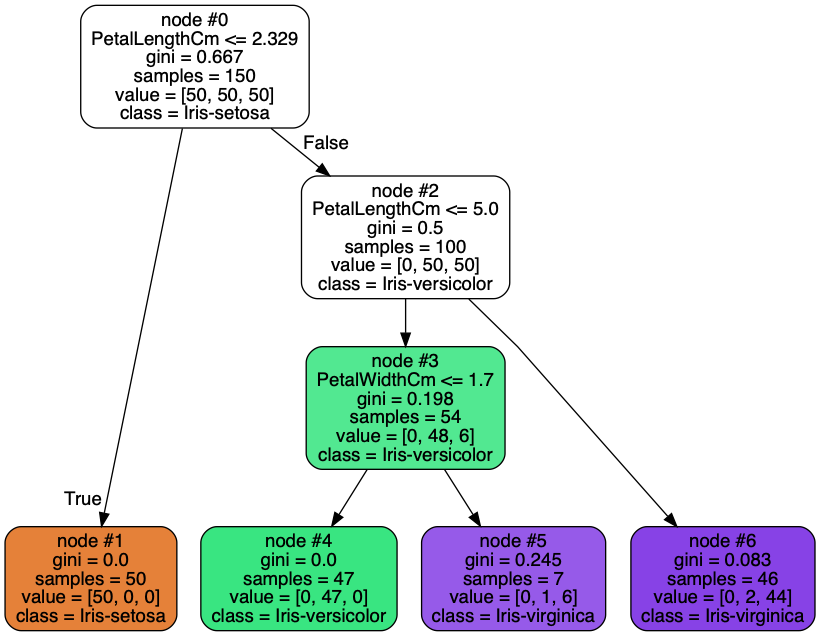

In [7]:
Image('optimal_tree_iris.png')

### Greedy : CART

In [8]:
## Fit CART
cart_model = tree.DecisionTreeClassifier(max_depth=3, criterion="gini")
cart_model.fit(X, y)


## Make prediction
y_pred = cart_model.predict(X)
y_pred_prob = cart_model.predict_proba(X=X)

# Check confusion matrix
print("Confusion Matrix :")
print(confusion_matrix(y_true=y,
                       y_pred=y_pred))

print(classification_report(y_true=y,
                            y_pred=y_pred))

# Plot Greedy Tree
feature_names = iris_data.columns.values[:4]
class_names = np.unique(y)

dot_data = tree.export_graphviz(cart_model,
                                out_file=None,
                                feature_names=feature_names,
                                class_names=class_names,
                                label='all',
                                impurity=True,
                                node_ids=True,
                                filled=True,
                                rounded=True,
                                leaves_parallel=True,
                                special_characters=False)

graph = graphviz.Source(dot_data)
graph.format = 'png'
graph.render(filename='greedy_tree_iris', directory='', view=True)


Confusion Matrix :
[[50  0  0]
 [ 0 47  3]
 [ 0  1 49]]
                 precision    recall  f1-score   support

    Iris-setosa       1.00      1.00      1.00        50
Iris-versicolor       0.98      0.94      0.96        50
 Iris-virginica       0.94      0.98      0.96        50

       accuracy                           0.97       150
      macro avg       0.97      0.97      0.97       150
   weighted avg       0.97      0.97      0.97       150



'greedy_tree_iris.png'

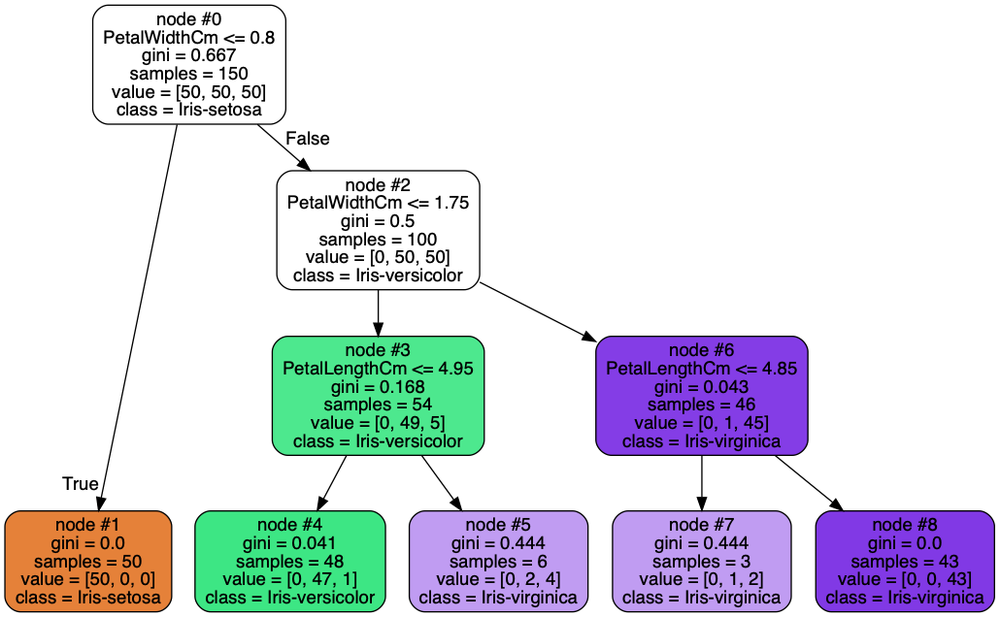

In [9]:
Image('greedy_tree_iris.png')